In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score   
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import classification_report as cls_report
from sklearn.metrics import f1_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.neighbors import KNeighborsClassifier     #KNN
from sklearn.linear_model import LogisticRegression    #Logistic Regression
from sklearn.tree import DecisionTreeClassifier        #Decision Tree
from sklearn.ensemble import RandomForestClassifier    #Random Forest
from sklearn.neural_network import MLPClassifier       #Neural Network
from sklearn.svm import SVC                            #SVM
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import StratifiedKFold
import sklearn.metrics as metrics
from sklearn.metrics import auc

In [3]:
train_df=pd.read_csv('/Users/davislab/Downloads/train_255.csv')
test_df=pd.read_csv('/Users/davislab/Downloads/test_255.csv')

In [4]:
train_df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [5]:
test_df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
0,381110,Male,25,1,11.0,1,< 1 Year,No,35786.0,152.0,53
1,381111,Male,40,1,28.0,0,1-2 Year,Yes,33762.0,7.0,111
2,381112,Male,47,1,28.0,0,1-2 Year,Yes,40050.0,124.0,199
3,381113,Male,24,1,27.0,1,< 1 Year,Yes,37356.0,152.0,187
4,381114,Male,27,1,28.0,1,< 1 Year,No,59097.0,152.0,297


In [6]:
train_df.isnull().values.any(), test_df.isnull().values.any()

(False, False)

In [7]:
train_df.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


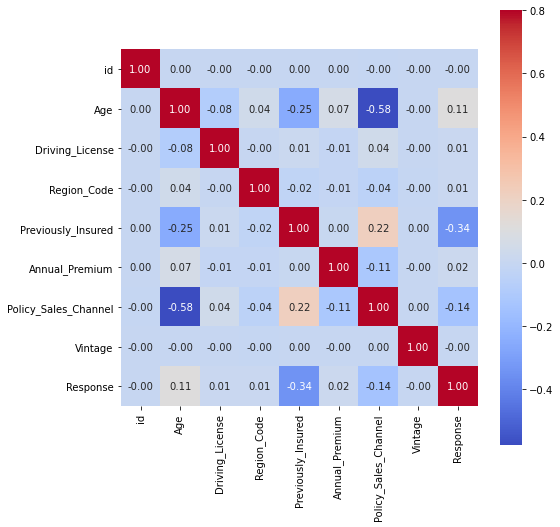

In [8]:
matrix = train_df.corr(method='pearson') #checking the correlation between the features
f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(matrix, vmax=.8, square=True,annot=True, fmt= '.2f', cbar=True, annot_kws={'size': 10}, cmap="coolwarm");

<AxesSubplot:xlabel='Response', ylabel='count'>

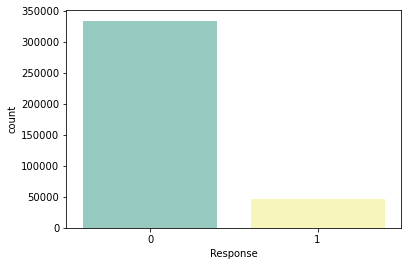

In [9]:
sns.countplot(x=train_df['Response'],palette="Set3")   #target variable class count

<AxesSubplot:xlabel='Gender', ylabel='count'>

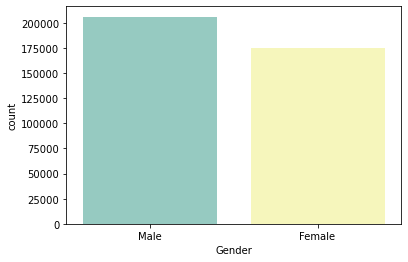

In [10]:
sns.countplot(x=train_df['Gender'],palette="Set3")   #gender distribution

<AxesSubplot:xlabel='Previously_Insured', ylabel='count'>

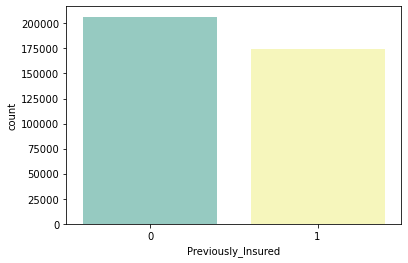

In [11]:
sns.countplot(x=train_df['Previously_Insured'],palette="Set3")  #count of customers who are previously insured or not insured

<AxesSubplot:xlabel='Vehicle_Age', ylabel='count'>

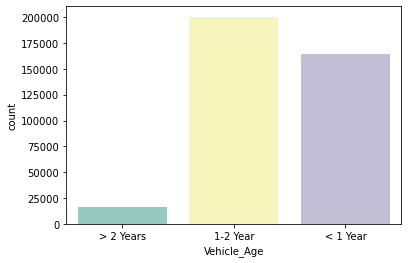

In [12]:
sns.countplot(x=train_df['Vehicle_Age'],palette="Set3")   #count of vehicles based on vehicle age

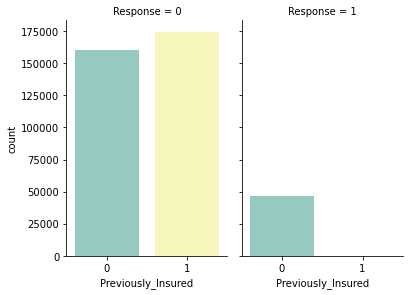

In [13]:
g = sns.catplot(x="Previously_Insured", col="Response",   #count of customers who are previously insured and responded 0 or 1
                data=train_df, kind="count",
                height=4, aspect=.7,palette="Set3");

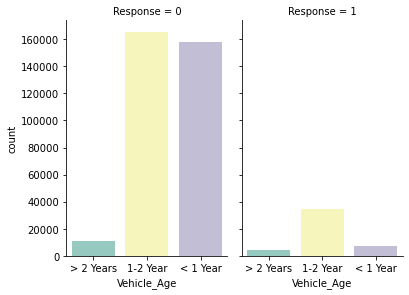

In [14]:
g = sns.catplot(x="Vehicle_Age", col="Response",      #count of customers who responded yes or no based on their vehicle ages 
                data=train_df, kind="count",
                height=4, aspect=.7,palette="Set3");

<AxesSubplot:xlabel='Vehicle_Damage', ylabel='count'>

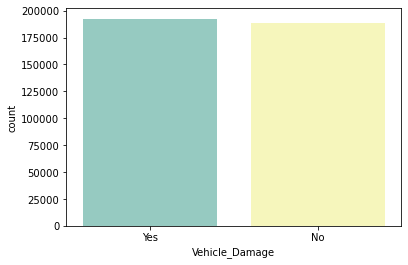

In [15]:
sns.countplot(x=train_df['Vehicle_Damage'],palette="Set3")  #distribution showing vehicle damage count

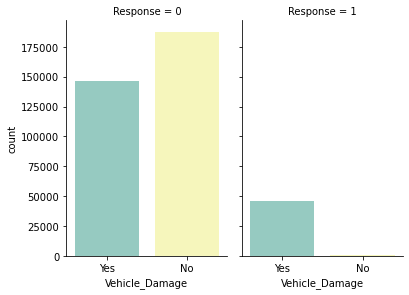

In [16]:
g = sns.catplot(x="Vehicle_Damage", col="Response",  #count of customers with damaged vehicle who responded yes or no
                data=train_df, kind="count",
                height=4, aspect=.7,palette="Set3");

In [17]:
gender_coder = {'Male':1, 'Female':0} ## one hot encoding of the nominal gender values
train_df.Gender = train_df.Gender.map(gender_coder)
train_df

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,1,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,1,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,1,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,1,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,0,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,1,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,1,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,1,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,0,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0


In [18]:
train_df = pd.get_dummies(train_df, columns=['Vehicle_Age'])  #Constructing 3 new features from the ordinal vehicle age feature

In [19]:
train_df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years
0,1,1,44,1,28.0,0,Yes,40454.0,26.0,217,1,0,0,1
1,2,1,76,1,3.0,0,No,33536.0,26.0,183,0,1,0,0
2,3,1,47,1,28.0,0,Yes,38294.0,26.0,27,1,0,0,1
3,4,1,21,1,11.0,1,No,28619.0,152.0,203,0,0,1,0
4,5,0,29,1,41.0,1,No,27496.0,152.0,39,0,0,1,0


In [20]:
vehicle_coder = {'Yes':1, 'No':0} ## one hot encoding of the nominal vehicle damage values
train_df.Vehicle_Damage = train_df.Vehicle_Damage.map(vehicle_coder)
train_df

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years
0,1,1,44,1,28.0,0,1,40454.0,26.0,217,1,0,0,1
1,2,1,76,1,3.0,0,0,33536.0,26.0,183,0,1,0,0
2,3,1,47,1,28.0,0,1,38294.0,26.0,27,1,0,0,1
3,4,1,21,1,11.0,1,0,28619.0,152.0,203,0,0,1,0
4,5,0,29,1,41.0,1,0,27496.0,152.0,39,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,1,74,1,26.0,1,0,30170.0,26.0,88,0,1,0,0
381105,381106,1,30,1,37.0,1,0,40016.0,152.0,131,0,0,1,0
381106,381107,1,21,1,30.0,1,0,35118.0,160.0,161,0,0,1,0
381107,381108,0,68,1,14.0,0,1,44617.0,124.0,74,0,0,0,1


In [21]:
train_df=train_df.drop(['id'],axis=1)
train_df

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years
0,1,44,1,28.0,0,1,40454.0,26.0,217,1,0,0,1
1,1,76,1,3.0,0,0,33536.0,26.0,183,0,1,0,0
2,1,47,1,28.0,0,1,38294.0,26.0,27,1,0,0,1
3,1,21,1,11.0,1,0,28619.0,152.0,203,0,0,1,0
4,0,29,1,41.0,1,0,27496.0,152.0,39,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
381104,1,74,1,26.0,1,0,30170.0,26.0,88,0,1,0,0
381105,1,30,1,37.0,1,0,40016.0,152.0,131,0,0,1,0
381106,1,21,1,30.0,1,0,35118.0,160.0,161,0,0,1,0
381107,0,68,1,14.0,0,1,44617.0,124.0,74,0,0,0,1


In [22]:
min_max = MinMaxScaler()   #normalizing the Annual_Premium column
train_df[['Annual_Premium']] = min_max.fit_transform(train_df[['Annual_Premium']])
train_df.head()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years
0,1,44,1,28.0,0,1,0.070366,26.0,217,1,0,0,1
1,1,76,1,3.0,0,0,0.057496,26.0,183,0,1,0,0
2,1,47,1,28.0,0,1,0.066347,26.0,27,1,0,0,1
3,1,21,1,11.0,1,0,0.048348,152.0,203,0,0,1,0
4,0,29,1,41.0,1,0,0.046259,152.0,39,0,0,1,0


In [23]:
train_df.Response.value_counts()   #The target 'Response' is imbalanced 

0    334399
1     46710
Name: Response, dtype: int64

In [24]:
X_train=train_df.loc[:, train_df.columns != 'Response']
y_train=train_df['Response']
X_train.shape, y_train.shape

((381109, 12), (381109,))

In [25]:
from imblearn.over_sampling import SMOTE      #oversampling for removing class imbalance
oversample = SMOTE()
X, y = oversample.fit_resample(X_train, y_train)

In [36]:
X.shape,y.shape

((668798, 12), (668798,))

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)  #splitting the dataset

### Gradient Boosting Classifier

In [38]:
parameters = {'n_estimators':[100, 500], 'max_depth': [3,6],'learning_rate': [0.01,0.1],'validation_fraction':[0.2],'n_iter_no_change':[5],'tol':[0.01]}
gb = GradientBoostingClassifier()
clf = GridSearchCV(gb, parameters,cv=5)

In [ ]:
clf.fit(X_train,y_train)

In [40]:
print(clf.best_params_)

{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 500, 'n_iter_no_change': 5, 'tol': 0.01, 'validation_fraction': 0.2}


In [41]:
def plot_ROC(fpr, tpr, m_name):
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(10,8))
    lw = 2
    plt.plot(fpr, tpr, color='blue',lw=lw, label='ROC curve (area = %0.2f)' % roc_auc, alpha=0.5)    
    plt.plot([0, 1], [0, 1], color='red', lw=lw, linestyle='--', alpha=0.5)    
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.grid(True)
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('Receiver operating characteristic for %s'%m_name, fontsize=20)
    plt.legend(loc="lower right", fontsize=16)
    plt.show()

              precision    recall  f1-score   support

           0       0.89      0.77      0.82     66775
           1       0.80      0.91      0.85     66985

    accuracy                           0.84    133760
   macro avg       0.84      0.84      0.84    133760
weighted avg       0.84      0.84      0.84    133760

0.9245071677535723


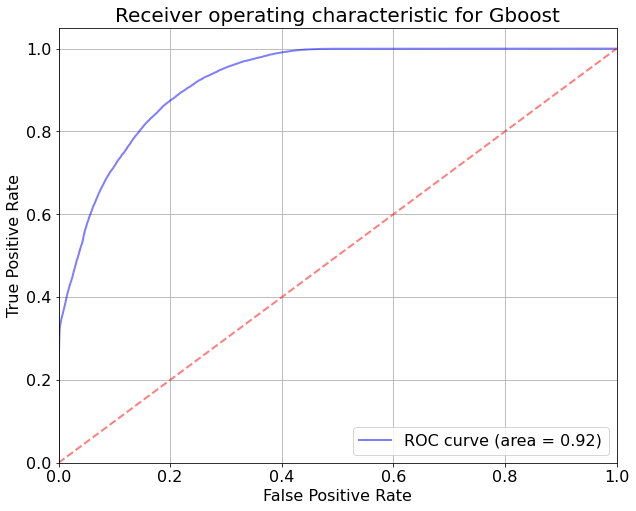

In [82]:
gb_preds = clf.predict_proba(X_test)
gb_class = clf.predict(X_test)
print(classification_report(y_test, gb_class))
Gboost_score = roc_auc_score(y_test, gb_preds[:,1], average = 'weighted')
print(Gboost_score)
(fpr, tpr, thresholds) = roc_curve(y_test, gb_preds[:,1])
plot_ROC(fpr, tpr, 'Gboost')

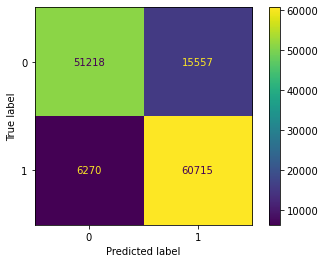

In [43]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clf, X_test, y_test)  
plt.show() 

### MLP Classifier

In [44]:
X_train_mlp, X_test_mlp, y_train_mlp, y_test_mlp = train_test_split(X,y,test_size=0.2, random_state=42)

In [45]:
mlp_parameters = {'random_state':[0,42], 'max_iter':[300,400],'validation_fraction':[0.2],'n_iter_no_change':[5], 'tol':[0.01]}

In [46]:
from sklearn.neural_network import MLPClassifier
mlpclf = MLPClassifier()

In [47]:
mlp_clf = GridSearchCV(mlpclf, mlp_parameters,cv=5)

In [48]:
mlp_clf.fit(X_train_mlp,y_train_mlp)

GridSearchCV(cv=5, estimator=MLPClassifier(),
             param_grid={'max_iter': [300, 400], 'n_iter_no_change': [5],
                         'random_state': [0, 42], 'tol': [0.01],
                         'validation_fraction': [0.2]})

In [49]:
print(mlp_clf.best_params_)

{'max_iter': 300, 'n_iter_no_change': 5, 'random_state': 42, 'tol': 0.01, 'validation_fraction': 0.2}


              precision    recall  f1-score   support

           0       0.92      0.66      0.77     66775
           1       0.73      0.94      0.82     66985

    accuracy                           0.80    133760
   macro avg       0.82      0.80      0.79    133760
weighted avg       0.82      0.80      0.79    133760

0.8837158551816237


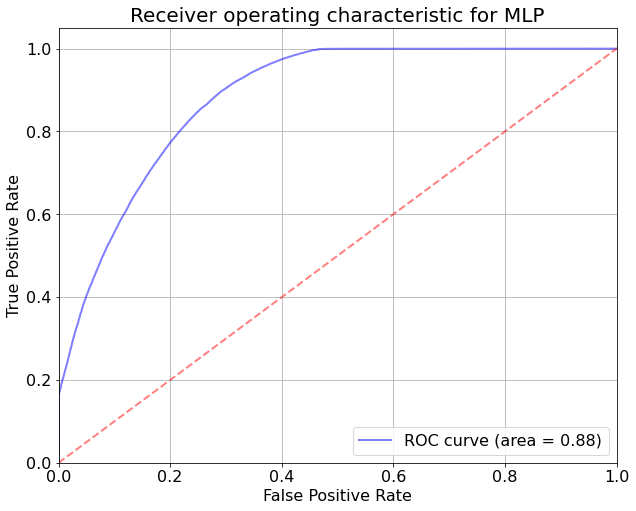

In [81]:
mlp_preds = mlp_clf.predict_proba(X_test_mlp)
mlp_class = mlp_clf.predict(X_test_mlp)
print(classification_report(y_test_mlp, mlp_class))
mlp_score = roc_auc_score(y_test_mlp, mlp_preds[:,1], average = 'weighted')
print(mlp_score)
(fpr, tpr, thresholds) = roc_curve(y_test_mlp, mlp_preds[:,1])
plot_ROC(fpr, tpr, 'MLP')

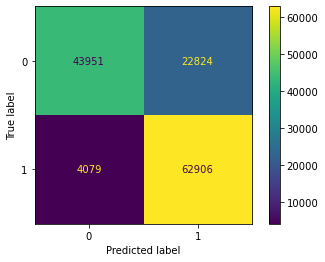

In [60]:
plot_confusion_matrix(mlp_clf, X_test_mlp, y_test_mlp)  
plt.show() 

### CatBoost Classifier

In [53]:
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(X,y,test_size=0.2, random_state=42)

In [56]:
from catboost import CatBoostClassifier
model = CatBoostClassifier()
cat_params = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}
cat_clf = GridSearchCV(model,cat_params,cv=5)                                      

In [57]:
cat_clf.fit(X_train_cat,y_train_cat)

0:	learn: 0.6599481	total: 32.2ms	remaining: 32.2s
1:	learn: 0.6307662	total: 65.7ms	remaining: 32.8s
2:	learn: 0.6067355	total: 103ms	remaining: 34.1s
3:	learn: 0.5846813	total: 138ms	remaining: 34.4s
4:	learn: 0.5657767	total: 175ms	remaining: 34.8s
5:	learn: 0.5561221	total: 206ms	remaining: 34.2s
6:	learn: 0.5471716	total: 238ms	remaining: 33.8s
7:	learn: 0.5323045	total: 286ms	remaining: 35.4s
8:	learn: 0.5189190	total: 334ms	remaining: 36.8s
9:	learn: 0.5133223	total: 374ms	remaining: 37s
10:	learn: 0.5068435	total: 407ms	remaining: 36.6s
11:	learn: 0.4967499	total: 446ms	remaining: 36.7s
12:	learn: 0.4923284	total: 492ms	remaining: 37.4s
13:	learn: 0.4881878	total: 525ms	remaining: 37s
14:	learn: 0.4843302	total: 557ms	remaining: 36.6s
15:	learn: 0.4759499	total: 591ms	remaining: 36.4s
16:	learn: 0.4692659	total: 624ms	remaining: 36.1s
17:	learn: 0.4663746	total: 656ms	remaining: 35.8s
18:	learn: 0.4637107	total: 704ms	remaining: 36.3s
19:	learn: 0.4583601	total: 749ms	remaining

164:	learn: 0.3557420	total: 6.01s	remaining: 30.4s
165:	learn: 0.3555168	total: 6.04s	remaining: 30.4s
166:	learn: 0.3547800	total: 6.08s	remaining: 30.3s
167:	learn: 0.3545249	total: 6.12s	remaining: 30.3s
168:	learn: 0.3542691	total: 6.17s	remaining: 30.3s
169:	learn: 0.3541425	total: 6.2s	remaining: 30.2s
170:	learn: 0.3539782	total: 6.24s	remaining: 30.2s
171:	learn: 0.3538356	total: 6.28s	remaining: 30.2s
172:	learn: 0.3537389	total: 6.3s	remaining: 30.1s
173:	learn: 0.3535323	total: 6.34s	remaining: 30.1s
174:	learn: 0.3532195	total: 6.37s	remaining: 30s
175:	learn: 0.3530855	total: 6.41s	remaining: 30s
176:	learn: 0.3529385	total: 6.45s	remaining: 30s
177:	learn: 0.3524475	total: 6.48s	remaining: 29.9s
178:	learn: 0.3519891	total: 6.52s	remaining: 29.9s
179:	learn: 0.3517967	total: 6.55s	remaining: 29.9s
180:	learn: 0.3516306	total: 6.59s	remaining: 29.8s
181:	learn: 0.3504643	total: 6.63s	remaining: 29.8s
182:	learn: 0.3503921	total: 6.67s	remaining: 29.8s
183:	learn: 0.350325

328:	learn: 0.3306509	total: 11.7s	remaining: 23.9s
329:	learn: 0.3306183	total: 11.7s	remaining: 23.8s
330:	learn: 0.3305979	total: 11.8s	remaining: 23.8s
331:	learn: 0.3305049	total: 11.8s	remaining: 23.7s
332:	learn: 0.3304139	total: 11.8s	remaining: 23.7s
333:	learn: 0.3303348	total: 11.9s	remaining: 23.6s
334:	learn: 0.3302166	total: 11.9s	remaining: 23.6s
335:	learn: 0.3301817	total: 11.9s	remaining: 23.6s
336:	learn: 0.3301487	total: 12s	remaining: 23.5s
337:	learn: 0.3295643	total: 12s	remaining: 23.5s
338:	learn: 0.3294947	total: 12s	remaining: 23.5s
339:	learn: 0.3294662	total: 12.1s	remaining: 23.5s
340:	learn: 0.3294265	total: 12.1s	remaining: 23.4s
341:	learn: 0.3289126	total: 12.1s	remaining: 23.4s
342:	learn: 0.3287940	total: 12.2s	remaining: 23.4s
343:	learn: 0.3286646	total: 12.2s	remaining: 23.3s
344:	learn: 0.3286390	total: 12.3s	remaining: 23.3s
345:	learn: 0.3286179	total: 12.3s	remaining: 23.3s
346:	learn: 0.3285377	total: 12.4s	remaining: 23.3s
347:	learn: 0.3284

491:	learn: 0.3146237	total: 17.4s	remaining: 18s
492:	learn: 0.3142950	total: 17.4s	remaining: 17.9s
493:	learn: 0.3142337	total: 17.5s	remaining: 17.9s
494:	learn: 0.3141881	total: 17.5s	remaining: 17.9s
495:	learn: 0.3141766	total: 17.5s	remaining: 17.8s
496:	learn: 0.3141423	total: 17.6s	remaining: 17.8s
497:	learn: 0.3140925	total: 17.6s	remaining: 17.7s
498:	learn: 0.3140708	total: 17.6s	remaining: 17.7s
499:	learn: 0.3140601	total: 17.7s	remaining: 17.7s
500:	learn: 0.3140399	total: 17.7s	remaining: 17.6s
501:	learn: 0.3140311	total: 17.8s	remaining: 17.6s
502:	learn: 0.3139465	total: 17.8s	remaining: 17.6s
503:	learn: 0.3138360	total: 17.8s	remaining: 17.5s
504:	learn: 0.3137924	total: 17.9s	remaining: 17.5s
505:	learn: 0.3137365	total: 17.9s	remaining: 17.5s
506:	learn: 0.3136283	total: 17.9s	remaining: 17.4s
507:	learn: 0.3135725	total: 18s	remaining: 17.4s
508:	learn: 0.3132931	total: 18s	remaining: 17.4s
509:	learn: 0.3131487	total: 18s	remaining: 17.3s
510:	learn: 0.312987

656:	learn: 0.2995336	total: 23.3s	remaining: 12.2s
657:	learn: 0.2995278	total: 23.4s	remaining: 12.2s
658:	learn: 0.2995204	total: 23.4s	remaining: 12.1s
659:	learn: 0.2994437	total: 23.4s	remaining: 12.1s
660:	learn: 0.2994299	total: 23.5s	remaining: 12s
661:	learn: 0.2992745	total: 23.5s	remaining: 12s
662:	learn: 0.2992626	total: 23.5s	remaining: 12s
663:	learn: 0.2992561	total: 23.6s	remaining: 11.9s
664:	learn: 0.2991979	total: 23.6s	remaining: 11.9s
665:	learn: 0.2991887	total: 23.7s	remaining: 11.9s
666:	learn: 0.2991457	total: 23.7s	remaining: 11.8s
667:	learn: 0.2990873	total: 23.7s	remaining: 11.8s
668:	learn: 0.2990769	total: 23.8s	remaining: 11.8s
669:	learn: 0.2990203	total: 23.8s	remaining: 11.7s
670:	learn: 0.2990083	total: 23.8s	remaining: 11.7s
671:	learn: 0.2989586	total: 23.9s	remaining: 11.6s
672:	learn: 0.2989435	total: 23.9s	remaining: 11.6s
673:	learn: 0.2989162	total: 23.9s	remaining: 11.6s
674:	learn: 0.2988783	total: 23.9s	remaining: 11.5s
675:	learn: 0.2987

818:	learn: 0.2899887	total: 29s	remaining: 6.41s
819:	learn: 0.2899759	total: 29s	remaining: 6.37s
820:	learn: 0.2899148	total: 29.1s	remaining: 6.33s
821:	learn: 0.2898798	total: 29.1s	remaining: 6.3s
822:	learn: 0.2898506	total: 29.1s	remaining: 6.27s
823:	learn: 0.2898170	total: 29.2s	remaining: 6.23s
824:	learn: 0.2897299	total: 29.2s	remaining: 6.2s
825:	learn: 0.2897192	total: 29.3s	remaining: 6.16s
826:	learn: 0.2897032	total: 29.3s	remaining: 6.13s
827:	learn: 0.2896872	total: 29.3s	remaining: 6.09s
828:	learn: 0.2895593	total: 29.4s	remaining: 6.06s
829:	learn: 0.2894949	total: 29.4s	remaining: 6.02s
830:	learn: 0.2894784	total: 29.4s	remaining: 5.99s
831:	learn: 0.2894728	total: 29.5s	remaining: 5.95s
832:	learn: 0.2894616	total: 29.5s	remaining: 5.92s
833:	learn: 0.2894449	total: 29.5s	remaining: 5.88s
834:	learn: 0.2894383	total: 29.6s	remaining: 5.85s
835:	learn: 0.2894251	total: 29.6s	remaining: 5.81s
836:	learn: 0.2893691	total: 29.7s	remaining: 5.78s
837:	learn: 0.2893

982:	learn: 0.2841078	total: 34.9s	remaining: 604ms
983:	learn: 0.2840994	total: 35s	remaining: 569ms
984:	learn: 0.2839945	total: 35s	remaining: 533ms
985:	learn: 0.2838809	total: 35.1s	remaining: 498ms
986:	learn: 0.2838669	total: 35.1s	remaining: 462ms
987:	learn: 0.2838538	total: 35.1s	remaining: 426ms
988:	learn: 0.2838460	total: 35.1s	remaining: 391ms
989:	learn: 0.2838039	total: 35.2s	remaining: 355ms
990:	learn: 0.2836950	total: 35.2s	remaining: 320ms
991:	learn: 0.2836826	total: 35.2s	remaining: 284ms
992:	learn: 0.2836752	total: 35.3s	remaining: 249ms
993:	learn: 0.2836584	total: 35.3s	remaining: 213ms
994:	learn: 0.2836469	total: 35.3s	remaining: 177ms
995:	learn: 0.2836312	total: 35.3s	remaining: 142ms
996:	learn: 0.2836208	total: 35.4s	remaining: 106ms
997:	learn: 0.2836060	total: 35.4s	remaining: 71ms
998:	learn: 0.2835996	total: 35.4s	remaining: 35.5ms
999:	learn: 0.2834970	total: 35.5s	remaining: 0us
0:	learn: 0.6599547	total: 32.4ms	remaining: 32.4s
1:	learn: 0.6308410

143:	learn: 0.3601745	total: 4.71s	remaining: 28s
144:	learn: 0.3598927	total: 4.75s	remaining: 28s
145:	learn: 0.3594034	total: 4.78s	remaining: 28s
146:	learn: 0.3593340	total: 4.82s	remaining: 27.9s
147:	learn: 0.3592626	total: 4.84s	remaining: 27.9s
148:	learn: 0.3590962	total: 4.87s	remaining: 27.8s
149:	learn: 0.3590251	total: 4.9s	remaining: 27.8s
150:	learn: 0.3589563	total: 4.93s	remaining: 27.7s
151:	learn: 0.3588005	total: 4.96s	remaining: 27.7s
152:	learn: 0.3586544	total: 4.99s	remaining: 27.6s
153:	learn: 0.3584590	total: 5.02s	remaining: 27.6s
154:	learn: 0.3580427	total: 5.05s	remaining: 27.6s
155:	learn: 0.3578856	total: 5.09s	remaining: 27.5s
156:	learn: 0.3577578	total: 5.12s	remaining: 27.5s
157:	learn: 0.3576175	total: 5.16s	remaining: 27.5s
158:	learn: 0.3575396	total: 5.18s	remaining: 27.4s
159:	learn: 0.3574553	total: 5.21s	remaining: 27.4s
160:	learn: 0.3572178	total: 5.24s	remaining: 27.3s
161:	learn: 0.3570042	total: 5.27s	remaining: 27.3s
162:	learn: 0.35663

307:	learn: 0.3311967	total: 10.2s	remaining: 22.8s
308:	learn: 0.3311125	total: 10.2s	remaining: 22.8s
309:	learn: 0.3310894	total: 10.2s	remaining: 22.8s
310:	learn: 0.3310481	total: 10.3s	remaining: 22.7s
311:	learn: 0.3309624	total: 10.3s	remaining: 22.7s
312:	learn: 0.3308544	total: 10.3s	remaining: 22.7s
313:	learn: 0.3307178	total: 10.4s	remaining: 22.6s
314:	learn: 0.3306415	total: 10.4s	remaining: 22.6s
315:	learn: 0.3306223	total: 10.4s	remaining: 22.6s
316:	learn: 0.3305428	total: 10.5s	remaining: 22.5s
317:	learn: 0.3305107	total: 10.5s	remaining: 22.5s
318:	learn: 0.3302577	total: 10.5s	remaining: 22.5s
319:	learn: 0.3302309	total: 10.5s	remaining: 22.4s
320:	learn: 0.3301133	total: 10.6s	remaining: 22.4s
321:	learn: 0.3300847	total: 10.6s	remaining: 22.4s
322:	learn: 0.3299434	total: 10.7s	remaining: 22.3s
323:	learn: 0.3299212	total: 10.7s	remaining: 22.3s
324:	learn: 0.3297964	total: 10.7s	remaining: 22.2s
325:	learn: 0.3296855	total: 10.7s	remaining: 22.2s
326:	learn: 

472:	learn: 0.3161253	total: 15.7s	remaining: 17.5s
473:	learn: 0.3161001	total: 15.8s	remaining: 17.5s
474:	learn: 0.3159911	total: 15.8s	remaining: 17.5s
475:	learn: 0.3158283	total: 15.8s	remaining: 17.4s
476:	learn: 0.3157114	total: 15.9s	remaining: 17.4s
477:	learn: 0.3156513	total: 15.9s	remaining: 17.4s
478:	learn: 0.3155205	total: 15.9s	remaining: 17.3s
479:	learn: 0.3153990	total: 16s	remaining: 17.3s
480:	learn: 0.3152613	total: 16s	remaining: 17.3s
481:	learn: 0.3152025	total: 16s	remaining: 17.2s
482:	learn: 0.3151658	total: 16.1s	remaining: 17.2s
483:	learn: 0.3151142	total: 16.1s	remaining: 17.2s
484:	learn: 0.3149519	total: 16.1s	remaining: 17.1s
485:	learn: 0.3149020	total: 16.2s	remaining: 17.1s
486:	learn: 0.3147850	total: 16.2s	remaining: 17.1s
487:	learn: 0.3147251	total: 16.2s	remaining: 17s
488:	learn: 0.3146345	total: 16.3s	remaining: 17s
489:	learn: 0.3144881	total: 16.3s	remaining: 17s
490:	learn: 0.3143878	total: 16.3s	remaining: 16.9s
491:	learn: 0.3142024	to

635:	learn: 0.3014558	total: 21.4s	remaining: 12.3s
636:	learn: 0.3013190	total: 21.5s	remaining: 12.2s
637:	learn: 0.3013092	total: 21.5s	remaining: 12.2s
638:	learn: 0.3012952	total: 21.5s	remaining: 12.2s
639:	learn: 0.3012816	total: 21.6s	remaining: 12.1s
640:	learn: 0.3011851	total: 21.6s	remaining: 12.1s
641:	learn: 0.3011032	total: 21.6s	remaining: 12.1s
642:	learn: 0.3010354	total: 21.7s	remaining: 12s
643:	learn: 0.3009089	total: 21.7s	remaining: 12s
644:	learn: 0.3007064	total: 21.7s	remaining: 12s
645:	learn: 0.3006087	total: 21.8s	remaining: 11.9s
646:	learn: 0.3005259	total: 21.8s	remaining: 11.9s
647:	learn: 0.3004508	total: 21.9s	remaining: 11.9s
648:	learn: 0.3003577	total: 21.9s	remaining: 11.8s
649:	learn: 0.3002854	total: 21.9s	remaining: 11.8s
650:	learn: 0.3002232	total: 22s	remaining: 11.8s
651:	learn: 0.3002082	total: 22s	remaining: 11.7s
652:	learn: 0.3001986	total: 22s	remaining: 11.7s
653:	learn: 0.3001815	total: 22.1s	remaining: 11.7s
654:	learn: 0.3001714	to

799:	learn: 0.2913582	total: 26.9s	remaining: 6.73s
800:	learn: 0.2913437	total: 27s	remaining: 6.7s
801:	learn: 0.2913118	total: 27s	remaining: 6.66s
802:	learn: 0.2912807	total: 27s	remaining: 6.63s
803:	learn: 0.2912220	total: 27.1s	remaining: 6.6s
804:	learn: 0.2912111	total: 27.1s	remaining: 6.56s
805:	learn: 0.2911445	total: 27.1s	remaining: 6.53s
806:	learn: 0.2910447	total: 27.2s	remaining: 6.5s
807:	learn: 0.2910376	total: 27.2s	remaining: 6.46s
808:	learn: 0.2909526	total: 27.2s	remaining: 6.43s
809:	learn: 0.2908803	total: 27.3s	remaining: 6.4s
810:	learn: 0.2908325	total: 27.3s	remaining: 6.36s
811:	learn: 0.2907915	total: 27.3s	remaining: 6.33s
812:	learn: 0.2907502	total: 27.4s	remaining: 6.3s
813:	learn: 0.2906988	total: 27.4s	remaining: 6.26s
814:	learn: 0.2906075	total: 27.4s	remaining: 6.23s
815:	learn: 0.2905549	total: 27.5s	remaining: 6.2s
816:	learn: 0.2904066	total: 27.5s	remaining: 6.16s
817:	learn: 0.2903259	total: 27.6s	remaining: 6.13s
818:	learn: 0.2903099	to

960:	learn: 0.2859303	total: 32.3s	remaining: 1.31s
961:	learn: 0.2859227	total: 32.4s	remaining: 1.28s
962:	learn: 0.2859101	total: 32.4s	remaining: 1.24s
963:	learn: 0.2859035	total: 32.4s	remaining: 1.21s
964:	learn: 0.2858227	total: 32.5s	remaining: 1.18s
965:	learn: 0.2857320	total: 32.5s	remaining: 1.14s
966:	learn: 0.2857242	total: 32.5s	remaining: 1.11s
967:	learn: 0.2857181	total: 32.6s	remaining: 1.08s
968:	learn: 0.2857131	total: 32.6s	remaining: 1.04s
969:	learn: 0.2857015	total: 32.6s	remaining: 1.01s
970:	learn: 0.2856804	total: 32.6s	remaining: 975ms
971:	learn: 0.2856203	total: 32.7s	remaining: 941ms
972:	learn: 0.2855329	total: 32.7s	remaining: 908ms
973:	learn: 0.2855219	total: 32.7s	remaining: 874ms
974:	learn: 0.2855137	total: 32.8s	remaining: 840ms
975:	learn: 0.2855070	total: 32.8s	remaining: 807ms
976:	learn: 0.2855004	total: 32.8s	remaining: 773ms
977:	learn: 0.2854954	total: 32.9s	remaining: 739ms
978:	learn: 0.2854880	total: 32.9s	remaining: 706ms
979:	learn: 

125:	learn: 0.3639528	total: 4.62s	remaining: 32s
126:	learn: 0.3637387	total: 4.65s	remaining: 32s
127:	learn: 0.3636168	total: 4.68s	remaining: 31.9s
128:	learn: 0.3635064	total: 4.71s	remaining: 31.8s
129:	learn: 0.3633898	total: 4.73s	remaining: 31.7s
130:	learn: 0.3631225	total: 4.77s	remaining: 31.6s
131:	learn: 0.3629672	total: 4.8s	remaining: 31.6s
132:	learn: 0.3627458	total: 4.84s	remaining: 31.5s
133:	learn: 0.3626592	total: 4.87s	remaining: 31.5s
134:	learn: 0.3624966	total: 4.9s	remaining: 31.4s
135:	learn: 0.3624141	total: 4.93s	remaining: 31.3s
136:	learn: 0.3622169	total: 4.96s	remaining: 31.2s
137:	learn: 0.3620411	total: 4.99s	remaining: 31.1s
138:	learn: 0.3619403	total: 5.01s	remaining: 31.1s
139:	learn: 0.3617615	total: 5.05s	remaining: 31s
140:	learn: 0.3612234	total: 5.09s	remaining: 31s
141:	learn: 0.3608414	total: 5.13s	remaining: 31s
142:	learn: 0.3594898	total: 5.16s	remaining: 30.9s
143:	learn: 0.3593985	total: 5.19s	remaining: 30.9s
144:	learn: 0.3590963	to

290:	learn: 0.3330291	total: 10s	remaining: 24.4s
291:	learn: 0.3329945	total: 10s	remaining: 24.3s
292:	learn: 0.3329639	total: 10.1s	remaining: 24.3s
293:	learn: 0.3326246	total: 10.1s	remaining: 24.3s
294:	learn: 0.3325201	total: 10.1s	remaining: 24.2s
295:	learn: 0.3324829	total: 10.2s	remaining: 24.2s
296:	learn: 0.3323999	total: 10.2s	remaining: 24.1s
297:	learn: 0.3323697	total: 10.2s	remaining: 24.1s
298:	learn: 0.3321856	total: 10.3s	remaining: 24.1s
299:	learn: 0.3320918	total: 10.3s	remaining: 24s
300:	learn: 0.3320145	total: 10.3s	remaining: 24s
301:	learn: 0.3319057	total: 10.4s	remaining: 23.9s
302:	learn: 0.3318539	total: 10.4s	remaining: 23.9s
303:	learn: 0.3318346	total: 10.4s	remaining: 23.9s
304:	learn: 0.3317906	total: 10.5s	remaining: 23.8s
305:	learn: 0.3312020	total: 10.5s	remaining: 23.8s
306:	learn: 0.3310785	total: 10.5s	remaining: 23.8s
307:	learn: 0.3307907	total: 10.6s	remaining: 23.7s
308:	learn: 0.3304811	total: 10.6s	remaining: 23.7s
309:	learn: 0.330169

451:	learn: 0.3171878	total: 15.5s	remaining: 18.8s
452:	learn: 0.3171076	total: 15.5s	remaining: 18.7s
453:	learn: 0.3170935	total: 15.6s	remaining: 18.7s
454:	learn: 0.3170241	total: 15.6s	remaining: 18.7s
455:	learn: 0.3169035	total: 15.6s	remaining: 18.6s
456:	learn: 0.3168898	total: 15.6s	remaining: 18.6s
457:	learn: 0.3167214	total: 15.7s	remaining: 18.6s
458:	learn: 0.3166596	total: 15.7s	remaining: 18.5s
459:	learn: 0.3166253	total: 15.7s	remaining: 18.5s
460:	learn: 0.3165397	total: 15.8s	remaining: 18.5s
461:	learn: 0.3164693	total: 15.8s	remaining: 18.4s
462:	learn: 0.3164464	total: 15.8s	remaining: 18.4s
463:	learn: 0.3164084	total: 15.9s	remaining: 18.3s
464:	learn: 0.3163873	total: 15.9s	remaining: 18.3s
465:	learn: 0.3163183	total: 15.9s	remaining: 18.3s
466:	learn: 0.3162635	total: 16s	remaining: 18.2s
467:	learn: 0.3162459	total: 16s	remaining: 18.2s
468:	learn: 0.3161832	total: 16s	remaining: 18.1s
469:	learn: 0.3161491	total: 16.1s	remaining: 18.1s
470:	learn: 0.3160

615:	learn: 0.3031854	total: 20.9s	remaining: 13.1s
616:	learn: 0.3031677	total: 21s	remaining: 13s
617:	learn: 0.3031607	total: 21s	remaining: 13s
618:	learn: 0.3031464	total: 21s	remaining: 12.9s
619:	learn: 0.3031379	total: 21.1s	remaining: 12.9s
620:	learn: 0.3031259	total: 21.1s	remaining: 12.9s
621:	learn: 0.3031123	total: 21.1s	remaining: 12.8s
622:	learn: 0.3031022	total: 21.2s	remaining: 12.8s
623:	learn: 0.3030771	total: 21.2s	remaining: 12.8s
624:	learn: 0.3030281	total: 21.2s	remaining: 12.7s
625:	learn: 0.3030003	total: 21.3s	remaining: 12.7s
626:	learn: 0.3029941	total: 21.3s	remaining: 12.7s
627:	learn: 0.3029850	total: 21.3s	remaining: 12.6s
628:	learn: 0.3029130	total: 21.4s	remaining: 12.6s
629:	learn: 0.3028723	total: 21.4s	remaining: 12.6s
630:	learn: 0.3027788	total: 21.4s	remaining: 12.5s
631:	learn: 0.3025942	total: 21.5s	remaining: 12.5s
632:	learn: 0.3025575	total: 21.5s	remaining: 12.5s
633:	learn: 0.3024829	total: 21.5s	remaining: 12.4s
634:	learn: 0.3023510	

778:	learn: 0.2930022	total: 26.5s	remaining: 7.52s
779:	learn: 0.2929856	total: 26.5s	remaining: 7.49s
780:	learn: 0.2929632	total: 26.6s	remaining: 7.45s
781:	learn: 0.2929533	total: 26.6s	remaining: 7.42s
782:	learn: 0.2929415	total: 26.6s	remaining: 7.38s
783:	learn: 0.2929019	total: 26.7s	remaining: 7.35s
784:	learn: 0.2928929	total: 26.7s	remaining: 7.32s
785:	learn: 0.2928738	total: 26.8s	remaining: 7.28s
786:	learn: 0.2928644	total: 26.8s	remaining: 7.25s
787:	learn: 0.2928554	total: 26.8s	remaining: 7.21s
788:	learn: 0.2928484	total: 26.8s	remaining: 7.18s
789:	learn: 0.2928335	total: 26.9s	remaining: 7.14s
790:	learn: 0.2928235	total: 26.9s	remaining: 7.11s
791:	learn: 0.2928107	total: 26.9s	remaining: 7.08s
792:	learn: 0.2927991	total: 27s	remaining: 7.04s
793:	learn: 0.2927339	total: 27s	remaining: 7.01s
794:	learn: 0.2927139	total: 27.1s	remaining: 6.98s
795:	learn: 0.2926775	total: 27.1s	remaining: 6.94s
796:	learn: 0.2926695	total: 27.1s	remaining: 6.91s
797:	learn: 0.29

943:	learn: 0.2866897	total: 32.1s	remaining: 1.91s
944:	learn: 0.2866841	total: 32.2s	remaining: 1.87s
945:	learn: 0.2866658	total: 32.2s	remaining: 1.84s
946:	learn: 0.2864677	total: 32.2s	remaining: 1.8s
947:	learn: 0.2864300	total: 32.3s	remaining: 1.77s
948:	learn: 0.2863685	total: 32.3s	remaining: 1.74s
949:	learn: 0.2863159	total: 32.4s	remaining: 1.7s
950:	learn: 0.2862623	total: 32.4s	remaining: 1.67s
951:	learn: 0.2862172	total: 32.4s	remaining: 1.64s
952:	learn: 0.2861390	total: 32.5s	remaining: 1.6s
953:	learn: 0.2860048	total: 32.5s	remaining: 1.57s
954:	learn: 0.2859596	total: 32.5s	remaining: 1.53s
955:	learn: 0.2859201	total: 32.6s	remaining: 1.5s
956:	learn: 0.2858686	total: 32.6s	remaining: 1.47s
957:	learn: 0.2858120	total: 32.7s	remaining: 1.43s
958:	learn: 0.2857385	total: 32.7s	remaining: 1.4s
959:	learn: 0.2856759	total: 32.7s	remaining: 1.36s
960:	learn: 0.2856352	total: 32.8s	remaining: 1.33s
961:	learn: 0.2855821	total: 32.8s	remaining: 1.29s
962:	learn: 0.285

107:	learn: 0.3704544	total: 3.61s	remaining: 29.8s
108:	learn: 0.3698539	total: 3.65s	remaining: 29.8s
109:	learn: 0.3695567	total: 3.68s	remaining: 29.8s
110:	learn: 0.3693433	total: 3.71s	remaining: 29.7s
111:	learn: 0.3692208	total: 3.74s	remaining: 29.7s
112:	learn: 0.3689635	total: 3.77s	remaining: 29.6s
113:	learn: 0.3682894	total: 3.8s	remaining: 29.6s
114:	learn: 0.3680617	total: 3.84s	remaining: 29.6s
115:	learn: 0.3679248	total: 3.87s	remaining: 29.5s
116:	learn: 0.3677080	total: 3.9s	remaining: 29.5s
117:	learn: 0.3671592	total: 3.94s	remaining: 29.4s
118:	learn: 0.3669129	total: 3.97s	remaining: 29.4s
119:	learn: 0.3663960	total: 4s	remaining: 29.3s
120:	learn: 0.3658009	total: 4.03s	remaining: 29.3s
121:	learn: 0.3655134	total: 4.07s	remaining: 29.3s
122:	learn: 0.3653839	total: 4.11s	remaining: 29.3s
123:	learn: 0.3651869	total: 4.14s	remaining: 29.2s
124:	learn: 0.3648715	total: 4.18s	remaining: 29.3s
125:	learn: 0.3644957	total: 4.21s	remaining: 29.2s
126:	learn: 0.364

268:	learn: 0.3357304	total: 8.97s	remaining: 24.4s
269:	learn: 0.3356378	total: 9.01s	remaining: 24.4s
270:	learn: 0.3356137	total: 9.04s	remaining: 24.3s
271:	learn: 0.3355796	total: 9.07s	remaining: 24.3s
272:	learn: 0.3355110	total: 9.1s	remaining: 24.2s
273:	learn: 0.3354426	total: 9.13s	remaining: 24.2s
274:	learn: 0.3353882	total: 9.16s	remaining: 24.2s
275:	learn: 0.3352818	total: 9.21s	remaining: 24.2s
276:	learn: 0.3352472	total: 9.24s	remaining: 24.1s
277:	learn: 0.3350537	total: 9.27s	remaining: 24.1s
278:	learn: 0.3345059	total: 9.31s	remaining: 24.1s
279:	learn: 0.3344483	total: 9.33s	remaining: 24s
280:	learn: 0.3343545	total: 9.37s	remaining: 24s
281:	learn: 0.3342790	total: 9.4s	remaining: 23.9s
282:	learn: 0.3341130	total: 9.44s	remaining: 23.9s
283:	learn: 0.3340909	total: 9.47s	remaining: 23.9s
284:	learn: 0.3340296	total: 9.5s	remaining: 23.8s
285:	learn: 0.3339891	total: 9.54s	remaining: 23.8s
286:	learn: 0.3338235	total: 9.58s	remaining: 23.8s
287:	learn: 0.33323

431:	learn: 0.3183314	total: 14.7s	remaining: 19.3s
432:	learn: 0.3183107	total: 14.7s	remaining: 19.2s
433:	learn: 0.3181425	total: 14.7s	remaining: 19.2s
434:	learn: 0.3181295	total: 14.8s	remaining: 19.2s
435:	learn: 0.3180616	total: 14.8s	remaining: 19.1s
436:	learn: 0.3180341	total: 14.8s	remaining: 19.1s
437:	learn: 0.3180004	total: 14.9s	remaining: 19.1s
438:	learn: 0.3178966	total: 14.9s	remaining: 19s
439:	learn: 0.3178423	total: 14.9s	remaining: 19s
440:	learn: 0.3177657	total: 15s	remaining: 19s
441:	learn: 0.3176658	total: 15s	remaining: 18.9s
442:	learn: 0.3175989	total: 15s	remaining: 18.9s
443:	learn: 0.3175306	total: 15.1s	remaining: 18.9s
444:	learn: 0.3172980	total: 15.1s	remaining: 18.8s
445:	learn: 0.3172459	total: 15.1s	remaining: 18.8s
446:	learn: 0.3170757	total: 15.2s	remaining: 18.8s
447:	learn: 0.3170472	total: 15.2s	remaining: 18.7s
448:	learn: 0.3170117	total: 15.2s	remaining: 18.7s
449:	learn: 0.3168281	total: 15.3s	remaining: 18.7s
450:	learn: 0.3168107	to

595:	learn: 0.3035666	total: 20.7s	remaining: 14s
596:	learn: 0.3034263	total: 20.7s	remaining: 14s
597:	learn: 0.3032714	total: 20.8s	remaining: 14s
598:	learn: 0.3031964	total: 20.8s	remaining: 13.9s
599:	learn: 0.3030560	total: 20.9s	remaining: 13.9s
600:	learn: 0.3030334	total: 20.9s	remaining: 13.9s
601:	learn: 0.3029808	total: 20.9s	remaining: 13.8s
602:	learn: 0.3029332	total: 21s	remaining: 13.8s
603:	learn: 0.3029212	total: 21s	remaining: 13.8s
604:	learn: 0.3028986	total: 21s	remaining: 13.7s
605:	learn: 0.3028875	total: 21.1s	remaining: 13.7s
606:	learn: 0.3028679	total: 21.1s	remaining: 13.7s
607:	learn: 0.3028535	total: 21.1s	remaining: 13.6s
608:	learn: 0.3027871	total: 21.2s	remaining: 13.6s
609:	learn: 0.3027783	total: 21.2s	remaining: 13.6s
610:	learn: 0.3026457	total: 21.2s	remaining: 13.5s
611:	learn: 0.3025274	total: 21.3s	remaining: 13.5s
612:	learn: 0.3025110	total: 21.3s	remaining: 13.5s
613:	learn: 0.3023709	total: 21.4s	remaining: 13.5s
614:	learn: 0.3021633	to

754:	learn: 0.2934335	total: 26.7s	remaining: 8.66s
755:	learn: 0.2933596	total: 26.7s	remaining: 8.62s
756:	learn: 0.2933429	total: 26.8s	remaining: 8.59s
757:	learn: 0.2933272	total: 26.8s	remaining: 8.55s
758:	learn: 0.2932423	total: 26.8s	remaining: 8.52s
759:	learn: 0.2931508	total: 26.9s	remaining: 8.48s
760:	learn: 0.2929961	total: 26.9s	remaining: 8.45s
761:	learn: 0.2928211	total: 26.9s	remaining: 8.41s
762:	learn: 0.2926868	total: 27s	remaining: 8.38s
763:	learn: 0.2926757	total: 27s	remaining: 8.35s
764:	learn: 0.2925393	total: 27.1s	remaining: 8.31s
765:	learn: 0.2925229	total: 27.1s	remaining: 8.27s
766:	learn: 0.2924612	total: 27.1s	remaining: 8.24s
767:	learn: 0.2924475	total: 27.2s	remaining: 8.2s
768:	learn: 0.2924331	total: 27.2s	remaining: 8.16s
769:	learn: 0.2924218	total: 27.2s	remaining: 8.13s
770:	learn: 0.2924081	total: 27.2s	remaining: 8.09s
771:	learn: 0.2922245	total: 27.3s	remaining: 8.05s
772:	learn: 0.2922103	total: 27.3s	remaining: 8.02s
773:	learn: 0.292

915:	learn: 0.2872597	total: 32.1s	remaining: 2.94s
916:	learn: 0.2872360	total: 32.2s	remaining: 2.91s
917:	learn: 0.2872295	total: 32.2s	remaining: 2.88s
918:	learn: 0.2871933	total: 32.2s	remaining: 2.84s
919:	learn: 0.2871871	total: 32.3s	remaining: 2.81s
920:	learn: 0.2870668	total: 32.3s	remaining: 2.77s
921:	learn: 0.2870029	total: 32.3s	remaining: 2.73s
922:	learn: 0.2869529	total: 32.4s	remaining: 2.7s
923:	learn: 0.2869173	total: 32.4s	remaining: 2.67s
924:	learn: 0.2868743	total: 32.4s	remaining: 2.63s
925:	learn: 0.2867907	total: 32.5s	remaining: 2.6s
926:	learn: 0.2866524	total: 32.5s	remaining: 2.56s
927:	learn: 0.2865326	total: 32.6s	remaining: 2.53s
928:	learn: 0.2864787	total: 32.6s	remaining: 2.49s
929:	learn: 0.2864007	total: 32.6s	remaining: 2.46s
930:	learn: 0.2863212	total: 32.7s	remaining: 2.42s
931:	learn: 0.2862541	total: 32.7s	remaining: 2.39s
932:	learn: 0.2861972	total: 32.8s	remaining: 2.35s
933:	learn: 0.2860494	total: 32.8s	remaining: 2.32s
934:	learn: 0.

76:	learn: 0.3830506	total: 2.58s	remaining: 31s
77:	learn: 0.3827116	total: 2.63s	remaining: 31.1s
78:	learn: 0.3818873	total: 2.67s	remaining: 31.1s
79:	learn: 0.3812697	total: 2.7s	remaining: 31.1s
80:	learn: 0.3810599	total: 2.73s	remaining: 31s
81:	learn: 0.3808660	total: 2.76s	remaining: 30.9s
82:	learn: 0.3802288	total: 2.8s	remaining: 30.9s
83:	learn: 0.3797976	total: 2.83s	remaining: 30.9s
84:	learn: 0.3795841	total: 2.86s	remaining: 30.8s
85:	learn: 0.3792160	total: 2.89s	remaining: 30.7s
86:	learn: 0.3788647	total: 2.92s	remaining: 30.6s
87:	learn: 0.3784101	total: 2.95s	remaining: 30.5s
88:	learn: 0.3782454	total: 2.97s	remaining: 30.4s
89:	learn: 0.3778711	total: 3.01s	remaining: 30.4s
90:	learn: 0.3776998	total: 3.05s	remaining: 30.4s
91:	learn: 0.3772805	total: 3.08s	remaining: 30.4s
92:	learn: 0.3769963	total: 3.11s	remaining: 30.3s
93:	learn: 0.3766690	total: 3.15s	remaining: 30.4s
94:	learn: 0.3762972	total: 3.19s	remaining: 30.4s
95:	learn: 0.3759981	total: 3.23s	rem

236:	learn: 0.3413208	total: 8.19s	remaining: 26.4s
237:	learn: 0.3412745	total: 8.21s	remaining: 26.3s
238:	learn: 0.3410477	total: 8.25s	remaining: 26.3s
239:	learn: 0.3409031	total: 8.29s	remaining: 26.2s
240:	learn: 0.3407552	total: 8.31s	remaining: 26.2s
241:	learn: 0.3404806	total: 8.35s	remaining: 26.2s
242:	learn: 0.3404314	total: 8.39s	remaining: 26.1s
243:	learn: 0.3402186	total: 8.43s	remaining: 26.1s
244:	learn: 0.3401166	total: 8.46s	remaining: 26.1s
245:	learn: 0.3400348	total: 8.5s	remaining: 26s
246:	learn: 0.3399788	total: 8.53s	remaining: 26s
247:	learn: 0.3398916	total: 8.57s	remaining: 26s
248:	learn: 0.3397983	total: 8.61s	remaining: 26s
249:	learn: 0.3397300	total: 8.64s	remaining: 25.9s
250:	learn: 0.3396134	total: 8.68s	remaining: 25.9s
251:	learn: 0.3395840	total: 8.7s	remaining: 25.8s
252:	learn: 0.3395342	total: 8.73s	remaining: 25.8s
253:	learn: 0.3395055	total: 8.76s	remaining: 25.7s
254:	learn: 0.3394289	total: 8.8s	remaining: 25.7s
255:	learn: 0.3392997	t

399:	learn: 0.3207086	total: 13.7s	remaining: 20.6s
400:	learn: 0.3206289	total: 13.8s	remaining: 20.5s
401:	learn: 0.3205929	total: 13.8s	remaining: 20.5s
402:	learn: 0.3204560	total: 13.8s	remaining: 20.5s
403:	learn: 0.3203229	total: 13.9s	remaining: 20.5s
404:	learn: 0.3199648	total: 13.9s	remaining: 20.4s
405:	learn: 0.3197822	total: 13.9s	remaining: 20.4s
406:	learn: 0.3194831	total: 14s	remaining: 20.4s
407:	learn: 0.3194078	total: 14s	remaining: 20.3s
408:	learn: 0.3193827	total: 14s	remaining: 20.3s
409:	learn: 0.3193385	total: 14.1s	remaining: 20.2s
410:	learn: 0.3191239	total: 14.1s	remaining: 20.2s
411:	learn: 0.3190447	total: 14.1s	remaining: 20.2s
412:	learn: 0.3189494	total: 14.2s	remaining: 20.2s
413:	learn: 0.3189353	total: 14.2s	remaining: 20.1s
414:	learn: 0.3186815	total: 14.3s	remaining: 20.1s
415:	learn: 0.3182293	total: 14.3s	remaining: 20.1s
416:	learn: 0.3179557	total: 14.3s	remaining: 20s
417:	learn: 0.3175980	total: 14.4s	remaining: 20s
418:	learn: 0.3175599	

561:	learn: 0.3060422	total: 19.4s	remaining: 15.1s
562:	learn: 0.3060178	total: 19.4s	remaining: 15.1s
563:	learn: 0.3059237	total: 19.5s	remaining: 15s
564:	learn: 0.3057860	total: 19.5s	remaining: 15s
565:	learn: 0.3056518	total: 19.5s	remaining: 15s
566:	learn: 0.3055197	total: 19.6s	remaining: 14.9s
567:	learn: 0.3053113	total: 19.6s	remaining: 14.9s
568:	learn: 0.3051938	total: 19.6s	remaining: 14.9s
569:	learn: 0.3051081	total: 19.7s	remaining: 14.8s
570:	learn: 0.3050091	total: 19.7s	remaining: 14.8s
571:	learn: 0.3049860	total: 19.8s	remaining: 14.8s
572:	learn: 0.3049701	total: 19.8s	remaining: 14.7s
573:	learn: 0.3049594	total: 19.8s	remaining: 14.7s
574:	learn: 0.3048660	total: 19.9s	remaining: 14.7s
575:	learn: 0.3048539	total: 19.9s	remaining: 14.6s
576:	learn: 0.3048315	total: 19.9s	remaining: 14.6s
577:	learn: 0.3048240	total: 19.9s	remaining: 14.6s
578:	learn: 0.3048027	total: 20s	remaining: 14.5s
579:	learn: 0.3047912	total: 20s	remaining: 14.5s
580:	learn: 0.3047762	

723:	learn: 0.2939619	total: 25s	remaining: 9.53s
724:	learn: 0.2938717	total: 25.1s	remaining: 9.5s
725:	learn: 0.2937869	total: 25.1s	remaining: 9.47s
726:	learn: 0.2937690	total: 25.1s	remaining: 9.43s
727:	learn: 0.2936933	total: 25.1s	remaining: 9.4s
728:	learn: 0.2935617	total: 25.2s	remaining: 9.37s
729:	learn: 0.2934480	total: 25.2s	remaining: 9.33s
730:	learn: 0.2933554	total: 25.3s	remaining: 9.3s
731:	learn: 0.2933394	total: 25.3s	remaining: 9.26s
732:	learn: 0.2932744	total: 25.3s	remaining: 9.23s
733:	learn: 0.2932601	total: 25.4s	remaining: 9.19s
734:	learn: 0.2931875	total: 25.4s	remaining: 9.16s
735:	learn: 0.2931469	total: 25.4s	remaining: 9.12s
736:	learn: 0.2930807	total: 25.5s	remaining: 9.09s
737:	learn: 0.2929991	total: 25.5s	remaining: 9.05s
738:	learn: 0.2929859	total: 25.5s	remaining: 9.02s
739:	learn: 0.2929669	total: 25.6s	remaining: 8.98s
740:	learn: 0.2929530	total: 25.6s	remaining: 8.95s
741:	learn: 0.2929453	total: 25.6s	remaining: 8.91s
742:	learn: 0.292

886:	learn: 0.2874251	total: 30.7s	remaining: 3.92s
887:	learn: 0.2873780	total: 30.8s	remaining: 3.88s
888:	learn: 0.2873688	total: 30.8s	remaining: 3.85s
889:	learn: 0.2873220	total: 30.8s	remaining: 3.81s
890:	learn: 0.2872612	total: 30.9s	remaining: 3.77s
891:	learn: 0.2872523	total: 30.9s	remaining: 3.74s
892:	learn: 0.2872281	total: 30.9s	remaining: 3.71s
893:	learn: 0.2872192	total: 31s	remaining: 3.67s
894:	learn: 0.2872135	total: 31s	remaining: 3.64s
895:	learn: 0.2871538	total: 31.1s	remaining: 3.6s
896:	learn: 0.2871359	total: 31.1s	remaining: 3.57s
897:	learn: 0.2871285	total: 31.1s	remaining: 3.53s
898:	learn: 0.2871222	total: 31.1s	remaining: 3.5s
899:	learn: 0.2871142	total: 31.2s	remaining: 3.46s
900:	learn: 0.2870956	total: 31.2s	remaining: 3.43s
901:	learn: 0.2870885	total: 31.2s	remaining: 3.39s
902:	learn: 0.2870546	total: 31.3s	remaining: 3.36s
903:	learn: 0.2870450	total: 31.3s	remaining: 3.32s
904:	learn: 0.2870060	total: 31.3s	remaining: 3.29s
905:	learn: 0.2869

51:	learn: 0.3526137	total: 1.8s	remaining: 32.7s
52:	learn: 0.3524257	total: 1.82s	remaining: 32.6s
53:	learn: 0.3518003	total: 1.86s	remaining: 32.6s
54:	learn: 0.3513798	total: 1.89s	remaining: 32.5s
55:	learn: 0.3509713	total: 1.93s	remaining: 32.5s
56:	learn: 0.3505966	total: 1.97s	remaining: 32.7s
57:	learn: 0.3499899	total: 2.03s	remaining: 33s
58:	learn: 0.3498023	total: 2.08s	remaining: 33.2s
59:	learn: 0.3484969	total: 2.13s	remaining: 33.4s
60:	learn: 0.3477607	total: 2.18s	remaining: 33.5s
61:	learn: 0.3468538	total: 2.23s	remaining: 33.7s
62:	learn: 0.3466687	total: 2.27s	remaining: 33.7s
63:	learn: 0.3452827	total: 2.31s	remaining: 33.9s
64:	learn: 0.3449667	total: 2.36s	remaining: 33.9s
65:	learn: 0.3446362	total: 2.4s	remaining: 33.9s
66:	learn: 0.3443684	total: 2.44s	remaining: 33.9s
67:	learn: 0.3442182	total: 2.48s	remaining: 33.9s
68:	learn: 0.3416921	total: 2.52s	remaining: 34s
69:	learn: 0.3414639	total: 2.56s	remaining: 34s
70:	learn: 0.3404680	total: 2.59s	remai

213:	learn: 0.2945823	total: 7.56s	remaining: 27.8s
214:	learn: 0.2939307	total: 7.6s	remaining: 27.8s
215:	learn: 0.2937262	total: 7.63s	remaining: 27.7s
216:	learn: 0.2936763	total: 7.67s	remaining: 27.7s
217:	learn: 0.2932033	total: 7.7s	remaining: 27.6s
218:	learn: 0.2931575	total: 7.73s	remaining: 27.6s
219:	learn: 0.2929476	total: 7.76s	remaining: 27.5s
220:	learn: 0.2929098	total: 7.8s	remaining: 27.5s
221:	learn: 0.2927499	total: 7.83s	remaining: 27.4s
222:	learn: 0.2926769	total: 7.87s	remaining: 27.4s
223:	learn: 0.2926415	total: 7.89s	remaining: 27.3s
224:	learn: 0.2925557	total: 7.92s	remaining: 27.3s
225:	learn: 0.2918734	total: 7.95s	remaining: 27.2s
226:	learn: 0.2918319	total: 7.98s	remaining: 27.2s
227:	learn: 0.2918011	total: 8.01s	remaining: 27.1s
228:	learn: 0.2916186	total: 8.05s	remaining: 27.1s
229:	learn: 0.2914942	total: 8.09s	remaining: 27.1s
230:	learn: 0.2912885	total: 8.13s	remaining: 27.1s
231:	learn: 0.2911346	total: 8.16s	remaining: 27s
232:	learn: 0.291

377:	learn: 0.2749721	total: 13.1s	remaining: 21.5s
378:	learn: 0.2749332	total: 13.1s	remaining: 21.5s
379:	learn: 0.2749200	total: 13.1s	remaining: 21.4s
380:	learn: 0.2749114	total: 13.2s	remaining: 21.4s
381:	learn: 0.2748231	total: 13.2s	remaining: 21.3s
382:	learn: 0.2748017	total: 13.2s	remaining: 21.3s
383:	learn: 0.2747753	total: 13.2s	remaining: 21.2s
384:	learn: 0.2746428	total: 13.3s	remaining: 21.2s
385:	learn: 0.2746267	total: 13.3s	remaining: 21.2s
386:	learn: 0.2745426	total: 13.4s	remaining: 21.2s
387:	learn: 0.2745286	total: 13.4s	remaining: 21.1s
388:	learn: 0.2745124	total: 13.4s	remaining: 21.1s
389:	learn: 0.2743408	total: 13.5s	remaining: 21.1s
390:	learn: 0.2743129	total: 13.5s	remaining: 21s
391:	learn: 0.2742887	total: 13.5s	remaining: 21s
392:	learn: 0.2742780	total: 13.6s	remaining: 21s
393:	learn: 0.2741807	total: 13.6s	remaining: 20.9s
394:	learn: 0.2740810	total: 13.6s	remaining: 20.9s
395:	learn: 0.2740468	total: 13.7s	remaining: 20.9s
396:	learn: 0.2739

539:	learn: 0.2690666	total: 18.6s	remaining: 15.8s
540:	learn: 0.2690407	total: 18.6s	remaining: 15.8s
541:	learn: 0.2690240	total: 18.6s	remaining: 15.7s
542:	learn: 0.2690159	total: 18.7s	remaining: 15.7s
543:	learn: 0.2689921	total: 18.7s	remaining: 15.7s
544:	learn: 0.2689822	total: 18.7s	remaining: 15.6s
545:	learn: 0.2689045	total: 18.8s	remaining: 15.6s
546:	learn: 0.2688871	total: 18.8s	remaining: 15.6s
547:	learn: 0.2688668	total: 18.8s	remaining: 15.5s
548:	learn: 0.2687692	total: 18.9s	remaining: 15.5s
549:	learn: 0.2687372	total: 18.9s	remaining: 15.5s
550:	learn: 0.2687303	total: 18.9s	remaining: 15.4s
551:	learn: 0.2686894	total: 19s	remaining: 15.4s
552:	learn: 0.2686745	total: 19s	remaining: 15.4s
553:	learn: 0.2686598	total: 19s	remaining: 15.3s
554:	learn: 0.2686524	total: 19.1s	remaining: 15.3s
555:	learn: 0.2686439	total: 19.1s	remaining: 15.2s
556:	learn: 0.2686347	total: 19.1s	remaining: 15.2s
557:	learn: 0.2686287	total: 19.2s	remaining: 15.2s
558:	learn: 0.2684

703:	learn: 0.2647297	total: 24.2s	remaining: 10.2s
704:	learn: 0.2647189	total: 24.2s	remaining: 10.1s
705:	learn: 0.2647114	total: 24.2s	remaining: 10.1s
706:	learn: 0.2647032	total: 24.3s	remaining: 10.1s
707:	learn: 0.2646892	total: 24.3s	remaining: 10s
708:	learn: 0.2646773	total: 24.3s	remaining: 9.98s
709:	learn: 0.2646406	total: 24.4s	remaining: 9.95s
710:	learn: 0.2646310	total: 24.4s	remaining: 9.91s
711:	learn: 0.2646230	total: 24.4s	remaining: 9.88s
712:	learn: 0.2646152	total: 24.4s	remaining: 9.84s
713:	learn: 0.2645642	total: 24.5s	remaining: 9.81s
714:	learn: 0.2645501	total: 24.5s	remaining: 9.77s
715:	learn: 0.2645416	total: 24.6s	remaining: 9.74s
716:	learn: 0.2645229	total: 24.6s	remaining: 9.7s
717:	learn: 0.2645174	total: 24.6s	remaining: 9.67s
718:	learn: 0.2644757	total: 24.7s	remaining: 9.64s
719:	learn: 0.2644446	total: 24.7s	remaining: 9.6s
720:	learn: 0.2644354	total: 24.7s	remaining: 9.57s
721:	learn: 0.2644303	total: 24.8s	remaining: 9.53s
722:	learn: 0.26

864:	learn: 0.2622668	total: 29.5s	remaining: 4.6s
865:	learn: 0.2622617	total: 29.5s	remaining: 4.57s
866:	learn: 0.2622532	total: 29.6s	remaining: 4.54s
867:	learn: 0.2622429	total: 29.6s	remaining: 4.5s
868:	learn: 0.2622332	total: 29.6s	remaining: 4.47s
869:	learn: 0.2622256	total: 29.7s	remaining: 4.43s
870:	learn: 0.2622185	total: 29.7s	remaining: 4.4s
871:	learn: 0.2622094	total: 29.7s	remaining: 4.36s
872:	learn: 0.2622066	total: 29.8s	remaining: 4.33s
873:	learn: 0.2621936	total: 29.8s	remaining: 4.29s
874:	learn: 0.2621880	total: 29.8s	remaining: 4.26s
875:	learn: 0.2621803	total: 29.8s	remaining: 4.22s
876:	learn: 0.2621092	total: 29.9s	remaining: 4.19s
877:	learn: 0.2620973	total: 29.9s	remaining: 4.16s
878:	learn: 0.2620907	total: 30s	remaining: 4.12s
879:	learn: 0.2620843	total: 30s	remaining: 4.09s
880:	learn: 0.2620769	total: 30s	remaining: 4.06s
881:	learn: 0.2620701	total: 30.1s	remaining: 4.02s
882:	learn: 0.2620642	total: 30.1s	remaining: 3.99s
883:	learn: 0.2620536

28:	learn: 0.3695758	total: 948ms	remaining: 31.7s
29:	learn: 0.3686281	total: 978ms	remaining: 31.6s
30:	learn: 0.3674261	total: 1.01s	remaining: 31.5s
31:	learn: 0.3664438	total: 1.04s	remaining: 31.4s
32:	learn: 0.3660349	total: 1.07s	remaining: 31.4s
33:	learn: 0.3636134	total: 1.1s	remaining: 31.4s
34:	learn: 0.3631067	total: 1.14s	remaining: 31.5s
35:	learn: 0.3627309	total: 1.18s	remaining: 31.7s
36:	learn: 0.3624109	total: 1.23s	remaining: 31.9s
37:	learn: 0.3616029	total: 1.26s	remaining: 32s
38:	learn: 0.3612943	total: 1.29s	remaining: 31.9s
39:	learn: 0.3577812	total: 1.33s	remaining: 31.9s
40:	learn: 0.3568933	total: 1.36s	remaining: 31.8s
41:	learn: 0.3555054	total: 1.4s	remaining: 31.9s
42:	learn: 0.3549447	total: 1.43s	remaining: 31.9s
43:	learn: 0.3546388	total: 1.46s	remaining: 31.7s
44:	learn: 0.3539513	total: 1.49s	remaining: 31.7s
45:	learn: 0.3535634	total: 1.52s	remaining: 31.5s
46:	learn: 0.3533016	total: 1.55s	remaining: 31.4s
47:	learn: 0.3531038	total: 1.58s	r

190:	learn: 0.2994887	total: 6.46s	remaining: 27.4s
191:	learn: 0.2993875	total: 6.5s	remaining: 27.4s
192:	learn: 0.2993331	total: 6.54s	remaining: 27.3s
193:	learn: 0.2992789	total: 6.57s	remaining: 27.3s
194:	learn: 0.2992503	total: 6.6s	remaining: 27.2s
195:	learn: 0.2991486	total: 6.63s	remaining: 27.2s
196:	learn: 0.2990820	total: 6.67s	remaining: 27.2s
197:	learn: 0.2990533	total: 6.71s	remaining: 27.2s
198:	learn: 0.2990036	total: 6.74s	remaining: 27.1s
199:	learn: 0.2989824	total: 6.77s	remaining: 27.1s
200:	learn: 0.2989554	total: 6.8s	remaining: 27s
201:	learn: 0.2988551	total: 6.83s	remaining: 27s
202:	learn: 0.2987745	total: 6.86s	remaining: 26.9s
203:	learn: 0.2987449	total: 6.9s	remaining: 26.9s
204:	learn: 0.2987131	total: 6.93s	remaining: 26.9s
205:	learn: 0.2983515	total: 6.97s	remaining: 26.9s
206:	learn: 0.2975578	total: 7.02s	remaining: 26.9s
207:	learn: 0.2971035	total: 7.05s	remaining: 26.9s
208:	learn: 0.2967666	total: 7.09s	remaining: 26.8s
209:	learn: 0.296698

354:	learn: 0.2769931	total: 12.2s	remaining: 22.1s
355:	learn: 0.2769521	total: 12.2s	remaining: 22.1s
356:	learn: 0.2769320	total: 12.2s	remaining: 22s
357:	learn: 0.2769191	total: 12.3s	remaining: 22s
358:	learn: 0.2768890	total: 12.3s	remaining: 21.9s
359:	learn: 0.2768745	total: 12.3s	remaining: 21.9s
360:	learn: 0.2768590	total: 12.4s	remaining: 21.9s
361:	learn: 0.2768072	total: 12.4s	remaining: 21.8s
362:	learn: 0.2767641	total: 12.4s	remaining: 21.8s
363:	learn: 0.2767410	total: 12.5s	remaining: 21.8s
364:	learn: 0.2767077	total: 12.5s	remaining: 21.7s
365:	learn: 0.2765434	total: 12.5s	remaining: 21.7s
366:	learn: 0.2765252	total: 12.6s	remaining: 21.7s
367:	learn: 0.2765076	total: 12.6s	remaining: 21.6s
368:	learn: 0.2764635	total: 12.6s	remaining: 21.6s
369:	learn: 0.2764095	total: 12.7s	remaining: 21.5s
370:	learn: 0.2762893	total: 12.7s	remaining: 21.5s
371:	learn: 0.2762731	total: 12.7s	remaining: 21.5s
372:	learn: 0.2762226	total: 12.7s	remaining: 21.4s
373:	learn: 0.27

513:	learn: 0.2697980	total: 17.5s	remaining: 16.6s
514:	learn: 0.2697804	total: 17.6s	remaining: 16.5s
515:	learn: 0.2697728	total: 17.6s	remaining: 16.5s
516:	learn: 0.2697640	total: 17.6s	remaining: 16.5s
517:	learn: 0.2697458	total: 17.7s	remaining: 16.4s
518:	learn: 0.2697355	total: 17.7s	remaining: 16.4s
519:	learn: 0.2697294	total: 17.7s	remaining: 16.4s
520:	learn: 0.2697163	total: 17.8s	remaining: 16.3s
521:	learn: 0.2697083	total: 17.8s	remaining: 16.3s
522:	learn: 0.2696886	total: 17.8s	remaining: 16.2s
523:	learn: 0.2696794	total: 17.8s	remaining: 16.2s
524:	learn: 0.2696679	total: 17.9s	remaining: 16.2s
525:	learn: 0.2696467	total: 17.9s	remaining: 16.1s
526:	learn: 0.2696258	total: 17.9s	remaining: 16.1s
527:	learn: 0.2696180	total: 18s	remaining: 16.1s
528:	learn: 0.2695582	total: 18s	remaining: 16s
529:	learn: 0.2695454	total: 18s	remaining: 16s
530:	learn: 0.2694871	total: 18.1s	remaining: 16s
531:	learn: 0.2694530	total: 18.1s	remaining: 15.9s
532:	learn: 0.2694348	to

673:	learn: 0.2656866	total: 22.7s	remaining: 11s
674:	learn: 0.2656708	total: 22.7s	remaining: 10.9s
675:	learn: 0.2655762	total: 22.8s	remaining: 10.9s
676:	learn: 0.2655643	total: 22.8s	remaining: 10.9s
677:	learn: 0.2655537	total: 22.8s	remaining: 10.8s
678:	learn: 0.2655474	total: 22.9s	remaining: 10.8s
679:	learn: 0.2655370	total: 22.9s	remaining: 10.8s
680:	learn: 0.2655307	total: 22.9s	remaining: 10.7s
681:	learn: 0.2655240	total: 23s	remaining: 10.7s
682:	learn: 0.2655184	total: 23s	remaining: 10.7s
683:	learn: 0.2655083	total: 23s	remaining: 10.6s
684:	learn: 0.2654632	total: 23s	remaining: 10.6s
685:	learn: 0.2654586	total: 23.1s	remaining: 10.6s
686:	learn: 0.2654239	total: 23.1s	remaining: 10.5s
687:	learn: 0.2654059	total: 23.2s	remaining: 10.5s
688:	learn: 0.2653537	total: 23.2s	remaining: 10.5s
689:	learn: 0.2653418	total: 23.2s	remaining: 10.4s
690:	learn: 0.2653341	total: 23.2s	remaining: 10.4s
691:	learn: 0.2653254	total: 23.3s	remaining: 10.4s
692:	learn: 0.2653122	

834:	learn: 0.2631700	total: 27.9s	remaining: 5.51s
835:	learn: 0.2631633	total: 27.9s	remaining: 5.48s
836:	learn: 0.2631542	total: 28s	remaining: 5.45s
837:	learn: 0.2631467	total: 28s	remaining: 5.41s
838:	learn: 0.2630930	total: 28s	remaining: 5.38s
839:	learn: 0.2630841	total: 28.1s	remaining: 5.34s
840:	learn: 0.2630754	total: 28.1s	remaining: 5.31s
841:	learn: 0.2630673	total: 28.1s	remaining: 5.28s
842:	learn: 0.2630582	total: 28.2s	remaining: 5.25s
843:	learn: 0.2630512	total: 28.2s	remaining: 5.21s
844:	learn: 0.2630422	total: 28.2s	remaining: 5.18s
845:	learn: 0.2630373	total: 28.3s	remaining: 5.14s
846:	learn: 0.2630325	total: 28.3s	remaining: 5.11s
847:	learn: 0.2630251	total: 28.3s	remaining: 5.08s
848:	learn: 0.2630187	total: 28.4s	remaining: 5.04s
849:	learn: 0.2630081	total: 28.4s	remaining: 5.01s
850:	learn: 0.2630014	total: 28.4s	remaining: 4.97s
851:	learn: 0.2629925	total: 28.4s	remaining: 4.94s
852:	learn: 0.2629859	total: 28.5s	remaining: 4.91s
853:	learn: 0.2629

994:	learn: 0.2608916	total: 33.3s	remaining: 167ms
995:	learn: 0.2608870	total: 33.3s	remaining: 134ms
996:	learn: 0.2608815	total: 33.3s	remaining: 100ms
997:	learn: 0.2608429	total: 33.4s	remaining: 66.9ms
998:	learn: 0.2608372	total: 33.4s	remaining: 33.4ms
999:	learn: 0.2608299	total: 33.4s	remaining: 0us
0:	learn: 0.5946455	total: 33.4ms	remaining: 33.4s
1:	learn: 0.5346541	total: 69.9ms	remaining: 34.9s
2:	learn: 0.5127624	total: 107ms	remaining: 35.4s
3:	learn: 0.4964611	total: 144ms	remaining: 35.9s
4:	learn: 0.4716020	total: 181ms	remaining: 36s
5:	learn: 0.4624241	total: 214ms	remaining: 35.5s
6:	learn: 0.4517423	total: 253ms	remaining: 35.8s
7:	learn: 0.4395919	total: 290ms	remaining: 35.9s
8:	learn: 0.4344699	total: 323ms	remaining: 35.6s
9:	learn: 0.4274105	total: 355ms	remaining: 35.2s
10:	learn: 0.4232534	total: 384ms	remaining: 34.6s
11:	learn: 0.4204848	total: 415ms	remaining: 34.2s
12:	learn: 0.4164175	total: 450ms	remaining: 34.2s
13:	learn: 0.4009483	total: 490ms	r

160:	learn: 0.3081877	total: 5.57s	remaining: 29s
161:	learn: 0.3080020	total: 5.62s	remaining: 29s
162:	learn: 0.3079520	total: 5.64s	remaining: 29s
163:	learn: 0.3077695	total: 5.68s	remaining: 28.9s
164:	learn: 0.3076285	total: 5.71s	remaining: 28.9s
165:	learn: 0.3075932	total: 5.74s	remaining: 28.9s
166:	learn: 0.3075604	total: 5.78s	remaining: 28.8s
167:	learn: 0.3074859	total: 5.81s	remaining: 28.8s
168:	learn: 0.3073930	total: 5.85s	remaining: 28.8s
169:	learn: 0.3072607	total: 5.88s	remaining: 28.7s
170:	learn: 0.3065838	total: 5.92s	remaining: 28.7s
171:	learn: 0.3063902	total: 5.95s	remaining: 28.7s
172:	learn: 0.3053439	total: 5.99s	remaining: 28.6s
173:	learn: 0.3037136	total: 6.03s	remaining: 28.6s
174:	learn: 0.3030844	total: 6.06s	remaining: 28.6s
175:	learn: 0.3029900	total: 6.1s	remaining: 28.6s
176:	learn: 0.3024434	total: 6.14s	remaining: 28.5s
177:	learn: 0.3021152	total: 6.17s	remaining: 28.5s
178:	learn: 0.3015723	total: 6.21s	remaining: 28.5s
179:	learn: 0.30120

325:	learn: 0.2797841	total: 11.3s	remaining: 23.4s
326:	learn: 0.2797436	total: 11.4s	remaining: 23.4s
327:	learn: 0.2797244	total: 11.4s	remaining: 23.3s
328:	learn: 0.2795284	total: 11.4s	remaining: 23.3s
329:	learn: 0.2793523	total: 11.5s	remaining: 23.3s
330:	learn: 0.2792630	total: 11.5s	remaining: 23.3s
331:	learn: 0.2791423	total: 11.6s	remaining: 23.3s
332:	learn: 0.2791202	total: 11.6s	remaining: 23.2s
333:	learn: 0.2790960	total: 11.6s	remaining: 23.2s
334:	learn: 0.2790340	total: 11.7s	remaining: 23.2s
335:	learn: 0.2789408	total: 11.7s	remaining: 23.1s
336:	learn: 0.2789244	total: 11.7s	remaining: 23.1s
337:	learn: 0.2787492	total: 11.8s	remaining: 23.1s
338:	learn: 0.2786927	total: 11.8s	remaining: 23s
339:	learn: 0.2785863	total: 11.9s	remaining: 23s
340:	learn: 0.2783984	total: 11.9s	remaining: 23s
341:	learn: 0.2782880	total: 12s	remaining: 23.1s
342:	learn: 0.2780534	total: 12s	remaining: 23.1s
343:	learn: 0.2779946	total: 12.1s	remaining: 23s
344:	learn: 0.2779348	to

489:	learn: 0.2706876	total: 17.2s	remaining: 17.9s
490:	learn: 0.2706672	total: 17.2s	remaining: 17.9s
491:	learn: 0.2706598	total: 17.3s	remaining: 17.8s
492:	learn: 0.2706510	total: 17.3s	remaining: 17.8s
493:	learn: 0.2706415	total: 17.3s	remaining: 17.8s
494:	learn: 0.2706262	total: 17.4s	remaining: 17.7s
495:	learn: 0.2706161	total: 17.4s	remaining: 17.7s
496:	learn: 0.2705962	total: 17.4s	remaining: 17.7s
497:	learn: 0.2705790	total: 17.5s	remaining: 17.6s
498:	learn: 0.2705684	total: 17.5s	remaining: 17.6s
499:	learn: 0.2705591	total: 17.5s	remaining: 17.5s
500:	learn: 0.2704771	total: 17.6s	remaining: 17.5s
501:	learn: 0.2704646	total: 17.6s	remaining: 17.5s
502:	learn: 0.2703381	total: 17.6s	remaining: 17.4s
503:	learn: 0.2701343	total: 17.7s	remaining: 17.4s
504:	learn: 0.2700650	total: 17.7s	remaining: 17.3s
505:	learn: 0.2699580	total: 17.7s	remaining: 17.3s
506:	learn: 0.2698535	total: 17.8s	remaining: 17.3s
507:	learn: 0.2698429	total: 17.8s	remaining: 17.2s
508:	learn: 

651:	learn: 0.2657631	total: 22.8s	remaining: 12.2s
652:	learn: 0.2657168	total: 22.8s	remaining: 12.1s
653:	learn: 0.2657040	total: 22.9s	remaining: 12.1s
654:	learn: 0.2656933	total: 22.9s	remaining: 12.1s
655:	learn: 0.2656714	total: 22.9s	remaining: 12s
656:	learn: 0.2656072	total: 23s	remaining: 12s
657:	learn: 0.2655546	total: 23s	remaining: 12s
658:	learn: 0.2655450	total: 23.1s	remaining: 11.9s
659:	learn: 0.2655349	total: 23.1s	remaining: 11.9s
660:	learn: 0.2655282	total: 23.1s	remaining: 11.9s
661:	learn: 0.2655159	total: 23.2s	remaining: 11.8s
662:	learn: 0.2654793	total: 23.2s	remaining: 11.8s
663:	learn: 0.2654690	total: 23.2s	remaining: 11.8s
664:	learn: 0.2654639	total: 23.3s	remaining: 11.7s
665:	learn: 0.2654040	total: 23.3s	remaining: 11.7s
666:	learn: 0.2653936	total: 23.3s	remaining: 11.6s
667:	learn: 0.2653836	total: 23.4s	remaining: 11.6s
668:	learn: 0.2653545	total: 23.4s	remaining: 11.6s
669:	learn: 0.2653404	total: 23.4s	remaining: 11.5s
670:	learn: 0.2653081	

811:	learn: 0.2627714	total: 28.3s	remaining: 6.55s
812:	learn: 0.2627615	total: 28.3s	remaining: 6.51s
813:	learn: 0.2627523	total: 28.3s	remaining: 6.48s
814:	learn: 0.2626713	total: 28.4s	remaining: 6.44s
815:	learn: 0.2626633	total: 28.4s	remaining: 6.41s
816:	learn: 0.2626577	total: 28.4s	remaining: 6.37s
817:	learn: 0.2626523	total: 28.5s	remaining: 6.34s
818:	learn: 0.2625974	total: 28.5s	remaining: 6.3s
819:	learn: 0.2625891	total: 28.6s	remaining: 6.27s
820:	learn: 0.2625802	total: 28.6s	remaining: 6.23s
821:	learn: 0.2625745	total: 28.6s	remaining: 6.2s
822:	learn: 0.2625663	total: 28.6s	remaining: 6.16s
823:	learn: 0.2625623	total: 28.7s	remaining: 6.13s
824:	learn: 0.2625579	total: 28.7s	remaining: 6.09s
825:	learn: 0.2625526	total: 28.8s	remaining: 6.06s
826:	learn: 0.2625363	total: 28.8s	remaining: 6.02s
827:	learn: 0.2625229	total: 28.8s	remaining: 5.99s
828:	learn: 0.2625164	total: 28.8s	remaining: 5.95s
829:	learn: 0.2625076	total: 28.9s	remaining: 5.91s
830:	learn: 0.

976:	learn: 0.2606397	total: 34s	remaining: 800ms
977:	learn: 0.2606361	total: 34s	remaining: 766ms
978:	learn: 0.2606262	total: 34.1s	remaining: 731ms
979:	learn: 0.2606158	total: 34.1s	remaining: 696ms
980:	learn: 0.2606045	total: 34.1s	remaining: 661ms
981:	learn: 0.2605993	total: 34.2s	remaining: 627ms
982:	learn: 0.2605956	total: 34.2s	remaining: 592ms
983:	learn: 0.2605899	total: 34.3s	remaining: 557ms
984:	learn: 0.2605844	total: 34.3s	remaining: 522ms
985:	learn: 0.2605787	total: 34.3s	remaining: 487ms
986:	learn: 0.2605722	total: 34.4s	remaining: 453ms
987:	learn: 0.2605673	total: 34.4s	remaining: 418ms
988:	learn: 0.2605592	total: 34.4s	remaining: 383ms
989:	learn: 0.2605487	total: 34.5s	remaining: 348ms
990:	learn: 0.2605400	total: 34.5s	remaining: 313ms
991:	learn: 0.2605341	total: 34.5s	remaining: 278ms
992:	learn: 0.2605263	total: 34.6s	remaining: 244ms
993:	learn: 0.2605165	total: 34.6s	remaining: 209ms
994:	learn: 0.2605123	total: 34.6s	remaining: 174ms
995:	learn: 0.26

143:	learn: 0.3143478	total: 4.93s	remaining: 29.3s
144:	learn: 0.3140547	total: 4.96s	remaining: 29.3s
145:	learn: 0.3138222	total: 5s	remaining: 29.3s
146:	learn: 0.3134254	total: 5.03s	remaining: 29.2s
147:	learn: 0.3133285	total: 5.07s	remaining: 29.2s
148:	learn: 0.3131271	total: 5.1s	remaining: 29.1s
149:	learn: 0.3130043	total: 5.13s	remaining: 29.1s
150:	learn: 0.3128640	total: 5.17s	remaining: 29.1s
151:	learn: 0.3126833	total: 5.2s	remaining: 29s
152:	learn: 0.3120291	total: 5.23s	remaining: 29s
153:	learn: 0.3115638	total: 5.27s	remaining: 29s
154:	learn: 0.3109913	total: 5.32s	remaining: 29s
155:	learn: 0.3103549	total: 5.36s	remaining: 29s
156:	learn: 0.3101487	total: 5.39s	remaining: 29s
157:	learn: 0.3095308	total: 5.44s	remaining: 29s
158:	learn: 0.3093361	total: 5.47s	remaining: 29s
159:	learn: 0.3091858	total: 5.51s	remaining: 29s
160:	learn: 0.3089876	total: 5.55s	remaining: 28.9s
161:	learn: 0.3087979	total: 5.59s	remaining: 28.9s
162:	learn: 0.3087112	total: 5.63s	

308:	learn: 0.2800661	total: 10.7s	remaining: 23.9s
309:	learn: 0.2800271	total: 10.7s	remaining: 23.8s
310:	learn: 0.2800142	total: 10.7s	remaining: 23.8s
311:	learn: 0.2799548	total: 10.8s	remaining: 23.8s
312:	learn: 0.2799014	total: 10.8s	remaining: 23.7s
313:	learn: 0.2797496	total: 10.8s	remaining: 23.7s
314:	learn: 0.2796534	total: 10.9s	remaining: 23.7s
315:	learn: 0.2796343	total: 10.9s	remaining: 23.6s
316:	learn: 0.2796205	total: 11s	remaining: 23.6s
317:	learn: 0.2795864	total: 11s	remaining: 23.6s
318:	learn: 0.2795531	total: 11s	remaining: 23.5s
319:	learn: 0.2795324	total: 11s	remaining: 23.5s
320:	learn: 0.2794913	total: 11.1s	remaining: 23.4s
321:	learn: 0.2794617	total: 11.1s	remaining: 23.4s
322:	learn: 0.2792763	total: 11.1s	remaining: 23.3s
323:	learn: 0.2791420	total: 11.2s	remaining: 23.3s
324:	learn: 0.2790113	total: 11.2s	remaining: 23.3s
325:	learn: 0.2786339	total: 11.2s	remaining: 23.3s
326:	learn: 0.2785842	total: 11.3s	remaining: 23.2s
327:	learn: 0.278319

472:	learn: 0.2706960	total: 16.1s	remaining: 17.9s
473:	learn: 0.2706820	total: 16.1s	remaining: 17.9s
474:	learn: 0.2706644	total: 16.1s	remaining: 17.8s
475:	learn: 0.2705627	total: 16.2s	remaining: 17.8s
476:	learn: 0.2705255	total: 16.2s	remaining: 17.8s
477:	learn: 0.2705154	total: 16.2s	remaining: 17.7s
478:	learn: 0.2705066	total: 16.3s	remaining: 17.7s
479:	learn: 0.2704978	total: 16.3s	remaining: 17.7s
480:	learn: 0.2703869	total: 16.3s	remaining: 17.6s
481:	learn: 0.2703785	total: 16.4s	remaining: 17.6s
482:	learn: 0.2703641	total: 16.4s	remaining: 17.6s
483:	learn: 0.2702341	total: 16.4s	remaining: 17.5s
484:	learn: 0.2702025	total: 16.5s	remaining: 17.5s
485:	learn: 0.2701910	total: 16.5s	remaining: 17.4s
486:	learn: 0.2701824	total: 16.5s	remaining: 17.4s
487:	learn: 0.2701733	total: 16.6s	remaining: 17.4s
488:	learn: 0.2701048	total: 16.6s	remaining: 17.4s
489:	learn: 0.2700941	total: 16.6s	remaining: 17.3s
490:	learn: 0.2700854	total: 16.7s	remaining: 17.3s
491:	learn: 

636:	learn: 0.2657901	total: 21.7s	remaining: 12.4s
637:	learn: 0.2657833	total: 21.8s	remaining: 12.4s
638:	learn: 0.2657334	total: 21.8s	remaining: 12.3s
639:	learn: 0.2656440	total: 21.8s	remaining: 12.3s
640:	learn: 0.2656269	total: 21.9s	remaining: 12.2s
641:	learn: 0.2655844	total: 21.9s	remaining: 12.2s
642:	learn: 0.2655787	total: 21.9s	remaining: 12.2s
643:	learn: 0.2655677	total: 22s	remaining: 12.1s
644:	learn: 0.2655552	total: 22s	remaining: 12.1s
645:	learn: 0.2654837	total: 22s	remaining: 12.1s
646:	learn: 0.2654727	total: 22.1s	remaining: 12s
647:	learn: 0.2654650	total: 22.1s	remaining: 12s
648:	learn: 0.2654547	total: 22.1s	remaining: 12s
649:	learn: 0.2654434	total: 22.2s	remaining: 11.9s
650:	learn: 0.2654366	total: 22.2s	remaining: 11.9s
651:	learn: 0.2654270	total: 22.2s	remaining: 11.9s
652:	learn: 0.2654214	total: 22.3s	remaining: 11.8s
653:	learn: 0.2654126	total: 22.3s	remaining: 11.8s
654:	learn: 0.2653369	total: 22.3s	remaining: 11.8s
655:	learn: 0.2653222	to

799:	learn: 0.2625186	total: 27s	remaining: 6.76s
800:	learn: 0.2625141	total: 27.1s	remaining: 6.73s
801:	learn: 0.2625014	total: 27.1s	remaining: 6.69s
802:	learn: 0.2624940	total: 27.2s	remaining: 6.66s
803:	learn: 0.2624811	total: 27.2s	remaining: 6.63s
804:	learn: 0.2624730	total: 27.3s	remaining: 6.6s
805:	learn: 0.2624669	total: 27.3s	remaining: 6.57s
806:	learn: 0.2624411	total: 27.3s	remaining: 6.54s
807:	learn: 0.2624314	total: 27.4s	remaining: 6.5s
808:	learn: 0.2624242	total: 27.4s	remaining: 6.47s
809:	learn: 0.2623557	total: 27.5s	remaining: 6.44s
810:	learn: 0.2623455	total: 27.5s	remaining: 6.41s
811:	learn: 0.2623367	total: 27.5s	remaining: 6.37s
812:	learn: 0.2623276	total: 27.6s	remaining: 6.34s
813:	learn: 0.2623214	total: 27.6s	remaining: 6.3s
814:	learn: 0.2623107	total: 27.6s	remaining: 6.27s
815:	learn: 0.2622798	total: 27.7s	remaining: 6.24s
816:	learn: 0.2622730	total: 27.7s	remaining: 6.2s
817:	learn: 0.2622656	total: 27.7s	remaining: 6.17s
818:	learn: 0.2622

960:	learn: 0.2604274	total: 32.4s	remaining: 1.31s
961:	learn: 0.2603338	total: 32.4s	remaining: 1.28s
962:	learn: 0.2603272	total: 32.5s	remaining: 1.25s
963:	learn: 0.2603195	total: 32.5s	remaining: 1.21s
964:	learn: 0.2603129	total: 32.5s	remaining: 1.18s
965:	learn: 0.2603059	total: 32.6s	remaining: 1.15s
966:	learn: 0.2602993	total: 32.6s	remaining: 1.11s
967:	learn: 0.2602958	total: 32.7s	remaining: 1.08s
968:	learn: 0.2602888	total: 32.7s	remaining: 1.04s
969:	learn: 0.2602835	total: 32.7s	remaining: 1.01s
970:	learn: 0.2602776	total: 32.8s	remaining: 978ms
971:	learn: 0.2602727	total: 32.8s	remaining: 945ms
972:	learn: 0.2602463	total: 32.8s	remaining: 911ms
973:	learn: 0.2602411	total: 32.9s	remaining: 878ms
974:	learn: 0.2602346	total: 32.9s	remaining: 844ms
975:	learn: 0.2602265	total: 32.9s	remaining: 810ms
976:	learn: 0.2602197	total: 33s	remaining: 776ms
977:	learn: 0.2601759	total: 33s	remaining: 743ms
978:	learn: 0.2601665	total: 33.1s	remaining: 709ms
979:	learn: 0.26

123:	learn: 0.3201128	total: 4.39s	remaining: 31s
124:	learn: 0.3200403	total: 4.43s	remaining: 31s
125:	learn: 0.3197937	total: 4.48s	remaining: 31s
126:	learn: 0.3194003	total: 4.51s	remaining: 31s
127:	learn: 0.3192816	total: 4.55s	remaining: 31s
128:	learn: 0.3188296	total: 4.59s	remaining: 31s
129:	learn: 0.3185683	total: 4.63s	remaining: 31s
130:	learn: 0.3177050	total: 4.67s	remaining: 31s
131:	learn: 0.3176028	total: 4.71s	remaining: 30.9s
132:	learn: 0.3175184	total: 4.74s	remaining: 30.9s
133:	learn: 0.3173526	total: 4.77s	remaining: 30.8s
134:	learn: 0.3170901	total: 4.8s	remaining: 30.7s
135:	learn: 0.3153843	total: 4.83s	remaining: 30.7s
136:	learn: 0.3147264	total: 4.87s	remaining: 30.7s
137:	learn: 0.3141352	total: 4.9s	remaining: 30.6s
138:	learn: 0.3139909	total: 4.94s	remaining: 30.6s
139:	learn: 0.3138758	total: 4.97s	remaining: 30.5s
140:	learn: 0.3137922	total: 5s	remaining: 30.5s
141:	learn: 0.3135343	total: 5.04s	remaining: 30.4s
142:	learn: 0.3133315	total: 5.08

284:	learn: 0.2830839	total: 9.94s	remaining: 24.9s
285:	learn: 0.2830632	total: 9.98s	remaining: 24.9s
286:	learn: 0.2829996	total: 10s	remaining: 24.9s
287:	learn: 0.2829847	total: 10s	remaining: 24.8s
288:	learn: 0.2829675	total: 10.1s	remaining: 24.8s
289:	learn: 0.2828543	total: 10.1s	remaining: 24.8s
290:	learn: 0.2828102	total: 10.1s	remaining: 24.7s
291:	learn: 0.2827954	total: 10.2s	remaining: 24.7s
292:	learn: 0.2827728	total: 10.2s	remaining: 24.6s
293:	learn: 0.2827423	total: 10.3s	remaining: 24.6s
294:	learn: 0.2827155	total: 10.3s	remaining: 24.6s
295:	learn: 0.2826880	total: 10.3s	remaining: 24.5s
296:	learn: 0.2826680	total: 10.3s	remaining: 24.5s
297:	learn: 0.2825995	total: 10.4s	remaining: 24.4s
298:	learn: 0.2825582	total: 10.4s	remaining: 24.4s
299:	learn: 0.2823777	total: 10.4s	remaining: 24.3s
300:	learn: 0.2823482	total: 10.5s	remaining: 24.3s
301:	learn: 0.2822286	total: 10.5s	remaining: 24.3s
302:	learn: 0.2822056	total: 10.5s	remaining: 24.2s
303:	learn: 0.28

443:	learn: 0.2729940	total: 15.4s	remaining: 19.3s
444:	learn: 0.2727768	total: 15.4s	remaining: 19.2s
445:	learn: 0.2726659	total: 15.5s	remaining: 19.2s
446:	learn: 0.2726524	total: 15.5s	remaining: 19.2s
447:	learn: 0.2726350	total: 15.5s	remaining: 19.1s
448:	learn: 0.2726264	total: 15.6s	remaining: 19.1s
449:	learn: 0.2726002	total: 15.6s	remaining: 19.1s
450:	learn: 0.2725924	total: 15.6s	remaining: 19s
451:	learn: 0.2725762	total: 15.7s	remaining: 19s
452:	learn: 0.2725661	total: 15.7s	remaining: 18.9s
453:	learn: 0.2725579	total: 15.7s	remaining: 18.9s
454:	learn: 0.2725315	total: 15.7s	remaining: 18.9s
455:	learn: 0.2725224	total: 15.8s	remaining: 18.8s
456:	learn: 0.2725143	total: 15.8s	remaining: 18.8s
457:	learn: 0.2724980	total: 15.8s	remaining: 18.8s
458:	learn: 0.2724872	total: 15.9s	remaining: 18.7s
459:	learn: 0.2724709	total: 15.9s	remaining: 18.7s
460:	learn: 0.2724625	total: 16s	remaining: 18.6s
461:	learn: 0.2724493	total: 16s	remaining: 18.6s
462:	learn: 0.272404

605:	learn: 0.2668263	total: 20.7s	remaining: 13.5s
606:	learn: 0.2668161	total: 20.8s	remaining: 13.4s
607:	learn: 0.2668076	total: 20.8s	remaining: 13.4s
608:	learn: 0.2667988	total: 20.8s	remaining: 13.4s
609:	learn: 0.2667434	total: 20.9s	remaining: 13.3s
610:	learn: 0.2667367	total: 20.9s	remaining: 13.3s
611:	learn: 0.2667268	total: 20.9s	remaining: 13.3s
612:	learn: 0.2666835	total: 21s	remaining: 13.2s
613:	learn: 0.2666755	total: 21s	remaining: 13.2s
614:	learn: 0.2666622	total: 21s	remaining: 13.2s
615:	learn: 0.2666487	total: 21.1s	remaining: 13.1s
616:	learn: 0.2665961	total: 21.1s	remaining: 13.1s
617:	learn: 0.2665449	total: 21.1s	remaining: 13.1s
618:	learn: 0.2665369	total: 21.2s	remaining: 13s
619:	learn: 0.2665248	total: 21.2s	remaining: 13s
620:	learn: 0.2664803	total: 21.2s	remaining: 12.9s
621:	learn: 0.2664433	total: 21.3s	remaining: 12.9s
622:	learn: 0.2663993	total: 21.3s	remaining: 12.9s
623:	learn: 0.2663928	total: 21.3s	remaining: 12.8s
624:	learn: 0.2663793	

764:	learn: 0.2641409	total: 26s	remaining: 8s
765:	learn: 0.2641340	total: 26.1s	remaining: 7.96s
766:	learn: 0.2641277	total: 26.1s	remaining: 7.93s
767:	learn: 0.2641176	total: 26.1s	remaining: 7.89s
768:	learn: 0.2641102	total: 26.2s	remaining: 7.86s
769:	learn: 0.2641044	total: 26.2s	remaining: 7.82s
770:	learn: 0.2640952	total: 26.2s	remaining: 7.79s
771:	learn: 0.2640641	total: 26.3s	remaining: 7.76s
772:	learn: 0.2640579	total: 26.3s	remaining: 7.72s
773:	learn: 0.2640195	total: 26.3s	remaining: 7.69s
774:	learn: 0.2640138	total: 26.4s	remaining: 7.65s
775:	learn: 0.2640053	total: 26.4s	remaining: 7.62s
776:	learn: 0.2639953	total: 26.4s	remaining: 7.58s
777:	learn: 0.2639790	total: 26.5s	remaining: 7.55s
778:	learn: 0.2639723	total: 26.5s	remaining: 7.52s
779:	learn: 0.2639586	total: 26.5s	remaining: 7.48s
780:	learn: 0.2639501	total: 26.6s	remaining: 7.45s
781:	learn: 0.2639435	total: 26.6s	remaining: 7.41s
782:	learn: 0.2639363	total: 26.6s	remaining: 7.38s
783:	learn: 0.263

923:	learn: 0.2615492	total: 31.2s	remaining: 2.57s
924:	learn: 0.2615441	total: 31.2s	remaining: 2.53s
925:	learn: 0.2615386	total: 31.3s	remaining: 2.5s
926:	learn: 0.2615322	total: 31.3s	remaining: 2.47s
927:	learn: 0.2615276	total: 31.3s	remaining: 2.43s
928:	learn: 0.2615180	total: 31.4s	remaining: 2.4s
929:	learn: 0.2615146	total: 31.4s	remaining: 2.36s
930:	learn: 0.2615092	total: 31.4s	remaining: 2.33s
931:	learn: 0.2615027	total: 31.5s	remaining: 2.29s
932:	learn: 0.2614966	total: 31.5s	remaining: 2.26s
933:	learn: 0.2614875	total: 31.5s	remaining: 2.23s
934:	learn: 0.2614794	total: 31.6s	remaining: 2.19s
935:	learn: 0.2614710	total: 31.6s	remaining: 2.16s
936:	learn: 0.2614629	total: 31.6s	remaining: 2.13s
937:	learn: 0.2614579	total: 31.7s	remaining: 2.09s
938:	learn: 0.2614522	total: 31.7s	remaining: 2.06s
939:	learn: 0.2614460	total: 31.7s	remaining: 2.02s
940:	learn: 0.2614289	total: 31.8s	remaining: 1.99s
941:	learn: 0.2614102	total: 31.8s	remaining: 1.96s
942:	learn: 0.

88:	learn: 0.3765784	total: 2.98s	remaining: 30.5s
89:	learn: 0.3762001	total: 3.01s	remaining: 30.5s
90:	learn: 0.3758685	total: 3.04s	remaining: 30.4s
91:	learn: 0.3756916	total: 3.08s	remaining: 30.4s
92:	learn: 0.3755181	total: 3.11s	remaining: 30.3s
93:	learn: 0.3751760	total: 3.14s	remaining: 30.3s
94:	learn: 0.3748750	total: 3.17s	remaining: 30.2s
95:	learn: 0.3745416	total: 3.22s	remaining: 30.3s
96:	learn: 0.3741742	total: 3.25s	remaining: 30.3s
97:	learn: 0.3738918	total: 3.28s	remaining: 30.2s
98:	learn: 0.3735550	total: 3.31s	remaining: 30.1s
99:	learn: 0.3733551	total: 3.35s	remaining: 30.2s
100:	learn: 0.3726753	total: 3.38s	remaining: 30.1s
101:	learn: 0.3724524	total: 3.41s	remaining: 30.1s
102:	learn: 0.3719610	total: 3.46s	remaining: 30.1s
103:	learn: 0.3716014	total: 3.49s	remaining: 30.1s
104:	learn: 0.3714722	total: 3.52s	remaining: 30s
105:	learn: 0.3709804	total: 3.55s	remaining: 30s
106:	learn: 0.3706117	total: 3.58s	remaining: 29.9s
107:	learn: 0.3704913	total:

248:	learn: 0.3413925	total: 8.57s	remaining: 25.9s
249:	learn: 0.3413228	total: 8.6s	remaining: 25.8s
250:	learn: 0.3411725	total: 8.64s	remaining: 25.8s
251:	learn: 0.3407567	total: 8.68s	remaining: 25.8s
252:	learn: 0.3405764	total: 8.71s	remaining: 25.7s
253:	learn: 0.3405265	total: 8.75s	remaining: 25.7s
254:	learn: 0.3400385	total: 8.79s	remaining: 25.7s
255:	learn: 0.3399663	total: 8.83s	remaining: 25.7s
256:	learn: 0.3399157	total: 8.86s	remaining: 25.6s
257:	learn: 0.3397893	total: 8.89s	remaining: 25.6s
258:	learn: 0.3395902	total: 8.93s	remaining: 25.5s
259:	learn: 0.3394314	total: 8.97s	remaining: 25.5s
260:	learn: 0.3387494	total: 9.01s	remaining: 25.5s
261:	learn: 0.3386792	total: 9.05s	remaining: 25.5s
262:	learn: 0.3384673	total: 9.09s	remaining: 25.5s
263:	learn: 0.3384338	total: 9.12s	remaining: 25.4s
264:	learn: 0.3383448	total: 9.16s	remaining: 25.4s
265:	learn: 0.3382202	total: 9.19s	remaining: 25.4s
266:	learn: 0.3381366	total: 9.23s	remaining: 25.3s
267:	learn: 0

409:	learn: 0.3241130	total: 14.1s	remaining: 20.3s
410:	learn: 0.3240902	total: 14.1s	remaining: 20.3s
411:	learn: 0.3240658	total: 14.2s	remaining: 20.2s
412:	learn: 0.3239753	total: 14.2s	remaining: 20.2s
413:	learn: 0.3239408	total: 14.2s	remaining: 20.2s
414:	learn: 0.3238456	total: 14.3s	remaining: 20.1s
415:	learn: 0.3235714	total: 14.3s	remaining: 20.1s
416:	learn: 0.3234140	total: 14.4s	remaining: 20.1s
417:	learn: 0.3233569	total: 14.4s	remaining: 20s
418:	learn: 0.3232332	total: 14.4s	remaining: 20s
419:	learn: 0.3230903	total: 14.5s	remaining: 20s
420:	learn: 0.3230304	total: 14.5s	remaining: 19.9s
421:	learn: 0.3230073	total: 14.5s	remaining: 19.9s
422:	learn: 0.3229328	total: 14.6s	remaining: 19.9s
423:	learn: 0.3229093	total: 14.6s	remaining: 19.9s
424:	learn: 0.3227623	total: 14.7s	remaining: 19.8s
425:	learn: 0.3226415	total: 14.7s	remaining: 19.8s
426:	learn: 0.3225263	total: 14.7s	remaining: 19.8s
427:	learn: 0.3224780	total: 14.8s	remaining: 19.7s
428:	learn: 0.3222

569:	learn: 0.3094661	total: 19.9s	remaining: 15s
570:	learn: 0.3094445	total: 19.9s	remaining: 15s
571:	learn: 0.3094092	total: 20s	remaining: 14.9s
572:	learn: 0.3093530	total: 20s	remaining: 14.9s
573:	learn: 0.3092424	total: 20s	remaining: 14.9s
574:	learn: 0.3092064	total: 20.1s	remaining: 14.8s
575:	learn: 0.3091948	total: 20.1s	remaining: 14.8s
576:	learn: 0.3091492	total: 20.1s	remaining: 14.8s
577:	learn: 0.3091226	total: 20.2s	remaining: 14.7s
578:	learn: 0.3091114	total: 20.2s	remaining: 14.7s
579:	learn: 0.3090957	total: 20.2s	remaining: 14.6s
580:	learn: 0.3090097	total: 20.3s	remaining: 14.6s
581:	learn: 0.3089980	total: 20.3s	remaining: 14.6s
582:	learn: 0.3089859	total: 20.3s	remaining: 14.5s
583:	learn: 0.3089624	total: 20.4s	remaining: 14.5s
584:	learn: 0.3088171	total: 20.4s	remaining: 14.5s
585:	learn: 0.3087290	total: 20.4s	remaining: 14.4s
586:	learn: 0.3087199	total: 20.5s	remaining: 14.4s
587:	learn: 0.3086957	total: 20.5s	remaining: 14.4s
588:	learn: 0.3086193	

730:	learn: 0.2973619	total: 25.7s	remaining: 9.44s
731:	learn: 0.2973433	total: 25.7s	remaining: 9.41s
732:	learn: 0.2973331	total: 25.7s	remaining: 9.37s
733:	learn: 0.2973252	total: 25.8s	remaining: 9.34s
734:	learn: 0.2972695	total: 25.8s	remaining: 9.3s
735:	learn: 0.2971958	total: 25.9s	remaining: 9.27s
736:	learn: 0.2971471	total: 25.9s	remaining: 9.24s
737:	learn: 0.2971387	total: 25.9s	remaining: 9.2s
738:	learn: 0.2971126	total: 26s	remaining: 9.17s
739:	learn: 0.2970772	total: 26s	remaining: 9.13s
740:	learn: 0.2969390	total: 26s	remaining: 9.1s
741:	learn: 0.2968753	total: 26.1s	remaining: 9.06s
742:	learn: 0.2968696	total: 26.1s	remaining: 9.03s
743:	learn: 0.2968373	total: 26.1s	remaining: 8.99s
744:	learn: 0.2968295	total: 26.2s	remaining: 8.96s
745:	learn: 0.2968135	total: 26.2s	remaining: 8.92s
746:	learn: 0.2967890	total: 26.2s	remaining: 8.88s
747:	learn: 0.2967392	total: 26.3s	remaining: 8.85s
748:	learn: 0.2965096	total: 26.3s	remaining: 8.82s
749:	learn: 0.2964616

891:	learn: 0.2890628	total: 31.6s	remaining: 3.82s
892:	learn: 0.2890247	total: 31.6s	remaining: 3.79s
893:	learn: 0.2889843	total: 31.7s	remaining: 3.75s
894:	learn: 0.2889122	total: 31.7s	remaining: 3.72s
895:	learn: 0.2887991	total: 31.7s	remaining: 3.68s
896:	learn: 0.2887859	total: 31.8s	remaining: 3.65s
897:	learn: 0.2887745	total: 31.8s	remaining: 3.61s
898:	learn: 0.2887637	total: 31.8s	remaining: 3.58s
899:	learn: 0.2887497	total: 31.9s	remaining: 3.54s
900:	learn: 0.2887373	total: 31.9s	remaining: 3.5s
901:	learn: 0.2887294	total: 31.9s	remaining: 3.47s
902:	learn: 0.2887225	total: 32s	remaining: 3.43s
903:	learn: 0.2887112	total: 32s	remaining: 3.4s
904:	learn: 0.2886983	total: 32s	remaining: 3.36s
905:	learn: 0.2886890	total: 32.1s	remaining: 3.33s
906:	learn: 0.2886836	total: 32.1s	remaining: 3.29s
907:	learn: 0.2886446	total: 32.2s	remaining: 3.26s
908:	learn: 0.2886247	total: 32.2s	remaining: 3.22s
909:	learn: 0.2886171	total: 32.2s	remaining: 3.19s
910:	learn: 0.288600

51:	learn: 0.3994534	total: 1.78s	remaining: 32.5s
52:	learn: 0.3990536	total: 1.82s	remaining: 32.6s
53:	learn: 0.3983991	total: 1.85s	remaining: 32.5s
54:	learn: 0.3976936	total: 1.89s	remaining: 32.5s
55:	learn: 0.3969036	total: 1.92s	remaining: 32.4s
56:	learn: 0.3962919	total: 1.96s	remaining: 32.4s
57:	learn: 0.3956424	total: 1.99s	remaining: 32.4s
58:	learn: 0.3951860	total: 2.02s	remaining: 32.3s
59:	learn: 0.3945474	total: 2.06s	remaining: 32.2s
60:	learn: 0.3933480	total: 2.1s	remaining: 32.3s
61:	learn: 0.3926283	total: 2.13s	remaining: 32.3s
62:	learn: 0.3900037	total: 2.17s	remaining: 32.3s
63:	learn: 0.3888398	total: 2.21s	remaining: 32.3s
64:	learn: 0.3883510	total: 2.24s	remaining: 32.2s
65:	learn: 0.3880048	total: 2.27s	remaining: 32.1s
66:	learn: 0.3876218	total: 2.3s	remaining: 32s
67:	learn: 0.3872779	total: 2.33s	remaining: 31.9s
68:	learn: 0.3862479	total: 2.36s	remaining: 31.8s
69:	learn: 0.3858799	total: 2.39s	remaining: 31.8s
70:	learn: 0.3852990	total: 2.42s	r

216:	learn: 0.3478706	total: 7.5s	remaining: 27.1s
217:	learn: 0.3476673	total: 7.54s	remaining: 27s
218:	learn: 0.3474583	total: 7.58s	remaining: 27s
219:	learn: 0.3473845	total: 7.62s	remaining: 27s
220:	learn: 0.3473186	total: 7.66s	remaining: 27s
221:	learn: 0.3471762	total: 7.7s	remaining: 27s
222:	learn: 0.3462858	total: 7.74s	remaining: 27s
223:	learn: 0.3453579	total: 7.78s	remaining: 26.9s
224:	learn: 0.3453176	total: 7.81s	remaining: 26.9s
225:	learn: 0.3452428	total: 7.84s	remaining: 26.8s
226:	learn: 0.3451985	total: 7.87s	remaining: 26.8s
227:	learn: 0.3450847	total: 7.91s	remaining: 26.8s
228:	learn: 0.3449897	total: 7.95s	remaining: 26.8s
229:	learn: 0.3448404	total: 7.98s	remaining: 26.7s
230:	learn: 0.3447413	total: 8.02s	remaining: 26.7s
231:	learn: 0.3447039	total: 8.05s	remaining: 26.7s
232:	learn: 0.3443647	total: 8.09s	remaining: 26.6s
233:	learn: 0.3442477	total: 8.12s	remaining: 26.6s
234:	learn: 0.3441556	total: 8.16s	remaining: 26.6s
235:	learn: 0.3438546	tota

378:	learn: 0.3266280	total: 13.2s	remaining: 21.6s
379:	learn: 0.3265629	total: 13.2s	remaining: 21.5s
380:	learn: 0.3264326	total: 13.2s	remaining: 21.5s
381:	learn: 0.3263939	total: 13.3s	remaining: 21.5s
382:	learn: 0.3263079	total: 13.3s	remaining: 21.4s
383:	learn: 0.3262397	total: 13.3s	remaining: 21.4s
384:	learn: 0.3262105	total: 13.4s	remaining: 21.4s
385:	learn: 0.3261293	total: 13.4s	remaining: 21.3s
386:	learn: 0.3259874	total: 13.4s	remaining: 21.3s
387:	learn: 0.3259273	total: 13.5s	remaining: 21.2s
388:	learn: 0.3258643	total: 13.5s	remaining: 21.2s
389:	learn: 0.3258314	total: 13.5s	remaining: 21.2s
390:	learn: 0.3256759	total: 13.6s	remaining: 21.1s
391:	learn: 0.3256228	total: 13.6s	remaining: 21.1s
392:	learn: 0.3255914	total: 13.6s	remaining: 21.1s
393:	learn: 0.3255567	total: 13.7s	remaining: 21s
394:	learn: 0.3255403	total: 13.7s	remaining: 21s
395:	learn: 0.3254681	total: 13.7s	remaining: 21s
396:	learn: 0.3247801	total: 13.8s	remaining: 21s
397:	learn: 0.324704

541:	learn: 0.3129534	total: 19.1s	remaining: 16.2s
542:	learn: 0.3128989	total: 19.2s	remaining: 16.1s
543:	learn: 0.3128654	total: 19.2s	remaining: 16.1s
544:	learn: 0.3128381	total: 19.2s	remaining: 16.1s
545:	learn: 0.3128262	total: 19.3s	remaining: 16s
546:	learn: 0.3127942	total: 19.3s	remaining: 16s
547:	learn: 0.3126817	total: 19.3s	remaining: 15.9s
548:	learn: 0.3126298	total: 19.4s	remaining: 15.9s
549:	learn: 0.3123761	total: 19.4s	remaining: 15.9s
550:	learn: 0.3123522	total: 19.4s	remaining: 15.8s
551:	learn: 0.3123295	total: 19.5s	remaining: 15.8s
552:	learn: 0.3120664	total: 19.5s	remaining: 15.8s
553:	learn: 0.3119164	total: 19.5s	remaining: 15.7s
554:	learn: 0.3117688	total: 19.6s	remaining: 15.7s
555:	learn: 0.3117372	total: 19.6s	remaining: 15.7s
556:	learn: 0.3115878	total: 19.7s	remaining: 15.6s
557:	learn: 0.3115513	total: 19.7s	remaining: 15.6s
558:	learn: 0.3115267	total: 19.7s	remaining: 15.6s
559:	learn: 0.3115035	total: 19.8s	remaining: 15.5s
560:	learn: 0.31

705:	learn: 0.3008257	total: 25.2s	remaining: 10.5s
706:	learn: 0.3007859	total: 25.2s	remaining: 10.4s
707:	learn: 0.3007552	total: 25.2s	remaining: 10.4s
708:	learn: 0.3006444	total: 25.3s	remaining: 10.4s
709:	learn: 0.3006361	total: 25.3s	remaining: 10.3s
710:	learn: 0.3006259	total: 25.3s	remaining: 10.3s
711:	learn: 0.3006098	total: 25.4s	remaining: 10.3s
712:	learn: 0.3006024	total: 25.4s	remaining: 10.2s
713:	learn: 0.3005957	total: 25.4s	remaining: 10.2s
714:	learn: 0.3005548	total: 25.5s	remaining: 10.2s
715:	learn: 0.3004852	total: 25.5s	remaining: 10.1s
716:	learn: 0.3003745	total: 25.5s	remaining: 10.1s
717:	learn: 0.3002974	total: 25.6s	remaining: 10s
718:	learn: 0.3001798	total: 25.6s	remaining: 10s
719:	learn: 0.3000845	total: 25.7s	remaining: 9.98s
720:	learn: 0.2999688	total: 25.7s	remaining: 9.94s
721:	learn: 0.2998673	total: 25.7s	remaining: 9.9s
722:	learn: 0.2998341	total: 25.8s	remaining: 9.87s
723:	learn: 0.2995560	total: 25.8s	remaining: 9.84s
724:	learn: 0.299

869:	learn: 0.2918856	total: 30.9s	remaining: 4.62s
870:	learn: 0.2918490	total: 30.9s	remaining: 4.58s
871:	learn: 0.2917910	total: 31s	remaining: 4.55s
872:	learn: 0.2917843	total: 31s	remaining: 4.51s
873:	learn: 0.2917461	total: 31s	remaining: 4.47s
874:	learn: 0.2915548	total: 31.1s	remaining: 4.44s
875:	learn: 0.2915474	total: 31.1s	remaining: 4.4s
876:	learn: 0.2915399	total: 31.1s	remaining: 4.37s
877:	learn: 0.2915324	total: 31.2s	remaining: 4.33s
878:	learn: 0.2915247	total: 31.2s	remaining: 4.3s
879:	learn: 0.2914721	total: 31.2s	remaining: 4.26s
880:	learn: 0.2914586	total: 31.3s	remaining: 4.22s
881:	learn: 0.2914252	total: 31.3s	remaining: 4.19s
882:	learn: 0.2913623	total: 31.4s	remaining: 4.15s
883:	learn: 0.2913391	total: 31.4s	remaining: 4.12s
884:	learn: 0.2912833	total: 31.4s	remaining: 4.08s
885:	learn: 0.2912354	total: 31.5s	remaining: 4.05s
886:	learn: 0.2911479	total: 31.5s	remaining: 4.01s
887:	learn: 0.2911021	total: 31.5s	remaining: 3.98s
888:	learn: 0.291068

30:	learn: 0.4285719	total: 1.14s	remaining: 35.5s
31:	learn: 0.4264312	total: 1.18s	remaining: 35.7s
32:	learn: 0.4245622	total: 1.23s	remaining: 35.9s
33:	learn: 0.4235237	total: 1.26s	remaining: 36s
34:	learn: 0.4223280	total: 1.31s	remaining: 36.1s
35:	learn: 0.4205337	total: 1.35s	remaining: 36.3s
36:	learn: 0.4197182	total: 1.4s	remaining: 36.4s
37:	learn: 0.4188985	total: 1.43s	remaining: 36.2s
38:	learn: 0.4181121	total: 1.47s	remaining: 36.3s
39:	learn: 0.4165743	total: 1.52s	remaining: 36.4s
40:	learn: 0.4151316	total: 1.56s	remaining: 36.5s
41:	learn: 0.4101974	total: 1.6s	remaining: 36.6s
42:	learn: 0.4095869	total: 1.64s	remaining: 36.6s
43:	learn: 0.4088160	total: 1.67s	remaining: 36.4s
44:	learn: 0.4078551	total: 1.71s	remaining: 36.2s
45:	learn: 0.4068567	total: 1.74s	remaining: 36.2s
46:	learn: 0.4063432	total: 1.78s	remaining: 36.2s
47:	learn: 0.4056480	total: 1.82s	remaining: 36.1s
48:	learn: 0.4019481	total: 1.85s	remaining: 36s
49:	learn: 0.4010705	total: 1.9s	rema

196:	learn: 0.3488930	total: 7.33s	remaining: 29.9s
197:	learn: 0.3486631	total: 7.37s	remaining: 29.8s
198:	learn: 0.3485916	total: 7.41s	remaining: 29.8s
199:	learn: 0.3484121	total: 7.46s	remaining: 29.8s
200:	learn: 0.3482739	total: 7.51s	remaining: 29.8s
201:	learn: 0.3480589	total: 7.54s	remaining: 29.8s
202:	learn: 0.3479346	total: 7.58s	remaining: 29.8s
203:	learn: 0.3475812	total: 7.62s	remaining: 29.7s
204:	learn: 0.3474041	total: 7.66s	remaining: 29.7s
205:	learn: 0.3470291	total: 7.7s	remaining: 29.7s
206:	learn: 0.3468734	total: 7.73s	remaining: 29.6s
207:	learn: 0.3468213	total: 7.78s	remaining: 29.6s
208:	learn: 0.3467655	total: 7.8s	remaining: 29.5s
209:	learn: 0.3460138	total: 7.84s	remaining: 29.5s
210:	learn: 0.3459569	total: 7.89s	remaining: 29.5s
211:	learn: 0.3459078	total: 7.92s	remaining: 29.5s
212:	learn: 0.3457761	total: 7.97s	remaining: 29.4s
213:	learn: 0.3456256	total: 8.01s	remaining: 29.4s
214:	learn: 0.3455735	total: 8.06s	remaining: 29.4s
215:	learn: 0.

355:	learn: 0.3284690	total: 13.2s	remaining: 23.9s
356:	learn: 0.3283416	total: 13.3s	remaining: 23.9s
357:	learn: 0.3283196	total: 13.3s	remaining: 23.9s
358:	learn: 0.3282751	total: 13.4s	remaining: 23.9s
359:	learn: 0.3282374	total: 13.4s	remaining: 23.8s
360:	learn: 0.3278678	total: 13.4s	remaining: 23.8s
361:	learn: 0.3278357	total: 13.5s	remaining: 23.8s
362:	learn: 0.3278070	total: 13.5s	remaining: 23.7s
363:	learn: 0.3277268	total: 13.5s	remaining: 23.7s
364:	learn: 0.3276909	total: 13.6s	remaining: 23.6s
365:	learn: 0.3276060	total: 13.6s	remaining: 23.6s
366:	learn: 0.3275822	total: 13.6s	remaining: 23.5s
367:	learn: 0.3273931	total: 13.7s	remaining: 23.5s
368:	learn: 0.3271918	total: 13.7s	remaining: 23.5s
369:	learn: 0.3270971	total: 13.8s	remaining: 23.4s
370:	learn: 0.3268852	total: 13.8s	remaining: 23.4s
371:	learn: 0.3267751	total: 13.8s	remaining: 23.4s
372:	learn: 0.3267519	total: 13.9s	remaining: 23.3s
373:	learn: 0.3263948	total: 13.9s	remaining: 23.3s
374:	learn: 

516:	learn: 0.3145528	total: 19.3s	remaining: 18s
517:	learn: 0.3144986	total: 19.3s	remaining: 18s
518:	learn: 0.3143276	total: 19.3s	remaining: 17.9s
519:	learn: 0.3143078	total: 19.4s	remaining: 17.9s
520:	learn: 0.3137813	total: 19.4s	remaining: 17.8s
521:	learn: 0.3135528	total: 19.4s	remaining: 17.8s
522:	learn: 0.3133576	total: 19.5s	remaining: 17.8s
523:	learn: 0.3129711	total: 19.5s	remaining: 17.7s
524:	learn: 0.3128193	total: 19.6s	remaining: 17.7s
525:	learn: 0.3127861	total: 19.6s	remaining: 17.7s
526:	learn: 0.3127551	total: 19.6s	remaining: 17.6s
527:	learn: 0.3127258	total: 19.7s	remaining: 17.6s
528:	learn: 0.3126775	total: 19.7s	remaining: 17.6s
529:	learn: 0.3124884	total: 19.8s	remaining: 17.5s
530:	learn: 0.3124630	total: 19.8s	remaining: 17.5s
531:	learn: 0.3123278	total: 19.8s	remaining: 17.4s
532:	learn: 0.3123160	total: 19.9s	remaining: 17.4s
533:	learn: 0.3122983	total: 19.9s	remaining: 17.4s
534:	learn: 0.3122648	total: 19.9s	remaining: 17.3s
535:	learn: 0.31

679:	learn: 0.3032602	total: 25.1s	remaining: 11.8s
680:	learn: 0.3030362	total: 25.1s	remaining: 11.8s
681:	learn: 0.3028918	total: 25.2s	remaining: 11.7s
682:	learn: 0.3027939	total: 25.2s	remaining: 11.7s
683:	learn: 0.3027711	total: 25.3s	remaining: 11.7s
684:	learn: 0.3027549	total: 25.3s	remaining: 11.6s
685:	learn: 0.3027334	total: 25.3s	remaining: 11.6s
686:	learn: 0.3022769	total: 25.4s	remaining: 11.6s
687:	learn: 0.3022568	total: 25.4s	remaining: 11.5s
688:	learn: 0.3022032	total: 25.4s	remaining: 11.5s
689:	learn: 0.3020982	total: 25.5s	remaining: 11.4s
690:	learn: 0.3020908	total: 25.5s	remaining: 11.4s
691:	learn: 0.3020591	total: 25.5s	remaining: 11.4s
692:	learn: 0.3019558	total: 25.6s	remaining: 11.3s
693:	learn: 0.3018296	total: 25.6s	remaining: 11.3s
694:	learn: 0.3017191	total: 25.6s	remaining: 11.3s
695:	learn: 0.3015864	total: 25.7s	remaining: 11.2s
696:	learn: 0.3013745	total: 25.7s	remaining: 11.2s
697:	learn: 0.3013568	total: 25.8s	remaining: 11.1s
698:	learn: 

841:	learn: 0.2917735	total: 31s	remaining: 5.82s
842:	learn: 0.2917645	total: 31.1s	remaining: 5.78s
843:	learn: 0.2917570	total: 31.1s	remaining: 5.75s
844:	learn: 0.2917503	total: 31.1s	remaining: 5.71s
845:	learn: 0.2917434	total: 31.2s	remaining: 5.68s
846:	learn: 0.2916987	total: 31.2s	remaining: 5.64s
847:	learn: 0.2916921	total: 31.3s	remaining: 5.61s
848:	learn: 0.2916868	total: 31.3s	remaining: 5.57s
849:	learn: 0.2916738	total: 31.4s	remaining: 5.54s
850:	learn: 0.2916610	total: 31.4s	remaining: 5.5s
851:	learn: 0.2916527	total: 31.4s	remaining: 5.46s
852:	learn: 0.2916370	total: 31.5s	remaining: 5.43s
853:	learn: 0.2916267	total: 31.5s	remaining: 5.39s
854:	learn: 0.2915992	total: 31.6s	remaining: 5.35s
855:	learn: 0.2915610	total: 31.6s	remaining: 5.32s
856:	learn: 0.2915277	total: 31.6s	remaining: 5.28s
857:	learn: 0.2914954	total: 31.7s	remaining: 5.24s
858:	learn: 0.2914788	total: 31.7s	remaining: 5.21s
859:	learn: 0.2914533	total: 31.8s	remaining: 5.17s
860:	learn: 0.2

0:	learn: 0.6595071	total: 33.3ms	remaining: 33.2s
1:	learn: 0.6303642	total: 65.2ms	remaining: 32.5s
2:	learn: 0.6050202	total: 97.1ms	remaining: 32.3s
3:	learn: 0.5832525	total: 129ms	remaining: 32.1s
4:	learn: 0.5647717	total: 161ms	remaining: 32s
5:	learn: 0.5549012	total: 190ms	remaining: 31.6s
6:	learn: 0.5461057	total: 220ms	remaining: 31.3s
7:	learn: 0.5323388	total: 264ms	remaining: 32.7s
8:	learn: 0.5201740	total: 306ms	remaining: 33.7s
9:	learn: 0.5079134	total: 344ms	remaining: 34.1s
10:	learn: 0.5017107	total: 381ms	remaining: 34.2s
11:	learn: 0.4924444	total: 415ms	remaining: 34.2s
12:	learn: 0.4883510	total: 445ms	remaining: 33.8s
13:	learn: 0.4845395	total: 476ms	remaining: 33.6s
14:	learn: 0.4810471	total: 517ms	remaining: 33.9s
15:	learn: 0.4740592	total: 558ms	remaining: 34.3s
16:	learn: 0.4710548	total: 596ms	remaining: 34.5s
17:	learn: 0.4678458	total: 629ms	remaining: 34.3s
18:	learn: 0.4617005	total: 660ms	remaining: 34.1s
19:	learn: 0.4567324	total: 701ms	remain

163:	learn: 0.3576099	total: 5.54s	remaining: 28.2s
164:	learn: 0.3574351	total: 5.59s	remaining: 28.3s
165:	learn: 0.3573519	total: 5.62s	remaining: 28.3s
166:	learn: 0.3571649	total: 5.67s	remaining: 28.3s
167:	learn: 0.3571043	total: 5.71s	remaining: 28.3s
168:	learn: 0.3566829	total: 5.77s	remaining: 28.4s
169:	learn: 0.3565991	total: 5.81s	remaining: 28.4s
170:	learn: 0.3564718	total: 5.86s	remaining: 28.4s
171:	learn: 0.3563577	total: 5.91s	remaining: 28.4s
172:	learn: 0.3561867	total: 5.96s	remaining: 28.5s
173:	learn: 0.3561036	total: 6.01s	remaining: 28.6s
174:	learn: 0.3558736	total: 6.06s	remaining: 28.6s
175:	learn: 0.3558090	total: 6.11s	remaining: 28.6s
176:	learn: 0.3546146	total: 6.17s	remaining: 28.7s
177:	learn: 0.3545201	total: 6.21s	remaining: 28.7s
178:	learn: 0.3538600	total: 6.26s	remaining: 28.7s
179:	learn: 0.3537524	total: 6.31s	remaining: 28.7s
180:	learn: 0.3531273	total: 6.35s	remaining: 28.7s
181:	learn: 0.3528460	total: 6.4s	remaining: 28.8s
182:	learn: 0

328:	learn: 0.3309078	total: 11.9s	remaining: 24.2s
329:	learn: 0.3304890	total: 11.9s	remaining: 24.1s
330:	learn: 0.3302510	total: 11.9s	remaining: 24.1s
331:	learn: 0.3302137	total: 12s	remaining: 24.1s
332:	learn: 0.3301192	total: 12s	remaining: 24s
333:	learn: 0.3300848	total: 12s	remaining: 24s
334:	learn: 0.3300313	total: 12s	remaining: 23.9s
335:	learn: 0.3299244	total: 12.1s	remaining: 23.9s
336:	learn: 0.3295027	total: 12.1s	remaining: 23.9s
337:	learn: 0.3293906	total: 12.2s	remaining: 23.8s
338:	learn: 0.3289307	total: 12.2s	remaining: 23.8s
339:	learn: 0.3288532	total: 12.2s	remaining: 23.7s
340:	learn: 0.3283404	total: 12.3s	remaining: 23.7s
341:	learn: 0.3282827	total: 12.3s	remaining: 23.6s
342:	learn: 0.3278920	total: 12.3s	remaining: 23.6s
343:	learn: 0.3277773	total: 12.4s	remaining: 23.6s
344:	learn: 0.3277283	total: 12.4s	remaining: 23.5s
345:	learn: 0.3276630	total: 12.4s	remaining: 23.5s
346:	learn: 0.3273982	total: 12.5s	remaining: 23.4s
347:	learn: 0.3272260	to

493:	learn: 0.3151198	total: 17.7s	remaining: 18.1s
494:	learn: 0.3150928	total: 17.7s	remaining: 18.1s
495:	learn: 0.3150711	total: 17.8s	remaining: 18s
496:	learn: 0.3150432	total: 17.8s	remaining: 18s
497:	learn: 0.3149968	total: 17.8s	remaining: 18s
498:	learn: 0.3149010	total: 17.8s	remaining: 17.9s
499:	learn: 0.3148819	total: 17.9s	remaining: 17.9s
500:	learn: 0.3148516	total: 17.9s	remaining: 17.8s
501:	learn: 0.3148224	total: 17.9s	remaining: 17.8s
502:	learn: 0.3147811	total: 18s	remaining: 17.8s
503:	learn: 0.3147141	total: 18s	remaining: 17.7s
504:	learn: 0.3146931	total: 18s	remaining: 17.7s
505:	learn: 0.3146841	total: 18.1s	remaining: 17.6s
506:	learn: 0.3146278	total: 18.1s	remaining: 17.6s
507:	learn: 0.3146056	total: 18.2s	remaining: 17.6s
508:	learn: 0.3145919	total: 18.2s	remaining: 17.5s
509:	learn: 0.3145718	total: 18.2s	remaining: 17.5s
510:	learn: 0.3145108	total: 18.2s	remaining: 17.5s
511:	learn: 0.3142856	total: 18.3s	remaining: 17.4s
512:	learn: 0.3142190	to

653:	learn: 0.3024221	total: 23.2s	remaining: 12.3s
654:	learn: 0.3024150	total: 23.2s	remaining: 12.2s
655:	learn: 0.3023862	total: 23.3s	remaining: 12.2s
656:	learn: 0.3023667	total: 23.3s	remaining: 12.2s
657:	learn: 0.3023516	total: 23.3s	remaining: 12.1s
658:	learn: 0.3023403	total: 23.4s	remaining: 12.1s
659:	learn: 0.3023281	total: 23.4s	remaining: 12s
660:	learn: 0.3023163	total: 23.4s	remaining: 12s
661:	learn: 0.3023059	total: 23.4s	remaining: 12s
662:	learn: 0.3022815	total: 23.5s	remaining: 11.9s
663:	learn: 0.3022680	total: 23.5s	remaining: 11.9s
664:	learn: 0.3022293	total: 23.5s	remaining: 11.9s
665:	learn: 0.3021888	total: 23.6s	remaining: 11.8s
666:	learn: 0.3021776	total: 23.6s	remaining: 11.8s
667:	learn: 0.3021626	total: 23.7s	remaining: 11.8s
668:	learn: 0.3021446	total: 23.7s	remaining: 11.7s
669:	learn: 0.3021361	total: 23.7s	remaining: 11.7s
670:	learn: 0.3021155	total: 23.7s	remaining: 11.6s
671:	learn: 0.3021097	total: 23.8s	remaining: 11.6s
672:	learn: 0.3019

815:	learn: 0.2914241	total: 29.2s	remaining: 6.59s
816:	learn: 0.2913593	total: 29.3s	remaining: 6.56s
817:	learn: 0.2913470	total: 29.3s	remaining: 6.52s
818:	learn: 0.2913387	total: 29.3s	remaining: 6.48s
819:	learn: 0.2913080	total: 29.4s	remaining: 6.45s
820:	learn: 0.2912997	total: 29.4s	remaining: 6.41s
821:	learn: 0.2910856	total: 29.4s	remaining: 6.37s
822:	learn: 0.2910682	total: 29.5s	remaining: 6.33s
823:	learn: 0.2910587	total: 29.5s	remaining: 6.3s
824:	learn: 0.2909982	total: 29.5s	remaining: 6.26s
825:	learn: 0.2909435	total: 29.6s	remaining: 6.23s
826:	learn: 0.2909357	total: 29.6s	remaining: 6.19s
827:	learn: 0.2909308	total: 29.6s	remaining: 6.16s
828:	learn: 0.2909038	total: 29.7s	remaining: 6.12s
829:	learn: 0.2908372	total: 29.7s	remaining: 6.08s
830:	learn: 0.2907799	total: 29.7s	remaining: 6.05s
831:	learn: 0.2907574	total: 29.8s	remaining: 6.01s
832:	learn: 0.2907273	total: 29.8s	remaining: 5.98s
833:	learn: 0.2907072	total: 29.8s	remaining: 5.94s
834:	learn: 0

978:	learn: 0.2859895	total: 34.7s	remaining: 744ms
979:	learn: 0.2859763	total: 34.7s	remaining: 709ms
980:	learn: 0.2859639	total: 34.8s	remaining: 673ms
981:	learn: 0.2859419	total: 34.8s	remaining: 638ms
982:	learn: 0.2859353	total: 34.8s	remaining: 602ms
983:	learn: 0.2859276	total: 34.9s	remaining: 567ms
984:	learn: 0.2859057	total: 34.9s	remaining: 531ms
985:	learn: 0.2858952	total: 34.9s	remaining: 496ms
986:	learn: 0.2858837	total: 35s	remaining: 461ms
987:	learn: 0.2858785	total: 35s	remaining: 425ms
988:	learn: 0.2858649	total: 35s	remaining: 390ms
989:	learn: 0.2858594	total: 35.1s	remaining: 354ms
990:	learn: 0.2858192	total: 35.1s	remaining: 319ms
991:	learn: 0.2858014	total: 35.1s	remaining: 283ms
992:	learn: 0.2857966	total: 35.2s	remaining: 248ms
993:	learn: 0.2857452	total: 35.2s	remaining: 213ms
994:	learn: 0.2856917	total: 35.3s	remaining: 177ms
995:	learn: 0.2856145	total: 35.3s	remaining: 142ms
996:	learn: 0.2855153	total: 35.4s	remaining: 106ms
997:	learn: 0.2854

140:	learn: 0.3626742	total: 5.1s	remaining: 31.1s
141:	learn: 0.3625756	total: 5.14s	remaining: 31.1s
142:	learn: 0.3625005	total: 5.17s	remaining: 31s
143:	learn: 0.3623076	total: 5.21s	remaining: 31s
144:	learn: 0.3620447	total: 5.25s	remaining: 31s
145:	learn: 0.3619800	total: 5.29s	remaining: 30.9s
146:	learn: 0.3615916	total: 5.33s	remaining: 30.9s
147:	learn: 0.3615024	total: 5.36s	remaining: 30.9s
148:	learn: 0.3612958	total: 5.39s	remaining: 30.8s
149:	learn: 0.3606478	total: 5.43s	remaining: 30.8s
150:	learn: 0.3605102	total: 5.47s	remaining: 30.8s
151:	learn: 0.3604257	total: 5.51s	remaining: 30.8s
152:	learn: 0.3602937	total: 5.55s	remaining: 30.8s
153:	learn: 0.3601669	total: 5.59s	remaining: 30.7s
154:	learn: 0.3597282	total: 5.63s	remaining: 30.7s
155:	learn: 0.3596439	total: 5.67s	remaining: 30.7s
156:	learn: 0.3594552	total: 5.72s	remaining: 30.7s
157:	learn: 0.3592682	total: 5.76s	remaining: 30.7s
158:	learn: 0.3591298	total: 5.8s	remaining: 30.7s
159:	learn: 0.358885

299:	learn: 0.3339720	total: 11s	remaining: 25.6s
300:	learn: 0.3331937	total: 11s	remaining: 25.6s
301:	learn: 0.3330695	total: 11s	remaining: 25.5s
302:	learn: 0.3330370	total: 11.1s	remaining: 25.5s
303:	learn: 0.3329376	total: 11.1s	remaining: 25.4s
304:	learn: 0.3327443	total: 11.1s	remaining: 25.4s
305:	learn: 0.3325229	total: 11.2s	remaining: 25.3s
306:	learn: 0.3324652	total: 11.2s	remaining: 25.3s
307:	learn: 0.3322623	total: 11.2s	remaining: 25.3s
308:	learn: 0.3322018	total: 11.3s	remaining: 25.2s
309:	learn: 0.3321499	total: 11.3s	remaining: 25.2s
310:	learn: 0.3321127	total: 11.3s	remaining: 25.1s
311:	learn: 0.3319132	total: 11.4s	remaining: 25.1s
312:	learn: 0.3318902	total: 11.4s	remaining: 25s
313:	learn: 0.3317706	total: 11.4s	remaining: 25s
314:	learn: 0.3315703	total: 11.5s	remaining: 25s
315:	learn: 0.3314779	total: 11.5s	remaining: 24.9s
316:	learn: 0.3312442	total: 11.5s	remaining: 24.9s
317:	learn: 0.3312142	total: 11.6s	remaining: 24.8s
318:	learn: 0.3309814	to

464:	learn: 0.3164904	total: 16.7s	remaining: 19.2s
465:	learn: 0.3164634	total: 16.7s	remaining: 19.1s
466:	learn: 0.3164328	total: 16.7s	remaining: 19.1s
467:	learn: 0.3164040	total: 16.8s	remaining: 19.1s
468:	learn: 0.3163480	total: 16.8s	remaining: 19s
469:	learn: 0.3161205	total: 16.8s	remaining: 19s
470:	learn: 0.3160890	total: 16.9s	remaining: 19s
471:	learn: 0.3160644	total: 16.9s	remaining: 18.9s
472:	learn: 0.3159079	total: 17s	remaining: 18.9s
473:	learn: 0.3158852	total: 17s	remaining: 18.9s
474:	learn: 0.3157313	total: 17s	remaining: 18.8s
475:	learn: 0.3156017	total: 17.1s	remaining: 18.8s
476:	learn: 0.3154111	total: 17.1s	remaining: 18.7s
477:	learn: 0.3152985	total: 17.1s	remaining: 18.7s
478:	learn: 0.3151417	total: 17.2s	remaining: 18.7s
479:	learn: 0.3151129	total: 17.2s	remaining: 18.6s
480:	learn: 0.3150872	total: 17.2s	remaining: 18.6s
481:	learn: 0.3150167	total: 17.3s	remaining: 18.6s
482:	learn: 0.3150068	total: 17.3s	remaining: 18.5s
483:	learn: 0.3149828	to

629:	learn: 0.3035980	total: 22.3s	remaining: 13.1s
630:	learn: 0.3034838	total: 22.4s	remaining: 13.1s
631:	learn: 0.3034053	total: 22.4s	remaining: 13s
632:	learn: 0.3033125	total: 22.4s	remaining: 13s
633:	learn: 0.3032056	total: 22.5s	remaining: 13s
634:	learn: 0.3030569	total: 22.5s	remaining: 12.9s
635:	learn: 0.3029646	total: 22.6s	remaining: 12.9s
636:	learn: 0.3029459	total: 22.6s	remaining: 12.9s
637:	learn: 0.3029273	total: 22.6s	remaining: 12.8s
638:	learn: 0.3028480	total: 22.7s	remaining: 12.8s
639:	learn: 0.3028251	total: 22.7s	remaining: 12.8s
640:	learn: 0.3028129	total: 22.7s	remaining: 12.7s
641:	learn: 0.3027963	total: 22.8s	remaining: 12.7s
642:	learn: 0.3027788	total: 22.8s	remaining: 12.7s
643:	learn: 0.3027686	total: 22.9s	remaining: 12.6s
644:	learn: 0.3027621	total: 22.9s	remaining: 12.6s
645:	learn: 0.3026534	total: 23s	remaining: 12.6s
646:	learn: 0.3026172	total: 23s	remaining: 12.6s
647:	learn: 0.3026056	total: 23.1s	remaining: 12.5s
648:	learn: 0.3025933	

788:	learn: 0.2928093	total: 28.1s	remaining: 7.5s
789:	learn: 0.2927407	total: 28.1s	remaining: 7.47s
790:	learn: 0.2926816	total: 28.1s	remaining: 7.43s
791:	learn: 0.2925702	total: 28.2s	remaining: 7.4s
792:	learn: 0.2925189	total: 28.2s	remaining: 7.36s
793:	learn: 0.2924601	total: 28.2s	remaining: 7.32s
794:	learn: 0.2924503	total: 28.3s	remaining: 7.29s
795:	learn: 0.2924363	total: 28.3s	remaining: 7.25s
796:	learn: 0.2923594	total: 28.3s	remaining: 7.21s
797:	learn: 0.2923470	total: 28.4s	remaining: 7.18s
798:	learn: 0.2923124	total: 28.4s	remaining: 7.14s
799:	learn: 0.2923070	total: 28.4s	remaining: 7.11s
800:	learn: 0.2921912	total: 28.5s	remaining: 7.07s
801:	learn: 0.2921831	total: 28.5s	remaining: 7.03s
802:	learn: 0.2921723	total: 28.5s	remaining: 7s
803:	learn: 0.2921224	total: 28.6s	remaining: 6.96s
804:	learn: 0.2921107	total: 28.6s	remaining: 6.92s
805:	learn: 0.2921000	total: 28.6s	remaining: 6.89s
806:	learn: 0.2920822	total: 28.6s	remaining: 6.85s
807:	learn: 0.292

952:	learn: 0.2876300	total: 33.7s	remaining: 1.66s
953:	learn: 0.2876224	total: 33.8s	remaining: 1.63s
954:	learn: 0.2876162	total: 33.8s	remaining: 1.59s
955:	learn: 0.2876035	total: 33.8s	remaining: 1.56s
956:	learn: 0.2875696	total: 33.9s	remaining: 1.52s
957:	learn: 0.2875573	total: 33.9s	remaining: 1.49s
958:	learn: 0.2875515	total: 33.9s	remaining: 1.45s
959:	learn: 0.2874732	total: 34s	remaining: 1.42s
960:	learn: 0.2874648	total: 34s	remaining: 1.38s
961:	learn: 0.2874494	total: 34s	remaining: 1.34s
962:	learn: 0.2874269	total: 34.1s	remaining: 1.31s
963:	learn: 0.2874199	total: 34.1s	remaining: 1.27s
964:	learn: 0.2874137	total: 34.1s	remaining: 1.24s
965:	learn: 0.2874091	total: 34.2s	remaining: 1.2s
966:	learn: 0.2873956	total: 34.2s	remaining: 1.17s
967:	learn: 0.2873856	total: 34.2s	remaining: 1.13s
968:	learn: 0.2873804	total: 34.3s	remaining: 1.1s
969:	learn: 0.2873167	total: 34.3s	remaining: 1.06s
970:	learn: 0.2872548	total: 34.4s	remaining: 1.03s
971:	learn: 0.287216

117:	learn: 0.3226043	total: 4.1s	remaining: 30.7s
118:	learn: 0.3221969	total: 4.14s	remaining: 30.6s
119:	learn: 0.3213079	total: 4.18s	remaining: 30.6s
120:	learn: 0.3210337	total: 4.22s	remaining: 30.6s
121:	learn: 0.3206571	total: 4.26s	remaining: 30.7s
122:	learn: 0.3204497	total: 4.3s	remaining: 30.7s
123:	learn: 0.3200563	total: 4.33s	remaining: 30.6s
124:	learn: 0.3200155	total: 4.37s	remaining: 30.6s
125:	learn: 0.3198196	total: 4.4s	remaining: 30.5s
126:	learn: 0.3196997	total: 4.43s	remaining: 30.5s
127:	learn: 0.3193266	total: 4.47s	remaining: 30.4s
128:	learn: 0.3192357	total: 4.5s	remaining: 30.4s
129:	learn: 0.3189712	total: 4.54s	remaining: 30.4s
130:	learn: 0.3178564	total: 4.57s	remaining: 30.3s
131:	learn: 0.3176794	total: 4.61s	remaining: 30.3s
132:	learn: 0.3176252	total: 4.64s	remaining: 30.3s
133:	learn: 0.3175079	total: 4.68s	remaining: 30.3s
134:	learn: 0.3171138	total: 4.72s	remaining: 30.2s
135:	learn: 0.3170652	total: 4.76s	remaining: 30.2s
136:	learn: 0.31

280:	learn: 0.2863596	total: 10.2s	remaining: 26.1s
281:	learn: 0.2863437	total: 10.2s	remaining: 26.1s
282:	learn: 0.2863241	total: 10.3s	remaining: 26.1s
283:	learn: 0.2862957	total: 10.3s	remaining: 26s
284:	learn: 0.2862714	total: 10.4s	remaining: 26s
285:	learn: 0.2862541	total: 10.4s	remaining: 25.9s
286:	learn: 0.2860426	total: 10.4s	remaining: 25.9s
287:	learn: 0.2860238	total: 10.5s	remaining: 25.9s
288:	learn: 0.2859198	total: 10.5s	remaining: 25.8s
289:	learn: 0.2858829	total: 10.5s	remaining: 25.8s
290:	learn: 0.2858637	total: 10.6s	remaining: 25.7s
291:	learn: 0.2858430	total: 10.6s	remaining: 25.7s
292:	learn: 0.2858098	total: 10.6s	remaining: 25.7s
293:	learn: 0.2857833	total: 10.7s	remaining: 25.6s
294:	learn: 0.2857620	total: 10.7s	remaining: 25.5s
295:	learn: 0.2857310	total: 10.7s	remaining: 25.5s
296:	learn: 0.2856772	total: 10.8s	remaining: 25.5s
297:	learn: 0.2856328	total: 10.8s	remaining: 25.4s
298:	learn: 0.2855934	total: 10.8s	remaining: 25.4s
299:	learn: 0.28

445:	learn: 0.2732045	total: 15.9s	remaining: 19.7s
446:	learn: 0.2731908	total: 15.9s	remaining: 19.7s
447:	learn: 0.2731283	total: 15.9s	remaining: 19.6s
448:	learn: 0.2731176	total: 16s	remaining: 19.6s
449:	learn: 0.2730708	total: 16s	remaining: 19.6s
450:	learn: 0.2730475	total: 16s	remaining: 19.5s
451:	learn: 0.2730318	total: 16.1s	remaining: 19.5s
452:	learn: 0.2727099	total: 16.1s	remaining: 19.4s
453:	learn: 0.2726852	total: 16.1s	remaining: 19.4s
454:	learn: 0.2726649	total: 16.2s	remaining: 19.4s
455:	learn: 0.2726541	total: 16.2s	remaining: 19.3s
456:	learn: 0.2726410	total: 16.2s	remaining: 19.3s
457:	learn: 0.2726141	total: 16.3s	remaining: 19.3s
458:	learn: 0.2725980	total: 16.3s	remaining: 19.2s
459:	learn: 0.2725848	total: 16.4s	remaining: 19.2s
460:	learn: 0.2725737	total: 16.4s	remaining: 19.2s
461:	learn: 0.2725569	total: 16.4s	remaining: 19.1s
462:	learn: 0.2724556	total: 16.5s	remaining: 19.1s
463:	learn: 0.2724420	total: 16.5s	remaining: 19s
464:	learn: 0.272426

609:	learn: 0.2670817	total: 21.7s	remaining: 13.8s
610:	learn: 0.2670739	total: 21.7s	remaining: 13.8s
611:	learn: 0.2670286	total: 21.7s	remaining: 13.8s
612:	learn: 0.2670172	total: 21.8s	remaining: 13.7s
613:	learn: 0.2670082	total: 21.8s	remaining: 13.7s
614:	learn: 0.2669997	total: 21.8s	remaining: 13.7s
615:	learn: 0.2669895	total: 21.9s	remaining: 13.6s
616:	learn: 0.2669300	total: 21.9s	remaining: 13.6s
617:	learn: 0.2669160	total: 21.9s	remaining: 13.6s
618:	learn: 0.2669001	total: 22s	remaining: 13.5s
619:	learn: 0.2668779	total: 22s	remaining: 13.5s
620:	learn: 0.2668678	total: 22.1s	remaining: 13.5s
621:	learn: 0.2668102	total: 22.1s	remaining: 13.4s
622:	learn: 0.2667954	total: 22.1s	remaining: 13.4s
623:	learn: 0.2667846	total: 22.2s	remaining: 13.4s
624:	learn: 0.2667726	total: 22.2s	remaining: 13.3s
625:	learn: 0.2667624	total: 22.2s	remaining: 13.3s
626:	learn: 0.2667530	total: 22.3s	remaining: 13.2s
627:	learn: 0.2667468	total: 22.3s	remaining: 13.2s
628:	learn: 0.26

768:	learn: 0.2644402	total: 27.9s	remaining: 8.37s
769:	learn: 0.2644345	total: 27.9s	remaining: 8.33s
770:	learn: 0.2644240	total: 27.9s	remaining: 8.29s
771:	learn: 0.2644177	total: 27.9s	remaining: 8.25s
772:	learn: 0.2644093	total: 28s	remaining: 8.22s
773:	learn: 0.2643685	total: 28s	remaining: 8.18s
774:	learn: 0.2643277	total: 28.1s	remaining: 8.15s
775:	learn: 0.2642852	total: 28.1s	remaining: 8.11s
776:	learn: 0.2642677	total: 28.1s	remaining: 8.07s
777:	learn: 0.2642367	total: 28.2s	remaining: 8.04s
778:	learn: 0.2642288	total: 28.2s	remaining: 8s
779:	learn: 0.2642200	total: 28.2s	remaining: 7.96s
780:	learn: 0.2642104	total: 28.3s	remaining: 7.93s
781:	learn: 0.2641851	total: 28.3s	remaining: 7.89s
782:	learn: 0.2641324	total: 28.3s	remaining: 7.86s
783:	learn: 0.2640672	total: 28.4s	remaining: 7.82s
784:	learn: 0.2640065	total: 28.4s	remaining: 7.78s
785:	learn: 0.2639995	total: 28.4s	remaining: 7.75s
786:	learn: 0.2639896	total: 28.5s	remaining: 7.71s
787:	learn: 0.26398

929:	learn: 0.2618762	total: 33.4s	remaining: 2.51s
930:	learn: 0.2618715	total: 33.4s	remaining: 2.48s
931:	learn: 0.2618651	total: 33.5s	remaining: 2.44s
932:	learn: 0.2618563	total: 33.5s	remaining: 2.4s
933:	learn: 0.2618384	total: 33.5s	remaining: 2.37s
934:	learn: 0.2618107	total: 33.6s	remaining: 2.33s
935:	learn: 0.2618032	total: 33.6s	remaining: 2.3s
936:	learn: 0.2617977	total: 33.6s	remaining: 2.26s
937:	learn: 0.2617913	total: 33.7s	remaining: 2.22s
938:	learn: 0.2617845	total: 33.7s	remaining: 2.19s
939:	learn: 0.2617771	total: 33.7s	remaining: 2.15s
940:	learn: 0.2617712	total: 33.8s	remaining: 2.12s
941:	learn: 0.2617650	total: 33.8s	remaining: 2.08s
942:	learn: 0.2617600	total: 33.8s	remaining: 2.04s
943:	learn: 0.2617567	total: 33.9s	remaining: 2.01s
944:	learn: 0.2617149	total: 33.9s	remaining: 1.97s
945:	learn: 0.2617064	total: 33.9s	remaining: 1.94s
946:	learn: 0.2616960	total: 34s	remaining: 1.9s
947:	learn: 0.2616889	total: 34s	remaining: 1.86s
948:	learn: 0.26168

95:	learn: 0.3318848	total: 3.27s	remaining: 30.8s
96:	learn: 0.3315721	total: 3.3s	remaining: 30.7s
97:	learn: 0.3311033	total: 3.33s	remaining: 30.7s
98:	learn: 0.3310066	total: 3.36s	remaining: 30.6s
99:	learn: 0.3308984	total: 3.38s	remaining: 30.5s
100:	learn: 0.3306150	total: 3.42s	remaining: 30.4s
101:	learn: 0.3301976	total: 3.45s	remaining: 30.4s
102:	learn: 0.3295277	total: 3.49s	remaining: 30.4s
103:	learn: 0.3286676	total: 3.52s	remaining: 30.3s
104:	learn: 0.3284338	total: 3.56s	remaining: 30.3s
105:	learn: 0.3281023	total: 3.59s	remaining: 30.3s
106:	learn: 0.3280515	total: 3.63s	remaining: 30.3s
107:	learn: 0.3278515	total: 3.66s	remaining: 30.3s
108:	learn: 0.3277821	total: 3.7s	remaining: 30.3s
109:	learn: 0.3276265	total: 3.73s	remaining: 30.2s
110:	learn: 0.3274280	total: 3.77s	remaining: 30.2s
111:	learn: 0.3268898	total: 3.8s	remaining: 30.2s
112:	learn: 0.3266074	total: 3.84s	remaining: 30.1s
113:	learn: 0.3260207	total: 3.87s	remaining: 30.1s
114:	learn: 0.325819

256:	learn: 0.2890695	total: 8.83s	remaining: 25.5s
257:	learn: 0.2889370	total: 8.86s	remaining: 25.5s
258:	learn: 0.2888908	total: 8.9s	remaining: 25.5s
259:	learn: 0.2887540	total: 8.93s	remaining: 25.4s
260:	learn: 0.2887202	total: 8.96s	remaining: 25.4s
261:	learn: 0.2885878	total: 9.01s	remaining: 25.4s
262:	learn: 0.2885608	total: 9.06s	remaining: 25.4s
263:	learn: 0.2884613	total: 9.11s	remaining: 25.4s
264:	learn: 0.2884350	total: 9.16s	remaining: 25.4s
265:	learn: 0.2884094	total: 9.2s	remaining: 25.4s
266:	learn: 0.2883899	total: 9.25s	remaining: 25.4s
267:	learn: 0.2881776	total: 9.29s	remaining: 25.4s
268:	learn: 0.2880657	total: 9.34s	remaining: 25.4s
269:	learn: 0.2880446	total: 9.38s	remaining: 25.4s
270:	learn: 0.2879873	total: 9.42s	remaining: 25.3s
271:	learn: 0.2879211	total: 9.46s	remaining: 25.3s
272:	learn: 0.2879020	total: 9.5s	remaining: 25.3s
273:	learn: 0.2878816	total: 9.55s	remaining: 25.3s
274:	learn: 0.2876992	total: 9.59s	remaining: 25.3s
275:	learn: 0.2

415:	learn: 0.2750460	total: 14.5s	remaining: 20.4s
416:	learn: 0.2749800	total: 14.5s	remaining: 20.3s
417:	learn: 0.2749628	total: 14.6s	remaining: 20.3s
418:	learn: 0.2749458	total: 14.6s	remaining: 20.3s
419:	learn: 0.2749142	total: 14.6s	remaining: 20.2s
420:	learn: 0.2749007	total: 14.7s	remaining: 20.2s
421:	learn: 0.2748664	total: 14.7s	remaining: 20.2s
422:	learn: 0.2748463	total: 14.7s	remaining: 20.1s
423:	learn: 0.2748338	total: 14.8s	remaining: 20.1s
424:	learn: 0.2748124	total: 14.8s	remaining: 20s
425:	learn: 0.2748001	total: 14.8s	remaining: 20s
426:	learn: 0.2746838	total: 14.9s	remaining: 20s
427:	learn: 0.2746668	total: 14.9s	remaining: 19.9s
428:	learn: 0.2746258	total: 14.9s	remaining: 19.9s
429:	learn: 0.2746110	total: 15s	remaining: 19.9s
430:	learn: 0.2745873	total: 15s	remaining: 19.8s
431:	learn: 0.2744682	total: 15.1s	remaining: 19.8s
432:	learn: 0.2744356	total: 15.1s	remaining: 19.8s
433:	learn: 0.2744208	total: 15.1s	remaining: 19.7s
434:	learn: 0.2744048	

577:	learn: 0.2692260	total: 20s	remaining: 14.6s
578:	learn: 0.2692085	total: 20s	remaining: 14.6s
579:	learn: 0.2691981	total: 20.1s	remaining: 14.5s
580:	learn: 0.2691873	total: 20.1s	remaining: 14.5s
581:	learn: 0.2691689	total: 20.1s	remaining: 14.4s
582:	learn: 0.2691537	total: 20.1s	remaining: 14.4s
583:	learn: 0.2691381	total: 20.2s	remaining: 14.4s
584:	learn: 0.2691199	total: 20.2s	remaining: 14.3s
585:	learn: 0.2691019	total: 20.2s	remaining: 14.3s
586:	learn: 0.2690950	total: 20.3s	remaining: 14.3s
587:	learn: 0.2690223	total: 20.3s	remaining: 14.2s
588:	learn: 0.2690050	total: 20.3s	remaining: 14.2s
589:	learn: 0.2689978	total: 20.4s	remaining: 14.2s
590:	learn: 0.2689869	total: 20.4s	remaining: 14.1s
591:	learn: 0.2689812	total: 20.4s	remaining: 14.1s
592:	learn: 0.2689659	total: 20.5s	remaining: 14.1s
593:	learn: 0.2689017	total: 20.5s	remaining: 14s
594:	learn: 0.2688901	total: 20.5s	remaining: 14s
595:	learn: 0.2688223	total: 20.6s	remaining: 13.9s
596:	learn: 0.268812

737:	learn: 0.2652875	total: 25.2s	remaining: 8.96s
738:	learn: 0.2652616	total: 25.3s	remaining: 8.93s
739:	learn: 0.2652469	total: 25.3s	remaining: 8.89s
740:	learn: 0.2652405	total: 25.3s	remaining: 8.86s
741:	learn: 0.2652302	total: 25.4s	remaining: 8.82s
742:	learn: 0.2652204	total: 25.4s	remaining: 8.79s
743:	learn: 0.2652133	total: 25.4s	remaining: 8.75s
744:	learn: 0.2652088	total: 25.5s	remaining: 8.72s
745:	learn: 0.2652021	total: 25.5s	remaining: 8.68s
746:	learn: 0.2651678	total: 25.5s	remaining: 8.64s
747:	learn: 0.2651620	total: 25.6s	remaining: 8.61s
748:	learn: 0.2651551	total: 25.6s	remaining: 8.58s
749:	learn: 0.2651412	total: 25.6s	remaining: 8.54s
750:	learn: 0.2651334	total: 25.7s	remaining: 8.51s
751:	learn: 0.2651248	total: 25.7s	remaining: 8.47s
752:	learn: 0.2651165	total: 25.7s	remaining: 8.44s
753:	learn: 0.2651059	total: 25.8s	remaining: 8.4s
754:	learn: 0.2650974	total: 25.8s	remaining: 8.37s
755:	learn: 0.2650888	total: 25.8s	remaining: 8.33s
756:	learn: 0

901:	learn: 0.2628035	total: 30.8s	remaining: 3.35s
902:	learn: 0.2627996	total: 30.9s	remaining: 3.31s
903:	learn: 0.2627932	total: 30.9s	remaining: 3.28s
904:	learn: 0.2627882	total: 30.9s	remaining: 3.25s
905:	learn: 0.2627786	total: 31s	remaining: 3.21s
906:	learn: 0.2627734	total: 31s	remaining: 3.18s
907:	learn: 0.2627329	total: 31s	remaining: 3.14s
908:	learn: 0.2627085	total: 31.1s	remaining: 3.11s
909:	learn: 0.2627020	total: 31.1s	remaining: 3.08s
910:	learn: 0.2626951	total: 31.1s	remaining: 3.04s
911:	learn: 0.2626882	total: 31.2s	remaining: 3.01s
912:	learn: 0.2626785	total: 31.2s	remaining: 2.97s
913:	learn: 0.2626178	total: 31.2s	remaining: 2.94s
914:	learn: 0.2626112	total: 31.3s	remaining: 2.9s
915:	learn: 0.2626040	total: 31.3s	remaining: 2.87s
916:	learn: 0.2625953	total: 31.3s	remaining: 2.83s
917:	learn: 0.2625907	total: 31.4s	remaining: 2.8s
918:	learn: 0.2625862	total: 31.4s	remaining: 2.77s
919:	learn: 0.2625572	total: 31.4s	remaining: 2.73s
920:	learn: 0.262541

64:	learn: 0.3467069	total: 2.25s	remaining: 32.4s
65:	learn: 0.3463558	total: 2.29s	remaining: 32.4s
66:	learn: 0.3420789	total: 2.33s	remaining: 32.4s
67:	learn: 0.3409370	total: 2.36s	remaining: 32.4s
68:	learn: 0.3407233	total: 2.39s	remaining: 32.3s
69:	learn: 0.3405498	total: 2.42s	remaining: 32.2s
70:	learn: 0.3398473	total: 2.46s	remaining: 32.2s
71:	learn: 0.3396138	total: 2.5s	remaining: 32.2s
72:	learn: 0.3394583	total: 2.53s	remaining: 32.1s
73:	learn: 0.3391989	total: 2.56s	remaining: 32.1s
74:	learn: 0.3380488	total: 2.6s	remaining: 32.1s
75:	learn: 0.3375881	total: 2.63s	remaining: 32s
76:	learn: 0.3372735	total: 2.67s	remaining: 32s
77:	learn: 0.3370552	total: 2.7s	remaining: 31.9s
78:	learn: 0.3365721	total: 2.73s	remaining: 31.8s
79:	learn: 0.3349271	total: 2.76s	remaining: 31.8s
80:	learn: 0.3347443	total: 2.79s	remaining: 31.7s
81:	learn: 0.3344266	total: 2.83s	remaining: 31.7s
82:	learn: 0.3339721	total: 2.86s	remaining: 31.6s
83:	learn: 0.3338445	total: 2.89s	rema

230:	learn: 0.2942116	total: 7.94s	remaining: 26.4s
231:	learn: 0.2941870	total: 7.98s	remaining: 26.4s
232:	learn: 0.2941022	total: 8.01s	remaining: 26.4s
233:	learn: 0.2940334	total: 8.05s	remaining: 26.3s
234:	learn: 0.2939490	total: 8.08s	remaining: 26.3s
235:	learn: 0.2935511	total: 8.11s	remaining: 26.3s
236:	learn: 0.2933493	total: 8.15s	remaining: 26.2s
237:	learn: 0.2931406	total: 8.18s	remaining: 26.2s
238:	learn: 0.2929001	total: 8.21s	remaining: 26.2s
239:	learn: 0.2925565	total: 8.25s	remaining: 26.1s
240:	learn: 0.2921761	total: 8.28s	remaining: 26.1s
241:	learn: 0.2918219	total: 8.31s	remaining: 26s
242:	learn: 0.2917765	total: 8.35s	remaining: 26s
243:	learn: 0.2914305	total: 8.38s	remaining: 26s
244:	learn: 0.2912643	total: 8.42s	remaining: 25.9s
245:	learn: 0.2908245	total: 8.46s	remaining: 25.9s
246:	learn: 0.2906752	total: 8.5s	remaining: 25.9s
247:	learn: 0.2903919	total: 8.53s	remaining: 25.9s
248:	learn: 0.2900712	total: 8.56s	remaining: 25.8s
249:	learn: 0.28985

392:	learn: 0.2772577	total: 14.1s	remaining: 21.8s
393:	learn: 0.2772212	total: 14.1s	remaining: 21.7s
394:	learn: 0.2771971	total: 14.2s	remaining: 21.7s
395:	learn: 0.2771418	total: 14.2s	remaining: 21.6s
396:	learn: 0.2770454	total: 14.2s	remaining: 21.6s
397:	learn: 0.2770296	total: 14.3s	remaining: 21.6s
398:	learn: 0.2769376	total: 14.3s	remaining: 21.5s
399:	learn: 0.2768522	total: 14.3s	remaining: 21.5s
400:	learn: 0.2768190	total: 14.4s	remaining: 21.5s
401:	learn: 0.2767682	total: 14.4s	remaining: 21.4s
402:	learn: 0.2767490	total: 14.4s	remaining: 21.4s
403:	learn: 0.2767351	total: 14.5s	remaining: 21.4s
404:	learn: 0.2766043	total: 14.5s	remaining: 21.4s
405:	learn: 0.2765865	total: 14.6s	remaining: 21.3s
406:	learn: 0.2765073	total: 14.6s	remaining: 21.3s
407:	learn: 0.2764811	total: 14.7s	remaining: 21.3s
408:	learn: 0.2764009	total: 14.7s	remaining: 21.2s
409:	learn: 0.2763837	total: 14.7s	remaining: 21.2s
410:	learn: 0.2763558	total: 14.8s	remaining: 21.2s
411:	learn: 

552:	learn: 0.2689408	total: 20.2s	remaining: 16.3s
553:	learn: 0.2689289	total: 20.2s	remaining: 16.3s
554:	learn: 0.2688558	total: 20.3s	remaining: 16.2s
555:	learn: 0.2688182	total: 20.3s	remaining: 16.2s
556:	learn: 0.2688047	total: 20.3s	remaining: 16.2s
557:	learn: 0.2687922	total: 20.3s	remaining: 16.1s
558:	learn: 0.2687756	total: 20.4s	remaining: 16.1s
559:	learn: 0.2687135	total: 20.4s	remaining: 16s
560:	learn: 0.2686978	total: 20.4s	remaining: 16s
561:	learn: 0.2686730	total: 20.5s	remaining: 16s
562:	learn: 0.2686635	total: 20.5s	remaining: 15.9s
563:	learn: 0.2686053	total: 20.5s	remaining: 15.9s
564:	learn: 0.2685855	total: 20.6s	remaining: 15.8s
565:	learn: 0.2685779	total: 20.6s	remaining: 15.8s
566:	learn: 0.2685590	total: 20.6s	remaining: 15.8s
567:	learn: 0.2685511	total: 20.7s	remaining: 15.7s
568:	learn: 0.2685420	total: 20.7s	remaining: 15.7s
569:	learn: 0.2685311	total: 20.8s	remaining: 15.7s
570:	learn: 0.2685220	total: 20.8s	remaining: 15.6s
571:	learn: 0.2685

716:	learn: 0.2650407	total: 25.7s	remaining: 10.1s
717:	learn: 0.2650335	total: 25.7s	remaining: 10.1s
718:	learn: 0.2650266	total: 25.7s	remaining: 10.1s
719:	learn: 0.2650183	total: 25.8s	remaining: 10s
720:	learn: 0.2649290	total: 25.8s	remaining: 9.99s
721:	learn: 0.2649184	total: 25.8s	remaining: 9.95s
722:	learn: 0.2649113	total: 25.9s	remaining: 9.91s
723:	learn: 0.2649033	total: 25.9s	remaining: 9.88s
724:	learn: 0.2648874	total: 25.9s	remaining: 9.84s
725:	learn: 0.2648772	total: 26s	remaining: 9.8s
726:	learn: 0.2648699	total: 26s	remaining: 9.76s
727:	learn: 0.2648642	total: 26s	remaining: 9.72s
728:	learn: 0.2648559	total: 26.1s	remaining: 9.69s
729:	learn: 0.2648449	total: 26.1s	remaining: 9.65s
730:	learn: 0.2648391	total: 26.1s	remaining: 9.62s
731:	learn: 0.2648328	total: 26.2s	remaining: 9.58s
732:	learn: 0.2648269	total: 26.2s	remaining: 9.54s
733:	learn: 0.2648199	total: 26.2s	remaining: 9.5s
734:	learn: 0.2648127	total: 26.3s	remaining: 9.47s
735:	learn: 0.2648054	

879:	learn: 0.2627803	total: 31.2s	remaining: 4.26s
880:	learn: 0.2627702	total: 31.3s	remaining: 4.22s
881:	learn: 0.2627588	total: 31.3s	remaining: 4.19s
882:	learn: 0.2627000	total: 31.3s	remaining: 4.15s
883:	learn: 0.2626587	total: 31.4s	remaining: 4.12s
884:	learn: 0.2626468	total: 31.4s	remaining: 4.08s
885:	learn: 0.2626364	total: 31.4s	remaining: 4.04s
886:	learn: 0.2625910	total: 31.5s	remaining: 4.01s
887:	learn: 0.2625825	total: 31.5s	remaining: 3.97s
888:	learn: 0.2625749	total: 31.5s	remaining: 3.94s
889:	learn: 0.2625657	total: 31.6s	remaining: 3.9s
890:	learn: 0.2625591	total: 31.6s	remaining: 3.87s
891:	learn: 0.2624595	total: 31.6s	remaining: 3.83s
892:	learn: 0.2624534	total: 31.7s	remaining: 3.79s
893:	learn: 0.2624473	total: 31.7s	remaining: 3.76s
894:	learn: 0.2624396	total: 31.7s	remaining: 3.72s
895:	learn: 0.2624336	total: 31.8s	remaining: 3.69s
896:	learn: 0.2624229	total: 31.8s	remaining: 3.65s
897:	learn: 0.2624104	total: 31.9s	remaining: 3.62s
898:	learn: 0

42:	learn: 0.3599422	total: 1.54s	remaining: 34.2s
43:	learn: 0.3596679	total: 1.57s	remaining: 34.2s
44:	learn: 0.3590893	total: 1.61s	remaining: 34.1s
45:	learn: 0.3578877	total: 1.65s	remaining: 34.2s
46:	learn: 0.3574735	total: 1.68s	remaining: 34.1s
47:	learn: 0.3570928	total: 1.72s	remaining: 34.1s
48:	learn: 0.3565661	total: 1.76s	remaining: 34.2s
49:	learn: 0.3561922	total: 1.8s	remaining: 34.2s
50:	learn: 0.3557609	total: 1.83s	remaining: 34.1s
51:	learn: 0.3554226	total: 1.87s	remaining: 34.1s
52:	learn: 0.3551509	total: 1.9s	remaining: 34s
53:	learn: 0.3505037	total: 1.94s	remaining: 33.9s
54:	learn: 0.3502334	total: 1.97s	remaining: 33.9s
55:	learn: 0.3494806	total: 2.01s	remaining: 33.9s
56:	learn: 0.3492451	total: 2.04s	remaining: 33.8s
57:	learn: 0.3490451	total: 2.07s	remaining: 33.6s
58:	learn: 0.3488673	total: 2.1s	remaining: 33.6s
59:	learn: 0.3480612	total: 2.14s	remaining: 33.5s
60:	learn: 0.3475044	total: 2.17s	remaining: 33.4s
61:	learn: 0.3470063	total: 2.22s	re

206:	learn: 0.2954130	total: 7.69s	remaining: 29.5s
207:	learn: 0.2952037	total: 7.73s	remaining: 29.4s
208:	learn: 0.2951684	total: 7.76s	remaining: 29.4s
209:	learn: 0.2950094	total: 7.79s	remaining: 29.3s
210:	learn: 0.2949453	total: 7.83s	remaining: 29.3s
211:	learn: 0.2948695	total: 7.86s	remaining: 29.2s
212:	learn: 0.2947437	total: 7.89s	remaining: 29.1s
213:	learn: 0.2943959	total: 7.93s	remaining: 29.1s
214:	learn: 0.2942611	total: 7.96s	remaining: 29.1s
215:	learn: 0.2942362	total: 7.99s	remaining: 29s
216:	learn: 0.2940927	total: 8.02s	remaining: 28.9s
217:	learn: 0.2939990	total: 8.05s	remaining: 28.9s
218:	learn: 0.2936424	total: 8.08s	remaining: 28.8s
219:	learn: 0.2935409	total: 8.12s	remaining: 28.8s
220:	learn: 0.2931575	total: 8.16s	remaining: 28.8s
221:	learn: 0.2929669	total: 8.2s	remaining: 28.7s
222:	learn: 0.2920246	total: 8.24s	remaining: 28.7s
223:	learn: 0.2915843	total: 8.27s	remaining: 28.7s
224:	learn: 0.2913864	total: 8.31s	remaining: 28.6s
225:	learn: 0.2

365:	learn: 0.2781444	total: 13.4s	remaining: 23.2s
366:	learn: 0.2781037	total: 13.4s	remaining: 23.2s
367:	learn: 0.2780920	total: 13.5s	remaining: 23.1s
368:	learn: 0.2780807	total: 13.5s	remaining: 23.1s
369:	learn: 0.2779643	total: 13.5s	remaining: 23.1s
370:	learn: 0.2779511	total: 13.6s	remaining: 23s
371:	learn: 0.2779222	total: 13.6s	remaining: 23s
372:	learn: 0.2777213	total: 13.7s	remaining: 23s
373:	learn: 0.2776367	total: 13.7s	remaining: 22.9s
374:	learn: 0.2774925	total: 13.7s	remaining: 22.9s
375:	learn: 0.2774216	total: 13.8s	remaining: 22.9s
376:	learn: 0.2773996	total: 13.8s	remaining: 22.8s
377:	learn: 0.2773805	total: 13.9s	remaining: 22.8s
378:	learn: 0.2773603	total: 13.9s	remaining: 22.8s
379:	learn: 0.2773344	total: 13.9s	remaining: 22.7s
380:	learn: 0.2773194	total: 13.9s	remaining: 22.7s
381:	learn: 0.2772943	total: 14s	remaining: 22.6s
382:	learn: 0.2771411	total: 14s	remaining: 22.6s
383:	learn: 0.2770846	total: 14s	remaining: 22.5s
384:	learn: 0.2770269	to

528:	learn: 0.2698636	total: 19.4s	remaining: 17.3s
529:	learn: 0.2698431	total: 19.4s	remaining: 17.2s
530:	learn: 0.2698273	total: 19.4s	remaining: 17.2s
531:	learn: 0.2697804	total: 19.5s	remaining: 17.1s
532:	learn: 0.2695644	total: 19.5s	remaining: 17.1s
533:	learn: 0.2695494	total: 19.5s	remaining: 17.1s
534:	learn: 0.2695320	total: 19.6s	remaining: 17s
535:	learn: 0.2695065	total: 19.6s	remaining: 17s
536:	learn: 0.2694934	total: 19.6s	remaining: 16.9s
537:	learn: 0.2694829	total: 19.7s	remaining: 16.9s
538:	learn: 0.2694752	total: 19.7s	remaining: 16.9s
539:	learn: 0.2694628	total: 19.7s	remaining: 16.8s
540:	learn: 0.2694531	total: 19.8s	remaining: 16.8s
541:	learn: 0.2693390	total: 19.8s	remaining: 16.7s
542:	learn: 0.2693265	total: 19.9s	remaining: 16.7s
543:	learn: 0.2693191	total: 19.9s	remaining: 16.7s
544:	learn: 0.2692418	total: 19.9s	remaining: 16.6s
545:	learn: 0.2692206	total: 20s	remaining: 16.6s
546:	learn: 0.2692080	total: 20s	remaining: 16.6s
547:	learn: 0.269189

691:	learn: 0.2653103	total: 24.9s	remaining: 11.1s
692:	learn: 0.2652899	total: 25s	remaining: 11.1s
693:	learn: 0.2652825	total: 25s	remaining: 11s
694:	learn: 0.2651874	total: 25.1s	remaining: 11s
695:	learn: 0.2651804	total: 25.1s	remaining: 11s
696:	learn: 0.2651709	total: 25.1s	remaining: 10.9s
697:	learn: 0.2651263	total: 25.2s	remaining: 10.9s
698:	learn: 0.2650998	total: 25.2s	remaining: 10.9s
699:	learn: 0.2650549	total: 25.3s	remaining: 10.8s
700:	learn: 0.2650477	total: 25.3s	remaining: 10.8s
701:	learn: 0.2650389	total: 25.3s	remaining: 10.8s
702:	learn: 0.2649734	total: 25.4s	remaining: 10.7s
703:	learn: 0.2649658	total: 25.4s	remaining: 10.7s
704:	learn: 0.2649371	total: 25.4s	remaining: 10.6s
705:	learn: 0.2648834	total: 25.5s	remaining: 10.6s
706:	learn: 0.2648782	total: 25.5s	remaining: 10.6s
707:	learn: 0.2648673	total: 25.5s	remaining: 10.5s
708:	learn: 0.2648283	total: 25.6s	remaining: 10.5s
709:	learn: 0.2648217	total: 25.6s	remaining: 10.5s
710:	learn: 0.2648131	

851:	learn: 0.2622713	total: 30.4s	remaining: 5.28s
852:	learn: 0.2622655	total: 30.4s	remaining: 5.24s
853:	learn: 0.2622574	total: 30.5s	remaining: 5.21s
854:	learn: 0.2622136	total: 30.5s	remaining: 5.17s
855:	learn: 0.2622090	total: 30.5s	remaining: 5.14s
856:	learn: 0.2621875	total: 30.6s	remaining: 5.1s
857:	learn: 0.2621781	total: 30.6s	remaining: 5.07s
858:	learn: 0.2621695	total: 30.6s	remaining: 5.03s
859:	learn: 0.2621607	total: 30.7s	remaining: 4.99s
860:	learn: 0.2621256	total: 30.7s	remaining: 4.96s
861:	learn: 0.2621179	total: 30.7s	remaining: 4.92s
862:	learn: 0.2620867	total: 30.8s	remaining: 4.89s
863:	learn: 0.2620803	total: 30.8s	remaining: 4.85s
864:	learn: 0.2620540	total: 30.9s	remaining: 4.82s
865:	learn: 0.2620297	total: 30.9s	remaining: 4.78s
866:	learn: 0.2620208	total: 30.9s	remaining: 4.74s
867:	learn: 0.2620140	total: 30.9s	remaining: 4.71s
868:	learn: 0.2619759	total: 31s	remaining: 4.67s
869:	learn: 0.2619697	total: 31s	remaining: 4.64s
870:	learn: 0.261

14:	learn: 0.3978575	total: 495ms	remaining: 32.5s
15:	learn: 0.3964920	total: 531ms	remaining: 32.6s
16:	learn: 0.3946786	total: 560ms	remaining: 32.4s
17:	learn: 0.3924125	total: 592ms	remaining: 32.3s
18:	learn: 0.3906123	total: 623ms	remaining: 32.2s
19:	learn: 0.3892332	total: 653ms	remaining: 32s
20:	learn: 0.3879341	total: 682ms	remaining: 31.8s
21:	learn: 0.3862360	total: 723ms	remaining: 32.1s
22:	learn: 0.3851516	total: 759ms	remaining: 32.2s
23:	learn: 0.3839296	total: 791ms	remaining: 32.1s
24:	learn: 0.3826998	total: 823ms	remaining: 32.1s
25:	learn: 0.3798600	total: 860ms	remaining: 32.2s
26:	learn: 0.3783758	total: 891ms	remaining: 32.1s
27:	learn: 0.3776844	total: 919ms	remaining: 31.9s
28:	learn: 0.3763270	total: 956ms	remaining: 32s
29:	learn: 0.3711967	total: 988ms	remaining: 31.9s
30:	learn: 0.3705085	total: 1.02s	remaining: 31.8s
31:	learn: 0.3700067	total: 1.05s	remaining: 31.6s
32:	learn: 0.3689354	total: 1.08s	remaining: 31.6s
33:	learn: 0.3681122	total: 1.11s	r

175:	learn: 0.3049184	total: 5.93s	remaining: 27.8s
176:	learn: 0.3045525	total: 5.97s	remaining: 27.8s
177:	learn: 0.3045033	total: 6s	remaining: 27.7s
178:	learn: 0.3043572	total: 6.03s	remaining: 27.7s
179:	learn: 0.3042118	total: 6.06s	remaining: 27.6s
180:	learn: 0.3040945	total: 6.09s	remaining: 27.6s
181:	learn: 0.3037643	total: 6.13s	remaining: 27.5s
182:	learn: 0.3032353	total: 6.17s	remaining: 27.5s
183:	learn: 0.3029734	total: 6.2s	remaining: 27.5s
184:	learn: 0.3019046	total: 6.24s	remaining: 27.5s
185:	learn: 0.3017135	total: 6.27s	remaining: 27.5s
186:	learn: 0.3014956	total: 6.31s	remaining: 27.4s
187:	learn: 0.3007885	total: 6.34s	remaining: 27.4s
188:	learn: 0.3006490	total: 6.38s	remaining: 27.4s
189:	learn: 0.3005032	total: 6.42s	remaining: 27.4s
190:	learn: 0.3003111	total: 6.46s	remaining: 27.3s
191:	learn: 0.3000143	total: 6.49s	remaining: 27.3s
192:	learn: 0.2994196	total: 6.52s	remaining: 27.3s
193:	learn: 0.2992469	total: 6.55s	remaining: 27.2s
194:	learn: 0.29

337:	learn: 0.2804501	total: 11.3s	remaining: 22.1s
338:	learn: 0.2803920	total: 11.3s	remaining: 22.1s
339:	learn: 0.2802935	total: 11.3s	remaining: 22s
340:	learn: 0.2802732	total: 11.4s	remaining: 22s
341:	learn: 0.2801444	total: 11.4s	remaining: 21.9s
342:	learn: 0.2800869	total: 11.4s	remaining: 21.9s
343:	learn: 0.2800668	total: 11.5s	remaining: 21.9s
344:	learn: 0.2800504	total: 11.5s	remaining: 21.8s
345:	learn: 0.2800018	total: 11.5s	remaining: 21.8s
346:	learn: 0.2799741	total: 11.6s	remaining: 21.8s
347:	learn: 0.2799518	total: 11.6s	remaining: 21.7s
348:	learn: 0.2798964	total: 11.6s	remaining: 21.7s
349:	learn: 0.2798837	total: 11.7s	remaining: 21.6s
350:	learn: 0.2797754	total: 11.7s	remaining: 21.6s
351:	learn: 0.2797473	total: 11.7s	remaining: 21.6s
352:	learn: 0.2795910	total: 11.8s	remaining: 21.6s
353:	learn: 0.2795088	total: 11.8s	remaining: 21.5s
354:	learn: 0.2794328	total: 11.8s	remaining: 21.5s
355:	learn: 0.2794103	total: 11.9s	remaining: 21.4s
356:	learn: 0.27

496:	learn: 0.2717879	total: 16.6s	remaining: 16.8s
497:	learn: 0.2717253	total: 16.6s	remaining: 16.8s
498:	learn: 0.2717075	total: 16.7s	remaining: 16.7s
499:	learn: 0.2716835	total: 16.7s	remaining: 16.7s
500:	learn: 0.2715066	total: 16.7s	remaining: 16.7s
501:	learn: 0.2714270	total: 16.8s	remaining: 16.6s
502:	learn: 0.2713258	total: 16.8s	remaining: 16.6s
503:	learn: 0.2711901	total: 16.8s	remaining: 16.6s
504:	learn: 0.2711329	total: 16.9s	remaining: 16.5s
505:	learn: 0.2709260	total: 16.9s	remaining: 16.5s
506:	learn: 0.2709036	total: 16.9s	remaining: 16.5s
507:	learn: 0.2708049	total: 17s	remaining: 16.4s
508:	learn: 0.2707903	total: 17s	remaining: 16.4s
509:	learn: 0.2707434	total: 17s	remaining: 16.4s
510:	learn: 0.2707266	total: 17.1s	remaining: 16.3s
511:	learn: 0.2707158	total: 17.1s	remaining: 16.3s
512:	learn: 0.2706326	total: 17.1s	remaining: 16.3s
513:	learn: 0.2705623	total: 17.2s	remaining: 16.2s
514:	learn: 0.2703318	total: 17.2s	remaining: 16.2s
515:	learn: 0.2702

660:	learn: 0.2664516	total: 22.3s	remaining: 11.4s
661:	learn: 0.2664418	total: 22.3s	remaining: 11.4s
662:	learn: 0.2664314	total: 22.3s	remaining: 11.3s
663:	learn: 0.2664204	total: 22.4s	remaining: 11.3s
664:	learn: 0.2663810	total: 22.4s	remaining: 11.3s
665:	learn: 0.2663705	total: 22.4s	remaining: 11.2s
666:	learn: 0.2663622	total: 22.5s	remaining: 11.2s
667:	learn: 0.2663166	total: 22.5s	remaining: 11.2s
668:	learn: 0.2663100	total: 22.5s	remaining: 11.1s
669:	learn: 0.2663020	total: 22.6s	remaining: 11.1s
670:	learn: 0.2662934	total: 22.6s	remaining: 11.1s
671:	learn: 0.2662859	total: 22.6s	remaining: 11.1s
672:	learn: 0.2662716	total: 22.7s	remaining: 11s
673:	learn: 0.2662669	total: 22.7s	remaining: 11s
674:	learn: 0.2662601	total: 22.8s	remaining: 11s
675:	learn: 0.2662523	total: 22.8s	remaining: 10.9s
676:	learn: 0.2662064	total: 22.9s	remaining: 10.9s
677:	learn: 0.2661629	total: 22.9s	remaining: 10.9s
678:	learn: 0.2661545	total: 22.9s	remaining: 10.8s
679:	learn: 0.2661

819:	learn: 0.2638880	total: 28s	remaining: 6.14s
820:	learn: 0.2638816	total: 28s	remaining: 6.11s
821:	learn: 0.2638516	total: 28s	remaining: 6.07s
822:	learn: 0.2638424	total: 28.1s	remaining: 6.04s
823:	learn: 0.2638357	total: 28.1s	remaining: 6s
824:	learn: 0.2638272	total: 28.1s	remaining: 5.97s
825:	learn: 0.2638202	total: 28.2s	remaining: 5.93s
826:	learn: 0.2637829	total: 28.2s	remaining: 5.9s
827:	learn: 0.2636520	total: 28.2s	remaining: 5.87s
828:	learn: 0.2636392	total: 28.3s	remaining: 5.83s
829:	learn: 0.2636310	total: 28.3s	remaining: 5.79s
830:	learn: 0.2636220	total: 28.3s	remaining: 5.76s
831:	learn: 0.2636115	total: 28.4s	remaining: 5.73s
832:	learn: 0.2636020	total: 28.4s	remaining: 5.69s
833:	learn: 0.2635917	total: 28.4s	remaining: 5.66s
834:	learn: 0.2635823	total: 28.5s	remaining: 5.62s
835:	learn: 0.2635739	total: 28.5s	remaining: 5.59s
836:	learn: 0.2635659	total: 28.5s	remaining: 5.55s
837:	learn: 0.2635452	total: 28.5s	remaining: 5.52s
838:	learn: 0.2635368	

981:	learn: 0.2614967	total: 33.6s	remaining: 616ms
982:	learn: 0.2614906	total: 33.6s	remaining: 581ms
983:	learn: 0.2614847	total: 33.7s	remaining: 547ms
984:	learn: 0.2614758	total: 33.7s	remaining: 513ms
985:	learn: 0.2614696	total: 33.7s	remaining: 479ms
986:	learn: 0.2614663	total: 33.7s	remaining: 444ms
987:	learn: 0.2614602	total: 33.8s	remaining: 410ms
988:	learn: 0.2614534	total: 33.8s	remaining: 376ms
989:	learn: 0.2614417	total: 33.8s	remaining: 342ms
990:	learn: 0.2614359	total: 33.9s	remaining: 308ms
991:	learn: 0.2614281	total: 33.9s	remaining: 274ms
992:	learn: 0.2614133	total: 33.9s	remaining: 239ms
993:	learn: 0.2613911	total: 34s	remaining: 205ms
994:	learn: 0.2613862	total: 34s	remaining: 171ms
995:	learn: 0.2613804	total: 34.1s	remaining: 137ms
996:	learn: 0.2613528	total: 34.1s	remaining: 103ms
997:	learn: 0.2613435	total: 34.1s	remaining: 68.4ms
998:	learn: 0.2613356	total: 34.1s	remaining: 34.2ms
999:	learn: 0.2613269	total: 34.2s	remaining: 0us
0:	learn: 0.6600

143:	learn: 0.3618481	total: 4.93s	remaining: 29.3s
144:	learn: 0.3617527	total: 4.96s	remaining: 29.3s
145:	learn: 0.3615900	total: 5s	remaining: 29.2s
146:	learn: 0.3614168	total: 5.04s	remaining: 29.2s
147:	learn: 0.3612072	total: 5.07s	remaining: 29.2s
148:	learn: 0.3610029	total: 5.1s	remaining: 29.1s
149:	learn: 0.3608493	total: 5.13s	remaining: 29.1s
150:	learn: 0.3606301	total: 5.17s	remaining: 29.1s
151:	learn: 0.3604834	total: 5.2s	remaining: 29s
152:	learn: 0.3602923	total: 5.23s	remaining: 29s
153:	learn: 0.3600991	total: 5.26s	remaining: 28.9s
154:	learn: 0.3599466	total: 5.29s	remaining: 28.9s
155:	learn: 0.3595263	total: 5.33s	remaining: 28.8s
156:	learn: 0.3594109	total: 5.36s	remaining: 28.8s
157:	learn: 0.3593307	total: 5.4s	remaining: 28.8s
158:	learn: 0.3591472	total: 5.43s	remaining: 28.7s
159:	learn: 0.3590868	total: 5.46s	remaining: 28.7s
160:	learn: 0.3589060	total: 5.5s	remaining: 28.6s
161:	learn: 0.3586396	total: 5.53s	remaining: 28.6s
162:	learn: 0.3584064	t

306:	learn: 0.3323910	total: 10.5s	remaining: 23.7s
307:	learn: 0.3323556	total: 10.5s	remaining: 23.6s
308:	learn: 0.3323241	total: 10.5s	remaining: 23.6s
309:	learn: 0.3322356	total: 10.6s	remaining: 23.5s
310:	learn: 0.3322091	total: 10.6s	remaining: 23.5s
311:	learn: 0.3321753	total: 10.6s	remaining: 23.5s
312:	learn: 0.3321201	total: 10.7s	remaining: 23.4s
313:	learn: 0.3320825	total: 10.7s	remaining: 23.4s
314:	learn: 0.3318262	total: 10.7s	remaining: 23.3s
315:	learn: 0.3317723	total: 10.8s	remaining: 23.3s
316:	learn: 0.3316679	total: 10.8s	remaining: 23.3s
317:	learn: 0.3311282	total: 10.8s	remaining: 23.2s
318:	learn: 0.3310261	total: 10.9s	remaining: 23.2s
319:	learn: 0.3309856	total: 10.9s	remaining: 23.2s
320:	learn: 0.3309543	total: 10.9s	remaining: 23.1s
321:	learn: 0.3309010	total: 11s	remaining: 23.1s
322:	learn: 0.3307705	total: 11s	remaining: 23.1s
323:	learn: 0.3306224	total: 11s	remaining: 23s
324:	learn: 0.3304930	total: 11.1s	remaining: 23s
325:	learn: 0.3304726	

466:	learn: 0.3182838	total: 16s	remaining: 18.2s
467:	learn: 0.3182382	total: 16s	remaining: 18.2s
468:	learn: 0.3180641	total: 16.1s	remaining: 18.2s
469:	learn: 0.3180300	total: 16.1s	remaining: 18.1s
470:	learn: 0.3179963	total: 16.1s	remaining: 18.1s
471:	learn: 0.3176945	total: 16.1s	remaining: 18.1s
472:	learn: 0.3176775	total: 16.2s	remaining: 18s
473:	learn: 0.3176480	total: 16.2s	remaining: 18s
474:	learn: 0.3176295	total: 16.2s	remaining: 18s
475:	learn: 0.3176040	total: 16.3s	remaining: 17.9s
476:	learn: 0.3175424	total: 16.3s	remaining: 17.9s
477:	learn: 0.3175326	total: 16.3s	remaining: 17.8s
478:	learn: 0.3174792	total: 16.4s	remaining: 17.8s
479:	learn: 0.3174684	total: 16.4s	remaining: 17.8s
480:	learn: 0.3174572	total: 16.4s	remaining: 17.7s
481:	learn: 0.3174414	total: 16.5s	remaining: 17.7s
482:	learn: 0.3174115	total: 16.5s	remaining: 17.7s
483:	learn: 0.3173756	total: 16.5s	remaining: 17.6s
484:	learn: 0.3173528	total: 16.6s	remaining: 17.6s
485:	learn: 0.3172426	

627:	learn: 0.3073861	total: 21.4s	remaining: 12.7s
628:	learn: 0.3070866	total: 21.4s	remaining: 12.6s
629:	learn: 0.3068112	total: 21.5s	remaining: 12.6s
630:	learn: 0.3067902	total: 21.5s	remaining: 12.6s
631:	learn: 0.3067176	total: 21.5s	remaining: 12.5s
632:	learn: 0.3065346	total: 21.6s	remaining: 12.5s
633:	learn: 0.3063512	total: 21.6s	remaining: 12.5s
634:	learn: 0.3063048	total: 21.7s	remaining: 12.4s
635:	learn: 0.3062221	total: 21.7s	remaining: 12.4s
636:	learn: 0.3062004	total: 21.7s	remaining: 12.4s
637:	learn: 0.3061655	total: 21.8s	remaining: 12.4s
638:	learn: 0.3060438	total: 21.8s	remaining: 12.3s
639:	learn: 0.3060375	total: 21.9s	remaining: 12.3s
640:	learn: 0.3060147	total: 21.9s	remaining: 12.3s
641:	learn: 0.3057771	total: 22s	remaining: 12.3s
642:	learn: 0.3056697	total: 22s	remaining: 12.2s
643:	learn: 0.3056497	total: 22.1s	remaining: 12.2s
644:	learn: 0.3054412	total: 22.1s	remaining: 12.2s
645:	learn: 0.3052306	total: 22.2s	remaining: 12.1s
646:	learn: 0.30

788:	learn: 0.2941538	total: 27.2s	remaining: 7.28s
789:	learn: 0.2940109	total: 27.3s	remaining: 7.24s
790:	learn: 0.2938598	total: 27.3s	remaining: 7.21s
791:	learn: 0.2937499	total: 27.3s	remaining: 7.17s
792:	learn: 0.2936598	total: 27.4s	remaining: 7.14s
793:	learn: 0.2935285	total: 27.4s	remaining: 7.11s
794:	learn: 0.2934936	total: 27.4s	remaining: 7.07s
795:	learn: 0.2933799	total: 27.5s	remaining: 7.04s
796:	learn: 0.2933671	total: 27.5s	remaining: 7s
797:	learn: 0.2932685	total: 27.5s	remaining: 6.97s
798:	learn: 0.2931160	total: 27.6s	remaining: 6.93s
799:	learn: 0.2930301	total: 27.6s	remaining: 6.9s
800:	learn: 0.2930178	total: 27.6s	remaining: 6.86s
801:	learn: 0.2930063	total: 27.7s	remaining: 6.83s
802:	learn: 0.2929712	total: 27.7s	remaining: 6.79s
803:	learn: 0.2928926	total: 27.7s	remaining: 6.76s
804:	learn: 0.2928081	total: 27.8s	remaining: 6.72s
805:	learn: 0.2927334	total: 27.8s	remaining: 6.69s
806:	learn: 0.2927002	total: 27.8s	remaining: 6.66s
807:	learn: 0.29

951:	learn: 0.2878553	total: 32.9s	remaining: 1.66s
952:	learn: 0.2878492	total: 32.9s	remaining: 1.62s
953:	learn: 0.2878225	total: 32.9s	remaining: 1.59s
954:	learn: 0.2878187	total: 33s	remaining: 1.55s
955:	learn: 0.2877349	total: 33s	remaining: 1.52s
956:	learn: 0.2877256	total: 33s	remaining: 1.48s
957:	learn: 0.2877184	total: 33.1s	remaining: 1.45s
958:	learn: 0.2876933	total: 33.1s	remaining: 1.42s
959:	learn: 0.2876690	total: 33.2s	remaining: 1.38s
960:	learn: 0.2876549	total: 33.2s	remaining: 1.35s
961:	learn: 0.2876466	total: 33.2s	remaining: 1.31s
962:	learn: 0.2876085	total: 33.3s	remaining: 1.28s
963:	learn: 0.2874777	total: 33.3s	remaining: 1.24s
964:	learn: 0.2874666	total: 33.3s	remaining: 1.21s
965:	learn: 0.2874072	total: 33.4s	remaining: 1.18s
966:	learn: 0.2873760	total: 33.4s	remaining: 1.14s
967:	learn: 0.2873705	total: 33.5s	remaining: 1.1s
968:	learn: 0.2872727	total: 33.5s	remaining: 1.07s
969:	learn: 0.2872430	total: 33.5s	remaining: 1.04s
970:	learn: 0.28723

112:	learn: 0.3706913	total: 4.33s	remaining: 34s
113:	learn: 0.3704818	total: 4.42s	remaining: 34.3s
114:	learn: 0.3702289	total: 4.47s	remaining: 34.4s
115:	learn: 0.3699865	total: 4.55s	remaining: 34.7s
116:	learn: 0.3696991	total: 4.63s	remaining: 34.9s
117:	learn: 0.3695911	total: 4.66s	remaining: 34.8s
118:	learn: 0.3693661	total: 4.69s	remaining: 34.7s
119:	learn: 0.3691423	total: 4.72s	remaining: 34.6s
120:	learn: 0.3687765	total: 4.75s	remaining: 34.5s
121:	learn: 0.3672708	total: 4.79s	remaining: 34.5s
122:	learn: 0.3669709	total: 4.82s	remaining: 34.4s
123:	learn: 0.3667905	total: 4.85s	remaining: 34.3s
124:	learn: 0.3665008	total: 4.89s	remaining: 34.2s
125:	learn: 0.3663181	total: 4.92s	remaining: 34.1s
126:	learn: 0.3662044	total: 4.95s	remaining: 34s
127:	learn: 0.3659614	total: 4.99s	remaining: 34s
128:	learn: 0.3657612	total: 5.03s	remaining: 33.9s
129:	learn: 0.3656403	total: 5.06s	remaining: 33.8s
130:	learn: 0.3651539	total: 5.09s	remaining: 33.8s
131:	learn: 0.3649

273:	learn: 0.3376564	total: 10.1s	remaining: 26.8s
274:	learn: 0.3376098	total: 10.1s	remaining: 26.8s
275:	learn: 0.3375021	total: 10.2s	remaining: 26.7s
276:	learn: 0.3374233	total: 10.2s	remaining: 26.6s
277:	learn: 0.3372651	total: 10.2s	remaining: 26.6s
278:	learn: 0.3366939	total: 10.3s	remaining: 26.6s
279:	learn: 0.3364587	total: 10.3s	remaining: 26.6s
280:	learn: 0.3363721	total: 10.4s	remaining: 26.5s
281:	learn: 0.3363238	total: 10.4s	remaining: 26.5s
282:	learn: 0.3361407	total: 10.4s	remaining: 26.4s
283:	learn: 0.3360473	total: 10.5s	remaining: 26.4s
284:	learn: 0.3359797	total: 10.5s	remaining: 26.4s
285:	learn: 0.3356660	total: 10.6s	remaining: 26.3s
286:	learn: 0.3356263	total: 10.6s	remaining: 26.3s
287:	learn: 0.3355701	total: 10.6s	remaining: 26.2s
288:	learn: 0.3355378	total: 10.6s	remaining: 26.2s
289:	learn: 0.3354463	total: 10.7s	remaining: 26.2s
290:	learn: 0.3353576	total: 10.7s	remaining: 26.1s
291:	learn: 0.3352848	total: 10.7s	remaining: 26.1s
292:	learn: 

434:	learn: 0.3202758	total: 15.9s	remaining: 20.7s
435:	learn: 0.3201851	total: 15.9s	remaining: 20.6s
436:	learn: 0.3201357	total: 16s	remaining: 20.6s
437:	learn: 0.3198306	total: 16s	remaining: 20.6s
438:	learn: 0.3198006	total: 16.1s	remaining: 20.5s
439:	learn: 0.3197425	total: 16.1s	remaining: 20.5s
440:	learn: 0.3197125	total: 16.1s	remaining: 20.5s
441:	learn: 0.3196691	total: 16.2s	remaining: 20.4s
442:	learn: 0.3196346	total: 16.2s	remaining: 20.4s
443:	learn: 0.3195940	total: 16.2s	remaining: 20.3s
444:	learn: 0.3193398	total: 16.3s	remaining: 20.3s
445:	learn: 0.3193222	total: 16.3s	remaining: 20.3s
446:	learn: 0.3193101	total: 16.4s	remaining: 20.2s
447:	learn: 0.3192792	total: 16.4s	remaining: 20.2s
448:	learn: 0.3192606	total: 16.4s	remaining: 20.1s
449:	learn: 0.3192093	total: 16.5s	remaining: 20.1s
450:	learn: 0.3191554	total: 16.5s	remaining: 20.1s
451:	learn: 0.3190811	total: 16.5s	remaining: 20s
452:	learn: 0.3190679	total: 16.6s	remaining: 20s
453:	learn: 0.319001

595:	learn: 0.3095952	total: 21.7s	remaining: 14.7s
596:	learn: 0.3095854	total: 21.7s	remaining: 14.7s
597:	learn: 0.3095530	total: 21.8s	remaining: 14.6s
598:	learn: 0.3095304	total: 21.8s	remaining: 14.6s
599:	learn: 0.3094448	total: 21.8s	remaining: 14.5s
600:	learn: 0.3093089	total: 21.9s	remaining: 14.5s
601:	learn: 0.3091913	total: 21.9s	remaining: 14.5s
602:	learn: 0.3090932	total: 21.9s	remaining: 14.4s
603:	learn: 0.3090047	total: 22s	remaining: 14.4s
604:	learn: 0.3088035	total: 22s	remaining: 14.4s
605:	learn: 0.3087588	total: 22s	remaining: 14.3s
606:	learn: 0.3087168	total: 22.1s	remaining: 14.3s
607:	learn: 0.3086700	total: 22.1s	remaining: 14.3s
608:	learn: 0.3086242	total: 22.1s	remaining: 14.2s
609:	learn: 0.3086031	total: 22.2s	remaining: 14.2s
610:	learn: 0.3085639	total: 22.2s	remaining: 14.1s
611:	learn: 0.3085477	total: 22.2s	remaining: 14.1s
612:	learn: 0.3085356	total: 22.3s	remaining: 14.1s
613:	learn: 0.3084543	total: 22.3s	remaining: 14s
614:	learn: 0.308346

755:	learn: 0.2995915	total: 27.6s	remaining: 8.92s
756:	learn: 0.2994322	total: 27.7s	remaining: 8.88s
757:	learn: 0.2992956	total: 27.7s	remaining: 8.84s
758:	learn: 0.2992129	total: 27.7s	remaining: 8.81s
759:	learn: 0.2991692	total: 27.8s	remaining: 8.77s
760:	learn: 0.2990526	total: 27.8s	remaining: 8.73s
761:	learn: 0.2990353	total: 27.9s	remaining: 8.7s
762:	learn: 0.2989038	total: 27.9s	remaining: 8.66s
763:	learn: 0.2988029	total: 27.9s	remaining: 8.63s
764:	learn: 0.2987386	total: 28s	remaining: 8.59s
765:	learn: 0.2987206	total: 28s	remaining: 8.55s
766:	learn: 0.2987043	total: 28.1s	remaining: 8.52s
767:	learn: 0.2986405	total: 28.1s	remaining: 8.49s
768:	learn: 0.2985613	total: 28.2s	remaining: 8.46s
769:	learn: 0.2984831	total: 28.2s	remaining: 8.42s
770:	learn: 0.2984263	total: 28.2s	remaining: 8.38s
771:	learn: 0.2983493	total: 28.3s	remaining: 8.35s
772:	learn: 0.2981647	total: 28.3s	remaining: 8.32s
773:	learn: 0.2980698	total: 28.4s	remaining: 8.28s
774:	learn: 0.297

919:	learn: 0.2894585	total: 33.8s	remaining: 2.94s
920:	learn: 0.2894023	total: 33.9s	remaining: 2.9s
921:	learn: 0.2893838	total: 33.9s	remaining: 2.87s
922:	learn: 0.2893245	total: 33.9s	remaining: 2.83s
923:	learn: 0.2892666	total: 34s	remaining: 2.79s
924:	learn: 0.2891652	total: 34s	remaining: 2.76s
925:	learn: 0.2891550	total: 34s	remaining: 2.72s
926:	learn: 0.2891069	total: 34.1s	remaining: 2.68s
927:	learn: 0.2890895	total: 34.1s	remaining: 2.65s
928:	learn: 0.2890699	total: 34.1s	remaining: 2.61s
929:	learn: 0.2890610	total: 34.2s	remaining: 2.57s
930:	learn: 0.2890550	total: 34.2s	remaining: 2.53s
931:	learn: 0.2890069	total: 34.2s	remaining: 2.5s
932:	learn: 0.2889986	total: 34.3s	remaining: 2.46s
933:	learn: 0.2889325	total: 34.3s	remaining: 2.42s
934:	learn: 0.2888860	total: 34.3s	remaining: 2.39s
935:	learn: 0.2888763	total: 34.4s	remaining: 2.35s
936:	learn: 0.2888680	total: 34.4s	remaining: 2.31s
937:	learn: 0.2888466	total: 34.4s	remaining: 2.27s
938:	learn: 0.288838

81:	learn: 0.3808559	total: 2.92s	remaining: 32.7s
82:	learn: 0.3806577	total: 2.95s	remaining: 32.6s
83:	learn: 0.3803367	total: 2.98s	remaining: 32.5s
84:	learn: 0.3799684	total: 3.02s	remaining: 32.5s
85:	learn: 0.3796647	total: 3.05s	remaining: 32.4s
86:	learn: 0.3790338	total: 3.08s	remaining: 32.3s
87:	learn: 0.3787373	total: 3.11s	remaining: 32.2s
88:	learn: 0.3785695	total: 3.15s	remaining: 32.2s
89:	learn: 0.3782028	total: 3.18s	remaining: 32.2s
90:	learn: 0.3779331	total: 3.21s	remaining: 32.1s
91:	learn: 0.3775890	total: 3.25s	remaining: 32.1s
92:	learn: 0.3774455	total: 3.28s	remaining: 32s
93:	learn: 0.3770636	total: 3.31s	remaining: 31.9s
94:	learn: 0.3767584	total: 3.35s	remaining: 31.9s
95:	learn: 0.3763267	total: 3.39s	remaining: 31.9s
96:	learn: 0.3761093	total: 3.44s	remaining: 32s
97:	learn: 0.3754986	total: 3.48s	remaining: 32s
98:	learn: 0.3749610	total: 3.52s	remaining: 32s
99:	learn: 0.3747103	total: 3.55s	remaining: 32s
100:	learn: 0.3742906	total: 3.59s	remain

242:	learn: 0.3439142	total: 8.57s	remaining: 26.7s
243:	learn: 0.3438255	total: 8.62s	remaining: 26.7s
244:	learn: 0.3437276	total: 8.65s	remaining: 26.7s
245:	learn: 0.3436432	total: 8.68s	remaining: 26.6s
246:	learn: 0.3434871	total: 8.72s	remaining: 26.6s
247:	learn: 0.3427227	total: 8.76s	remaining: 26.6s
248:	learn: 0.3422080	total: 8.8s	remaining: 26.5s
249:	learn: 0.3421275	total: 8.84s	remaining: 26.5s
250:	learn: 0.3418702	total: 8.88s	remaining: 26.5s
251:	learn: 0.3417674	total: 8.91s	remaining: 26.4s
252:	learn: 0.3415483	total: 8.94s	remaining: 26.4s
253:	learn: 0.3414886	total: 8.97s	remaining: 26.4s
254:	learn: 0.3414331	total: 9.01s	remaining: 26.3s
255:	learn: 0.3413160	total: 9.05s	remaining: 26.3s
256:	learn: 0.3412626	total: 9.09s	remaining: 26.3s
257:	learn: 0.3412034	total: 9.12s	remaining: 26.2s
258:	learn: 0.3410718	total: 9.15s	remaining: 26.2s
259:	learn: 0.3407888	total: 9.19s	remaining: 26.1s
260:	learn: 0.3407623	total: 9.22s	remaining: 26.1s
261:	learn: 0

401:	learn: 0.3234645	total: 14.4s	remaining: 21.5s
402:	learn: 0.3234466	total: 14.5s	remaining: 21.4s
403:	learn: 0.3234006	total: 14.5s	remaining: 21.4s
404:	learn: 0.3231866	total: 14.5s	remaining: 21.3s
405:	learn: 0.3231698	total: 14.6s	remaining: 21.3s
406:	learn: 0.3230195	total: 14.6s	remaining: 21.3s
407:	learn: 0.3229730	total: 14.6s	remaining: 21.2s
408:	learn: 0.3229177	total: 14.7s	remaining: 21.2s
409:	learn: 0.3229003	total: 14.7s	remaining: 21.2s
410:	learn: 0.3228427	total: 14.7s	remaining: 21.1s
411:	learn: 0.3227073	total: 14.8s	remaining: 21.1s
412:	learn: 0.3226849	total: 14.8s	remaining: 21.1s
413:	learn: 0.3225264	total: 14.9s	remaining: 21s
414:	learn: 0.3222118	total: 14.9s	remaining: 21s
415:	learn: 0.3218221	total: 14.9s	remaining: 21s
416:	learn: 0.3217062	total: 15s	remaining: 20.9s
417:	learn: 0.3215892	total: 15s	remaining: 20.9s
418:	learn: 0.3215228	total: 15.1s	remaining: 20.9s
419:	learn: 0.3214980	total: 15.1s	remaining: 20.9s
420:	learn: 0.3214586	

560:	learn: 0.3103223	total: 20.6s	remaining: 16.1s
561:	learn: 0.3102053	total: 20.6s	remaining: 16.1s
562:	learn: 0.3100894	total: 20.6s	remaining: 16s
563:	learn: 0.3099995	total: 20.7s	remaining: 16s
564:	learn: 0.3098008	total: 20.7s	remaining: 15.9s
565:	learn: 0.3097411	total: 20.8s	remaining: 15.9s
566:	learn: 0.3097027	total: 20.8s	remaining: 15.9s
567:	learn: 0.3096471	total: 20.8s	remaining: 15.9s
568:	learn: 0.3095092	total: 20.9s	remaining: 15.8s
569:	learn: 0.3094644	total: 20.9s	remaining: 15.8s
570:	learn: 0.3093424	total: 20.9s	remaining: 15.7s
571:	learn: 0.3092851	total: 21s	remaining: 15.7s
572:	learn: 0.3092326	total: 21s	remaining: 15.7s
573:	learn: 0.3092126	total: 21.1s	remaining: 15.6s
574:	learn: 0.3090263	total: 21.1s	remaining: 15.6s
575:	learn: 0.3088972	total: 21.1s	remaining: 15.6s
576:	learn: 0.3088380	total: 21.2s	remaining: 15.5s
577:	learn: 0.3088111	total: 21.2s	remaining: 15.5s
578:	learn: 0.3087789	total: 21.2s	remaining: 15.4s
579:	learn: 0.308760

724:	learn: 0.3013237	total: 26.5s	remaining: 10.1s
725:	learn: 0.3013082	total: 26.6s	remaining: 10s
726:	learn: 0.3012978	total: 26.6s	remaining: 9.99s
727:	learn: 0.3012876	total: 26.6s	remaining: 9.95s
728:	learn: 0.3012737	total: 26.7s	remaining: 9.91s
729:	learn: 0.3012620	total: 26.7s	remaining: 9.87s
730:	learn: 0.3009296	total: 26.7s	remaining: 9.84s
731:	learn: 0.3007972	total: 26.8s	remaining: 9.8s
732:	learn: 0.3007525	total: 26.8s	remaining: 9.77s
733:	learn: 0.3007094	total: 26.8s	remaining: 9.73s
734:	learn: 0.3005604	total: 26.9s	remaining: 9.69s
735:	learn: 0.3005215	total: 26.9s	remaining: 9.65s
736:	learn: 0.3004484	total: 27s	remaining: 9.62s
737:	learn: 0.3001608	total: 27s	remaining: 9.58s
738:	learn: 0.3000448	total: 27s	remaining: 9.55s
739:	learn: 0.2999325	total: 27.1s	remaining: 9.51s
740:	learn: 0.2999145	total: 27.1s	remaining: 9.47s
741:	learn: 0.2997490	total: 27.1s	remaining: 9.44s
742:	learn: 0.2997138	total: 27.2s	remaining: 9.4s
743:	learn: 0.2996166	

887:	learn: 0.2914578	total: 32.8s	remaining: 4.14s
888:	learn: 0.2914214	total: 32.9s	remaining: 4.1s
889:	learn: 0.2913827	total: 32.9s	remaining: 4.07s
890:	learn: 0.2913609	total: 32.9s	remaining: 4.03s
891:	learn: 0.2913268	total: 33s	remaining: 3.99s
892:	learn: 0.2912935	total: 33s	remaining: 3.96s
893:	learn: 0.2912809	total: 33.1s	remaining: 3.92s
894:	learn: 0.2912605	total: 33.1s	remaining: 3.88s
895:	learn: 0.2912505	total: 33.1s	remaining: 3.84s
896:	learn: 0.2912306	total: 33.2s	remaining: 3.81s
897:	learn: 0.2910124	total: 33.2s	remaining: 3.77s
898:	learn: 0.2909575	total: 33.2s	remaining: 3.73s
899:	learn: 0.2908383	total: 33.3s	remaining: 3.69s
900:	learn: 0.2907814	total: 33.3s	remaining: 3.66s
901:	learn: 0.2905924	total: 33.3s	remaining: 3.62s
902:	learn: 0.2904996	total: 33.4s	remaining: 3.58s
903:	learn: 0.2904456	total: 33.4s	remaining: 3.55s
904:	learn: 0.2904161	total: 33.4s	remaining: 3.51s
905:	learn: 0.2903643	total: 33.5s	remaining: 3.47s
906:	learn: 0.290

47:	learn: 0.4022502	total: 1.76s	remaining: 34.9s
48:	learn: 0.4015551	total: 1.8s	remaining: 34.9s
49:	learn: 0.3985726	total: 1.84s	remaining: 35.1s
50:	learn: 0.3981017	total: 1.87s	remaining: 34.9s
51:	learn: 0.3976590	total: 1.9s	remaining: 34.7s
52:	learn: 0.3970184	total: 1.94s	remaining: 34.6s
53:	learn: 0.3962933	total: 1.98s	remaining: 34.6s
54:	learn: 0.3958809	total: 2.01s	remaining: 34.5s
55:	learn: 0.3955275	total: 2.04s	remaining: 34.3s
56:	learn: 0.3945133	total: 2.07s	remaining: 34.2s
57:	learn: 0.3941872	total: 2.1s	remaining: 34.1s
58:	learn: 0.3936296	total: 2.13s	remaining: 34s
59:	learn: 0.3931164	total: 2.17s	remaining: 33.9s
60:	learn: 0.3924483	total: 2.2s	remaining: 33.9s
61:	learn: 0.3918383	total: 2.24s	remaining: 33.8s
62:	learn: 0.3908161	total: 2.27s	remaining: 33.7s
63:	learn: 0.3903063	total: 2.3s	remaining: 33.7s
64:	learn: 0.3879545	total: 2.33s	remaining: 33.6s
65:	learn: 0.3876641	total: 2.37s	remaining: 33.5s
66:	learn: 0.3871799	total: 2.39s	rema

208:	learn: 0.3488972	total: 7.36s	remaining: 27.9s
209:	learn: 0.3488484	total: 7.4s	remaining: 27.8s
210:	learn: 0.3486014	total: 7.43s	remaining: 27.8s
211:	learn: 0.3485459	total: 7.46s	remaining: 27.7s
212:	learn: 0.3484745	total: 7.5s	remaining: 27.7s
213:	learn: 0.3482548	total: 7.54s	remaining: 27.7s
214:	learn: 0.3480944	total: 7.58s	remaining: 27.7s
215:	learn: 0.3477923	total: 7.61s	remaining: 27.6s
216:	learn: 0.3476972	total: 7.65s	remaining: 27.6s
217:	learn: 0.3476487	total: 7.68s	remaining: 27.6s
218:	learn: 0.3475085	total: 7.71s	remaining: 27.5s
219:	learn: 0.3472334	total: 7.75s	remaining: 27.5s
220:	learn: 0.3470934	total: 7.79s	remaining: 27.4s
221:	learn: 0.3469426	total: 7.83s	remaining: 27.4s
222:	learn: 0.3467122	total: 7.86s	remaining: 27.4s
223:	learn: 0.3466192	total: 7.89s	remaining: 27.3s
224:	learn: 0.3464048	total: 7.93s	remaining: 27.3s
225:	learn: 0.3463635	total: 7.96s	remaining: 27.2s
226:	learn: 0.3462623	total: 7.99s	remaining: 27.2s
227:	learn: 0.

369:	learn: 0.3287027	total: 13.1s	remaining: 22.3s
370:	learn: 0.3286874	total: 13.1s	remaining: 22.3s
371:	learn: 0.3285399	total: 13.2s	remaining: 22.2s
372:	learn: 0.3284951	total: 13.2s	remaining: 22.2s
373:	learn: 0.3284061	total: 13.2s	remaining: 22.2s
374:	learn: 0.3283925	total: 13.3s	remaining: 22.1s
375:	learn: 0.3283184	total: 13.3s	remaining: 22.1s
376:	learn: 0.3282644	total: 13.4s	remaining: 22.1s
377:	learn: 0.3282251	total: 13.4s	remaining: 22.1s
378:	learn: 0.3282059	total: 13.4s	remaining: 22s
379:	learn: 0.3280605	total: 13.5s	remaining: 22s
380:	learn: 0.3279222	total: 13.5s	remaining: 21.9s
381:	learn: 0.3279098	total: 13.5s	remaining: 21.9s
382:	learn: 0.3278144	total: 13.6s	remaining: 21.9s
383:	learn: 0.3276547	total: 13.6s	remaining: 21.8s
384:	learn: 0.3274077	total: 13.7s	remaining: 21.8s
385:	learn: 0.3272191	total: 13.7s	remaining: 21.8s
386:	learn: 0.3271735	total: 13.7s	remaining: 21.8s
387:	learn: 0.3269847	total: 13.8s	remaining: 21.7s
388:	learn: 0.32

530:	learn: 0.3151725	total: 19.5s	remaining: 17.2s
531:	learn: 0.3151424	total: 19.5s	remaining: 17.2s
532:	learn: 0.3151149	total: 19.6s	remaining: 17.1s
533:	learn: 0.3151006	total: 19.6s	remaining: 17.1s
534:	learn: 0.3150737	total: 19.6s	remaining: 17.1s
535:	learn: 0.3147774	total: 19.7s	remaining: 17s
536:	learn: 0.3147170	total: 19.7s	remaining: 17s
537:	learn: 0.3147004	total: 19.7s	remaining: 16.9s
538:	learn: 0.3146590	total: 19.8s	remaining: 16.9s
539:	learn: 0.3146155	total: 19.8s	remaining: 16.9s
540:	learn: 0.3145629	total: 19.8s	remaining: 16.8s
541:	learn: 0.3145496	total: 19.9s	remaining: 16.8s
542:	learn: 0.3145103	total: 19.9s	remaining: 16.8s
543:	learn: 0.3144175	total: 19.9s	remaining: 16.7s
544:	learn: 0.3143914	total: 20s	remaining: 16.7s
545:	learn: 0.3143806	total: 20s	remaining: 16.6s
546:	learn: 0.3142067	total: 20s	remaining: 16.6s
547:	learn: 0.3140315	total: 20.1s	remaining: 16.6s
548:	learn: 0.3139944	total: 20.1s	remaining: 16.5s
549:	learn: 0.3137463	

693:	learn: 0.3010549	total: 25.5s	remaining: 11.2s
694:	learn: 0.3009550	total: 25.5s	remaining: 11.2s
695:	learn: 0.3008307	total: 25.6s	remaining: 11.2s
696:	learn: 0.3007907	total: 25.6s	remaining: 11.1s
697:	learn: 0.3006402	total: 25.6s	remaining: 11.1s
698:	learn: 0.3006319	total: 25.7s	remaining: 11.1s
699:	learn: 0.3006120	total: 25.7s	remaining: 11s
700:	learn: 0.3005789	total: 25.8s	remaining: 11s
701:	learn: 0.3005637	total: 25.8s	remaining: 10.9s
702:	learn: 0.3005511	total: 25.8s	remaining: 10.9s
703:	learn: 0.3005348	total: 25.9s	remaining: 10.9s
704:	learn: 0.3005229	total: 25.9s	remaining: 10.8s
705:	learn: 0.3005158	total: 25.9s	remaining: 10.8s
706:	learn: 0.3004761	total: 26s	remaining: 10.8s
707:	learn: 0.3004675	total: 26s	remaining: 10.7s
708:	learn: 0.3004367	total: 26s	remaining: 10.7s
709:	learn: 0.3003430	total: 26.1s	remaining: 10.6s
710:	learn: 0.3001907	total: 26.1s	remaining: 10.6s
711:	learn: 0.3000962	total: 26.1s	remaining: 10.6s
712:	learn: 0.3000179	

852:	learn: 0.2916229	total: 31.4s	remaining: 5.4s
853:	learn: 0.2915028	total: 31.4s	remaining: 5.37s
854:	learn: 0.2913173	total: 31.4s	remaining: 5.33s
855:	learn: 0.2912660	total: 31.5s	remaining: 5.29s
856:	learn: 0.2912410	total: 31.5s	remaining: 5.26s
857:	learn: 0.2912079	total: 31.5s	remaining: 5.22s
858:	learn: 0.2911050	total: 31.6s	remaining: 5.18s
859:	learn: 0.2910838	total: 31.6s	remaining: 5.15s
860:	learn: 0.2909958	total: 31.7s	remaining: 5.11s
861:	learn: 0.2909656	total: 31.7s	remaining: 5.07s
862:	learn: 0.2909110	total: 31.7s	remaining: 5.04s
863:	learn: 0.2908931	total: 31.8s	remaining: 5s
864:	learn: 0.2908849	total: 31.8s	remaining: 4.96s
865:	learn: 0.2908744	total: 31.8s	remaining: 4.93s
866:	learn: 0.2908668	total: 31.9s	remaining: 4.89s
867:	learn: 0.2908591	total: 31.9s	remaining: 4.85s
868:	learn: 0.2908145	total: 31.9s	remaining: 4.82s
869:	learn: 0.2907279	total: 32s	remaining: 4.78s
870:	learn: 0.2906633	total: 32s	remaining: 4.74s
871:	learn: 0.290639

13:	learn: 0.4845294	total: 499ms	remaining: 35.2s
14:	learn: 0.4772304	total: 540ms	remaining: 35.5s
15:	learn: 0.4731585	total: 569ms	remaining: 35s
16:	learn: 0.4671104	total: 602ms	remaining: 34.8s
17:	learn: 0.4643052	total: 637ms	remaining: 34.8s
18:	learn: 0.4613662	total: 672ms	remaining: 34.7s
19:	learn: 0.4580483	total: 707ms	remaining: 34.6s
20:	learn: 0.4533502	total: 748ms	remaining: 34.9s
21:	learn: 0.4513381	total: 782ms	remaining: 34.8s
22:	learn: 0.4472025	total: 817ms	remaining: 34.7s
23:	learn: 0.4435768	total: 855ms	remaining: 34.8s
24:	learn: 0.4418026	total: 897ms	remaining: 35s
25:	learn: 0.4392766	total: 942ms	remaining: 35.3s
26:	learn: 0.4372044	total: 984ms	remaining: 35.5s
27:	learn: 0.4343719	total: 1.02s	remaining: 35.6s
28:	learn: 0.4330561	total: 1.05s	remaining: 35.3s
29:	learn: 0.4304727	total: 1.09s	remaining: 35.2s
30:	learn: 0.4290279	total: 1.12s	remaining: 35.1s
31:	learn: 0.4279787	total: 1.16s	remaining: 35.2s
32:	learn: 0.4269878	total: 1.2s	re

174:	learn: 0.3561574	total: 6.59s	remaining: 31.1s
175:	learn: 0.3549666	total: 6.63s	remaining: 31.1s
176:	learn: 0.3545150	total: 6.67s	remaining: 31s
177:	learn: 0.3544075	total: 6.71s	remaining: 31s
178:	learn: 0.3542202	total: 6.75s	remaining: 31s
179:	learn: 0.3540921	total: 6.79s	remaining: 30.9s
180:	learn: 0.3538965	total: 6.83s	remaining: 30.9s
181:	learn: 0.3535118	total: 6.89s	remaining: 31s
182:	learn: 0.3531626	total: 6.95s	remaining: 31s
183:	learn: 0.3530919	total: 7.04s	remaining: 31.2s
184:	learn: 0.3530039	total: 7.09s	remaining: 31.3s
185:	learn: 0.3528995	total: 7.17s	remaining: 31.4s
186:	learn: 0.3526422	total: 7.21s	remaining: 31.3s
187:	learn: 0.3523416	total: 7.24s	remaining: 31.3s
188:	learn: 0.3522784	total: 7.28s	remaining: 31.2s
189:	learn: 0.3521789	total: 7.31s	remaining: 31.2s
190:	learn: 0.3521296	total: 7.34s	remaining: 31.1s
191:	learn: 0.3517766	total: 7.38s	remaining: 31.1s
192:	learn: 0.3517060	total: 7.41s	remaining: 31s
193:	learn: 0.3515292	to

334:	learn: 0.3318089	total: 12.4s	remaining: 24.5s
335:	learn: 0.3317094	total: 12.4s	remaining: 24.5s
336:	learn: 0.3316792	total: 12.4s	remaining: 24.4s
337:	learn: 0.3316297	total: 12.5s	remaining: 24.4s
338:	learn: 0.3313584	total: 12.5s	remaining: 24.4s
339:	learn: 0.3312489	total: 12.5s	remaining: 24.3s
340:	learn: 0.3311699	total: 12.6s	remaining: 24.3s
341:	learn: 0.3310443	total: 12.6s	remaining: 24.2s
342:	learn: 0.3309666	total: 12.6s	remaining: 24.2s
343:	learn: 0.3309149	total: 12.7s	remaining: 24.2s
344:	learn: 0.3304361	total: 12.7s	remaining: 24.1s
345:	learn: 0.3303600	total: 12.7s	remaining: 24.1s
346:	learn: 0.3302982	total: 12.8s	remaining: 24.1s
347:	learn: 0.3302656	total: 12.8s	remaining: 24s
348:	learn: 0.3301936	total: 12.9s	remaining: 24s
349:	learn: 0.3301565	total: 12.9s	remaining: 24s
350:	learn: 0.3301036	total: 12.9s	remaining: 23.9s
351:	learn: 0.3300778	total: 13s	remaining: 23.9s
352:	learn: 0.3300153	total: 13s	remaining: 23.8s
353:	learn: 0.3298458	

493:	learn: 0.3165485	total: 18.2s	remaining: 18.6s
494:	learn: 0.3165264	total: 18.2s	remaining: 18.6s
495:	learn: 0.3165116	total: 18.2s	remaining: 18.5s
496:	learn: 0.3164502	total: 18.3s	remaining: 18.5s
497:	learn: 0.3164284	total: 18.3s	remaining: 18.5s
498:	learn: 0.3164054	total: 18.4s	remaining: 18.4s
499:	learn: 0.3163640	total: 18.4s	remaining: 18.4s
500:	learn: 0.3162185	total: 18.5s	remaining: 18.4s
501:	learn: 0.3161918	total: 18.5s	remaining: 18.4s
502:	learn: 0.3156840	total: 18.6s	remaining: 18.3s
503:	learn: 0.3154096	total: 18.6s	remaining: 18.3s
504:	learn: 0.3151742	total: 18.6s	remaining: 18.3s
505:	learn: 0.3147463	total: 18.7s	remaining: 18.2s
506:	learn: 0.3145727	total: 18.7s	remaining: 18.2s
507:	learn: 0.3144235	total: 18.8s	remaining: 18.2s
508:	learn: 0.3143871	total: 18.8s	remaining: 18.1s
509:	learn: 0.3141794	total: 18.8s	remaining: 18.1s
510:	learn: 0.3141468	total: 18.9s	remaining: 18.1s
511:	learn: 0.3140227	total: 18.9s	remaining: 18s
512:	learn: 0.

653:	learn: 0.3038757	total: 24.5s	remaining: 12.9s
654:	learn: 0.3037492	total: 24.5s	remaining: 12.9s
655:	learn: 0.3035401	total: 24.5s	remaining: 12.9s
656:	learn: 0.3035166	total: 24.6s	remaining: 12.8s
657:	learn: 0.3034963	total: 24.6s	remaining: 12.8s
658:	learn: 0.3033599	total: 24.6s	remaining: 12.7s
659:	learn: 0.3033388	total: 24.7s	remaining: 12.7s
660:	learn: 0.3032694	total: 24.7s	remaining: 12.7s
661:	learn: 0.3031736	total: 24.8s	remaining: 12.6s
662:	learn: 0.3031651	total: 24.8s	remaining: 12.6s
663:	learn: 0.3031556	total: 24.8s	remaining: 12.6s
664:	learn: 0.3030622	total: 24.8s	remaining: 12.5s
665:	learn: 0.3029766	total: 24.9s	remaining: 12.5s
666:	learn: 0.3028571	total: 24.9s	remaining: 12.4s
667:	learn: 0.3028358	total: 25s	remaining: 12.4s
668:	learn: 0.3028190	total: 25s	remaining: 12.4s
669:	learn: 0.3028100	total: 25s	remaining: 12.3s
670:	learn: 0.3026287	total: 25s	remaining: 12.3s
671:	learn: 0.3025238	total: 25.1s	remaining: 12.2s
672:	learn: 0.302504

814:	learn: 0.2920495	total: 30.2s	remaining: 6.85s
815:	learn: 0.2920424	total: 30.2s	remaining: 6.82s
816:	learn: 0.2920309	total: 30.3s	remaining: 6.78s
817:	learn: 0.2920201	total: 30.3s	remaining: 6.74s
818:	learn: 0.2920126	total: 30.3s	remaining: 6.71s
819:	learn: 0.2920019	total: 30.4s	remaining: 6.67s
820:	learn: 0.2919773	total: 30.4s	remaining: 6.63s
821:	learn: 0.2919466	total: 30.5s	remaining: 6.59s
822:	learn: 0.2919408	total: 30.5s	remaining: 6.56s
823:	learn: 0.2919309	total: 30.5s	remaining: 6.52s
824:	learn: 0.2918945	total: 30.6s	remaining: 6.48s
825:	learn: 0.2918825	total: 30.6s	remaining: 6.44s
826:	learn: 0.2918698	total: 30.6s	remaining: 6.4s
827:	learn: 0.2918607	total: 30.6s	remaining: 6.37s
828:	learn: 0.2916470	total: 30.7s	remaining: 6.33s
829:	learn: 0.2916390	total: 30.7s	remaining: 6.29s
830:	learn: 0.2916277	total: 30.8s	remaining: 6.25s
831:	learn: 0.2915666	total: 30.8s	remaining: 6.22s
832:	learn: 0.2915395	total: 30.8s	remaining: 6.18s
833:	learn: 0

975:	learn: 0.2873153	total: 36.2s	remaining: 891ms
976:	learn: 0.2873100	total: 36.3s	remaining: 854ms
977:	learn: 0.2872833	total: 36.3s	remaining: 817ms
978:	learn: 0.2872764	total: 36.4s	remaining: 780ms
979:	learn: 0.2872414	total: 36.4s	remaining: 743ms
980:	learn: 0.2872358	total: 36.4s	remaining: 706ms
981:	learn: 0.2871971	total: 36.5s	remaining: 669ms
982:	learn: 0.2870367	total: 36.5s	remaining: 631ms
983:	learn: 0.2870260	total: 36.5s	remaining: 594ms
984:	learn: 0.2870159	total: 36.6s	remaining: 557ms
985:	learn: 0.2869921	total: 36.6s	remaining: 520ms
986:	learn: 0.2869835	total: 36.6s	remaining: 483ms
987:	learn: 0.2869601	total: 36.7s	remaining: 445ms
988:	learn: 0.2869525	total: 36.7s	remaining: 408ms
989:	learn: 0.2869434	total: 36.8s	remaining: 371ms
990:	learn: 0.2869380	total: 36.8s	remaining: 334ms
991:	learn: 0.2869248	total: 36.9s	remaining: 297ms
992:	learn: 0.2869169	total: 36.9s	remaining: 260ms
993:	learn: 0.2868853	total: 37s	remaining: 223ms
994:	learn: 0.

138:	learn: 0.3152898	total: 5.2s	remaining: 32.2s
139:	learn: 0.3151892	total: 5.24s	remaining: 32.2s
140:	learn: 0.3150442	total: 5.28s	remaining: 32.1s
141:	learn: 0.3148827	total: 5.31s	remaining: 32.1s
142:	learn: 0.3148162	total: 5.34s	remaining: 32s
143:	learn: 0.3145543	total: 5.38s	remaining: 32s
144:	learn: 0.3144465	total: 5.41s	remaining: 31.9s
145:	learn: 0.3141780	total: 5.46s	remaining: 32s
146:	learn: 0.3141319	total: 5.5s	remaining: 31.9s
147:	learn: 0.3140812	total: 5.53s	remaining: 31.8s
148:	learn: 0.3134055	total: 5.56s	remaining: 31.8s
149:	learn: 0.3127825	total: 5.6s	remaining: 31.7s
150:	learn: 0.3122230	total: 5.65s	remaining: 31.8s
151:	learn: 0.3118805	total: 5.68s	remaining: 31.7s
152:	learn: 0.3116603	total: 5.73s	remaining: 31.7s
153:	learn: 0.3114283	total: 5.76s	remaining: 31.7s
154:	learn: 0.3105555	total: 5.8s	remaining: 31.6s
155:	learn: 0.3102540	total: 5.83s	remaining: 31.6s
156:	learn: 0.3099752	total: 5.88s	remaining: 31.6s
157:	learn: 0.3092724	

297:	learn: 0.2858089	total: 11.3s	remaining: 26.5s
298:	learn: 0.2856653	total: 11.3s	remaining: 26.5s
299:	learn: 0.2856463	total: 11.3s	remaining: 26.4s
300:	learn: 0.2856071	total: 11.4s	remaining: 26.4s
301:	learn: 0.2855737	total: 11.4s	remaining: 26.3s
302:	learn: 0.2850714	total: 11.4s	remaining: 26.3s
303:	learn: 0.2848554	total: 11.5s	remaining: 26.3s
304:	learn: 0.2845943	total: 11.5s	remaining: 26.2s
305:	learn: 0.2842273	total: 11.5s	remaining: 26.2s
306:	learn: 0.2839003	total: 11.6s	remaining: 26.1s
307:	learn: 0.2838102	total: 11.6s	remaining: 26.1s
308:	learn: 0.2835950	total: 11.7s	remaining: 26.1s
309:	learn: 0.2833512	total: 11.7s	remaining: 26s
310:	learn: 0.2832848	total: 11.7s	remaining: 26s
311:	learn: 0.2830830	total: 11.8s	remaining: 25.9s
312:	learn: 0.2829986	total: 11.8s	remaining: 25.9s
313:	learn: 0.2826238	total: 11.8s	remaining: 25.8s
314:	learn: 0.2824715	total: 11.9s	remaining: 25.8s
315:	learn: 0.2824353	total: 11.9s	remaining: 25.8s
316:	learn: 0.28

457:	learn: 0.2733978	total: 17s	remaining: 20.1s
458:	learn: 0.2733839	total: 17.1s	remaining: 20.1s
459:	learn: 0.2733644	total: 17.1s	remaining: 20.1s
460:	learn: 0.2733494	total: 17.1s	remaining: 20s
461:	learn: 0.2732652	total: 17.2s	remaining: 20s
462:	learn: 0.2732077	total: 17.2s	remaining: 19.9s
463:	learn: 0.2731923	total: 17.2s	remaining: 19.9s
464:	learn: 0.2731789	total: 17.3s	remaining: 19.9s
465:	learn: 0.2731694	total: 17.3s	remaining: 19.8s
466:	learn: 0.2730819	total: 17.3s	remaining: 19.8s
467:	learn: 0.2730682	total: 17.4s	remaining: 19.8s
468:	learn: 0.2730442	total: 17.4s	remaining: 19.7s
469:	learn: 0.2730205	total: 17.4s	remaining: 19.7s
470:	learn: 0.2730005	total: 17.5s	remaining: 19.6s
471:	learn: 0.2729788	total: 17.5s	remaining: 19.6s
472:	learn: 0.2728671	total: 17.5s	remaining: 19.6s
473:	learn: 0.2728487	total: 17.6s	remaining: 19.5s
474:	learn: 0.2728288	total: 17.6s	remaining: 19.5s
475:	learn: 0.2726724	total: 17.6s	remaining: 19.4s
476:	learn: 0.2726

620:	learn: 0.2676494	total: 22.7s	remaining: 13.9s
621:	learn: 0.2675980	total: 22.8s	remaining: 13.8s
622:	learn: 0.2675194	total: 22.8s	remaining: 13.8s
623:	learn: 0.2674355	total: 22.8s	remaining: 13.8s
624:	learn: 0.2674187	total: 22.9s	remaining: 13.7s
625:	learn: 0.2674105	total: 22.9s	remaining: 13.7s
626:	learn: 0.2673927	total: 22.9s	remaining: 13.6s
627:	learn: 0.2673137	total: 23s	remaining: 13.6s
628:	learn: 0.2673027	total: 23s	remaining: 13.6s
629:	learn: 0.2672425	total: 23.1s	remaining: 13.5s
630:	learn: 0.2671690	total: 23.1s	remaining: 13.5s
631:	learn: 0.2671553	total: 23.1s	remaining: 13.5s
632:	learn: 0.2671428	total: 23.2s	remaining: 13.4s
633:	learn: 0.2670972	total: 23.2s	remaining: 13.4s
634:	learn: 0.2670840	total: 23.2s	remaining: 13.4s
635:	learn: 0.2670737	total: 23.3s	remaining: 13.3s
636:	learn: 0.2670432	total: 23.3s	remaining: 13.3s
637:	learn: 0.2670259	total: 23.3s	remaining: 13.2s
638:	learn: 0.2669917	total: 23.4s	remaining: 13.2s
639:	learn: 0.26

785:	learn: 0.2641371	total: 28.8s	remaining: 7.85s
786:	learn: 0.2641022	total: 28.9s	remaining: 7.81s
787:	learn: 0.2640923	total: 28.9s	remaining: 7.77s
788:	learn: 0.2640852	total: 28.9s	remaining: 7.74s
789:	learn: 0.2640768	total: 29s	remaining: 7.7s
790:	learn: 0.2640704	total: 29s	remaining: 7.67s
791:	learn: 0.2640645	total: 29.1s	remaining: 7.64s
792:	learn: 0.2640548	total: 29.2s	remaining: 7.61s
793:	learn: 0.2640021	total: 29.2s	remaining: 7.58s
794:	learn: 0.2639322	total: 29.3s	remaining: 7.54s
795:	learn: 0.2638868	total: 29.3s	remaining: 7.51s
796:	learn: 0.2638487	total: 29.3s	remaining: 7.47s
797:	learn: 0.2638399	total: 29.4s	remaining: 7.43s
798:	learn: 0.2638163	total: 29.4s	remaining: 7.39s
799:	learn: 0.2638083	total: 29.4s	remaining: 7.36s
800:	learn: 0.2637580	total: 29.5s	remaining: 7.32s
801:	learn: 0.2637500	total: 29.5s	remaining: 7.28s
802:	learn: 0.2637021	total: 29.5s	remaining: 7.25s
803:	learn: 0.2636845	total: 29.6s	remaining: 7.21s
804:	learn: 0.263

949:	learn: 0.2620630	total: 35s	remaining: 1.84s
950:	learn: 0.2620560	total: 35s	remaining: 1.8s
951:	learn: 0.2620491	total: 35s	remaining: 1.77s
952:	learn: 0.2620408	total: 35.1s	remaining: 1.73s
953:	learn: 0.2620304	total: 35.1s	remaining: 1.69s
954:	learn: 0.2620100	total: 35.1s	remaining: 1.66s
955:	learn: 0.2619996	total: 35.2s	remaining: 1.62s
956:	learn: 0.2619915	total: 35.2s	remaining: 1.58s
957:	learn: 0.2619851	total: 35.3s	remaining: 1.54s
958:	learn: 0.2619786	total: 35.3s	remaining: 1.51s
959:	learn: 0.2619737	total: 35.3s	remaining: 1.47s
960:	learn: 0.2619623	total: 35.4s	remaining: 1.43s
961:	learn: 0.2619576	total: 35.4s	remaining: 1.4s
962:	learn: 0.2619527	total: 35.4s	remaining: 1.36s
963:	learn: 0.2619430	total: 35.5s	remaining: 1.32s
964:	learn: 0.2619385	total: 35.5s	remaining: 1.29s
965:	learn: 0.2619313	total: 35.5s	remaining: 1.25s
966:	learn: 0.2619265	total: 35.6s	remaining: 1.21s
967:	learn: 0.2619204	total: 35.6s	remaining: 1.18s
968:	learn: 0.261892

112:	learn: 0.3242253	total: 3.99s	remaining: 31.3s
113:	learn: 0.3241226	total: 4.04s	remaining: 31.4s
114:	learn: 0.3239838	total: 4.06s	remaining: 31.3s
115:	learn: 0.3235222	total: 4.1s	remaining: 31.2s
116:	learn: 0.3226327	total: 4.13s	remaining: 31.2s
117:	learn: 0.3216289	total: 4.17s	remaining: 31.1s
118:	learn: 0.3212085	total: 4.2s	remaining: 31.1s
119:	learn: 0.3209080	total: 4.23s	remaining: 31.1s
120:	learn: 0.3206641	total: 4.27s	remaining: 31s
121:	learn: 0.3204576	total: 4.3s	remaining: 31s
122:	learn: 0.3202279	total: 4.33s	remaining: 30.9s
123:	learn: 0.3198054	total: 4.37s	remaining: 30.9s
124:	learn: 0.3197198	total: 4.39s	remaining: 30.8s
125:	learn: 0.3196555	total: 4.44s	remaining: 30.8s
126:	learn: 0.3190547	total: 4.48s	remaining: 30.8s
127:	learn: 0.3188565	total: 4.52s	remaining: 30.8s
128:	learn: 0.3187876	total: 4.55s	remaining: 30.7s
129:	learn: 0.3184713	total: 4.58s	remaining: 30.7s
130:	learn: 0.3183801	total: 4.61s	remaining: 30.6s
131:	learn: 0.31820

275:	learn: 0.2875387	total: 9.84s	remaining: 25.8s
276:	learn: 0.2873145	total: 9.88s	remaining: 25.8s
277:	learn: 0.2872809	total: 9.91s	remaining: 25.7s
278:	learn: 0.2872566	total: 9.94s	remaining: 25.7s
279:	learn: 0.2872260	total: 9.98s	remaining: 25.7s
280:	learn: 0.2871710	total: 10s	remaining: 25.6s
281:	learn: 0.2866636	total: 10s	remaining: 25.6s
282:	learn: 0.2866445	total: 10.1s	remaining: 25.6s
283:	learn: 0.2863816	total: 10.1s	remaining: 25.5s
284:	learn: 0.2863575	total: 10.2s	remaining: 25.5s
285:	learn: 0.2862115	total: 10.2s	remaining: 25.4s
286:	learn: 0.2861299	total: 10.2s	remaining: 25.4s
287:	learn: 0.2858506	total: 10.3s	remaining: 25.4s
288:	learn: 0.2856391	total: 10.3s	remaining: 25.3s
289:	learn: 0.2856040	total: 10.3s	remaining: 25.3s
290:	learn: 0.2854661	total: 10.4s	remaining: 25.3s
291:	learn: 0.2854471	total: 10.4s	remaining: 25.2s
292:	learn: 0.2853926	total: 10.4s	remaining: 25.2s
293:	learn: 0.2853746	total: 10.5s	remaining: 25.2s
294:	learn: 0.28

440:	learn: 0.2745396	total: 15.6s	remaining: 19.8s
441:	learn: 0.2745267	total: 15.6s	remaining: 19.7s
442:	learn: 0.2745146	total: 15.6s	remaining: 19.7s
443:	learn: 0.2744503	total: 15.7s	remaining: 19.6s
444:	learn: 0.2744140	total: 15.7s	remaining: 19.6s
445:	learn: 0.2743994	total: 15.7s	remaining: 19.6s
446:	learn: 0.2743816	total: 15.8s	remaining: 19.5s
447:	learn: 0.2743313	total: 15.8s	remaining: 19.5s
448:	learn: 0.2742403	total: 15.9s	remaining: 19.5s
449:	learn: 0.2741940	total: 15.9s	remaining: 19.4s
450:	learn: 0.2741427	total: 15.9s	remaining: 19.4s
451:	learn: 0.2741321	total: 16s	remaining: 19.4s
452:	learn: 0.2740995	total: 16s	remaining: 19.3s
453:	learn: 0.2740737	total: 16s	remaining: 19.3s
454:	learn: 0.2740651	total: 16.1s	remaining: 19.2s
455:	learn: 0.2740543	total: 16.1s	remaining: 19.2s
456:	learn: 0.2740323	total: 16.1s	remaining: 19.2s
457:	learn: 0.2738930	total: 16.2s	remaining: 19.1s
458:	learn: 0.2738225	total: 16.2s	remaining: 19.1s
459:	learn: 0.2738

603:	learn: 0.2691768	total: 21.2s	remaining: 13.9s
604:	learn: 0.2691564	total: 21.2s	remaining: 13.8s
605:	learn: 0.2691463	total: 21.2s	remaining: 13.8s
606:	learn: 0.2691384	total: 21.3s	remaining: 13.8s
607:	learn: 0.2691279	total: 21.3s	remaining: 13.7s
608:	learn: 0.2690582	total: 21.3s	remaining: 13.7s
609:	learn: 0.2690463	total: 21.4s	remaining: 13.7s
610:	learn: 0.2690382	total: 21.4s	remaining: 13.6s
611:	learn: 0.2690336	total: 21.5s	remaining: 13.6s
612:	learn: 0.2690240	total: 21.5s	remaining: 13.6s
613:	learn: 0.2688396	total: 21.5s	remaining: 13.5s
614:	learn: 0.2687644	total: 21.6s	remaining: 13.5s
615:	learn: 0.2687301	total: 21.6s	remaining: 13.5s
616:	learn: 0.2687147	total: 21.6s	remaining: 13.4s
617:	learn: 0.2687032	total: 21.7s	remaining: 13.4s
618:	learn: 0.2686966	total: 21.7s	remaining: 13.4s
619:	learn: 0.2686642	total: 21.7s	remaining: 13.3s
620:	learn: 0.2686508	total: 21.8s	remaining: 13.3s
621:	learn: 0.2686321	total: 21.8s	remaining: 13.2s
622:	learn: 

767:	learn: 0.2655969	total: 26.7s	remaining: 8.07s
768:	learn: 0.2655488	total: 26.7s	remaining: 8.03s
769:	learn: 0.2655412	total: 26.8s	remaining: 8s
770:	learn: 0.2655368	total: 26.8s	remaining: 7.96s
771:	learn: 0.2655287	total: 26.8s	remaining: 7.93s
772:	learn: 0.2655244	total: 26.9s	remaining: 7.89s
773:	learn: 0.2655181	total: 26.9s	remaining: 7.86s
774:	learn: 0.2655110	total: 26.9s	remaining: 7.82s
775:	learn: 0.2654990	total: 27s	remaining: 7.79s
776:	learn: 0.2654949	total: 27s	remaining: 7.75s
777:	learn: 0.2654873	total: 27s	remaining: 7.72s
778:	learn: 0.2654822	total: 27.1s	remaining: 7.68s
779:	learn: 0.2653280	total: 27.1s	remaining: 7.64s
780:	learn: 0.2653160	total: 27.1s	remaining: 7.61s
781:	learn: 0.2653053	total: 27.2s	remaining: 7.58s
782:	learn: 0.2652986	total: 27.2s	remaining: 7.54s
783:	learn: 0.2652722	total: 27.2s	remaining: 7.51s
784:	learn: 0.2652438	total: 27.3s	remaining: 7.47s
785:	learn: 0.2652193	total: 27.3s	remaining: 7.44s
786:	learn: 0.2652103

929:	learn: 0.2630522	total: 32.2s	remaining: 2.42s
930:	learn: 0.2630259	total: 32.2s	remaining: 2.39s
931:	learn: 0.2630147	total: 32.3s	remaining: 2.35s
932:	learn: 0.2630047	total: 32.3s	remaining: 2.32s
933:	learn: 0.2630000	total: 32.3s	remaining: 2.29s
934:	learn: 0.2629945	total: 32.4s	remaining: 2.25s
935:	learn: 0.2629883	total: 32.4s	remaining: 2.22s
936:	learn: 0.2629800	total: 32.4s	remaining: 2.18s
937:	learn: 0.2629258	total: 32.5s	remaining: 2.15s
938:	learn: 0.2629204	total: 32.5s	remaining: 2.11s
939:	learn: 0.2629167	total: 32.5s	remaining: 2.08s
940:	learn: 0.2629107	total: 32.6s	remaining: 2.04s
941:	learn: 0.2629082	total: 32.6s	remaining: 2.01s
942:	learn: 0.2628990	total: 32.7s	remaining: 1.97s
943:	learn: 0.2628910	total: 32.7s	remaining: 1.94s
944:	learn: 0.2628845	total: 32.7s	remaining: 1.9s
945:	learn: 0.2628575	total: 32.7s	remaining: 1.87s
946:	learn: 0.2628491	total: 32.8s	remaining: 1.83s
947:	learn: 0.2628440	total: 32.8s	remaining: 1.8s
948:	learn: 0.

96:	learn: 0.3298617	total: 3.24s	remaining: 30.2s
97:	learn: 0.3297741	total: 3.27s	remaining: 30.1s
98:	learn: 0.3295308	total: 3.31s	remaining: 30.1s
99:	learn: 0.3291502	total: 3.34s	remaining: 30.1s
100:	learn: 0.3285382	total: 3.38s	remaining: 30.1s
101:	learn: 0.3283611	total: 3.41s	remaining: 30s
102:	learn: 0.3279724	total: 3.45s	remaining: 30s
103:	learn: 0.3276965	total: 3.48s	remaining: 30s
104:	learn: 0.3270540	total: 3.52s	remaining: 30s
105:	learn: 0.3269809	total: 3.55s	remaining: 29.9s
106:	learn: 0.3266792	total: 3.58s	remaining: 29.9s
107:	learn: 0.3264639	total: 3.62s	remaining: 29.9s
108:	learn: 0.3264078	total: 3.65s	remaining: 29.8s
109:	learn: 0.3262839	total: 3.69s	remaining: 29.9s
110:	learn: 0.3261899	total: 3.72s	remaining: 29.8s
111:	learn: 0.3259256	total: 3.75s	remaining: 29.8s
112:	learn: 0.3257570	total: 3.79s	remaining: 29.7s
113:	learn: 0.3251013	total: 3.82s	remaining: 29.7s
114:	learn: 0.3245937	total: 3.85s	remaining: 29.7s
115:	learn: 0.3242872	to

259:	learn: 0.2888777	total: 9.22s	remaining: 26.2s
260:	learn: 0.2887520	total: 9.27s	remaining: 26.2s
261:	learn: 0.2886895	total: 9.32s	remaining: 26.3s
262:	learn: 0.2886706	total: 9.36s	remaining: 26.2s
263:	learn: 0.2884738	total: 9.39s	remaining: 26.2s
264:	learn: 0.2883941	total: 9.43s	remaining: 26.1s
265:	learn: 0.2883678	total: 9.46s	remaining: 26.1s
266:	learn: 0.2883552	total: 9.5s	remaining: 26.1s
267:	learn: 0.2883329	total: 9.53s	remaining: 26s
268:	learn: 0.2883181	total: 9.56s	remaining: 26s
269:	learn: 0.2881230	total: 9.6s	remaining: 26s
270:	learn: 0.2879177	total: 9.66s	remaining: 26s
271:	learn: 0.2878023	total: 9.69s	remaining: 25.9s
272:	learn: 0.2877546	total: 9.73s	remaining: 25.9s
273:	learn: 0.2876703	total: 9.76s	remaining: 25.9s
274:	learn: 0.2876432	total: 9.79s	remaining: 25.8s
275:	learn: 0.2876095	total: 9.83s	remaining: 25.8s
276:	learn: 0.2875847	total: 9.86s	remaining: 25.7s
277:	learn: 0.2873385	total: 9.91s	remaining: 25.7s
278:	learn: 0.2872670	

420:	learn: 0.2752062	total: 15.7s	remaining: 21.5s
421:	learn: 0.2751841	total: 15.7s	remaining: 21.5s
422:	learn: 0.2751122	total: 15.8s	remaining: 21.5s
423:	learn: 0.2751012	total: 15.8s	remaining: 21.5s
424:	learn: 0.2750050	total: 15.8s	remaining: 21.4s
425:	learn: 0.2749856	total: 15.9s	remaining: 21.4s
426:	learn: 0.2749173	total: 15.9s	remaining: 21.4s
427:	learn: 0.2748307	total: 16s	remaining: 21.3s
428:	learn: 0.2747962	total: 16s	remaining: 21.3s
429:	learn: 0.2747836	total: 16s	remaining: 21.2s
430:	learn: 0.2747039	total: 16.1s	remaining: 21.2s
431:	learn: 0.2746285	total: 16.1s	remaining: 21.2s
432:	learn: 0.2744998	total: 16.2s	remaining: 21.1s
433:	learn: 0.2744551	total: 16.2s	remaining: 21.1s
434:	learn: 0.2744085	total: 16.2s	remaining: 21.1s
435:	learn: 0.2743463	total: 16.3s	remaining: 21s
436:	learn: 0.2742995	total: 16.3s	remaining: 21s
437:	learn: 0.2742871	total: 16.3s	remaining: 20.9s
438:	learn: 0.2742647	total: 16.4s	remaining: 20.9s
439:	learn: 0.2742320	

579:	learn: 0.2680755	total: 21.2s	remaining: 15.4s
580:	learn: 0.2680663	total: 21.3s	remaining: 15.3s
581:	learn: 0.2680565	total: 21.3s	remaining: 15.3s
582:	learn: 0.2680477	total: 21.3s	remaining: 15.3s
583:	learn: 0.2679997	total: 21.4s	remaining: 15.2s
584:	learn: 0.2679880	total: 21.4s	remaining: 15.2s
585:	learn: 0.2679718	total: 21.4s	remaining: 15.1s
586:	learn: 0.2679159	total: 21.5s	remaining: 15.1s
587:	learn: 0.2679066	total: 21.5s	remaining: 15.1s
588:	learn: 0.2678555	total: 21.5s	remaining: 15s
589:	learn: 0.2678447	total: 21.6s	remaining: 15s
590:	learn: 0.2678324	total: 21.6s	remaining: 14.9s
591:	learn: 0.2678216	total: 21.6s	remaining: 14.9s
592:	learn: 0.2678084	total: 21.6s	remaining: 14.9s
593:	learn: 0.2677948	total: 21.7s	remaining: 14.8s
594:	learn: 0.2677309	total: 21.7s	remaining: 14.8s
595:	learn: 0.2676754	total: 21.7s	remaining: 14.7s
596:	learn: 0.2676643	total: 21.8s	remaining: 14.7s
597:	learn: 0.2676502	total: 21.8s	remaining: 14.7s
598:	learn: 0.26

739:	learn: 0.2652704	total: 26.5s	remaining: 9.31s
740:	learn: 0.2652588	total: 26.5s	remaining: 9.27s
741:	learn: 0.2652515	total: 26.6s	remaining: 9.23s
742:	learn: 0.2652382	total: 26.6s	remaining: 9.2s
743:	learn: 0.2652319	total: 26.6s	remaining: 9.16s
744:	learn: 0.2652259	total: 26.7s	remaining: 9.13s
745:	learn: 0.2652127	total: 26.7s	remaining: 9.1s
746:	learn: 0.2651616	total: 26.8s	remaining: 9.06s
747:	learn: 0.2651492	total: 26.8s	remaining: 9.03s
748:	learn: 0.2651413	total: 26.8s	remaining: 8.99s
749:	learn: 0.2651354	total: 26.9s	remaining: 8.96s
750:	learn: 0.2651299	total: 26.9s	remaining: 8.92s
751:	learn: 0.2651238	total: 27s	remaining: 8.89s
752:	learn: 0.2651183	total: 27s	remaining: 8.85s
753:	learn: 0.2651102	total: 27s	remaining: 8.81s
754:	learn: 0.2651055	total: 27.1s	remaining: 8.78s
755:	learn: 0.2650703	total: 27.1s	remaining: 8.74s
756:	learn: 0.2650609	total: 27.1s	remaining: 8.7s
757:	learn: 0.2650535	total: 27.1s	remaining: 8.66s
758:	learn: 0.2650432

904:	learn: 0.2625989	total: 32.1s	remaining: 3.37s
905:	learn: 0.2625932	total: 32.1s	remaining: 3.33s
906:	learn: 0.2625838	total: 32.1s	remaining: 3.29s
907:	learn: 0.2625804	total: 32.2s	remaining: 3.26s
908:	learn: 0.2625753	total: 32.2s	remaining: 3.22s
909:	learn: 0.2625665	total: 32.2s	remaining: 3.19s
910:	learn: 0.2625608	total: 32.2s	remaining: 3.15s
911:	learn: 0.2625536	total: 32.3s	remaining: 3.11s
912:	learn: 0.2625466	total: 32.3s	remaining: 3.08s
913:	learn: 0.2625367	total: 32.3s	remaining: 3.04s
914:	learn: 0.2625280	total: 32.4s	remaining: 3.01s
915:	learn: 0.2624950	total: 32.4s	remaining: 2.97s
916:	learn: 0.2624870	total: 32.4s	remaining: 2.94s
917:	learn: 0.2624832	total: 32.5s	remaining: 2.9s
918:	learn: 0.2624759	total: 32.5s	remaining: 2.87s
919:	learn: 0.2624703	total: 32.5s	remaining: 2.83s
920:	learn: 0.2624625	total: 32.6s	remaining: 2.79s
921:	learn: 0.2624548	total: 32.6s	remaining: 2.76s
922:	learn: 0.2624434	total: 32.6s	remaining: 2.72s
923:	learn: 0

68:	learn: 0.3446404	total: 2.3s	remaining: 31.1s
69:	learn: 0.3443340	total: 2.34s	remaining: 31.1s
70:	learn: 0.3438687	total: 2.37s	remaining: 31s
71:	learn: 0.3434450	total: 2.4s	remaining: 31s
72:	learn: 0.3432211	total: 2.43s	remaining: 30.9s
73:	learn: 0.3430735	total: 2.46s	remaining: 30.8s
74:	learn: 0.3425586	total: 2.5s	remaining: 30.8s
75:	learn: 0.3418366	total: 2.54s	remaining: 30.9s
76:	learn: 0.3416502	total: 2.57s	remaining: 30.8s
77:	learn: 0.3414868	total: 2.6s	remaining: 30.8s
78:	learn: 0.3412174	total: 2.64s	remaining: 30.8s
79:	learn: 0.3406362	total: 2.67s	remaining: 30.7s
80:	learn: 0.3404840	total: 2.7s	remaining: 30.7s
81:	learn: 0.3388641	total: 2.74s	remaining: 30.6s
82:	learn: 0.3386074	total: 2.78s	remaining: 30.7s
83:	learn: 0.3383709	total: 2.81s	remaining: 30.6s
84:	learn: 0.3376655	total: 2.84s	remaining: 30.6s
85:	learn: 0.3372418	total: 2.87s	remaining: 30.5s
86:	learn: 0.3370632	total: 2.91s	remaining: 30.5s
87:	learn: 0.3367993	total: 2.95s	remain

229:	learn: 0.2933152	total: 7.75s	remaining: 25.9s
230:	learn: 0.2930729	total: 7.78s	remaining: 25.9s
231:	learn: 0.2930201	total: 7.81s	remaining: 25.8s
232:	learn: 0.2929655	total: 7.84s	remaining: 25.8s
233:	learn: 0.2929313	total: 7.88s	remaining: 25.8s
234:	learn: 0.2928960	total: 7.9s	remaining: 25.7s
235:	learn: 0.2927429	total: 7.93s	remaining: 25.7s
236:	learn: 0.2926908	total: 7.98s	remaining: 25.7s
237:	learn: 0.2923832	total: 8.01s	remaining: 25.6s
238:	learn: 0.2923576	total: 8.04s	remaining: 25.6s
239:	learn: 0.2921240	total: 8.07s	remaining: 25.6s
240:	learn: 0.2920687	total: 8.11s	remaining: 25.5s
241:	learn: 0.2920033	total: 8.14s	remaining: 25.5s
242:	learn: 0.2915595	total: 8.17s	remaining: 25.5s
243:	learn: 0.2914933	total: 8.22s	remaining: 25.5s
244:	learn: 0.2914688	total: 8.25s	remaining: 25.4s
245:	learn: 0.2912631	total: 8.28s	remaining: 25.4s
246:	learn: 0.2911486	total: 8.32s	remaining: 25.4s
247:	learn: 0.2908729	total: 8.35s	remaining: 25.3s
248:	learn: 0

393:	learn: 0.2757753	total: 13.3s	remaining: 20.5s
394:	learn: 0.2757608	total: 13.3s	remaining: 20.4s
395:	learn: 0.2756616	total: 13.4s	remaining: 20.4s
396:	learn: 0.2755048	total: 13.4s	remaining: 20.4s
397:	learn: 0.2754880	total: 13.4s	remaining: 20.3s
398:	learn: 0.2754107	total: 13.5s	remaining: 20.3s
399:	learn: 0.2753847	total: 13.5s	remaining: 20.3s
400:	learn: 0.2753682	total: 13.6s	remaining: 20.3s
401:	learn: 0.2753404	total: 13.6s	remaining: 20.2s
402:	learn: 0.2752194	total: 13.6s	remaining: 20.2s
403:	learn: 0.2751348	total: 13.6s	remaining: 20.1s
404:	learn: 0.2751050	total: 13.7s	remaining: 20.1s
405:	learn: 0.2750881	total: 13.7s	remaining: 20.1s
406:	learn: 0.2750753	total: 13.7s	remaining: 20s
407:	learn: 0.2750311	total: 13.8s	remaining: 20s
408:	learn: 0.2750159	total: 13.8s	remaining: 20s
409:	learn: 0.2749998	total: 13.8s	remaining: 19.9s
410:	learn: 0.2748886	total: 13.9s	remaining: 19.9s
411:	learn: 0.2748586	total: 13.9s	remaining: 19.8s
412:	learn: 0.2747

557:	learn: 0.2692009	total: 18.7s	remaining: 14.8s
558:	learn: 0.2691887	total: 18.8s	remaining: 14.8s
559:	learn: 0.2691727	total: 18.8s	remaining: 14.8s
560:	learn: 0.2691546	total: 18.8s	remaining: 14.7s
561:	learn: 0.2691051	total: 18.9s	remaining: 14.7s
562:	learn: 0.2690324	total: 18.9s	remaining: 14.7s
563:	learn: 0.2689583	total: 18.9s	remaining: 14.6s
564:	learn: 0.2689308	total: 19s	remaining: 14.6s
565:	learn: 0.2688740	total: 19s	remaining: 14.6s
566:	learn: 0.2687282	total: 19s	remaining: 14.5s
567:	learn: 0.2686999	total: 19.1s	remaining: 14.5s
568:	learn: 0.2686871	total: 19.1s	remaining: 14.5s
569:	learn: 0.2686779	total: 19.1s	remaining: 14.4s
570:	learn: 0.2686652	total: 19.2s	remaining: 14.4s
571:	learn: 0.2686569	total: 19.2s	remaining: 14.4s
572:	learn: 0.2686449	total: 19.2s	remaining: 14.3s
573:	learn: 0.2686389	total: 19.3s	remaining: 14.3s
574:	learn: 0.2686266	total: 19.3s	remaining: 14.3s
575:	learn: 0.2685589	total: 19.3s	remaining: 14.2s
576:	learn: 0.2685

720:	learn: 0.2648970	total: 24.2s	remaining: 9.35s
721:	learn: 0.2648518	total: 24.2s	remaining: 9.32s
722:	learn: 0.2648407	total: 24.2s	remaining: 9.28s
723:	learn: 0.2648062	total: 24.3s	remaining: 9.25s
724:	learn: 0.2647978	total: 24.3s	remaining: 9.21s
725:	learn: 0.2647912	total: 24.3s	remaining: 9.18s
726:	learn: 0.2647749	total: 24.4s	remaining: 9.14s
727:	learn: 0.2647666	total: 24.4s	remaining: 9.11s
728:	learn: 0.2647623	total: 24.4s	remaining: 9.08s
729:	learn: 0.2647476	total: 24.5s	remaining: 9.04s
730:	learn: 0.2647191	total: 24.5s	remaining: 9.01s
731:	learn: 0.2647085	total: 24.5s	remaining: 8.98s
732:	learn: 0.2646950	total: 24.5s	remaining: 8.94s
733:	learn: 0.2646894	total: 24.6s	remaining: 8.91s
734:	learn: 0.2646835	total: 24.6s	remaining: 8.88s
735:	learn: 0.2646528	total: 24.7s	remaining: 8.85s
736:	learn: 0.2646461	total: 24.7s	remaining: 8.81s
737:	learn: 0.2646371	total: 24.7s	remaining: 8.78s
738:	learn: 0.2646259	total: 24.8s	remaining: 8.74s
739:	learn: 

883:	learn: 0.2627227	total: 29.6s	remaining: 3.88s
884:	learn: 0.2627173	total: 29.6s	remaining: 3.85s
885:	learn: 0.2627095	total: 29.6s	remaining: 3.81s
886:	learn: 0.2626666	total: 29.7s	remaining: 3.78s
887:	learn: 0.2626115	total: 29.7s	remaining: 3.75s
888:	learn: 0.2626008	total: 29.7s	remaining: 3.71s
889:	learn: 0.2625478	total: 29.8s	remaining: 3.68s
890:	learn: 0.2625410	total: 29.8s	remaining: 3.65s
891:	learn: 0.2625371	total: 29.8s	remaining: 3.61s
892:	learn: 0.2625315	total: 29.9s	remaining: 3.58s
893:	learn: 0.2625250	total: 29.9s	remaining: 3.54s
894:	learn: 0.2625164	total: 29.9s	remaining: 3.51s
895:	learn: 0.2625084	total: 30s	remaining: 3.48s
896:	learn: 0.2625035	total: 30s	remaining: 3.44s
897:	learn: 0.2624955	total: 30s	remaining: 3.41s
898:	learn: 0.2624873	total: 30.1s	remaining: 3.38s
899:	learn: 0.2624803	total: 30.1s	remaining: 3.34s
900:	learn: 0.2624718	total: 30.1s	remaining: 3.31s
901:	learn: 0.2624651	total: 30.2s	remaining: 3.28s
902:	learn: 0.2624

46:	learn: 0.3573179	total: 1.59s	remaining: 32.2s
47:	learn: 0.3566841	total: 1.63s	remaining: 32.3s
48:	learn: 0.3560349	total: 1.66s	remaining: 32.2s
49:	learn: 0.3554019	total: 1.69s	remaining: 32.1s
50:	learn: 0.3538182	total: 1.73s	remaining: 32.1s
51:	learn: 0.3530343	total: 1.76s	remaining: 32.2s
52:	learn: 0.3516406	total: 1.81s	remaining: 32.4s
53:	learn: 0.3508458	total: 1.85s	remaining: 32.4s
54:	learn: 0.3501350	total: 1.88s	remaining: 32.3s
55:	learn: 0.3496264	total: 1.91s	remaining: 32.2s
56:	learn: 0.3491327	total: 1.94s	remaining: 32.1s
57:	learn: 0.3489376	total: 1.97s	remaining: 32s
58:	learn: 0.3483421	total: 2.01s	remaining: 32s
59:	learn: 0.3480321	total: 2.05s	remaining: 32.2s
60:	learn: 0.3478206	total: 2.1s	remaining: 32.3s
61:	learn: 0.3476789	total: 2.13s	remaining: 32.2s
62:	learn: 0.3474687	total: 2.16s	remaining: 32.2s
63:	learn: 0.3470805	total: 2.2s	remaining: 32.2s
64:	learn: 0.3467014	total: 2.23s	remaining: 32.1s
65:	learn: 0.3435202	total: 2.27s	rem

212:	learn: 0.2976732	total: 7.32s	remaining: 27s
213:	learn: 0.2974248	total: 7.35s	remaining: 27s
214:	learn: 0.2972854	total: 7.38s	remaining: 27s
215:	learn: 0.2972421	total: 7.41s	remaining: 26.9s
216:	learn: 0.2972118	total: 7.44s	remaining: 26.8s
217:	learn: 0.2970956	total: 7.47s	remaining: 26.8s
218:	learn: 0.2970778	total: 7.51s	remaining: 26.8s
219:	learn: 0.2970371	total: 7.55s	remaining: 26.8s
220:	learn: 0.2965868	total: 7.58s	remaining: 26.7s
221:	learn: 0.2961029	total: 7.62s	remaining: 26.7s
222:	learn: 0.2958063	total: 7.66s	remaining: 26.7s
223:	learn: 0.2957472	total: 7.68s	remaining: 26.6s
224:	learn: 0.2952790	total: 7.72s	remaining: 26.6s
225:	learn: 0.2948251	total: 7.76s	remaining: 26.6s
226:	learn: 0.2943421	total: 7.8s	remaining: 26.6s
227:	learn: 0.2940665	total: 7.83s	remaining: 26.5s
228:	learn: 0.2937833	total: 7.87s	remaining: 26.5s
229:	learn: 0.2932404	total: 7.91s	remaining: 26.5s
230:	learn: 0.2925462	total: 7.94s	remaining: 26.4s
231:	learn: 0.29229

374:	learn: 0.2783137	total: 13s	remaining: 21.6s
375:	learn: 0.2781982	total: 13s	remaining: 21.6s
376:	learn: 0.2780129	total: 13s	remaining: 21.6s
377:	learn: 0.2779981	total: 13.1s	remaining: 21.5s
378:	learn: 0.2779295	total: 13.1s	remaining: 21.5s
379:	learn: 0.2778961	total: 13.1s	remaining: 21.4s
380:	learn: 0.2778079	total: 13.2s	remaining: 21.4s
381:	learn: 0.2777936	total: 13.2s	remaining: 21.4s
382:	learn: 0.2777321	total: 13.3s	remaining: 21.4s
383:	learn: 0.2777145	total: 13.3s	remaining: 21.3s
384:	learn: 0.2777050	total: 13.3s	remaining: 21.3s
385:	learn: 0.2776826	total: 13.3s	remaining: 21.2s
386:	learn: 0.2775051	total: 13.4s	remaining: 21.2s
387:	learn: 0.2773511	total: 13.4s	remaining: 21.2s
388:	learn: 0.2772283	total: 13.5s	remaining: 21.1s
389:	learn: 0.2771735	total: 13.5s	remaining: 21.1s
390:	learn: 0.2769400	total: 13.5s	remaining: 21.1s
391:	learn: 0.2769140	total: 13.6s	remaining: 21s
392:	learn: 0.2768930	total: 13.6s	remaining: 21s
393:	learn: 0.2768734	

535:	learn: 0.2697126	total: 18.5s	remaining: 16s
536:	learn: 0.2696953	total: 18.6s	remaining: 16s
537:	learn: 0.2696567	total: 18.6s	remaining: 16s
538:	learn: 0.2696439	total: 18.6s	remaining: 15.9s
539:	learn: 0.2696352	total: 18.6s	remaining: 15.9s
540:	learn: 0.2696214	total: 18.7s	remaining: 15.8s
541:	learn: 0.2696116	total: 18.7s	remaining: 15.8s
542:	learn: 0.2695243	total: 18.7s	remaining: 15.8s
543:	learn: 0.2695142	total: 18.8s	remaining: 15.7s
544:	learn: 0.2694970	total: 18.8s	remaining: 15.7s
545:	learn: 0.2694748	total: 18.8s	remaining: 15.7s
546:	learn: 0.2693886	total: 18.9s	remaining: 15.6s
547:	learn: 0.2693753	total: 18.9s	remaining: 15.6s
548:	learn: 0.2693693	total: 18.9s	remaining: 15.6s
549:	learn: 0.2693542	total: 19s	remaining: 15.5s
550:	learn: 0.2692742	total: 19s	remaining: 15.5s
551:	learn: 0.2692657	total: 19s	remaining: 15.5s
552:	learn: 0.2692285	total: 19.1s	remaining: 15.4s
553:	learn: 0.2692205	total: 19.1s	remaining: 15.4s
554:	learn: 0.2692113	to

699:	learn: 0.2659539	total: 24.2s	remaining: 10.4s
700:	learn: 0.2659416	total: 24.2s	remaining: 10.3s
701:	learn: 0.2659358	total: 24.2s	remaining: 10.3s
702:	learn: 0.2659271	total: 24.3s	remaining: 10.3s
703:	learn: 0.2659177	total: 24.3s	remaining: 10.2s
704:	learn: 0.2659064	total: 24.3s	remaining: 10.2s
705:	learn: 0.2658948	total: 24.4s	remaining: 10.1s
706:	learn: 0.2658893	total: 24.4s	remaining: 10.1s
707:	learn: 0.2658560	total: 24.5s	remaining: 10.1s
708:	learn: 0.2658461	total: 24.5s	remaining: 10.1s
709:	learn: 0.2657762	total: 24.5s	remaining: 10s
710:	learn: 0.2657612	total: 24.6s	remaining: 9.99s
711:	learn: 0.2657422	total: 24.6s	remaining: 9.95s
712:	learn: 0.2656926	total: 24.7s	remaining: 9.93s
713:	learn: 0.2656881	total: 24.7s	remaining: 9.89s
714:	learn: 0.2656743	total: 24.7s	remaining: 9.85s
715:	learn: 0.2656654	total: 24.8s	remaining: 9.82s
716:	learn: 0.2656545	total: 24.8s	remaining: 9.78s
717:	learn: 0.2656391	total: 24.8s	remaining: 9.75s
718:	learn: 0.

861:	learn: 0.2636571	total: 29.6s	remaining: 4.74s
862:	learn: 0.2636496	total: 29.6s	remaining: 4.7s
863:	learn: 0.2636417	total: 29.7s	remaining: 4.67s
864:	learn: 0.2636067	total: 29.7s	remaining: 4.63s
865:	learn: 0.2636003	total: 29.7s	remaining: 4.6s
866:	learn: 0.2635806	total: 29.8s	remaining: 4.57s
867:	learn: 0.2635621	total: 29.8s	remaining: 4.53s
868:	learn: 0.2635551	total: 29.8s	remaining: 4.5s
869:	learn: 0.2635434	total: 29.9s	remaining: 4.46s
870:	learn: 0.2635371	total: 29.9s	remaining: 4.43s
871:	learn: 0.2635288	total: 29.9s	remaining: 4.39s
872:	learn: 0.2635178	total: 30s	remaining: 4.36s
873:	learn: 0.2635115	total: 30s	remaining: 4.33s
874:	learn: 0.2635068	total: 30s	remaining: 4.29s
875:	learn: 0.2634576	total: 30.1s	remaining: 4.26s
876:	learn: 0.2634465	total: 30.1s	remaining: 4.22s
877:	learn: 0.2634394	total: 30.2s	remaining: 4.19s
878:	learn: 0.2634282	total: 30.2s	remaining: 4.15s
879:	learn: 0.2634185	total: 30.2s	remaining: 4.12s
880:	learn: 0.2634083

24:	learn: 0.4434411	total: 869ms	remaining: 33.9s
25:	learn: 0.4402075	total: 910ms	remaining: 34.1s
26:	learn: 0.4381445	total: 942ms	remaining: 33.9s
27:	learn: 0.4367422	total: 976ms	remaining: 33.9s
28:	learn: 0.4338349	total: 1.01s	remaining: 34s
29:	learn: 0.4312153	total: 1.05s	remaining: 33.9s
30:	learn: 0.4299972	total: 1.08s	remaining: 33.9s
31:	learn: 0.4275765	total: 1.12s	remaining: 33.9s
32:	learn: 0.4265625	total: 1.16s	remaining: 34s
33:	learn: 0.4247384	total: 1.19s	remaining: 33.9s
34:	learn: 0.4230471	total: 1.23s	remaining: 34s
35:	learn: 0.4221977	total: 1.27s	remaining: 33.9s
36:	learn: 0.4214156	total: 1.31s	remaining: 34s
37:	learn: 0.4205712	total: 1.34s	remaining: 33.9s
38:	learn: 0.4188914	total: 1.37s	remaining: 33.8s
39:	learn: 0.4180146	total: 1.41s	remaining: 33.8s
40:	learn: 0.4165935	total: 1.45s	remaining: 33.8s
41:	learn: 0.4154786	total: 1.48s	remaining: 33.7s
42:	learn: 0.4108116	total: 1.51s	remaining: 33.7s
43:	learn: 0.4069581	total: 1.55s	remai

187:	learn: 0.3536024	total: 6.49s	remaining: 28s
188:	learn: 0.3533383	total: 6.52s	remaining: 28s
189:	learn: 0.3532281	total: 6.55s	remaining: 27.9s
190:	learn: 0.3531742	total: 6.59s	remaining: 27.9s
191:	learn: 0.3530629	total: 6.63s	remaining: 27.9s
192:	learn: 0.3529441	total: 6.66s	remaining: 27.8s
193:	learn: 0.3515983	total: 6.7s	remaining: 27.8s
194:	learn: 0.3515457	total: 6.73s	remaining: 27.8s
195:	learn: 0.3511432	total: 6.76s	remaining: 27.7s
196:	learn: 0.3510425	total: 6.79s	remaining: 27.7s
197:	learn: 0.3509112	total: 6.83s	remaining: 27.6s
198:	learn: 0.3507880	total: 6.86s	remaining: 27.6s
199:	learn: 0.3505201	total: 6.89s	remaining: 27.6s
200:	learn: 0.3502455	total: 6.94s	remaining: 27.6s
201:	learn: 0.3501156	total: 6.97s	remaining: 27.5s
202:	learn: 0.3497004	total: 7s	remaining: 27.5s
203:	learn: 0.3492064	total: 7.04s	remaining: 27.5s
204:	learn: 0.3489490	total: 7.07s	remaining: 27.4s
205:	learn: 0.3488967	total: 7.09s	remaining: 27.3s
206:	learn: 0.348524

350:	learn: 0.3305814	total: 12.1s	remaining: 22.4s
351:	learn: 0.3305482	total: 12.2s	remaining: 22.4s
352:	learn: 0.3304157	total: 12.2s	remaining: 22.4s
353:	learn: 0.3303387	total: 12.2s	remaining: 22.3s
354:	learn: 0.3303062	total: 12.3s	remaining: 22.3s
355:	learn: 0.3301984	total: 12.3s	remaining: 22.3s
356:	learn: 0.3300835	total: 12.3s	remaining: 22.2s
357:	learn: 0.3298516	total: 12.4s	remaining: 22.2s
358:	learn: 0.3294370	total: 12.4s	remaining: 22.2s
359:	learn: 0.3293936	total: 12.4s	remaining: 22.1s
360:	learn: 0.3291868	total: 12.5s	remaining: 22.1s
361:	learn: 0.3290765	total: 12.5s	remaining: 22s
362:	learn: 0.3290530	total: 12.5s	remaining: 22s
363:	learn: 0.3289780	total: 12.6s	remaining: 22s
364:	learn: 0.3288637	total: 12.6s	remaining: 22s
365:	learn: 0.3288340	total: 12.7s	remaining: 21.9s
366:	learn: 0.3281808	total: 12.7s	remaining: 21.9s
367:	learn: 0.3281668	total: 12.7s	remaining: 21.8s
368:	learn: 0.3276373	total: 12.8s	remaining: 21.8s
369:	learn: 0.327626

509:	learn: 0.3170078	total: 17.7s	remaining: 17s
510:	learn: 0.3169803	total: 17.7s	remaining: 16.9s
511:	learn: 0.3169544	total: 17.7s	remaining: 16.9s
512:	learn: 0.3166509	total: 17.8s	remaining: 16.9s
513:	learn: 0.3166023	total: 17.8s	remaining: 16.8s
514:	learn: 0.3165807	total: 17.8s	remaining: 16.8s
515:	learn: 0.3165175	total: 17.9s	remaining: 16.8s
516:	learn: 0.3164665	total: 17.9s	remaining: 16.7s
517:	learn: 0.3164474	total: 18s	remaining: 16.7s
518:	learn: 0.3164351	total: 18s	remaining: 16.7s
519:	learn: 0.3162730	total: 18s	remaining: 16.6s
520:	learn: 0.3162044	total: 18.1s	remaining: 16.6s
521:	learn: 0.3161510	total: 18.1s	remaining: 16.6s
522:	learn: 0.3160985	total: 18.1s	remaining: 16.5s
523:	learn: 0.3159633	total: 18.2s	remaining: 16.5s
524:	learn: 0.3157655	total: 18.2s	remaining: 16.5s
525:	learn: 0.3157542	total: 18.2s	remaining: 16.4s
526:	learn: 0.3157378	total: 18.3s	remaining: 16.4s
527:	learn: 0.3156493	total: 18.3s	remaining: 16.4s
528:	learn: 0.315489

673:	learn: 0.3023909	total: 23.5s	remaining: 11.4s
674:	learn: 0.3023127	total: 23.5s	remaining: 11.3s
675:	learn: 0.3022946	total: 23.5s	remaining: 11.3s
676:	learn: 0.3021732	total: 23.6s	remaining: 11.3s
677:	learn: 0.3020562	total: 23.6s	remaining: 11.2s
678:	learn: 0.3020424	total: 23.6s	remaining: 11.2s
679:	learn: 0.3020366	total: 23.7s	remaining: 11.1s
680:	learn: 0.3020209	total: 23.7s	remaining: 11.1s
681:	learn: 0.3020100	total: 23.7s	remaining: 11.1s
682:	learn: 0.3020002	total: 23.8s	remaining: 11s
683:	learn: 0.3018636	total: 23.8s	remaining: 11s
684:	learn: 0.3016871	total: 23.9s	remaining: 11s
685:	learn: 0.3015852	total: 23.9s	remaining: 10.9s
686:	learn: 0.3015673	total: 23.9s	remaining: 10.9s
687:	learn: 0.3015582	total: 23.9s	remaining: 10.9s
688:	learn: 0.3014073	total: 24s	remaining: 10.8s
689:	learn: 0.3013903	total: 24s	remaining: 10.8s
690:	learn: 0.3013006	total: 24s	remaining: 10.8s
691:	learn: 0.3011724	total: 24.1s	remaining: 10.7s
692:	learn: 0.3010143	to

835:	learn: 0.2925268	total: 29.3s	remaining: 5.74s
836:	learn: 0.2924821	total: 29.3s	remaining: 5.7s
837:	learn: 0.2924423	total: 29.3s	remaining: 5.67s
838:	learn: 0.2924327	total: 29.4s	remaining: 5.63s
839:	learn: 0.2924176	total: 29.4s	remaining: 5.6s
840:	learn: 0.2923987	total: 29.4s	remaining: 5.56s
841:	learn: 0.2923871	total: 29.5s	remaining: 5.53s
842:	learn: 0.2923787	total: 29.5s	remaining: 5.49s
843:	learn: 0.2923734	total: 29.5s	remaining: 5.46s
844:	learn: 0.2923316	total: 29.6s	remaining: 5.42s
845:	learn: 0.2923244	total: 29.6s	remaining: 5.39s
846:	learn: 0.2922894	total: 29.6s	remaining: 5.35s
847:	learn: 0.2922762	total: 29.7s	remaining: 5.32s
848:	learn: 0.2922364	total: 29.7s	remaining: 5.29s
849:	learn: 0.2922277	total: 29.7s	remaining: 5.25s
850:	learn: 0.2922192	total: 29.8s	remaining: 5.21s
851:	learn: 0.2922066	total: 29.8s	remaining: 5.18s
852:	learn: 0.2922021	total: 29.9s	remaining: 5.14s
853:	learn: 0.2921960	total: 29.9s	remaining: 5.11s
854:	learn: 0.

995:	learn: 0.2876063	total: 34.9s	remaining: 140ms
996:	learn: 0.2875556	total: 34.9s	remaining: 105ms
997:	learn: 0.2875255	total: 35s	remaining: 70.1ms
998:	learn: 0.2874435	total: 35s	remaining: 35ms
999:	learn: 0.2874182	total: 35s	remaining: 0us
0:	learn: 0.6600228	total: 33.1ms	remaining: 33s
1:	learn: 0.6309567	total: 66.1ms	remaining: 33s
2:	learn: 0.6070292	total: 99.2ms	remaining: 33s
3:	learn: 0.5851672	total: 135ms	remaining: 33.6s
4:	learn: 0.5663783	total: 167ms	remaining: 33.3s
5:	learn: 0.5563532	total: 197ms	remaining: 32.7s
6:	learn: 0.5474141	total: 229ms	remaining: 32.5s
7:	learn: 0.5324244	total: 271ms	remaining: 33.6s
8:	learn: 0.5261376	total: 301ms	remaining: 33.2s
9:	learn: 0.5203341	total: 332ms	remaining: 32.9s
10:	learn: 0.5094722	total: 367ms	remaining: 33s
11:	learn: 0.4978120	total: 401ms	remaining: 33s
12:	learn: 0.4933827	total: 434ms	remaining: 33s
13:	learn: 0.4892542	total: 462ms	remaining: 32.5s
14:	learn: 0.4843876	total: 498ms	remaining: 32.7s
15

161:	learn: 0.3576171	total: 5.43s	remaining: 28.1s
162:	learn: 0.3565181	total: 5.46s	remaining: 28.1s
163:	learn: 0.3563815	total: 5.49s	remaining: 28s
164:	learn: 0.3558859	total: 5.52s	remaining: 28s
165:	learn: 0.3557560	total: 5.56s	remaining: 27.9s
166:	learn: 0.3554174	total: 5.59s	remaining: 27.9s
167:	learn: 0.3551512	total: 5.63s	remaining: 27.9s
168:	learn: 0.3550677	total: 5.67s	remaining: 27.9s
169:	learn: 0.3545180	total: 5.7s	remaining: 27.8s
170:	learn: 0.3544320	total: 5.73s	remaining: 27.8s
171:	learn: 0.3541917	total: 5.76s	remaining: 27.7s
172:	learn: 0.3540605	total: 5.79s	remaining: 27.7s
173:	learn: 0.3538036	total: 5.82s	remaining: 27.6s
174:	learn: 0.3536731	total: 5.86s	remaining: 27.6s
175:	learn: 0.3534803	total: 5.9s	remaining: 27.6s
176:	learn: 0.3533164	total: 5.93s	remaining: 27.6s
177:	learn: 0.3524498	total: 5.96s	remaining: 27.5s
178:	learn: 0.3523950	total: 5.99s	remaining: 27.5s
179:	learn: 0.3523321	total: 6.02s	remaining: 27.4s
180:	learn: 0.3522

322:	learn: 0.3338331	total: 10.8s	remaining: 22.6s
323:	learn: 0.3337211	total: 10.8s	remaining: 22.6s
324:	learn: 0.3336751	total: 10.9s	remaining: 22.6s
325:	learn: 0.3336524	total: 10.9s	remaining: 22.6s
326:	learn: 0.3333859	total: 10.9s	remaining: 22.5s
327:	learn: 0.3332593	total: 11s	remaining: 22.5s
328:	learn: 0.3328273	total: 11s	remaining: 22.5s
329:	learn: 0.3326382	total: 11.1s	remaining: 22.4s
330:	learn: 0.3326074	total: 11.1s	remaining: 22.4s
331:	learn: 0.3325454	total: 11.1s	remaining: 22.4s
332:	learn: 0.3324595	total: 11.2s	remaining: 22.3s
333:	learn: 0.3323999	total: 11.2s	remaining: 22.3s
334:	learn: 0.3323690	total: 11.2s	remaining: 22.3s
335:	learn: 0.3323398	total: 11.3s	remaining: 22.2s
336:	learn: 0.3321562	total: 11.3s	remaining: 22.2s
337:	learn: 0.3319622	total: 11.3s	remaining: 22.2s
338:	learn: 0.3318670	total: 11.4s	remaining: 22.1s
339:	learn: 0.3317937	total: 11.4s	remaining: 22.1s
340:	learn: 0.3313627	total: 11.4s	remaining: 22.1s
341:	learn: 0.33

482:	learn: 0.3195608	total: 16.2s	remaining: 17.4s
483:	learn: 0.3195148	total: 16.3s	remaining: 17.4s
484:	learn: 0.3195036	total: 16.3s	remaining: 17.3s
485:	learn: 0.3194146	total: 16.3s	remaining: 17.3s
486:	learn: 0.3193490	total: 16.4s	remaining: 17.2s
487:	learn: 0.3192601	total: 16.4s	remaining: 17.2s
488:	learn: 0.3192220	total: 16.4s	remaining: 17.2s
489:	learn: 0.3191499	total: 16.5s	remaining: 17.2s
490:	learn: 0.3191360	total: 16.5s	remaining: 17.1s
491:	learn: 0.3191246	total: 16.5s	remaining: 17.1s
492:	learn: 0.3190059	total: 16.6s	remaining: 17s
493:	learn: 0.3189409	total: 16.6s	remaining: 17s
494:	learn: 0.3187753	total: 16.6s	remaining: 17s
495:	learn: 0.3187409	total: 16.7s	remaining: 16.9s
496:	learn: 0.3185104	total: 16.7s	remaining: 16.9s
497:	learn: 0.3182333	total: 16.7s	remaining: 16.9s
498:	learn: 0.3179551	total: 16.8s	remaining: 16.8s
499:	learn: 0.3178233	total: 16.8s	remaining: 16.8s
500:	learn: 0.3177228	total: 16.8s	remaining: 16.8s
501:	learn: 0.3176

642:	learn: 0.3082984	total: 21.7s	remaining: 12s
643:	learn: 0.3082893	total: 21.7s	remaining: 12s
644:	learn: 0.3082218	total: 21.7s	remaining: 12s
645:	learn: 0.3081623	total: 21.8s	remaining: 11.9s
646:	learn: 0.3080479	total: 21.8s	remaining: 11.9s
647:	learn: 0.3080012	total: 21.8s	remaining: 11.9s
648:	learn: 0.3077722	total: 21.9s	remaining: 11.8s
649:	learn: 0.3076144	total: 21.9s	remaining: 11.8s
650:	learn: 0.3075016	total: 22s	remaining: 11.8s
651:	learn: 0.3073689	total: 22s	remaining: 11.7s
652:	learn: 0.3073230	total: 22s	remaining: 11.7s
653:	learn: 0.3069265	total: 22.1s	remaining: 11.7s
654:	learn: 0.3068253	total: 22.1s	remaining: 11.6s
655:	learn: 0.3066755	total: 22.1s	remaining: 11.6s
656:	learn: 0.3065770	total: 22.2s	remaining: 11.6s
657:	learn: 0.3064211	total: 22.2s	remaining: 11.5s
658:	learn: 0.3062824	total: 22.2s	remaining: 11.5s
659:	learn: 0.3062560	total: 22.3s	remaining: 11.5s
660:	learn: 0.3061683	total: 22.3s	remaining: 11.4s
661:	learn: 0.3060463	to

802:	learn: 0.2966691	total: 27.2s	remaining: 6.67s
803:	learn: 0.2966526	total: 27.2s	remaining: 6.64s
804:	learn: 0.2965769	total: 27.3s	remaining: 6.61s
805:	learn: 0.2965306	total: 27.3s	remaining: 6.57s
806:	learn: 0.2964272	total: 27.3s	remaining: 6.54s
807:	learn: 0.2964104	total: 27.4s	remaining: 6.51s
808:	learn: 0.2963689	total: 27.4s	remaining: 6.47s
809:	learn: 0.2962803	total: 27.5s	remaining: 6.44s
810:	learn: 0.2962650	total: 27.5s	remaining: 6.41s
811:	learn: 0.2961902	total: 27.5s	remaining: 6.38s
812:	learn: 0.2961169	total: 27.6s	remaining: 6.34s
813:	learn: 0.2960825	total: 27.6s	remaining: 6.31s
814:	learn: 0.2960691	total: 27.6s	remaining: 6.27s
815:	learn: 0.2960090	total: 27.7s	remaining: 6.24s
816:	learn: 0.2958762	total: 27.7s	remaining: 6.2s
817:	learn: 0.2957579	total: 27.7s	remaining: 6.17s
818:	learn: 0.2957044	total: 27.8s	remaining: 6.14s
819:	learn: 0.2956574	total: 27.8s	remaining: 6.1s
820:	learn: 0.2955505	total: 27.8s	remaining: 6.07s
821:	learn: 0.

962:	learn: 0.2891946	total: 32.8s	remaining: 1.26s
963:	learn: 0.2891443	total: 32.8s	remaining: 1.23s
964:	learn: 0.2890741	total: 32.9s	remaining: 1.19s
965:	learn: 0.2890438	total: 32.9s	remaining: 1.16s
966:	learn: 0.2890082	total: 32.9s	remaining: 1.12s
967:	learn: 0.2889928	total: 33s	remaining: 1.09s
968:	learn: 0.2889203	total: 33s	remaining: 1.05s
969:	learn: 0.2888861	total: 33s	remaining: 1.02s
970:	learn: 0.2887554	total: 33.1s	remaining: 988ms
971:	learn: 0.2887035	total: 33.1s	remaining: 954ms
972:	learn: 0.2886942	total: 33.1s	remaining: 920ms
973:	learn: 0.2886751	total: 33.2s	remaining: 886ms
974:	learn: 0.2886108	total: 33.2s	remaining: 851ms
975:	learn: 0.2885613	total: 33.2s	remaining: 818ms
976:	learn: 0.2885440	total: 33.3s	remaining: 783ms
977:	learn: 0.2884298	total: 33.3s	remaining: 749ms
978:	learn: 0.2884184	total: 33.3s	remaining: 715ms
979:	learn: 0.2883893	total: 33.4s	remaining: 681ms
980:	learn: 0.2883465	total: 33.4s	remaining: 647ms
981:	learn: 0.2883

124:	learn: 0.3668738	total: 4.17s	remaining: 29.2s
125:	learn: 0.3666615	total: 4.2s	remaining: 29.1s
126:	learn: 0.3664967	total: 4.24s	remaining: 29.1s
127:	learn: 0.3663397	total: 4.26s	remaining: 29.1s
128:	learn: 0.3661778	total: 4.3s	remaining: 29s
129:	learn: 0.3659665	total: 4.33s	remaining: 29s
130:	learn: 0.3657679	total: 4.37s	remaining: 29s
131:	learn: 0.3655982	total: 4.41s	remaining: 29s
132:	learn: 0.3655071	total: 4.44s	remaining: 28.9s
133:	learn: 0.3652492	total: 4.47s	remaining: 28.9s
134:	learn: 0.3650792	total: 4.5s	remaining: 28.8s
135:	learn: 0.3648513	total: 4.53s	remaining: 28.8s
136:	learn: 0.3646082	total: 4.56s	remaining: 28.7s
137:	learn: 0.3644622	total: 4.6s	remaining: 28.7s
138:	learn: 0.3643467	total: 4.64s	remaining: 28.7s
139:	learn: 0.3636942	total: 4.68s	remaining: 28.8s
140:	learn: 0.3635947	total: 4.71s	remaining: 28.7s
141:	learn: 0.3630827	total: 4.74s	remaining: 28.7s
142:	learn: 0.3629193	total: 4.78s	remaining: 28.6s
143:	learn: 0.3624529	to

284:	learn: 0.3377041	total: 9.62s	remaining: 24.1s
285:	learn: 0.3376499	total: 9.65s	remaining: 24.1s
286:	learn: 0.3376005	total: 9.69s	remaining: 24.1s
287:	learn: 0.3375805	total: 9.72s	remaining: 24s
288:	learn: 0.3374600	total: 9.75s	remaining: 24s
289:	learn: 0.3373952	total: 9.78s	remaining: 23.9s
290:	learn: 0.3373140	total: 9.81s	remaining: 23.9s
291:	learn: 0.3372812	total: 9.85s	remaining: 23.9s
292:	learn: 0.3372160	total: 9.88s	remaining: 23.8s
293:	learn: 0.3371404	total: 9.91s	remaining: 23.8s
294:	learn: 0.3369718	total: 9.94s	remaining: 23.8s
295:	learn: 0.3369311	total: 9.97s	remaining: 23.7s
296:	learn: 0.3368001	total: 10s	remaining: 23.7s
297:	learn: 0.3367731	total: 10s	remaining: 23.6s
298:	learn: 0.3367258	total: 10.1s	remaining: 23.6s
299:	learn: 0.3365720	total: 10.1s	remaining: 23.6s
300:	learn: 0.3363612	total: 10.2s	remaining: 23.6s
301:	learn: 0.3362702	total: 10.2s	remaining: 23.5s
302:	learn: 0.3361394	total: 10.2s	remaining: 23.5s
303:	learn: 0.336032

443:	learn: 0.3199181	total: 15s	remaining: 18.8s
444:	learn: 0.3198894	total: 15.1s	remaining: 18.8s
445:	learn: 0.3196554	total: 15.1s	remaining: 18.7s
446:	learn: 0.3196286	total: 15.1s	remaining: 18.7s
447:	learn: 0.3193395	total: 15.2s	remaining: 18.7s
448:	learn: 0.3192657	total: 15.2s	remaining: 18.6s
449:	learn: 0.3192037	total: 15.2s	remaining: 18.6s
450:	learn: 0.3191357	total: 15.3s	remaining: 18.6s
451:	learn: 0.3190510	total: 15.3s	remaining: 18.5s
452:	learn: 0.3190263	total: 15.3s	remaining: 18.5s
453:	learn: 0.3189804	total: 15.4s	remaining: 18.5s
454:	learn: 0.3188438	total: 15.4s	remaining: 18.4s
455:	learn: 0.3187361	total: 15.4s	remaining: 18.4s
456:	learn: 0.3186673	total: 15.5s	remaining: 18.4s
457:	learn: 0.3186333	total: 15.5s	remaining: 18.3s
458:	learn: 0.3185727	total: 15.5s	remaining: 18.3s
459:	learn: 0.3185045	total: 15.6s	remaining: 18.3s
460:	learn: 0.3182858	total: 15.6s	remaining: 18.2s
461:	learn: 0.3182546	total: 15.6s	remaining: 18.2s
462:	learn: 0.

602:	learn: 0.3080453	total: 20.4s	remaining: 13.5s
603:	learn: 0.3080217	total: 20.5s	remaining: 13.4s
604:	learn: 0.3080062	total: 20.5s	remaining: 13.4s
605:	learn: 0.3079806	total: 20.5s	remaining: 13.4s
606:	learn: 0.3078340	total: 20.6s	remaining: 13.3s
607:	learn: 0.3078208	total: 20.6s	remaining: 13.3s
608:	learn: 0.3078121	total: 20.7s	remaining: 13.3s
609:	learn: 0.3077917	total: 20.7s	remaining: 13.2s
610:	learn: 0.3077795	total: 20.7s	remaining: 13.2s
611:	learn: 0.3077612	total: 20.8s	remaining: 13.2s
612:	learn: 0.3077488	total: 20.8s	remaining: 13.1s
613:	learn: 0.3077251	total: 20.8s	remaining: 13.1s
614:	learn: 0.3077084	total: 20.8s	remaining: 13s
615:	learn: 0.3076662	total: 20.9s	remaining: 13s
616:	learn: 0.3075280	total: 20.9s	remaining: 13s
617:	learn: 0.3074459	total: 21s	remaining: 12.9s
618:	learn: 0.3074293	total: 21s	remaining: 12.9s
619:	learn: 0.3073487	total: 21s	remaining: 12.9s
620:	learn: 0.3073252	total: 21.1s	remaining: 12.8s
621:	learn: 0.3073107	to

763:	learn: 0.3004839	total: 26s	remaining: 8.04s
764:	learn: 0.3003040	total: 26.1s	remaining: 8s
765:	learn: 0.3002603	total: 26.1s	remaining: 7.97s
766:	learn: 0.3001849	total: 26.1s	remaining: 7.93s
767:	learn: 0.3001459	total: 26.2s	remaining: 7.9s
768:	learn: 0.3000873	total: 26.2s	remaining: 7.87s
769:	learn: 0.3000611	total: 26.2s	remaining: 7.83s
770:	learn: 0.3000525	total: 26.3s	remaining: 7.8s
771:	learn: 0.3000397	total: 26.3s	remaining: 7.76s
772:	learn: 0.3000087	total: 26.3s	remaining: 7.73s
773:	learn: 0.2999981	total: 26.4s	remaining: 7.69s
774:	learn: 0.2999275	total: 26.4s	remaining: 7.66s
775:	learn: 0.2999087	total: 26.4s	remaining: 7.63s
776:	learn: 0.2999031	total: 26.5s	remaining: 7.6s
777:	learn: 0.2998617	total: 26.5s	remaining: 7.56s
778:	learn: 0.2998390	total: 26.5s	remaining: 7.53s
779:	learn: 0.2997532	total: 26.6s	remaining: 7.5s
780:	learn: 0.2996903	total: 26.6s	remaining: 7.46s
781:	learn: 0.2996209	total: 26.6s	remaining: 7.43s
782:	learn: 0.2995649

925:	learn: 0.2891648	total: 31.7s	remaining: 2.53s
926:	learn: 0.2891552	total: 31.7s	remaining: 2.5s
927:	learn: 0.2891471	total: 31.7s	remaining: 2.46s
928:	learn: 0.2891363	total: 31.8s	remaining: 2.43s
929:	learn: 0.2890583	total: 31.8s	remaining: 2.39s
930:	learn: 0.2890259	total: 31.8s	remaining: 2.36s
931:	learn: 0.2890186	total: 31.9s	remaining: 2.33s
932:	learn: 0.2890008	total: 31.9s	remaining: 2.29s
933:	learn: 0.2889029	total: 31.9s	remaining: 2.26s
934:	learn: 0.2888896	total: 32s	remaining: 2.22s
935:	learn: 0.2888533	total: 32s	remaining: 2.19s
936:	learn: 0.2888338	total: 32s	remaining: 2.15s
937:	learn: 0.2888198	total: 32.1s	remaining: 2.12s
938:	learn: 0.2887329	total: 32.1s	remaining: 2.08s
939:	learn: 0.2887088	total: 32.1s	remaining: 2.05s
940:	learn: 0.2886886	total: 32.2s	remaining: 2.02s
941:	learn: 0.2886807	total: 32.2s	remaining: 1.98s
942:	learn: 0.2886019	total: 32.2s	remaining: 1.95s
943:	learn: 0.2885664	total: 32.3s	remaining: 1.91s
944:	learn: 0.28855

89:	learn: 0.3792114	total: 2.99s	remaining: 30.2s
90:	learn: 0.3787696	total: 3.02s	remaining: 30.2s
91:	learn: 0.3784858	total: 3.05s	remaining: 30.1s
92:	learn: 0.3767579	total: 3.09s	remaining: 30.1s
93:	learn: 0.3765537	total: 3.12s	remaining: 30.1s
94:	learn: 0.3762867	total: 3.17s	remaining: 30.2s
95:	learn: 0.3760597	total: 3.21s	remaining: 30.2s
96:	learn: 0.3757913	total: 3.25s	remaining: 30.3s
97:	learn: 0.3750229	total: 3.3s	remaining: 30.4s
98:	learn: 0.3748728	total: 3.34s	remaining: 30.4s
99:	learn: 0.3747068	total: 3.37s	remaining: 30.4s
100:	learn: 0.3744353	total: 3.42s	remaining: 30.5s
101:	learn: 0.3741165	total: 3.46s	remaining: 30.5s
102:	learn: 0.3739681	total: 3.51s	remaining: 30.5s
103:	learn: 0.3736308	total: 3.54s	remaining: 30.5s
104:	learn: 0.3734898	total: 3.57s	remaining: 30.4s
105:	learn: 0.3731481	total: 3.6s	remaining: 30.4s
106:	learn: 0.3728701	total: 3.64s	remaining: 30.4s
107:	learn: 0.3726005	total: 3.68s	remaining: 30.4s
108:	learn: 0.3724707	tot

253:	learn: 0.3407817	total: 8.67s	remaining: 25.5s
254:	learn: 0.3406853	total: 8.71s	remaining: 25.5s
255:	learn: 0.3406502	total: 8.74s	remaining: 25.4s
256:	learn: 0.3405310	total: 8.77s	remaining: 25.4s
257:	learn: 0.3404848	total: 8.8s	remaining: 25.3s
258:	learn: 0.3403582	total: 8.84s	remaining: 25.3s
259:	learn: 0.3402368	total: 8.87s	remaining: 25.2s
260:	learn: 0.3401399	total: 8.91s	remaining: 25.2s
261:	learn: 0.3400619	total: 8.95s	remaining: 25.2s
262:	learn: 0.3399339	total: 8.98s	remaining: 25.2s
263:	learn: 0.3399021	total: 9.01s	remaining: 25.1s
264:	learn: 0.3398705	total: 9.04s	remaining: 25.1s
265:	learn: 0.3397329	total: 9.07s	remaining: 25s
266:	learn: 0.3391119	total: 9.1s	remaining: 25s
267:	learn: 0.3388166	total: 9.14s	remaining: 25s
268:	learn: 0.3387281	total: 9.18s	remaining: 24.9s
269:	learn: 0.3385867	total: 9.21s	remaining: 24.9s
270:	learn: 0.3385463	total: 9.24s	remaining: 24.9s
271:	learn: 0.3385112	total: 9.27s	remaining: 24.8s
272:	learn: 0.338304

417:	learn: 0.3223852	total: 14.2s	remaining: 19.8s
418:	learn: 0.3223518	total: 14.2s	remaining: 19.7s
419:	learn: 0.3222994	total: 14.3s	remaining: 19.7s
420:	learn: 0.3222481	total: 14.3s	remaining: 19.6s
421:	learn: 0.3222286	total: 14.3s	remaining: 19.6s
422:	learn: 0.3222133	total: 14.3s	remaining: 19.6s
423:	learn: 0.3221891	total: 14.4s	remaining: 19.5s
424:	learn: 0.3221081	total: 14.4s	remaining: 19.5s
425:	learn: 0.3220845	total: 14.5s	remaining: 19.5s
426:	learn: 0.3219764	total: 14.5s	remaining: 19.4s
427:	learn: 0.3219342	total: 14.5s	remaining: 19.4s
428:	learn: 0.3219195	total: 14.5s	remaining: 19.4s
429:	learn: 0.3218179	total: 14.6s	remaining: 19.3s
430:	learn: 0.3218039	total: 14.6s	remaining: 19.3s
431:	learn: 0.3217698	total: 14.7s	remaining: 19.3s
432:	learn: 0.3217542	total: 14.7s	remaining: 19.2s
433:	learn: 0.3217364	total: 14.7s	remaining: 19.2s
434:	learn: 0.3215747	total: 14.7s	remaining: 19.2s
435:	learn: 0.3215348	total: 14.8s	remaining: 19.1s
436:	learn: 

580:	learn: 0.3095101	total: 19.7s	remaining: 14.2s
581:	learn: 0.3094866	total: 19.8s	remaining: 14.2s
582:	learn: 0.3094541	total: 19.8s	remaining: 14.2s
583:	learn: 0.3094053	total: 19.8s	remaining: 14.1s
584:	learn: 0.3093794	total: 19.9s	remaining: 14.1s
585:	learn: 0.3093654	total: 19.9s	remaining: 14.1s
586:	learn: 0.3093286	total: 19.9s	remaining: 14s
587:	learn: 0.3093066	total: 20s	remaining: 14s
588:	learn: 0.3092995	total: 20s	remaining: 14s
589:	learn: 0.3092139	total: 20s	remaining: 13.9s
590:	learn: 0.3091193	total: 20.1s	remaining: 13.9s
591:	learn: 0.3090016	total: 20.1s	remaining: 13.9s
592:	learn: 0.3088028	total: 20.1s	remaining: 13.8s
593:	learn: 0.3086807	total: 20.2s	remaining: 13.8s
594:	learn: 0.3086303	total: 20.2s	remaining: 13.8s
595:	learn: 0.3086089	total: 20.2s	remaining: 13.7s
596:	learn: 0.3084979	total: 20.3s	remaining: 13.7s
597:	learn: 0.3084464	total: 20.3s	remaining: 13.7s
598:	learn: 0.3083710	total: 20.4s	remaining: 13.6s
599:	learn: 0.3083599	to

745:	learn: 0.2988394	total: 25.3s	remaining: 8.62s
746:	learn: 0.2988318	total: 25.3s	remaining: 8.58s
747:	learn: 0.2988200	total: 25.4s	remaining: 8.55s
748:	learn: 0.2987263	total: 25.4s	remaining: 8.52s
749:	learn: 0.2985020	total: 25.4s	remaining: 8.48s
750:	learn: 0.2984830	total: 25.5s	remaining: 8.45s
751:	learn: 0.2983941	total: 25.5s	remaining: 8.42s
752:	learn: 0.2981906	total: 25.6s	remaining: 8.39s
753:	learn: 0.2979935	total: 25.6s	remaining: 8.36s
754:	learn: 0.2979115	total: 25.7s	remaining: 8.33s
755:	learn: 0.2977394	total: 25.7s	remaining: 8.3s
756:	learn: 0.2976125	total: 25.8s	remaining: 8.28s
757:	learn: 0.2972903	total: 25.8s	remaining: 8.24s
758:	learn: 0.2971782	total: 25.9s	remaining: 8.21s
759:	learn: 0.2970821	total: 25.9s	remaining: 8.18s
760:	learn: 0.2970655	total: 25.9s	remaining: 8.15s
761:	learn: 0.2970223	total: 26s	remaining: 8.12s
762:	learn: 0.2968818	total: 26s	remaining: 8.08s
763:	learn: 0.2966014	total: 26.1s	remaining: 8.05s
764:	learn: 0.296

904:	learn: 0.2898078	total: 30.9s	remaining: 3.24s
905:	learn: 0.2897585	total: 30.9s	remaining: 3.21s
906:	learn: 0.2897054	total: 31s	remaining: 3.17s
907:	learn: 0.2896613	total: 31s	remaining: 3.14s
908:	learn: 0.2896512	total: 31s	remaining: 3.1s
909:	learn: 0.2896447	total: 31s	remaining: 3.07s
910:	learn: 0.2896215	total: 31.1s	remaining: 3.04s
911:	learn: 0.2896039	total: 31.1s	remaining: 3s
912:	learn: 0.2895980	total: 31.2s	remaining: 2.97s
913:	learn: 0.2895805	total: 31.2s	remaining: 2.93s
914:	learn: 0.2895732	total: 31.2s	remaining: 2.9s
915:	learn: 0.2895626	total: 31.2s	remaining: 2.86s
916:	learn: 0.2895521	total: 31.3s	remaining: 2.83s
917:	learn: 0.2895454	total: 31.3s	remaining: 2.79s
918:	learn: 0.2895377	total: 31.3s	remaining: 2.76s
919:	learn: 0.2895264	total: 31.4s	remaining: 2.73s
920:	learn: 0.2895104	total: 31.4s	remaining: 2.69s
921:	learn: 0.2895035	total: 31.4s	remaining: 2.66s
922:	learn: 0.2894770	total: 31.5s	remaining: 2.62s
923:	learn: 0.2894717	tot

66:	learn: 0.3881114	total: 2.26s	remaining: 31.5s
67:	learn: 0.3876683	total: 2.29s	remaining: 31.5s
68:	learn: 0.3872065	total: 2.33s	remaining: 31.4s
69:	learn: 0.3864758	total: 2.36s	remaining: 31.4s
70:	learn: 0.3860873	total: 2.4s	remaining: 31.4s
71:	learn: 0.3856797	total: 2.43s	remaining: 31.3s
72:	learn: 0.3847303	total: 2.46s	remaining: 31.3s
73:	learn: 0.3845035	total: 2.5s	remaining: 31.3s
74:	learn: 0.3840933	total: 2.53s	remaining: 31.2s
75:	learn: 0.3837614	total: 2.56s	remaining: 31.2s
76:	learn: 0.3832170	total: 2.6s	remaining: 31.1s
77:	learn: 0.3828224	total: 2.63s	remaining: 31.1s
78:	learn: 0.3823713	total: 2.66s	remaining: 31s
79:	learn: 0.3821174	total: 2.7s	remaining: 31s
80:	learn: 0.3817466	total: 2.73s	remaining: 31s
81:	learn: 0.3815169	total: 2.77s	remaining: 31s
82:	learn: 0.3811430	total: 2.8s	remaining: 30.9s
83:	learn: 0.3807912	total: 2.83s	remaining: 30.9s
84:	learn: 0.3803620	total: 2.86s	remaining: 30.8s
85:	learn: 0.3799124	total: 2.91s	remaining:

231:	learn: 0.3455256	total: 7.83s	remaining: 25.9s
232:	learn: 0.3453325	total: 7.88s	remaining: 25.9s
233:	learn: 0.3452009	total: 7.91s	remaining: 25.9s
234:	learn: 0.3451217	total: 7.95s	remaining: 25.9s
235:	learn: 0.3450842	total: 7.97s	remaining: 25.8s
236:	learn: 0.3450214	total: 8.01s	remaining: 25.8s
237:	learn: 0.3449732	total: 8.04s	remaining: 25.8s
238:	learn: 0.3449260	total: 8.08s	remaining: 25.7s
239:	learn: 0.3446985	total: 8.11s	remaining: 25.7s
240:	learn: 0.3445419	total: 8.14s	remaining: 25.6s
241:	learn: 0.3445068	total: 8.17s	remaining: 25.6s
242:	learn: 0.3444479	total: 8.2s	remaining: 25.6s
243:	learn: 0.3443939	total: 8.24s	remaining: 25.5s
244:	learn: 0.3442973	total: 8.28s	remaining: 25.5s
245:	learn: 0.3434342	total: 8.32s	remaining: 25.5s
246:	learn: 0.3433931	total: 8.35s	remaining: 25.5s
247:	learn: 0.3430045	total: 8.39s	remaining: 25.4s
248:	learn: 0.3429186	total: 8.41s	remaining: 25.4s
249:	learn: 0.3428464	total: 8.44s	remaining: 25.3s
250:	learn: 0

393:	learn: 0.3256275	total: 13.4s	remaining: 20.6s
394:	learn: 0.3256037	total: 13.4s	remaining: 20.6s
395:	learn: 0.3255288	total: 13.5s	remaining: 20.5s
396:	learn: 0.3254916	total: 13.5s	remaining: 20.5s
397:	learn: 0.3254686	total: 13.5s	remaining: 20.4s
398:	learn: 0.3254461	total: 13.5s	remaining: 20.4s
399:	learn: 0.3253670	total: 13.6s	remaining: 20.4s
400:	learn: 0.3250954	total: 13.6s	remaining: 20.3s
401:	learn: 0.3250721	total: 13.6s	remaining: 20.3s
402:	learn: 0.3250306	total: 13.7s	remaining: 20.3s
403:	learn: 0.3249004	total: 13.7s	remaining: 20.2s
404:	learn: 0.3248879	total: 13.7s	remaining: 20.2s
405:	learn: 0.3247526	total: 13.8s	remaining: 20.1s
406:	learn: 0.3247012	total: 13.8s	remaining: 20.1s
407:	learn: 0.3245484	total: 13.8s	remaining: 20.1s
408:	learn: 0.3245163	total: 13.9s	remaining: 20.1s
409:	learn: 0.3244903	total: 13.9s	remaining: 20s
410:	learn: 0.3244269	total: 13.9s	remaining: 20s
411:	learn: 0.3243479	total: 14s	remaining: 20s
412:	learn: 0.324238

552:	learn: 0.3122617	total: 19s	remaining: 15.4s
553:	learn: 0.3122319	total: 19s	remaining: 15.3s
554:	learn: 0.3122217	total: 19.1s	remaining: 15.3s
555:	learn: 0.3121760	total: 19.1s	remaining: 15.2s
556:	learn: 0.3121583	total: 19.1s	remaining: 15.2s
557:	learn: 0.3121056	total: 19.2s	remaining: 15.2s
558:	learn: 0.3119919	total: 19.2s	remaining: 15.1s
559:	learn: 0.3118672	total: 19.2s	remaining: 15.1s
560:	learn: 0.3118437	total: 19.3s	remaining: 15.1s
561:	learn: 0.3118278	total: 19.3s	remaining: 15.1s
562:	learn: 0.3118042	total: 19.3s	remaining: 15s
563:	learn: 0.3117774	total: 19.4s	remaining: 15s
564:	learn: 0.3115652	total: 19.4s	remaining: 14.9s
565:	learn: 0.3115047	total: 19.4s	remaining: 14.9s
566:	learn: 0.3114482	total: 19.5s	remaining: 14.9s
567:	learn: 0.3114208	total: 19.5s	remaining: 14.8s
568:	learn: 0.3113678	total: 19.5s	remaining: 14.8s
569:	learn: 0.3112479	total: 19.6s	remaining: 14.8s
570:	learn: 0.3112373	total: 19.6s	remaining: 14.7s
571:	learn: 0.311095

715:	learn: 0.3002753	total: 24.7s	remaining: 9.82s
716:	learn: 0.3002658	total: 24.8s	remaining: 9.78s
717:	learn: 0.3001404	total: 24.8s	remaining: 9.74s
718:	learn: 0.3001273	total: 24.8s	remaining: 9.71s
719:	learn: 0.3001033	total: 24.9s	remaining: 9.67s
720:	learn: 0.3000531	total: 24.9s	remaining: 9.64s
721:	learn: 0.3000397	total: 24.9s	remaining: 9.6s
722:	learn: 0.3000031	total: 25s	remaining: 9.56s
723:	learn: 0.2999569	total: 25s	remaining: 9.53s
724:	learn: 0.2999467	total: 25s	remaining: 9.49s
725:	learn: 0.2999393	total: 25.1s	remaining: 9.46s
726:	learn: 0.2999312	total: 25.1s	remaining: 9.43s
727:	learn: 0.2999066	total: 25.1s	remaining: 9.39s
728:	learn: 0.2998755	total: 25.2s	remaining: 9.36s
729:	learn: 0.2998121	total: 25.2s	remaining: 9.32s
730:	learn: 0.2998044	total: 25.2s	remaining: 9.29s
731:	learn: 0.2997916	total: 25.3s	remaining: 9.25s
732:	learn: 0.2997787	total: 25.3s	remaining: 9.22s
733:	learn: 0.2997609	total: 25.3s	remaining: 9.18s
734:	learn: 0.29968

875:	learn: 0.2908107	total: 30.3s	remaining: 4.29s
876:	learn: 0.2907830	total: 30.4s	remaining: 4.26s
877:	learn: 0.2907677	total: 30.4s	remaining: 4.22s
878:	learn: 0.2907601	total: 30.4s	remaining: 4.19s
879:	learn: 0.2907541	total: 30.5s	remaining: 4.15s
880:	learn: 0.2906530	total: 30.5s	remaining: 4.12s
881:	learn: 0.2906327	total: 30.5s	remaining: 4.08s
882:	learn: 0.2906099	total: 30.6s	remaining: 4.05s
883:	learn: 0.2905222	total: 30.6s	remaining: 4.01s
884:	learn: 0.2905031	total: 30.6s	remaining: 3.98s
885:	learn: 0.2904772	total: 30.7s	remaining: 3.94s
886:	learn: 0.2904066	total: 30.7s	remaining: 3.91s
887:	learn: 0.2903248	total: 30.7s	remaining: 3.88s
888:	learn: 0.2903069	total: 30.8s	remaining: 3.84s
889:	learn: 0.2902995	total: 30.8s	remaining: 3.81s
890:	learn: 0.2902881	total: 30.8s	remaining: 3.77s
891:	learn: 0.2902576	total: 30.9s	remaining: 3.74s
892:	learn: 0.2901683	total: 30.9s	remaining: 3.7s
893:	learn: 0.2901050	total: 30.9s	remaining: 3.67s
894:	learn: 0

39:	learn: 0.3638742	total: 1.35s	remaining: 32.5s
40:	learn: 0.3619009	total: 1.39s	remaining: 32.6s
41:	learn: 0.3615320	total: 1.42s	remaining: 32.4s
42:	learn: 0.3608217	total: 1.46s	remaining: 32.4s
43:	learn: 0.3604372	total: 1.49s	remaining: 32.4s
44:	learn: 0.3601531	total: 1.51s	remaining: 32.2s
45:	learn: 0.3596947	total: 1.55s	remaining: 32.1s
46:	learn: 0.3587062	total: 1.59s	remaining: 32.3s
47:	learn: 0.3584776	total: 1.62s	remaining: 32.2s
48:	learn: 0.3578012	total: 1.66s	remaining: 32.2s
49:	learn: 0.3544040	total: 1.69s	remaining: 32.1s
50:	learn: 0.3519720	total: 1.72s	remaining: 32.1s
51:	learn: 0.3515361	total: 1.76s	remaining: 32s
52:	learn: 0.3504382	total: 1.8s	remaining: 32.2s
53:	learn: 0.3500327	total: 1.83s	remaining: 32.1s
54:	learn: 0.3491266	total: 1.87s	remaining: 32.1s
55:	learn: 0.3487848	total: 1.9s	remaining: 32.1s
56:	learn: 0.3481112	total: 1.94s	remaining: 32s
57:	learn: 0.3470797	total: 1.97s	remaining: 32s
58:	learn: 0.3468154	total: 2s	remainin

202:	learn: 0.3036827	total: 6.91s	remaining: 27.1s
203:	learn: 0.3029343	total: 6.96s	remaining: 27.1s
204:	learn: 0.3015505	total: 6.99s	remaining: 27.1s
205:	learn: 0.3010992	total: 7.03s	remaining: 27.1s
206:	learn: 0.3007640	total: 7.06s	remaining: 27.1s
207:	learn: 0.3004356	total: 7.1s	remaining: 27s
208:	learn: 0.3001399	total: 7.14s	remaining: 27s
209:	learn: 0.3000808	total: 7.18s	remaining: 27s
210:	learn: 0.2999963	total: 7.21s	remaining: 26.9s
211:	learn: 0.2999317	total: 7.24s	remaining: 26.9s
212:	learn: 0.2994005	total: 7.28s	remaining: 26.9s
213:	learn: 0.2990943	total: 7.32s	remaining: 26.9s
214:	learn: 0.2986678	total: 7.35s	remaining: 26.8s
215:	learn: 0.2981994	total: 7.39s	remaining: 26.8s
216:	learn: 0.2973274	total: 7.43s	remaining: 26.8s
217:	learn: 0.2967980	total: 7.46s	remaining: 26.8s
218:	learn: 0.2964364	total: 7.5s	remaining: 26.7s
219:	learn: 0.2962972	total: 7.53s	remaining: 26.7s
220:	learn: 0.2960643	total: 7.58s	remaining: 26.7s
221:	learn: 0.295913

366:	learn: 0.2800149	total: 12.6s	remaining: 21.7s
367:	learn: 0.2799368	total: 12.6s	remaining: 21.7s
368:	learn: 0.2798944	total: 12.7s	remaining: 21.6s
369:	learn: 0.2798553	total: 12.7s	remaining: 21.6s
370:	learn: 0.2798388	total: 12.7s	remaining: 21.6s
371:	learn: 0.2798098	total: 12.8s	remaining: 21.5s
372:	learn: 0.2795327	total: 12.8s	remaining: 21.5s
373:	learn: 0.2793229	total: 12.8s	remaining: 21.5s
374:	learn: 0.2792423	total: 12.9s	remaining: 21.4s
375:	learn: 0.2791911	total: 12.9s	remaining: 21.4s
376:	learn: 0.2789936	total: 12.9s	remaining: 21.4s
377:	learn: 0.2788450	total: 13s	remaining: 21.3s
378:	learn: 0.2787466	total: 13s	remaining: 21.3s
379:	learn: 0.2787127	total: 13s	remaining: 21.3s
380:	learn: 0.2783568	total: 13.1s	remaining: 21.3s
381:	learn: 0.2780800	total: 13.1s	remaining: 21.2s
382:	learn: 0.2780575	total: 13.1s	remaining: 21.2s
383:	learn: 0.2779239	total: 13.2s	remaining: 21.1s
384:	learn: 0.2777887	total: 13.2s	remaining: 21.1s
385:	learn: 0.2776

529:	learn: 0.2709381	total: 18.1s	remaining: 16.1s
530:	learn: 0.2709283	total: 18.2s	remaining: 16.1s
531:	learn: 0.2708560	total: 18.2s	remaining: 16s
532:	learn: 0.2708346	total: 18.2s	remaining: 16s
533:	learn: 0.2708221	total: 18.3s	remaining: 16s
534:	learn: 0.2708120	total: 18.3s	remaining: 15.9s
535:	learn: 0.2707906	total: 18.3s	remaining: 15.9s
536:	learn: 0.2707657	total: 18.4s	remaining: 15.9s
537:	learn: 0.2706977	total: 18.4s	remaining: 15.8s
538:	learn: 0.2706196	total: 18.5s	remaining: 15.8s
539:	learn: 0.2706105	total: 18.5s	remaining: 15.7s
540:	learn: 0.2705946	total: 18.5s	remaining: 15.7s
541:	learn: 0.2705847	total: 18.5s	remaining: 15.7s
542:	learn: 0.2705178	total: 18.6s	remaining: 15.6s
543:	learn: 0.2704588	total: 18.6s	remaining: 15.6s
544:	learn: 0.2704449	total: 18.7s	remaining: 15.6s
545:	learn: 0.2703906	total: 18.7s	remaining: 15.5s
546:	learn: 0.2703813	total: 18.7s	remaining: 15.5s
547:	learn: 0.2703697	total: 18.8s	remaining: 15.5s
548:	learn: 0.2703

691:	learn: 0.2662687	total: 23.7s	remaining: 10.5s
692:	learn: 0.2662616	total: 23.7s	remaining: 10.5s
693:	learn: 0.2662498	total: 23.8s	remaining: 10.5s
694:	learn: 0.2662417	total: 23.8s	remaining: 10.4s
695:	learn: 0.2662349	total: 23.8s	remaining: 10.4s
696:	learn: 0.2662204	total: 23.9s	remaining: 10.4s
697:	learn: 0.2662079	total: 23.9s	remaining: 10.3s
698:	learn: 0.2662002	total: 23.9s	remaining: 10.3s
699:	learn: 0.2661571	total: 24s	remaining: 10.3s
700:	learn: 0.2660746	total: 24s	remaining: 10.2s
701:	learn: 0.2660395	total: 24s	remaining: 10.2s
702:	learn: 0.2660317	total: 24.1s	remaining: 10.2s
703:	learn: 0.2660130	total: 24.1s	remaining: 10.1s
704:	learn: 0.2660034	total: 24.1s	remaining: 10.1s
705:	learn: 0.2659963	total: 24.2s	remaining: 10.1s
706:	learn: 0.2659816	total: 24.2s	remaining: 10s
707:	learn: 0.2659679	total: 24.2s	remaining: 9.99s
708:	learn: 0.2659547	total: 24.3s	remaining: 9.96s
709:	learn: 0.2659214	total: 24.3s	remaining: 9.92s
710:	learn: 0.265915

851:	learn: 0.2636039	total: 29.1s	remaining: 5.06s
852:	learn: 0.2635953	total: 29.2s	remaining: 5.03s
853:	learn: 0.2635875	total: 29.2s	remaining: 4.99s
854:	learn: 0.2635815	total: 29.2s	remaining: 4.96s
855:	learn: 0.2635758	total: 29.3s	remaining: 4.92s
856:	learn: 0.2635712	total: 29.3s	remaining: 4.89s
857:	learn: 0.2635639	total: 29.3s	remaining: 4.85s
858:	learn: 0.2635578	total: 29.4s	remaining: 4.82s
859:	learn: 0.2635501	total: 29.4s	remaining: 4.78s
860:	learn: 0.2635440	total: 29.4s	remaining: 4.75s
861:	learn: 0.2635067	total: 29.5s	remaining: 4.72s
862:	learn: 0.2634569	total: 29.5s	remaining: 4.68s
863:	learn: 0.2634480	total: 29.5s	remaining: 4.65s
864:	learn: 0.2634321	total: 29.6s	remaining: 4.61s
865:	learn: 0.2634232	total: 29.6s	remaining: 4.58s
866:	learn: 0.2634188	total: 29.6s	remaining: 4.55s
867:	learn: 0.2633902	total: 29.7s	remaining: 4.51s
868:	learn: 0.2633776	total: 29.7s	remaining: 4.48s
869:	learn: 0.2633703	total: 29.7s	remaining: 4.44s
870:	learn: 

13:	learn: 0.4009555	total: 484ms	remaining: 34.1s
14:	learn: 0.3923680	total: 521ms	remaining: 34.2s
15:	learn: 0.3903409	total: 555ms	remaining: 34.1s
16:	learn: 0.3891030	total: 582ms	remaining: 33.7s
17:	learn: 0.3878131	total: 607ms	remaining: 33.1s
18:	learn: 0.3867930	total: 634ms	remaining: 32.7s
19:	learn: 0.3848412	total: 666ms	remaining: 32.6s
20:	learn: 0.3820595	total: 704ms	remaining: 32.8s
21:	learn: 0.3802324	total: 739ms	remaining: 32.9s
22:	learn: 0.3788332	total: 779ms	remaining: 33.1s
23:	learn: 0.3776649	total: 810ms	remaining: 33s
24:	learn: 0.3770944	total: 841ms	remaining: 32.8s
25:	learn: 0.3757013	total: 871ms	remaining: 32.6s
26:	learn: 0.3744886	total: 901ms	remaining: 32.5s
27:	learn: 0.3739013	total: 940ms	remaining: 32.6s
28:	learn: 0.3718285	total: 974ms	remaining: 32.6s
29:	learn: 0.3710056	total: 1.01s	remaining: 32.5s
30:	learn: 0.3700527	total: 1.04s	remaining: 32.7s
31:	learn: 0.3691187	total: 1.07s	remaining: 32.5s
32:	learn: 0.3685100	total: 1.1s	

180:	learn: 0.3078297	total: 6.21s	remaining: 28.1s
181:	learn: 0.3077764	total: 6.24s	remaining: 28s
182:	learn: 0.3075970	total: 6.28s	remaining: 28s
183:	learn: 0.3075459	total: 6.31s	remaining: 28s
184:	learn: 0.3072867	total: 6.34s	remaining: 27.9s
185:	learn: 0.3072344	total: 6.37s	remaining: 27.9s
186:	learn: 0.3071642	total: 6.41s	remaining: 27.9s
187:	learn: 0.3070546	total: 6.45s	remaining: 27.9s
188:	learn: 0.3066519	total: 6.49s	remaining: 27.8s
189:	learn: 0.3066081	total: 6.52s	remaining: 27.8s
190:	learn: 0.3064902	total: 6.55s	remaining: 27.8s
191:	learn: 0.3063667	total: 6.58s	remaining: 27.7s
192:	learn: 0.3062964	total: 6.61s	remaining: 27.6s
193:	learn: 0.3062590	total: 6.64s	remaining: 27.6s
194:	learn: 0.3062218	total: 6.68s	remaining: 27.6s
195:	learn: 0.3061810	total: 6.71s	remaining: 27.5s
196:	learn: 0.3060567	total: 6.75s	remaining: 27.5s
197:	learn: 0.3059260	total: 6.79s	remaining: 27.5s
198:	learn: 0.3056193	total: 6.83s	remaining: 27.5s
199:	learn: 0.3054

343:	learn: 0.2812483	total: 11.8s	remaining: 22.6s
344:	learn: 0.2812245	total: 11.9s	remaining: 22.5s
345:	learn: 0.2812060	total: 11.9s	remaining: 22.5s
346:	learn: 0.2811826	total: 11.9s	remaining: 22.4s
347:	learn: 0.2810621	total: 12s	remaining: 22.4s
348:	learn: 0.2808441	total: 12s	remaining: 22.4s
349:	learn: 0.2807036	total: 12s	remaining: 22.3s
350:	learn: 0.2806842	total: 12.1s	remaining: 22.3s
351:	learn: 0.2805350	total: 12.1s	remaining: 22.3s
352:	learn: 0.2803564	total: 12.1s	remaining: 22.2s
353:	learn: 0.2803238	total: 12.2s	remaining: 22.2s
354:	learn: 0.2803067	total: 12.2s	remaining: 22.2s
355:	learn: 0.2801965	total: 12.2s	remaining: 22.1s
356:	learn: 0.2800799	total: 12.3s	remaining: 22.1s
357:	learn: 0.2797188	total: 12.3s	remaining: 22.1s
358:	learn: 0.2795890	total: 12.3s	remaining: 22s
359:	learn: 0.2795177	total: 12.4s	remaining: 22s
360:	learn: 0.2794719	total: 12.4s	remaining: 22s
361:	learn: 0.2793741	total: 12.4s	remaining: 21.9s
362:	learn: 0.2792459	to

502:	learn: 0.2726373	total: 17.3s	remaining: 17.1s
503:	learn: 0.2725557	total: 17.3s	remaining: 17s
504:	learn: 0.2724832	total: 17.3s	remaining: 17s
505:	learn: 0.2724665	total: 17.4s	remaining: 17s
506:	learn: 0.2724555	total: 17.4s	remaining: 16.9s
507:	learn: 0.2723340	total: 17.4s	remaining: 16.9s
508:	learn: 0.2723180	total: 17.5s	remaining: 16.8s
509:	learn: 0.2722600	total: 17.5s	remaining: 16.8s
510:	learn: 0.2722042	total: 17.5s	remaining: 16.8s
511:	learn: 0.2721254	total: 17.6s	remaining: 16.7s
512:	learn: 0.2721145	total: 17.6s	remaining: 16.7s
513:	learn: 0.2720775	total: 17.6s	remaining: 16.7s
514:	learn: 0.2720711	total: 17.7s	remaining: 16.6s
515:	learn: 0.2719819	total: 17.7s	remaining: 16.6s
516:	learn: 0.2718968	total: 17.7s	remaining: 16.6s
517:	learn: 0.2717702	total: 17.8s	remaining: 16.5s
518:	learn: 0.2716915	total: 17.8s	remaining: 16.5s
519:	learn: 0.2716762	total: 17.8s	remaining: 16.5s
520:	learn: 0.2716654	total: 17.9s	remaining: 16.4s
521:	learn: 0.2716

666:	learn: 0.2678782	total: 23s	remaining: 11.5s
667:	learn: 0.2678288	total: 23s	remaining: 11.4s
668:	learn: 0.2678186	total: 23s	remaining: 11.4s
669:	learn: 0.2678101	total: 23.1s	remaining: 11.4s
670:	learn: 0.2677592	total: 23.1s	remaining: 11.3s
671:	learn: 0.2677450	total: 23.1s	remaining: 11.3s
672:	learn: 0.2677319	total: 23.2s	remaining: 11.3s
673:	learn: 0.2676528	total: 23.2s	remaining: 11.2s
674:	learn: 0.2676170	total: 23.2s	remaining: 11.2s
675:	learn: 0.2675686	total: 23.3s	remaining: 11.2s
676:	learn: 0.2675164	total: 23.3s	remaining: 11.1s
677:	learn: 0.2674954	total: 23.3s	remaining: 11.1s
678:	learn: 0.2674560	total: 23.4s	remaining: 11.1s
679:	learn: 0.2674204	total: 23.4s	remaining: 11s
680:	learn: 0.2673928	total: 23.5s	remaining: 11s
681:	learn: 0.2673730	total: 23.5s	remaining: 11s
682:	learn: 0.2673666	total: 23.5s	remaining: 10.9s
683:	learn: 0.2673459	total: 23.6s	remaining: 10.9s
684:	learn: 0.2673357	total: 23.6s	remaining: 10.8s
685:	learn: 0.2673293	to

826:	learn: 0.2644707	total: 28.3s	remaining: 5.92s
827:	learn: 0.2644451	total: 28.3s	remaining: 5.89s
828:	learn: 0.2644369	total: 28.4s	remaining: 5.85s
829:	learn: 0.2644289	total: 28.4s	remaining: 5.82s
830:	learn: 0.2644202	total: 28.4s	remaining: 5.78s
831:	learn: 0.2644131	total: 28.5s	remaining: 5.75s
832:	learn: 0.2643920	total: 28.5s	remaining: 5.71s
833:	learn: 0.2643846	total: 28.6s	remaining: 5.68s
834:	learn: 0.2643803	total: 28.6s	remaining: 5.65s
835:	learn: 0.2643732	total: 28.6s	remaining: 5.61s
836:	learn: 0.2643328	total: 28.6s	remaining: 5.58s
837:	learn: 0.2643234	total: 28.7s	remaining: 5.54s
838:	learn: 0.2643129	total: 28.7s	remaining: 5.51s
839:	learn: 0.2643084	total: 28.7s	remaining: 5.47s
840:	learn: 0.2642705	total: 28.8s	remaining: 5.44s
841:	learn: 0.2642655	total: 28.8s	remaining: 5.41s
842:	learn: 0.2642601	total: 28.8s	remaining: 5.37s
843:	learn: 0.2642453	total: 28.9s	remaining: 5.33s
844:	learn: 0.2642320	total: 28.9s	remaining: 5.3s
845:	learn: 0

985:	learn: 0.2624580	total: 33.7s	remaining: 478ms
986:	learn: 0.2624452	total: 33.7s	remaining: 444ms
987:	learn: 0.2624385	total: 33.8s	remaining: 410ms
988:	learn: 0.2624290	total: 33.8s	remaining: 376ms
989:	learn: 0.2624219	total: 33.8s	remaining: 342ms
990:	learn: 0.2624160	total: 33.8s	remaining: 307ms
991:	learn: 0.2624124	total: 33.9s	remaining: 273ms
992:	learn: 0.2624046	total: 33.9s	remaining: 239ms
993:	learn: 0.2623981	total: 33.9s	remaining: 205ms
994:	learn: 0.2623871	total: 34s	remaining: 171ms
995:	learn: 0.2623764	total: 34s	remaining: 137ms
996:	learn: 0.2623701	total: 34s	remaining: 102ms
997:	learn: 0.2623652	total: 34.1s	remaining: 68.3ms
998:	learn: 0.2623588	total: 34.1s	remaining: 34.1ms
999:	learn: 0.2623526	total: 34.1s	remaining: 0us
0:	learn: 0.5947208	total: 32.7ms	remaining: 32.7s
1:	learn: 0.5348485	total: 70.2ms	remaining: 35s
2:	learn: 0.5135909	total: 109ms	remaining: 36.1s
3:	learn: 0.4973731	total: 138ms	remaining: 34.4s
4:	learn: 0.4553265	total:

152:	learn: 0.3123892	total: 5.19s	remaining: 28.7s
153:	learn: 0.3122089	total: 5.22s	remaining: 28.7s
154:	learn: 0.3118816	total: 5.25s	remaining: 28.6s
155:	learn: 0.3117869	total: 5.28s	remaining: 28.6s
156:	learn: 0.3114794	total: 5.31s	remaining: 28.5s
157:	learn: 0.3114430	total: 5.34s	remaining: 28.5s
158:	learn: 0.3109632	total: 5.38s	remaining: 28.4s
159:	learn: 0.3108370	total: 5.42s	remaining: 28.4s
160:	learn: 0.3106004	total: 5.45s	remaining: 28.4s
161:	learn: 0.3103341	total: 5.48s	remaining: 28.4s
162:	learn: 0.3102740	total: 5.51s	remaining: 28.3s
163:	learn: 0.3101790	total: 5.55s	remaining: 28.3s
164:	learn: 0.3101207	total: 5.58s	remaining: 28.2s
165:	learn: 0.3099398	total: 5.62s	remaining: 28.2s
166:	learn: 0.3099088	total: 5.66s	remaining: 28.2s
167:	learn: 0.3094529	total: 5.69s	remaining: 28.2s
168:	learn: 0.3093813	total: 5.73s	remaining: 28.2s
169:	learn: 0.3090714	total: 5.76s	remaining: 28.1s
170:	learn: 0.3087503	total: 5.79s	remaining: 28.1s
171:	learn: 

315:	learn: 0.2848833	total: 11.1s	remaining: 24s
316:	learn: 0.2846659	total: 11.1s	remaining: 24s
317:	learn: 0.2845185	total: 11.2s	remaining: 23.9s
318:	learn: 0.2844890	total: 11.2s	remaining: 23.9s
319:	learn: 0.2843631	total: 11.2s	remaining: 23.8s
320:	learn: 0.2843006	total: 11.2s	remaining: 23.8s
321:	learn: 0.2841998	total: 11.3s	remaining: 23.7s
322:	learn: 0.2841527	total: 11.3s	remaining: 23.7s
323:	learn: 0.2841124	total: 11.4s	remaining: 23.7s
324:	learn: 0.2840492	total: 11.4s	remaining: 23.6s
325:	learn: 0.2838955	total: 11.4s	remaining: 23.6s
326:	learn: 0.2838317	total: 11.5s	remaining: 23.6s
327:	learn: 0.2837124	total: 11.5s	remaining: 23.5s
328:	learn: 0.2836522	total: 11.5s	remaining: 23.5s
329:	learn: 0.2836373	total: 11.6s	remaining: 23.5s
330:	learn: 0.2835128	total: 11.6s	remaining: 23.4s
331:	learn: 0.2834983	total: 11.6s	remaining: 23.4s
332:	learn: 0.2833416	total: 11.7s	remaining: 23.4s
333:	learn: 0.2833099	total: 11.7s	remaining: 23.3s
334:	learn: 0.28

479:	learn: 0.2741759	total: 16.7s	remaining: 18.1s
480:	learn: 0.2741635	total: 16.7s	remaining: 18s
481:	learn: 0.2741521	total: 16.7s	remaining: 18s
482:	learn: 0.2741396	total: 16.8s	remaining: 18s
483:	learn: 0.2740851	total: 16.8s	remaining: 17.9s
484:	learn: 0.2740741	total: 16.8s	remaining: 17.9s
485:	learn: 0.2740642	total: 16.9s	remaining: 17.8s
486:	learn: 0.2740557	total: 16.9s	remaining: 17.8s
487:	learn: 0.2740424	total: 16.9s	remaining: 17.8s
488:	learn: 0.2739765	total: 17s	remaining: 17.7s
489:	learn: 0.2739592	total: 17s	remaining: 17.7s
490:	learn: 0.2739434	total: 17s	remaining: 17.7s
491:	learn: 0.2738769	total: 17.1s	remaining: 17.6s
492:	learn: 0.2737294	total: 17.1s	remaining: 17.6s
493:	learn: 0.2736113	total: 17.1s	remaining: 17.6s
494:	learn: 0.2735772	total: 17.2s	remaining: 17.5s
495:	learn: 0.2735116	total: 17.2s	remaining: 17.5s
496:	learn: 0.2734763	total: 17.2s	remaining: 17.4s
497:	learn: 0.2733439	total: 17.3s	remaining: 17.4s
498:	learn: 0.2732426	to

642:	learn: 0.2674394	total: 22.2s	remaining: 12.3s
643:	learn: 0.2674288	total: 22.2s	remaining: 12.3s
644:	learn: 0.2673790	total: 22.2s	remaining: 12.2s
645:	learn: 0.2673433	total: 22.3s	remaining: 12.2s
646:	learn: 0.2673334	total: 22.3s	remaining: 12.2s
647:	learn: 0.2673254	total: 22.3s	remaining: 12.1s
648:	learn: 0.2673139	total: 22.4s	remaining: 12.1s
649:	learn: 0.2672778	total: 22.4s	remaining: 12.1s
650:	learn: 0.2672684	total: 22.4s	remaining: 12s
651:	learn: 0.2672416	total: 22.5s	remaining: 12s
652:	learn: 0.2672004	total: 22.5s	remaining: 12s
653:	learn: 0.2671527	total: 22.6s	remaining: 11.9s
654:	learn: 0.2671410	total: 22.6s	remaining: 11.9s
655:	learn: 0.2671273	total: 22.6s	remaining: 11.9s
656:	learn: 0.2670857	total: 22.7s	remaining: 11.8s
657:	learn: 0.2670430	total: 22.7s	remaining: 11.8s
658:	learn: 0.2670014	total: 22.7s	remaining: 11.8s
659:	learn: 0.2669922	total: 22.8s	remaining: 11.7s
660:	learn: 0.2669880	total: 22.8s	remaining: 11.7s
661:	learn: 0.2669

805:	learn: 0.2644235	total: 27.7s	remaining: 6.67s
806:	learn: 0.2644156	total: 27.7s	remaining: 6.63s
807:	learn: 0.2644082	total: 27.8s	remaining: 6.6s
808:	learn: 0.2644003	total: 27.8s	remaining: 6.56s
809:	learn: 0.2643538	total: 27.8s	remaining: 6.53s
810:	learn: 0.2643425	total: 27.9s	remaining: 6.49s
811:	learn: 0.2643352	total: 27.9s	remaining: 6.46s
812:	learn: 0.2643261	total: 27.9s	remaining: 6.42s
813:	learn: 0.2643147	total: 28s	remaining: 6.39s
814:	learn: 0.2643048	total: 28s	remaining: 6.36s
815:	learn: 0.2642964	total: 28s	remaining: 6.32s
816:	learn: 0.2642789	total: 28.1s	remaining: 6.29s
817:	learn: 0.2642534	total: 28.1s	remaining: 6.25s
818:	learn: 0.2642417	total: 28.1s	remaining: 6.22s
819:	learn: 0.2642307	total: 28.2s	remaining: 6.18s
820:	learn: 0.2642098	total: 28.2s	remaining: 6.15s
821:	learn: 0.2641960	total: 28.2s	remaining: 6.12s
822:	learn: 0.2641891	total: 28.3s	remaining: 6.08s
823:	learn: 0.2641841	total: 28.3s	remaining: 6.04s
824:	learn: 0.26417

967:	learn: 0.2621461	total: 33.2s	remaining: 1.1s
968:	learn: 0.2621389	total: 33.2s	remaining: 1.06s
969:	learn: 0.2621284	total: 33.3s	remaining: 1.03s
970:	learn: 0.2621220	total: 33.3s	remaining: 995ms
971:	learn: 0.2621159	total: 33.3s	remaining: 960ms
972:	learn: 0.2621117	total: 33.4s	remaining: 926ms
973:	learn: 0.2620654	total: 33.4s	remaining: 892ms
974:	learn: 0.2620603	total: 33.4s	remaining: 857ms
975:	learn: 0.2620204	total: 33.5s	remaining: 823ms
976:	learn: 0.2620096	total: 33.5s	remaining: 789ms
977:	learn: 0.2620003	total: 33.5s	remaining: 754ms
978:	learn: 0.2619946	total: 33.6s	remaining: 720ms
979:	learn: 0.2619876	total: 33.6s	remaining: 686ms
980:	learn: 0.2619822	total: 33.6s	remaining: 651ms
981:	learn: 0.2619728	total: 33.7s	remaining: 617ms
982:	learn: 0.2619678	total: 33.7s	remaining: 583ms
983:	learn: 0.2619629	total: 33.7s	remaining: 548ms
984:	learn: 0.2619566	total: 33.8s	remaining: 514ms
985:	learn: 0.2619472	total: 33.8s	remaining: 480ms
986:	learn: 0

133:	learn: 0.3179131	total: 4.52s	remaining: 29.2s
134:	learn: 0.3177922	total: 4.57s	remaining: 29.3s
135:	learn: 0.3173317	total: 4.61s	remaining: 29.3s
136:	learn: 0.3163560	total: 4.65s	remaining: 29.3s
137:	learn: 0.3162754	total: 4.68s	remaining: 29.2s
138:	learn: 0.3160817	total: 4.71s	remaining: 29.2s
139:	learn: 0.3158317	total: 4.75s	remaining: 29.2s
140:	learn: 0.3156063	total: 4.78s	remaining: 29.1s
141:	learn: 0.3154310	total: 4.82s	remaining: 29.1s
142:	learn: 0.3153180	total: 4.86s	remaining: 29.1s
143:	learn: 0.3147804	total: 4.89s	remaining: 29.1s
144:	learn: 0.3139008	total: 4.93s	remaining: 29s
145:	learn: 0.3136011	total: 4.97s	remaining: 29.1s
146:	learn: 0.3134956	total: 5s	remaining: 29s
147:	learn: 0.3132551	total: 5.03s	remaining: 29s
148:	learn: 0.3130483	total: 5.07s	remaining: 28.9s
149:	learn: 0.3129241	total: 5.09s	remaining: 28.9s
150:	learn: 0.3127899	total: 5.12s	remaining: 28.8s
151:	learn: 0.3126104	total: 5.16s	remaining: 28.8s
152:	learn: 0.3124813

297:	learn: 0.2850187	total: 10.5s	remaining: 24.6s
298:	learn: 0.2850014	total: 10.5s	remaining: 24.6s
299:	learn: 0.2849735	total: 10.5s	remaining: 24.6s
300:	learn: 0.2849416	total: 10.6s	remaining: 24.5s
301:	learn: 0.2849207	total: 10.6s	remaining: 24.5s
302:	learn: 0.2849007	total: 10.6s	remaining: 24.4s
303:	learn: 0.2848835	total: 10.7s	remaining: 24.4s
304:	learn: 0.2846701	total: 10.7s	remaining: 24.4s
305:	learn: 0.2845054	total: 10.7s	remaining: 24.3s
306:	learn: 0.2843143	total: 10.8s	remaining: 24.3s
307:	learn: 0.2839854	total: 10.8s	remaining: 24.3s
308:	learn: 0.2838203	total: 10.8s	remaining: 24.2s
309:	learn: 0.2837323	total: 10.9s	remaining: 24.2s
310:	learn: 0.2836114	total: 10.9s	remaining: 24.2s
311:	learn: 0.2834100	total: 11s	remaining: 24.2s
312:	learn: 0.2832694	total: 11s	remaining: 24.1s
313:	learn: 0.2830672	total: 11s	remaining: 24.1s
314:	learn: 0.2829621	total: 11.1s	remaining: 24s
315:	learn: 0.2828088	total: 11.1s	remaining: 24s
316:	learn: 0.2826464	

458:	learn: 0.2730117	total: 16s	remaining: 18.9s
459:	learn: 0.2729955	total: 16s	remaining: 18.8s
460:	learn: 0.2729883	total: 16.1s	remaining: 18.8s
461:	learn: 0.2729107	total: 16.1s	remaining: 18.7s
462:	learn: 0.2728126	total: 16.1s	remaining: 18.7s
463:	learn: 0.2727888	total: 16.2s	remaining: 18.7s
464:	learn: 0.2727747	total: 16.2s	remaining: 18.6s
465:	learn: 0.2727481	total: 16.2s	remaining: 18.6s
466:	learn: 0.2727400	total: 16.3s	remaining: 18.6s
467:	learn: 0.2727260	total: 16.3s	remaining: 18.5s
468:	learn: 0.2726416	total: 16.3s	remaining: 18.5s
469:	learn: 0.2725700	total: 16.4s	remaining: 18.5s
470:	learn: 0.2725072	total: 16.4s	remaining: 18.4s
471:	learn: 0.2724097	total: 16.5s	remaining: 18.4s
472:	learn: 0.2724008	total: 16.5s	remaining: 18.4s
473:	learn: 0.2723871	total: 16.5s	remaining: 18.3s
474:	learn: 0.2723728	total: 16.5s	remaining: 18.3s
475:	learn: 0.2722559	total: 16.6s	remaining: 18.3s
476:	learn: 0.2722393	total: 16.6s	remaining: 18.2s
477:	learn: 0.27

617:	learn: 0.2677004	total: 21.4s	remaining: 13.2s
618:	learn: 0.2676909	total: 21.4s	remaining: 13.2s
619:	learn: 0.2676728	total: 21.5s	remaining: 13.1s
620:	learn: 0.2676213	total: 21.5s	remaining: 13.1s
621:	learn: 0.2676016	total: 21.5s	remaining: 13.1s
622:	learn: 0.2675840	total: 21.6s	remaining: 13s
623:	learn: 0.2675612	total: 21.6s	remaining: 13s
624:	learn: 0.2675507	total: 21.6s	remaining: 13s
625:	learn: 0.2675210	total: 21.7s	remaining: 12.9s
626:	learn: 0.2675111	total: 21.7s	remaining: 12.9s
627:	learn: 0.2674743	total: 21.7s	remaining: 12.9s
628:	learn: 0.2674642	total: 21.8s	remaining: 12.8s
629:	learn: 0.2674427	total: 21.8s	remaining: 12.8s
630:	learn: 0.2674354	total: 21.9s	remaining: 12.8s
631:	learn: 0.2674260	total: 21.9s	remaining: 12.7s
632:	learn: 0.2674125	total: 21.9s	remaining: 12.7s
633:	learn: 0.2674017	total: 21.9s	remaining: 12.7s
634:	learn: 0.2673945	total: 22s	remaining: 12.6s
635:	learn: 0.2673887	total: 22s	remaining: 12.6s
636:	learn: 0.2673793	

777:	learn: 0.2641967	total: 26.8s	remaining: 7.66s
778:	learn: 0.2641874	total: 26.9s	remaining: 7.62s
779:	learn: 0.2641799	total: 26.9s	remaining: 7.59s
780:	learn: 0.2641700	total: 26.9s	remaining: 7.55s
781:	learn: 0.2641602	total: 27s	remaining: 7.52s
782:	learn: 0.2641489	total: 27s	remaining: 7.49s
783:	learn: 0.2641434	total: 27s	remaining: 7.45s
784:	learn: 0.2641343	total: 27.1s	remaining: 7.42s
785:	learn: 0.2641256	total: 27.1s	remaining: 7.38s
786:	learn: 0.2641201	total: 27.1s	remaining: 7.35s
787:	learn: 0.2640975	total: 27.2s	remaining: 7.31s
788:	learn: 0.2640911	total: 27.2s	remaining: 7.28s
789:	learn: 0.2640689	total: 27.3s	remaining: 7.25s
790:	learn: 0.2640601	total: 27.3s	remaining: 7.21s
791:	learn: 0.2640437	total: 27.3s	remaining: 7.18s
792:	learn: 0.2640376	total: 27.4s	remaining: 7.14s
793:	learn: 0.2639987	total: 27.4s	remaining: 7.11s
794:	learn: 0.2639885	total: 27.4s	remaining: 7.08s
795:	learn: 0.2639815	total: 27.5s	remaining: 7.04s
796:	learn: 0.2639

936:	learn: 0.2619788	total: 32.3s	remaining: 2.17s
937:	learn: 0.2619578	total: 32.3s	remaining: 2.13s
938:	learn: 0.2619535	total: 32.3s	remaining: 2.1s
939:	learn: 0.2619418	total: 32.4s	remaining: 2.07s
940:	learn: 0.2619334	total: 32.4s	remaining: 2.03s
941:	learn: 0.2619249	total: 32.4s	remaining: 2s
942:	learn: 0.2619205	total: 32.5s	remaining: 1.96s
943:	learn: 0.2619159	total: 32.5s	remaining: 1.93s
944:	learn: 0.2618889	total: 32.5s	remaining: 1.89s
945:	learn: 0.2618835	total: 32.6s	remaining: 1.86s
946:	learn: 0.2618740	total: 32.6s	remaining: 1.82s
947:	learn: 0.2618650	total: 32.6s	remaining: 1.79s
948:	learn: 0.2618577	total: 32.7s	remaining: 1.75s
949:	learn: 0.2618265	total: 32.7s	remaining: 1.72s
950:	learn: 0.2618226	total: 32.7s	remaining: 1.69s
951:	learn: 0.2618179	total: 32.8s	remaining: 1.65s
952:	learn: 0.2618122	total: 32.8s	remaining: 1.62s
953:	learn: 0.2618050	total: 32.8s	remaining: 1.58s
954:	learn: 0.2617967	total: 32.9s	remaining: 1.55s
955:	learn: 0.26

103:	learn: 0.3250704	total: 3.48s	remaining: 30s
104:	learn: 0.3249697	total: 3.53s	remaining: 30.1s
105:	learn: 0.3245369	total: 3.56s	remaining: 30.1s
106:	learn: 0.3243401	total: 3.59s	remaining: 30s
107:	learn: 0.3242599	total: 3.62s	remaining: 29.9s
108:	learn: 0.3241838	total: 3.65s	remaining: 29.8s
109:	learn: 0.3239976	total: 3.68s	remaining: 29.8s
110:	learn: 0.3238869	total: 3.72s	remaining: 29.8s
111:	learn: 0.3237684	total: 3.75s	remaining: 29.7s
112:	learn: 0.3235710	total: 3.78s	remaining: 29.7s
113:	learn: 0.3230802	total: 3.81s	remaining: 29.6s
114:	learn: 0.3229307	total: 3.84s	remaining: 29.6s
115:	learn: 0.3228436	total: 3.87s	remaining: 29.5s
116:	learn: 0.3221350	total: 3.9s	remaining: 29.4s
117:	learn: 0.3216808	total: 3.94s	remaining: 29.5s
118:	learn: 0.3214081	total: 3.98s	remaining: 29.5s
119:	learn: 0.3212127	total: 4.01s	remaining: 29.4s
120:	learn: 0.3211407	total: 4.04s	remaining: 29.3s
121:	learn: 0.3211122	total: 4.07s	remaining: 29.3s
122:	learn: 0.321

263:	learn: 0.2896060	total: 9s	remaining: 25.1s
264:	learn: 0.2895887	total: 9.04s	remaining: 25.1s
265:	learn: 0.2895414	total: 9.07s	remaining: 25s
266:	learn: 0.2893283	total: 9.11s	remaining: 25s
267:	learn: 0.2892505	total: 9.14s	remaining: 25s
268:	learn: 0.2892284	total: 9.17s	remaining: 24.9s
269:	learn: 0.2885977	total: 9.21s	remaining: 24.9s
270:	learn: 0.2884108	total: 9.25s	remaining: 24.9s
271:	learn: 0.2882011	total: 9.29s	remaining: 24.9s
272:	learn: 0.2879133	total: 9.32s	remaining: 24.8s
273:	learn: 0.2876838	total: 9.36s	remaining: 24.8s
274:	learn: 0.2874167	total: 9.39s	remaining: 24.8s
275:	learn: 0.2873631	total: 9.44s	remaining: 24.8s
276:	learn: 0.2873198	total: 9.47s	remaining: 24.7s
277:	learn: 0.2872797	total: 9.51s	remaining: 24.7s
278:	learn: 0.2871873	total: 9.54s	remaining: 24.7s
279:	learn: 0.2871446	total: 9.57s	remaining: 24.6s
280:	learn: 0.2870698	total: 9.6s	remaining: 24.6s
281:	learn: 0.2870322	total: 9.64s	remaining: 24.5s
282:	learn: 0.2869920	

425:	learn: 0.2760540	total: 14.5s	remaining: 19.6s
426:	learn: 0.2759760	total: 14.6s	remaining: 19.5s
427:	learn: 0.2759549	total: 14.6s	remaining: 19.5s
428:	learn: 0.2757887	total: 14.6s	remaining: 19.4s
429:	learn: 0.2757282	total: 14.6s	remaining: 19.4s
430:	learn: 0.2757088	total: 14.7s	remaining: 19.4s
431:	learn: 0.2756377	total: 14.7s	remaining: 19.3s
432:	learn: 0.2755143	total: 14.7s	remaining: 19.3s
433:	learn: 0.2755019	total: 14.8s	remaining: 19.3s
434:	learn: 0.2754795	total: 14.8s	remaining: 19.2s
435:	learn: 0.2754609	total: 14.8s	remaining: 19.2s
436:	learn: 0.2753821	total: 14.9s	remaining: 19.2s
437:	learn: 0.2751897	total: 14.9s	remaining: 19.1s
438:	learn: 0.2751257	total: 14.9s	remaining: 19.1s
439:	learn: 0.2750997	total: 15s	remaining: 19.1s
440:	learn: 0.2750818	total: 15s	remaining: 19s
441:	learn: 0.2749937	total: 15s	remaining: 19s
442:	learn: 0.2749718	total: 15.1s	remaining: 19s
443:	learn: 0.2748872	total: 15.1s	remaining: 18.9s
444:	learn: 0.2748175	to

587:	learn: 0.2696109	total: 20.1s	remaining: 14.1s
588:	learn: 0.2696039	total: 20.1s	remaining: 14.1s
589:	learn: 0.2695948	total: 20.2s	remaining: 14s
590:	learn: 0.2695859	total: 20.2s	remaining: 14s
591:	learn: 0.2695791	total: 20.2s	remaining: 13.9s
592:	learn: 0.2695697	total: 20.3s	remaining: 13.9s
593:	learn: 0.2694612	total: 20.3s	remaining: 13.9s
594:	learn: 0.2693626	total: 20.4s	remaining: 13.9s
595:	learn: 0.2692865	total: 20.4s	remaining: 13.8s
596:	learn: 0.2692340	total: 20.4s	remaining: 13.8s
597:	learn: 0.2691702	total: 20.5s	remaining: 13.7s
598:	learn: 0.2690986	total: 20.5s	remaining: 13.7s
599:	learn: 0.2690249	total: 20.5s	remaining: 13.7s
600:	learn: 0.2688863	total: 20.6s	remaining: 13.6s
601:	learn: 0.2688708	total: 20.6s	remaining: 13.6s
602:	learn: 0.2688613	total: 20.6s	remaining: 13.6s
603:	learn: 0.2688198	total: 20.7s	remaining: 13.5s
604:	learn: 0.2687418	total: 20.7s	remaining: 13.5s
605:	learn: 0.2687289	total: 20.7s	remaining: 13.5s
606:	learn: 0.26

747:	learn: 0.2655318	total: 26.6s	remaining: 8.97s
748:	learn: 0.2655161	total: 26.7s	remaining: 8.94s
749:	learn: 0.2655096	total: 26.7s	remaining: 8.9s
750:	learn: 0.2654968	total: 26.7s	remaining: 8.87s
751:	learn: 0.2654908	total: 26.8s	remaining: 8.83s
752:	learn: 0.2654577	total: 26.8s	remaining: 8.79s
753:	learn: 0.2654478	total: 26.8s	remaining: 8.76s
754:	learn: 0.2654434	total: 26.9s	remaining: 8.72s
755:	learn: 0.2654293	total: 26.9s	remaining: 8.69s
756:	learn: 0.2654218	total: 26.9s	remaining: 8.65s
757:	learn: 0.2653904	total: 27s	remaining: 8.61s
758:	learn: 0.2653828	total: 27s	remaining: 8.58s
759:	learn: 0.2653745	total: 27s	remaining: 8.54s
760:	learn: 0.2653675	total: 27.1s	remaining: 8.51s
761:	learn: 0.2653590	total: 27.1s	remaining: 8.47s
762:	learn: 0.2653535	total: 27.2s	remaining: 8.43s
763:	learn: 0.2653455	total: 27.2s	remaining: 8.4s
764:	learn: 0.2652631	total: 27.2s	remaining: 8.36s
765:	learn: 0.2652194	total: 27.2s	remaining: 8.32s
766:	learn: 0.265211

912:	learn: 0.2630769	total: 32.3s	remaining: 3.08s
913:	learn: 0.2630686	total: 32.3s	remaining: 3.04s
914:	learn: 0.2630623	total: 32.3s	remaining: 3s
915:	learn: 0.2630579	total: 32.4s	remaining: 2.97s
916:	learn: 0.2630560	total: 32.4s	remaining: 2.93s
917:	learn: 0.2630463	total: 32.4s	remaining: 2.9s
918:	learn: 0.2630404	total: 32.5s	remaining: 2.86s
919:	learn: 0.2630345	total: 32.5s	remaining: 2.83s
920:	learn: 0.2630265	total: 32.6s	remaining: 2.79s
921:	learn: 0.2630202	total: 32.6s	remaining: 2.76s
922:	learn: 0.2630087	total: 32.6s	remaining: 2.72s
923:	learn: 0.2629994	total: 32.7s	remaining: 2.69s
924:	learn: 0.2629553	total: 32.7s	remaining: 2.65s
925:	learn: 0.2629390	total: 32.8s	remaining: 2.62s
926:	learn: 0.2629152	total: 32.8s	remaining: 2.58s
927:	learn: 0.2629085	total: 32.8s	remaining: 2.55s
928:	learn: 0.2628960	total: 32.9s	remaining: 2.51s
929:	learn: 0.2628900	total: 32.9s	remaining: 2.48s
930:	learn: 0.2628828	total: 33s	remaining: 2.44s
931:	learn: 0.2628

74:	learn: 0.3871256	total: 2.64s	remaining: 32.6s
75:	learn: 0.3866221	total: 2.67s	remaining: 32.5s
76:	learn: 0.3863596	total: 2.7s	remaining: 32.4s
77:	learn: 0.3861761	total: 2.74s	remaining: 32.3s
78:	learn: 0.3858657	total: 2.77s	remaining: 32.3s
79:	learn: 0.3856656	total: 2.8s	remaining: 32.2s
80:	learn: 0.3852131	total: 2.83s	remaining: 32.1s
81:	learn: 0.3848520	total: 2.87s	remaining: 32.1s
82:	learn: 0.3843469	total: 2.9s	remaining: 32.1s
83:	learn: 0.3839416	total: 2.93s	remaining: 32s
84:	learn: 0.3837262	total: 2.97s	remaining: 31.9s
85:	learn: 0.3818244	total: 3.01s	remaining: 32s
86:	learn: 0.3814283	total: 3.04s	remaining: 31.9s
87:	learn: 0.3810306	total: 3.07s	remaining: 31.8s
88:	learn: 0.3805538	total: 3.11s	remaining: 31.9s
89:	learn: 0.3801431	total: 3.14s	remaining: 31.8s
90:	learn: 0.3798502	total: 3.17s	remaining: 31.7s
91:	learn: 0.3795137	total: 3.21s	remaining: 31.7s
92:	learn: 0.3791452	total: 3.24s	remaining: 31.6s
93:	learn: 0.3787706	total: 3.28s	rema

236:	learn: 0.3446061	total: 8.19s	remaining: 26.4s
237:	learn: 0.3445528	total: 8.22s	remaining: 26.3s
238:	learn: 0.3443426	total: 8.26s	remaining: 26.3s
239:	learn: 0.3442651	total: 8.29s	remaining: 26.3s
240:	learn: 0.3441624	total: 8.32s	remaining: 26.2s
241:	learn: 0.3440565	total: 8.36s	remaining: 26.2s
242:	learn: 0.3439027	total: 8.39s	remaining: 26.1s
243:	learn: 0.3437594	total: 8.42s	remaining: 26.1s
244:	learn: 0.3437081	total: 8.46s	remaining: 26.1s
245:	learn: 0.3435774	total: 8.5s	remaining: 26s
246:	learn: 0.3434879	total: 8.53s	remaining: 26s
247:	learn: 0.3434329	total: 8.56s	remaining: 25.9s
248:	learn: 0.3434018	total: 8.58s	remaining: 25.9s
249:	learn: 0.3426747	total: 8.62s	remaining: 25.9s
250:	learn: 0.3424759	total: 8.66s	remaining: 25.8s
251:	learn: 0.3423656	total: 8.7s	remaining: 25.8s
252:	learn: 0.3422930	total: 8.73s	remaining: 25.8s
253:	learn: 0.3421365	total: 8.77s	remaining: 25.8s
254:	learn: 0.3420862	total: 8.8s	remaining: 25.7s
255:	learn: 0.34203

400:	learn: 0.3264029	total: 13.8s	remaining: 20.7s
401:	learn: 0.3263422	total: 13.9s	remaining: 20.6s
402:	learn: 0.3262945	total: 13.9s	remaining: 20.6s
403:	learn: 0.3261944	total: 13.9s	remaining: 20.5s
404:	learn: 0.3261636	total: 14s	remaining: 20.5s
405:	learn: 0.3261263	total: 14s	remaining: 20.5s
406:	learn: 0.3259592	total: 14s	remaining: 20.4s
407:	learn: 0.3258396	total: 14.1s	remaining: 20.4s
408:	learn: 0.3258091	total: 14.1s	remaining: 20.4s
409:	learn: 0.3257826	total: 14.1s	remaining: 20.3s
410:	learn: 0.3256951	total: 14.1s	remaining: 20.3s
411:	learn: 0.3255578	total: 14.2s	remaining: 20.2s
412:	learn: 0.3255113	total: 14.2s	remaining: 20.2s
413:	learn: 0.3254655	total: 14.2s	remaining: 20.2s
414:	learn: 0.3254333	total: 14.3s	remaining: 20.1s
415:	learn: 0.3250585	total: 14.3s	remaining: 20.1s
416:	learn: 0.3247369	total: 14.4s	remaining: 20.1s
417:	learn: 0.3246398	total: 14.4s	remaining: 20s
418:	learn: 0.3246213	total: 14.4s	remaining: 20s
419:	learn: 0.3244885	

562:	learn: 0.3137875	total: 19.4s	remaining: 15s
563:	learn: 0.3137746	total: 19.4s	remaining: 15s
564:	learn: 0.3137214	total: 19.4s	remaining: 15s
565:	learn: 0.3136759	total: 19.5s	remaining: 14.9s
566:	learn: 0.3136483	total: 19.5s	remaining: 14.9s
567:	learn: 0.3135531	total: 19.5s	remaining: 14.9s
568:	learn: 0.3135238	total: 19.6s	remaining: 14.8s
569:	learn: 0.3134666	total: 19.6s	remaining: 14.8s
570:	learn: 0.3134192	total: 19.7s	remaining: 14.8s
571:	learn: 0.3134051	total: 19.7s	remaining: 14.7s
572:	learn: 0.3133803	total: 19.7s	remaining: 14.7s
573:	learn: 0.3133380	total: 19.8s	remaining: 14.7s
574:	learn: 0.3133091	total: 19.8s	remaining: 14.6s
575:	learn: 0.3132967	total: 19.8s	remaining: 14.6s
576:	learn: 0.3132502	total: 19.9s	remaining: 14.6s
577:	learn: 0.3132396	total: 19.9s	remaining: 14.5s
578:	learn: 0.3132223	total: 19.9s	remaining: 14.5s
579:	learn: 0.3132109	total: 20s	remaining: 14.4s
580:	learn: 0.3131911	total: 20s	remaining: 14.4s
581:	learn: 0.3131755	

723:	learn: 0.3044416	total: 25.4s	remaining: 9.69s
724:	learn: 0.3043276	total: 25.4s	remaining: 9.65s
725:	learn: 0.3042917	total: 25.5s	remaining: 9.61s
726:	learn: 0.3042716	total: 25.5s	remaining: 9.58s
727:	learn: 0.3041501	total: 25.5s	remaining: 9.54s
728:	learn: 0.3040159	total: 25.6s	remaining: 9.51s
729:	learn: 0.3039130	total: 25.6s	remaining: 9.47s
730:	learn: 0.3038463	total: 25.7s	remaining: 9.44s
731:	learn: 0.3036723	total: 25.7s	remaining: 9.41s
732:	learn: 0.3036310	total: 25.7s	remaining: 9.38s
733:	learn: 0.3035404	total: 25.8s	remaining: 9.34s
734:	learn: 0.3034288	total: 25.8s	remaining: 9.3s
735:	learn: 0.3032644	total: 25.8s	remaining: 9.27s
736:	learn: 0.3032114	total: 25.9s	remaining: 9.23s
737:	learn: 0.3030409	total: 25.9s	remaining: 9.2s
738:	learn: 0.3029615	total: 26s	remaining: 9.17s
739:	learn: 0.3028172	total: 26s	remaining: 9.13s
740:	learn: 0.3027092	total: 26s	remaining: 9.1s
741:	learn: 0.3026310	total: 26.1s	remaining: 9.06s
742:	learn: 0.3025048

883:	learn: 0.2926078	total: 31s	remaining: 4.07s
884:	learn: 0.2925146	total: 31.1s	remaining: 4.04s
885:	learn: 0.2924510	total: 31.1s	remaining: 4s
886:	learn: 0.2924357	total: 31.1s	remaining: 3.97s
887:	learn: 0.2923308	total: 31.2s	remaining: 3.93s
888:	learn: 0.2923246	total: 31.2s	remaining: 3.9s
889:	learn: 0.2923206	total: 31.2s	remaining: 3.86s
890:	learn: 0.2923142	total: 31.3s	remaining: 3.83s
891:	learn: 0.2922918	total: 31.3s	remaining: 3.79s
892:	learn: 0.2922841	total: 31.3s	remaining: 3.75s
893:	learn: 0.2922319	total: 31.4s	remaining: 3.72s
894:	learn: 0.2922266	total: 31.4s	remaining: 3.69s
895:	learn: 0.2921822	total: 31.4s	remaining: 3.65s
896:	learn: 0.2921451	total: 31.5s	remaining: 3.62s
897:	learn: 0.2921124	total: 31.5s	remaining: 3.58s
898:	learn: 0.2920870	total: 31.6s	remaining: 3.54s
899:	learn: 0.2920792	total: 31.6s	remaining: 3.51s
900:	learn: 0.2920548	total: 31.6s	remaining: 3.47s
901:	learn: 0.2920178	total: 31.7s	remaining: 3.44s
902:	learn: 0.2920

49:	learn: 0.4012523	total: 1.69s	remaining: 32s
50:	learn: 0.4008101	total: 1.72s	remaining: 32s
51:	learn: 0.3979230	total: 1.75s	remaining: 32s
52:	learn: 0.3968576	total: 1.79s	remaining: 32s
53:	learn: 0.3961780	total: 1.82s	remaining: 31.9s
54:	learn: 0.3957371	total: 1.85s	remaining: 31.8s
55:	learn: 0.3951584	total: 1.88s	remaining: 31.7s
56:	learn: 0.3943497	total: 1.92s	remaining: 31.7s
57:	learn: 0.3939527	total: 1.95s	remaining: 31.6s
58:	learn: 0.3933354	total: 1.98s	remaining: 31.6s
59:	learn: 0.3923576	total: 2.02s	remaining: 31.6s
60:	learn: 0.3919567	total: 2.05s	remaining: 31.5s
61:	learn: 0.3914403	total: 2.09s	remaining: 31.6s
62:	learn: 0.3908963	total: 2.12s	remaining: 31.5s
63:	learn: 0.3905492	total: 2.16s	remaining: 31.6s
64:	learn: 0.3897889	total: 2.2s	remaining: 31.6s
65:	learn: 0.3894091	total: 2.23s	remaining: 31.6s
66:	learn: 0.3888822	total: 2.26s	remaining: 31.5s
67:	learn: 0.3886348	total: 2.29s	remaining: 31.4s
68:	learn: 0.3883321	total: 2.32s	remain

209:	learn: 0.3494536	total: 7.24s	remaining: 27.2s
210:	learn: 0.3494061	total: 7.28s	remaining: 27.2s
211:	learn: 0.3492446	total: 7.31s	remaining: 27.2s
212:	learn: 0.3490594	total: 7.34s	remaining: 27.1s
213:	learn: 0.3489832	total: 7.37s	remaining: 27.1s
214:	learn: 0.3488480	total: 7.41s	remaining: 27s
215:	learn: 0.3486951	total: 7.45s	remaining: 27s
216:	learn: 0.3484562	total: 7.49s	remaining: 27s
217:	learn: 0.3483179	total: 7.52s	remaining: 27s
218:	learn: 0.3482185	total: 7.55s	remaining: 26.9s
219:	learn: 0.3479968	total: 7.59s	remaining: 26.9s
220:	learn: 0.3478791	total: 7.62s	remaining: 26.9s
221:	learn: 0.3478204	total: 7.66s	remaining: 26.8s
222:	learn: 0.3477756	total: 7.69s	remaining: 26.8s
223:	learn: 0.3476257	total: 7.72s	remaining: 26.8s
224:	learn: 0.3472881	total: 7.76s	remaining: 26.7s
225:	learn: 0.3470322	total: 7.79s	remaining: 26.7s
226:	learn: 0.3468682	total: 7.82s	remaining: 26.6s
227:	learn: 0.3467078	total: 7.86s	remaining: 26.6s
228:	learn: 0.346365

371:	learn: 0.3276487	total: 12.9s	remaining: 21.7s
372:	learn: 0.3275686	total: 12.9s	remaining: 21.7s
373:	learn: 0.3275286	total: 12.9s	remaining: 21.6s
374:	learn: 0.3275061	total: 13s	remaining: 21.6s
375:	learn: 0.3273388	total: 13s	remaining: 21.5s
376:	learn: 0.3273200	total: 13s	remaining: 21.5s
377:	learn: 0.3272896	total: 13s	remaining: 21.5s
378:	learn: 0.3270227	total: 13.1s	remaining: 21.4s
379:	learn: 0.3269487	total: 13.1s	remaining: 21.4s
380:	learn: 0.3268557	total: 13.2s	remaining: 21.4s
381:	learn: 0.3267964	total: 13.2s	remaining: 21.3s
382:	learn: 0.3266689	total: 13.2s	remaining: 21.3s
383:	learn: 0.3262537	total: 13.3s	remaining: 21.3s
384:	learn: 0.3261612	total: 13.3s	remaining: 21.2s
385:	learn: 0.3261126	total: 13.3s	remaining: 21.2s
386:	learn: 0.3260239	total: 13.4s	remaining: 21.1s
387:	learn: 0.3258976	total: 13.4s	remaining: 21.1s
388:	learn: 0.3258462	total: 13.4s	remaining: 21.1s
389:	learn: 0.3257880	total: 13.5s	remaining: 21s
390:	learn: 0.3255616	

533:	learn: 0.3154013	total: 18.4s	remaining: 16.1s
534:	learn: 0.3153845	total: 18.4s	remaining: 16s
535:	learn: 0.3153396	total: 18.5s	remaining: 16s
536:	learn: 0.3153187	total: 18.5s	remaining: 16s
537:	learn: 0.3152721	total: 18.5s	remaining: 15.9s
538:	learn: 0.3152391	total: 18.6s	remaining: 15.9s
539:	learn: 0.3152144	total: 18.6s	remaining: 15.9s
540:	learn: 0.3152046	total: 18.7s	remaining: 15.8s
541:	learn: 0.3151912	total: 18.7s	remaining: 15.8s
542:	learn: 0.3150810	total: 18.7s	remaining: 15.8s
543:	learn: 0.3148828	total: 18.8s	remaining: 15.7s
544:	learn: 0.3148190	total: 18.8s	remaining: 15.7s
545:	learn: 0.3147517	total: 18.8s	remaining: 15.7s
546:	learn: 0.3146518	total: 18.9s	remaining: 15.6s
547:	learn: 0.3146158	total: 18.9s	remaining: 15.6s
548:	learn: 0.3145530	total: 18.9s	remaining: 15.6s
549:	learn: 0.3145327	total: 19s	remaining: 15.5s
550:	learn: 0.3145154	total: 19s	remaining: 15.5s
551:	learn: 0.3144674	total: 19s	remaining: 15.5s
552:	learn: 0.3144438	to

692:	learn: 0.3043913	total: 23.9s	remaining: 10.6s
693:	learn: 0.3042962	total: 23.9s	remaining: 10.6s
694:	learn: 0.3040784	total: 24s	remaining: 10.5s
695:	learn: 0.3039292	total: 24s	remaining: 10.5s
696:	learn: 0.3038510	total: 24.1s	remaining: 10.5s
697:	learn: 0.3036992	total: 24.1s	remaining: 10.4s
698:	learn: 0.3036175	total: 24.1s	remaining: 10.4s
699:	learn: 0.3034117	total: 24.2s	remaining: 10.4s
700:	learn: 0.3033632	total: 24.2s	remaining: 10.3s
701:	learn: 0.3032727	total: 24.3s	remaining: 10.3s
702:	learn: 0.3032289	total: 24.3s	remaining: 10.3s
703:	learn: 0.3031758	total: 24.3s	remaining: 10.2s
704:	learn: 0.3031321	total: 24.4s	remaining: 10.2s
705:	learn: 0.3030228	total: 24.4s	remaining: 10.2s
706:	learn: 0.3029438	total: 24.4s	remaining: 10.1s
707:	learn: 0.3028736	total: 24.5s	remaining: 10.1s
708:	learn: 0.3027963	total: 24.5s	remaining: 10.1s
709:	learn: 0.3027278	total: 24.6s	remaining: 10s
710:	learn: 0.3026665	total: 24.6s	remaining: 10s
711:	learn: 0.302633

853:	learn: 0.2929982	total: 29.6s	remaining: 5.06s
854:	learn: 0.2928830	total: 29.6s	remaining: 5.03s
855:	learn: 0.2928353	total: 29.7s	remaining: 4.99s
856:	learn: 0.2928210	total: 29.7s	remaining: 4.96s
857:	learn: 0.2927509	total: 29.7s	remaining: 4.92s
858:	learn: 0.2927380	total: 29.8s	remaining: 4.89s
859:	learn: 0.2927246	total: 29.8s	remaining: 4.85s
860:	learn: 0.2926802	total: 29.8s	remaining: 4.82s
861:	learn: 0.2926137	total: 29.9s	remaining: 4.78s
862:	learn: 0.2925647	total: 29.9s	remaining: 4.75s
863:	learn: 0.2924954	total: 30s	remaining: 4.71s
864:	learn: 0.2924835	total: 30s	remaining: 4.68s
865:	learn: 0.2924776	total: 30s	remaining: 4.64s
866:	learn: 0.2924225	total: 30.1s	remaining: 4.61s
867:	learn: 0.2924096	total: 30.1s	remaining: 4.58s
868:	learn: 0.2923685	total: 30.1s	remaining: 4.54s
869:	learn: 0.2923100	total: 30.2s	remaining: 4.51s
870:	learn: 0.2922691	total: 30.2s	remaining: 4.47s
871:	learn: 0.2922573	total: 30.2s	remaining: 4.44s
872:	learn: 0.2922

14:	learn: 0.4811726	total: 502ms	remaining: 32.9s
15:	learn: 0.4769751	total: 533ms	remaining: 32.8s
16:	learn: 0.4702790	total: 572ms	remaining: 33.1s
17:	learn: 0.4644344	total: 604ms	remaining: 32.9s
18:	learn: 0.4617183	total: 636ms	remaining: 32.9s
19:	learn: 0.4568668	total: 667ms	remaining: 32.7s
20:	learn: 0.4535948	total: 697ms	remaining: 32.5s
21:	learn: 0.4514781	total: 733ms	remaining: 32.6s
22:	learn: 0.4485714	total: 765ms	remaining: 32.5s
23:	learn: 0.4448571	total: 797ms	remaining: 32.4s
24:	learn: 0.4430476	total: 825ms	remaining: 32.2s
25:	learn: 0.4395440	total: 857ms	remaining: 32.1s
26:	learn: 0.4374506	total: 885ms	remaining: 31.9s
27:	learn: 0.4360831	total: 918ms	remaining: 31.9s
28:	learn: 0.4346691	total: 955ms	remaining: 32s
29:	learn: 0.4319990	total: 989ms	remaining: 32s
30:	learn: 0.4308256	total: 1.02s	remaining: 31.8s
31:	learn: 0.4282857	total: 1.05s	remaining: 31.7s
32:	learn: 0.4273554	total: 1.08s	remaining: 31.7s
33:	learn: 0.4260129	total: 1.12s	r

179:	learn: 0.3538382	total: 5.99s	remaining: 27.3s
180:	learn: 0.3536425	total: 6.03s	remaining: 27.3s
181:	learn: 0.3535774	total: 6.05s	remaining: 27.2s
182:	learn: 0.3531330	total: 6.08s	remaining: 27.2s
183:	learn: 0.3529396	total: 6.12s	remaining: 27.1s
184:	learn: 0.3525819	total: 6.16s	remaining: 27.1s
185:	learn: 0.3524724	total: 6.18s	remaining: 27.1s
186:	learn: 0.3523809	total: 6.22s	remaining: 27.1s
187:	learn: 0.3519748	total: 6.26s	remaining: 27.1s
188:	learn: 0.3516246	total: 6.29s	remaining: 27s
189:	learn: 0.3513987	total: 6.33s	remaining: 27s
190:	learn: 0.3511842	total: 6.36s	remaining: 26.9s
191:	learn: 0.3509877	total: 6.39s	remaining: 26.9s
192:	learn: 0.3509407	total: 6.42s	remaining: 26.9s
193:	learn: 0.3507988	total: 6.46s	remaining: 26.8s
194:	learn: 0.3507256	total: 6.5s	remaining: 26.8s
195:	learn: 0.3506597	total: 6.53s	remaining: 26.8s
196:	learn: 0.3504905	total: 6.56s	remaining: 26.8s
197:	learn: 0.3501952	total: 6.59s	remaining: 26.7s
198:	learn: 0.350

339:	learn: 0.3314623	total: 11.4s	remaining: 22.1s
340:	learn: 0.3314023	total: 11.4s	remaining: 22.1s
341:	learn: 0.3313159	total: 11.5s	remaining: 22s
342:	learn: 0.3311682	total: 11.5s	remaining: 22s
343:	learn: 0.3310578	total: 11.5s	remaining: 22s
344:	learn: 0.3309719	total: 11.6s	remaining: 22s
345:	learn: 0.3308786	total: 11.6s	remaining: 21.9s
346:	learn: 0.3308296	total: 11.6s	remaining: 21.9s
347:	learn: 0.3304849	total: 11.7s	remaining: 21.9s
348:	learn: 0.3304657	total: 11.7s	remaining: 21.8s
349:	learn: 0.3304333	total: 11.7s	remaining: 21.8s
350:	learn: 0.3303891	total: 11.8s	remaining: 21.8s
351:	learn: 0.3301999	total: 11.8s	remaining: 21.7s
352:	learn: 0.3300934	total: 11.8s	remaining: 21.7s
353:	learn: 0.3300230	total: 11.9s	remaining: 21.7s
354:	learn: 0.3299953	total: 11.9s	remaining: 21.6s
355:	learn: 0.3299367	total: 11.9s	remaining: 21.6s
356:	learn: 0.3298655	total: 12s	remaining: 21.6s
357:	learn: 0.3297406	total: 12s	remaining: 21.5s
358:	learn: 0.3295481	to

504:	learn: 0.3173874	total: 17s	remaining: 16.7s
505:	learn: 0.3173279	total: 17s	remaining: 16.6s
506:	learn: 0.3172798	total: 17.1s	remaining: 16.6s
507:	learn: 0.3172175	total: 17.1s	remaining: 16.6s
508:	learn: 0.3171804	total: 17.1s	remaining: 16.5s
509:	learn: 0.3171085	total: 17.2s	remaining: 16.5s
510:	learn: 0.3168322	total: 17.2s	remaining: 16.5s
511:	learn: 0.3167994	total: 17.2s	remaining: 16.4s
512:	learn: 0.3167764	total: 17.3s	remaining: 16.4s
513:	learn: 0.3167273	total: 17.3s	remaining: 16.4s
514:	learn: 0.3165889	total: 17.3s	remaining: 16.3s
515:	learn: 0.3165594	total: 17.4s	remaining: 16.3s
516:	learn: 0.3164941	total: 17.4s	remaining: 16.2s
517:	learn: 0.3164778	total: 17.4s	remaining: 16.2s
518:	learn: 0.3164619	total: 17.5s	remaining: 16.2s
519:	learn: 0.3164441	total: 17.5s	remaining: 16.1s
520:	learn: 0.3164114	total: 17.5s	remaining: 16.1s
521:	learn: 0.3163794	total: 17.6s	remaining: 16.1s
522:	learn: 0.3163628	total: 17.6s	remaining: 16s
523:	learn: 0.3163

667:	learn: 0.3053208	total: 22.6s	remaining: 11.2s
668:	learn: 0.3052728	total: 22.6s	remaining: 11.2s
669:	learn: 0.3052607	total: 22.7s	remaining: 11.2s
670:	learn: 0.3050677	total: 22.7s	remaining: 11.1s
671:	learn: 0.3049946	total: 22.7s	remaining: 11.1s
672:	learn: 0.3049008	total: 22.8s	remaining: 11.1s
673:	learn: 0.3047013	total: 22.8s	remaining: 11s
674:	learn: 0.3046813	total: 22.8s	remaining: 11s
675:	learn: 0.3045453	total: 22.9s	remaining: 11s
676:	learn: 0.3044579	total: 22.9s	remaining: 10.9s
677:	learn: 0.3043399	total: 22.9s	remaining: 10.9s
678:	learn: 0.3041949	total: 23s	remaining: 10.9s
679:	learn: 0.3041138	total: 23s	remaining: 10.8s
680:	learn: 0.3039385	total: 23.1s	remaining: 10.8s
681:	learn: 0.3038103	total: 23.1s	remaining: 10.8s
682:	learn: 0.3037659	total: 23.1s	remaining: 10.7s
683:	learn: 0.3037173	total: 23.2s	remaining: 10.7s
684:	learn: 0.3036923	total: 23.2s	remaining: 10.7s
685:	learn: 0.3036712	total: 23.2s	remaining: 10.6s
686:	learn: 0.3035533	

830:	learn: 0.2948493	total: 28.4s	remaining: 5.77s
831:	learn: 0.2947923	total: 28.4s	remaining: 5.74s
832:	learn: 0.2947830	total: 28.5s	remaining: 5.7s
833:	learn: 0.2947259	total: 28.5s	remaining: 5.67s
834:	learn: 0.2946749	total: 28.5s	remaining: 5.63s
835:	learn: 0.2946481	total: 28.6s	remaining: 5.6s
836:	learn: 0.2946345	total: 28.6s	remaining: 5.57s
837:	learn: 0.2946223	total: 28.6s	remaining: 5.54s
838:	learn: 0.2945767	total: 28.7s	remaining: 5.5s
839:	learn: 0.2945680	total: 28.7s	remaining: 5.46s
840:	learn: 0.2945592	total: 28.7s	remaining: 5.43s
841:	learn: 0.2945183	total: 28.8s	remaining: 5.4s
842:	learn: 0.2944816	total: 28.8s	remaining: 5.36s
843:	learn: 0.2944751	total: 28.8s	remaining: 5.33s
844:	learn: 0.2944605	total: 28.9s	remaining: 5.3s
845:	learn: 0.2944439	total: 28.9s	remaining: 5.26s
846:	learn: 0.2944129	total: 28.9s	remaining: 5.23s
847:	learn: 0.2942098	total: 29s	remaining: 5.19s
848:	learn: 0.2941356	total: 29s	remaining: 5.16s
849:	learn: 0.2941290

993:	learn: 0.2885508	total: 34.1s	remaining: 206ms
994:	learn: 0.2885440	total: 34.1s	remaining: 171ms
995:	learn: 0.2885371	total: 34.1s	remaining: 137ms
996:	learn: 0.2885314	total: 34.2s	remaining: 103ms
997:	learn: 0.2885240	total: 34.2s	remaining: 68.5ms
998:	learn: 0.2885005	total: 34.2s	remaining: 34.3ms
999:	learn: 0.2884403	total: 34.3s	remaining: 0us
0:	learn: 0.6596327	total: 36.3ms	remaining: 36.3s
1:	learn: 0.6305481	total: 74.1ms	remaining: 37s
2:	learn: 0.6063237	total: 107ms	remaining: 35.6s
3:	learn: 0.5845176	total: 140ms	remaining: 34.9s
4:	learn: 0.5656931	total: 172ms	remaining: 34.3s
5:	learn: 0.5557011	total: 210ms	remaining: 34.7s
6:	learn: 0.5470788	total: 240ms	remaining: 34s
7:	learn: 0.5386031	total: 284ms	remaining: 35.2s
8:	learn: 0.5252338	total: 317ms	remaining: 35s
9:	learn: 0.5190656	total: 350ms	remaining: 34.7s
10:	learn: 0.5083608	total: 386ms	remaining: 34.7s
11:	learn: 0.5025576	total: 418ms	remaining: 34.4s
12:	learn: 0.4937417	total: 458ms	rema

154:	learn: 0.3595006	total: 5.4s	remaining: 29.4s
155:	learn: 0.3593357	total: 5.44s	remaining: 29.4s
156:	learn: 0.3592222	total: 5.48s	remaining: 29.4s
157:	learn: 0.3588812	total: 5.51s	remaining: 29.4s
158:	learn: 0.3583048	total: 5.54s	remaining: 29.3s
159:	learn: 0.3581023	total: 5.57s	remaining: 29.3s
160:	learn: 0.3578861	total: 5.6s	remaining: 29.2s
161:	learn: 0.3577965	total: 5.64s	remaining: 29.2s
162:	learn: 0.3569560	total: 5.68s	remaining: 29.2s
163:	learn: 0.3568729	total: 5.71s	remaining: 29.1s
164:	learn: 0.3563461	total: 5.74s	remaining: 29.1s
165:	learn: 0.3559208	total: 5.78s	remaining: 29s
166:	learn: 0.3556772	total: 5.81s	remaining: 29s
167:	learn: 0.3554298	total: 5.84s	remaining: 28.9s
168:	learn: 0.3552389	total: 5.89s	remaining: 28.9s
169:	learn: 0.3550925	total: 5.92s	remaining: 28.9s
170:	learn: 0.3549538	total: 5.95s	remaining: 28.9s
171:	learn: 0.3546094	total: 5.99s	remaining: 28.8s
172:	learn: 0.3544665	total: 6.02s	remaining: 28.8s
173:	learn: 0.3543

315:	learn: 0.3350396	total: 10.9s	remaining: 23.7s
316:	learn: 0.3349683	total: 11s	remaining: 23.6s
317:	learn: 0.3349103	total: 11s	remaining: 23.6s
318:	learn: 0.3347733	total: 11s	remaining: 23.6s
319:	learn: 0.3347467	total: 11.1s	remaining: 23.5s
320:	learn: 0.3347103	total: 11.1s	remaining: 23.5s
321:	learn: 0.3345282	total: 11.1s	remaining: 23.5s
322:	learn: 0.3344315	total: 11.2s	remaining: 23.4s
323:	learn: 0.3343452	total: 11.2s	remaining: 23.4s
324:	learn: 0.3343224	total: 11.2s	remaining: 23.4s
325:	learn: 0.3341833	total: 11.3s	remaining: 23.3s
326:	learn: 0.3341506	total: 11.3s	remaining: 23.3s
327:	learn: 0.3340686	total: 11.3s	remaining: 23.2s
328:	learn: 0.3338987	total: 11.4s	remaining: 23.2s
329:	learn: 0.3337985	total: 11.4s	remaining: 23.2s
330:	learn: 0.3337679	total: 11.4s	remaining: 23.1s
331:	learn: 0.3336290	total: 11.5s	remaining: 23.1s
332:	learn: 0.3334826	total: 11.5s	remaining: 23.1s
333:	learn: 0.3333959	total: 11.6s	remaining: 23s
334:	learn: 0.333302

478:	learn: 0.3188886	total: 16.8s	remaining: 18.3s
479:	learn: 0.3187401	total: 16.9s	remaining: 18.3s
480:	learn: 0.3187120	total: 16.9s	remaining: 18.3s
481:	learn: 0.3186800	total: 17s	remaining: 18.2s
482:	learn: 0.3186348	total: 17s	remaining: 18.2s
483:	learn: 0.3185268	total: 17s	remaining: 18.1s
484:	learn: 0.3184811	total: 17s	remaining: 18.1s
485:	learn: 0.3184636	total: 17.1s	remaining: 18.1s
486:	learn: 0.3184331	total: 17.1s	remaining: 18s
487:	learn: 0.3183662	total: 17.2s	remaining: 18s
488:	learn: 0.3183139	total: 17.2s	remaining: 18s
489:	learn: 0.3182978	total: 17.2s	remaining: 17.9s
490:	learn: 0.3182320	total: 17.3s	remaining: 17.9s
491:	learn: 0.3182018	total: 17.3s	remaining: 17.8s
492:	learn: 0.3181666	total: 17.3s	remaining: 17.8s
493:	learn: 0.3179453	total: 17.4s	remaining: 17.8s
494:	learn: 0.3177835	total: 17.4s	remaining: 17.7s
495:	learn: 0.3176872	total: 17.4s	remaining: 17.7s
496:	learn: 0.3172944	total: 17.5s	remaining: 17.7s
497:	learn: 0.3169499	tota

637:	learn: 0.3076996	total: 22.4s	remaining: 12.7s
638:	learn: 0.3076923	total: 22.5s	remaining: 12.7s
639:	learn: 0.3076283	total: 22.5s	remaining: 12.7s
640:	learn: 0.3075844	total: 22.6s	remaining: 12.6s
641:	learn: 0.3075167	total: 22.6s	remaining: 12.6s
642:	learn: 0.3072940	total: 22.6s	remaining: 12.6s
643:	learn: 0.3072210	total: 22.7s	remaining: 12.5s
644:	learn: 0.3072083	total: 22.7s	remaining: 12.5s
645:	learn: 0.3071367	total: 22.7s	remaining: 12.5s
646:	learn: 0.3071207	total: 22.8s	remaining: 12.4s
647:	learn: 0.3070752	total: 22.8s	remaining: 12.4s
648:	learn: 0.3069728	total: 22.8s	remaining: 12.3s
649:	learn: 0.3069000	total: 22.9s	remaining: 12.3s
650:	learn: 0.3068642	total: 22.9s	remaining: 12.3s
651:	learn: 0.3068484	total: 22.9s	remaining: 12.2s
652:	learn: 0.3068318	total: 23s	remaining: 12.2s
653:	learn: 0.3068200	total: 23s	remaining: 12.2s
654:	learn: 0.3068008	total: 23s	remaining: 12.1s
655:	learn: 0.3066951	total: 23.1s	remaining: 12.1s
656:	learn: 0.3066

801:	learn: 0.2979892	total: 28.2s	remaining: 6.96s
802:	learn: 0.2978734	total: 28.2s	remaining: 6.93s
803:	learn: 0.2978556	total: 28.3s	remaining: 6.89s
804:	learn: 0.2978467	total: 28.3s	remaining: 6.86s
805:	learn: 0.2978204	total: 28.3s	remaining: 6.82s
806:	learn: 0.2975618	total: 28.4s	remaining: 6.79s
807:	learn: 0.2975448	total: 28.4s	remaining: 6.75s
808:	learn: 0.2974686	total: 28.5s	remaining: 6.72s
809:	learn: 0.2974278	total: 28.5s	remaining: 6.68s
810:	learn: 0.2973436	total: 28.5s	remaining: 6.65s
811:	learn: 0.2973360	total: 28.6s	remaining: 6.62s
812:	learn: 0.2973237	total: 28.6s	remaining: 6.58s
813:	learn: 0.2972849	total: 28.6s	remaining: 6.54s
814:	learn: 0.2971696	total: 28.7s	remaining: 6.51s
815:	learn: 0.2970780	total: 28.7s	remaining: 6.47s
816:	learn: 0.2970072	total: 28.8s	remaining: 6.44s
817:	learn: 0.2969894	total: 28.8s	remaining: 6.41s
818:	learn: 0.2969700	total: 28.8s	remaining: 6.37s
819:	learn: 0.2969643	total: 28.9s	remaining: 6.33s
820:	learn: 

962:	learn: 0.2889138	total: 34.1s	remaining: 1.31s
963:	learn: 0.2888468	total: 34.1s	remaining: 1.27s
964:	learn: 0.2887522	total: 34.1s	remaining: 1.24s
965:	learn: 0.2886759	total: 34.2s	remaining: 1.2s
966:	learn: 0.2886248	total: 34.2s	remaining: 1.17s
967:	learn: 0.2885997	total: 34.2s	remaining: 1.13s
968:	learn: 0.2885773	total: 34.3s	remaining: 1.1s
969:	learn: 0.2885176	total: 34.3s	remaining: 1.06s
970:	learn: 0.2884910	total: 34.4s	remaining: 1.02s
971:	learn: 0.2883823	total: 34.4s	remaining: 991ms
972:	learn: 0.2882669	total: 34.4s	remaining: 955ms
973:	learn: 0.2881315	total: 34.5s	remaining: 920ms
974:	learn: 0.2880645	total: 34.5s	remaining: 885ms
975:	learn: 0.2879636	total: 34.5s	remaining: 849ms
976:	learn: 0.2878755	total: 34.6s	remaining: 814ms
977:	learn: 0.2878057	total: 34.6s	remaining: 779ms
978:	learn: 0.2877960	total: 34.6s	remaining: 743ms
979:	learn: 0.2877190	total: 34.7s	remaining: 708ms
980:	learn: 0.2876729	total: 34.7s	remaining: 672ms
981:	learn: 0.

125:	learn: 0.3667394	total: 4.46s	remaining: 30.9s
126:	learn: 0.3665709	total: 4.5s	remaining: 30.9s
127:	learn: 0.3664159	total: 4.54s	remaining: 30.9s
128:	learn: 0.3662630	total: 4.57s	remaining: 30.9s
129:	learn: 0.3661186	total: 4.61s	remaining: 30.8s
130:	learn: 0.3656664	total: 4.64s	remaining: 30.8s
131:	learn: 0.3655008	total: 4.68s	remaining: 30.8s
132:	learn: 0.3651869	total: 4.72s	remaining: 30.8s
133:	learn: 0.3650861	total: 4.76s	remaining: 30.8s
134:	learn: 0.3649982	total: 4.79s	remaining: 30.7s
135:	learn: 0.3646973	total: 4.82s	remaining: 30.6s
136:	learn: 0.3644298	total: 4.86s	remaining: 30.6s
137:	learn: 0.3643498	total: 4.91s	remaining: 30.6s
138:	learn: 0.3641844	total: 4.95s	remaining: 30.6s
139:	learn: 0.3639330	total: 4.99s	remaining: 30.6s
140:	learn: 0.3637460	total: 5.02s	remaining: 30.6s
141:	learn: 0.3635892	total: 5.06s	remaining: 30.6s
142:	learn: 0.3634999	total: 5.1s	remaining: 30.6s
143:	learn: 0.3633584	total: 5.15s	remaining: 30.6s
144:	learn: 0.

285:	learn: 0.3372855	total: 10.1s	remaining: 25.2s
286:	learn: 0.3372100	total: 10.1s	remaining: 25.1s
287:	learn: 0.3371286	total: 10.1s	remaining: 25.1s
288:	learn: 0.3370851	total: 10.2s	remaining: 25.1s
289:	learn: 0.3370483	total: 10.2s	remaining: 25s
290:	learn: 0.3369623	total: 10.2s	remaining: 25s
291:	learn: 0.3369291	total: 10.3s	remaining: 24.9s
292:	learn: 0.3367600	total: 10.3s	remaining: 24.9s
293:	learn: 0.3366438	total: 10.4s	remaining: 24.9s
294:	learn: 0.3364260	total: 10.4s	remaining: 24.8s
295:	learn: 0.3363183	total: 10.4s	remaining: 24.8s
296:	learn: 0.3356834	total: 10.5s	remaining: 24.7s
297:	learn: 0.3355953	total: 10.5s	remaining: 24.7s
298:	learn: 0.3355585	total: 10.5s	remaining: 24.7s
299:	learn: 0.3354808	total: 10.6s	remaining: 24.6s
300:	learn: 0.3353697	total: 10.6s	remaining: 24.6s
301:	learn: 0.3351888	total: 10.6s	remaining: 24.6s
302:	learn: 0.3351353	total: 10.7s	remaining: 24.6s
303:	learn: 0.3346605	total: 10.7s	remaining: 24.5s
304:	learn: 0.33

446:	learn: 0.3221146	total: 15.7s	remaining: 19.5s
447:	learn: 0.3220428	total: 15.8s	remaining: 19.4s
448:	learn: 0.3219678	total: 15.8s	remaining: 19.4s
449:	learn: 0.3219329	total: 15.8s	remaining: 19.4s
450:	learn: 0.3218239	total: 15.9s	remaining: 19.3s
451:	learn: 0.3217778	total: 15.9s	remaining: 19.3s
452:	learn: 0.3217515	total: 16s	remaining: 19.3s
453:	learn: 0.3216931	total: 16s	remaining: 19.2s
454:	learn: 0.3216227	total: 16s	remaining: 19.2s
455:	learn: 0.3214981	total: 16.1s	remaining: 19.2s
456:	learn: 0.3214772	total: 16.1s	remaining: 19.1s
457:	learn: 0.3212415	total: 16.1s	remaining: 19.1s
458:	learn: 0.3211457	total: 16.2s	remaining: 19.1s
459:	learn: 0.3208993	total: 16.2s	remaining: 19.1s
460:	learn: 0.3208611	total: 16.3s	remaining: 19s
461:	learn: 0.3208370	total: 16.3s	remaining: 19s
462:	learn: 0.3207985	total: 16.3s	remaining: 18.9s
463:	learn: 0.3207674	total: 16.4s	remaining: 18.9s
464:	learn: 0.3207135	total: 16.4s	remaining: 18.9s
465:	learn: 0.3206924	

605:	learn: 0.3082728	total: 21.6s	remaining: 14s
606:	learn: 0.3082304	total: 21.6s	remaining: 14s
607:	learn: 0.3081785	total: 21.6s	remaining: 14s
608:	learn: 0.3079280	total: 21.7s	remaining: 13.9s
609:	learn: 0.3079062	total: 21.7s	remaining: 13.9s
610:	learn: 0.3076224	total: 21.7s	remaining: 13.8s
611:	learn: 0.3074434	total: 21.8s	remaining: 13.8s
612:	learn: 0.3074302	total: 21.8s	remaining: 13.8s
613:	learn: 0.3074211	total: 21.9s	remaining: 13.7s
614:	learn: 0.3074028	total: 21.9s	remaining: 13.7s
615:	learn: 0.3073792	total: 21.9s	remaining: 13.7s
616:	learn: 0.3073559	total: 21.9s	remaining: 13.6s
617:	learn: 0.3073141	total: 22s	remaining: 13.6s
618:	learn: 0.3072059	total: 22s	remaining: 13.6s
619:	learn: 0.3070898	total: 22.1s	remaining: 13.5s
620:	learn: 0.3069428	total: 22.1s	remaining: 13.5s
621:	learn: 0.3068326	total: 22.2s	remaining: 13.5s
622:	learn: 0.3066689	total: 22.2s	remaining: 13.4s
623:	learn: 0.3065161	total: 22.2s	remaining: 13.4s
624:	learn: 0.3064364	

767:	learn: 0.2996388	total: 27.3s	remaining: 8.25s
768:	learn: 0.2996323	total: 27.3s	remaining: 8.21s
769:	learn: 0.2996033	total: 27.4s	remaining: 8.17s
770:	learn: 0.2995799	total: 27.4s	remaining: 8.14s
771:	learn: 0.2995382	total: 27.4s	remaining: 8.1s
772:	learn: 0.2995220	total: 27.5s	remaining: 8.06s
773:	learn: 0.2995097	total: 27.5s	remaining: 8.03s
774:	learn: 0.2995040	total: 27.5s	remaining: 8s
775:	learn: 0.2994083	total: 27.6s	remaining: 7.96s
776:	learn: 0.2992766	total: 27.6s	remaining: 7.93s
777:	learn: 0.2991616	total: 27.7s	remaining: 7.89s
778:	learn: 0.2989877	total: 27.7s	remaining: 7.85s
779:	learn: 0.2989742	total: 27.7s	remaining: 7.82s
780:	learn: 0.2989314	total: 27.8s	remaining: 7.78s
781:	learn: 0.2989204	total: 27.8s	remaining: 7.75s
782:	learn: 0.2988927	total: 27.8s	remaining: 7.71s
783:	learn: 0.2986931	total: 27.9s	remaining: 7.68s
784:	learn: 0.2986295	total: 27.9s	remaining: 7.64s
785:	learn: 0.2986206	total: 27.9s	remaining: 7.6s
786:	learn: 0.298

931:	learn: 0.2892619	total: 33s	remaining: 2.41s
932:	learn: 0.2892421	total: 33.1s	remaining: 2.38s
933:	learn: 0.2892361	total: 33.1s	remaining: 2.34s
934:	learn: 0.2892291	total: 33.2s	remaining: 2.31s
935:	learn: 0.2892032	total: 33.2s	remaining: 2.27s
936:	learn: 0.2891778	total: 33.2s	remaining: 2.23s
937:	learn: 0.2891690	total: 33.3s	remaining: 2.2s
938:	learn: 0.2891565	total: 33.3s	remaining: 2.16s
939:	learn: 0.2891509	total: 33.3s	remaining: 2.13s
940:	learn: 0.2891384	total: 33.4s	remaining: 2.09s
941:	learn: 0.2891267	total: 33.4s	remaining: 2.06s
942:	learn: 0.2891185	total: 33.4s	remaining: 2.02s
943:	learn: 0.2891073	total: 33.5s	remaining: 1.99s
944:	learn: 0.2890712	total: 33.5s	remaining: 1.95s
945:	learn: 0.2889854	total: 33.5s	remaining: 1.91s
946:	learn: 0.2889801	total: 33.6s	remaining: 1.88s
947:	learn: 0.2889507	total: 33.6s	remaining: 1.84s
948:	learn: 0.2889324	total: 33.6s	remaining: 1.81s
949:	learn: 0.2889134	total: 33.7s	remaining: 1.77s
950:	learn: 0.2

92:	learn: 0.3354237	total: 3.21s	remaining: 31.3s
93:	learn: 0.3344489	total: 3.25s	remaining: 31.3s
94:	learn: 0.3340570	total: 3.28s	remaining: 31.3s
95:	learn: 0.3339001	total: 3.31s	remaining: 31.2s
96:	learn: 0.3336867	total: 3.34s	remaining: 31.1s
97:	learn: 0.3332004	total: 3.37s	remaining: 31.1s
98:	learn: 0.3330828	total: 3.4s	remaining: 31s
99:	learn: 0.3330087	total: 3.44s	remaining: 31s
100:	learn: 0.3327900	total: 3.48s	remaining: 30.9s
101:	learn: 0.3325582	total: 3.51s	remaining: 30.9s
102:	learn: 0.3299921	total: 3.55s	remaining: 30.9s
103:	learn: 0.3299026	total: 3.58s	remaining: 30.8s
104:	learn: 0.3296921	total: 3.61s	remaining: 30.8s
105:	learn: 0.3294794	total: 3.65s	remaining: 30.8s
106:	learn: 0.3285679	total: 3.7s	remaining: 30.9s
107:	learn: 0.3283511	total: 3.73s	remaining: 30.9s
108:	learn: 0.3281969	total: 3.77s	remaining: 30.8s
109:	learn: 0.3279666	total: 3.8s	remaining: 30.7s
110:	learn: 0.3275492	total: 3.83s	remaining: 30.7s
111:	learn: 0.3272934	total

252:	learn: 0.2917545	total: 8.72s	remaining: 25.7s
253:	learn: 0.2917118	total: 8.76s	remaining: 25.7s
254:	learn: 0.2915745	total: 8.79s	remaining: 25.7s
255:	learn: 0.2915476	total: 8.82s	remaining: 25.6s
256:	learn: 0.2912738	total: 8.86s	remaining: 25.6s
257:	learn: 0.2912579	total: 8.89s	remaining: 25.6s
258:	learn: 0.2912119	total: 8.92s	remaining: 25.5s
259:	learn: 0.2910732	total: 8.96s	remaining: 25.5s
260:	learn: 0.2908046	total: 9s	remaining: 25.5s
261:	learn: 0.2907724	total: 9.03s	remaining: 25.4s
262:	learn: 0.2905948	total: 9.07s	remaining: 25.4s
263:	learn: 0.2905310	total: 9.1s	remaining: 25.4s
264:	learn: 0.2904953	total: 9.13s	remaining: 25.3s
265:	learn: 0.2904266	total: 9.18s	remaining: 25.3s
266:	learn: 0.2903922	total: 9.21s	remaining: 25.3s
267:	learn: 0.2903109	total: 9.24s	remaining: 25.3s
268:	learn: 0.2902646	total: 9.28s	remaining: 25.2s
269:	learn: 0.2901426	total: 9.31s	remaining: 25.2s
270:	learn: 0.2901168	total: 9.34s	remaining: 25.1s
271:	learn: 0.28

411:	learn: 0.2775551	total: 14.2s	remaining: 20.3s
412:	learn: 0.2774348	total: 14.2s	remaining: 20.2s
413:	learn: 0.2774176	total: 14.3s	remaining: 20.2s
414:	learn: 0.2773444	total: 14.3s	remaining: 20.2s
415:	learn: 0.2772717	total: 14.3s	remaining: 20.1s
416:	learn: 0.2771699	total: 14.4s	remaining: 20.1s
417:	learn: 0.2771464	total: 14.4s	remaining: 20.1s
418:	learn: 0.2769497	total: 14.4s	remaining: 20s
419:	learn: 0.2767579	total: 14.5s	remaining: 20s
420:	learn: 0.2765559	total: 14.5s	remaining: 20s
421:	learn: 0.2764031	total: 14.6s	remaining: 19.9s
422:	learn: 0.2763849	total: 14.6s	remaining: 19.9s
423:	learn: 0.2763644	total: 14.6s	remaining: 19.9s
424:	learn: 0.2762823	total: 14.7s	remaining: 19.8s
425:	learn: 0.2762676	total: 14.7s	remaining: 19.8s
426:	learn: 0.2762378	total: 14.7s	remaining: 19.8s
427:	learn: 0.2762050	total: 14.7s	remaining: 19.7s
428:	learn: 0.2761926	total: 14.8s	remaining: 19.7s
429:	learn: 0.2760579	total: 14.8s	remaining: 19.6s
430:	learn: 0.2760

571:	learn: 0.2699390	total: 19.7s	remaining: 14.8s
572:	learn: 0.2699234	total: 19.8s	remaining: 14.7s
573:	learn: 0.2699123	total: 19.8s	remaining: 14.7s
574:	learn: 0.2699019	total: 19.8s	remaining: 14.7s
575:	learn: 0.2698819	total: 19.9s	remaining: 14.6s
576:	learn: 0.2698721	total: 19.9s	remaining: 14.6s
577:	learn: 0.2698644	total: 19.9s	remaining: 14.6s
578:	learn: 0.2698577	total: 20s	remaining: 14.5s
579:	learn: 0.2697691	total: 20s	remaining: 14.5s
580:	learn: 0.2697579	total: 20.1s	remaining: 14.5s
581:	learn: 0.2696707	total: 20.1s	remaining: 14.4s
582:	learn: 0.2696454	total: 20.1s	remaining: 14.4s
583:	learn: 0.2695670	total: 20.2s	remaining: 14.4s
584:	learn: 0.2695514	total: 20.2s	remaining: 14.3s
585:	learn: 0.2695391	total: 20.2s	remaining: 14.3s
586:	learn: 0.2694806	total: 20.3s	remaining: 14.3s
587:	learn: 0.2694676	total: 20.3s	remaining: 14.2s
588:	learn: 0.2693968	total: 20.3s	remaining: 14.2s
589:	learn: 0.2692869	total: 20.4s	remaining: 14.2s
590:	learn: 0.26

730:	learn: 0.2662181	total: 25.2s	remaining: 9.28s
731:	learn: 0.2662078	total: 25.3s	remaining: 9.25s
732:	learn: 0.2661942	total: 25.3s	remaining: 9.21s
733:	learn: 0.2661814	total: 25.3s	remaining: 9.18s
734:	learn: 0.2661729	total: 25.4s	remaining: 9.14s
735:	learn: 0.2661605	total: 25.4s	remaining: 9.11s
736:	learn: 0.2661333	total: 25.4s	remaining: 9.07s
737:	learn: 0.2661262	total: 25.5s	remaining: 9.04s
738:	learn: 0.2661172	total: 25.5s	remaining: 9.01s
739:	learn: 0.2661099	total: 25.5s	remaining: 8.97s
740:	learn: 0.2660791	total: 25.6s	remaining: 8.94s
741:	learn: 0.2660721	total: 25.6s	remaining: 8.91s
742:	learn: 0.2660594	total: 25.6s	remaining: 8.87s
743:	learn: 0.2660542	total: 25.7s	remaining: 8.84s
744:	learn: 0.2660477	total: 25.7s	remaining: 8.81s
745:	learn: 0.2660417	total: 25.8s	remaining: 8.77s
746:	learn: 0.2660356	total: 25.8s	remaining: 8.73s
747:	learn: 0.2660290	total: 25.8s	remaining: 8.7s
748:	learn: 0.2660215	total: 25.9s	remaining: 8.66s
749:	learn: 0

895:	learn: 0.2632382	total: 30.9s	remaining: 3.59s
896:	learn: 0.2632162	total: 30.9s	remaining: 3.55s
897:	learn: 0.2632051	total: 31s	remaining: 3.52s
898:	learn: 0.2632005	total: 31s	remaining: 3.48s
899:	learn: 0.2631875	total: 31s	remaining: 3.45s
900:	learn: 0.2631806	total: 31.1s	remaining: 3.42s
901:	learn: 0.2631748	total: 31.1s	remaining: 3.38s
902:	learn: 0.2631668	total: 31.2s	remaining: 3.35s
903:	learn: 0.2631569	total: 31.2s	remaining: 3.31s
904:	learn: 0.2631517	total: 31.2s	remaining: 3.28s
905:	learn: 0.2631424	total: 31.3s	remaining: 3.24s
906:	learn: 0.2631106	total: 31.3s	remaining: 3.21s
907:	learn: 0.2631066	total: 31.3s	remaining: 3.17s
908:	learn: 0.2630998	total: 31.4s	remaining: 3.14s
909:	learn: 0.2630896	total: 31.4s	remaining: 3.1s
910:	learn: 0.2630796	total: 31.4s	remaining: 3.07s
911:	learn: 0.2630670	total: 31.4s	remaining: 3.03s
912:	learn: 0.2630442	total: 31.5s	remaining: 3s
913:	learn: 0.2630287	total: 31.5s	remaining: 2.96s
914:	learn: 0.2630237	

59:	learn: 0.3526791	total: 2.02s	remaining: 31.6s
60:	learn: 0.3520926	total: 2.06s	remaining: 31.6s
61:	learn: 0.3507107	total: 2.09s	remaining: 31.7s
62:	learn: 0.3495131	total: 2.13s	remaining: 31.8s
63:	learn: 0.3463406	total: 2.17s	remaining: 31.7s
64:	learn: 0.3461587	total: 2.2s	remaining: 31.6s
65:	learn: 0.3458724	total: 2.24s	remaining: 31.7s
66:	learn: 0.3454036	total: 2.27s	remaining: 31.7s
67:	learn: 0.3448850	total: 2.31s	remaining: 31.7s
68:	learn: 0.3429771	total: 2.35s	remaining: 31.6s
69:	learn: 0.3424825	total: 2.38s	remaining: 31.6s
70:	learn: 0.3423907	total: 2.41s	remaining: 31.6s
71:	learn: 0.3418695	total: 2.45s	remaining: 31.6s
72:	learn: 0.3403550	total: 2.49s	remaining: 31.7s
73:	learn: 0.3400352	total: 2.52s	remaining: 31.6s
74:	learn: 0.3396517	total: 2.56s	remaining: 31.5s
75:	learn: 0.3393687	total: 2.59s	remaining: 31.5s
76:	learn: 0.3391246	total: 2.62s	remaining: 31.4s
77:	learn: 0.3384454	total: 2.65s	remaining: 31.4s
78:	learn: 0.3378851	total: 2.7s

224:	learn: 0.2971487	total: 7.86s	remaining: 27.1s
225:	learn: 0.2969531	total: 7.9s	remaining: 27s
226:	learn: 0.2968989	total: 7.93s	remaining: 27s
227:	learn: 0.2968641	total: 7.96s	remaining: 26.9s
228:	learn: 0.2966888	total: 7.99s	remaining: 26.9s
229:	learn: 0.2966646	total: 8.02s	remaining: 26.9s
230:	learn: 0.2961137	total: 8.06s	remaining: 26.8s
231:	learn: 0.2958433	total: 8.1s	remaining: 26.8s
232:	learn: 0.2951693	total: 8.14s	remaining: 26.8s
233:	learn: 0.2948027	total: 8.17s	remaining: 26.8s
234:	learn: 0.2947485	total: 8.2s	remaining: 26.7s
235:	learn: 0.2944586	total: 8.25s	remaining: 26.7s
236:	learn: 0.2944147	total: 8.28s	remaining: 26.7s
237:	learn: 0.2942870	total: 8.32s	remaining: 26.6s
238:	learn: 0.2942034	total: 8.36s	remaining: 26.6s
239:	learn: 0.2938122	total: 8.39s	remaining: 26.6s
240:	learn: 0.2937751	total: 8.42s	remaining: 26.5s
241:	learn: 0.2936907	total: 8.46s	remaining: 26.5s
242:	learn: 0.2936213	total: 8.5s	remaining: 26.5s
243:	learn: 0.293412

386:	learn: 0.2790816	total: 13.6s	remaining: 21.6s
387:	learn: 0.2790585	total: 13.7s	remaining: 21.6s
388:	learn: 0.2790270	total: 13.7s	remaining: 21.5s
389:	learn: 0.2789289	total: 13.7s	remaining: 21.5s
390:	learn: 0.2788471	total: 13.8s	remaining: 21.5s
391:	learn: 0.2788303	total: 13.8s	remaining: 21.4s
392:	learn: 0.2786549	total: 13.8s	remaining: 21.4s
393:	learn: 0.2786296	total: 13.9s	remaining: 21.3s
394:	learn: 0.2786127	total: 13.9s	remaining: 21.3s
395:	learn: 0.2785123	total: 13.9s	remaining: 21.3s
396:	learn: 0.2783758	total: 14s	remaining: 21.2s
397:	learn: 0.2783557	total: 14s	remaining: 21.2s
398:	learn: 0.2783426	total: 14s	remaining: 21.1s
399:	learn: 0.2782559	total: 14.1s	remaining: 21.1s
400:	learn: 0.2782360	total: 14.1s	remaining: 21.1s
401:	learn: 0.2781505	total: 14.1s	remaining: 21s
402:	learn: 0.2780470	total: 14.2s	remaining: 21s
403:	learn: 0.2780216	total: 14.2s	remaining: 21s
404:	learn: 0.2780037	total: 14.2s	remaining: 20.9s
405:	learn: 0.2779763	to

547:	learn: 0.2713647	total: 19.2s	remaining: 15.8s
548:	learn: 0.2713472	total: 19.2s	remaining: 15.8s
549:	learn: 0.2712761	total: 19.3s	remaining: 15.8s
550:	learn: 0.2712378	total: 19.3s	remaining: 15.7s
551:	learn: 0.2712260	total: 19.3s	remaining: 15.7s
552:	learn: 0.2712178	total: 19.4s	remaining: 15.7s
553:	learn: 0.2710264	total: 19.4s	remaining: 15.6s
554:	learn: 0.2709421	total: 19.5s	remaining: 15.6s
555:	learn: 0.2708488	total: 19.5s	remaining: 15.6s
556:	learn: 0.2708034	total: 19.5s	remaining: 15.5s
557:	learn: 0.2707943	total: 19.6s	remaining: 15.5s
558:	learn: 0.2707680	total: 19.6s	remaining: 15.5s
559:	learn: 0.2707555	total: 19.6s	remaining: 15.4s
560:	learn: 0.2707342	total: 19.7s	remaining: 15.4s
561:	learn: 0.2707219	total: 19.7s	remaining: 15.3s
562:	learn: 0.2707097	total: 19.7s	remaining: 15.3s
563:	learn: 0.2706982	total: 19.7s	remaining: 15.3s
564:	learn: 0.2706920	total: 19.8s	remaining: 15.2s
565:	learn: 0.2706738	total: 19.8s	remaining: 15.2s
566:	learn: 

709:	learn: 0.2667137	total: 24.8s	remaining: 10.1s
710:	learn: 0.2667055	total: 24.8s	remaining: 10.1s
711:	learn: 0.2666992	total: 24.9s	remaining: 10.1s
712:	learn: 0.2666932	total: 24.9s	remaining: 10s
713:	learn: 0.2666860	total: 24.9s	remaining: 9.98s
714:	learn: 0.2666767	total: 25s	remaining: 9.95s
715:	learn: 0.2666677	total: 25s	remaining: 9.91s
716:	learn: 0.2666643	total: 25s	remaining: 9.88s
717:	learn: 0.2666284	total: 25.1s	remaining: 9.85s
718:	learn: 0.2666190	total: 25.1s	remaining: 9.81s
719:	learn: 0.2666142	total: 25.1s	remaining: 9.78s
720:	learn: 0.2665575	total: 25.2s	remaining: 9.74s
721:	learn: 0.2665504	total: 25.2s	remaining: 9.71s
722:	learn: 0.2665040	total: 25.3s	remaining: 9.68s
723:	learn: 0.2664963	total: 25.3s	remaining: 9.64s
724:	learn: 0.2664805	total: 25.3s	remaining: 9.61s
725:	learn: 0.2664677	total: 25.4s	remaining: 9.57s
726:	learn: 0.2664571	total: 25.4s	remaining: 9.54s
727:	learn: 0.2664111	total: 25.4s	remaining: 9.5s
728:	learn: 0.2663976

870:	learn: 0.2641273	total: 30.6s	remaining: 4.53s
871:	learn: 0.2641200	total: 30.6s	remaining: 4.5s
872:	learn: 0.2640941	total: 30.7s	remaining: 4.46s
873:	learn: 0.2640830	total: 30.7s	remaining: 4.43s
874:	learn: 0.2640511	total: 30.7s	remaining: 4.39s
875:	learn: 0.2640454	total: 30.8s	remaining: 4.36s
876:	learn: 0.2640406	total: 30.8s	remaining: 4.32s
877:	learn: 0.2640336	total: 30.8s	remaining: 4.29s
878:	learn: 0.2640271	total: 30.9s	remaining: 4.25s
879:	learn: 0.2639778	total: 30.9s	remaining: 4.21s
880:	learn: 0.2639713	total: 30.9s	remaining: 4.18s
881:	learn: 0.2639645	total: 31s	remaining: 4.14s
882:	learn: 0.2639588	total: 31s	remaining: 4.11s
883:	learn: 0.2639542	total: 31s	remaining: 4.07s
884:	learn: 0.2639505	total: 31.1s	remaining: 4.04s
885:	learn: 0.2639399	total: 31.1s	remaining: 4s
886:	learn: 0.2639333	total: 31.1s	remaining: 3.97s
887:	learn: 0.2639289	total: 31.2s	remaining: 3.93s
888:	learn: 0.2639249	total: 31.2s	remaining: 3.9s
889:	learn: 0.2638739	t

34:	learn: 0.3669998	total: 1.22s	remaining: 33.6s
35:	learn: 0.3663353	total: 1.25s	remaining: 33.5s
36:	learn: 0.3655887	total: 1.28s	remaining: 33.5s
37:	learn: 0.3646929	total: 1.32s	remaining: 33.3s
38:	learn: 0.3642183	total: 1.35s	remaining: 33.3s
39:	learn: 0.3636076	total: 1.39s	remaining: 33.3s
40:	learn: 0.3630257	total: 1.42s	remaining: 33.1s
41:	learn: 0.3618554	total: 1.46s	remaining: 33.3s
42:	learn: 0.3609267	total: 1.5s	remaining: 33.3s
43:	learn: 0.3605714	total: 1.53s	remaining: 33.2s
44:	learn: 0.3600905	total: 1.56s	remaining: 33.1s
45:	learn: 0.3597942	total: 1.6s	remaining: 33.2s
46:	learn: 0.3583279	total: 1.63s	remaining: 33.1s
47:	learn: 0.3575873	total: 1.66s	remaining: 33s
48:	learn: 0.3573310	total: 1.7s	remaining: 33s
49:	learn: 0.3566915	total: 1.73s	remaining: 32.9s
50:	learn: 0.3564893	total: 1.76s	remaining: 32.9s
51:	learn: 0.3557149	total: 1.8s	remaining: 32.8s
52:	learn: 0.3550416	total: 1.83s	remaining: 32.6s
53:	learn: 0.3542491	total: 1.86s	remai

194:	learn: 0.3029250	total: 6.84s	remaining: 28.2s
195:	learn: 0.3028701	total: 6.88s	remaining: 28.2s
196:	learn: 0.3028439	total: 6.92s	remaining: 28.2s
197:	learn: 0.3024999	total: 6.96s	remaining: 28.2s
198:	learn: 0.3020361	total: 6.99s	remaining: 28.1s
199:	learn: 0.3017310	total: 7.03s	remaining: 28.1s
200:	learn: 0.3016487	total: 7.06s	remaining: 28.1s
201:	learn: 0.3014094	total: 7.1s	remaining: 28s
202:	learn: 0.3013581	total: 7.13s	remaining: 28s
203:	learn: 0.3013274	total: 7.16s	remaining: 27.9s
204:	learn: 0.3012031	total: 7.19s	remaining: 27.9s
205:	learn: 0.3008818	total: 7.22s	remaining: 27.8s
206:	learn: 0.3008494	total: 7.26s	remaining: 27.8s
207:	learn: 0.3008102	total: 7.29s	remaining: 27.8s
208:	learn: 0.3006700	total: 7.32s	remaining: 27.7s
209:	learn: 0.3006230	total: 7.35s	remaining: 27.7s
210:	learn: 0.3005838	total: 7.39s	remaining: 27.6s
211:	learn: 0.3005579	total: 7.42s	remaining: 27.6s
212:	learn: 0.3005281	total: 7.46s	remaining: 27.6s
213:	learn: 0.300

357:	learn: 0.2810510	total: 12.6s	remaining: 22.6s
358:	learn: 0.2809793	total: 12.6s	remaining: 22.5s
359:	learn: 0.2809681	total: 12.7s	remaining: 22.5s
360:	learn: 0.2809367	total: 12.7s	remaining: 22.5s
361:	learn: 0.2808775	total: 12.7s	remaining: 22.4s
362:	learn: 0.2808588	total: 12.8s	remaining: 22.4s
363:	learn: 0.2807699	total: 12.8s	remaining: 22.3s
364:	learn: 0.2807433	total: 12.8s	remaining: 22.3s
365:	learn: 0.2806381	total: 12.9s	remaining: 22.3s
366:	learn: 0.2806051	total: 12.9s	remaining: 22.3s
367:	learn: 0.2805629	total: 12.9s	remaining: 22.2s
368:	learn: 0.2805452	total: 13s	remaining: 22.2s
369:	learn: 0.2805204	total: 13s	remaining: 22.1s
370:	learn: 0.2804943	total: 13s	remaining: 22.1s
371:	learn: 0.2803774	total: 13.1s	remaining: 22.1s
372:	learn: 0.2803116	total: 13.1s	remaining: 22s
373:	learn: 0.2801891	total: 13.1s	remaining: 22s
374:	learn: 0.2801596	total: 13.2s	remaining: 22s
375:	learn: 0.2798714	total: 13.2s	remaining: 21.9s
376:	learn: 0.2797580	to

519:	learn: 0.2718783	total: 18.3s	remaining: 16.8s
520:	learn: 0.2718654	total: 18.3s	remaining: 16.8s
521:	learn: 0.2718525	total: 18.3s	remaining: 16.8s
522:	learn: 0.2718390	total: 18.4s	remaining: 16.7s
523:	learn: 0.2718257	total: 18.4s	remaining: 16.7s
524:	learn: 0.2717746	total: 18.4s	remaining: 16.7s
525:	learn: 0.2717588	total: 18.5s	remaining: 16.6s
526:	learn: 0.2717426	total: 18.5s	remaining: 16.6s
527:	learn: 0.2717346	total: 18.5s	remaining: 16.6s
528:	learn: 0.2717231	total: 18.6s	remaining: 16.5s
529:	learn: 0.2717118	total: 18.6s	remaining: 16.5s
530:	learn: 0.2716981	total: 18.6s	remaining: 16.5s
531:	learn: 0.2716851	total: 18.7s	remaining: 16.4s
532:	learn: 0.2716692	total: 18.7s	remaining: 16.4s
533:	learn: 0.2715941	total: 18.7s	remaining: 16.4s
534:	learn: 0.2715197	total: 18.8s	remaining: 16.3s
535:	learn: 0.2715067	total: 18.8s	remaining: 16.3s
536:	learn: 0.2714547	total: 18.9s	remaining: 16.3s
537:	learn: 0.2713538	total: 18.9s	remaining: 16.2s
538:	learn: 

679:	learn: 0.2664580	total: 23.8s	remaining: 11.2s
680:	learn: 0.2664465	total: 23.9s	remaining: 11.2s
681:	learn: 0.2664397	total: 23.9s	remaining: 11.1s
682:	learn: 0.2664324	total: 23.9s	remaining: 11.1s
683:	learn: 0.2664259	total: 24s	remaining: 11.1s
684:	learn: 0.2664081	total: 24s	remaining: 11s
685:	learn: 0.2663919	total: 24s	remaining: 11s
686:	learn: 0.2663808	total: 24.1s	remaining: 11s
687:	learn: 0.2663744	total: 24.1s	remaining: 10.9s
688:	learn: 0.2663652	total: 24.1s	remaining: 10.9s
689:	learn: 0.2663525	total: 24.2s	remaining: 10.8s
690:	learn: 0.2663102	total: 24.2s	remaining: 10.8s
691:	learn: 0.2662951	total: 24.2s	remaining: 10.8s
692:	learn: 0.2662876	total: 24.2s	remaining: 10.7s
693:	learn: 0.2662812	total: 24.3s	remaining: 10.7s
694:	learn: 0.2662190	total: 24.3s	remaining: 10.7s
695:	learn: 0.2662094	total: 24.4s	remaining: 10.6s
696:	learn: 0.2661917	total: 24.4s	remaining: 10.6s
697:	learn: 0.2661837	total: 24.4s	remaining: 10.6s
698:	learn: 0.2661756	to

839:	learn: 0.2639831	total: 29.4s	remaining: 5.6s
840:	learn: 0.2639723	total: 29.4s	remaining: 5.56s
841:	learn: 0.2639613	total: 29.4s	remaining: 5.53s
842:	learn: 0.2639526	total: 29.5s	remaining: 5.49s
843:	learn: 0.2639348	total: 29.5s	remaining: 5.46s
844:	learn: 0.2639271	total: 29.5s	remaining: 5.42s
845:	learn: 0.2639216	total: 29.6s	remaining: 5.38s
846:	learn: 0.2638963	total: 29.6s	remaining: 5.35s
847:	learn: 0.2638828	total: 29.7s	remaining: 5.32s
848:	learn: 0.2638739	total: 29.7s	remaining: 5.28s
849:	learn: 0.2638404	total: 29.7s	remaining: 5.25s
850:	learn: 0.2638333	total: 29.8s	remaining: 5.21s
851:	learn: 0.2638248	total: 29.8s	remaining: 5.17s
852:	learn: 0.2638201	total: 29.8s	remaining: 5.14s
853:	learn: 0.2638140	total: 29.9s	remaining: 5.11s
854:	learn: 0.2638047	total: 29.9s	remaining: 5.07s
855:	learn: 0.2637974	total: 29.9s	remaining: 5.04s
856:	learn: 0.2637922	total: 30s	remaining: 5s
857:	learn: 0.2637431	total: 30s	remaining: 4.96s
858:	learn: 0.263732

0:	learn: 0.5943348	total: 35.6ms	remaining: 35.6s
1:	learn: 0.5347555	total: 67.5ms	remaining: 33.7s
2:	learn: 0.5136171	total: 105ms	remaining: 34.8s
3:	learn: 0.4974259	total: 133ms	remaining: 33.2s
4:	learn: 0.4558061	total: 175ms	remaining: 34.8s
5:	learn: 0.4450655	total: 214ms	remaining: 35.4s
6:	learn: 0.4379120	total: 249ms	remaining: 35.4s
7:	learn: 0.4265695	total: 289ms	remaining: 35.9s
8:	learn: 0.4224551	total: 325ms	remaining: 35.8s
9:	learn: 0.4146902	total: 367ms	remaining: 36.3s
10:	learn: 0.4119959	total: 399ms	remaining: 35.9s
11:	learn: 0.4076669	total: 437ms	remaining: 36s
12:	learn: 0.4053590	total: 482ms	remaining: 36.6s
13:	learn: 0.4020387	total: 522ms	remaining: 36.8s
14:	learn: 0.4002295	total: 555ms	remaining: 36.4s
15:	learn: 0.3986614	total: 585ms	remaining: 36s
16:	learn: 0.3973350	total: 617ms	remaining: 35.7s
17:	learn: 0.3950582	total: 650ms	remaining: 35.5s
18:	learn: 0.3934915	total: 679ms	remaining: 35.1s
19:	learn: 0.3865848	total: 723ms	remaining

166:	learn: 0.3086903	total: 5.78s	remaining: 28.8s
167:	learn: 0.3086448	total: 5.82s	remaining: 28.8s
168:	learn: 0.3084980	total: 5.85s	remaining: 28.8s
169:	learn: 0.3083273	total: 5.88s	remaining: 28.7s
170:	learn: 0.3082660	total: 5.91s	remaining: 28.6s
171:	learn: 0.3080030	total: 5.94s	remaining: 28.6s
172:	learn: 0.3076237	total: 5.97s	remaining: 28.6s
173:	learn: 0.3073229	total: 6.02s	remaining: 28.6s
174:	learn: 0.3070231	total: 6.05s	remaining: 28.5s
175:	learn: 0.3056439	total: 6.08s	remaining: 28.5s
176:	learn: 0.3053010	total: 6.11s	remaining: 28.4s
177:	learn: 0.3050045	total: 6.15s	remaining: 28.4s
178:	learn: 0.3045306	total: 6.18s	remaining: 28.4s
179:	learn: 0.3044427	total: 6.22s	remaining: 28.3s
180:	learn: 0.3043517	total: 6.25s	remaining: 28.3s
181:	learn: 0.3042563	total: 6.29s	remaining: 28.3s
182:	learn: 0.3041393	total: 6.32s	remaining: 28.2s
183:	learn: 0.3040739	total: 6.36s	remaining: 28.2s
184:	learn: 0.3040308	total: 6.38s	remaining: 28.1s
185:	learn: 

325:	learn: 0.2824660	total: 11.3s	remaining: 23.4s
326:	learn: 0.2824337	total: 11.3s	remaining: 23.3s
327:	learn: 0.2824193	total: 11.4s	remaining: 23.3s
328:	learn: 0.2823813	total: 11.4s	remaining: 23.3s
329:	learn: 0.2823600	total: 11.4s	remaining: 23.2s
330:	learn: 0.2823078	total: 11.5s	remaining: 23.2s
331:	learn: 0.2822672	total: 11.5s	remaining: 23.1s
332:	learn: 0.2822430	total: 11.5s	remaining: 23.1s
333:	learn: 0.2821769	total: 11.6s	remaining: 23.1s
334:	learn: 0.2821246	total: 11.6s	remaining: 23s
335:	learn: 0.2819321	total: 11.6s	remaining: 23s
336:	learn: 0.2818778	total: 11.7s	remaining: 22.9s
337:	learn: 0.2816980	total: 11.7s	remaining: 22.9s
338:	learn: 0.2816030	total: 11.7s	remaining: 22.9s
339:	learn: 0.2814061	total: 11.8s	remaining: 22.9s
340:	learn: 0.2813835	total: 11.8s	remaining: 22.8s
341:	learn: 0.2811846	total: 11.8s	remaining: 22.8s
342:	learn: 0.2809654	total: 11.9s	remaining: 22.8s
343:	learn: 0.2809227	total: 11.9s	remaining: 22.7s
344:	learn: 0.28

489:	learn: 0.2715308	total: 17s	remaining: 17.7s
490:	learn: 0.2715191	total: 17.1s	remaining: 17.7s
491:	learn: 0.2714317	total: 17.1s	remaining: 17.6s
492:	learn: 0.2713697	total: 17.1s	remaining: 17.6s
493:	learn: 0.2713611	total: 17.2s	remaining: 17.6s
494:	learn: 0.2713411	total: 17.2s	remaining: 17.5s
495:	learn: 0.2713214	total: 17.2s	remaining: 17.5s
496:	learn: 0.2713051	total: 17.3s	remaining: 17.5s
497:	learn: 0.2712791	total: 17.3s	remaining: 17.4s
498:	learn: 0.2712612	total: 17.3s	remaining: 17.4s
499:	learn: 0.2712432	total: 17.4s	remaining: 17.4s
500:	learn: 0.2712294	total: 17.4s	remaining: 17.3s
501:	learn: 0.2712131	total: 17.4s	remaining: 17.3s
502:	learn: 0.2711960	total: 17.4s	remaining: 17.2s
503:	learn: 0.2711763	total: 17.5s	remaining: 17.2s
504:	learn: 0.2710835	total: 17.5s	remaining: 17.2s
505:	learn: 0.2710694	total: 17.6s	remaining: 17.1s
506:	learn: 0.2710588	total: 17.6s	remaining: 17.1s
507:	learn: 0.2710459	total: 17.6s	remaining: 17.1s
508:	learn: 0.

650:	learn: 0.2672082	total: 22.5s	remaining: 12.1s
651:	learn: 0.2671947	total: 22.6s	remaining: 12s
652:	learn: 0.2671875	total: 22.6s	remaining: 12s
653:	learn: 0.2671790	total: 22.6s	remaining: 12s
654:	learn: 0.2671499	total: 22.6s	remaining: 11.9s
655:	learn: 0.2671380	total: 22.7s	remaining: 11.9s
656:	learn: 0.2671115	total: 22.7s	remaining: 11.9s
657:	learn: 0.2671049	total: 22.7s	remaining: 11.8s
658:	learn: 0.2670526	total: 22.8s	remaining: 11.8s
659:	learn: 0.2670472	total: 22.8s	remaining: 11.7s
660:	learn: 0.2670423	total: 22.8s	remaining: 11.7s
661:	learn: 0.2670358	total: 22.9s	remaining: 11.7s
662:	learn: 0.2670250	total: 22.9s	remaining: 11.6s
663:	learn: 0.2670149	total: 22.9s	remaining: 11.6s
664:	learn: 0.2670088	total: 23s	remaining: 11.6s
665:	learn: 0.2670017	total: 23s	remaining: 11.5s
666:	learn: 0.2669890	total: 23s	remaining: 11.5s
667:	learn: 0.2669482	total: 23.1s	remaining: 11.5s
668:	learn: 0.2669321	total: 23.1s	remaining: 11.4s
669:	learn: 0.2669242	to

813:	learn: 0.2639482	total: 28.4s	remaining: 6.48s
814:	learn: 0.2639400	total: 28.4s	remaining: 6.45s
815:	learn: 0.2639346	total: 28.4s	remaining: 6.41s
816:	learn: 0.2639299	total: 28.5s	remaining: 6.38s
817:	learn: 0.2639248	total: 28.5s	remaining: 6.34s
818:	learn: 0.2639062	total: 28.5s	remaining: 6.31s
819:	learn: 0.2638990	total: 28.6s	remaining: 6.27s
820:	learn: 0.2638859	total: 28.6s	remaining: 6.24s
821:	learn: 0.2638780	total: 28.7s	remaining: 6.21s
822:	learn: 0.2638719	total: 28.7s	remaining: 6.17s
823:	learn: 0.2638631	total: 28.7s	remaining: 6.13s
824:	learn: 0.2638575	total: 28.8s	remaining: 6.1s
825:	learn: 0.2638278	total: 28.8s	remaining: 6.06s
826:	learn: 0.2638178	total: 28.8s	remaining: 6.03s
827:	learn: 0.2638105	total: 28.9s	remaining: 5.99s
828:	learn: 0.2637036	total: 28.9s	remaining: 5.96s
829:	learn: 0.2636877	total: 28.9s	remaining: 5.92s
830:	learn: 0.2636800	total: 29s	remaining: 5.89s
831:	learn: 0.2636447	total: 29s	remaining: 5.86s
832:	learn: 0.263

977:	learn: 0.2616274	total: 34.2s	remaining: 769ms
978:	learn: 0.2616230	total: 34.2s	remaining: 734ms
979:	learn: 0.2616137	total: 34.3s	remaining: 699ms
980:	learn: 0.2616060	total: 34.3s	remaining: 664ms
981:	learn: 0.2615968	total: 34.3s	remaining: 629ms
982:	learn: 0.2615884	total: 34.4s	remaining: 594ms
983:	learn: 0.2615842	total: 34.4s	remaining: 559ms
984:	learn: 0.2615789	total: 34.5s	remaining: 525ms
985:	learn: 0.2615712	total: 34.5s	remaining: 490ms
986:	learn: 0.2615628	total: 34.5s	remaining: 455ms
987:	learn: 0.2615579	total: 34.6s	remaining: 420ms
988:	learn: 0.2615501	total: 34.6s	remaining: 385ms
989:	learn: 0.2615458	total: 34.6s	remaining: 350ms
990:	learn: 0.2615373	total: 34.7s	remaining: 315ms
991:	learn: 0.2615342	total: 34.7s	remaining: 280ms
992:	learn: 0.2615307	total: 34.7s	remaining: 245ms
993:	learn: 0.2615195	total: 34.8s	remaining: 210ms
994:	learn: 0.2615132	total: 34.8s	remaining: 175ms
995:	learn: 0.2615080	total: 34.8s	remaining: 140ms
996:	learn: 

142:	learn: 0.3191331	total: 5.99s	remaining: 35.9s
143:	learn: 0.3182700	total: 6.04s	remaining: 35.9s
144:	learn: 0.3180023	total: 6.09s	remaining: 35.9s
145:	learn: 0.3177892	total: 6.13s	remaining: 35.9s
146:	learn: 0.3176198	total: 6.19s	remaining: 35.9s
147:	learn: 0.3172609	total: 6.25s	remaining: 36s
148:	learn: 0.3168808	total: 6.29s	remaining: 35.9s
149:	learn: 0.3165307	total: 6.32s	remaining: 35.8s
150:	learn: 0.3164437	total: 6.36s	remaining: 35.8s
151:	learn: 0.3163280	total: 6.39s	remaining: 35.7s
152:	learn: 0.3159051	total: 6.44s	remaining: 35.7s
153:	learn: 0.3143749	total: 6.48s	remaining: 35.6s
154:	learn: 0.3135892	total: 6.52s	remaining: 35.6s
155:	learn: 0.3133791	total: 6.56s	remaining: 35.5s
156:	learn: 0.3130928	total: 6.6s	remaining: 35.4s
157:	learn: 0.3130031	total: 6.64s	remaining: 35.4s
158:	learn: 0.3129551	total: 6.67s	remaining: 35.3s
159:	learn: 0.3124164	total: 6.72s	remaining: 35.3s
160:	learn: 0.3122078	total: 6.76s	remaining: 35.2s
161:	learn: 0.3

306:	learn: 0.2856837	total: 12.3s	remaining: 27.8s
307:	learn: 0.2854881	total: 12.4s	remaining: 27.8s
308:	learn: 0.2854724	total: 12.4s	remaining: 27.7s
309:	learn: 0.2852782	total: 12.4s	remaining: 27.7s
310:	learn: 0.2850823	total: 12.5s	remaining: 27.6s
311:	learn: 0.2849592	total: 12.5s	remaining: 27.6s
312:	learn: 0.2848146	total: 12.5s	remaining: 27.5s
313:	learn: 0.2845320	total: 12.6s	remaining: 27.5s
314:	learn: 0.2844268	total: 12.6s	remaining: 27.5s
315:	learn: 0.2842250	total: 12.7s	remaining: 27.4s
316:	learn: 0.2840147	total: 12.7s	remaining: 27.4s
317:	learn: 0.2839174	total: 12.7s	remaining: 27.3s
318:	learn: 0.2836749	total: 12.8s	remaining: 27.3s
319:	learn: 0.2835602	total: 12.8s	remaining: 27.2s
320:	learn: 0.2834086	total: 12.9s	remaining: 27.2s
321:	learn: 0.2833840	total: 12.9s	remaining: 27.1s
322:	learn: 0.2832491	total: 12.9s	remaining: 27.1s
323:	learn: 0.2832209	total: 13s	remaining: 27.1s
324:	learn: 0.2831274	total: 13s	remaining: 27s
325:	learn: 0.2831

471:	learn: 0.2734765	total: 18.4s	remaining: 20.5s
472:	learn: 0.2734142	total: 18.4s	remaining: 20.5s
473:	learn: 0.2733902	total: 18.4s	remaining: 20.5s
474:	learn: 0.2733832	total: 18.5s	remaining: 20.4s
475:	learn: 0.2731053	total: 18.5s	remaining: 20.4s
476:	learn: 0.2730750	total: 18.5s	remaining: 20.3s
477:	learn: 0.2730220	total: 18.6s	remaining: 20.3s
478:	learn: 0.2729536	total: 18.6s	remaining: 20.3s
479:	learn: 0.2729426	total: 18.7s	remaining: 20.2s
480:	learn: 0.2729317	total: 18.7s	remaining: 20.2s
481:	learn: 0.2729104	total: 18.7s	remaining: 20.1s
482:	learn: 0.2728950	total: 18.8s	remaining: 20.1s
483:	learn: 0.2728794	total: 18.8s	remaining: 20s
484:	learn: 0.2728671	total: 18.8s	remaining: 20s
485:	learn: 0.2728565	total: 18.9s	remaining: 19.9s
486:	learn: 0.2728494	total: 18.9s	remaining: 19.9s
487:	learn: 0.2728296	total: 18.9s	remaining: 19.9s
488:	learn: 0.2727892	total: 19s	remaining: 19.8s
489:	learn: 0.2727764	total: 19s	remaining: 19.8s
490:	learn: 0.272766

634:	learn: 0.2681339	total: 24.4s	remaining: 14s
635:	learn: 0.2681123	total: 24.4s	remaining: 14s
636:	learn: 0.2680565	total: 24.5s	remaining: 13.9s
637:	learn: 0.2680484	total: 24.5s	remaining: 13.9s
638:	learn: 0.2679891	total: 24.5s	remaining: 13.9s
639:	learn: 0.2679720	total: 24.6s	remaining: 13.8s
640:	learn: 0.2679617	total: 24.6s	remaining: 13.8s
641:	learn: 0.2678936	total: 24.6s	remaining: 13.7s
642:	learn: 0.2678845	total: 24.7s	remaining: 13.7s
643:	learn: 0.2678478	total: 24.7s	remaining: 13.7s
644:	learn: 0.2678374	total: 24.7s	remaining: 13.6s
645:	learn: 0.2678285	total: 24.8s	remaining: 13.6s
646:	learn: 0.2678151	total: 24.8s	remaining: 13.5s
647:	learn: 0.2677994	total: 24.9s	remaining: 13.5s
648:	learn: 0.2677866	total: 24.9s	remaining: 13.5s
649:	learn: 0.2677779	total: 24.9s	remaining: 13.4s
650:	learn: 0.2677710	total: 25s	remaining: 13.4s
651:	learn: 0.2677574	total: 25s	remaining: 13.3s
652:	learn: 0.2677470	total: 25s	remaining: 13.3s
653:	learn: 0.2677380	

794:	learn: 0.2648067	total: 30.2s	remaining: 7.79s
795:	learn: 0.2647779	total: 30.2s	remaining: 7.75s
796:	learn: 0.2647408	total: 30.3s	remaining: 7.71s
797:	learn: 0.2647144	total: 30.3s	remaining: 7.67s
798:	learn: 0.2647079	total: 30.3s	remaining: 7.63s
799:	learn: 0.2647004	total: 30.4s	remaining: 7.59s
800:	learn: 0.2646903	total: 30.4s	remaining: 7.56s
801:	learn: 0.2646812	total: 30.5s	remaining: 7.52s
802:	learn: 0.2646736	total: 30.5s	remaining: 7.48s
803:	learn: 0.2646621	total: 30.5s	remaining: 7.44s
804:	learn: 0.2646531	total: 30.6s	remaining: 7.4s
805:	learn: 0.2646460	total: 30.6s	remaining: 7.36s
806:	learn: 0.2646212	total: 30.6s	remaining: 7.33s
807:	learn: 0.2646117	total: 30.7s	remaining: 7.29s
808:	learn: 0.2645831	total: 30.7s	remaining: 7.25s
809:	learn: 0.2645761	total: 30.7s	remaining: 7.21s
810:	learn: 0.2645651	total: 30.8s	remaining: 7.17s
811:	learn: 0.2645325	total: 30.8s	remaining: 7.13s
812:	learn: 0.2645235	total: 30.8s	remaining: 7.09s
813:	learn: 0

957:	learn: 0.2626685	total: 36.1s	remaining: 1.58s
958:	learn: 0.2626597	total: 36.2s	remaining: 1.55s
959:	learn: 0.2626559	total: 36.2s	remaining: 1.51s
960:	learn: 0.2626483	total: 36.3s	remaining: 1.47s
961:	learn: 0.2626403	total: 36.3s	remaining: 1.43s
962:	learn: 0.2626303	total: 36.3s	remaining: 1.4s
963:	learn: 0.2626259	total: 36.4s	remaining: 1.36s
964:	learn: 0.2626188	total: 36.4s	remaining: 1.32s
965:	learn: 0.2626073	total: 36.4s	remaining: 1.28s
966:	learn: 0.2625978	total: 36.5s	remaining: 1.24s
967:	learn: 0.2625929	total: 36.5s	remaining: 1.21s
968:	learn: 0.2625860	total: 36.5s	remaining: 1.17s
969:	learn: 0.2625764	total: 36.6s	remaining: 1.13s
970:	learn: 0.2625694	total: 36.6s	remaining: 1.09s
971:	learn: 0.2625495	total: 36.6s	remaining: 1.05s
972:	learn: 0.2625439	total: 36.7s	remaining: 1.02s
973:	learn: 0.2625350	total: 36.7s	remaining: 980ms
974:	learn: 0.2625171	total: 36.7s	remaining: 942ms
975:	learn: 0.2625097	total: 36.8s	remaining: 905ms
976:	learn: 0

119:	learn: 0.3493490	total: 5.12s	remaining: 37.5s
120:	learn: 0.3488419	total: 5.15s	remaining: 37.4s
121:	learn: 0.3487094	total: 5.19s	remaining: 37.4s
122:	learn: 0.3483008	total: 5.23s	remaining: 37.3s
123:	learn: 0.3480032	total: 5.26s	remaining: 37.2s
124:	learn: 0.3477793	total: 5.3s	remaining: 37.1s
125:	learn: 0.3476504	total: 5.35s	remaining: 37.1s
126:	learn: 0.3472389	total: 5.39s	remaining: 37.1s
127:	learn: 0.3468976	total: 5.42s	remaining: 37s
128:	learn: 0.3466794	total: 5.46s	remaining: 36.9s
129:	learn: 0.3464477	total: 5.5s	remaining: 36.8s
130:	learn: 0.3453602	total: 5.53s	remaining: 36.7s
131:	learn: 0.3452479	total: 5.57s	remaining: 36.7s
132:	learn: 0.3451679	total: 5.62s	remaining: 36.6s
133:	learn: 0.3448954	total: 5.66s	remaining: 36.5s
134:	learn: 0.3446796	total: 5.7s	remaining: 36.5s
135:	learn: 0.3445071	total: 5.73s	remaining: 36.4s
136:	learn: 0.3444000	total: 5.76s	remaining: 36.3s
137:	learn: 0.3442621	total: 5.81s	remaining: 36.3s
138:	learn: 0.344

282:	learn: 0.3170576	total: 11.7s	remaining: 29.5s
283:	learn: 0.3169884	total: 11.7s	remaining: 29.5s
284:	learn: 0.3169240	total: 11.7s	remaining: 29.5s
285:	learn: 0.3167251	total: 11.8s	remaining: 29.4s
286:	learn: 0.3166904	total: 11.8s	remaining: 29.4s
287:	learn: 0.3165880	total: 11.9s	remaining: 29.4s
288:	learn: 0.3163556	total: 11.9s	remaining: 29.3s
289:	learn: 0.3162391	total: 12s	remaining: 29.3s
290:	learn: 0.3162131	total: 12s	remaining: 29.2s
291:	learn: 0.3161614	total: 12s	remaining: 29.1s
292:	learn: 0.3160826	total: 12.1s	remaining: 29.1s
293:	learn: 0.3160303	total: 12.1s	remaining: 29.1s
294:	learn: 0.3159899	total: 12.1s	remaining: 29s
295:	learn: 0.3158697	total: 12.2s	remaining: 29s
296:	learn: 0.3157855	total: 12.2s	remaining: 28.9s
297:	learn: 0.3157259	total: 12.3s	remaining: 28.9s
298:	learn: 0.3157023	total: 12.3s	remaining: 28.8s
299:	learn: 0.3156834	total: 12.3s	remaining: 28.8s
300:	learn: 0.3156313	total: 12.4s	remaining: 28.8s
301:	learn: 0.3155711	

442:	learn: 0.3008727	total: 18.3s	remaining: 23s
443:	learn: 0.3006094	total: 18.4s	remaining: 23s
444:	learn: 0.3003611	total: 18.4s	remaining: 22.9s
445:	learn: 0.3001570	total: 18.5s	remaining: 22.9s
446:	learn: 0.3001228	total: 18.5s	remaining: 22.9s
447:	learn: 0.2999318	total: 18.5s	remaining: 22.8s
448:	learn: 0.2997533	total: 18.6s	remaining: 22.8s
449:	learn: 0.2996383	total: 18.6s	remaining: 22.8s
450:	learn: 0.2992672	total: 18.7s	remaining: 22.7s
451:	learn: 0.2991663	total: 18.7s	remaining: 22.7s
452:	learn: 0.2990743	total: 18.8s	remaining: 22.6s
453:	learn: 0.2988864	total: 18.8s	remaining: 22.6s
454:	learn: 0.2988536	total: 18.8s	remaining: 22.6s
455:	learn: 0.2988242	total: 18.9s	remaining: 22.5s
456:	learn: 0.2987471	total: 18.9s	remaining: 22.5s
457:	learn: 0.2984654	total: 19s	remaining: 22.4s
458:	learn: 0.2984019	total: 19s	remaining: 22.4s
459:	learn: 0.2983132	total: 19.1s	remaining: 22.4s
460:	learn: 0.2979958	total: 19.1s	remaining: 22.3s
461:	learn: 0.297819

605:	learn: 0.2849199	total: 25.5s	remaining: 16.6s
606:	learn: 0.2849046	total: 25.6s	remaining: 16.6s
607:	learn: 0.2848467	total: 25.6s	remaining: 16.5s
608:	learn: 0.2847874	total: 25.6s	remaining: 16.5s
609:	learn: 0.2847619	total: 25.7s	remaining: 16.4s
610:	learn: 0.2847476	total: 25.7s	remaining: 16.4s
611:	learn: 0.2845578	total: 25.8s	remaining: 16.3s
612:	learn: 0.2845186	total: 25.8s	remaining: 16.3s
613:	learn: 0.2844880	total: 25.8s	remaining: 16.2s
614:	learn: 0.2844383	total: 25.9s	remaining: 16.2s
615:	learn: 0.2844156	total: 25.9s	remaining: 16.2s
616:	learn: 0.2843872	total: 26s	remaining: 16.1s
617:	learn: 0.2843514	total: 26s	remaining: 16.1s
618:	learn: 0.2842101	total: 26.1s	remaining: 16s
619:	learn: 0.2841571	total: 26.1s	remaining: 16s
620:	learn: 0.2841427	total: 26.1s	remaining: 15.9s
621:	learn: 0.2841108	total: 26.2s	remaining: 15.9s
622:	learn: 0.2840959	total: 26.2s	remaining: 15.9s
623:	learn: 0.2839743	total: 26.2s	remaining: 15.8s
624:	learn: 0.283931

766:	learn: 0.2779554	total: 32.1s	remaining: 9.75s
767:	learn: 0.2779440	total: 32.2s	remaining: 9.71s
768:	learn: 0.2778972	total: 32.2s	remaining: 9.67s
769:	learn: 0.2778883	total: 32.2s	remaining: 9.63s
770:	learn: 0.2778798	total: 32.3s	remaining: 9.59s
771:	learn: 0.2778457	total: 32.3s	remaining: 9.54s
772:	learn: 0.2778275	total: 32.4s	remaining: 9.5s
773:	learn: 0.2778052	total: 32.4s	remaining: 9.46s
774:	learn: 0.2777747	total: 32.4s	remaining: 9.42s
775:	learn: 0.2777448	total: 32.5s	remaining: 9.38s
776:	learn: 0.2777257	total: 32.5s	remaining: 9.34s
777:	learn: 0.2777148	total: 32.6s	remaining: 9.29s
778:	learn: 0.2777063	total: 32.6s	remaining: 9.25s
779:	learn: 0.2776840	total: 32.7s	remaining: 9.21s
780:	learn: 0.2776575	total: 32.7s	remaining: 9.17s
781:	learn: 0.2776128	total: 32.7s	remaining: 9.13s
782:	learn: 0.2775710	total: 32.8s	remaining: 9.09s
783:	learn: 0.2775149	total: 32.8s	remaining: 9.04s
784:	learn: 0.2774764	total: 32.9s	remaining: 9s
785:	learn: 0.27

928:	learn: 0.2730782	total: 38.8s	remaining: 2.97s
929:	learn: 0.2730604	total: 38.9s	remaining: 2.93s
930:	learn: 0.2730154	total: 38.9s	remaining: 2.88s
931:	learn: 0.2729900	total: 39s	remaining: 2.84s
932:	learn: 0.2729571	total: 39s	remaining: 2.8s
933:	learn: 0.2729487	total: 39s	remaining: 2.76s
934:	learn: 0.2729011	total: 39.1s	remaining: 2.72s
935:	learn: 0.2728844	total: 39.1s	remaining: 2.67s
936:	learn: 0.2728735	total: 39.2s	remaining: 2.63s
937:	learn: 0.2728670	total: 39.2s	remaining: 2.59s
938:	learn: 0.2728568	total: 39.3s	remaining: 2.55s
939:	learn: 0.2728367	total: 39.3s	remaining: 2.51s
940:	learn: 0.2728235	total: 39.3s	remaining: 2.47s
941:	learn: 0.2727683	total: 39.4s	remaining: 2.42s
942:	learn: 0.2727565	total: 39.4s	remaining: 2.38s
943:	learn: 0.2726969	total: 39.5s	remaining: 2.34s
944:	learn: 0.2726669	total: 39.5s	remaining: 2.3s
945:	learn: 0.2726543	total: 39.5s	remaining: 2.26s
946:	learn: 0.2725557	total: 39.6s	remaining: 2.21s
947:	learn: 0.272507

91:	learn: 0.3597829	total: 3.81s	remaining: 37.6s
92:	learn: 0.3595532	total: 3.86s	remaining: 37.7s
93:	learn: 0.3592397	total: 3.9s	remaining: 37.6s
94:	learn: 0.3589590	total: 3.94s	remaining: 37.5s
95:	learn: 0.3587539	total: 3.97s	remaining: 37.4s
96:	learn: 0.3583563	total: 4.01s	remaining: 37.3s
97:	learn: 0.3580518	total: 4.07s	remaining: 37.4s
98:	learn: 0.3578622	total: 4.11s	remaining: 37.4s
99:	learn: 0.3577377	total: 4.15s	remaining: 37.3s
100:	learn: 0.3575742	total: 4.19s	remaining: 37.3s
101:	learn: 0.3558056	total: 4.23s	remaining: 37.2s
102:	learn: 0.3555478	total: 4.26s	remaining: 37.1s
103:	learn: 0.3551200	total: 4.31s	remaining: 37.1s
104:	learn: 0.3548212	total: 4.35s	remaining: 37.1s
105:	learn: 0.3545349	total: 4.39s	remaining: 37s
106:	learn: 0.3536688	total: 4.43s	remaining: 36.9s
107:	learn: 0.3534587	total: 4.46s	remaining: 36.9s
108:	learn: 0.3532405	total: 4.5s	remaining: 36.8s
109:	learn: 0.3531088	total: 4.55s	remaining: 36.8s
110:	learn: 0.3528041	tot

252:	learn: 0.3206843	total: 10.4s	remaining: 30.7s
253:	learn: 0.3203315	total: 10.4s	remaining: 30.7s
254:	learn: 0.3201974	total: 10.5s	remaining: 30.6s
255:	learn: 0.3201543	total: 10.5s	remaining: 30.6s
256:	learn: 0.3200512	total: 10.6s	remaining: 30.5s
257:	learn: 0.3198529	total: 10.6s	remaining: 30.5s
258:	learn: 0.3197402	total: 10.6s	remaining: 30.5s
259:	learn: 0.3193754	total: 10.7s	remaining: 30.4s
260:	learn: 0.3192019	total: 10.7s	remaining: 30.4s
261:	learn: 0.3191108	total: 10.8s	remaining: 30.3s
262:	learn: 0.3190159	total: 10.8s	remaining: 30.3s
263:	learn: 0.3189367	total: 10.8s	remaining: 30.2s
264:	learn: 0.3187913	total: 10.9s	remaining: 30.2s
265:	learn: 0.3187165	total: 10.9s	remaining: 30.2s
266:	learn: 0.3186221	total: 11s	remaining: 30.1s
267:	learn: 0.3185762	total: 11s	remaining: 30.1s
268:	learn: 0.3185184	total: 11.1s	remaining: 30s
269:	learn: 0.3184493	total: 11.1s	remaining: 30s
270:	learn: 0.3180461	total: 11.1s	remaining: 30s
271:	learn: 0.3179001	

414:	learn: 0.3005256	total: 17.1s	remaining: 24.1s
415:	learn: 0.3005014	total: 17.2s	remaining: 24.1s
416:	learn: 0.3004281	total: 17.2s	remaining: 24s
417:	learn: 0.3003296	total: 17.2s	remaining: 24s
418:	learn: 0.3001592	total: 17.3s	remaining: 23.9s
419:	learn: 0.2999884	total: 17.3s	remaining: 23.9s
420:	learn: 0.2998118	total: 17.4s	remaining: 23.9s
421:	learn: 0.2997794	total: 17.4s	remaining: 23.8s
422:	learn: 0.2997173	total: 17.4s	remaining: 23.8s
423:	learn: 0.2995553	total: 17.5s	remaining: 23.7s
424:	learn: 0.2993592	total: 17.5s	remaining: 23.7s
425:	learn: 0.2992217	total: 17.6s	remaining: 23.7s
426:	learn: 0.2992041	total: 17.6s	remaining: 23.6s
427:	learn: 0.2990403	total: 17.6s	remaining: 23.6s
428:	learn: 0.2988464	total: 17.7s	remaining: 23.5s
429:	learn: 0.2987795	total: 17.7s	remaining: 23.5s
430:	learn: 0.2987209	total: 17.8s	remaining: 23.5s
431:	learn: 0.2986353	total: 17.8s	remaining: 23.4s
432:	learn: 0.2986146	total: 17.8s	remaining: 23.4s
433:	learn: 0.29

573:	learn: 0.2871170	total: 23.8s	remaining: 17.7s
574:	learn: 0.2870792	total: 23.9s	remaining: 17.7s
575:	learn: 0.2870400	total: 23.9s	remaining: 17.6s
576:	learn: 0.2870266	total: 24s	remaining: 17.6s
577:	learn: 0.2869880	total: 24s	remaining: 17.5s
578:	learn: 0.2869727	total: 24s	remaining: 17.5s
579:	learn: 0.2869487	total: 24.1s	remaining: 17.4s
580:	learn: 0.2869335	total: 24.1s	remaining: 17.4s
581:	learn: 0.2869155	total: 24.2s	remaining: 17.4s
582:	learn: 0.2868078	total: 24.2s	remaining: 17.3s
583:	learn: 0.2867951	total: 24.2s	remaining: 17.3s
584:	learn: 0.2867632	total: 24.3s	remaining: 17.2s
585:	learn: 0.2867143	total: 24.3s	remaining: 17.2s
586:	learn: 0.2866365	total: 24.4s	remaining: 17.2s
587:	learn: 0.2866224	total: 24.4s	remaining: 17.1s
588:	learn: 0.2866072	total: 24.5s	remaining: 17.1s
589:	learn: 0.2865172	total: 24.5s	remaining: 17s
590:	learn: 0.2863173	total: 24.5s	remaining: 17s
591:	learn: 0.2862171	total: 24.6s	remaining: 16.9s
592:	learn: 0.2861801	

735:	learn: 0.2795062	total: 30.5s	remaining: 10.9s
736:	learn: 0.2794788	total: 30.5s	remaining: 10.9s
737:	learn: 0.2794120	total: 30.5s	remaining: 10.8s
738:	learn: 0.2793710	total: 30.6s	remaining: 10.8s
739:	learn: 0.2793596	total: 30.6s	remaining: 10.8s
740:	learn: 0.2793499	total: 30.6s	remaining: 10.7s
741:	learn: 0.2793152	total: 30.7s	remaining: 10.7s
742:	learn: 0.2792968	total: 30.7s	remaining: 10.6s
743:	learn: 0.2792820	total: 30.8s	remaining: 10.6s
744:	learn: 0.2792609	total: 30.8s	remaining: 10.5s
745:	learn: 0.2792400	total: 30.8s	remaining: 10.5s
746:	learn: 0.2791600	total: 30.9s	remaining: 10.5s
747:	learn: 0.2790928	total: 30.9s	remaining: 10.4s
748:	learn: 0.2790434	total: 31s	remaining: 10.4s
749:	learn: 0.2789893	total: 31s	remaining: 10.3s
750:	learn: 0.2789662	total: 31s	remaining: 10.3s
751:	learn: 0.2789040	total: 31.1s	remaining: 10.2s
752:	learn: 0.2788854	total: 31.1s	remaining: 10.2s
753:	learn: 0.2788727	total: 31.2s	remaining: 10.2s
754:	learn: 0.2787

897:	learn: 0.2743250	total: 36.7s	remaining: 4.17s
898:	learn: 0.2742835	total: 36.8s	remaining: 4.13s
899:	learn: 0.2742249	total: 36.8s	remaining: 4.09s
900:	learn: 0.2741962	total: 36.9s	remaining: 4.05s
901:	learn: 0.2741612	total: 36.9s	remaining: 4.01s
902:	learn: 0.2741362	total: 36.9s	remaining: 3.97s
903:	learn: 0.2741064	total: 37s	remaining: 3.93s
904:	learn: 0.2740957	total: 37s	remaining: 3.88s
905:	learn: 0.2740493	total: 37s	remaining: 3.84s
906:	learn: 0.2739994	total: 37.1s	remaining: 3.8s
907:	learn: 0.2739636	total: 37.1s	remaining: 3.76s
908:	learn: 0.2739447	total: 37.2s	remaining: 3.72s
909:	learn: 0.2739362	total: 37.2s	remaining: 3.68s
910:	learn: 0.2738954	total: 37.2s	remaining: 3.64s
911:	learn: 0.2738448	total: 37.3s	remaining: 3.6s
912:	learn: 0.2738337	total: 37.3s	remaining: 3.56s
913:	learn: 0.2738238	total: 37.4s	remaining: 3.52s
914:	learn: 0.2738026	total: 37.4s	remaining: 3.47s
915:	learn: 0.2737904	total: 37.4s	remaining: 3.43s
916:	learn: 0.273778

58:	learn: 0.3748089	total: 2.33s	remaining: 37.2s
59:	learn: 0.3742474	total: 2.37s	remaining: 37.2s
60:	learn: 0.3737031	total: 2.41s	remaining: 37.1s
61:	learn: 0.3731822	total: 2.45s	remaining: 37.1s
62:	learn: 0.3726458	total: 2.49s	remaining: 37s
63:	learn: 0.3722805	total: 2.53s	remaining: 37s
64:	learn: 0.3718238	total: 2.58s	remaining: 37.1s
65:	learn: 0.3714755	total: 2.61s	remaining: 37s
66:	learn: 0.3708988	total: 2.65s	remaining: 36.9s
67:	learn: 0.3699458	total: 2.69s	remaining: 36.8s
68:	learn: 0.3696319	total: 2.73s	remaining: 36.8s
69:	learn: 0.3690772	total: 2.76s	remaining: 36.7s
70:	learn: 0.3687863	total: 2.81s	remaining: 36.8s
71:	learn: 0.3681700	total: 2.85s	remaining: 36.8s
72:	learn: 0.3668095	total: 2.89s	remaining: 36.7s
73:	learn: 0.3664523	total: 2.92s	remaining: 36.6s
74:	learn: 0.3660556	total: 2.96s	remaining: 36.5s
75:	learn: 0.3652888	total: 3s	remaining: 36.5s
76:	learn: 0.3651177	total: 3.04s	remaining: 36.5s
77:	learn: 0.3644114	total: 3.08s	remain

220:	learn: 0.3249784	total: 8.68s	remaining: 30.6s
221:	learn: 0.3247496	total: 8.72s	remaining: 30.6s
222:	learn: 0.3245630	total: 8.77s	remaining: 30.5s
223:	learn: 0.3244349	total: 8.81s	remaining: 30.5s
224:	learn: 0.3243457	total: 8.85s	remaining: 30.5s
225:	learn: 0.3242798	total: 8.88s	remaining: 30.4s
226:	learn: 0.3241544	total: 8.93s	remaining: 30.4s
227:	learn: 0.3238771	total: 8.96s	remaining: 30.4s
228:	learn: 0.3238000	total: 9.01s	remaining: 30.3s
229:	learn: 0.3236804	total: 9.04s	remaining: 30.3s
230:	learn: 0.3236360	total: 9.08s	remaining: 30.2s
231:	learn: 0.3235672	total: 9.12s	remaining: 30.2s
232:	learn: 0.3234202	total: 9.18s	remaining: 30.2s
233:	learn: 0.3232853	total: 9.22s	remaining: 30.2s
234:	learn: 0.3229453	total: 9.27s	remaining: 30.2s
235:	learn: 0.3228784	total: 9.33s	remaining: 30.2s
236:	learn: 0.3227885	total: 9.38s	remaining: 30.2s
237:	learn: 0.3227459	total: 9.44s	remaining: 30.2s
238:	learn: 0.3225862	total: 9.5s	remaining: 30.2s
239:	learn: 0

380:	learn: 0.3037868	total: 15.2s	remaining: 24.7s
381:	learn: 0.3037135	total: 15.2s	remaining: 24.7s
382:	learn: 0.3036802	total: 15.3s	remaining: 24.6s
383:	learn: 0.3036299	total: 15.3s	remaining: 24.6s
384:	learn: 0.3035983	total: 15.3s	remaining: 24.5s
385:	learn: 0.3034951	total: 15.4s	remaining: 24.5s
386:	learn: 0.3034523	total: 15.4s	remaining: 24.4s
387:	learn: 0.3033591	total: 15.5s	remaining: 24.4s
388:	learn: 0.3032413	total: 15.5s	remaining: 24.4s
389:	learn: 0.3029403	total: 15.5s	remaining: 24.3s
390:	learn: 0.3028670	total: 15.6s	remaining: 24.3s
391:	learn: 0.3028359	total: 15.6s	remaining: 24.2s
392:	learn: 0.3026431	total: 15.7s	remaining: 24.2s
393:	learn: 0.3026082	total: 15.7s	remaining: 24.1s
394:	learn: 0.3025591	total: 15.7s	remaining: 24.1s
395:	learn: 0.3025264	total: 15.8s	remaining: 24s
396:	learn: 0.3024987	total: 15.8s	remaining: 24s
397:	learn: 0.3021821	total: 15.8s	remaining: 24s
398:	learn: 0.3021438	total: 15.9s	remaining: 23.9s
399:	learn: 0.3019

542:	learn: 0.2879363	total: 21.5s	remaining: 18.1s
543:	learn: 0.2879001	total: 21.5s	remaining: 18s
544:	learn: 0.2876485	total: 21.6s	remaining: 18s
545:	learn: 0.2874528	total: 21.6s	remaining: 18s
546:	learn: 0.2873719	total: 21.6s	remaining: 17.9s
547:	learn: 0.2872981	total: 21.7s	remaining: 17.9s
548:	learn: 0.2871463	total: 21.7s	remaining: 17.8s
549:	learn: 0.2870850	total: 21.8s	remaining: 17.8s
550:	learn: 0.2870086	total: 21.8s	remaining: 17.8s
551:	learn: 0.2869530	total: 21.9s	remaining: 17.7s
552:	learn: 0.2867497	total: 21.9s	remaining: 17.7s
553:	learn: 0.2865966	total: 22s	remaining: 17.7s
554:	learn: 0.2865710	total: 22s	remaining: 17.6s
555:	learn: 0.2865501	total: 22s	remaining: 17.6s
556:	learn: 0.2865306	total: 22.1s	remaining: 17.6s
557:	learn: 0.2864096	total: 22.1s	remaining: 17.5s
558:	learn: 0.2861966	total: 22.2s	remaining: 17.5s
559:	learn: 0.2861733	total: 22.2s	remaining: 17.4s
560:	learn: 0.2861515	total: 22.2s	remaining: 17.4s
561:	learn: 0.2860989	to

704:	learn: 0.2801903	total: 28.1s	remaining: 11.7s
705:	learn: 0.2801554	total: 28.1s	remaining: 11.7s
706:	learn: 0.2800348	total: 28.1s	remaining: 11.7s
707:	learn: 0.2799748	total: 28.2s	remaining: 11.6s
708:	learn: 0.2799390	total: 28.2s	remaining: 11.6s
709:	learn: 0.2799314	total: 28.3s	remaining: 11.5s
710:	learn: 0.2799010	total: 28.3s	remaining: 11.5s
711:	learn: 0.2798775	total: 28.3s	remaining: 11.5s
712:	learn: 0.2798656	total: 28.4s	remaining: 11.4s
713:	learn: 0.2798215	total: 28.4s	remaining: 11.4s
714:	learn: 0.2797964	total: 28.4s	remaining: 11.3s
715:	learn: 0.2797828	total: 28.5s	remaining: 11.3s
716:	learn: 0.2797524	total: 28.5s	remaining: 11.3s
717:	learn: 0.2797100	total: 28.6s	remaining: 11.2s
718:	learn: 0.2796960	total: 28.6s	remaining: 11.2s
719:	learn: 0.2796801	total: 28.6s	remaining: 11.1s
720:	learn: 0.2796635	total: 28.7s	remaining: 11.1s
721:	learn: 0.2796515	total: 28.7s	remaining: 11.1s
722:	learn: 0.2796371	total: 28.7s	remaining: 11s
723:	learn: 0.

868:	learn: 0.2747154	total: 34.4s	remaining: 5.18s
869:	learn: 0.2746933	total: 34.4s	remaining: 5.15s
870:	learn: 0.2746742	total: 34.5s	remaining: 5.11s
871:	learn: 0.2746376	total: 34.5s	remaining: 5.07s
872:	learn: 0.2746281	total: 34.6s	remaining: 5.03s
873:	learn: 0.2746172	total: 34.6s	remaining: 4.99s
874:	learn: 0.2746062	total: 34.6s	remaining: 4.95s
875:	learn: 0.2745918	total: 34.7s	remaining: 4.91s
876:	learn: 0.2745780	total: 34.7s	remaining: 4.87s
877:	learn: 0.2745503	total: 34.7s	remaining: 4.83s
878:	learn: 0.2745400	total: 34.8s	remaining: 4.79s
879:	learn: 0.2744973	total: 34.8s	remaining: 4.75s
880:	learn: 0.2744633	total: 34.9s	remaining: 4.71s
881:	learn: 0.2744162	total: 34.9s	remaining: 4.67s
882:	learn: 0.2743775	total: 34.9s	remaining: 4.63s
883:	learn: 0.2743402	total: 35s	remaining: 4.59s
884:	learn: 0.2743297	total: 35s	remaining: 4.55s
885:	learn: 0.2743197	total: 35.1s	remaining: 4.51s
886:	learn: 0.2743081	total: 35.1s	remaining: 4.47s
887:	learn: 0.27

28:	learn: 0.4098511	total: 1.19s	remaining: 39.9s
29:	learn: 0.4078246	total: 1.23s	remaining: 39.8s
30:	learn: 0.4065038	total: 1.27s	remaining: 39.9s
31:	learn: 0.4055319	total: 1.31s	remaining: 39.7s
32:	learn: 0.4037737	total: 1.36s	remaining: 39.8s
33:	learn: 0.4028610	total: 1.42s	remaining: 40.2s
34:	learn: 0.4007905	total: 1.46s	remaining: 40.1s
35:	learn: 0.3996693	total: 1.49s	remaining: 39.9s
36:	learn: 0.3979534	total: 1.53s	remaining: 39.8s
37:	learn: 0.3965378	total: 1.56s	remaining: 39.6s
38:	learn: 0.3953417	total: 1.61s	remaining: 39.6s
39:	learn: 0.3944432	total: 1.65s	remaining: 39.6s
40:	learn: 0.3930283	total: 1.69s	remaining: 39.6s
41:	learn: 0.3919837	total: 1.74s	remaining: 39.6s
42:	learn: 0.3911623	total: 1.77s	remaining: 39.5s
43:	learn: 0.3900180	total: 1.81s	remaining: 39.4s
44:	learn: 0.3887750	total: 1.85s	remaining: 39.3s
45:	learn: 0.3875885	total: 1.89s	remaining: 39.2s
46:	learn: 0.3868153	total: 1.93s	remaining: 39.1s
47:	learn: 0.3858064	total: 1.9

188:	learn: 0.3318384	total: 7.32s	remaining: 31.4s
189:	learn: 0.3314107	total: 7.35s	remaining: 31.3s
190:	learn: 0.3309677	total: 7.39s	remaining: 31.3s
191:	learn: 0.3307007	total: 7.43s	remaining: 31.3s
192:	learn: 0.3305784	total: 7.46s	remaining: 31.2s
193:	learn: 0.3305043	total: 7.5s	remaining: 31.2s
194:	learn: 0.3304360	total: 7.54s	remaining: 31.1s
195:	learn: 0.3302922	total: 7.58s	remaining: 31.1s
196:	learn: 0.3298439	total: 7.61s	remaining: 31s
197:	learn: 0.3296692	total: 7.65s	remaining: 31s
198:	learn: 0.3295798	total: 7.69s	remaining: 31s
199:	learn: 0.3293156	total: 7.73s	remaining: 30.9s
200:	learn: 0.3291231	total: 7.77s	remaining: 30.9s
201:	learn: 0.3289519	total: 7.81s	remaining: 30.8s
202:	learn: 0.3289090	total: 7.85s	remaining: 30.8s
203:	learn: 0.3288445	total: 7.88s	remaining: 30.8s
204:	learn: 0.3286216	total: 7.92s	remaining: 30.7s
205:	learn: 0.3285002	total: 7.96s	remaining: 30.7s
206:	learn: 0.3283864	total: 8s	remaining: 30.6s
207:	learn: 0.3282817	

348:	learn: 0.3097583	total: 14.2s	remaining: 26.6s
349:	learn: 0.3097162	total: 14.3s	remaining: 26.5s
350:	learn: 0.3093779	total: 14.3s	remaining: 26.5s
351:	learn: 0.3093174	total: 14.4s	remaining: 26.4s
352:	learn: 0.3092913	total: 14.4s	remaining: 26.4s
353:	learn: 0.3092693	total: 14.4s	remaining: 26.3s
354:	learn: 0.3092420	total: 14.5s	remaining: 26.3s
355:	learn: 0.3092217	total: 14.5s	remaining: 26.2s
356:	learn: 0.3090782	total: 14.5s	remaining: 26.2s
357:	learn: 0.3090016	total: 14.6s	remaining: 26.1s
358:	learn: 0.3085980	total: 14.6s	remaining: 26.1s
359:	learn: 0.3085435	total: 14.7s	remaining: 26.1s
360:	learn: 0.3084149	total: 14.7s	remaining: 26s
361:	learn: 0.3081365	total: 14.7s	remaining: 26s
362:	learn: 0.3080017	total: 14.8s	remaining: 25.9s
363:	learn: 0.3078136	total: 14.8s	remaining: 25.9s
364:	learn: 0.3075927	total: 14.9s	remaining: 25.8s
365:	learn: 0.3072486	total: 14.9s	remaining: 25.8s
366:	learn: 0.3071126	total: 14.9s	remaining: 25.7s
367:	learn: 0.30

509:	learn: 0.2930075	total: 20.4s	remaining: 19.6s
510:	learn: 0.2928588	total: 20.4s	remaining: 19.6s
511:	learn: 0.2927585	total: 20.5s	remaining: 19.5s
512:	learn: 0.2927434	total: 20.5s	remaining: 19.5s
513:	learn: 0.2925941	total: 20.5s	remaining: 19.4s
514:	learn: 0.2924887	total: 20.6s	remaining: 19.4s
515:	learn: 0.2923610	total: 20.6s	remaining: 19.3s
516:	learn: 0.2922814	total: 20.7s	remaining: 19.3s
517:	learn: 0.2921427	total: 20.7s	remaining: 19.3s
518:	learn: 0.2921268	total: 20.7s	remaining: 19.2s
519:	learn: 0.2920680	total: 20.8s	remaining: 19.2s
520:	learn: 0.2918983	total: 20.8s	remaining: 19.1s
521:	learn: 0.2918294	total: 20.8s	remaining: 19.1s
522:	learn: 0.2917657	total: 20.9s	remaining: 19s
523:	learn: 0.2917108	total: 20.9s	remaining: 19s
524:	learn: 0.2916905	total: 21s	remaining: 19s
525:	learn: 0.2916400	total: 21s	remaining: 18.9s
526:	learn: 0.2915214	total: 21s	remaining: 18.9s
527:	learn: 0.2915011	total: 21.1s	remaining: 18.8s
528:	learn: 0.2914835	to

668:	learn: 0.2806769	total: 26.4s	remaining: 13.1s
669:	learn: 0.2806529	total: 26.5s	remaining: 13s
670:	learn: 0.2806310	total: 26.5s	remaining: 13s
671:	learn: 0.2806111	total: 26.6s	remaining: 13s
672:	learn: 0.2805756	total: 26.6s	remaining: 12.9s
673:	learn: 0.2805185	total: 26.6s	remaining: 12.9s
674:	learn: 0.2804484	total: 26.7s	remaining: 12.8s
675:	learn: 0.2803983	total: 26.7s	remaining: 12.8s
676:	learn: 0.2803681	total: 26.7s	remaining: 12.8s
677:	learn: 0.2803513	total: 26.8s	remaining: 12.7s
678:	learn: 0.2803397	total: 26.8s	remaining: 12.7s
679:	learn: 0.2802874	total: 26.9s	remaining: 12.6s
680:	learn: 0.2802453	total: 26.9s	remaining: 12.6s
681:	learn: 0.2801862	total: 26.9s	remaining: 12.6s
682:	learn: 0.2801737	total: 27s	remaining: 12.5s
683:	learn: 0.2801589	total: 27s	remaining: 12.5s
684:	learn: 0.2801438	total: 27s	remaining: 12.4s
685:	learn: 0.2801349	total: 27.1s	remaining: 12.4s
686:	learn: 0.2801095	total: 27.1s	remaining: 12.4s
687:	learn: 0.2800952	to

827:	learn: 0.2756324	total: 32.5s	remaining: 6.75s
828:	learn: 0.2755578	total: 32.5s	remaining: 6.71s
829:	learn: 0.2755070	total: 32.5s	remaining: 6.67s
830:	learn: 0.2754634	total: 32.6s	remaining: 6.63s
831:	learn: 0.2754513	total: 32.6s	remaining: 6.59s
832:	learn: 0.2754268	total: 32.7s	remaining: 6.55s
833:	learn: 0.2753893	total: 32.7s	remaining: 6.51s
834:	learn: 0.2753258	total: 32.7s	remaining: 6.47s
835:	learn: 0.2753127	total: 32.8s	remaining: 6.43s
836:	learn: 0.2752334	total: 32.8s	remaining: 6.39s
837:	learn: 0.2752222	total: 32.8s	remaining: 6.35s
838:	learn: 0.2751886	total: 32.9s	remaining: 6.31s
839:	learn: 0.2751762	total: 32.9s	remaining: 6.27s
840:	learn: 0.2751539	total: 33s	remaining: 6.23s
841:	learn: 0.2751132	total: 33s	remaining: 6.19s
842:	learn: 0.2750974	total: 33s	remaining: 6.15s
843:	learn: 0.2750871	total: 33.1s	remaining: 6.11s
844:	learn: 0.2750755	total: 33.1s	remaining: 6.07s
845:	learn: 0.2750436	total: 33.2s	remaining: 6.04s
846:	learn: 0.2750

989:	learn: 0.2713142	total: 38.6s	remaining: 390ms
990:	learn: 0.2712885	total: 38.6s	remaining: 351ms
991:	learn: 0.2712729	total: 38.6s	remaining: 312ms
992:	learn: 0.2712348	total: 38.7s	remaining: 273ms
993:	learn: 0.2712233	total: 38.7s	remaining: 234ms
994:	learn: 0.2712149	total: 38.7s	remaining: 195ms
995:	learn: 0.2711894	total: 38.8s	remaining: 156ms
996:	learn: 0.2711680	total: 38.8s	remaining: 117ms
997:	learn: 0.2711566	total: 38.9s	remaining: 77.9ms
998:	learn: 0.2711442	total: 38.9s	remaining: 38.9ms
999:	learn: 0.2710986	total: 38.9s	remaining: 0us
0:	learn: 0.6567735	total: 39ms	remaining: 39s
1:	learn: 0.6249507	total: 76ms	remaining: 37.9s
2:	learn: 0.5981350	total: 112ms	remaining: 37.1s
3:	learn: 0.5746002	total: 156ms	remaining: 38.8s
4:	learn: 0.5544937	total: 192ms	remaining: 38.2s
5:	learn: 0.5372986	total: 228ms	remaining: 37.8s
6:	learn: 0.5228248	total: 267ms	remaining: 37.9s
7:	learn: 0.5099876	total: 303ms	remaining: 37.6s
8:	learn: 0.4988170	total: 338ms

153:	learn: 0.3410510	total: 5.83s	remaining: 32s
154:	learn: 0.3409692	total: 5.86s	remaining: 32s
155:	learn: 0.3408750	total: 5.9s	remaining: 31.9s
156:	learn: 0.3408028	total: 5.93s	remaining: 31.9s
157:	learn: 0.3404726	total: 5.97s	remaining: 31.8s
158:	learn: 0.3404114	total: 6.01s	remaining: 31.8s
159:	learn: 0.3399187	total: 6.05s	remaining: 31.7s
160:	learn: 0.3397449	total: 6.08s	remaining: 31.7s
161:	learn: 0.3395214	total: 6.12s	remaining: 31.7s
162:	learn: 0.3393976	total: 6.16s	remaining: 31.6s
163:	learn: 0.3391219	total: 6.2s	remaining: 31.6s
164:	learn: 0.3388835	total: 6.23s	remaining: 31.5s
165:	learn: 0.3388059	total: 6.27s	remaining: 31.5s
166:	learn: 0.3385469	total: 6.31s	remaining: 31.5s
167:	learn: 0.3382229	total: 6.35s	remaining: 31.4s
168:	learn: 0.3381487	total: 6.38s	remaining: 31.4s
169:	learn: 0.3377814	total: 6.42s	remaining: 31.4s
170:	learn: 0.3375632	total: 6.46s	remaining: 31.3s
171:	learn: 0.3374205	total: 6.5s	remaining: 31.3s
172:	learn: 0.33734

316:	learn: 0.3113337	total: 12.1s	remaining: 26.1s
317:	learn: 0.3112551	total: 12.1s	remaining: 26s
318:	learn: 0.3111682	total: 12.2s	remaining: 26s
319:	learn: 0.3110768	total: 12.2s	remaining: 26s
320:	learn: 0.3108832	total: 12.3s	remaining: 25.9s
321:	learn: 0.3108549	total: 12.3s	remaining: 25.9s
322:	learn: 0.3107005	total: 12.3s	remaining: 25.9s
323:	learn: 0.3104750	total: 12.4s	remaining: 25.8s
324:	learn: 0.3104088	total: 12.4s	remaining: 25.8s
325:	learn: 0.3101549	total: 12.4s	remaining: 25.7s
326:	learn: 0.3101323	total: 12.5s	remaining: 25.7s
327:	learn: 0.3098968	total: 12.5s	remaining: 25.7s
328:	learn: 0.3098710	total: 12.6s	remaining: 25.6s
329:	learn: 0.3098325	total: 12.6s	remaining: 25.6s
330:	learn: 0.3097358	total: 12.6s	remaining: 25.5s
331:	learn: 0.3095405	total: 12.7s	remaining: 25.5s
332:	learn: 0.3094592	total: 12.7s	remaining: 25.5s
333:	learn: 0.3094416	total: 12.7s	remaining: 25.4s
334:	learn: 0.3092653	total: 12.8s	remaining: 25.4s
335:	learn: 0.3091

476:	learn: 0.2969933	total: 18.2s	remaining: 20s
477:	learn: 0.2969096	total: 18.2s	remaining: 19.9s
478:	learn: 0.2967586	total: 18.3s	remaining: 19.9s
479:	learn: 0.2966830	total: 18.3s	remaining: 19.8s
480:	learn: 0.2965403	total: 18.3s	remaining: 19.8s
481:	learn: 0.2965047	total: 18.4s	remaining: 19.8s
482:	learn: 0.2964713	total: 18.4s	remaining: 19.7s
483:	learn: 0.2964353	total: 18.5s	remaining: 19.7s
484:	learn: 0.2963189	total: 18.5s	remaining: 19.6s
485:	learn: 0.2962455	total: 18.5s	remaining: 19.6s
486:	learn: 0.2961888	total: 18.6s	remaining: 19.6s
487:	learn: 0.2961246	total: 18.6s	remaining: 19.5s
488:	learn: 0.2959168	total: 18.6s	remaining: 19.5s
489:	learn: 0.2958147	total: 18.7s	remaining: 19.4s
490:	learn: 0.2956803	total: 18.7s	remaining: 19.4s
491:	learn: 0.2956238	total: 18.7s	remaining: 19.4s
492:	learn: 0.2955491	total: 18.8s	remaining: 19.3s
493:	learn: 0.2952523	total: 18.8s	remaining: 19.3s
494:	learn: 0.2951518	total: 18.9s	remaining: 19.2s
495:	learn: 0.

636:	learn: 0.2833190	total: 24.3s	remaining: 13.8s
637:	learn: 0.2831614	total: 24.3s	remaining: 13.8s
638:	learn: 0.2830257	total: 24.4s	remaining: 13.8s
639:	learn: 0.2830090	total: 24.4s	remaining: 13.7s
640:	learn: 0.2829695	total: 24.4s	remaining: 13.7s
641:	learn: 0.2829528	total: 24.5s	remaining: 13.6s
642:	learn: 0.2829222	total: 24.5s	remaining: 13.6s
643:	learn: 0.2829020	total: 24.5s	remaining: 13.6s
644:	learn: 0.2828859	total: 24.6s	remaining: 13.5s
645:	learn: 0.2828728	total: 24.6s	remaining: 13.5s
646:	learn: 0.2827939	total: 24.7s	remaining: 13.5s
647:	learn: 0.2827788	total: 24.7s	remaining: 13.4s
648:	learn: 0.2827317	total: 24.7s	remaining: 13.4s
649:	learn: 0.2827124	total: 24.8s	remaining: 13.3s
650:	learn: 0.2826973	total: 24.8s	remaining: 13.3s
651:	learn: 0.2826290	total: 24.8s	remaining: 13.3s
652:	learn: 0.2826171	total: 24.9s	remaining: 13.2s
653:	learn: 0.2825975	total: 24.9s	remaining: 13.2s
654:	learn: 0.2825730	total: 25s	remaining: 13.1s
655:	learn: 0.

797:	learn: 0.2772966	total: 30.4s	remaining: 7.69s
798:	learn: 0.2772782	total: 30.4s	remaining: 7.65s
799:	learn: 0.2772690	total: 30.4s	remaining: 7.61s
800:	learn: 0.2772500	total: 30.5s	remaining: 7.57s
801:	learn: 0.2772311	total: 30.5s	remaining: 7.54s
802:	learn: 0.2771721	total: 30.6s	remaining: 7.5s
803:	learn: 0.2770871	total: 30.6s	remaining: 7.46s
804:	learn: 0.2770750	total: 30.6s	remaining: 7.42s
805:	learn: 0.2769863	total: 30.7s	remaining: 7.38s
806:	learn: 0.2769430	total: 30.7s	remaining: 7.34s
807:	learn: 0.2769340	total: 30.7s	remaining: 7.3s
808:	learn: 0.2769225	total: 30.8s	remaining: 7.27s
809:	learn: 0.2769104	total: 30.8s	remaining: 7.23s
810:	learn: 0.2769028	total: 30.9s	remaining: 7.19s
811:	learn: 0.2768899	total: 30.9s	remaining: 7.15s
812:	learn: 0.2768052	total: 30.9s	remaining: 7.11s
813:	learn: 0.2767934	total: 31s	remaining: 7.08s
814:	learn: 0.2767812	total: 31s	remaining: 7.04s
815:	learn: 0.2767728	total: 31s	remaining: 7s
816:	learn: 0.2767647	t

959:	learn: 0.2728252	total: 36.5s	remaining: 1.52s
960:	learn: 0.2728158	total: 36.6s	remaining: 1.48s
961:	learn: 0.2727591	total: 36.6s	remaining: 1.45s
962:	learn: 0.2727490	total: 36.6s	remaining: 1.41s
963:	learn: 0.2727381	total: 36.7s	remaining: 1.37s
964:	learn: 0.2726759	total: 36.7s	remaining: 1.33s
965:	learn: 0.2726635	total: 36.8s	remaining: 1.29s
966:	learn: 0.2726551	total: 36.8s	remaining: 1.25s
967:	learn: 0.2726439	total: 36.8s	remaining: 1.22s
968:	learn: 0.2726342	total: 36.9s	remaining: 1.18s
969:	learn: 0.2726199	total: 36.9s	remaining: 1.14s
970:	learn: 0.2726081	total: 36.9s	remaining: 1.1s
971:	learn: 0.2726020	total: 37s	remaining: 1.06s
972:	learn: 0.2725904	total: 37s	remaining: 1.03s
973:	learn: 0.2725819	total: 37s	remaining: 989ms
974:	learn: 0.2725730	total: 37.1s	remaining: 951ms
975:	learn: 0.2725372	total: 37.1s	remaining: 913ms
976:	learn: 0.2725280	total: 37.2s	remaining: 875ms
977:	learn: 0.2725013	total: 37.2s	remaining: 837ms
978:	learn: 0.27249

125:	learn: 0.2998705	total: 4.76s	remaining: 33s
126:	learn: 0.2988322	total: 4.8s	remaining: 33s
127:	learn: 0.2983587	total: 4.84s	remaining: 33s
128:	learn: 0.2980686	total: 4.87s	remaining: 32.9s
129:	learn: 0.2978859	total: 4.91s	remaining: 32.9s
130:	learn: 0.2971112	total: 4.95s	remaining: 32.8s
131:	learn: 0.2964622	total: 4.99s	remaining: 32.8s
132:	learn: 0.2961965	total: 5.02s	remaining: 32.7s
133:	learn: 0.2960616	total: 5.06s	remaining: 32.7s
134:	learn: 0.2957369	total: 5.1s	remaining: 32.7s
135:	learn: 0.2952923	total: 5.13s	remaining: 32.6s
136:	learn: 0.2952185	total: 5.17s	remaining: 32.6s
137:	learn: 0.2941075	total: 5.21s	remaining: 32.6s
138:	learn: 0.2934062	total: 5.25s	remaining: 32.5s
139:	learn: 0.2932792	total: 5.28s	remaining: 32.5s
140:	learn: 0.2932038	total: 5.32s	remaining: 32.4s
141:	learn: 0.2930356	total: 5.36s	remaining: 32.4s
142:	learn: 0.2929509	total: 5.39s	remaining: 32.3s
143:	learn: 0.2925861	total: 5.43s	remaining: 32.3s
144:	learn: 0.292460

286:	learn: 0.2711134	total: 10.8s	remaining: 26.9s
287:	learn: 0.2710898	total: 10.9s	remaining: 26.9s
288:	learn: 0.2710669	total: 10.9s	remaining: 26.8s
289:	learn: 0.2709722	total: 10.9s	remaining: 26.8s
290:	learn: 0.2709340	total: 11s	remaining: 26.8s
291:	learn: 0.2709018	total: 11s	remaining: 26.7s
292:	learn: 0.2707722	total: 11.1s	remaining: 26.7s
293:	learn: 0.2705809	total: 11.1s	remaining: 26.7s
294:	learn: 0.2705122	total: 11.1s	remaining: 26.6s
295:	learn: 0.2703417	total: 11.2s	remaining: 26.6s
296:	learn: 0.2703138	total: 11.2s	remaining: 26.6s
297:	learn: 0.2702628	total: 11.3s	remaining: 26.5s
298:	learn: 0.2701321	total: 11.3s	remaining: 26.5s
299:	learn: 0.2700800	total: 11.3s	remaining: 26.4s
300:	learn: 0.2700617	total: 11.4s	remaining: 26.4s
301:	learn: 0.2699254	total: 11.4s	remaining: 26.4s
302:	learn: 0.2698939	total: 11.4s	remaining: 26.3s
303:	learn: 0.2698298	total: 11.5s	remaining: 26.3s
304:	learn: 0.2697536	total: 11.5s	remaining: 26.3s
305:	learn: 0.26

446:	learn: 0.2630738	total: 16.9s	remaining: 20.9s
447:	learn: 0.2630538	total: 16.9s	remaining: 20.8s
448:	learn: 0.2630322	total: 16.9s	remaining: 20.8s
449:	learn: 0.2630168	total: 17s	remaining: 20.8s
450:	learn: 0.2628512	total: 17s	remaining: 20.7s
451:	learn: 0.2628357	total: 17.1s	remaining: 20.7s
452:	learn: 0.2627833	total: 17.1s	remaining: 20.6s
453:	learn: 0.2626969	total: 17.1s	remaining: 20.6s
454:	learn: 0.2626327	total: 17.2s	remaining: 20.6s
455:	learn: 0.2626112	total: 17.2s	remaining: 20.5s
456:	learn: 0.2625915	total: 17.2s	remaining: 20.5s
457:	learn: 0.2625661	total: 17.3s	remaining: 20.5s
458:	learn: 0.2625229	total: 17.3s	remaining: 20.4s
459:	learn: 0.2624963	total: 17.4s	remaining: 20.4s
460:	learn: 0.2624716	total: 17.4s	remaining: 20.3s
461:	learn: 0.2624363	total: 17.4s	remaining: 20.3s
462:	learn: 0.2624104	total: 17.5s	remaining: 20.3s
463:	learn: 0.2623606	total: 17.5s	remaining: 20.2s
464:	learn: 0.2623423	total: 17.5s	remaining: 20.2s
465:	learn: 0.26

606:	learn: 0.2585987	total: 22.9s	remaining: 14.8s
607:	learn: 0.2585760	total: 22.9s	remaining: 14.8s
608:	learn: 0.2585511	total: 22.9s	remaining: 14.7s
609:	learn: 0.2585361	total: 23s	remaining: 14.7s
610:	learn: 0.2585145	total: 23s	remaining: 14.7s
611:	learn: 0.2584896	total: 23.1s	remaining: 14.6s
612:	learn: 0.2584712	total: 23.1s	remaining: 14.6s
613:	learn: 0.2584524	total: 23.1s	remaining: 14.5s
614:	learn: 0.2584164	total: 23.2s	remaining: 14.5s
615:	learn: 0.2583801	total: 23.2s	remaining: 14.5s
616:	learn: 0.2583639	total: 23.3s	remaining: 14.4s
617:	learn: 0.2583448	total: 23.3s	remaining: 14.4s
618:	learn: 0.2583347	total: 23.3s	remaining: 14.4s
619:	learn: 0.2583203	total: 23.4s	remaining: 14.3s
620:	learn: 0.2583091	total: 23.4s	remaining: 14.3s
621:	learn: 0.2582988	total: 23.4s	remaining: 14.2s
622:	learn: 0.2582866	total: 23.5s	remaining: 14.2s
623:	learn: 0.2582690	total: 23.5s	remaining: 14.2s
624:	learn: 0.2582544	total: 23.6s	remaining: 14.1s
625:	learn: 0.25

768:	learn: 0.2552578	total: 28.9s	remaining: 8.7s
769:	learn: 0.2552407	total: 29s	remaining: 8.66s
770:	learn: 0.2552289	total: 29s	remaining: 8.62s
771:	learn: 0.2551775	total: 29.1s	remaining: 8.58s
772:	learn: 0.2551638	total: 29.1s	remaining: 8.55s
773:	learn: 0.2551501	total: 29.1s	remaining: 8.51s
774:	learn: 0.2551322	total: 29.2s	remaining: 8.47s
775:	learn: 0.2551178	total: 29.2s	remaining: 8.43s
776:	learn: 0.2551070	total: 29.2s	remaining: 8.39s
777:	learn: 0.2550554	total: 29.3s	remaining: 8.36s
778:	learn: 0.2550447	total: 29.3s	remaining: 8.32s
779:	learn: 0.2550234	total: 29.4s	remaining: 8.28s
780:	learn: 0.2550011	total: 29.4s	remaining: 8.24s
781:	learn: 0.2549834	total: 29.4s	remaining: 8.21s
782:	learn: 0.2549706	total: 29.5s	remaining: 8.17s
783:	learn: 0.2549557	total: 29.5s	remaining: 8.13s
784:	learn: 0.2549336	total: 29.6s	remaining: 8.09s
785:	learn: 0.2549213	total: 29.6s	remaining: 8.06s
786:	learn: 0.2549072	total: 29.6s	remaining: 8.02s
787:	learn: 0.254

930:	learn: 0.2524345	total: 35s	remaining: 2.59s
931:	learn: 0.2524238	total: 35s	remaining: 2.56s
932:	learn: 0.2524154	total: 35.1s	remaining: 2.52s
933:	learn: 0.2523917	total: 35.1s	remaining: 2.48s
934:	learn: 0.2523769	total: 35.1s	remaining: 2.44s
935:	learn: 0.2523620	total: 35.2s	remaining: 2.4s
936:	learn: 0.2523517	total: 35.2s	remaining: 2.37s
937:	learn: 0.2523419	total: 35.3s	remaining: 2.33s
938:	learn: 0.2523307	total: 35.3s	remaining: 2.29s
939:	learn: 0.2523215	total: 35.3s	remaining: 2.25s
940:	learn: 0.2523131	total: 35.4s	remaining: 2.22s
941:	learn: 0.2522979	total: 35.4s	remaining: 2.18s
942:	learn: 0.2522871	total: 35.4s	remaining: 2.14s
943:	learn: 0.2522763	total: 35.5s	remaining: 2.1s
944:	learn: 0.2522574	total: 35.5s	remaining: 2.07s
945:	learn: 0.2522447	total: 35.5s	remaining: 2.03s
946:	learn: 0.2522336	total: 35.6s	remaining: 1.99s
947:	learn: 0.2522187	total: 35.6s	remaining: 1.95s
948:	learn: 0.2521925	total: 35.7s	remaining: 1.92s
949:	learn: 0.2521

94:	learn: 0.3106208	total: 3.83s	remaining: 36.5s
95:	learn: 0.3104190	total: 3.87s	remaining: 36.5s
96:	learn: 0.3100704	total: 3.92s	remaining: 36.5s
97:	learn: 0.3094399	total: 3.96s	remaining: 36.4s
98:	learn: 0.3090040	total: 4s	remaining: 36.5s
99:	learn: 0.3079645	total: 4.05s	remaining: 36.5s
100:	learn: 0.3070454	total: 4.1s	remaining: 36.5s
101:	learn: 0.3058646	total: 4.14s	remaining: 36.5s
102:	learn: 0.3055844	total: 4.18s	remaining: 36.4s
103:	learn: 0.3053331	total: 4.22s	remaining: 36.4s
104:	learn: 0.3045230	total: 4.26s	remaining: 36.3s
105:	learn: 0.3038795	total: 4.31s	remaining: 36.3s
106:	learn: 0.3037364	total: 4.34s	remaining: 36.3s
107:	learn: 0.3031597	total: 4.38s	remaining: 36.2s
108:	learn: 0.3028326	total: 4.42s	remaining: 36.1s
109:	learn: 0.3027025	total: 4.46s	remaining: 36.1s
110:	learn: 0.3025083	total: 4.5s	remaining: 36.1s
111:	learn: 0.3022416	total: 4.54s	remaining: 36s
112:	learn: 0.3021353	total: 4.58s	remaining: 36s
113:	learn: 0.3020476	total

253:	learn: 0.2736494	total: 9.97s	remaining: 29.3s
254:	learn: 0.2735136	total: 10s	remaining: 29.2s
255:	learn: 0.2734554	total: 10s	remaining: 29.2s
256:	learn: 0.2734226	total: 10.1s	remaining: 29.1s
257:	learn: 0.2733759	total: 10.1s	remaining: 29.1s
258:	learn: 0.2732302	total: 10.2s	remaining: 29.1s
259:	learn: 0.2731822	total: 10.2s	remaining: 29s
260:	learn: 0.2731494	total: 10.2s	remaining: 29s
261:	learn: 0.2731259	total: 10.3s	remaining: 28.9s
262:	learn: 0.2730243	total: 10.3s	remaining: 28.9s
263:	learn: 0.2729920	total: 10.4s	remaining: 28.9s
264:	learn: 0.2729595	total: 10.4s	remaining: 28.8s
265:	learn: 0.2728479	total: 10.4s	remaining: 28.8s
266:	learn: 0.2728266	total: 10.5s	remaining: 28.7s
267:	learn: 0.2727834	total: 10.5s	remaining: 28.7s
268:	learn: 0.2727353	total: 10.5s	remaining: 28.6s
269:	learn: 0.2726782	total: 10.6s	remaining: 28.6s
270:	learn: 0.2726359	total: 10.6s	remaining: 28.6s
271:	learn: 0.2725915	total: 10.7s	remaining: 28.5s
272:	learn: 0.272549

412:	learn: 0.2644717	total: 16.2s	remaining: 23s
413:	learn: 0.2643883	total: 16.2s	remaining: 23s
414:	learn: 0.2643595	total: 16.3s	remaining: 22.9s
415:	learn: 0.2642905	total: 16.3s	remaining: 22.9s
416:	learn: 0.2641955	total: 16.3s	remaining: 22.8s
417:	learn: 0.2641687	total: 16.4s	remaining: 22.8s
418:	learn: 0.2641451	total: 16.4s	remaining: 22.8s
419:	learn: 0.2641278	total: 16.5s	remaining: 22.7s
420:	learn: 0.2641128	total: 16.5s	remaining: 22.7s
421:	learn: 0.2640487	total: 16.5s	remaining: 22.6s
422:	learn: 0.2640304	total: 16.6s	remaining: 22.6s
423:	learn: 0.2639438	total: 16.6s	remaining: 22.6s
424:	learn: 0.2639236	total: 16.6s	remaining: 22.5s
425:	learn: 0.2639092	total: 16.7s	remaining: 22.5s
426:	learn: 0.2638839	total: 16.7s	remaining: 22.4s
427:	learn: 0.2638417	total: 16.8s	remaining: 22.4s
428:	learn: 0.2638214	total: 16.8s	remaining: 22.4s
429:	learn: 0.2637988	total: 16.8s	remaining: 22.3s
430:	learn: 0.2637784	total: 16.9s	remaining: 22.3s
431:	learn: 0.26

576:	learn: 0.2595579	total: 22.9s	remaining: 16.8s
577:	learn: 0.2595474	total: 22.9s	remaining: 16.8s
578:	learn: 0.2595279	total: 23s	remaining: 16.7s
579:	learn: 0.2595104	total: 23s	remaining: 16.7s
580:	learn: 0.2594915	total: 23.1s	remaining: 16.6s
581:	learn: 0.2594741	total: 23.1s	remaining: 16.6s
582:	learn: 0.2594384	total: 23.1s	remaining: 16.6s
583:	learn: 0.2594192	total: 23.2s	remaining: 16.5s
584:	learn: 0.2593976	total: 23.2s	remaining: 16.5s
585:	learn: 0.2593819	total: 23.3s	remaining: 16.4s
586:	learn: 0.2593577	total: 23.3s	remaining: 16.4s
587:	learn: 0.2593393	total: 23.3s	remaining: 16.3s
588:	learn: 0.2593237	total: 23.4s	remaining: 16.3s
589:	learn: 0.2593131	total: 23.4s	remaining: 16.3s
590:	learn: 0.2592926	total: 23.4s	remaining: 16.2s
591:	learn: 0.2592577	total: 23.5s	remaining: 16.2s
592:	learn: 0.2592252	total: 23.5s	remaining: 16.1s
593:	learn: 0.2592118	total: 23.6s	remaining: 16.1s
594:	learn: 0.2591663	total: 23.6s	remaining: 16.1s
595:	learn: 0.25

737:	learn: 0.2561801	total: 29s	remaining: 10.3s
738:	learn: 0.2561612	total: 29s	remaining: 10.3s
739:	learn: 0.2561315	total: 29.1s	remaining: 10.2s
740:	learn: 0.2560553	total: 29.1s	remaining: 10.2s
741:	learn: 0.2560325	total: 29.2s	remaining: 10.1s
742:	learn: 0.2560001	total: 29.2s	remaining: 10.1s
743:	learn: 0.2559868	total: 29.2s	remaining: 10.1s
744:	learn: 0.2559682	total: 29.3s	remaining: 10s
745:	learn: 0.2559518	total: 29.3s	remaining: 9.98s
746:	learn: 0.2559325	total: 29.3s	remaining: 9.94s
747:	learn: 0.2559158	total: 29.4s	remaining: 9.9s
748:	learn: 0.2558950	total: 29.4s	remaining: 9.86s
749:	learn: 0.2558774	total: 29.5s	remaining: 9.82s
750:	learn: 0.2558677	total: 29.5s	remaining: 9.78s
751:	learn: 0.2558551	total: 29.5s	remaining: 9.74s
752:	learn: 0.2558351	total: 29.6s	remaining: 9.7s
753:	learn: 0.2558067	total: 29.6s	remaining: 9.66s
754:	learn: 0.2557972	total: 29.6s	remaining: 9.62s
755:	learn: 0.2557756	total: 29.7s	remaining: 9.58s
756:	learn: 0.255757

899:	learn: 0.2532948	total: 35.3s	remaining: 3.92s
900:	learn: 0.2532813	total: 35.3s	remaining: 3.88s
901:	learn: 0.2531893	total: 35.4s	remaining: 3.84s
902:	learn: 0.2531765	total: 35.4s	remaining: 3.8s
903:	learn: 0.2531594	total: 35.4s	remaining: 3.76s
904:	learn: 0.2531178	total: 35.5s	remaining: 3.72s
905:	learn: 0.2531000	total: 35.5s	remaining: 3.68s
906:	learn: 0.2530885	total: 35.5s	remaining: 3.65s
907:	learn: 0.2530771	total: 35.6s	remaining: 3.6s
908:	learn: 0.2530624	total: 35.6s	remaining: 3.57s
909:	learn: 0.2530467	total: 35.7s	remaining: 3.53s
910:	learn: 0.2530308	total: 35.7s	remaining: 3.49s
911:	learn: 0.2530168	total: 35.7s	remaining: 3.45s
912:	learn: 0.2530001	total: 35.8s	remaining: 3.41s
913:	learn: 0.2529820	total: 35.8s	remaining: 3.37s
914:	learn: 0.2529704	total: 35.8s	remaining: 3.33s
915:	learn: 0.2529550	total: 35.9s	remaining: 3.29s
916:	learn: 0.2529417	total: 35.9s	remaining: 3.25s
917:	learn: 0.2529192	total: 36s	remaining: 3.21s
918:	learn: 0.25

59:	learn: 0.3270773	total: 2.26s	remaining: 35.4s
60:	learn: 0.3261492	total: 2.3s	remaining: 35.4s
61:	learn: 0.3253796	total: 2.34s	remaining: 35.3s
62:	learn: 0.3251339	total: 2.37s	remaining: 35.3s
63:	learn: 0.3244975	total: 2.41s	remaining: 35.2s
64:	learn: 0.3243095	total: 2.45s	remaining: 35.2s
65:	learn: 0.3237773	total: 2.48s	remaining: 35.2s
66:	learn: 0.3230141	total: 2.52s	remaining: 35.1s
67:	learn: 0.3228616	total: 2.56s	remaining: 35.1s
68:	learn: 0.3220810	total: 2.59s	remaining: 35s
69:	learn: 0.3217860	total: 2.63s	remaining: 35s
70:	learn: 0.3216458	total: 2.67s	remaining: 34.9s
71:	learn: 0.3198943	total: 2.71s	remaining: 35s
72:	learn: 0.3196268	total: 2.75s	remaining: 34.9s
73:	learn: 0.3192196	total: 2.79s	remaining: 34.9s
74:	learn: 0.3182937	total: 2.82s	remaining: 34.8s
75:	learn: 0.3175286	total: 2.86s	remaining: 34.8s
76:	learn: 0.3172382	total: 2.9s	remaining: 34.7s
77:	learn: 0.3171430	total: 2.94s	remaining: 34.7s
78:	learn: 0.3164512	total: 2.97s	remai

220:	learn: 0.2771104	total: 8.29s	remaining: 29.2s
221:	learn: 0.2770122	total: 8.33s	remaining: 29.2s
222:	learn: 0.2769824	total: 8.36s	remaining: 29.1s
223:	learn: 0.2769181	total: 8.4s	remaining: 29.1s
224:	learn: 0.2768467	total: 8.45s	remaining: 29.1s
225:	learn: 0.2768155	total: 8.49s	remaining: 29.1s
226:	learn: 0.2767758	total: 8.53s	remaining: 29s
227:	learn: 0.2765122	total: 8.57s	remaining: 29s
228:	learn: 0.2764175	total: 8.61s	remaining: 29s
229:	learn: 0.2763672	total: 8.64s	remaining: 28.9s
230:	learn: 0.2763333	total: 8.68s	remaining: 28.9s
231:	learn: 0.2761596	total: 8.72s	remaining: 28.9s
232:	learn: 0.2761197	total: 8.76s	remaining: 28.8s
233:	learn: 0.2760635	total: 8.8s	remaining: 28.8s
234:	learn: 0.2759017	total: 8.84s	remaining: 28.8s
235:	learn: 0.2757994	total: 8.87s	remaining: 28.7s
236:	learn: 0.2757376	total: 8.91s	remaining: 28.7s
237:	learn: 0.2756144	total: 8.95s	remaining: 28.7s
238:	learn: 0.2755819	total: 8.99s	remaining: 28.6s
239:	learn: 0.275450

382:	learn: 0.2656478	total: 14.4s	remaining: 23.2s
383:	learn: 0.2656318	total: 14.5s	remaining: 23.2s
384:	learn: 0.2656105	total: 14.5s	remaining: 23.2s
385:	learn: 0.2655487	total: 14.5s	remaining: 23.1s
386:	learn: 0.2655228	total: 14.6s	remaining: 23.1s
387:	learn: 0.2654969	total: 14.6s	remaining: 23s
388:	learn: 0.2653940	total: 14.6s	remaining: 23s
389:	learn: 0.2653394	total: 14.7s	remaining: 23s
390:	learn: 0.2652854	total: 14.7s	remaining: 22.9s
391:	learn: 0.2652611	total: 14.8s	remaining: 22.9s
392:	learn: 0.2652107	total: 14.8s	remaining: 22.9s
393:	learn: 0.2651941	total: 14.8s	remaining: 22.8s
394:	learn: 0.2651645	total: 14.9s	remaining: 22.8s
395:	learn: 0.2651407	total: 14.9s	remaining: 22.7s
396:	learn: 0.2651142	total: 14.9s	remaining: 22.7s
397:	learn: 0.2649453	total: 15s	remaining: 22.7s
398:	learn: 0.2649162	total: 15s	remaining: 22.6s
399:	learn: 0.2648953	total: 15s	remaining: 22.6s
400:	learn: 0.2648481	total: 15.1s	remaining: 22.5s
401:	learn: 0.2648248	to

544:	learn: 0.2600408	total: 20.5s	remaining: 17.1s
545:	learn: 0.2600247	total: 20.5s	remaining: 17.1s
546:	learn: 0.2599945	total: 20.6s	remaining: 17s
547:	learn: 0.2599729	total: 20.6s	remaining: 17s
548:	learn: 0.2599488	total: 20.6s	remaining: 16.9s
549:	learn: 0.2599326	total: 20.7s	remaining: 16.9s
550:	learn: 0.2599132	total: 20.7s	remaining: 16.9s
551:	learn: 0.2598992	total: 20.7s	remaining: 16.8s
552:	learn: 0.2598791	total: 20.8s	remaining: 16.8s
553:	learn: 0.2598583	total: 20.8s	remaining: 16.8s
554:	learn: 0.2598414	total: 20.9s	remaining: 16.7s
555:	learn: 0.2597909	total: 20.9s	remaining: 16.7s
556:	learn: 0.2597705	total: 20.9s	remaining: 16.6s
557:	learn: 0.2597550	total: 21s	remaining: 16.6s
558:	learn: 0.2597131	total: 21s	remaining: 16.6s
559:	learn: 0.2596949	total: 21s	remaining: 16.5s
560:	learn: 0.2596808	total: 21.1s	remaining: 16.5s
561:	learn: 0.2596581	total: 21.1s	remaining: 16.5s
562:	learn: 0.2595894	total: 21.1s	remaining: 16.4s
563:	learn: 0.2595755	

703:	learn: 0.2563657	total: 26.5s	remaining: 11.1s
704:	learn: 0.2563485	total: 26.5s	remaining: 11.1s
705:	learn: 0.2563328	total: 26.6s	remaining: 11.1s
706:	learn: 0.2563207	total: 26.6s	remaining: 11s
707:	learn: 0.2563061	total: 26.6s	remaining: 11s
708:	learn: 0.2562911	total: 26.7s	remaining: 10.9s
709:	learn: 0.2562736	total: 26.7s	remaining: 10.9s
710:	learn: 0.2562617	total: 26.7s	remaining: 10.9s
711:	learn: 0.2562424	total: 26.8s	remaining: 10.8s
712:	learn: 0.2562061	total: 26.8s	remaining: 10.8s
713:	learn: 0.2561873	total: 26.9s	remaining: 10.8s
714:	learn: 0.2561753	total: 26.9s	remaining: 10.7s
715:	learn: 0.2561632	total: 26.9s	remaining: 10.7s
716:	learn: 0.2561531	total: 27s	remaining: 10.6s
717:	learn: 0.2561289	total: 27s	remaining: 10.6s
718:	learn: 0.2561182	total: 27.1s	remaining: 10.6s
719:	learn: 0.2560970	total: 27.1s	remaining: 10.5s
720:	learn: 0.2560793	total: 27.1s	remaining: 10.5s
721:	learn: 0.2560597	total: 27.2s	remaining: 10.5s
722:	learn: 0.256024

865:	learn: 0.2533633	total: 32.6s	remaining: 5.04s
866:	learn: 0.2533337	total: 32.6s	remaining: 5s
867:	learn: 0.2533163	total: 32.6s	remaining: 4.96s
868:	learn: 0.2533023	total: 32.7s	remaining: 4.93s
869:	learn: 0.2532811	total: 32.7s	remaining: 4.89s
870:	learn: 0.2532650	total: 32.8s	remaining: 4.85s
871:	learn: 0.2532544	total: 32.8s	remaining: 4.81s
872:	learn: 0.2532397	total: 32.8s	remaining: 4.78s
873:	learn: 0.2532267	total: 32.9s	remaining: 4.74s
874:	learn: 0.2532158	total: 32.9s	remaining: 4.7s
875:	learn: 0.2531997	total: 32.9s	remaining: 4.66s
876:	learn: 0.2531822	total: 33s	remaining: 4.63s
877:	learn: 0.2531684	total: 33s	remaining: 4.59s
878:	learn: 0.2531325	total: 33.1s	remaining: 4.55s
879:	learn: 0.2531236	total: 33.1s	remaining: 4.51s
880:	learn: 0.2531132	total: 33.1s	remaining: 4.47s
881:	learn: 0.2530968	total: 33.2s	remaining: 4.44s
882:	learn: 0.2530648	total: 33.2s	remaining: 4.4s
883:	learn: 0.2530513	total: 33.2s	remaining: 4.36s
884:	learn: 0.2530412

24:	learn: 0.3619193	total: 962ms	remaining: 37.5s
25:	learn: 0.3603299	total: 1000ms	remaining: 37.5s
26:	learn: 0.3585483	total: 1.04s	remaining: 37.5s
27:	learn: 0.3581048	total: 1.08s	remaining: 37.6s
28:	learn: 0.3570864	total: 1.12s	remaining: 37.5s
29:	learn: 0.3546550	total: 1.16s	remaining: 37.5s
30:	learn: 0.3536765	total: 1.19s	remaining: 37.3s
31:	learn: 0.3524372	total: 1.23s	remaining: 37.3s
32:	learn: 0.3516219	total: 1.27s	remaining: 37.2s
33:	learn: 0.3509099	total: 1.31s	remaining: 37.3s
34:	learn: 0.3501103	total: 1.35s	remaining: 37.2s
35:	learn: 0.3488514	total: 1.39s	remaining: 37.2s
36:	learn: 0.3482451	total: 1.43s	remaining: 37.1s
37:	learn: 0.3473759	total: 1.46s	remaining: 37s
38:	learn: 0.3467526	total: 1.5s	remaining: 37s
39:	learn: 0.3460890	total: 1.54s	remaining: 36.9s
40:	learn: 0.3457192	total: 1.58s	remaining: 37s
41:	learn: 0.3442846	total: 1.63s	remaining: 37.2s
42:	learn: 0.3397885	total: 1.67s	remaining: 37.2s
43:	learn: 0.3395693	total: 1.71s	rem

187:	learn: 0.2829049	total: 7.37s	remaining: 31.8s
188:	learn: 0.2828357	total: 7.41s	remaining: 31.8s
189:	learn: 0.2825563	total: 7.45s	remaining: 31.8s
190:	learn: 0.2824777	total: 7.5s	remaining: 31.8s
191:	learn: 0.2824396	total: 7.54s	remaining: 31.7s
192:	learn: 0.2823826	total: 7.59s	remaining: 31.7s
193:	learn: 0.2822906	total: 7.63s	remaining: 31.7s
194:	learn: 0.2822426	total: 7.67s	remaining: 31.7s
195:	learn: 0.2821963	total: 7.71s	remaining: 31.6s
196:	learn: 0.2820458	total: 7.75s	remaining: 31.6s
197:	learn: 0.2819963	total: 7.79s	remaining: 31.6s
198:	learn: 0.2818784	total: 7.83s	remaining: 31.5s
199:	learn: 0.2815161	total: 7.86s	remaining: 31.4s
200:	learn: 0.2810719	total: 7.9s	remaining: 31.4s
201:	learn: 0.2806650	total: 7.94s	remaining: 31.4s
202:	learn: 0.2803909	total: 7.98s	remaining: 31.3s
203:	learn: 0.2801631	total: 8.02s	remaining: 31.3s
204:	learn: 0.2799753	total: 8.06s	remaining: 31.3s
205:	learn: 0.2797692	total: 8.1s	remaining: 31.2s
206:	learn: 0.2

350:	learn: 0.2667541	total: 13.7s	remaining: 25.4s
351:	learn: 0.2667319	total: 13.8s	remaining: 25.4s
352:	learn: 0.2666986	total: 13.8s	remaining: 25.3s
353:	learn: 0.2666743	total: 13.9s	remaining: 25.3s
354:	learn: 0.2666476	total: 13.9s	remaining: 25.2s
355:	learn: 0.2666176	total: 13.9s	remaining: 25.2s
356:	learn: 0.2665821	total: 14s	remaining: 25.2s
357:	learn: 0.2665190	total: 14s	remaining: 25.1s
358:	learn: 0.2665002	total: 14.1s	remaining: 25.1s
359:	learn: 0.2664703	total: 14.1s	remaining: 25.1s
360:	learn: 0.2664359	total: 14.1s	remaining: 25s
361:	learn: 0.2664130	total: 14.2s	remaining: 25s
362:	learn: 0.2663932	total: 14.2s	remaining: 24.9s
363:	learn: 0.2663457	total: 14.2s	remaining: 24.9s
364:	learn: 0.2662833	total: 14.3s	remaining: 24.9s
365:	learn: 0.2662620	total: 14.3s	remaining: 24.8s
366:	learn: 0.2662328	total: 14.4s	remaining: 24.8s
367:	learn: 0.2660953	total: 14.4s	remaining: 24.7s
368:	learn: 0.2660664	total: 14.4s	remaining: 24.7s
369:	learn: 0.266042

510:	learn: 0.2606478	total: 20s	remaining: 19.1s
511:	learn: 0.2606172	total: 20s	remaining: 19.1s
512:	learn: 0.2605796	total: 20s	remaining: 19s
513:	learn: 0.2605010	total: 20.1s	remaining: 19s
514:	learn: 0.2604652	total: 20.1s	remaining: 18.9s
515:	learn: 0.2604287	total: 20.2s	remaining: 18.9s
516:	learn: 0.2604070	total: 20.2s	remaining: 18.9s
517:	learn: 0.2603860	total: 20.2s	remaining: 18.8s
518:	learn: 0.2603666	total: 20.3s	remaining: 18.8s
519:	learn: 0.2603397	total: 20.3s	remaining: 18.7s
520:	learn: 0.2603146	total: 20.3s	remaining: 18.7s
521:	learn: 0.2602990	total: 20.4s	remaining: 18.7s
522:	learn: 0.2602573	total: 20.4s	remaining: 18.6s
523:	learn: 0.2602378	total: 20.4s	remaining: 18.6s
524:	learn: 0.2602111	total: 20.5s	remaining: 18.5s
525:	learn: 0.2601880	total: 20.5s	remaining: 18.5s
526:	learn: 0.2601692	total: 20.6s	remaining: 18.5s
527:	learn: 0.2601507	total: 20.6s	remaining: 18.4s
528:	learn: 0.2601376	total: 20.6s	remaining: 18.4s
529:	learn: 0.2601131	

672:	learn: 0.2568848	total: 26.2s	remaining: 12.7s
673:	learn: 0.2568712	total: 26.2s	remaining: 12.7s
674:	learn: 0.2568550	total: 26.3s	remaining: 12.6s
675:	learn: 0.2568189	total: 26.3s	remaining: 12.6s
676:	learn: 0.2568045	total: 26.3s	remaining: 12.6s
677:	learn: 0.2567950	total: 26.4s	remaining: 12.5s
678:	learn: 0.2567859	total: 26.4s	remaining: 12.5s
679:	learn: 0.2567522	total: 26.5s	remaining: 12.5s
680:	learn: 0.2567383	total: 26.5s	remaining: 12.4s
681:	learn: 0.2566490	total: 26.5s	remaining: 12.4s
682:	learn: 0.2566318	total: 26.6s	remaining: 12.3s
683:	learn: 0.2566182	total: 26.6s	remaining: 12.3s
684:	learn: 0.2565928	total: 26.6s	remaining: 12.3s
685:	learn: 0.2565507	total: 26.7s	remaining: 12.2s
686:	learn: 0.2565366	total: 26.7s	remaining: 12.2s
687:	learn: 0.2565215	total: 26.8s	remaining: 12.1s
688:	learn: 0.2564894	total: 26.8s	remaining: 12.1s
689:	learn: 0.2564673	total: 26.8s	remaining: 12.1s
690:	learn: 0.2564506	total: 26.9s	remaining: 12s
691:	learn: 0.

832:	learn: 0.2538715	total: 32.4s	remaining: 6.49s
833:	learn: 0.2538610	total: 32.4s	remaining: 6.46s
834:	learn: 0.2538477	total: 32.5s	remaining: 6.42s
835:	learn: 0.2538320	total: 32.5s	remaining: 6.38s
836:	learn: 0.2538207	total: 32.5s	remaining: 6.34s
837:	learn: 0.2538069	total: 32.6s	remaining: 6.3s
838:	learn: 0.2537766	total: 32.6s	remaining: 6.26s
839:	learn: 0.2537653	total: 32.7s	remaining: 6.22s
840:	learn: 0.2537476	total: 32.7s	remaining: 6.18s
841:	learn: 0.2537287	total: 32.7s	remaining: 6.14s
842:	learn: 0.2537087	total: 32.8s	remaining: 6.1s
843:	learn: 0.2536939	total: 32.8s	remaining: 6.06s
844:	learn: 0.2536810	total: 32.8s	remaining: 6.02s
845:	learn: 0.2536629	total: 32.9s	remaining: 5.99s
846:	learn: 0.2536448	total: 32.9s	remaining: 5.95s
847:	learn: 0.2536292	total: 33s	remaining: 5.91s
848:	learn: 0.2535961	total: 33s	remaining: 5.87s
849:	learn: 0.2535833	total: 33s	remaining: 5.83s
850:	learn: 0.2535726	total: 33.1s	remaining: 5.79s
851:	learn: 0.253551

995:	learn: 0.2510169	total: 38.7s	remaining: 156ms
996:	learn: 0.2510034	total: 38.8s	remaining: 117ms
997:	learn: 0.2509865	total: 38.8s	remaining: 77.8ms
998:	learn: 0.2509567	total: 38.8s	remaining: 38.9ms
999:	learn: 0.2509363	total: 38.9s	remaining: 0us
0:	learn: 0.5867804	total: 43.2ms	remaining: 43.2s
1:	learn: 0.5243725	total: 81.6ms	remaining: 40.7s
2:	learn: 0.4880515	total: 118ms	remaining: 39.1s
3:	learn: 0.4715200	total: 157ms	remaining: 39.2s
4:	learn: 0.4564340	total: 198ms	remaining: 39.3s
5:	learn: 0.4390673	total: 238ms	remaining: 39.4s
6:	learn: 0.4178829	total: 274ms	remaining: 38.9s
7:	learn: 0.4127683	total: 309ms	remaining: 38.4s
8:	learn: 0.4055781	total: 347ms	remaining: 38.2s
9:	learn: 0.4004388	total: 384ms	remaining: 38s
10:	learn: 0.3963361	total: 422ms	remaining: 38s
11:	learn: 0.3937171	total: 461ms	remaining: 38s
12:	learn: 0.3849226	total: 498ms	remaining: 37.8s
13:	learn: 0.3810584	total: 537ms	remaining: 37.8s
14:	learn: 0.3790307	total: 575ms	remain

156:	learn: 0.2893515	total: 6.1s	remaining: 32.8s
157:	learn: 0.2891382	total: 6.15s	remaining: 32.8s
158:	learn: 0.2890630	total: 6.19s	remaining: 32.7s
159:	learn: 0.2890142	total: 6.24s	remaining: 32.7s
160:	learn: 0.2889469	total: 6.28s	remaining: 32.7s
161:	learn: 0.2882889	total: 6.33s	remaining: 32.7s
162:	learn: 0.2877764	total: 6.37s	remaining: 32.7s
163:	learn: 0.2877073	total: 6.4s	remaining: 32.6s
164:	learn: 0.2869523	total: 6.44s	remaining: 32.6s
165:	learn: 0.2865985	total: 6.48s	remaining: 32.6s
166:	learn: 0.2863674	total: 6.53s	remaining: 32.6s
167:	learn: 0.2863040	total: 6.58s	remaining: 32.6s
168:	learn: 0.2861036	total: 6.62s	remaining: 32.6s
169:	learn: 0.2857727	total: 6.67s	remaining: 32.5s
170:	learn: 0.2857062	total: 6.71s	remaining: 32.5s
171:	learn: 0.2853539	total: 6.75s	remaining: 32.5s
172:	learn: 0.2850737	total: 6.79s	remaining: 32.4s
173:	learn: 0.2850121	total: 6.83s	remaining: 32.4s
174:	learn: 0.2849126	total: 6.86s	remaining: 32.4s
175:	learn: 0.

320:	learn: 0.2695666	total: 12.4s	remaining: 26.3s
321:	learn: 0.2694919	total: 12.5s	remaining: 26.3s
322:	learn: 0.2694357	total: 12.5s	remaining: 26.2s
323:	learn: 0.2693119	total: 12.5s	remaining: 26.2s
324:	learn: 0.2692163	total: 12.6s	remaining: 26.2s
325:	learn: 0.2691890	total: 12.6s	remaining: 26.1s
326:	learn: 0.2691156	total: 12.7s	remaining: 26.1s
327:	learn: 0.2690673	total: 12.7s	remaining: 26s
328:	learn: 0.2690461	total: 12.7s	remaining: 26s
329:	learn: 0.2690114	total: 12.8s	remaining: 26s
330:	learn: 0.2689920	total: 12.8s	remaining: 25.9s
331:	learn: 0.2689656	total: 12.9s	remaining: 25.9s
332:	learn: 0.2689367	total: 12.9s	remaining: 25.8s
333:	learn: 0.2688472	total: 12.9s	remaining: 25.8s
334:	learn: 0.2688256	total: 13s	remaining: 25.8s
335:	learn: 0.2688027	total: 13s	remaining: 25.7s
336:	learn: 0.2687746	total: 13s	remaining: 25.7s
337:	learn: 0.2687440	total: 13.1s	remaining: 25.6s
338:	learn: 0.2685989	total: 13.1s	remaining: 25.6s
339:	learn: 0.2685404	to

480:	learn: 0.2621015	total: 18.6s	remaining: 20s
481:	learn: 0.2620736	total: 18.6s	remaining: 20s
482:	learn: 0.2620527	total: 18.6s	remaining: 19.9s
483:	learn: 0.2620327	total: 18.7s	remaining: 19.9s
484:	learn: 0.2620039	total: 18.7s	remaining: 19.9s
485:	learn: 0.2619456	total: 18.7s	remaining: 19.8s
486:	learn: 0.2619195	total: 18.8s	remaining: 19.8s
487:	learn: 0.2618964	total: 18.8s	remaining: 19.7s
488:	learn: 0.2618745	total: 18.9s	remaining: 19.7s
489:	learn: 0.2618480	total: 18.9s	remaining: 19.7s
490:	learn: 0.2618209	total: 18.9s	remaining: 19.6s
491:	learn: 0.2618051	total: 19s	remaining: 19.6s
492:	learn: 0.2617868	total: 19s	remaining: 19.6s
493:	learn: 0.2617690	total: 19s	remaining: 19.5s
494:	learn: 0.2617277	total: 19.1s	remaining: 19.5s
495:	learn: 0.2617028	total: 19.1s	remaining: 19.4s
496:	learn: 0.2616849	total: 19.2s	remaining: 19.4s
497:	learn: 0.2616638	total: 19.2s	remaining: 19.4s
498:	learn: 0.2616394	total: 19.2s	remaining: 19.3s
499:	learn: 0.2616178	

642:	learn: 0.2577832	total: 24.7s	remaining: 13.7s
643:	learn: 0.2577654	total: 24.8s	remaining: 13.7s
644:	learn: 0.2577452	total: 24.8s	remaining: 13.6s
645:	learn: 0.2577134	total: 24.8s	remaining: 13.6s
646:	learn: 0.2576951	total: 24.9s	remaining: 13.6s
647:	learn: 0.2576786	total: 24.9s	remaining: 13.5s
648:	learn: 0.2576589	total: 24.9s	remaining: 13.5s
649:	learn: 0.2576361	total: 25s	remaining: 13.5s
650:	learn: 0.2576176	total: 25s	remaining: 13.4s
651:	learn: 0.2575968	total: 25.1s	remaining: 13.4s
652:	learn: 0.2575849	total: 25.1s	remaining: 13.3s
653:	learn: 0.2575650	total: 25.1s	remaining: 13.3s
654:	learn: 0.2575436	total: 25.2s	remaining: 13.3s
655:	learn: 0.2575018	total: 25.2s	remaining: 13.2s
656:	learn: 0.2574872	total: 25.3s	remaining: 13.2s
657:	learn: 0.2574704	total: 25.3s	remaining: 13.1s
658:	learn: 0.2574562	total: 25.3s	remaining: 13.1s
659:	learn: 0.2574144	total: 25.4s	remaining: 13.1s
660:	learn: 0.2573999	total: 25.4s	remaining: 13s
661:	learn: 0.2573

803:	learn: 0.2546096	total: 30.8s	remaining: 7.52s
804:	learn: 0.2545912	total: 30.9s	remaining: 7.48s
805:	learn: 0.2545762	total: 30.9s	remaining: 7.44s
806:	learn: 0.2545644	total: 31s	remaining: 7.4s
807:	learn: 0.2545482	total: 31s	remaining: 7.36s
808:	learn: 0.2545352	total: 31s	remaining: 7.33s
809:	learn: 0.2545209	total: 31.1s	remaining: 7.29s
810:	learn: 0.2545105	total: 31.1s	remaining: 7.25s
811:	learn: 0.2544986	total: 31.2s	remaining: 7.21s
812:	learn: 0.2544803	total: 31.2s	remaining: 7.17s
813:	learn: 0.2544674	total: 31.2s	remaining: 7.13s
814:	learn: 0.2544287	total: 31.3s	remaining: 7.1s
815:	learn: 0.2544068	total: 31.3s	remaining: 7.06s
816:	learn: 0.2543841	total: 31.3s	remaining: 7.02s
817:	learn: 0.2543727	total: 31.4s	remaining: 6.98s
818:	learn: 0.2543620	total: 31.4s	remaining: 6.94s
819:	learn: 0.2543449	total: 31.4s	remaining: 6.9s
820:	learn: 0.2543084	total: 31.5s	remaining: 6.86s
821:	learn: 0.2542933	total: 31.5s	remaining: 6.83s
822:	learn: 0.2542788

964:	learn: 0.2519512	total: 37s	remaining: 1.34s
965:	learn: 0.2519362	total: 37s	remaining: 1.3s
966:	learn: 0.2519187	total: 37.1s	remaining: 1.26s
967:	learn: 0.2519024	total: 37.1s	remaining: 1.23s
968:	learn: 0.2518876	total: 37.1s	remaining: 1.19s
969:	learn: 0.2518665	total: 37.2s	remaining: 1.15s
970:	learn: 0.2518189	total: 37.2s	remaining: 1.11s
971:	learn: 0.2518034	total: 37.3s	remaining: 1.07s
972:	learn: 0.2517984	total: 37.3s	remaining: 1.03s
973:	learn: 0.2517819	total: 37.3s	remaining: 996ms
974:	learn: 0.2517670	total: 37.4s	remaining: 958ms
975:	learn: 0.2517524	total: 37.4s	remaining: 920ms
976:	learn: 0.2517398	total: 37.4s	remaining: 882ms
977:	learn: 0.2517264	total: 37.5s	remaining: 843ms
978:	learn: 0.2517108	total: 37.5s	remaining: 805ms
979:	learn: 0.2516337	total: 37.6s	remaining: 767ms
980:	learn: 0.2516071	total: 37.6s	remaining: 728ms
981:	learn: 0.2515905	total: 37.6s	remaining: 690ms
982:	learn: 0.2515720	total: 37.7s	remaining: 652ms
983:	learn: 0.251

129:	learn: 0.3473656	total: 5.07s	remaining: 34s
130:	learn: 0.3466203	total: 5.11s	remaining: 33.9s
131:	learn: 0.3464321	total: 5.15s	remaining: 33.9s
132:	learn: 0.3463204	total: 5.19s	remaining: 33.8s
133:	learn: 0.3461165	total: 5.22s	remaining: 33.8s
134:	learn: 0.3459068	total: 5.26s	remaining: 33.7s
135:	learn: 0.3449849	total: 5.3s	remaining: 33.7s
136:	learn: 0.3449154	total: 5.34s	remaining: 33.6s
137:	learn: 0.3444303	total: 5.38s	remaining: 33.6s
138:	learn: 0.3442881	total: 5.41s	remaining: 33.5s
139:	learn: 0.3438759	total: 5.45s	remaining: 33.5s
140:	learn: 0.3437029	total: 5.49s	remaining: 33.4s
141:	learn: 0.3436018	total: 5.53s	remaining: 33.4s
142:	learn: 0.3434475	total: 5.57s	remaining: 33.4s
143:	learn: 0.3430127	total: 5.61s	remaining: 33.3s
144:	learn: 0.3426426	total: 5.64s	remaining: 33.3s
145:	learn: 0.3423206	total: 5.68s	remaining: 33.2s
146:	learn: 0.3419344	total: 5.71s	remaining: 33.1s
147:	learn: 0.3415932	total: 5.75s	remaining: 33.1s
148:	learn: 0.3

289:	learn: 0.3170392	total: 11.3s	remaining: 27.6s
290:	learn: 0.3169119	total: 11.3s	remaining: 27.6s
291:	learn: 0.3168728	total: 11.4s	remaining: 27.5s
292:	learn: 0.3167929	total: 11.4s	remaining: 27.5s
293:	learn: 0.3167454	total: 11.4s	remaining: 27.4s
294:	learn: 0.3165716	total: 11.5s	remaining: 27.4s
295:	learn: 0.3165429	total: 11.5s	remaining: 27.4s
296:	learn: 0.3164038	total: 11.5s	remaining: 27.3s
297:	learn: 0.3162681	total: 11.6s	remaining: 27.3s
298:	learn: 0.3159344	total: 11.6s	remaining: 27.3s
299:	learn: 0.3158884	total: 11.7s	remaining: 27.2s
300:	learn: 0.3155763	total: 11.7s	remaining: 27.2s
301:	learn: 0.3154401	total: 11.7s	remaining: 27.1s
302:	learn: 0.3151464	total: 11.8s	remaining: 27.1s
303:	learn: 0.3151203	total: 11.8s	remaining: 27s
304:	learn: 0.3150379	total: 11.8s	remaining: 27s
305:	learn: 0.3149993	total: 11.9s	remaining: 27s
306:	learn: 0.3148381	total: 11.9s	remaining: 26.9s
307:	learn: 0.3147720	total: 12s	remaining: 26.9s
308:	learn: 0.314553

450:	learn: 0.2994493	total: 17.5s	remaining: 21.3s
451:	learn: 0.2993906	total: 17.5s	remaining: 21.3s
452:	learn: 0.2993298	total: 17.6s	remaining: 21.2s
453:	learn: 0.2992233	total: 17.6s	remaining: 21.2s
454:	learn: 0.2990444	total: 17.7s	remaining: 21.1s
455:	learn: 0.2990225	total: 17.7s	remaining: 21.1s
456:	learn: 0.2990019	total: 17.7s	remaining: 21.1s
457:	learn: 0.2989567	total: 17.8s	remaining: 21s
458:	learn: 0.2988086	total: 17.8s	remaining: 21s
459:	learn: 0.2985613	total: 17.9s	remaining: 21s
460:	learn: 0.2985131	total: 17.9s	remaining: 20.9s
461:	learn: 0.2982524	total: 17.9s	remaining: 20.9s
462:	learn: 0.2981628	total: 18s	remaining: 20.8s
463:	learn: 0.2981117	total: 18s	remaining: 20.8s
464:	learn: 0.2980448	total: 18s	remaining: 20.8s
465:	learn: 0.2979287	total: 18.1s	remaining: 20.7s
466:	learn: 0.2977972	total: 18.1s	remaining: 20.7s
467:	learn: 0.2977238	total: 18.2s	remaining: 20.7s
468:	learn: 0.2977052	total: 18.2s	remaining: 20.6s
469:	learn: 0.2976877	to

609:	learn: 0.2859857	total: 23.7s	remaining: 15.2s
610:	learn: 0.2858856	total: 23.7s	remaining: 15.1s
611:	learn: 0.2857890	total: 23.8s	remaining: 15.1s
612:	learn: 0.2857380	total: 23.8s	remaining: 15s
613:	learn: 0.2856975	total: 23.9s	remaining: 15s
614:	learn: 0.2856783	total: 23.9s	remaining: 15s
615:	learn: 0.2856019	total: 23.9s	remaining: 14.9s
616:	learn: 0.2855880	total: 24s	remaining: 14.9s
617:	learn: 0.2855724	total: 24s	remaining: 14.8s
618:	learn: 0.2855520	total: 24.1s	remaining: 14.8s
619:	learn: 0.2855344	total: 24.1s	remaining: 14.8s
620:	learn: 0.2855016	total: 24.1s	remaining: 14.7s
621:	learn: 0.2854866	total: 24.2s	remaining: 14.7s
622:	learn: 0.2854482	total: 24.2s	remaining: 14.7s
623:	learn: 0.2853345	total: 24.3s	remaining: 14.6s
624:	learn: 0.2852448	total: 24.3s	remaining: 14.6s
625:	learn: 0.2852018	total: 24.3s	remaining: 14.5s
626:	learn: 0.2851614	total: 24.4s	remaining: 14.5s
627:	learn: 0.2851486	total: 24.4s	remaining: 14.5s
628:	learn: 0.2851301	

773:	learn: 0.2790243	total: 30.1s	remaining: 8.8s
774:	learn: 0.2789149	total: 30.2s	remaining: 8.76s
775:	learn: 0.2789015	total: 30.2s	remaining: 8.72s
776:	learn: 0.2788161	total: 30.3s	remaining: 8.69s
777:	learn: 0.2787171	total: 30.3s	remaining: 8.64s
778:	learn: 0.2787035	total: 30.3s	remaining: 8.61s
779:	learn: 0.2786507	total: 30.4s	remaining: 8.57s
780:	learn: 0.2785587	total: 30.4s	remaining: 8.53s
781:	learn: 0.2785460	total: 30.5s	remaining: 8.49s
782:	learn: 0.2784925	total: 30.5s	remaining: 8.45s
783:	learn: 0.2784723	total: 30.5s	remaining: 8.41s
784:	learn: 0.2784279	total: 30.6s	remaining: 8.37s
785:	learn: 0.2784138	total: 30.6s	remaining: 8.33s
786:	learn: 0.2783893	total: 30.6s	remaining: 8.29s
787:	learn: 0.2783798	total: 30.7s	remaining: 8.25s
788:	learn: 0.2783698	total: 30.7s	remaining: 8.22s
789:	learn: 0.2783604	total: 30.8s	remaining: 8.18s
790:	learn: 0.2783435	total: 30.8s	remaining: 8.14s
791:	learn: 0.2783318	total: 30.8s	remaining: 8.1s
792:	learn: 0.

934:	learn: 0.2739916	total: 36.6s	remaining: 2.54s
935:	learn: 0.2739824	total: 36.6s	remaining: 2.5s
936:	learn: 0.2739753	total: 36.6s	remaining: 2.46s
937:	learn: 0.2739118	total: 36.7s	remaining: 2.42s
938:	learn: 0.2739045	total: 36.7s	remaining: 2.38s
939:	learn: 0.2738855	total: 36.8s	remaining: 2.35s
940:	learn: 0.2738762	total: 36.8s	remaining: 2.31s
941:	learn: 0.2738264	total: 36.8s	remaining: 2.27s
942:	learn: 0.2738149	total: 36.9s	remaining: 2.23s
943:	learn: 0.2737968	total: 36.9s	remaining: 2.19s
944:	learn: 0.2737878	total: 36.9s	remaining: 2.15s
945:	learn: 0.2737787	total: 37s	remaining: 2.11s
946:	learn: 0.2737589	total: 37s	remaining: 2.07s
947:	learn: 0.2737343	total: 37.1s	remaining: 2.03s
948:	learn: 0.2736876	total: 37.1s	remaining: 1.99s
949:	learn: 0.2736778	total: 37.1s	remaining: 1.95s
950:	learn: 0.2736720	total: 37.2s	remaining: 1.92s
951:	learn: 0.2736577	total: 37.2s	remaining: 1.88s
952:	learn: 0.2736004	total: 37.3s	remaining: 1.84s
953:	learn: 0.273

95:	learn: 0.3600560	total: 3.59s	remaining: 33.8s
96:	learn: 0.3593561	total: 3.63s	remaining: 33.8s
97:	learn: 0.3581474	total: 3.67s	remaining: 33.7s
98:	learn: 0.3579332	total: 3.71s	remaining: 33.7s
99:	learn: 0.3571197	total: 3.74s	remaining: 33.7s
100:	learn: 0.3563111	total: 3.78s	remaining: 33.7s
101:	learn: 0.3561017	total: 3.83s	remaining: 33.7s
102:	learn: 0.3558479	total: 3.86s	remaining: 33.7s
103:	learn: 0.3556568	total: 3.91s	remaining: 33.7s
104:	learn: 0.3555456	total: 3.94s	remaining: 33.6s
105:	learn: 0.3554330	total: 3.98s	remaining: 33.5s
106:	learn: 0.3552927	total: 4.01s	remaining: 33.5s
107:	learn: 0.3550030	total: 4.05s	remaining: 33.5s
108:	learn: 0.3548274	total: 4.09s	remaining: 33.4s
109:	learn: 0.3543862	total: 4.13s	remaining: 33.4s
110:	learn: 0.3535468	total: 4.16s	remaining: 33.3s
111:	learn: 0.3530500	total: 4.2s	remaining: 33.3s
112:	learn: 0.3524759	total: 4.23s	remaining: 33.2s
113:	learn: 0.3521020	total: 4.27s	remaining: 33.2s
114:	learn: 0.3505

257:	learn: 0.3205166	total: 9.64s	remaining: 27.7s
258:	learn: 0.3204468	total: 9.68s	remaining: 27.7s
259:	learn: 0.3201820	total: 9.72s	remaining: 27.7s
260:	learn: 0.3201480	total: 9.76s	remaining: 27.6s
261:	learn: 0.3200602	total: 9.8s	remaining: 27.6s
262:	learn: 0.3198483	total: 9.84s	remaining: 27.6s
263:	learn: 0.3196930	total: 9.87s	remaining: 27.5s
264:	learn: 0.3196070	total: 9.91s	remaining: 27.5s
265:	learn: 0.3194628	total: 9.95s	remaining: 27.5s
266:	learn: 0.3194020	total: 9.99s	remaining: 27.4s
267:	learn: 0.3193791	total: 10s	remaining: 27.4s
268:	learn: 0.3193325	total: 10.1s	remaining: 27.4s
269:	learn: 0.3193040	total: 10.1s	remaining: 27.3s
270:	learn: 0.3192735	total: 10.1s	remaining: 27.3s
271:	learn: 0.3190642	total: 10.2s	remaining: 27.2s
272:	learn: 0.3189607	total: 10.2s	remaining: 27.2s
273:	learn: 0.3188302	total: 10.2s	remaining: 27.1s
274:	learn: 0.3187766	total: 10.3s	remaining: 27.1s
275:	learn: 0.3187233	total: 10.3s	remaining: 27.1s
276:	learn: 0.3

419:	learn: 0.3035011	total: 15.7s	remaining: 21.7s
420:	learn: 0.3034637	total: 15.7s	remaining: 21.6s
421:	learn: 0.3034369	total: 15.8s	remaining: 21.6s
422:	learn: 0.3034045	total: 15.8s	remaining: 21.6s
423:	learn: 0.3033286	total: 15.8s	remaining: 21.5s
424:	learn: 0.3031918	total: 15.9s	remaining: 21.5s
425:	learn: 0.3031405	total: 15.9s	remaining: 21.4s
426:	learn: 0.3029148	total: 15.9s	remaining: 21.4s
427:	learn: 0.3028137	total: 16s	remaining: 21.4s
428:	learn: 0.3027896	total: 16s	remaining: 21.3s
429:	learn: 0.3025330	total: 16.1s	remaining: 21.3s
430:	learn: 0.3024598	total: 16.1s	remaining: 21.2s
431:	learn: 0.3023999	total: 16.1s	remaining: 21.2s
432:	learn: 0.3022066	total: 16.2s	remaining: 21.2s
433:	learn: 0.3020568	total: 16.2s	remaining: 21.1s
434:	learn: 0.3019474	total: 16.2s	remaining: 21.1s
435:	learn: 0.3017601	total: 16.3s	remaining: 21.1s
436:	learn: 0.3016064	total: 16.3s	remaining: 21s
437:	learn: 0.3015284	total: 16.4s	remaining: 21s
438:	learn: 0.301428

579:	learn: 0.2876192	total: 21.8s	remaining: 15.8s
580:	learn: 0.2875943	total: 21.8s	remaining: 15.7s
581:	learn: 0.2875063	total: 21.9s	remaining: 15.7s
582:	learn: 0.2874120	total: 21.9s	remaining: 15.7s
583:	learn: 0.2873577	total: 21.9s	remaining: 15.6s
584:	learn: 0.2872846	total: 22s	remaining: 15.6s
585:	learn: 0.2872580	total: 22s	remaining: 15.6s
586:	learn: 0.2871759	total: 22.1s	remaining: 15.5s
587:	learn: 0.2871318	total: 22.1s	remaining: 15.5s
588:	learn: 0.2870638	total: 22.1s	remaining: 15.4s
589:	learn: 0.2870302	total: 22.2s	remaining: 15.4s
590:	learn: 0.2869848	total: 22.2s	remaining: 15.4s
591:	learn: 0.2869392	total: 22.2s	remaining: 15.3s
592:	learn: 0.2868385	total: 22.3s	remaining: 15.3s
593:	learn: 0.2868158	total: 22.3s	remaining: 15.3s
594:	learn: 0.2867959	total: 22.3s	remaining: 15.2s
595:	learn: 0.2867587	total: 22.4s	remaining: 15.2s
596:	learn: 0.2867150	total: 22.4s	remaining: 15.1s
597:	learn: 0.2865511	total: 22.5s	remaining: 15.1s
598:	learn: 0.28

741:	learn: 0.2803756	total: 27.8s	remaining: 9.67s
742:	learn: 0.2803515	total: 27.9s	remaining: 9.63s
743:	learn: 0.2803276	total: 27.9s	remaining: 9.6s
744:	learn: 0.2803140	total: 27.9s	remaining: 9.56s
745:	learn: 0.2802931	total: 28s	remaining: 9.52s
746:	learn: 0.2802769	total: 28s	remaining: 9.48s
747:	learn: 0.2802410	total: 28s	remaining: 9.45s
748:	learn: 0.2802286	total: 28.1s	remaining: 9.41s
749:	learn: 0.2801939	total: 28.1s	remaining: 9.37s
750:	learn: 0.2801390	total: 28.1s	remaining: 9.33s
751:	learn: 0.2801278	total: 28.2s	remaining: 9.3s
752:	learn: 0.2800688	total: 28.2s	remaining: 9.26s
753:	learn: 0.2800572	total: 28.3s	remaining: 9.22s
754:	learn: 0.2800478	total: 28.3s	remaining: 9.18s
755:	learn: 0.2800186	total: 28.3s	remaining: 9.14s
756:	learn: 0.2800076	total: 28.4s	remaining: 9.11s
757:	learn: 0.2799771	total: 28.4s	remaining: 9.07s
758:	learn: 0.2799661	total: 28.4s	remaining: 9.03s
759:	learn: 0.2799471	total: 28.5s	remaining: 9s
760:	learn: 0.2799036	t

901:	learn: 0.2755604	total: 33.8s	remaining: 3.68s
902:	learn: 0.2754745	total: 33.9s	remaining: 3.64s
903:	learn: 0.2754457	total: 33.9s	remaining: 3.6s
904:	learn: 0.2754201	total: 34s	remaining: 3.56s
905:	learn: 0.2753540	total: 34s	remaining: 3.53s
906:	learn: 0.2753461	total: 34s	remaining: 3.49s
907:	learn: 0.2753372	total: 34.1s	remaining: 3.45s
908:	learn: 0.2752522	total: 34.1s	remaining: 3.41s
909:	learn: 0.2752411	total: 34.1s	remaining: 3.38s
910:	learn: 0.2751826	total: 34.2s	remaining: 3.34s
911:	learn: 0.2750969	total: 34.2s	remaining: 3.3s
912:	learn: 0.2750234	total: 34.3s	remaining: 3.26s
913:	learn: 0.2749504	total: 34.3s	remaining: 3.23s
914:	learn: 0.2748951	total: 34.3s	remaining: 3.19s
915:	learn: 0.2748485	total: 34.4s	remaining: 3.15s
916:	learn: 0.2748219	total: 34.4s	remaining: 3.11s
917:	learn: 0.2747896	total: 34.4s	remaining: 3.08s
918:	learn: 0.2747800	total: 34.5s	remaining: 3.04s
919:	learn: 0.2747587	total: 34.5s	remaining: 3s
920:	learn: 0.2747382	t

65:	learn: 0.3724900	total: 2.52s	remaining: 35.6s
66:	learn: 0.3716092	total: 2.56s	remaining: 35.6s
67:	learn: 0.3712361	total: 2.59s	remaining: 35.5s
68:	learn: 0.3707757	total: 2.63s	remaining: 35.4s
69:	learn: 0.3698578	total: 2.66s	remaining: 35.4s
70:	learn: 0.3694972	total: 2.7s	remaining: 35.3s
71:	learn: 0.3692155	total: 2.73s	remaining: 35.2s
72:	learn: 0.3687794	total: 2.77s	remaining: 35.2s
73:	learn: 0.3681780	total: 2.81s	remaining: 35.2s
74:	learn: 0.3679025	total: 2.85s	remaining: 35.2s
75:	learn: 0.3674532	total: 2.89s	remaining: 35.2s
76:	learn: 0.3671013	total: 2.93s	remaining: 35.1s
77:	learn: 0.3667740	total: 2.97s	remaining: 35.1s
78:	learn: 0.3662359	total: 3.01s	remaining: 35.1s
79:	learn: 0.3659055	total: 3.05s	remaining: 35.1s
80:	learn: 0.3656817	total: 3.09s	remaining: 35.1s
81:	learn: 0.3654320	total: 3.13s	remaining: 35s
82:	learn: 0.3649326	total: 3.16s	remaining: 35s
83:	learn: 0.3645191	total: 3.2s	remaining: 34.9s
84:	learn: 0.3643181	total: 3.24s	rem

227:	learn: 0.3256086	total: 8.9s	remaining: 30.1s
228:	learn: 0.3252953	total: 8.94s	remaining: 30.1s
229:	learn: 0.3249135	total: 8.98s	remaining: 30.1s
230:	learn: 0.3245730	total: 9.02s	remaining: 30s
231:	learn: 0.3244505	total: 9.06s	remaining: 30s
232:	learn: 0.3239691	total: 9.1s	remaining: 29.9s
233:	learn: 0.3238854	total: 9.14s	remaining: 29.9s
234:	learn: 0.3238397	total: 9.18s	remaining: 29.9s
235:	learn: 0.3237780	total: 9.21s	remaining: 29.8s
236:	learn: 0.3236737	total: 9.25s	remaining: 29.8s
237:	learn: 0.3235602	total: 9.29s	remaining: 29.7s
238:	learn: 0.3232918	total: 9.33s	remaining: 29.7s
239:	learn: 0.3232380	total: 9.37s	remaining: 29.7s
240:	learn: 0.3231080	total: 9.42s	remaining: 29.7s
241:	learn: 0.3228274	total: 9.45s	remaining: 29.6s
242:	learn: 0.3227883	total: 9.49s	remaining: 29.6s
243:	learn: 0.3226640	total: 9.53s	remaining: 29.5s
244:	learn: 0.3222198	total: 9.57s	remaining: 29.5s
245:	learn: 0.3220830	total: 9.6s	remaining: 29.4s
246:	learn: 0.32195

391:	learn: 0.3050012	total: 15.2s	remaining: 23.6s
392:	learn: 0.3049796	total: 15.2s	remaining: 23.5s
393:	learn: 0.3046230	total: 15.3s	remaining: 23.5s
394:	learn: 0.3044956	total: 15.3s	remaining: 23.4s
395:	learn: 0.3044602	total: 15.3s	remaining: 23.4s
396:	learn: 0.3043859	total: 15.4s	remaining: 23.3s
397:	learn: 0.3043368	total: 15.4s	remaining: 23.3s
398:	learn: 0.3042871	total: 15.4s	remaining: 23.3s
399:	learn: 0.3041033	total: 15.5s	remaining: 23.2s
400:	learn: 0.3038553	total: 15.5s	remaining: 23.2s
401:	learn: 0.3038176	total: 15.6s	remaining: 23.1s
402:	learn: 0.3036679	total: 15.6s	remaining: 23.1s
403:	learn: 0.3035039	total: 15.6s	remaining: 23.1s
404:	learn: 0.3034846	total: 15.7s	remaining: 23s
405:	learn: 0.3033924	total: 15.7s	remaining: 23s
406:	learn: 0.3032740	total: 15.8s	remaining: 22.9s
407:	learn: 0.3032067	total: 15.8s	remaining: 22.9s
408:	learn: 0.3029976	total: 15.8s	remaining: 22.9s
409:	learn: 0.3029623	total: 15.9s	remaining: 22.8s
410:	learn: 0.30

553:	learn: 0.2901252	total: 21.3s	remaining: 17.2s
554:	learn: 0.2901030	total: 21.4s	remaining: 17.1s
555:	learn: 0.2900876	total: 21.4s	remaining: 17.1s
556:	learn: 0.2900468	total: 21.4s	remaining: 17.1s
557:	learn: 0.2900262	total: 21.5s	remaining: 17s
558:	learn: 0.2899544	total: 21.5s	remaining: 17s
559:	learn: 0.2898800	total: 21.6s	remaining: 16.9s
560:	learn: 0.2898045	total: 21.6s	remaining: 16.9s
561:	learn: 0.2897399	total: 21.6s	remaining: 16.9s
562:	learn: 0.2897242	total: 21.7s	remaining: 16.8s
563:	learn: 0.2896781	total: 21.7s	remaining: 16.8s
564:	learn: 0.2896229	total: 21.7s	remaining: 16.7s
565:	learn: 0.2895658	total: 21.8s	remaining: 16.7s
566:	learn: 0.2895121	total: 21.8s	remaining: 16.7s
567:	learn: 0.2894761	total: 21.9s	remaining: 16.6s
568:	learn: 0.2893246	total: 21.9s	remaining: 16.6s
569:	learn: 0.2892828	total: 21.9s	remaining: 16.5s
570:	learn: 0.2892630	total: 22s	remaining: 16.5s
571:	learn: 0.2892336	total: 22s	remaining: 16.5s
572:	learn: 0.289185

715:	learn: 0.2807511	total: 27.4s	remaining: 10.9s
716:	learn: 0.2806477	total: 27.5s	remaining: 10.8s
717:	learn: 0.2806363	total: 27.5s	remaining: 10.8s
718:	learn: 0.2805873	total: 27.5s	remaining: 10.8s
719:	learn: 0.2805503	total: 27.6s	remaining: 10.7s
720:	learn: 0.2805213	total: 27.6s	remaining: 10.7s
721:	learn: 0.2805011	total: 27.6s	remaining: 10.6s
722:	learn: 0.2804468	total: 27.7s	remaining: 10.6s
723:	learn: 0.2804363	total: 27.7s	remaining: 10.6s
724:	learn: 0.2803504	total: 27.7s	remaining: 10.5s
725:	learn: 0.2803313	total: 27.8s	remaining: 10.5s
726:	learn: 0.2803172	total: 27.8s	remaining: 10.4s
727:	learn: 0.2803078	total: 27.9s	remaining: 10.4s
728:	learn: 0.2802742	total: 27.9s	remaining: 10.4s
729:	learn: 0.2802545	total: 27.9s	remaining: 10.3s
730:	learn: 0.2802425	total: 28s	remaining: 10.3s
731:	learn: 0.2802170	total: 28s	remaining: 10.3s
732:	learn: 0.2801985	total: 28s	remaining: 10.2s
733:	learn: 0.2801811	total: 28.1s	remaining: 10.2s
734:	learn: 0.2801

877:	learn: 0.2761683	total: 33.5s	remaining: 4.65s
878:	learn: 0.2761271	total: 33.5s	remaining: 4.61s
879:	learn: 0.2760656	total: 33.6s	remaining: 4.58s
880:	learn: 0.2760387	total: 33.6s	remaining: 4.54s
881:	learn: 0.2760002	total: 33.6s	remaining: 4.5s
882:	learn: 0.2759737	total: 33.7s	remaining: 4.46s
883:	learn: 0.2759646	total: 33.7s	remaining: 4.42s
884:	learn: 0.2758972	total: 33.8s	remaining: 4.38s
885:	learn: 0.2758512	total: 33.8s	remaining: 4.35s
886:	learn: 0.2758306	total: 33.8s	remaining: 4.31s
887:	learn: 0.2757893	total: 33.9s	remaining: 4.27s
888:	learn: 0.2757774	total: 33.9s	remaining: 4.23s
889:	learn: 0.2757671	total: 33.9s	remaining: 4.19s
890:	learn: 0.2757577	total: 34s	remaining: 4.16s
891:	learn: 0.2757483	total: 34s	remaining: 4.12s
892:	learn: 0.2757247	total: 34s	remaining: 4.08s
893:	learn: 0.2757173	total: 34.1s	remaining: 4.04s
894:	learn: 0.2756907	total: 34.1s	remaining: 4s
895:	learn: 0.2756570	total: 34.2s	remaining: 3.97s
896:	learn: 0.2756442	

40:	learn: 0.3901579	total: 1.55s	remaining: 36.3s
41:	learn: 0.3892290	total: 1.59s	remaining: 36.4s
42:	learn: 0.3883951	total: 1.64s	remaining: 36.4s
43:	learn: 0.3872243	total: 1.68s	remaining: 36.6s
44:	learn: 0.3864380	total: 1.72s	remaining: 36.5s
45:	learn: 0.3855200	total: 1.75s	remaining: 36.4s
46:	learn: 0.3834914	total: 1.79s	remaining: 36.4s
47:	learn: 0.3823423	total: 1.84s	remaining: 36.4s
48:	learn: 0.3816989	total: 1.87s	remaining: 36.3s
49:	learn: 0.3809600	total: 1.91s	remaining: 36.2s
50:	learn: 0.3800696	total: 1.94s	remaining: 36.1s
51:	learn: 0.3794006	total: 1.98s	remaining: 36s
52:	learn: 0.3786433	total: 2.01s	remaining: 36s
53:	learn: 0.3782574	total: 2.05s	remaining: 35.9s
54:	learn: 0.3774181	total: 2.08s	remaining: 35.8s
55:	learn: 0.3767208	total: 2.12s	remaining: 35.7s
56:	learn: 0.3759857	total: 2.15s	remaining: 35.7s
57:	learn: 0.3750747	total: 2.2s	remaining: 35.7s
58:	learn: 0.3736874	total: 2.24s	remaining: 35.7s
59:	learn: 0.3734031	total: 2.27s	re

201:	learn: 0.3291771	total: 7.58s	remaining: 30s
202:	learn: 0.3290990	total: 7.62s	remaining: 29.9s
203:	learn: 0.3289930	total: 7.66s	remaining: 29.9s
204:	learn: 0.3288919	total: 7.7s	remaining: 29.9s
205:	learn: 0.3288194	total: 7.74s	remaining: 29.8s
206:	learn: 0.3287656	total: 7.78s	remaining: 29.8s
207:	learn: 0.3285914	total: 7.81s	remaining: 29.8s
208:	learn: 0.3285352	total: 7.85s	remaining: 29.7s
209:	learn: 0.3284684	total: 7.89s	remaining: 29.7s
210:	learn: 0.3283207	total: 7.92s	remaining: 29.6s
211:	learn: 0.3281024	total: 7.96s	remaining: 29.6s
212:	learn: 0.3279800	total: 8s	remaining: 29.5s
213:	learn: 0.3273556	total: 8.03s	remaining: 29.5s
214:	learn: 0.3272494	total: 8.07s	remaining: 29.5s
215:	learn: 0.3271947	total: 8.11s	remaining: 29.4s
216:	learn: 0.3271402	total: 8.14s	remaining: 29.4s
217:	learn: 0.3270544	total: 8.18s	remaining: 29.3s
218:	learn: 0.3269406	total: 8.21s	remaining: 29.3s
219:	learn: 0.3267543	total: 8.25s	remaining: 29.3s
220:	learn: 0.3266

363:	learn: 0.3091159	total: 13.6s	remaining: 23.8s
364:	learn: 0.3090556	total: 13.7s	remaining: 23.8s
365:	learn: 0.3090264	total: 13.7s	remaining: 23.8s
366:	learn: 0.3089965	total: 13.7s	remaining: 23.7s
367:	learn: 0.3089786	total: 13.8s	remaining: 23.7s
368:	learn: 0.3089560	total: 13.8s	remaining: 23.6s
369:	learn: 0.3087505	total: 13.9s	remaining: 23.6s
370:	learn: 0.3087124	total: 13.9s	remaining: 23.6s
371:	learn: 0.3086466	total: 13.9s	remaining: 23.5s
372:	learn: 0.3086031	total: 14s	remaining: 23.5s
373:	learn: 0.3083876	total: 14s	remaining: 23.5s
374:	learn: 0.3081306	total: 14s	remaining: 23.4s
375:	learn: 0.3080693	total: 14.1s	remaining: 23.4s
376:	learn: 0.3080268	total: 14.1s	remaining: 23.4s
377:	learn: 0.3080078	total: 14.2s	remaining: 23.3s
378:	learn: 0.3076741	total: 14.2s	remaining: 23.3s
379:	learn: 0.3075657	total: 14.2s	remaining: 23.2s
380:	learn: 0.3075424	total: 14.3s	remaining: 23.2s
381:	learn: 0.3073972	total: 14.3s	remaining: 23.2s
382:	learn: 0.3073

526:	learn: 0.2910968	total: 19.9s	remaining: 17.9s
527:	learn: 0.2910683	total: 20s	remaining: 17.8s
528:	learn: 0.2909310	total: 20s	remaining: 17.8s
529:	learn: 0.2909039	total: 20s	remaining: 17.8s
530:	learn: 0.2908783	total: 20.1s	remaining: 17.7s
531:	learn: 0.2907200	total: 20.1s	remaining: 17.7s
532:	learn: 0.2905996	total: 20.2s	remaining: 17.7s
533:	learn: 0.2904450	total: 20.2s	remaining: 17.6s
534:	learn: 0.2904189	total: 20.2s	remaining: 17.6s
535:	learn: 0.2903940	total: 20.3s	remaining: 17.6s
536:	learn: 0.2903669	total: 20.3s	remaining: 17.5s
537:	learn: 0.2902348	total: 20.4s	remaining: 17.5s
538:	learn: 0.2901877	total: 20.4s	remaining: 17.4s
539:	learn: 0.2901083	total: 20.4s	remaining: 17.4s
540:	learn: 0.2900818	total: 20.5s	remaining: 17.4s
541:	learn: 0.2900325	total: 20.5s	remaining: 17.3s
542:	learn: 0.2899764	total: 20.5s	remaining: 17.3s
543:	learn: 0.2898516	total: 20.6s	remaining: 17.2s
544:	learn: 0.2897123	total: 20.6s	remaining: 17.2s
545:	learn: 0.2896

685:	learn: 0.2817560	total: 26s	remaining: 11.9s
686:	learn: 0.2817448	total: 26s	remaining: 11.8s
687:	learn: 0.2817171	total: 26s	remaining: 11.8s
688:	learn: 0.2816699	total: 26.1s	remaining: 11.8s
689:	learn: 0.2815938	total: 26.1s	remaining: 11.7s
690:	learn: 0.2815812	total: 26.2s	remaining: 11.7s
691:	learn: 0.2814981	total: 26.2s	remaining: 11.7s
692:	learn: 0.2814873	total: 26.2s	remaining: 11.6s
693:	learn: 0.2814377	total: 26.3s	remaining: 11.6s
694:	learn: 0.2814246	total: 26.3s	remaining: 11.5s
695:	learn: 0.2813945	total: 26.3s	remaining: 11.5s
696:	learn: 0.2813852	total: 26.4s	remaining: 11.5s
697:	learn: 0.2813750	total: 26.4s	remaining: 11.4s
698:	learn: 0.2813477	total: 26.5s	remaining: 11.4s
699:	learn: 0.2813061	total: 26.5s	remaining: 11.4s
700:	learn: 0.2812928	total: 26.6s	remaining: 11.3s
701:	learn: 0.2812708	total: 26.6s	remaining: 11.3s
702:	learn: 0.2812352	total: 26.6s	remaining: 11.3s
703:	learn: 0.2812213	total: 26.7s	remaining: 11.2s
704:	learn: 0.2811

849:	learn: 0.2767277	total: 32.2s	remaining: 5.69s
850:	learn: 0.2767144	total: 32.3s	remaining: 5.65s
851:	learn: 0.2767053	total: 32.3s	remaining: 5.61s
852:	learn: 0.2766804	total: 32.3s	remaining: 5.57s
853:	learn: 0.2766560	total: 32.4s	remaining: 5.53s
854:	learn: 0.2765717	total: 32.4s	remaining: 5.5s
855:	learn: 0.2765232	total: 32.4s	remaining: 5.46s
856:	learn: 0.2765111	total: 32.5s	remaining: 5.42s
857:	learn: 0.2764975	total: 32.5s	remaining: 5.38s
858:	learn: 0.2764871	total: 32.6s	remaining: 5.34s
859:	learn: 0.2763971	total: 32.6s	remaining: 5.31s
860:	learn: 0.2763269	total: 32.6s	remaining: 5.27s
861:	learn: 0.2762755	total: 32.7s	remaining: 5.23s
862:	learn: 0.2762042	total: 32.7s	remaining: 5.2s
863:	learn: 0.2761647	total: 32.8s	remaining: 5.16s
864:	learn: 0.2761120	total: 32.8s	remaining: 5.12s
865:	learn: 0.2760928	total: 32.8s	remaining: 5.08s
866:	learn: 0.2760584	total: 32.9s	remaining: 5.04s
867:	learn: 0.2760349	total: 32.9s	remaining: 5s
868:	learn: 0.275

12:	learn: 0.4681514	total: 502ms	remaining: 38.1s
13:	learn: 0.4614990	total: 539ms	remaining: 38s
14:	learn: 0.4556845	total: 576ms	remaining: 37.8s
15:	learn: 0.4522639	total: 615ms	remaining: 37.8s
16:	learn: 0.4441224	total: 662ms	remaining: 38.3s
17:	learn: 0.4407377	total: 706ms	remaining: 38.5s
18:	learn: 0.4363678	total: 743ms	remaining: 38.4s
19:	learn: 0.4341696	total: 781ms	remaining: 38.3s
20:	learn: 0.4312946	total: 816ms	remaining: 38s
21:	learn: 0.4287466	total: 855ms	remaining: 38s
22:	learn: 0.4267848	total: 891ms	remaining: 37.8s
23:	learn: 0.4212411	total: 928ms	remaining: 37.7s
24:	learn: 0.4182025	total: 964ms	remaining: 37.6s
25:	learn: 0.4154735	total: 1s	remaining: 37.5s
26:	learn: 0.4130720	total: 1.04s	remaining: 37.5s
27:	learn: 0.4112632	total: 1.07s	remaining: 37.3s
28:	learn: 0.4097311	total: 1.11s	remaining: 37.2s
29:	learn: 0.4086491	total: 1.15s	remaining: 37.2s
30:	learn: 0.4046485	total: 1.19s	remaining: 37.2s
31:	learn: 0.4025829	total: 1.23s	remain

177:	learn: 0.3356248	total: 6.9s	remaining: 31.9s
178:	learn: 0.3354589	total: 6.94s	remaining: 31.9s
179:	learn: 0.3353677	total: 6.98s	remaining: 31.8s
180:	learn: 0.3349650	total: 7.01s	remaining: 31.7s
181:	learn: 0.3348874	total: 7.05s	remaining: 31.7s
182:	learn: 0.3347016	total: 7.09s	remaining: 31.7s
183:	learn: 0.3345600	total: 7.13s	remaining: 31.6s
184:	learn: 0.3342682	total: 7.17s	remaining: 31.6s
185:	learn: 0.3341240	total: 7.21s	remaining: 31.6s
186:	learn: 0.3339660	total: 7.25s	remaining: 31.5s
187:	learn: 0.3338997	total: 7.29s	remaining: 31.5s
188:	learn: 0.3334160	total: 7.32s	remaining: 31.4s
189:	learn: 0.3332501	total: 7.36s	remaining: 31.4s
190:	learn: 0.3329707	total: 7.4s	remaining: 31.3s
191:	learn: 0.3328196	total: 7.44s	remaining: 31.3s
192:	learn: 0.3323959	total: 7.48s	remaining: 31.3s
193:	learn: 0.3323603	total: 7.51s	remaining: 31.2s
194:	learn: 0.3321673	total: 7.55s	remaining: 31.2s
195:	learn: 0.3317027	total: 7.59s	remaining: 31.1s
196:	learn: 0.

339:	learn: 0.3117819	total: 13.1s	remaining: 25.4s
340:	learn: 0.3117393	total: 13.1s	remaining: 25.3s
341:	learn: 0.3117196	total: 13.2s	remaining: 25.3s
342:	learn: 0.3115050	total: 13.2s	remaining: 25.3s
343:	learn: 0.3114556	total: 13.2s	remaining: 25.2s
344:	learn: 0.3113822	total: 13.3s	remaining: 25.2s
345:	learn: 0.3113431	total: 13.3s	remaining: 25.1s
346:	learn: 0.3112552	total: 13.3s	remaining: 25.1s
347:	learn: 0.3111245	total: 13.4s	remaining: 25.1s
348:	learn: 0.3110950	total: 13.4s	remaining: 25.1s
349:	learn: 0.3109028	total: 13.5s	remaining: 25s
350:	learn: 0.3107133	total: 13.5s	remaining: 25s
351:	learn: 0.3106422	total: 13.6s	remaining: 25s
352:	learn: 0.3105817	total: 13.6s	remaining: 25s
353:	learn: 0.3105455	total: 13.7s	remaining: 25s
354:	learn: 0.3105213	total: 13.7s	remaining: 24.9s
355:	learn: 0.3103906	total: 13.8s	remaining: 24.9s
356:	learn: 0.3102027	total: 13.8s	remaining: 24.9s
357:	learn: 0.3100928	total: 13.8s	remaining: 24.8s
358:	learn: 0.3100655	

500:	learn: 0.2952971	total: 19.4s	remaining: 19.3s
501:	learn: 0.2951209	total: 19.4s	remaining: 19.3s
502:	learn: 0.2950232	total: 19.5s	remaining: 19.2s
503:	learn: 0.2949104	total: 19.5s	remaining: 19.2s
504:	learn: 0.2948155	total: 19.6s	remaining: 19.2s
505:	learn: 0.2947152	total: 19.6s	remaining: 19.1s
506:	learn: 0.2946324	total: 19.6s	remaining: 19.1s
507:	learn: 0.2945561	total: 19.7s	remaining: 19.1s
508:	learn: 0.2944633	total: 19.7s	remaining: 19s
509:	learn: 0.2943846	total: 19.8s	remaining: 19s
510:	learn: 0.2943108	total: 19.8s	remaining: 18.9s
511:	learn: 0.2942663	total: 19.8s	remaining: 18.9s
512:	learn: 0.2941968	total: 19.9s	remaining: 18.9s
513:	learn: 0.2941660	total: 19.9s	remaining: 18.8s
514:	learn: 0.2940954	total: 19.9s	remaining: 18.8s
515:	learn: 0.2940340	total: 20s	remaining: 18.7s
516:	learn: 0.2940071	total: 20s	remaining: 18.7s
517:	learn: 0.2939009	total: 20.1s	remaining: 18.7s
518:	learn: 0.2938376	total: 20.1s	remaining: 18.6s
519:	learn: 0.293766

659:	learn: 0.2845723	total: 25.6s	remaining: 13.2s
660:	learn: 0.2845017	total: 25.6s	remaining: 13.1s
661:	learn: 0.2844625	total: 25.7s	remaining: 13.1s
662:	learn: 0.2844494	total: 25.7s	remaining: 13.1s
663:	learn: 0.2844195	total: 25.7s	remaining: 13s
664:	learn: 0.2844023	total: 25.8s	remaining: 13s
665:	learn: 0.2843571	total: 25.8s	remaining: 12.9s
666:	learn: 0.2843213	total: 25.9s	remaining: 12.9s
667:	learn: 0.2842739	total: 25.9s	remaining: 12.9s
668:	learn: 0.2842521	total: 25.9s	remaining: 12.8s
669:	learn: 0.2842248	total: 26s	remaining: 12.8s
670:	learn: 0.2841986	total: 26s	remaining: 12.7s
671:	learn: 0.2841815	total: 26s	remaining: 12.7s
672:	learn: 0.2841081	total: 26.1s	remaining: 12.7s
673:	learn: 0.2840654	total: 26.1s	remaining: 12.6s
674:	learn: 0.2840025	total: 26.2s	remaining: 12.6s
675:	learn: 0.2839827	total: 26.2s	remaining: 12.6s
676:	learn: 0.2839543	total: 26.2s	remaining: 12.5s
677:	learn: 0.2839407	total: 26.3s	remaining: 12.5s
678:	learn: 0.2839170	

818:	learn: 0.2779952	total: 31.7s	remaining: 7s
819:	learn: 0.2779818	total: 31.7s	remaining: 6.96s
820:	learn: 0.2779278	total: 31.8s	remaining: 6.92s
821:	learn: 0.2778481	total: 31.8s	remaining: 6.88s
822:	learn: 0.2778374	total: 31.8s	remaining: 6.85s
823:	learn: 0.2777011	total: 31.9s	remaining: 6.81s
824:	learn: 0.2776559	total: 31.9s	remaining: 6.77s
825:	learn: 0.2775986	total: 32s	remaining: 6.73s
826:	learn: 0.2775399	total: 32s	remaining: 6.69s
827:	learn: 0.2775124	total: 32s	remaining: 6.66s
828:	learn: 0.2774597	total: 32.1s	remaining: 6.62s
829:	learn: 0.2774140	total: 32.1s	remaining: 6.58s
830:	learn: 0.2773767	total: 32.2s	remaining: 6.54s
831:	learn: 0.2773319	total: 32.2s	remaining: 6.5s
832:	learn: 0.2772882	total: 32.2s	remaining: 6.46s
833:	learn: 0.2772216	total: 32.3s	remaining: 6.42s
834:	learn: 0.2771887	total: 32.3s	remaining: 6.38s
835:	learn: 0.2771778	total: 32.3s	remaining: 6.34s
836:	learn: 0.2771660	total: 32.4s	remaining: 6.31s
837:	learn: 0.2771559	

977:	learn: 0.2739451	total: 37.9s	remaining: 852ms
978:	learn: 0.2739285	total: 37.9s	remaining: 813ms
979:	learn: 0.2738497	total: 37.9s	remaining: 774ms
980:	learn: 0.2738384	total: 38s	remaining: 735ms
981:	learn: 0.2738257	total: 38s	remaining: 697ms
982:	learn: 0.2738062	total: 38s	remaining: 658ms
983:	learn: 0.2737297	total: 38.1s	remaining: 619ms
984:	learn: 0.2736527	total: 38.1s	remaining: 581ms
985:	learn: 0.2736032	total: 38.2s	remaining: 542ms
986:	learn: 0.2735661	total: 38.2s	remaining: 503ms
987:	learn: 0.2735396	total: 38.2s	remaining: 465ms
988:	learn: 0.2735144	total: 38.3s	remaining: 426ms
989:	learn: 0.2734903	total: 38.3s	remaining: 387ms
990:	learn: 0.2734779	total: 38.4s	remaining: 348ms
991:	learn: 0.2734116	total: 38.4s	remaining: 310ms
992:	learn: 0.2733450	total: 38.4s	remaining: 271ms
993:	learn: 0.2733018	total: 38.5s	remaining: 232ms
994:	learn: 0.2732920	total: 38.5s	remaining: 193ms
995:	learn: 0.2732631	total: 38.5s	remaining: 155ms
996:	learn: 0.2732

138:	learn: 0.2999815	total: 5.3s	remaining: 32.9s
139:	learn: 0.2995414	total: 5.34s	remaining: 32.8s
140:	learn: 0.2991779	total: 5.38s	remaining: 32.8s
141:	learn: 0.2988958	total: 5.42s	remaining: 32.8s
142:	learn: 0.2987257	total: 5.46s	remaining: 32.7s
143:	learn: 0.2981903	total: 5.5s	remaining: 32.7s
144:	learn: 0.2977543	total: 5.55s	remaining: 32.7s
145:	learn: 0.2975026	total: 5.58s	remaining: 32.7s
146:	learn: 0.2972886	total: 5.62s	remaining: 32.6s
147:	learn: 0.2970276	total: 5.66s	remaining: 32.6s
148:	learn: 0.2968252	total: 5.7s	remaining: 32.6s
149:	learn: 0.2964983	total: 5.74s	remaining: 32.5s
150:	learn: 0.2962705	total: 5.78s	remaining: 32.5s
151:	learn: 0.2961465	total: 5.82s	remaining: 32.4s
152:	learn: 0.2953074	total: 5.85s	remaining: 32.4s
153:	learn: 0.2937775	total: 5.89s	remaining: 32.4s
154:	learn: 0.2930351	total: 5.93s	remaining: 32.3s
155:	learn: 0.2927580	total: 5.96s	remaining: 32.3s
156:	learn: 0.2921238	total: 6.01s	remaining: 32.3s
157:	learn: 0.2

302:	learn: 0.2720437	total: 11.6s	remaining: 26.7s
303:	learn: 0.2718895	total: 11.6s	remaining: 26.7s
304:	learn: 0.2718525	total: 11.7s	remaining: 26.7s
305:	learn: 0.2717993	total: 11.8s	remaining: 26.7s
306:	learn: 0.2717537	total: 11.8s	remaining: 26.6s
307:	learn: 0.2717287	total: 11.9s	remaining: 26.6s
308:	learn: 0.2715984	total: 11.9s	remaining: 26.6s
309:	learn: 0.2714686	total: 12s	remaining: 26.6s
310:	learn: 0.2713651	total: 12s	remaining: 26.6s
311:	learn: 0.2713366	total: 12.1s	remaining: 26.6s
312:	learn: 0.2711541	total: 12.1s	remaining: 26.6s
313:	learn: 0.2710365	total: 12.2s	remaining: 26.6s
314:	learn: 0.2709825	total: 12.2s	remaining: 26.5s
315:	learn: 0.2708936	total: 12.2s	remaining: 26.5s
316:	learn: 0.2708614	total: 12.3s	remaining: 26.5s
317:	learn: 0.2708310	total: 12.3s	remaining: 26.4s
318:	learn: 0.2707724	total: 12.4s	remaining: 26.4s
319:	learn: 0.2707396	total: 12.4s	remaining: 26.4s
320:	learn: 0.2706085	total: 12.4s	remaining: 26.3s
321:	learn: 0.27

463:	learn: 0.2637273	total: 18.1s	remaining: 20.9s
464:	learn: 0.2637027	total: 18.1s	remaining: 20.9s
465:	learn: 0.2636800	total: 18.2s	remaining: 20.8s
466:	learn: 0.2636492	total: 18.2s	remaining: 20.8s
467:	learn: 0.2636368	total: 18.2s	remaining: 20.7s
468:	learn: 0.2636112	total: 18.3s	remaining: 20.7s
469:	learn: 0.2634880	total: 18.3s	remaining: 20.7s
470:	learn: 0.2634515	total: 18.4s	remaining: 20.6s
471:	learn: 0.2634334	total: 18.4s	remaining: 20.6s
472:	learn: 0.2633580	total: 18.4s	remaining: 20.5s
473:	learn: 0.2633056	total: 18.5s	remaining: 20.5s
474:	learn: 0.2632772	total: 18.5s	remaining: 20.5s
475:	learn: 0.2632501	total: 18.6s	remaining: 20.4s
476:	learn: 0.2632286	total: 18.6s	remaining: 20.4s
477:	learn: 0.2632072	total: 18.6s	remaining: 20.3s
478:	learn: 0.2631852	total: 18.7s	remaining: 20.3s
479:	learn: 0.2631652	total: 18.7s	remaining: 20.3s
480:	learn: 0.2631196	total: 18.7s	remaining: 20.2s
481:	learn: 0.2630989	total: 18.8s	remaining: 20.2s
482:	learn: 

622:	learn: 0.2593834	total: 24.2s	remaining: 14.7s
623:	learn: 0.2593669	total: 24.2s	remaining: 14.6s
624:	learn: 0.2593590	total: 24.3s	remaining: 14.6s
625:	learn: 0.2593456	total: 24.3s	remaining: 14.5s
626:	learn: 0.2593313	total: 24.4s	remaining: 14.5s
627:	learn: 0.2593127	total: 24.4s	remaining: 14.5s
628:	learn: 0.2592924	total: 24.4s	remaining: 14.4s
629:	learn: 0.2592760	total: 24.5s	remaining: 14.4s
630:	learn: 0.2592582	total: 24.5s	remaining: 14.3s
631:	learn: 0.2592384	total: 24.6s	remaining: 14.3s
632:	learn: 0.2592252	total: 24.6s	remaining: 14.3s
633:	learn: 0.2592122	total: 24.6s	remaining: 14.2s
634:	learn: 0.2591973	total: 24.7s	remaining: 14.2s
635:	learn: 0.2591849	total: 24.7s	remaining: 14.1s
636:	learn: 0.2591629	total: 24.7s	remaining: 14.1s
637:	learn: 0.2591532	total: 24.8s	remaining: 14.1s
638:	learn: 0.2591004	total: 24.8s	remaining: 14s
639:	learn: 0.2590821	total: 24.9s	remaining: 14s
640:	learn: 0.2590565	total: 24.9s	remaining: 13.9s
641:	learn: 0.25

782:	learn: 0.2561770	total: 30.3s	remaining: 8.41s
783:	learn: 0.2561542	total: 30.4s	remaining: 8.37s
784:	learn: 0.2561408	total: 30.4s	remaining: 8.33s
785:	learn: 0.2561327	total: 30.5s	remaining: 8.29s
786:	learn: 0.2561216	total: 30.5s	remaining: 8.25s
787:	learn: 0.2561074	total: 30.5s	remaining: 8.21s
788:	learn: 0.2560942	total: 30.6s	remaining: 8.18s
789:	learn: 0.2560784	total: 30.6s	remaining: 8.14s
790:	learn: 0.2560675	total: 30.7s	remaining: 8.1s
791:	learn: 0.2560539	total: 30.7s	remaining: 8.06s
792:	learn: 0.2560271	total: 30.7s	remaining: 8.02s
793:	learn: 0.2560112	total: 30.8s	remaining: 7.99s
794:	learn: 0.2559945	total: 30.8s	remaining: 7.95s
795:	learn: 0.2559787	total: 30.9s	remaining: 7.91s
796:	learn: 0.2559397	total: 30.9s	remaining: 7.87s
797:	learn: 0.2559256	total: 30.9s	remaining: 7.83s
798:	learn: 0.2559102	total: 31s	remaining: 7.79s
799:	learn: 0.2558699	total: 31s	remaining: 7.75s
800:	learn: 0.2558533	total: 31.1s	remaining: 7.72s
801:	learn: 0.255

942:	learn: 0.2533882	total: 36.5s	remaining: 2.21s
943:	learn: 0.2533754	total: 36.5s	remaining: 2.17s
944:	learn: 0.2533605	total: 36.6s	remaining: 2.13s
945:	learn: 0.2533451	total: 36.6s	remaining: 2.09s
946:	learn: 0.2533131	total: 36.7s	remaining: 2.05s
947:	learn: 0.2532968	total: 36.7s	remaining: 2.01s
948:	learn: 0.2532595	total: 36.7s	remaining: 1.97s
949:	learn: 0.2532490	total: 36.8s	remaining: 1.94s
950:	learn: 0.2532341	total: 36.8s	remaining: 1.9s
951:	learn: 0.2532209	total: 36.8s	remaining: 1.86s
952:	learn: 0.2532119	total: 36.9s	remaining: 1.82s
953:	learn: 0.2532021	total: 36.9s	remaining: 1.78s
954:	learn: 0.2531855	total: 37s	remaining: 1.74s
955:	learn: 0.2531745	total: 37s	remaining: 1.7s
956:	learn: 0.2531619	total: 37s	remaining: 1.66s
957:	learn: 0.2531505	total: 37.1s	remaining: 1.63s
958:	learn: 0.2531407	total: 37.1s	remaining: 1.59s
959:	learn: 0.2531269	total: 37.1s	remaining: 1.55s
960:	learn: 0.2531099	total: 37.2s	remaining: 1.51s
961:	learn: 0.253095

106:	learn: 0.3104154	total: 4.16s	remaining: 34.7s
107:	learn: 0.3102623	total: 4.2s	remaining: 34.7s
108:	learn: 0.3096808	total: 4.24s	remaining: 34.6s
109:	learn: 0.3096238	total: 4.27s	remaining: 34.6s
110:	learn: 0.3093926	total: 4.31s	remaining: 34.5s
111:	learn: 0.3086969	total: 4.35s	remaining: 34.5s
112:	learn: 0.3081408	total: 4.39s	remaining: 34.5s
113:	learn: 0.3080039	total: 4.43s	remaining: 34.4s
114:	learn: 0.3074643	total: 4.47s	remaining: 34.4s
115:	learn: 0.3070786	total: 4.51s	remaining: 34.3s
116:	learn: 0.3063359	total: 4.54s	remaining: 34.3s
117:	learn: 0.3060384	total: 4.58s	remaining: 34.3s
118:	learn: 0.3059881	total: 4.63s	remaining: 34.3s
119:	learn: 0.3059294	total: 4.67s	remaining: 34.2s
120:	learn: 0.3057433	total: 4.71s	remaining: 34.2s
121:	learn: 0.3055732	total: 4.75s	remaining: 34.2s
122:	learn: 0.3053856	total: 4.79s	remaining: 34.1s
123:	learn: 0.3050052	total: 4.83s	remaining: 34.1s
124:	learn: 0.3048471	total: 4.87s	remaining: 34.1s
125:	learn: 0

270:	learn: 0.2740138	total: 10.6s	remaining: 28.6s
271:	learn: 0.2739753	total: 10.7s	remaining: 28.5s
272:	learn: 0.2738619	total: 10.7s	remaining: 28.5s
273:	learn: 0.2738288	total: 10.7s	remaining: 28.5s
274:	learn: 0.2737873	total: 10.8s	remaining: 28.4s
275:	learn: 0.2736683	total: 10.8s	remaining: 28.4s
276:	learn: 0.2736413	total: 10.9s	remaining: 28.4s
277:	learn: 0.2734626	total: 10.9s	remaining: 28.3s
278:	learn: 0.2734313	total: 10.9s	remaining: 28.3s
279:	learn: 0.2734039	total: 11s	remaining: 28.3s
280:	learn: 0.2732924	total: 11s	remaining: 28.2s
281:	learn: 0.2732119	total: 11.1s	remaining: 28.2s
282:	learn: 0.2731659	total: 11.1s	remaining: 28.2s
283:	learn: 0.2731060	total: 11.2s	remaining: 28.1s
284:	learn: 0.2730784	total: 11.2s	remaining: 28.1s
285:	learn: 0.2730547	total: 11.2s	remaining: 28.1s
286:	learn: 0.2730081	total: 11.3s	remaining: 28s
287:	learn: 0.2729784	total: 11.3s	remaining: 28s
288:	learn: 0.2728636	total: 11.4s	remaining: 28s
289:	learn: 0.2728042	

432:	learn: 0.2656895	total: 17s	remaining: 22.3s
433:	learn: 0.2656057	total: 17.1s	remaining: 22.2s
434:	learn: 0.2655840	total: 17.1s	remaining: 22.2s
435:	learn: 0.2655483	total: 17.1s	remaining: 22.2s
436:	learn: 0.2653713	total: 17.2s	remaining: 22.1s
437:	learn: 0.2653356	total: 17.2s	remaining: 22.1s
438:	learn: 0.2652810	total: 17.3s	remaining: 22.1s
439:	learn: 0.2651633	total: 17.3s	remaining: 22s
440:	learn: 0.2650386	total: 17.3s	remaining: 22s
441:	learn: 0.2649817	total: 17.4s	remaining: 21.9s
442:	learn: 0.2649136	total: 17.4s	remaining: 21.9s
443:	learn: 0.2648857	total: 17.5s	remaining: 21.9s
444:	learn: 0.2648542	total: 17.5s	remaining: 21.8s
445:	learn: 0.2648280	total: 17.5s	remaining: 21.8s
446:	learn: 0.2648004	total: 17.6s	remaining: 21.8s
447:	learn: 0.2647771	total: 17.6s	remaining: 21.7s
448:	learn: 0.2647519	total: 17.7s	remaining: 21.7s
449:	learn: 0.2647289	total: 17.7s	remaining: 21.6s
450:	learn: 0.2646589	total: 17.7s	remaining: 21.6s
451:	learn: 0.2646

593:	learn: 0.2604204	total: 23.3s	remaining: 15.9s
594:	learn: 0.2603992	total: 23.4s	remaining: 15.9s
595:	learn: 0.2603514	total: 23.4s	remaining: 15.9s
596:	learn: 0.2603370	total: 23.4s	remaining: 15.8s
597:	learn: 0.2603016	total: 23.5s	remaining: 15.8s
598:	learn: 0.2602772	total: 23.5s	remaining: 15.7s
599:	learn: 0.2602517	total: 23.6s	remaining: 15.7s
600:	learn: 0.2602303	total: 23.6s	remaining: 15.7s
601:	learn: 0.2602142	total: 23.6s	remaining: 15.6s
602:	learn: 0.2601965	total: 23.7s	remaining: 15.6s
603:	learn: 0.2601799	total: 23.7s	remaining: 15.6s
604:	learn: 0.2601580	total: 23.8s	remaining: 15.5s
605:	learn: 0.2601358	total: 23.8s	remaining: 15.5s
606:	learn: 0.2601141	total: 23.8s	remaining: 15.4s
607:	learn: 0.2600907	total: 23.9s	remaining: 15.4s
608:	learn: 0.2600718	total: 23.9s	remaining: 15.3s
609:	learn: 0.2600516	total: 23.9s	remaining: 15.3s
610:	learn: 0.2600421	total: 24s	remaining: 15.3s
611:	learn: 0.2599142	total: 24s	remaining: 15.2s
612:	learn: 0.25

755:	learn: 0.2569392	total: 29.7s	remaining: 9.59s
756:	learn: 0.2569205	total: 29.8s	remaining: 9.55s
757:	learn: 0.2569078	total: 29.8s	remaining: 9.51s
758:	learn: 0.2568880	total: 29.8s	remaining: 9.47s
759:	learn: 0.2568710	total: 29.9s	remaining: 9.43s
760:	learn: 0.2568591	total: 29.9s	remaining: 9.39s
761:	learn: 0.2568467	total: 30s	remaining: 9.35s
762:	learn: 0.2568325	total: 30s	remaining: 9.31s
763:	learn: 0.2568032	total: 30s	remaining: 9.28s
764:	learn: 0.2567923	total: 30.1s	remaining: 9.24s
765:	learn: 0.2567657	total: 30.1s	remaining: 9.2s
766:	learn: 0.2567496	total: 30.1s	remaining: 9.16s
767:	learn: 0.2567361	total: 30.2s	remaining: 9.12s
768:	learn: 0.2567232	total: 30.2s	remaining: 9.08s
769:	learn: 0.2566743	total: 30.3s	remaining: 9.04s
770:	learn: 0.2566600	total: 30.3s	remaining: 9s
771:	learn: 0.2566523	total: 30.3s	remaining: 8.96s
772:	learn: 0.2566249	total: 30.4s	remaining: 8.92s
773:	learn: 0.2565955	total: 30.4s	remaining: 8.88s
774:	learn: 0.2565861	

918:	learn: 0.2540821	total: 36.1s	remaining: 3.19s
919:	learn: 0.2540659	total: 36.2s	remaining: 3.15s
920:	learn: 0.2540499	total: 36.2s	remaining: 3.11s
921:	learn: 0.2540326	total: 36.3s	remaining: 3.07s
922:	learn: 0.2540135	total: 36.3s	remaining: 3.03s
923:	learn: 0.2539978	total: 36.3s	remaining: 2.99s
924:	learn: 0.2539830	total: 36.4s	remaining: 2.95s
925:	learn: 0.2539733	total: 36.4s	remaining: 2.91s
926:	learn: 0.2539594	total: 36.4s	remaining: 2.87s
927:	learn: 0.2539480	total: 36.5s	remaining: 2.83s
928:	learn: 0.2539371	total: 36.5s	remaining: 2.79s
929:	learn: 0.2539259	total: 36.6s	remaining: 2.75s
930:	learn: 0.2539112	total: 36.6s	remaining: 2.71s
931:	learn: 0.2539033	total: 36.6s	remaining: 2.67s
932:	learn: 0.2538904	total: 36.7s	remaining: 2.63s
933:	learn: 0.2538781	total: 36.7s	remaining: 2.59s
934:	learn: 0.2538688	total: 36.8s	remaining: 2.56s
935:	learn: 0.2538530	total: 36.8s	remaining: 2.52s
936:	learn: 0.2538394	total: 36.8s	remaining: 2.48s
937:	learn: 

82:	learn: 0.3191754	total: 3.18s	remaining: 35.1s
83:	learn: 0.3189920	total: 3.21s	remaining: 35s
84:	learn: 0.3189162	total: 3.25s	remaining: 34.9s
85:	learn: 0.3184326	total: 3.29s	remaining: 34.9s
86:	learn: 0.3177407	total: 3.32s	remaining: 34.9s
87:	learn: 0.3165895	total: 3.36s	remaining: 34.8s
88:	learn: 0.3164473	total: 3.39s	remaining: 34.7s
89:	learn: 0.3159809	total: 3.43s	remaining: 34.7s
90:	learn: 0.3154723	total: 3.47s	remaining: 34.6s
91:	learn: 0.3152762	total: 3.5s	remaining: 34.6s
92:	learn: 0.3148282	total: 3.54s	remaining: 34.5s
93:	learn: 0.3145087	total: 3.58s	remaining: 34.5s
94:	learn: 0.3139232	total: 3.62s	remaining: 34.4s
95:	learn: 0.3137301	total: 3.65s	remaining: 34.4s
96:	learn: 0.3131489	total: 3.69s	remaining: 34.4s
97:	learn: 0.3130918	total: 3.73s	remaining: 34.3s
98:	learn: 0.3129089	total: 3.77s	remaining: 34.3s
99:	learn: 0.3122643	total: 3.81s	remaining: 34.3s
100:	learn: 0.3121131	total: 3.85s	remaining: 34.2s
101:	learn: 0.3119599	total: 3.88

244:	learn: 0.2767838	total: 9.25s	remaining: 28.5s
245:	learn: 0.2767324	total: 9.29s	remaining: 28.5s
246:	learn: 0.2766854	total: 9.33s	remaining: 28.4s
247:	learn: 0.2766540	total: 9.36s	remaining: 28.4s
248:	learn: 0.2766170	total: 9.4s	remaining: 28.4s
249:	learn: 0.2765759	total: 9.44s	remaining: 28.3s
250:	learn: 0.2765251	total: 9.47s	remaining: 28.3s
251:	learn: 0.2763559	total: 9.51s	remaining: 28.2s
252:	learn: 0.2762399	total: 9.54s	remaining: 28.2s
253:	learn: 0.2761119	total: 9.58s	remaining: 28.1s
254:	learn: 0.2759505	total: 9.62s	remaining: 28.1s
255:	learn: 0.2759261	total: 9.66s	remaining: 28.1s
256:	learn: 0.2756008	total: 9.7s	remaining: 28s
257:	learn: 0.2755439	total: 9.74s	remaining: 28s
258:	learn: 0.2754045	total: 9.78s	remaining: 28s
259:	learn: 0.2751295	total: 9.81s	remaining: 27.9s
260:	learn: 0.2750791	total: 9.85s	remaining: 27.9s
261:	learn: 0.2748334	total: 9.89s	remaining: 27.9s
262:	learn: 0.2746694	total: 9.93s	remaining: 27.8s
263:	learn: 0.274610

406:	learn: 0.2653483	total: 15.4s	remaining: 22.4s
407:	learn: 0.2652851	total: 15.4s	remaining: 22.4s
408:	learn: 0.2651770	total: 15.5s	remaining: 22.3s
409:	learn: 0.2650870	total: 15.5s	remaining: 22.3s
410:	learn: 0.2650571	total: 15.5s	remaining: 22.3s
411:	learn: 0.2650406	total: 15.6s	remaining: 22.2s
412:	learn: 0.2650157	total: 15.6s	remaining: 22.2s
413:	learn: 0.2649931	total: 15.6s	remaining: 22.1s
414:	learn: 0.2648963	total: 15.7s	remaining: 22.1s
415:	learn: 0.2648379	total: 15.7s	remaining: 22.1s
416:	learn: 0.2647880	total: 15.8s	remaining: 22s
417:	learn: 0.2647524	total: 15.8s	remaining: 22s
418:	learn: 0.2647388	total: 15.8s	remaining: 22s
419:	learn: 0.2647109	total: 15.9s	remaining: 21.9s
420:	learn: 0.2646656	total: 15.9s	remaining: 21.9s
421:	learn: 0.2646459	total: 16s	remaining: 21.8s
422:	learn: 0.2646207	total: 16s	remaining: 21.8s
423:	learn: 0.2645898	total: 16s	remaining: 21.8s
424:	learn: 0.2645690	total: 16.1s	remaining: 21.7s
425:	learn: 0.2645483	to

568:	learn: 0.2602359	total: 21.5s	remaining: 16.3s
569:	learn: 0.2601857	total: 21.5s	remaining: 16.2s
570:	learn: 0.2601680	total: 21.6s	remaining: 16.2s
571:	learn: 0.2601434	total: 21.6s	remaining: 16.2s
572:	learn: 0.2601282	total: 21.6s	remaining: 16.1s
573:	learn: 0.2599988	total: 21.7s	remaining: 16.1s
574:	learn: 0.2599810	total: 21.7s	remaining: 16.1s
575:	learn: 0.2599594	total: 21.8s	remaining: 16s
576:	learn: 0.2599028	total: 21.8s	remaining: 16s
577:	learn: 0.2598893	total: 21.8s	remaining: 16s
578:	learn: 0.2598689	total: 21.9s	remaining: 15.9s
579:	learn: 0.2598499	total: 21.9s	remaining: 15.9s
580:	learn: 0.2598256	total: 22s	remaining: 15.8s
581:	learn: 0.2598103	total: 22s	remaining: 15.8s
582:	learn: 0.2597901	total: 22.1s	remaining: 15.8s
583:	learn: 0.2597766	total: 22.1s	remaining: 15.7s
584:	learn: 0.2597607	total: 22.1s	remaining: 15.7s
585:	learn: 0.2597440	total: 22.2s	remaining: 15.7s
586:	learn: 0.2597206	total: 22.2s	remaining: 15.6s
587:	learn: 0.2597060	

731:	learn: 0.2565748	total: 27.9s	remaining: 10.2s
732:	learn: 0.2565561	total: 27.9s	remaining: 10.2s
733:	learn: 0.2565410	total: 27.9s	remaining: 10.1s
734:	learn: 0.2565103	total: 28s	remaining: 10.1s
735:	learn: 0.2564873	total: 28s	remaining: 10s
736:	learn: 0.2564603	total: 28s	remaining: 10s
737:	learn: 0.2564384	total: 28.1s	remaining: 9.97s
738:	learn: 0.2563916	total: 28.1s	remaining: 9.93s
739:	learn: 0.2563731	total: 28.2s	remaining: 9.89s
740:	learn: 0.2563529	total: 28.2s	remaining: 9.86s
741:	learn: 0.2563151	total: 28.2s	remaining: 9.82s
742:	learn: 0.2562674	total: 28.3s	remaining: 9.78s
743:	learn: 0.2562573	total: 28.3s	remaining: 9.74s
744:	learn: 0.2562472	total: 28.4s	remaining: 9.71s
745:	learn: 0.2562284	total: 28.4s	remaining: 9.67s
746:	learn: 0.2562101	total: 28.4s	remaining: 9.63s
747:	learn: 0.2561977	total: 28.5s	remaining: 9.59s
748:	learn: 0.2561799	total: 28.5s	remaining: 9.55s
749:	learn: 0.2561662	total: 28.5s	remaining: 9.52s
750:	learn: 0.2561432	

893:	learn: 0.2539311	total: 34s	remaining: 4.03s
894:	learn: 0.2539189	total: 34s	remaining: 3.99s
895:	learn: 0.2539041	total: 34s	remaining: 3.95s
896:	learn: 0.2538891	total: 34.1s	remaining: 3.91s
897:	learn: 0.2538702	total: 34.1s	remaining: 3.88s
898:	learn: 0.2538417	total: 34.2s	remaining: 3.84s
899:	learn: 0.2538308	total: 34.2s	remaining: 3.8s
900:	learn: 0.2538073	total: 34.2s	remaining: 3.76s
901:	learn: 0.2537974	total: 34.3s	remaining: 3.72s
902:	learn: 0.2537846	total: 34.3s	remaining: 3.69s
903:	learn: 0.2537705	total: 34.3s	remaining: 3.65s
904:	learn: 0.2537609	total: 34.4s	remaining: 3.61s
905:	learn: 0.2537507	total: 34.4s	remaining: 3.57s
906:	learn: 0.2537356	total: 34.5s	remaining: 3.53s
907:	learn: 0.2536897	total: 34.5s	remaining: 3.5s
908:	learn: 0.2536713	total: 34.5s	remaining: 3.46s
909:	learn: 0.2536448	total: 34.6s	remaining: 3.42s
910:	learn: 0.2536321	total: 34.6s	remaining: 3.38s
911:	learn: 0.2536146	total: 34.7s	remaining: 3.35s
912:	learn: 0.253585

54:	learn: 0.3320545	total: 2.12s	remaining: 36.4s
55:	learn: 0.3317432	total: 2.15s	remaining: 36.3s
56:	learn: 0.3314412	total: 2.19s	remaining: 36.3s
57:	learn: 0.3310146	total: 2.23s	remaining: 36.2s
58:	learn: 0.3305827	total: 2.26s	remaining: 36.1s
59:	learn: 0.3302057	total: 2.3s	remaining: 36.1s
60:	learn: 0.3297413	total: 2.35s	remaining: 36.1s
61:	learn: 0.3295206	total: 2.38s	remaining: 36.1s
62:	learn: 0.3292582	total: 2.42s	remaining: 36s
63:	learn: 0.3281394	total: 2.46s	remaining: 36s
64:	learn: 0.3278259	total: 2.49s	remaining: 35.9s
65:	learn: 0.3276069	total: 2.53s	remaining: 35.8s
66:	learn: 0.3272354	total: 2.56s	remaining: 35.7s
67:	learn: 0.3267884	total: 2.6s	remaining: 35.6s
68:	learn: 0.3265773	total: 2.63s	remaining: 35.6s
69:	learn: 0.3263674	total: 2.67s	remaining: 35.5s
70:	learn: 0.3260465	total: 2.71s	remaining: 35.4s
71:	learn: 0.3254881	total: 2.75s	remaining: 35.4s
72:	learn: 0.3253439	total: 2.78s	remaining: 35.3s
73:	learn: 0.3250306	total: 2.82s	rem

215:	learn: 0.2789600	total: 8.25s	remaining: 30s
216:	learn: 0.2788343	total: 8.29s	remaining: 29.9s
217:	learn: 0.2787014	total: 8.33s	remaining: 29.9s
218:	learn: 0.2785664	total: 8.37s	remaining: 29.8s
219:	learn: 0.2785032	total: 8.4s	remaining: 29.8s
220:	learn: 0.2782569	total: 8.44s	remaining: 29.7s
221:	learn: 0.2781728	total: 8.48s	remaining: 29.7s
222:	learn: 0.2779494	total: 8.52s	remaining: 29.7s
223:	learn: 0.2779070	total: 8.55s	remaining: 29.6s
224:	learn: 0.2777570	total: 8.59s	remaining: 29.6s
225:	learn: 0.2777237	total: 8.63s	remaining: 29.6s
226:	learn: 0.2776712	total: 8.67s	remaining: 29.5s
227:	learn: 0.2775289	total: 8.71s	remaining: 29.5s
228:	learn: 0.2774968	total: 8.74s	remaining: 29.4s
229:	learn: 0.2773561	total: 8.78s	remaining: 29.4s
230:	learn: 0.2772328	total: 8.82s	remaining: 29.4s
231:	learn: 0.2771286	total: 8.86s	remaining: 29.3s
232:	learn: 0.2770962	total: 8.9s	remaining: 29.3s
233:	learn: 0.2770439	total: 8.95s	remaining: 29.3s
234:	learn: 0.27

375:	learn: 0.2661561	total: 14.8s	remaining: 24.6s
376:	learn: 0.2660044	total: 14.8s	remaining: 24.5s
377:	learn: 0.2659420	total: 14.9s	remaining: 24.5s
378:	learn: 0.2658408	total: 14.9s	remaining: 24.4s
379:	learn: 0.2657642	total: 15s	remaining: 24.4s
380:	learn: 0.2656591	total: 15s	remaining: 24.4s
381:	learn: 0.2655622	total: 15s	remaining: 24.3s
382:	learn: 0.2655266	total: 15.1s	remaining: 24.3s
383:	learn: 0.2655000	total: 15.1s	remaining: 24.3s
384:	learn: 0.2654024	total: 15.2s	remaining: 24.2s
385:	learn: 0.2653780	total: 15.2s	remaining: 24.2s
386:	learn: 0.2653342	total: 15.2s	remaining: 24.1s
387:	learn: 0.2653089	total: 15.3s	remaining: 24.1s
388:	learn: 0.2652633	total: 15.3s	remaining: 24.1s
389:	learn: 0.2652382	total: 15.4s	remaining: 24s
390:	learn: 0.2652172	total: 15.4s	remaining: 24s
391:	learn: 0.2651862	total: 15.4s	remaining: 24s
392:	learn: 0.2651631	total: 15.5s	remaining: 23.9s
393:	learn: 0.2651153	total: 15.5s	remaining: 23.9s
394:	learn: 0.2650833	to

539:	learn: 0.2604915	total: 21.2s	remaining: 18.1s
540:	learn: 0.2604733	total: 21.3s	remaining: 18s
541:	learn: 0.2604565	total: 21.3s	remaining: 18s
542:	learn: 0.2604382	total: 21.3s	remaining: 17.9s
543:	learn: 0.2604192	total: 21.4s	remaining: 17.9s
544:	learn: 0.2603973	total: 21.4s	remaining: 17.9s
545:	learn: 0.2603816	total: 21.4s	remaining: 17.8s
546:	learn: 0.2603611	total: 21.5s	remaining: 17.8s
547:	learn: 0.2603482	total: 21.5s	remaining: 17.7s
548:	learn: 0.2603346	total: 21.5s	remaining: 17.7s
549:	learn: 0.2603123	total: 21.6s	remaining: 17.7s
550:	learn: 0.2602972	total: 21.6s	remaining: 17.6s
551:	learn: 0.2602459	total: 21.7s	remaining: 17.6s
552:	learn: 0.2602287	total: 21.7s	remaining: 17.5s
553:	learn: 0.2602017	total: 21.7s	remaining: 17.5s
554:	learn: 0.2601879	total: 21.8s	remaining: 17.5s
555:	learn: 0.2601699	total: 21.8s	remaining: 17.4s
556:	learn: 0.2601535	total: 21.9s	remaining: 17.4s
557:	learn: 0.2601349	total: 21.9s	remaining: 17.3s
558:	learn: 0.26

699:	learn: 0.2567015	total: 27.4s	remaining: 11.7s
700:	learn: 0.2566884	total: 27.4s	remaining: 11.7s
701:	learn: 0.2566710	total: 27.5s	remaining: 11.7s
702:	learn: 0.2566518	total: 27.5s	remaining: 11.6s
703:	learn: 0.2566386	total: 27.5s	remaining: 11.6s
704:	learn: 0.2566228	total: 27.6s	remaining: 11.5s
705:	learn: 0.2566051	total: 27.6s	remaining: 11.5s
706:	learn: 0.2565836	total: 27.7s	remaining: 11.5s
707:	learn: 0.2565695	total: 27.7s	remaining: 11.4s
708:	learn: 0.2565554	total: 27.7s	remaining: 11.4s
709:	learn: 0.2565411	total: 27.8s	remaining: 11.3s
710:	learn: 0.2564803	total: 27.8s	remaining: 11.3s
711:	learn: 0.2564628	total: 27.9s	remaining: 11.3s
712:	learn: 0.2564469	total: 27.9s	remaining: 11.2s
713:	learn: 0.2564088	total: 27.9s	remaining: 11.2s
714:	learn: 0.2563966	total: 28s	remaining: 11.2s
715:	learn: 0.2563734	total: 28s	remaining: 11.1s
716:	learn: 0.2563461	total: 28s	remaining: 11.1s
717:	learn: 0.2563280	total: 28.1s	remaining: 11s
718:	learn: 0.256285

861:	learn: 0.2538118	total: 33.6s	remaining: 5.39s
862:	learn: 0.2537797	total: 33.7s	remaining: 5.35s
863:	learn: 0.2537609	total: 33.7s	remaining: 5.31s
864:	learn: 0.2537471	total: 33.8s	remaining: 5.27s
865:	learn: 0.2537305	total: 33.8s	remaining: 5.23s
866:	learn: 0.2537144	total: 33.8s	remaining: 5.19s
867:	learn: 0.2536840	total: 33.9s	remaining: 5.15s
868:	learn: 0.2536581	total: 33.9s	remaining: 5.11s
869:	learn: 0.2536358	total: 34s	remaining: 5.08s
870:	learn: 0.2536213	total: 34s	remaining: 5.04s
871:	learn: 0.2536013	total: 34s	remaining: 5s
872:	learn: 0.2535795	total: 34.1s	remaining: 4.96s
873:	learn: 0.2535590	total: 34.1s	remaining: 4.92s
874:	learn: 0.2535486	total: 34.2s	remaining: 4.88s
875:	learn: 0.2535297	total: 34.2s	remaining: 4.84s
876:	learn: 0.2535132	total: 34.3s	remaining: 4.8s
877:	learn: 0.2535024	total: 34.3s	remaining: 4.76s
878:	learn: 0.2534890	total: 34.3s	remaining: 4.72s
879:	learn: 0.2534736	total: 34.4s	remaining: 4.69s
880:	learn: 0.2534601	

24:	learn: 0.3601346	total: 927ms	remaining: 36.1s
25:	learn: 0.3594946	total: 968ms	remaining: 36.3s
26:	learn: 0.3586794	total: 1.01s	remaining: 36.4s
27:	learn: 0.3582451	total: 1.04s	remaining: 36.3s
28:	learn: 0.3577008	total: 1.08s	remaining: 36.3s
29:	learn: 0.3568286	total: 1.12s	remaining: 36.4s
30:	learn: 0.3556601	total: 1.16s	remaining: 36.4s
31:	learn: 0.3552873	total: 1.2s	remaining: 36.4s
32:	learn: 0.3546675	total: 1.24s	remaining: 36.5s
33:	learn: 0.3518728	total: 1.28s	remaining: 36.4s
34:	learn: 0.3513086	total: 1.31s	remaining: 36.2s
35:	learn: 0.3505657	total: 1.35s	remaining: 36.1s
36:	learn: 0.3503077	total: 1.39s	remaining: 36.1s
37:	learn: 0.3454709	total: 1.43s	remaining: 36.2s
38:	learn: 0.3450209	total: 1.47s	remaining: 36.1s
39:	learn: 0.3442566	total: 1.5s	remaining: 36s
40:	learn: 0.3434747	total: 1.53s	remaining: 35.9s
41:	learn: 0.3417087	total: 1.57s	remaining: 35.9s
42:	learn: 0.3413178	total: 1.61s	remaining: 35.9s
43:	learn: 0.3400571	total: 1.67s	r

189:	learn: 0.2836688	total: 7.26s	remaining: 31s
190:	learn: 0.2832815	total: 7.3s	remaining: 30.9s
191:	learn: 0.2830039	total: 7.34s	remaining: 30.9s
192:	learn: 0.2827783	total: 7.38s	remaining: 30.9s
193:	learn: 0.2825387	total: 7.42s	remaining: 30.8s
194:	learn: 0.2822202	total: 7.45s	remaining: 30.8s
195:	learn: 0.2818537	total: 7.49s	remaining: 30.7s
196:	learn: 0.2817287	total: 7.53s	remaining: 30.7s
197:	learn: 0.2814339	total: 7.58s	remaining: 30.7s
198:	learn: 0.2812915	total: 7.62s	remaining: 30.7s
199:	learn: 0.2812247	total: 7.66s	remaining: 30.6s
200:	learn: 0.2811343	total: 7.69s	remaining: 30.6s
201:	learn: 0.2810637	total: 7.73s	remaining: 30.5s
202:	learn: 0.2810255	total: 7.77s	remaining: 30.5s
203:	learn: 0.2807737	total: 7.81s	remaining: 30.5s
204:	learn: 0.2807296	total: 7.85s	remaining: 30.4s
205:	learn: 0.2806812	total: 7.89s	remaining: 30.4s
206:	learn: 0.2806077	total: 7.93s	remaining: 30.4s
207:	learn: 0.2805657	total: 7.97s	remaining: 30.3s
208:	learn: 0.2

351:	learn: 0.2690182	total: 13.4s	remaining: 24.6s
352:	learn: 0.2689648	total: 13.4s	remaining: 24.6s
353:	learn: 0.2688476	total: 13.5s	remaining: 24.6s
354:	learn: 0.2688375	total: 13.5s	remaining: 24.5s
355:	learn: 0.2687074	total: 13.5s	remaining: 24.5s
356:	learn: 0.2686752	total: 13.6s	remaining: 24.4s
357:	learn: 0.2686018	total: 13.6s	remaining: 24.4s
358:	learn: 0.2685801	total: 13.6s	remaining: 24.4s
359:	learn: 0.2683041	total: 13.7s	remaining: 24.3s
360:	learn: 0.2682343	total: 13.7s	remaining: 24.3s
361:	learn: 0.2681305	total: 13.8s	remaining: 24.2s
362:	learn: 0.2679947	total: 13.8s	remaining: 24.2s
363:	learn: 0.2679160	total: 13.8s	remaining: 24.2s
364:	learn: 0.2678976	total: 13.9s	remaining: 24.1s
365:	learn: 0.2678735	total: 13.9s	remaining: 24.1s
366:	learn: 0.2677335	total: 13.9s	remaining: 24.1s
367:	learn: 0.2676475	total: 14s	remaining: 24s
368:	learn: 0.2675611	total: 14s	remaining: 24s
369:	learn: 0.2675183	total: 14.1s	remaining: 23.9s
370:	learn: 0.267487

513:	learn: 0.2618165	total: 19.5s	remaining: 18.4s
514:	learn: 0.2617943	total: 19.5s	remaining: 18.4s
515:	learn: 0.2617663	total: 19.6s	remaining: 18.3s
516:	learn: 0.2617463	total: 19.6s	remaining: 18.3s
517:	learn: 0.2617280	total: 19.6s	remaining: 18.3s
518:	learn: 0.2617146	total: 19.7s	remaining: 18.2s
519:	learn: 0.2616955	total: 19.7s	remaining: 18.2s
520:	learn: 0.2616172	total: 19.8s	remaining: 18.2s
521:	learn: 0.2615952	total: 19.8s	remaining: 18.1s
522:	learn: 0.2615723	total: 19.8s	remaining: 18.1s
523:	learn: 0.2615569	total: 19.9s	remaining: 18.1s
524:	learn: 0.2615382	total: 19.9s	remaining: 18s
525:	learn: 0.2615220	total: 19.9s	remaining: 18s
526:	learn: 0.2614754	total: 20s	remaining: 17.9s
527:	learn: 0.2614492	total: 20s	remaining: 17.9s
528:	learn: 0.2614336	total: 20.1s	remaining: 17.9s
529:	learn: 0.2614094	total: 20.1s	remaining: 17.8s
530:	learn: 0.2613821	total: 20.1s	remaining: 17.8s
531:	learn: 0.2613605	total: 20.2s	remaining: 17.7s
532:	learn: 0.261340

673:	learn: 0.2580914	total: 25.6s	remaining: 12.4s
674:	learn: 0.2580721	total: 25.6s	remaining: 12.3s
675:	learn: 0.2580179	total: 25.6s	remaining: 12.3s
676:	learn: 0.2580007	total: 25.7s	remaining: 12.3s
677:	learn: 0.2579835	total: 25.7s	remaining: 12.2s
678:	learn: 0.2579652	total: 25.8s	remaining: 12.2s
679:	learn: 0.2579536	total: 25.8s	remaining: 12.1s
680:	learn: 0.2579246	total: 25.8s	remaining: 12.1s
681:	learn: 0.2578865	total: 25.9s	remaining: 12.1s
682:	learn: 0.2578718	total: 25.9s	remaining: 12s
683:	learn: 0.2578570	total: 25.9s	remaining: 12s
684:	learn: 0.2578449	total: 26s	remaining: 11.9s
685:	learn: 0.2578241	total: 26s	remaining: 11.9s
686:	learn: 0.2578083	total: 26.1s	remaining: 11.9s
687:	learn: 0.2577958	total: 26.1s	remaining: 11.8s
688:	learn: 0.2577569	total: 26.1s	remaining: 11.8s
689:	learn: 0.2577459	total: 26.2s	remaining: 11.8s
690:	learn: 0.2577323	total: 26.2s	remaining: 11.7s
691:	learn: 0.2577183	total: 26.2s	remaining: 11.7s
692:	learn: 0.257699

834:	learn: 0.2550449	total: 31.7s	remaining: 6.26s
835:	learn: 0.2550309	total: 31.7s	remaining: 6.22s
836:	learn: 0.2550062	total: 31.7s	remaining: 6.18s
837:	learn: 0.2549916	total: 31.8s	remaining: 6.14s
838:	learn: 0.2549609	total: 31.8s	remaining: 6.11s
839:	learn: 0.2549464	total: 31.9s	remaining: 6.07s
840:	learn: 0.2549313	total: 31.9s	remaining: 6.03s
841:	learn: 0.2549222	total: 31.9s	remaining: 5.99s
842:	learn: 0.2549119	total: 32s	remaining: 5.95s
843:	learn: 0.2548995	total: 32s	remaining: 5.92s
844:	learn: 0.2548830	total: 32s	remaining: 5.88s
845:	learn: 0.2548714	total: 32.1s	remaining: 5.84s
846:	learn: 0.2548579	total: 32.1s	remaining: 5.8s
847:	learn: 0.2548442	total: 32.1s	remaining: 5.76s
848:	learn: 0.2548281	total: 32.2s	remaining: 5.73s
849:	learn: 0.2548173	total: 32.2s	remaining: 5.69s
850:	learn: 0.2548005	total: 32.3s	remaining: 5.65s
851:	learn: 0.2547804	total: 32.3s	remaining: 5.61s
852:	learn: 0.2547636	total: 32.4s	remaining: 5.58s
853:	learn: 0.25472

995:	learn: 0.2524282	total: 37.8s	remaining: 152ms
996:	learn: 0.2524122	total: 37.8s	remaining: 114ms
997:	learn: 0.2523980	total: 37.8s	remaining: 75.8ms
998:	learn: 0.2523821	total: 37.9s	remaining: 37.9ms
999:	learn: 0.2523749	total: 37.9s	remaining: 0us
0:	learn: 0.6572551	total: 35.4ms	remaining: 35.3s
1:	learn: 0.6256868	total: 71.2ms	remaining: 35.5s
2:	learn: 0.5991589	total: 107ms	remaining: 35.7s
3:	learn: 0.5758014	total: 144ms	remaining: 35.9s
4:	learn: 0.5558082	total: 181ms	remaining: 36.1s
5:	learn: 0.5387151	total: 220ms	remaining: 36.4s
6:	learn: 0.5242689	total: 258ms	remaining: 36.5s
7:	learn: 0.5113661	total: 293ms	remaining: 36.4s
8:	learn: 0.5004934	total: 329ms	remaining: 36.2s
9:	learn: 0.4939755	total: 362ms	remaining: 35.9s
10:	learn: 0.4852807	total: 399ms	remaining: 35.9s
11:	learn: 0.4776665	total: 436ms	remaining: 35.9s
12:	learn: 0.4673908	total: 479ms	remaining: 36.4s
13:	learn: 0.4636050	total: 518ms	remaining: 36.5s
14:	learn: 0.4552567	total: 554ms	

160:	learn: 0.3395736	total: 6.11s	remaining: 31.8s
161:	learn: 0.3392564	total: 6.14s	remaining: 31.8s
162:	learn: 0.3389973	total: 6.18s	remaining: 31.7s
163:	learn: 0.3387929	total: 6.21s	remaining: 31.7s
164:	learn: 0.3386322	total: 6.25s	remaining: 31.6s
165:	learn: 0.3385155	total: 6.29s	remaining: 31.6s
166:	learn: 0.3384531	total: 6.33s	remaining: 31.5s
167:	learn: 0.3383041	total: 6.36s	remaining: 31.5s
168:	learn: 0.3382188	total: 6.4s	remaining: 31.5s
169:	learn: 0.3379871	total: 6.43s	remaining: 31.4s
170:	learn: 0.3378873	total: 6.47s	remaining: 31.4s
171:	learn: 0.3373299	total: 6.52s	remaining: 31.4s
172:	learn: 0.3372072	total: 6.56s	remaining: 31.3s
173:	learn: 0.3370388	total: 6.59s	remaining: 31.3s
174:	learn: 0.3369738	total: 6.63s	remaining: 31.3s
175:	learn: 0.3369128	total: 6.66s	remaining: 31.2s
176:	learn: 0.3367271	total: 6.7s	remaining: 31.2s
177:	learn: 0.3365436	total: 6.74s	remaining: 31.1s
178:	learn: 0.3364309	total: 6.78s	remaining: 31.1s
179:	learn: 0.

320:	learn: 0.3157175	total: 12.1s	remaining: 25.7s
321:	learn: 0.3156441	total: 12.2s	remaining: 25.6s
322:	learn: 0.3156209	total: 12.2s	remaining: 25.6s
323:	learn: 0.3154733	total: 12.2s	remaining: 25.5s
324:	learn: 0.3154277	total: 12.3s	remaining: 25.5s
325:	learn: 0.3153171	total: 12.3s	remaining: 25.5s
326:	learn: 0.3152788	total: 12.4s	remaining: 25.4s
327:	learn: 0.3152032	total: 12.4s	remaining: 25.4s
328:	learn: 0.3151768	total: 12.4s	remaining: 25.4s
329:	learn: 0.3151173	total: 12.5s	remaining: 25.3s
330:	learn: 0.3150866	total: 12.5s	remaining: 25.3s
331:	learn: 0.3150493	total: 12.6s	remaining: 25.3s
332:	learn: 0.3148733	total: 12.6s	remaining: 25.2s
333:	learn: 0.3147623	total: 12.6s	remaining: 25.2s
334:	learn: 0.3146858	total: 12.7s	remaining: 25.2s
335:	learn: 0.3145851	total: 12.7s	remaining: 25.1s
336:	learn: 0.3145618	total: 12.8s	remaining: 25.1s
337:	learn: 0.3145335	total: 12.8s	remaining: 25s
338:	learn: 0.3145092	total: 12.8s	remaining: 25s
339:	learn: 0.31

482:	learn: 0.2990493	total: 18.2s	remaining: 19.5s
483:	learn: 0.2989839	total: 18.3s	remaining: 19.5s
484:	learn: 0.2989323	total: 18.3s	remaining: 19.5s
485:	learn: 0.2986928	total: 18.4s	remaining: 19.4s
486:	learn: 0.2986651	total: 18.4s	remaining: 19.4s
487:	learn: 0.2984748	total: 18.4s	remaining: 19.3s
488:	learn: 0.2984494	total: 18.5s	remaining: 19.3s
489:	learn: 0.2983371	total: 18.5s	remaining: 19.3s
490:	learn: 0.2982394	total: 18.5s	remaining: 19.2s
491:	learn: 0.2980877	total: 18.6s	remaining: 19.2s
492:	learn: 0.2979440	total: 18.6s	remaining: 19.1s
493:	learn: 0.2978971	total: 18.7s	remaining: 19.1s
494:	learn: 0.2978596	total: 18.7s	remaining: 19.1s
495:	learn: 0.2978089	total: 18.7s	remaining: 19s
496:	learn: 0.2977199	total: 18.8s	remaining: 19s
497:	learn: 0.2976786	total: 18.8s	remaining: 19s
498:	learn: 0.2976589	total: 18.9s	remaining: 18.9s
499:	learn: 0.2974948	total: 18.9s	remaining: 18.9s
500:	learn: 0.2974384	total: 18.9s	remaining: 18.9s
501:	learn: 0.2973

644:	learn: 0.2858648	total: 24.4s	remaining: 13.4s
645:	learn: 0.2857664	total: 24.4s	remaining: 13.4s
646:	learn: 0.2857343	total: 24.5s	remaining: 13.3s
647:	learn: 0.2857217	total: 24.5s	remaining: 13.3s
648:	learn: 0.2856932	total: 24.5s	remaining: 13.3s
649:	learn: 0.2856617	total: 24.6s	remaining: 13.2s
650:	learn: 0.2856476	total: 24.6s	remaining: 13.2s
651:	learn: 0.2855889	total: 24.6s	remaining: 13.2s
652:	learn: 0.2855204	total: 24.7s	remaining: 13.1s
653:	learn: 0.2854768	total: 24.7s	remaining: 13.1s
654:	learn: 0.2854610	total: 24.8s	remaining: 13s
655:	learn: 0.2854329	total: 24.8s	remaining: 13s
656:	learn: 0.2854110	total: 24.9s	remaining: 13s
657:	learn: 0.2853853	total: 24.9s	remaining: 12.9s
658:	learn: 0.2853536	total: 24.9s	remaining: 12.9s
659:	learn: 0.2853248	total: 25s	remaining: 12.9s
660:	learn: 0.2852228	total: 25s	remaining: 12.8s
661:	learn: 0.2851716	total: 25s	remaining: 12.8s
662:	learn: 0.2851584	total: 25.1s	remaining: 12.7s
663:	learn: 0.2851386	to

805:	learn: 0.2788902	total: 30.5s	remaining: 7.34s
806:	learn: 0.2788355	total: 30.6s	remaining: 7.31s
807:	learn: 0.2787781	total: 30.6s	remaining: 7.27s
808:	learn: 0.2787597	total: 30.6s	remaining: 7.23s
809:	learn: 0.2787133	total: 30.7s	remaining: 7.19s
810:	learn: 0.2787023	total: 30.7s	remaining: 7.15s
811:	learn: 0.2786889	total: 30.7s	remaining: 7.12s
812:	learn: 0.2786677	total: 30.8s	remaining: 7.08s
813:	learn: 0.2785703	total: 30.8s	remaining: 7.04s
814:	learn: 0.2785214	total: 30.9s	remaining: 7s
815:	learn: 0.2784471	total: 30.9s	remaining: 6.96s
816:	learn: 0.2784314	total: 30.9s	remaining: 6.93s
817:	learn: 0.2783439	total: 31s	remaining: 6.89s
818:	learn: 0.2782856	total: 31s	remaining: 6.85s
819:	learn: 0.2782754	total: 31s	remaining: 6.82s
820:	learn: 0.2782647	total: 31.1s	remaining: 6.78s
821:	learn: 0.2782485	total: 31.1s	remaining: 6.74s
822:	learn: 0.2782372	total: 31.2s	remaining: 6.7s
823:	learn: 0.2781601	total: 31.2s	remaining: 6.66s
824:	learn: 0.2780845	

967:	learn: 0.2741927	total: 36.7s	remaining: 1.21s
968:	learn: 0.2741776	total: 36.7s	remaining: 1.17s
969:	learn: 0.2741569	total: 36.7s	remaining: 1.14s
970:	learn: 0.2741456	total: 36.8s	remaining: 1.1s
971:	learn: 0.2741120	total: 36.8s	remaining: 1.06s
972:	learn: 0.2741031	total: 36.9s	remaining: 1.02s
973:	learn: 0.2740886	total: 36.9s	remaining: 985ms
974:	learn: 0.2740702	total: 36.9s	remaining: 947ms
975:	learn: 0.2740607	total: 37s	remaining: 909ms
976:	learn: 0.2740508	total: 37s	remaining: 871ms
977:	learn: 0.2740417	total: 37s	remaining: 833ms
978:	learn: 0.2740287	total: 37.1s	remaining: 795ms
979:	learn: 0.2740166	total: 37.1s	remaining: 757ms
980:	learn: 0.2740074	total: 37.2s	remaining: 720ms
981:	learn: 0.2739951	total: 37.2s	remaining: 682ms
982:	learn: 0.2739847	total: 37.2s	remaining: 644ms
983:	learn: 0.2739771	total: 37.3s	remaining: 606ms
984:	learn: 0.2739017	total: 37.3s	remaining: 568ms
985:	learn: 0.2738901	total: 37.3s	remaining: 530ms
986:	learn: 0.27388

129:	learn: 0.3472204	total: 5.45s	remaining: 36.5s
130:	learn: 0.3470951	total: 5.49s	remaining: 36.4s
131:	learn: 0.3469043	total: 5.54s	remaining: 36.4s
132:	learn: 0.3467103	total: 5.58s	remaining: 36.4s
133:	learn: 0.3465057	total: 5.62s	remaining: 36.3s
134:	learn: 0.3464099	total: 5.66s	remaining: 36.3s
135:	learn: 0.3462523	total: 5.7s	remaining: 36.2s
136:	learn: 0.3456580	total: 5.74s	remaining: 36.1s
137:	learn: 0.3454601	total: 5.77s	remaining: 36.1s
138:	learn: 0.3451329	total: 5.82s	remaining: 36s
139:	learn: 0.3450024	total: 5.85s	remaining: 36s
140:	learn: 0.3448054	total: 5.89s	remaining: 35.9s
141:	learn: 0.3444527	total: 5.93s	remaining: 35.8s
142:	learn: 0.3441643	total: 5.97s	remaining: 35.8s
143:	learn: 0.3439690	total: 6.02s	remaining: 35.8s
144:	learn: 0.3435358	total: 6.07s	remaining: 35.8s
145:	learn: 0.3431508	total: 6.12s	remaining: 35.8s
146:	learn: 0.3423543	total: 6.16s	remaining: 35.8s
147:	learn: 0.3419650	total: 6.21s	remaining: 35.7s
148:	learn: 0.341

293:	learn: 0.3195117	total: 12s	remaining: 28.8s
294:	learn: 0.3194488	total: 12s	remaining: 28.7s
295:	learn: 0.3193143	total: 12.1s	remaining: 28.7s
296:	learn: 0.3191340	total: 12.1s	remaining: 28.7s
297:	learn: 0.3190257	total: 12.2s	remaining: 28.6s
298:	learn: 0.3189911	total: 12.2s	remaining: 28.6s
299:	learn: 0.3188896	total: 12.2s	remaining: 28.6s
300:	learn: 0.3187982	total: 12.3s	remaining: 28.5s
301:	learn: 0.3186700	total: 12.3s	remaining: 28.5s
302:	learn: 0.3186328	total: 12.4s	remaining: 28.4s
303:	learn: 0.3185902	total: 12.4s	remaining: 28.4s
304:	learn: 0.3183428	total: 12.4s	remaining: 28.3s
305:	learn: 0.3183031	total: 12.5s	remaining: 28.3s
306:	learn: 0.3182669	total: 12.5s	remaining: 28.2s
307:	learn: 0.3179585	total: 12.5s	remaining: 28.2s
308:	learn: 0.3178705	total: 12.6s	remaining: 28.1s
309:	learn: 0.3174003	total: 12.6s	remaining: 28.1s
310:	learn: 0.3172266	total: 12.7s	remaining: 28s
311:	learn: 0.3171422	total: 12.7s	remaining: 28s
312:	learn: 0.316730

454:	learn: 0.3020658	total: 18.3s	remaining: 21.9s
455:	learn: 0.3020226	total: 18.4s	remaining: 21.9s
456:	learn: 0.3020054	total: 18.4s	remaining: 21.9s
457:	learn: 0.3019704	total: 18.4s	remaining: 21.8s
458:	learn: 0.3018933	total: 18.5s	remaining: 21.8s
459:	learn: 0.3017158	total: 18.5s	remaining: 21.7s
460:	learn: 0.3013985	total: 18.6s	remaining: 21.7s
461:	learn: 0.3012412	total: 18.6s	remaining: 21.7s
462:	learn: 0.3011566	total: 18.6s	remaining: 21.6s
463:	learn: 0.3009941	total: 18.7s	remaining: 21.6s
464:	learn: 0.3009515	total: 18.7s	remaining: 21.5s
465:	learn: 0.3009331	total: 18.7s	remaining: 21.5s
466:	learn: 0.3007788	total: 18.8s	remaining: 21.4s
467:	learn: 0.3004572	total: 18.8s	remaining: 21.4s
468:	learn: 0.3002250	total: 18.9s	remaining: 21.3s
469:	learn: 0.3001723	total: 18.9s	remaining: 21.3s
470:	learn: 0.3000295	total: 18.9s	remaining: 21.3s
471:	learn: 0.2996594	total: 19s	remaining: 21.2s
472:	learn: 0.2993477	total: 19s	remaining: 21.2s
473:	learn: 0.29

614:	learn: 0.2869968	total: 24.6s	remaining: 15.4s
615:	learn: 0.2869297	total: 24.7s	remaining: 15.4s
616:	learn: 0.2868795	total: 24.7s	remaining: 15.3s
617:	learn: 0.2868634	total: 24.7s	remaining: 15.3s
618:	learn: 0.2867918	total: 24.8s	remaining: 15.3s
619:	learn: 0.2867000	total: 24.8s	remaining: 15.2s
620:	learn: 0.2866859	total: 24.9s	remaining: 15.2s
621:	learn: 0.2866607	total: 24.9s	remaining: 15.1s
622:	learn: 0.2866402	total: 25s	remaining: 15.1s
623:	learn: 0.2866140	total: 25s	remaining: 15.1s
624:	learn: 0.2866031	total: 25s	remaining: 15s
625:	learn: 0.2865578	total: 25.1s	remaining: 15s
626:	learn: 0.2865229	total: 25.1s	remaining: 14.9s
627:	learn: 0.2864247	total: 25.1s	remaining: 14.9s
628:	learn: 0.2863691	total: 25.2s	remaining: 14.9s
629:	learn: 0.2863187	total: 25.2s	remaining: 14.8s
630:	learn: 0.2862988	total: 25.3s	remaining: 14.8s
631:	learn: 0.2862748	total: 25.3s	remaining: 14.7s
632:	learn: 0.2862559	total: 25.4s	remaining: 14.7s
633:	learn: 0.2862410	

775:	learn: 0.2801696	total: 30.9s	remaining: 8.91s
776:	learn: 0.2800986	total: 30.9s	remaining: 8.87s
777:	learn: 0.2800700	total: 31s	remaining: 8.83s
778:	learn: 0.2800590	total: 31s	remaining: 8.79s
779:	learn: 0.2800426	total: 31s	remaining: 8.75s
780:	learn: 0.2800238	total: 31.1s	remaining: 8.71s
781:	learn: 0.2799525	total: 31.1s	remaining: 8.67s
782:	learn: 0.2799018	total: 31.1s	remaining: 8.63s
783:	learn: 0.2798795	total: 31.2s	remaining: 8.59s
784:	learn: 0.2798705	total: 31.2s	remaining: 8.55s
785:	learn: 0.2798248	total: 31.3s	remaining: 8.51s
786:	learn: 0.2798056	total: 31.3s	remaining: 8.47s
787:	learn: 0.2797836	total: 31.3s	remaining: 8.43s
788:	learn: 0.2797289	total: 31.4s	remaining: 8.39s
789:	learn: 0.2796825	total: 31.4s	remaining: 8.35s
790:	learn: 0.2796624	total: 31.5s	remaining: 8.31s
791:	learn: 0.2796488	total: 31.5s	remaining: 8.27s
792:	learn: 0.2796342	total: 31.5s	remaining: 8.23s
793:	learn: 0.2796097	total: 31.6s	remaining: 8.19s
794:	learn: 0.2795

934:	learn: 0.2752776	total: 37s	remaining: 2.57s
935:	learn: 0.2752681	total: 37s	remaining: 2.53s
936:	learn: 0.2752454	total: 37.1s	remaining: 2.49s
937:	learn: 0.2752379	total: 37.1s	remaining: 2.45s
938:	learn: 0.2752210	total: 37.2s	remaining: 2.41s
939:	learn: 0.2752146	total: 37.2s	remaining: 2.37s
940:	learn: 0.2751635	total: 37.2s	remaining: 2.33s
941:	learn: 0.2751407	total: 37.3s	remaining: 2.29s
942:	learn: 0.2751019	total: 37.3s	remaining: 2.25s
943:	learn: 0.2750708	total: 37.4s	remaining: 2.22s
944:	learn: 0.2750555	total: 37.4s	remaining: 2.18s
945:	learn: 0.2750167	total: 37.4s	remaining: 2.14s
946:	learn: 0.2750102	total: 37.5s	remaining: 2.1s
947:	learn: 0.2750017	total: 37.5s	remaining: 2.06s
948:	learn: 0.2749598	total: 37.6s	remaining: 2.02s
949:	learn: 0.2749424	total: 37.6s	remaining: 1.98s
950:	learn: 0.2749123	total: 37.6s	remaining: 1.94s
951:	learn: 0.2749042	total: 37.7s	remaining: 1.9s
952:	learn: 0.2748941	total: 37.7s	remaining: 1.86s
953:	learn: 0.2748

95:	learn: 0.3583842	total: 3.89s	remaining: 36.7s
96:	learn: 0.3579373	total: 3.94s	remaining: 36.7s
97:	learn: 0.3577036	total: 3.98s	remaining: 36.6s
98:	learn: 0.3575279	total: 4.02s	remaining: 36.5s
99:	learn: 0.3572472	total: 4.05s	remaining: 36.5s
100:	learn: 0.3570294	total: 4.09s	remaining: 36.4s
101:	learn: 0.3563298	total: 4.13s	remaining: 36.3s
102:	learn: 0.3561643	total: 4.17s	remaining: 36.3s
103:	learn: 0.3557665	total: 4.2s	remaining: 36.2s
104:	learn: 0.3546496	total: 4.24s	remaining: 36.2s
105:	learn: 0.3545168	total: 4.28s	remaining: 36.1s
106:	learn: 0.3542862	total: 4.32s	remaining: 36s
107:	learn: 0.3539966	total: 4.35s	remaining: 36s
108:	learn: 0.3538741	total: 4.4s	remaining: 36s
109:	learn: 0.3537677	total: 4.44s	remaining: 35.9s
110:	learn: 0.3535211	total: 4.48s	remaining: 35.9s
111:	learn: 0.3532440	total: 4.51s	remaining: 35.8s
112:	learn: 0.3526086	total: 4.55s	remaining: 35.7s
113:	learn: 0.3524796	total: 4.59s	remaining: 35.7s
114:	learn: 0.3523312	tot

256:	learn: 0.3226209	total: 10s	remaining: 29s
257:	learn: 0.3224007	total: 10.1s	remaining: 29s
258:	learn: 0.3221022	total: 10.1s	remaining: 29s
259:	learn: 0.3220681	total: 10.2s	remaining: 28.9s
260:	learn: 0.3219872	total: 10.2s	remaining: 28.9s
261:	learn: 0.3219490	total: 10.2s	remaining: 28.8s
262:	learn: 0.3217475	total: 10.3s	remaining: 28.8s
263:	learn: 0.3215580	total: 10.3s	remaining: 28.7s
264:	learn: 0.3213652	total: 10.3s	remaining: 28.7s
265:	learn: 0.3212991	total: 10.4s	remaining: 28.7s
266:	learn: 0.3211310	total: 10.4s	remaining: 28.6s
267:	learn: 0.3210585	total: 10.5s	remaining: 28.6s
268:	learn: 0.3209162	total: 10.5s	remaining: 28.6s
269:	learn: 0.3208089	total: 10.6s	remaining: 28.5s
270:	learn: 0.3206774	total: 10.6s	remaining: 28.5s
271:	learn: 0.3205598	total: 10.6s	remaining: 28.5s
272:	learn: 0.3204664	total: 10.7s	remaining: 28.4s
273:	learn: 0.3204387	total: 10.7s	remaining: 28.4s
274:	learn: 0.3203620	total: 10.8s	remaining: 28.3s
275:	learn: 0.320303

418:	learn: 0.3045718	total: 16.3s	remaining: 22.6s
419:	learn: 0.3045310	total: 16.3s	remaining: 22.5s
420:	learn: 0.3042764	total: 16.4s	remaining: 22.5s
421:	learn: 0.3040178	total: 16.4s	remaining: 22.4s
422:	learn: 0.3037946	total: 16.4s	remaining: 22.4s
423:	learn: 0.3036223	total: 16.5s	remaining: 22.4s
424:	learn: 0.3035982	total: 16.5s	remaining: 22.3s
425:	learn: 0.3035209	total: 16.5s	remaining: 22.3s
426:	learn: 0.3033774	total: 16.6s	remaining: 22.3s
427:	learn: 0.3032548	total: 16.6s	remaining: 22.2s
428:	learn: 0.3031948	total: 16.7s	remaining: 22.2s
429:	learn: 0.3031555	total: 16.7s	remaining: 22.1s
430:	learn: 0.3031243	total: 16.7s	remaining: 22.1s
431:	learn: 0.3029898	total: 16.8s	remaining: 22.1s
432:	learn: 0.3028151	total: 16.8s	remaining: 22s
433:	learn: 0.3026896	total: 16.9s	remaining: 22s
434:	learn: 0.3026315	total: 16.9s	remaining: 21.9s
435:	learn: 0.3024910	total: 16.9s	remaining: 21.9s
436:	learn: 0.3022593	total: 17s	remaining: 21.9s
437:	learn: 0.3022

579:	learn: 0.2890729	total: 22.5s	remaining: 16.3s
580:	learn: 0.2890410	total: 22.6s	remaining: 16.3s
581:	learn: 0.2889087	total: 22.6s	remaining: 16.2s
582:	learn: 0.2887466	total: 22.6s	remaining: 16.2s
583:	learn: 0.2886306	total: 22.7s	remaining: 16.1s
584:	learn: 0.2885290	total: 22.7s	remaining: 16.1s
585:	learn: 0.2884399	total: 22.7s	remaining: 16.1s
586:	learn: 0.2883150	total: 22.8s	remaining: 16s
587:	learn: 0.2881722	total: 22.8s	remaining: 16s
588:	learn: 0.2880505	total: 22.9s	remaining: 16s
589:	learn: 0.2880260	total: 22.9s	remaining: 15.9s
590:	learn: 0.2880030	total: 22.9s	remaining: 15.9s
591:	learn: 0.2878776	total: 23s	remaining: 15.8s
592:	learn: 0.2878382	total: 23s	remaining: 15.8s
593:	learn: 0.2878165	total: 23.1s	remaining: 15.8s
594:	learn: 0.2877597	total: 23.1s	remaining: 15.7s
595:	learn: 0.2876498	total: 23.1s	remaining: 15.7s
596:	learn: 0.2875463	total: 23.2s	remaining: 15.6s
597:	learn: 0.2874727	total: 23.2s	remaining: 15.6s
598:	learn: 0.2874179	

741:	learn: 0.2810006	total: 28.8s	remaining: 10s
742:	learn: 0.2809818	total: 28.9s	remaining: 9.99s
743:	learn: 0.2808947	total: 28.9s	remaining: 9.95s
744:	learn: 0.2808414	total: 28.9s	remaining: 9.91s
745:	learn: 0.2808205	total: 29s	remaining: 9.87s
746:	learn: 0.2808085	total: 29s	remaining: 9.83s
747:	learn: 0.2807541	total: 29.1s	remaining: 9.79s
748:	learn: 0.2807336	total: 29.1s	remaining: 9.75s
749:	learn: 0.2807143	total: 29.1s	remaining: 9.71s
750:	learn: 0.2806690	total: 29.2s	remaining: 9.67s
751:	learn: 0.2806544	total: 29.2s	remaining: 9.64s
752:	learn: 0.2806400	total: 29.3s	remaining: 9.6s
753:	learn: 0.2806096	total: 29.3s	remaining: 9.56s
754:	learn: 0.2805833	total: 29.3s	remaining: 9.52s
755:	learn: 0.2805720	total: 29.4s	remaining: 9.48s
756:	learn: 0.2805473	total: 29.4s	remaining: 9.44s
757:	learn: 0.2805364	total: 29.4s	remaining: 9.4s
758:	learn: 0.2805238	total: 29.5s	remaining: 9.36s
759:	learn: 0.2805031	total: 29.5s	remaining: 9.32s
760:	learn: 0.280484

905:	learn: 0.2757441	total: 35.2s	remaining: 3.65s
906:	learn: 0.2757336	total: 35.3s	remaining: 3.62s
907:	learn: 0.2757242	total: 35.3s	remaining: 3.58s
908:	learn: 0.2757138	total: 35.3s	remaining: 3.54s
909:	learn: 0.2756674	total: 35.4s	remaining: 3.5s
910:	learn: 0.2756524	total: 35.4s	remaining: 3.46s
911:	learn: 0.2756429	total: 35.5s	remaining: 3.42s
912:	learn: 0.2755955	total: 35.5s	remaining: 3.38s
913:	learn: 0.2755570	total: 35.5s	remaining: 3.34s
914:	learn: 0.2755476	total: 35.6s	remaining: 3.31s
915:	learn: 0.2755325	total: 35.6s	remaining: 3.27s
916:	learn: 0.2755219	total: 35.7s	remaining: 3.23s
917:	learn: 0.2755081	total: 35.7s	remaining: 3.19s
918:	learn: 0.2754957	total: 35.7s	remaining: 3.15s
919:	learn: 0.2754846	total: 35.8s	remaining: 3.11s
920:	learn: 0.2754748	total: 35.8s	remaining: 3.07s
921:	learn: 0.2754048	total: 35.9s	remaining: 3.03s
922:	learn: 0.2753595	total: 35.9s	remaining: 2.99s
923:	learn: 0.2753318	total: 35.9s	remaining: 2.96s
924:	learn: 0

65:	learn: 0.3715732	total: 2.57s	remaining: 36.4s
66:	learn: 0.3710655	total: 2.6s	remaining: 36.3s
67:	learn: 0.3706339	total: 2.64s	remaining: 36.2s
68:	learn: 0.3701618	total: 2.68s	remaining: 36.2s
69:	learn: 0.3693662	total: 2.72s	remaining: 36.1s
70:	learn: 0.3685922	total: 2.76s	remaining: 36.1s
71:	learn: 0.3681223	total: 2.8s	remaining: 36.1s
72:	learn: 0.3676426	total: 2.84s	remaining: 36.1s
73:	learn: 0.3672593	total: 2.88s	remaining: 36s
74:	learn: 0.3670615	total: 2.92s	remaining: 36s
75:	learn: 0.3668040	total: 2.95s	remaining: 35.9s
76:	learn: 0.3664480	total: 2.99s	remaining: 35.8s
77:	learn: 0.3660750	total: 3.03s	remaining: 35.9s
78:	learn: 0.3655663	total: 3.07s	remaining: 35.8s
79:	learn: 0.3653088	total: 3.11s	remaining: 35.7s
80:	learn: 0.3639592	total: 3.15s	remaining: 35.7s
81:	learn: 0.3636050	total: 3.18s	remaining: 35.6s
82:	learn: 0.3631973	total: 3.22s	remaining: 35.6s
83:	learn: 0.3629147	total: 3.26s	remaining: 35.6s
84:	learn: 0.3626130	total: 3.3s	rema

229:	learn: 0.3277427	total: 8.95s	remaining: 30s
230:	learn: 0.3276347	total: 8.99s	remaining: 29.9s
231:	learn: 0.3272946	total: 9.03s	remaining: 29.9s
232:	learn: 0.3272501	total: 9.07s	remaining: 29.8s
233:	learn: 0.3272167	total: 9.11s	remaining: 29.8s
234:	learn: 0.3271045	total: 9.14s	remaining: 29.8s
235:	learn: 0.3270516	total: 9.18s	remaining: 29.7s
236:	learn: 0.3270056	total: 9.22s	remaining: 29.7s
237:	learn: 0.3268387	total: 9.26s	remaining: 29.6s
238:	learn: 0.3267794	total: 9.29s	remaining: 29.6s
239:	learn: 0.3262545	total: 9.33s	remaining: 29.6s
240:	learn: 0.3261787	total: 9.37s	remaining: 29.5s
241:	learn: 0.3260291	total: 9.4s	remaining: 29.5s
242:	learn: 0.3259974	total: 9.44s	remaining: 29.4s
243:	learn: 0.3256497	total: 9.48s	remaining: 29.4s
244:	learn: 0.3256126	total: 9.53s	remaining: 29.4s
245:	learn: 0.3254710	total: 9.56s	remaining: 29.3s
246:	learn: 0.3251328	total: 9.6s	remaining: 29.3s
247:	learn: 0.3250471	total: 9.64s	remaining: 29.2s
248:	learn: 0.32

390:	learn: 0.3077622	total: 15.1s	remaining: 23.6s
391:	learn: 0.3077408	total: 15.2s	remaining: 23.6s
392:	learn: 0.3076182	total: 15.2s	remaining: 23.5s
393:	learn: 0.3075323	total: 15.3s	remaining: 23.5s
394:	learn: 0.3075035	total: 15.3s	remaining: 23.4s
395:	learn: 0.3074500	total: 15.3s	remaining: 23.4s
396:	learn: 0.3073318	total: 15.4s	remaining: 23.4s
397:	learn: 0.3072802	total: 15.4s	remaining: 23.3s
398:	learn: 0.3071734	total: 15.5s	remaining: 23.3s
399:	learn: 0.3071551	total: 15.5s	remaining: 23.2s
400:	learn: 0.3070884	total: 15.5s	remaining: 23.2s
401:	learn: 0.3070199	total: 15.6s	remaining: 23.2s
402:	learn: 0.3069987	total: 15.6s	remaining: 23.1s
403:	learn: 0.3069620	total: 15.7s	remaining: 23.1s
404:	learn: 0.3068994	total: 15.7s	remaining: 23s
405:	learn: 0.3068566	total: 15.7s	remaining: 23s
406:	learn: 0.3068228	total: 15.8s	remaining: 23s
407:	learn: 0.3067775	total: 15.8s	remaining: 22.9s
408:	learn: 0.3067648	total: 15.8s	remaining: 22.9s
409:	learn: 0.3067

549:	learn: 0.2934694	total: 21.3s	remaining: 17.4s
550:	learn: 0.2934466	total: 21.4s	remaining: 17.4s
551:	learn: 0.2933980	total: 21.4s	remaining: 17.4s
552:	learn: 0.2933121	total: 21.4s	remaining: 17.3s
553:	learn: 0.2932283	total: 21.5s	remaining: 17.3s
554:	learn: 0.2931824	total: 21.5s	remaining: 17.3s
555:	learn: 0.2930047	total: 21.6s	remaining: 17.2s
556:	learn: 0.2929848	total: 21.6s	remaining: 17.2s
557:	learn: 0.2929501	total: 21.6s	remaining: 17.1s
558:	learn: 0.2929049	total: 21.7s	remaining: 17.1s
559:	learn: 0.2928835	total: 21.7s	remaining: 17.1s
560:	learn: 0.2928023	total: 21.7s	remaining: 17s
561:	learn: 0.2927524	total: 21.8s	remaining: 17s
562:	learn: 0.2927403	total: 21.8s	remaining: 16.9s
563:	learn: 0.2927094	total: 21.9s	remaining: 16.9s
564:	learn: 0.2926898	total: 21.9s	remaining: 16.9s
565:	learn: 0.2926731	total: 22s	remaining: 16.8s
566:	learn: 0.2925100	total: 22s	remaining: 16.8s
567:	learn: 0.2924039	total: 22s	remaining: 16.8s
568:	learn: 0.2923732	

709:	learn: 0.2819345	total: 27.5s	remaining: 11.2s
710:	learn: 0.2819222	total: 27.6s	remaining: 11.2s
711:	learn: 0.2818874	total: 27.6s	remaining: 11.2s
712:	learn: 0.2818397	total: 27.6s	remaining: 11.1s
713:	learn: 0.2818044	total: 27.7s	remaining: 11.1s
714:	learn: 0.2817896	total: 27.7s	remaining: 11s
715:	learn: 0.2817283	total: 27.7s	remaining: 11s
716:	learn: 0.2816648	total: 27.8s	remaining: 11s
717:	learn: 0.2816145	total: 27.8s	remaining: 10.9s
718:	learn: 0.2815655	total: 27.9s	remaining: 10.9s
719:	learn: 0.2815359	total: 27.9s	remaining: 10.8s
720:	learn: 0.2815008	total: 27.9s	remaining: 10.8s
721:	learn: 0.2814899	total: 28s	remaining: 10.8s
722:	learn: 0.2814800	total: 28s	remaining: 10.7s
723:	learn: 0.2813988	total: 28s	remaining: 10.7s
724:	learn: 0.2813824	total: 28.1s	remaining: 10.7s
725:	learn: 0.2813152	total: 28.1s	remaining: 10.6s
726:	learn: 0.2812636	total: 28.2s	remaining: 10.6s
727:	learn: 0.2812019	total: 28.2s	remaining: 10.5s
728:	learn: 0.2811891	to

868:	learn: 0.2765081	total: 33.7s	remaining: 5.08s
869:	learn: 0.2764945	total: 33.7s	remaining: 5.04s
870:	learn: 0.2764840	total: 33.7s	remaining: 5s
871:	learn: 0.2764761	total: 33.8s	remaining: 4.96s
872:	learn: 0.2764698	total: 33.8s	remaining: 4.92s
873:	learn: 0.2764439	total: 33.9s	remaining: 4.88s
874:	learn: 0.2764179	total: 33.9s	remaining: 4.84s
875:	learn: 0.2763946	total: 33.9s	remaining: 4.8s
876:	learn: 0.2763831	total: 34s	remaining: 4.76s
877:	learn: 0.2763609	total: 34s	remaining: 4.73s
878:	learn: 0.2763457	total: 34.1s	remaining: 4.69s
879:	learn: 0.2763363	total: 34.1s	remaining: 4.65s
880:	learn: 0.2763243	total: 34.1s	remaining: 4.61s
881:	learn: 0.2763015	total: 34.2s	remaining: 4.57s
882:	learn: 0.2762909	total: 34.2s	remaining: 4.53s
883:	learn: 0.2762816	total: 34.2s	remaining: 4.49s
884:	learn: 0.2762178	total: 34.3s	remaining: 4.46s
885:	learn: 0.2762083	total: 34.3s	remaining: 4.42s
886:	learn: 0.2761957	total: 34.4s	remaining: 4.38s
887:	learn: 0.276163

28:	learn: 0.4116545	total: 1.15s	remaining: 38.4s
29:	learn: 0.4100639	total: 1.18s	remaining: 38.3s
30:	learn: 0.4063559	total: 1.22s	remaining: 38.2s
31:	learn: 0.4042694	total: 1.26s	remaining: 38.2s
32:	learn: 0.4026318	total: 1.3s	remaining: 38.1s
33:	learn: 0.4017995	total: 1.33s	remaining: 38s
34:	learn: 0.4002343	total: 1.37s	remaining: 37.8s
35:	learn: 0.3991566	total: 1.41s	remaining: 37.7s
36:	learn: 0.3978051	total: 1.45s	remaining: 37.7s
37:	learn: 0.3948622	total: 1.49s	remaining: 37.6s
38:	learn: 0.3942209	total: 1.52s	remaining: 37.6s
39:	learn: 0.3932376	total: 1.56s	remaining: 37.5s
40:	learn: 0.3920972	total: 1.6s	remaining: 37.4s
41:	learn: 0.3907528	total: 1.63s	remaining: 37.3s
42:	learn: 0.3896327	total: 1.67s	remaining: 37.2s
43:	learn: 0.3887092	total: 1.72s	remaining: 37.3s
44:	learn: 0.3878789	total: 1.76s	remaining: 37.4s
45:	learn: 0.3867201	total: 1.8s	remaining: 37.3s
46:	learn: 0.3856893	total: 1.84s	remaining: 37.3s
47:	learn: 0.3848999	total: 1.88s	re

189:	learn: 0.3341730	total: 7.28s	remaining: 31s
190:	learn: 0.3339855	total: 7.31s	remaining: 31s
191:	learn: 0.3339059	total: 7.35s	remaining: 30.9s
192:	learn: 0.3338256	total: 7.39s	remaining: 30.9s
193:	learn: 0.3336866	total: 7.43s	remaining: 30.9s
194:	learn: 0.3332662	total: 7.47s	remaining: 30.8s
195:	learn: 0.3330216	total: 7.5s	remaining: 30.8s
196:	learn: 0.3329340	total: 7.54s	remaining: 30.7s
197:	learn: 0.3328087	total: 7.58s	remaining: 30.7s
198:	learn: 0.3327104	total: 7.61s	remaining: 30.6s
199:	learn: 0.3326313	total: 7.65s	remaining: 30.6s
200:	learn: 0.3323150	total: 7.69s	remaining: 30.6s
201:	learn: 0.3322132	total: 7.74s	remaining: 30.6s
202:	learn: 0.3318329	total: 7.77s	remaining: 30.5s
203:	learn: 0.3316844	total: 7.81s	remaining: 30.5s
204:	learn: 0.3316270	total: 7.85s	remaining: 30.4s
205:	learn: 0.3314574	total: 7.89s	remaining: 30.4s
206:	learn: 0.3312988	total: 7.94s	remaining: 30.4s
207:	learn: 0.3312365	total: 7.99s	remaining: 30.4s
208:	learn: 0.331

349:	learn: 0.3112821	total: 13.4s	remaining: 24.9s
350:	learn: 0.3112397	total: 13.4s	remaining: 24.9s
351:	learn: 0.3112212	total: 13.5s	remaining: 24.8s
352:	learn: 0.3111044	total: 13.5s	remaining: 24.8s
353:	learn: 0.3110680	total: 13.6s	remaining: 24.7s
354:	learn: 0.3110513	total: 13.6s	remaining: 24.7s
355:	learn: 0.3110224	total: 13.6s	remaining: 24.7s
356:	learn: 0.3109285	total: 13.7s	remaining: 24.6s
357:	learn: 0.3109035	total: 13.7s	remaining: 24.6s
358:	learn: 0.3108834	total: 13.7s	remaining: 24.5s
359:	learn: 0.3108733	total: 13.8s	remaining: 24.5s
360:	learn: 0.3107801	total: 13.8s	remaining: 24.5s
361:	learn: 0.3107276	total: 13.9s	remaining: 24.4s
362:	learn: 0.3106848	total: 13.9s	remaining: 24.4s
363:	learn: 0.3106566	total: 13.9s	remaining: 24.4s
364:	learn: 0.3106122	total: 14s	remaining: 24.3s
365:	learn: 0.3105805	total: 14s	remaining: 24.3s
366:	learn: 0.3105409	total: 14.1s	remaining: 24.2s
367:	learn: 0.3103691	total: 14.1s	remaining: 24.2s
368:	learn: 0.31

511:	learn: 0.2966205	total: 19.8s	remaining: 18.9s
512:	learn: 0.2966045	total: 19.9s	remaining: 18.9s
513:	learn: 0.2963743	total: 19.9s	remaining: 18.8s
514:	learn: 0.2963140	total: 19.9s	remaining: 18.8s
515:	learn: 0.2962963	total: 20s	remaining: 18.7s
516:	learn: 0.2961531	total: 20s	remaining: 18.7s
517:	learn: 0.2961144	total: 20.1s	remaining: 18.7s
518:	learn: 0.2960667	total: 20.1s	remaining: 18.6s
519:	learn: 0.2959667	total: 20.1s	remaining: 18.6s
520:	learn: 0.2959103	total: 20.2s	remaining: 18.6s
521:	learn: 0.2958955	total: 20.2s	remaining: 18.5s
522:	learn: 0.2956675	total: 20.3s	remaining: 18.5s
523:	learn: 0.2955847	total: 20.3s	remaining: 18.4s
524:	learn: 0.2955709	total: 20.3s	remaining: 18.4s
525:	learn: 0.2955278	total: 20.4s	remaining: 18.4s
526:	learn: 0.2953625	total: 20.4s	remaining: 18.3s
527:	learn: 0.2952893	total: 20.5s	remaining: 18.3s
528:	learn: 0.2952494	total: 20.5s	remaining: 18.3s
529:	learn: 0.2952131	total: 20.5s	remaining: 18.2s
530:	learn: 0.29

671:	learn: 0.2848868	total: 26.2s	remaining: 12.8s
672:	learn: 0.2848696	total: 26.2s	remaining: 12.7s
673:	learn: 0.2848526	total: 26.2s	remaining: 12.7s
674:	learn: 0.2848125	total: 26.3s	remaining: 12.7s
675:	learn: 0.2847983	total: 26.3s	remaining: 12.6s
676:	learn: 0.2847905	total: 26.4s	remaining: 12.6s
677:	learn: 0.2847791	total: 26.4s	remaining: 12.5s
678:	learn: 0.2847474	total: 26.4s	remaining: 12.5s
679:	learn: 0.2846855	total: 26.5s	remaining: 12.5s
680:	learn: 0.2846703	total: 26.5s	remaining: 12.4s
681:	learn: 0.2846528	total: 26.5s	remaining: 12.4s
682:	learn: 0.2846457	total: 26.6s	remaining: 12.3s
683:	learn: 0.2846300	total: 26.6s	remaining: 12.3s
684:	learn: 0.2845949	total: 26.7s	remaining: 12.3s
685:	learn: 0.2845604	total: 26.7s	remaining: 12.2s
686:	learn: 0.2844533	total: 26.7s	remaining: 12.2s
687:	learn: 0.2843846	total: 26.8s	remaining: 12.1s
688:	learn: 0.2843719	total: 26.8s	remaining: 12.1s
689:	learn: 0.2843251	total: 26.8s	remaining: 12.1s
690:	learn: 

832:	learn: 0.2786016	total: 32.3s	remaining: 6.48s
833:	learn: 0.2785673	total: 32.4s	remaining: 6.44s
834:	learn: 0.2784742	total: 32.4s	remaining: 6.4s
835:	learn: 0.2784037	total: 32.4s	remaining: 6.37s
836:	learn: 0.2783414	total: 32.5s	remaining: 6.33s
837:	learn: 0.2782696	total: 32.5s	remaining: 6.29s
838:	learn: 0.2782129	total: 32.6s	remaining: 6.25s
839:	learn: 0.2781774	total: 32.6s	remaining: 6.21s
840:	learn: 0.2781269	total: 32.6s	remaining: 6.17s
841:	learn: 0.2781098	total: 32.7s	remaining: 6.13s
842:	learn: 0.2780929	total: 32.7s	remaining: 6.09s
843:	learn: 0.2780617	total: 32.8s	remaining: 6.05s
844:	learn: 0.2780469	total: 32.8s	remaining: 6.01s
845:	learn: 0.2780297	total: 32.8s	remaining: 5.98s
846:	learn: 0.2779851	total: 32.9s	remaining: 5.94s
847:	learn: 0.2779454	total: 32.9s	remaining: 5.9s
848:	learn: 0.2778996	total: 32.9s	remaining: 5.86s
849:	learn: 0.2778877	total: 33s	remaining: 5.82s
850:	learn: 0.2778374	total: 33s	remaining: 5.78s
851:	learn: 0.2778

993:	learn: 0.2735372	total: 38.5s	remaining: 232ms
994:	learn: 0.2735144	total: 38.5s	remaining: 194ms
995:	learn: 0.2735023	total: 38.6s	remaining: 155ms
996:	learn: 0.2734902	total: 38.6s	remaining: 116ms
997:	learn: 0.2734768	total: 38.6s	remaining: 77.4ms
998:	learn: 0.2734468	total: 38.7s	remaining: 38.7ms
999:	learn: 0.2734263	total: 38.7s	remaining: 0us
0:	learn: 0.5879190	total: 45.4ms	remaining: 45.4s
1:	learn: 0.5268092	total: 85.4ms	remaining: 42.6s
2:	learn: 0.4886422	total: 121ms	remaining: 40.3s
3:	learn: 0.4719766	total: 158ms	remaining: 39.4s
4:	learn: 0.4456085	total: 195ms	remaining: 38.7s
5:	learn: 0.4281806	total: 231ms	remaining: 38.2s
6:	learn: 0.4198870	total: 270ms	remaining: 38.3s
7:	learn: 0.4137998	total: 306ms	remaining: 37.9s
8:	learn: 0.4094877	total: 342ms	remaining: 37.6s
9:	learn: 0.4024299	total: 380ms	remaining: 37.6s
10:	learn: 0.3976248	total: 415ms	remaining: 37.3s
11:	learn: 0.3941858	total: 456ms	remaining: 37.5s
12:	learn: 0.3907345	total: 494m

155:	learn: 0.2929650	total: 6.03s	remaining: 32.6s
156:	learn: 0.2926075	total: 6.07s	remaining: 32.6s
157:	learn: 0.2922967	total: 6.1s	remaining: 32.5s
158:	learn: 0.2913051	total: 6.14s	remaining: 32.5s
159:	learn: 0.2904948	total: 6.18s	remaining: 32.5s
160:	learn: 0.2899579	total: 6.22s	remaining: 32.4s
161:	learn: 0.2897149	total: 6.26s	remaining: 32.4s
162:	learn: 0.2895103	total: 6.3s	remaining: 32.4s
163:	learn: 0.2892549	total: 6.34s	remaining: 32.3s
164:	learn: 0.2891951	total: 6.38s	remaining: 32.3s
165:	learn: 0.2889692	total: 6.41s	remaining: 32.2s
166:	learn: 0.2888954	total: 6.45s	remaining: 32.2s
167:	learn: 0.2887499	total: 6.49s	remaining: 32.2s
168:	learn: 0.2886732	total: 6.53s	remaining: 32.1s
169:	learn: 0.2885802	total: 6.57s	remaining: 32.1s
170:	learn: 0.2883703	total: 6.61s	remaining: 32s
171:	learn: 0.2882396	total: 6.65s	remaining: 32s
172:	learn: 0.2881368	total: 6.69s	remaining: 32s
173:	learn: 0.2879004	total: 6.73s	remaining: 31.9s
174:	learn: 0.287556

314:	learn: 0.2717348	total: 12.2s	remaining: 26.5s
315:	learn: 0.2715957	total: 12.2s	remaining: 26.5s
316:	learn: 0.2715642	total: 12.3s	remaining: 26.4s
317:	learn: 0.2715108	total: 12.3s	remaining: 26.4s
318:	learn: 0.2714384	total: 12.3s	remaining: 26.4s
319:	learn: 0.2714108	total: 12.4s	remaining: 26.3s
320:	learn: 0.2713942	total: 12.4s	remaining: 26.3s
321:	learn: 0.2712642	total: 12.5s	remaining: 26.3s
322:	learn: 0.2712056	total: 12.5s	remaining: 26.2s
323:	learn: 0.2711639	total: 12.5s	remaining: 26.2s
324:	learn: 0.2711131	total: 12.6s	remaining: 26.1s
325:	learn: 0.2710797	total: 12.6s	remaining: 26.1s
326:	learn: 0.2709748	total: 12.7s	remaining: 26s
327:	learn: 0.2708404	total: 12.7s	remaining: 26s
328:	learn: 0.2707914	total: 12.7s	remaining: 26s
329:	learn: 0.2707589	total: 12.8s	remaining: 25.9s
330:	learn: 0.2707321	total: 12.8s	remaining: 25.9s
331:	learn: 0.2706892	total: 12.8s	remaining: 25.9s
332:	learn: 0.2706577	total: 12.9s	remaining: 25.8s
333:	learn: 0.2706

475:	learn: 0.2637492	total: 18.4s	remaining: 20.2s
476:	learn: 0.2637193	total: 18.4s	remaining: 20.2s
477:	learn: 0.2636969	total: 18.5s	remaining: 20.2s
478:	learn: 0.2636875	total: 18.5s	remaining: 20.1s
479:	learn: 0.2636725	total: 18.5s	remaining: 20.1s
480:	learn: 0.2636530	total: 18.6s	remaining: 20s
481:	learn: 0.2636223	total: 18.6s	remaining: 20s
482:	learn: 0.2636052	total: 18.7s	remaining: 20s
483:	learn: 0.2635859	total: 18.7s	remaining: 19.9s
484:	learn: 0.2634843	total: 18.7s	remaining: 19.9s
485:	learn: 0.2634670	total: 18.8s	remaining: 19.8s
486:	learn: 0.2634128	total: 18.8s	remaining: 19.8s
487:	learn: 0.2633703	total: 18.8s	remaining: 19.8s
488:	learn: 0.2633098	total: 18.9s	remaining: 19.7s
489:	learn: 0.2632567	total: 18.9s	remaining: 19.7s
490:	learn: 0.2632345	total: 19s	remaining: 19.7s
491:	learn: 0.2631632	total: 19s	remaining: 19.6s
492:	learn: 0.2631051	total: 19s	remaining: 19.6s
493:	learn: 0.2630801	total: 19.1s	remaining: 19.5s
494:	learn: 0.2630398	to

635:	learn: 0.2596515	total: 24.7s	remaining: 14.2s
636:	learn: 0.2596446	total: 24.8s	remaining: 14.1s
637:	learn: 0.2596276	total: 24.8s	remaining: 14.1s
638:	learn: 0.2596033	total: 24.9s	remaining: 14s
639:	learn: 0.2595801	total: 24.9s	remaining: 14s
640:	learn: 0.2595489	total: 24.9s	remaining: 14s
641:	learn: 0.2595310	total: 25s	remaining: 13.9s
642:	learn: 0.2595184	total: 25s	remaining: 13.9s
643:	learn: 0.2595016	total: 25s	remaining: 13.8s
644:	learn: 0.2594866	total: 25.1s	remaining: 13.8s
645:	learn: 0.2594677	total: 25.1s	remaining: 13.8s
646:	learn: 0.2594522	total: 25.2s	remaining: 13.7s
647:	learn: 0.2594321	total: 25.2s	remaining: 13.7s
648:	learn: 0.2593620	total: 25.2s	remaining: 13.7s
649:	learn: 0.2593445	total: 25.3s	remaining: 13.6s
650:	learn: 0.2593231	total: 25.3s	remaining: 13.6s
651:	learn: 0.2593040	total: 25.4s	remaining: 13.5s
652:	learn: 0.2592864	total: 25.4s	remaining: 13.5s
653:	learn: 0.2592659	total: 25.4s	remaining: 13.5s
654:	learn: 0.2592534	to

795:	learn: 0.2561975	total: 30.9s	remaining: 7.92s
796:	learn: 0.2561658	total: 30.9s	remaining: 7.88s
797:	learn: 0.2561498	total: 31s	remaining: 7.84s
798:	learn: 0.2561380	total: 31s	remaining: 7.8s
799:	learn: 0.2561236	total: 31s	remaining: 7.76s
800:	learn: 0.2561139	total: 31.1s	remaining: 7.72s
801:	learn: 0.2560996	total: 31.1s	remaining: 7.68s
802:	learn: 0.2560882	total: 31.2s	remaining: 7.64s
803:	learn: 0.2560748	total: 31.2s	remaining: 7.6s
804:	learn: 0.2560592	total: 31.2s	remaining: 7.57s
805:	learn: 0.2560408	total: 31.3s	remaining: 7.53s
806:	learn: 0.2560307	total: 31.3s	remaining: 7.49s
807:	learn: 0.2560155	total: 31.3s	remaining: 7.45s
808:	learn: 0.2559891	total: 31.4s	remaining: 7.41s
809:	learn: 0.2559744	total: 31.4s	remaining: 7.37s
810:	learn: 0.2559236	total: 31.5s	remaining: 7.33s
811:	learn: 0.2559030	total: 31.5s	remaining: 7.29s
812:	learn: 0.2558878	total: 31.5s	remaining: 7.25s
813:	learn: 0.2558731	total: 31.6s	remaining: 7.22s
814:	learn: 0.255855

957:	learn: 0.2536175	total: 37.1s	remaining: 1.63s
958:	learn: 0.2536068	total: 37.1s	remaining: 1.59s
959:	learn: 0.2535967	total: 37.2s	remaining: 1.55s
960:	learn: 0.2535767	total: 37.2s	remaining: 1.51s
961:	learn: 0.2535581	total: 37.2s	remaining: 1.47s
962:	learn: 0.2535391	total: 37.3s	remaining: 1.43s
963:	learn: 0.2535249	total: 37.3s	remaining: 1.39s
964:	learn: 0.2535081	total: 37.4s	remaining: 1.35s
965:	learn: 0.2534938	total: 37.4s	remaining: 1.32s
966:	learn: 0.2534745	total: 37.4s	remaining: 1.28s
967:	learn: 0.2534629	total: 37.5s	remaining: 1.24s
968:	learn: 0.2534468	total: 37.5s	remaining: 1.2s
969:	learn: 0.2534350	total: 37.6s	remaining: 1.16s
970:	learn: 0.2534174	total: 37.6s	remaining: 1.12s
971:	learn: 0.2534044	total: 37.6s	remaining: 1.08s
972:	learn: 0.2533928	total: 37.7s	remaining: 1.04s
973:	learn: 0.2533776	total: 37.7s	remaining: 1.01s
974:	learn: 0.2533679	total: 37.8s	remaining: 968ms
975:	learn: 0.2533564	total: 37.8s	remaining: 929ms
976:	learn: 0

121:	learn: 0.3054668	total: 4.78s	remaining: 34.4s
122:	learn: 0.3053314	total: 4.82s	remaining: 34.3s
123:	learn: 0.3051922	total: 4.86s	remaining: 34.3s
124:	learn: 0.3050328	total: 4.9s	remaining: 34.3s
125:	learn: 0.3049401	total: 4.93s	remaining: 34.2s
126:	learn: 0.3048062	total: 4.97s	remaining: 34.2s
127:	learn: 0.3046506	total: 5.01s	remaining: 34.1s
128:	learn: 0.3045534	total: 5.05s	remaining: 34.1s
129:	learn: 0.3044703	total: 5.08s	remaining: 34s
130:	learn: 0.3043527	total: 5.12s	remaining: 34s
131:	learn: 0.3038551	total: 5.15s	remaining: 33.9s
132:	learn: 0.3034555	total: 5.19s	remaining: 33.8s
133:	learn: 0.3032926	total: 5.23s	remaining: 33.8s
134:	learn: 0.3020649	total: 5.27s	remaining: 33.8s
135:	learn: 0.3019644	total: 5.3s	remaining: 33.7s
136:	learn: 0.3012773	total: 5.34s	remaining: 33.7s
137:	learn: 0.3003290	total: 5.38s	remaining: 33.6s
138:	learn: 0.2996855	total: 5.42s	remaining: 33.6s
139:	learn: 0.2991445	total: 5.46s	remaining: 33.5s
140:	learn: 0.2983

285:	learn: 0.2735798	total: 11.1s	remaining: 27.6s
286:	learn: 0.2735428	total: 11.1s	remaining: 27.6s
287:	learn: 0.2735055	total: 11.1s	remaining: 27.5s
288:	learn: 0.2734838	total: 11.2s	remaining: 27.5s
289:	learn: 0.2734472	total: 11.2s	remaining: 27.4s
290:	learn: 0.2734182	total: 11.2s	remaining: 27.4s
291:	learn: 0.2733811	total: 11.3s	remaining: 27.4s
292:	learn: 0.2733394	total: 11.3s	remaining: 27.3s
293:	learn: 0.2732718	total: 11.4s	remaining: 27.3s
294:	learn: 0.2732348	total: 11.4s	remaining: 27.3s
295:	learn: 0.2731481	total: 11.4s	remaining: 27.2s
296:	learn: 0.2731079	total: 11.5s	remaining: 27.2s
297:	learn: 0.2730811	total: 11.5s	remaining: 27.1s
298:	learn: 0.2730502	total: 11.6s	remaining: 27.1s
299:	learn: 0.2727119	total: 11.6s	remaining: 27s
300:	learn: 0.2725680	total: 11.6s	remaining: 27s
301:	learn: 0.2725359	total: 11.7s	remaining: 27s
302:	learn: 0.2724480	total: 11.7s	remaining: 26.9s
303:	learn: 0.2723126	total: 11.7s	remaining: 26.9s
304:	learn: 0.2722

447:	learn: 0.2648665	total: 17.2s	remaining: 21.2s
448:	learn: 0.2648214	total: 17.2s	remaining: 21.1s
449:	learn: 0.2647803	total: 17.3s	remaining: 21.1s
450:	learn: 0.2647565	total: 17.3s	remaining: 21.1s
451:	learn: 0.2647310	total: 17.3s	remaining: 21s
452:	learn: 0.2647122	total: 17.4s	remaining: 21s
453:	learn: 0.2646926	total: 17.4s	remaining: 20.9s
454:	learn: 0.2646253	total: 17.5s	remaining: 20.9s
455:	learn: 0.2645920	total: 17.5s	remaining: 20.9s
456:	learn: 0.2645745	total: 17.5s	remaining: 20.8s
457:	learn: 0.2645467	total: 17.6s	remaining: 20.8s
458:	learn: 0.2645331	total: 17.6s	remaining: 20.7s
459:	learn: 0.2645171	total: 17.6s	remaining: 20.7s
460:	learn: 0.2644936	total: 17.7s	remaining: 20.7s
461:	learn: 0.2644688	total: 17.7s	remaining: 20.6s
462:	learn: 0.2644503	total: 17.8s	remaining: 20.6s
463:	learn: 0.2644274	total: 17.8s	remaining: 20.6s
464:	learn: 0.2644103	total: 17.8s	remaining: 20.5s
465:	learn: 0.2643513	total: 17.9s	remaining: 20.5s
466:	learn: 0.26

609:	learn: 0.2604998	total: 23.4s	remaining: 14.9s
610:	learn: 0.2604802	total: 23.4s	remaining: 14.9s
611:	learn: 0.2604395	total: 23.4s	remaining: 14.9s
612:	learn: 0.2604260	total: 23.5s	remaining: 14.8s
613:	learn: 0.2604068	total: 23.5s	remaining: 14.8s
614:	learn: 0.2603908	total: 23.6s	remaining: 14.7s
615:	learn: 0.2603755	total: 23.6s	remaining: 14.7s
616:	learn: 0.2603633	total: 23.6s	remaining: 14.7s
617:	learn: 0.2603493	total: 23.7s	remaining: 14.6s
618:	learn: 0.2603342	total: 23.7s	remaining: 14.6s
619:	learn: 0.2603185	total: 23.7s	remaining: 14.5s
620:	learn: 0.2603084	total: 23.8s	remaining: 14.5s
621:	learn: 0.2602595	total: 23.8s	remaining: 14.5s
622:	learn: 0.2602478	total: 23.9s	remaining: 14.4s
623:	learn: 0.2602383	total: 23.9s	remaining: 14.4s
624:	learn: 0.2602286	total: 23.9s	remaining: 14.4s
625:	learn: 0.2602034	total: 24s	remaining: 14.3s
626:	learn: 0.2601926	total: 24s	remaining: 14.3s
627:	learn: 0.2601437	total: 24s	remaining: 14.2s
628:	learn: 0.2601

771:	learn: 0.2571215	total: 29.5s	remaining: 8.72s
772:	learn: 0.2571117	total: 29.6s	remaining: 8.68s
773:	learn: 0.2571019	total: 29.6s	remaining: 8.64s
774:	learn: 0.2570879	total: 29.6s	remaining: 8.6s
775:	learn: 0.2570764	total: 29.7s	remaining: 8.56s
776:	learn: 0.2570637	total: 29.7s	remaining: 8.52s
777:	learn: 0.2570483	total: 29.7s	remaining: 8.49s
778:	learn: 0.2570326	total: 29.8s	remaining: 8.45s
779:	learn: 0.2570179	total: 29.8s	remaining: 8.41s
780:	learn: 0.2570020	total: 29.9s	remaining: 8.37s
781:	learn: 0.2569877	total: 29.9s	remaining: 8.33s
782:	learn: 0.2569652	total: 29.9s	remaining: 8.29s
783:	learn: 0.2569269	total: 30s	remaining: 8.26s
784:	learn: 0.2569084	total: 30s	remaining: 8.22s
785:	learn: 0.2568902	total: 30s	remaining: 8.18s
786:	learn: 0.2568653	total: 30.1s	remaining: 8.14s
787:	learn: 0.2568516	total: 30.1s	remaining: 8.1s
788:	learn: 0.2568355	total: 30.2s	remaining: 8.06s
789:	learn: 0.2568257	total: 30.2s	remaining: 8.03s
790:	learn: 0.256809

932:	learn: 0.2543760	total: 35.7s	remaining: 2.56s
933:	learn: 0.2543669	total: 35.7s	remaining: 2.52s
934:	learn: 0.2543600	total: 35.8s	remaining: 2.49s
935:	learn: 0.2543486	total: 35.8s	remaining: 2.45s
936:	learn: 0.2543377	total: 35.8s	remaining: 2.41s
937:	learn: 0.2543182	total: 35.9s	remaining: 2.37s
938:	learn: 0.2543009	total: 35.9s	remaining: 2.33s
939:	learn: 0.2542922	total: 36s	remaining: 2.29s
940:	learn: 0.2542801	total: 36s	remaining: 2.26s
941:	learn: 0.2542681	total: 36s	remaining: 2.22s
942:	learn: 0.2542545	total: 36.1s	remaining: 2.18s
943:	learn: 0.2542480	total: 36.1s	remaining: 2.14s
944:	learn: 0.2542254	total: 36.1s	remaining: 2.1s
945:	learn: 0.2542017	total: 36.2s	remaining: 2.06s
946:	learn: 0.2541745	total: 36.2s	remaining: 2.03s
947:	learn: 0.2541585	total: 36.3s	remaining: 1.99s
948:	learn: 0.2541489	total: 36.3s	remaining: 1.95s
949:	learn: 0.2541335	total: 36.4s	remaining: 1.91s
950:	learn: 0.2541143	total: 36.4s	remaining: 1.87s
951:	learn: 0.25410

96:	learn: 0.3145996	total: 3.61s	remaining: 33.6s
97:	learn: 0.3140845	total: 3.65s	remaining: 33.6s
98:	learn: 0.3138698	total: 3.69s	remaining: 33.6s
99:	learn: 0.3133061	total: 3.73s	remaining: 33.5s
100:	learn: 0.3131539	total: 3.76s	remaining: 33.5s
101:	learn: 0.3129285	total: 3.8s	remaining: 33.4s
102:	learn: 0.3126845	total: 3.83s	remaining: 33.4s
103:	learn: 0.3125013	total: 3.87s	remaining: 33.4s
104:	learn: 0.3122165	total: 3.91s	remaining: 33.3s
105:	learn: 0.3121502	total: 3.95s	remaining: 33.3s
106:	learn: 0.3120421	total: 3.98s	remaining: 33.2s
107:	learn: 0.3119242	total: 4.02s	remaining: 33.2s
108:	learn: 0.3113961	total: 4.05s	remaining: 33.1s
109:	learn: 0.3110566	total: 4.09s	remaining: 33.1s
110:	learn: 0.3106080	total: 4.13s	remaining: 33s
111:	learn: 0.3104535	total: 4.17s	remaining: 33s
112:	learn: 0.3102553	total: 4.2s	remaining: 33s
113:	learn: 0.3101058	total: 4.24s	remaining: 33s
114:	learn: 0.3095396	total: 4.28s	remaining: 32.9s
115:	learn: 0.3092305	tota

258:	learn: 0.2756790	total: 9.69s	remaining: 27.7s
259:	learn: 0.2756384	total: 9.73s	remaining: 27.7s
260:	learn: 0.2755972	total: 9.76s	remaining: 27.6s
261:	learn: 0.2755490	total: 9.8s	remaining: 27.6s
262:	learn: 0.2754695	total: 9.84s	remaining: 27.6s
263:	learn: 0.2753936	total: 9.87s	remaining: 27.5s
264:	learn: 0.2753599	total: 9.92s	remaining: 27.5s
265:	learn: 0.2751101	total: 9.95s	remaining: 27.5s
266:	learn: 0.2750617	total: 9.99s	remaining: 27.4s
267:	learn: 0.2749558	total: 10s	remaining: 27.4s
268:	learn: 0.2749200	total: 10.1s	remaining: 27.3s
269:	learn: 0.2748959	total: 10.1s	remaining: 27.3s
270:	learn: 0.2748620	total: 10.1s	remaining: 27.3s
271:	learn: 0.2748265	total: 10.2s	remaining: 27.2s
272:	learn: 0.2747499	total: 10.2s	remaining: 27.2s
273:	learn: 0.2747191	total: 10.2s	remaining: 27.1s
274:	learn: 0.2744455	total: 10.3s	remaining: 27.1s
275:	learn: 0.2743896	total: 10.3s	remaining: 27.1s
276:	learn: 0.2742049	total: 10.4s	remaining: 27s
277:	learn: 0.274

420:	learn: 0.2660958	total: 15.7s	remaining: 21.6s
421:	learn: 0.2660714	total: 15.8s	remaining: 21.6s
422:	learn: 0.2660510	total: 15.8s	remaining: 21.5s
423:	learn: 0.2659947	total: 15.8s	remaining: 21.5s
424:	learn: 0.2659669	total: 15.9s	remaining: 21.5s
425:	learn: 0.2659038	total: 15.9s	remaining: 21.4s
426:	learn: 0.2658815	total: 15.9s	remaining: 21.4s
427:	learn: 0.2658613	total: 16s	remaining: 21.3s
428:	learn: 0.2658423	total: 16s	remaining: 21.3s
429:	learn: 0.2657815	total: 16s	remaining: 21.3s
430:	learn: 0.2656629	total: 16.1s	remaining: 21.2s
431:	learn: 0.2656322	total: 16.1s	remaining: 21.2s
432:	learn: 0.2656059	total: 16.2s	remaining: 21.2s
433:	learn: 0.2655869	total: 16.2s	remaining: 21.1s
434:	learn: 0.2655715	total: 16.2s	remaining: 21.1s
435:	learn: 0.2655489	total: 16.3s	remaining: 21s
436:	learn: 0.2654645	total: 16.3s	remaining: 21s
437:	learn: 0.2654352	total: 16.3s	remaining: 21s
438:	learn: 0.2654171	total: 16.4s	remaining: 20.9s
439:	learn: 0.2653792	to

582:	learn: 0.2606781	total: 21.7s	remaining: 15.5s
583:	learn: 0.2606544	total: 21.7s	remaining: 15.5s
584:	learn: 0.2606385	total: 21.7s	remaining: 15.4s
585:	learn: 0.2606175	total: 21.8s	remaining: 15.4s
586:	learn: 0.2606073	total: 21.8s	remaining: 15.3s
587:	learn: 0.2605502	total: 21.8s	remaining: 15.3s
588:	learn: 0.2605345	total: 21.9s	remaining: 15.3s
589:	learn: 0.2605126	total: 21.9s	remaining: 15.3s
590:	learn: 0.2604880	total: 22s	remaining: 15.2s
591:	learn: 0.2604753	total: 22s	remaining: 15.2s
592:	learn: 0.2604588	total: 22.1s	remaining: 15.2s
593:	learn: 0.2604461	total: 22.1s	remaining: 15.1s
594:	learn: 0.2603892	total: 22.2s	remaining: 15.1s
595:	learn: 0.2603654	total: 22.2s	remaining: 15.1s
596:	learn: 0.2603462	total: 22.3s	remaining: 15s
597:	learn: 0.2603308	total: 22.3s	remaining: 15s
598:	learn: 0.2603149	total: 22.4s	remaining: 15s
599:	learn: 0.2602168	total: 22.4s	remaining: 15s
600:	learn: 0.2602003	total: 22.5s	remaining: 14.9s
601:	learn: 0.2601602	to

746:	learn: 0.2569419	total: 28.1s	remaining: 9.51s
747:	learn: 0.2569323	total: 28.1s	remaining: 9.47s
748:	learn: 0.2569226	total: 28.2s	remaining: 9.43s
749:	learn: 0.2569045	total: 28.2s	remaining: 9.4s
750:	learn: 0.2568689	total: 28.2s	remaining: 9.36s
751:	learn: 0.2568542	total: 28.3s	remaining: 9.32s
752:	learn: 0.2568270	total: 28.3s	remaining: 9.28s
753:	learn: 0.2568011	total: 28.3s	remaining: 9.25s
754:	learn: 0.2567932	total: 28.4s	remaining: 9.21s
755:	learn: 0.2567659	total: 28.4s	remaining: 9.17s
756:	learn: 0.2567560	total: 28.4s	remaining: 9.13s
757:	learn: 0.2567450	total: 28.5s	remaining: 9.09s
758:	learn: 0.2567323	total: 28.5s	remaining: 9.06s
759:	learn: 0.2567179	total: 28.6s	remaining: 9.02s
760:	learn: 0.2566908	total: 28.6s	remaining: 8.98s
761:	learn: 0.2566777	total: 28.6s	remaining: 8.94s
762:	learn: 0.2566457	total: 28.7s	remaining: 8.9s
763:	learn: 0.2566325	total: 28.7s	remaining: 8.87s
764:	learn: 0.2566202	total: 28.7s	remaining: 8.83s
765:	learn: 0.

906:	learn: 0.2543130	total: 34.1s	remaining: 3.5s
907:	learn: 0.2543053	total: 34.1s	remaining: 3.46s
908:	learn: 0.2542941	total: 34.2s	remaining: 3.42s
909:	learn: 0.2542775	total: 34.2s	remaining: 3.38s
910:	learn: 0.2542630	total: 34.2s	remaining: 3.35s
911:	learn: 0.2542477	total: 34.3s	remaining: 3.31s
912:	learn: 0.2542377	total: 34.3s	remaining: 3.27s
913:	learn: 0.2542256	total: 34.3s	remaining: 3.23s
914:	learn: 0.2542124	total: 34.4s	remaining: 3.19s
915:	learn: 0.2542016	total: 34.4s	remaining: 3.16s
916:	learn: 0.2541818	total: 34.5s	remaining: 3.12s
917:	learn: 0.2541712	total: 34.5s	remaining: 3.08s
918:	learn: 0.2541563	total: 34.5s	remaining: 3.04s
919:	learn: 0.2541429	total: 34.6s	remaining: 3.01s
920:	learn: 0.2541319	total: 34.6s	remaining: 2.97s
921:	learn: 0.2541156	total: 34.6s	remaining: 2.93s
922:	learn: 0.2541024	total: 34.7s	remaining: 2.89s
923:	learn: 0.2540850	total: 34.7s	remaining: 2.86s
924:	learn: 0.2540733	total: 34.8s	remaining: 2.82s
925:	learn: 0

69:	learn: 0.3282968	total: 2.73s	remaining: 36.2s
70:	learn: 0.3279769	total: 2.76s	remaining: 36.1s
71:	learn: 0.3273460	total: 2.8s	remaining: 36.1s
72:	learn: 0.3272127	total: 2.83s	remaining: 36s
73:	learn: 0.3260601	total: 2.87s	remaining: 35.9s
74:	learn: 0.3241538	total: 2.91s	remaining: 35.9s
75:	learn: 0.3235970	total: 2.95s	remaining: 35.8s
76:	learn: 0.3227561	total: 2.99s	remaining: 35.8s
77:	learn: 0.3215490	total: 3.03s	remaining: 35.8s
78:	learn: 0.3213512	total: 3.06s	remaining: 35.6s
79:	learn: 0.3212023	total: 3.1s	remaining: 35.6s
80:	learn: 0.3207706	total: 3.14s	remaining: 35.6s
81:	learn: 0.3196378	total: 3.18s	remaining: 35.6s
82:	learn: 0.3191634	total: 3.22s	remaining: 35.5s
83:	learn: 0.3189596	total: 3.25s	remaining: 35.5s
84:	learn: 0.3187666	total: 3.29s	remaining: 35.4s
85:	learn: 0.3183678	total: 3.33s	remaining: 35.4s
86:	learn: 0.3180069	total: 3.37s	remaining: 35.3s
87:	learn: 0.3175821	total: 3.41s	remaining: 35.4s
88:	learn: 0.3169657	total: 3.45s	r

230:	learn: 0.2781831	total: 8.92s	remaining: 29.7s
231:	learn: 0.2781477	total: 8.96s	remaining: 29.6s
232:	learn: 0.2780553	total: 8.99s	remaining: 29.6s
233:	learn: 0.2780144	total: 9.04s	remaining: 29.6s
234:	learn: 0.2778933	total: 9.08s	remaining: 29.5s
235:	learn: 0.2777809	total: 9.12s	remaining: 29.5s
236:	learn: 0.2777172	total: 9.16s	remaining: 29.5s
237:	learn: 0.2775744	total: 9.2s	remaining: 29.4s
238:	learn: 0.2775147	total: 9.23s	remaining: 29.4s
239:	learn: 0.2774803	total: 9.27s	remaining: 29.4s
240:	learn: 0.2774417	total: 9.31s	remaining: 29.3s
241:	learn: 0.2772975	total: 9.34s	remaining: 29.3s
242:	learn: 0.2772577	total: 9.38s	remaining: 29.2s
243:	learn: 0.2771059	total: 9.41s	remaining: 29.2s
244:	learn: 0.2770648	total: 9.45s	remaining: 29.1s
245:	learn: 0.2769379	total: 9.49s	remaining: 29.1s
246:	learn: 0.2768920	total: 9.53s	remaining: 29s
247:	learn: 0.2767639	total: 9.56s	remaining: 29s
248:	learn: 0.2765596	total: 9.61s	remaining: 29s
249:	learn: 0.27646

393:	learn: 0.2657737	total: 15.1s	remaining: 23.3s
394:	learn: 0.2657058	total: 15.2s	remaining: 23.3s
395:	learn: 0.2656154	total: 15.2s	remaining: 23.2s
396:	learn: 0.2655896	total: 15.3s	remaining: 23.2s
397:	learn: 0.2655070	total: 15.3s	remaining: 23.1s
398:	learn: 0.2654719	total: 15.3s	remaining: 23.1s
399:	learn: 0.2654560	total: 15.4s	remaining: 23.1s
400:	learn: 0.2653145	total: 15.4s	remaining: 23s
401:	learn: 0.2651926	total: 15.4s	remaining: 23s
402:	learn: 0.2651662	total: 15.5s	remaining: 22.9s
403:	learn: 0.2650827	total: 15.5s	remaining: 22.9s
404:	learn: 0.2650334	total: 15.6s	remaining: 22.9s
405:	learn: 0.2650100	total: 15.6s	remaining: 22.8s
406:	learn: 0.2649773	total: 15.6s	remaining: 22.8s
407:	learn: 0.2649520	total: 15.7s	remaining: 22.8s
408:	learn: 0.2649280	total: 15.7s	remaining: 22.7s
409:	learn: 0.2649011	total: 15.8s	remaining: 22.7s
410:	learn: 0.2648777	total: 15.8s	remaining: 22.6s
411:	learn: 0.2648606	total: 15.8s	remaining: 22.6s
412:	learn: 0.26

554:	learn: 0.2608233	total: 21.4s	remaining: 17.1s
555:	learn: 0.2608025	total: 21.4s	remaining: 17.1s
556:	learn: 0.2607882	total: 21.4s	remaining: 17s
557:	learn: 0.2607495	total: 21.5s	remaining: 17s
558:	learn: 0.2607296	total: 21.5s	remaining: 17s
559:	learn: 0.2607104	total: 21.5s	remaining: 16.9s
560:	learn: 0.2606895	total: 21.6s	remaining: 16.9s
561:	learn: 0.2606411	total: 21.6s	remaining: 16.9s
562:	learn: 0.2606297	total: 21.7s	remaining: 16.8s
563:	learn: 0.2606083	total: 21.7s	remaining: 16.8s
564:	learn: 0.2605885	total: 21.7s	remaining: 16.7s
565:	learn: 0.2605699	total: 21.8s	remaining: 16.7s
566:	learn: 0.2605480	total: 21.8s	remaining: 16.7s
567:	learn: 0.2605290	total: 21.9s	remaining: 16.6s
568:	learn: 0.2605098	total: 21.9s	remaining: 16.6s
569:	learn: 0.2604720	total: 21.9s	remaining: 16.5s
570:	learn: 0.2604463	total: 22s	remaining: 16.5s
571:	learn: 0.2604276	total: 22s	remaining: 16.5s
572:	learn: 0.2603922	total: 22.1s	remaining: 16.4s
573:	learn: 0.2603590	

716:	learn: 0.2568611	total: 27.7s	remaining: 10.9s
717:	learn: 0.2568509	total: 27.7s	remaining: 10.9s
718:	learn: 0.2568089	total: 27.7s	remaining: 10.8s
719:	learn: 0.2567707	total: 27.8s	remaining: 10.8s
720:	learn: 0.2567516	total: 27.8s	remaining: 10.8s
721:	learn: 0.2567300	total: 27.9s	remaining: 10.7s
722:	learn: 0.2567129	total: 27.9s	remaining: 10.7s
723:	learn: 0.2566960	total: 27.9s	remaining: 10.6s
724:	learn: 0.2566743	total: 28s	remaining: 10.6s
725:	learn: 0.2566471	total: 28s	remaining: 10.6s
726:	learn: 0.2566348	total: 28.1s	remaining: 10.5s
727:	learn: 0.2565927	total: 28.1s	remaining: 10.5s
728:	learn: 0.2565623	total: 28.1s	remaining: 10.5s
729:	learn: 0.2565425	total: 28.2s	remaining: 10.4s
730:	learn: 0.2565276	total: 28.2s	remaining: 10.4s
731:	learn: 0.2565137	total: 28.3s	remaining: 10.3s
732:	learn: 0.2564974	total: 28.3s	remaining: 10.3s
733:	learn: 0.2564830	total: 28.3s	remaining: 10.3s
734:	learn: 0.2564718	total: 28.4s	remaining: 10.2s
735:	learn: 0.25

878:	learn: 0.2540178	total: 34s	remaining: 4.68s
879:	learn: 0.2539963	total: 34s	remaining: 4.64s
880:	learn: 0.2539819	total: 34s	remaining: 4.6s
881:	learn: 0.2539619	total: 34.1s	remaining: 4.56s
882:	learn: 0.2539306	total: 34.1s	remaining: 4.52s
883:	learn: 0.2539167	total: 34.2s	remaining: 4.48s
884:	learn: 0.2539064	total: 34.2s	remaining: 4.44s
885:	learn: 0.2538951	total: 34.2s	remaining: 4.41s
886:	learn: 0.2538814	total: 34.3s	remaining: 4.37s
887:	learn: 0.2538714	total: 34.3s	remaining: 4.33s
888:	learn: 0.2538541	total: 34.4s	remaining: 4.29s
889:	learn: 0.2538232	total: 34.4s	remaining: 4.25s
890:	learn: 0.2537963	total: 34.4s	remaining: 4.21s
891:	learn: 0.2537656	total: 34.5s	remaining: 4.17s
892:	learn: 0.2537507	total: 34.5s	remaining: 4.13s
893:	learn: 0.2537408	total: 34.5s	remaining: 4.09s
894:	learn: 0.2537148	total: 34.6s	remaining: 4.06s
895:	learn: 0.2537008	total: 34.6s	remaining: 4.02s
896:	learn: 0.2536880	total: 34.7s	remaining: 3.98s
897:	learn: 0.25367

42:	learn: 0.3441332	total: 1.57s	remaining: 34.9s
43:	learn: 0.3434878	total: 1.62s	remaining: 35.1s
44:	learn: 0.3415836	total: 1.65s	remaining: 35.1s
45:	learn: 0.3413497	total: 1.69s	remaining: 35s
46:	learn: 0.3406497	total: 1.72s	remaining: 35s
47:	learn: 0.3401072	total: 1.76s	remaining: 35s
48:	learn: 0.3399465	total: 1.8s	remaining: 34.9s
49:	learn: 0.3392885	total: 1.83s	remaining: 34.8s
50:	learn: 0.3388708	total: 1.87s	remaining: 34.7s
51:	learn: 0.3380061	total: 1.9s	remaining: 34.6s
52:	learn: 0.3353710	total: 1.94s	remaining: 34.6s
53:	learn: 0.3349851	total: 1.97s	remaining: 34.5s
54:	learn: 0.3335114	total: 2s	remaining: 34.5s
55:	learn: 0.3321623	total: 2.04s	remaining: 34.4s
56:	learn: 0.3318485	total: 2.08s	remaining: 34.4s
57:	learn: 0.3313105	total: 2.12s	remaining: 34.4s
58:	learn: 0.3306723	total: 2.15s	remaining: 34.3s
59:	learn: 0.3301318	total: 2.19s	remaining: 34.3s
60:	learn: 0.3296523	total: 2.23s	remaining: 34.3s
61:	learn: 0.3293948	total: 2.27s	remainin

204:	learn: 0.2825732	total: 7.62s	remaining: 29.6s
205:	learn: 0.2825385	total: 7.66s	remaining: 29.5s
206:	learn: 0.2822925	total: 7.69s	remaining: 29.5s
207:	learn: 0.2820816	total: 7.73s	remaining: 29.4s
208:	learn: 0.2819397	total: 7.77s	remaining: 29.4s
209:	learn: 0.2818807	total: 7.8s	remaining: 29.3s
210:	learn: 0.2814047	total: 7.84s	remaining: 29.3s
211:	learn: 0.2810619	total: 7.88s	remaining: 29.3s
212:	learn: 0.2809196	total: 7.91s	remaining: 29.2s
213:	learn: 0.2806320	total: 7.95s	remaining: 29.2s
214:	learn: 0.2801389	total: 8s	remaining: 29.2s
215:	learn: 0.2799919	total: 8.04s	remaining: 29.2s
216:	learn: 0.2798678	total: 8.08s	remaining: 29.1s
217:	learn: 0.2797578	total: 8.12s	remaining: 29.1s
218:	learn: 0.2795414	total: 8.16s	remaining: 29.1s
219:	learn: 0.2793378	total: 8.2s	remaining: 29.1s
220:	learn: 0.2790603	total: 8.23s	remaining: 29s
221:	learn: 0.2789356	total: 8.27s	remaining: 29s
222:	learn: 0.2787068	total: 8.31s	remaining: 29s
223:	learn: 0.2786613	t

365:	learn: 0.2686269	total: 13.6s	remaining: 23.6s
366:	learn: 0.2685948	total: 13.7s	remaining: 23.6s
367:	learn: 0.2685088	total: 13.7s	remaining: 23.5s
368:	learn: 0.2684825	total: 13.7s	remaining: 23.5s
369:	learn: 0.2684523	total: 13.8s	remaining: 23.4s
370:	learn: 0.2684058	total: 13.8s	remaining: 23.4s
371:	learn: 0.2683855	total: 13.8s	remaining: 23.4s
372:	learn: 0.2683577	total: 13.9s	remaining: 23.3s
373:	learn: 0.2683311	total: 13.9s	remaining: 23.3s
374:	learn: 0.2682990	total: 13.9s	remaining: 23.2s
375:	learn: 0.2682777	total: 14s	remaining: 23.2s
376:	learn: 0.2682415	total: 14s	remaining: 23.2s
377:	learn: 0.2682095	total: 14.1s	remaining: 23.1s
378:	learn: 0.2680850	total: 14.1s	remaining: 23.1s
379:	learn: 0.2680610	total: 14.1s	remaining: 23.1s
380:	learn: 0.2680370	total: 14.2s	remaining: 23s
381:	learn: 0.2680102	total: 14.2s	remaining: 23s
382:	learn: 0.2679875	total: 14.2s	remaining: 22.9s
383:	learn: 0.2679032	total: 14.3s	remaining: 22.9s
384:	learn: 0.267869

525:	learn: 0.2621084	total: 19.6s	remaining: 17.7s
526:	learn: 0.2620974	total: 19.6s	remaining: 17.6s
527:	learn: 0.2620788	total: 19.7s	remaining: 17.6s
528:	learn: 0.2620657	total: 19.7s	remaining: 17.6s
529:	learn: 0.2619953	total: 19.8s	remaining: 17.5s
530:	learn: 0.2619778	total: 19.8s	remaining: 17.5s
531:	learn: 0.2619621	total: 19.8s	remaining: 17.4s
532:	learn: 0.2619362	total: 19.9s	remaining: 17.4s
533:	learn: 0.2619139	total: 19.9s	remaining: 17.4s
534:	learn: 0.2619040	total: 19.9s	remaining: 17.3s
535:	learn: 0.2618923	total: 20s	remaining: 17.3s
536:	learn: 0.2618571	total: 20s	remaining: 17.3s
537:	learn: 0.2618391	total: 20.1s	remaining: 17.2s
538:	learn: 0.2618215	total: 20.1s	remaining: 17.2s
539:	learn: 0.2618033	total: 20.1s	remaining: 17.2s
540:	learn: 0.2617852	total: 20.2s	remaining: 17.1s
541:	learn: 0.2617681	total: 20.2s	remaining: 17.1s
542:	learn: 0.2616940	total: 20.2s	remaining: 17s
543:	learn: 0.2616794	total: 20.3s	remaining: 17s
544:	learn: 0.261660

687:	learn: 0.2583305	total: 25.6s	remaining: 11.6s
688:	learn: 0.2583143	total: 25.6s	remaining: 11.6s
689:	learn: 0.2582967	total: 25.7s	remaining: 11.5s
690:	learn: 0.2582718	total: 25.7s	remaining: 11.5s
691:	learn: 0.2582470	total: 25.8s	remaining: 11.5s
692:	learn: 0.2582090	total: 25.8s	remaining: 11.4s
693:	learn: 0.2581943	total: 25.8s	remaining: 11.4s
694:	learn: 0.2581806	total: 25.9s	remaining: 11.4s
695:	learn: 0.2581673	total: 25.9s	remaining: 11.3s
696:	learn: 0.2581577	total: 25.9s	remaining: 11.3s
697:	learn: 0.2581420	total: 26s	remaining: 11.2s
698:	learn: 0.2581129	total: 26s	remaining: 11.2s
699:	learn: 0.2580993	total: 26s	remaining: 11.2s
700:	learn: 0.2580854	total: 26.1s	remaining: 11.1s
701:	learn: 0.2580592	total: 26.1s	remaining: 11.1s
702:	learn: 0.2580352	total: 26.2s	remaining: 11.1s
703:	learn: 0.2580198	total: 26.2s	remaining: 11s
704:	learn: 0.2579943	total: 26.2s	remaining: 11s
705:	learn: 0.2579780	total: 26.3s	remaining: 10.9s
706:	learn: 0.2579665	

851:	learn: 0.2552329	total: 31.9s	remaining: 5.54s
852:	learn: 0.2552135	total: 31.9s	remaining: 5.5s
853:	learn: 0.2551949	total: 32s	remaining: 5.47s
854:	learn: 0.2551803	total: 32s	remaining: 5.43s
855:	learn: 0.2551678	total: 32s	remaining: 5.39s
856:	learn: 0.2551551	total: 32.1s	remaining: 5.35s
857:	learn: 0.2551450	total: 32.1s	remaining: 5.32s
858:	learn: 0.2551264	total: 32.2s	remaining: 5.28s
859:	learn: 0.2551165	total: 32.2s	remaining: 5.24s
860:	learn: 0.2550982	total: 32.2s	remaining: 5.2s
861:	learn: 0.2550834	total: 32.3s	remaining: 5.17s
862:	learn: 0.2550734	total: 32.3s	remaining: 5.13s
863:	learn: 0.2550638	total: 32.4s	remaining: 5.09s
864:	learn: 0.2550540	total: 32.4s	remaining: 5.05s
865:	learn: 0.2550363	total: 32.4s	remaining: 5.02s
866:	learn: 0.2550237	total: 32.5s	remaining: 4.98s
867:	learn: 0.2550184	total: 32.5s	remaining: 4.94s
868:	learn: 0.2550050	total: 32.5s	remaining: 4.9s
869:	learn: 0.2549901	total: 32.6s	remaining: 4.87s
870:	learn: 0.2549765

12:	learn: 0.4677707	total: 479ms	remaining: 36.4s
13:	learn: 0.4634947	total: 514ms	remaining: 36.2s
14:	learn: 0.4594977	total: 549ms	remaining: 36.1s
15:	learn: 0.4558344	total: 585ms	remaining: 35.9s
16:	learn: 0.4525640	total: 619ms	remaining: 35.8s
17:	learn: 0.4474281	total: 662ms	remaining: 36.1s
18:	learn: 0.4404358	total: 699ms	remaining: 36.1s
19:	learn: 0.4374349	total: 737ms	remaining: 36.1s
20:	learn: 0.4333472	total: 773ms	remaining: 36.1s
21:	learn: 0.4313359	total: 809ms	remaining: 36s
22:	learn: 0.4288509	total: 848ms	remaining: 36s
23:	learn: 0.4221538	total: 889ms	remaining: 36.2s
24:	learn: 0.4204353	total: 925ms	remaining: 36.1s
25:	learn: 0.4184277	total: 961ms	remaining: 36s
26:	learn: 0.4157981	total: 999ms	remaining: 36s
27:	learn: 0.4130846	total: 1.03s	remaining: 35.9s
28:	learn: 0.4090590	total: 1.07s	remaining: 35.8s
29:	learn: 0.4080225	total: 1.11s	remaining: 35.9s
30:	learn: 0.4061000	total: 1.15s	remaining: 36s
31:	learn: 0.4050987	total: 1.19s	remaini

173:	learn: 0.3380041	total: 6.48s	remaining: 30.7s
174:	learn: 0.3379263	total: 6.51s	remaining: 30.7s
175:	learn: 0.3377648	total: 6.55s	remaining: 30.7s
176:	learn: 0.3377146	total: 6.59s	remaining: 30.6s
177:	learn: 0.3376258	total: 6.63s	remaining: 30.6s
178:	learn: 0.3375373	total: 6.67s	remaining: 30.6s
179:	learn: 0.3374380	total: 6.71s	remaining: 30.6s
180:	learn: 0.3372805	total: 6.75s	remaining: 30.5s
181:	learn: 0.3371471	total: 6.79s	remaining: 30.5s
182:	learn: 0.3361696	total: 6.83s	remaining: 30.5s
183:	learn: 0.3361163	total: 6.86s	remaining: 30.4s
184:	learn: 0.3359837	total: 6.9s	remaining: 30.4s
185:	learn: 0.3358389	total: 6.94s	remaining: 30.4s
186:	learn: 0.3356130	total: 6.98s	remaining: 30.3s
187:	learn: 0.3350090	total: 7.02s	remaining: 30.3s
188:	learn: 0.3347631	total: 7.06s	remaining: 30.3s
189:	learn: 0.3346662	total: 7.09s	remaining: 30.2s
190:	learn: 0.3344061	total: 7.13s	remaining: 30.2s
191:	learn: 0.3343107	total: 7.17s	remaining: 30.2s
192:	learn: 0

335:	learn: 0.3148983	total: 12.6s	remaining: 24.8s
336:	learn: 0.3145975	total: 12.6s	remaining: 24.8s
337:	learn: 0.3145780	total: 12.6s	remaining: 24.8s
338:	learn: 0.3145291	total: 12.7s	remaining: 24.7s
339:	learn: 0.3145005	total: 12.7s	remaining: 24.7s
340:	learn: 0.3144013	total: 12.8s	remaining: 24.7s
341:	learn: 0.3143233	total: 12.8s	remaining: 24.6s
342:	learn: 0.3141118	total: 12.8s	remaining: 24.6s
343:	learn: 0.3140661	total: 12.9s	remaining: 24.5s
344:	learn: 0.3140356	total: 12.9s	remaining: 24.5s
345:	learn: 0.3137491	total: 12.9s	remaining: 24.5s
346:	learn: 0.3134573	total: 13s	remaining: 24.4s
347:	learn: 0.3134228	total: 13s	remaining: 24.4s
348:	learn: 0.3133817	total: 13.1s	remaining: 24.4s
349:	learn: 0.3133521	total: 13.1s	remaining: 24.3s
350:	learn: 0.3132788	total: 13.1s	remaining: 24.3s
351:	learn: 0.3132417	total: 13.2s	remaining: 24.3s
352:	learn: 0.3132048	total: 13.2s	remaining: 24.2s
353:	learn: 0.3131608	total: 13.2s	remaining: 24.2s
354:	learn: 0.31

496:	learn: 0.2984829	total: 18.6s	remaining: 18.9s
497:	learn: 0.2983379	total: 18.7s	remaining: 18.8s
498:	learn: 0.2982817	total: 18.7s	remaining: 18.8s
499:	learn: 0.2982337	total: 18.8s	remaining: 18.8s
500:	learn: 0.2981861	total: 18.8s	remaining: 18.7s
501:	learn: 0.2981735	total: 18.8s	remaining: 18.7s
502:	learn: 0.2980700	total: 18.9s	remaining: 18.6s
503:	learn: 0.2978946	total: 18.9s	remaining: 18.6s
504:	learn: 0.2977416	total: 18.9s	remaining: 18.6s
505:	learn: 0.2975203	total: 19s	remaining: 18.5s
506:	learn: 0.2973156	total: 19s	remaining: 18.5s
507:	learn: 0.2971821	total: 19s	remaining: 18.4s
508:	learn: 0.2969885	total: 19.1s	remaining: 18.4s
509:	learn: 0.2968077	total: 19.1s	remaining: 18.4s
510:	learn: 0.2966936	total: 19.2s	remaining: 18.3s
511:	learn: 0.2966109	total: 19.2s	remaining: 18.3s
512:	learn: 0.2964790	total: 19.2s	remaining: 18.3s
513:	learn: 0.2963634	total: 19.3s	remaining: 18.2s
514:	learn: 0.2962834	total: 19.3s	remaining: 18.2s
515:	learn: 0.2961

656:	learn: 0.2860177	total: 24.7s	remaining: 12.9s
657:	learn: 0.2859527	total: 24.7s	remaining: 12.8s
658:	learn: 0.2859275	total: 24.7s	remaining: 12.8s
659:	learn: 0.2858951	total: 24.8s	remaining: 12.8s
660:	learn: 0.2858813	total: 24.8s	remaining: 12.7s
661:	learn: 0.2857002	total: 24.8s	remaining: 12.7s
662:	learn: 0.2856845	total: 24.9s	remaining: 12.6s
663:	learn: 0.2856700	total: 24.9s	remaining: 12.6s
664:	learn: 0.2856460	total: 25s	remaining: 12.6s
665:	learn: 0.2855516	total: 25s	remaining: 12.5s
666:	learn: 0.2854549	total: 25s	remaining: 12.5s
667:	learn: 0.2853698	total: 25.1s	remaining: 12.5s
668:	learn: 0.2852951	total: 25.1s	remaining: 12.4s
669:	learn: 0.2852805	total: 25.2s	remaining: 12.4s
670:	learn: 0.2852043	total: 25.2s	remaining: 12.4s
671:	learn: 0.2850968	total: 25.2s	remaining: 12.3s
672:	learn: 0.2850472	total: 25.3s	remaining: 12.3s
673:	learn: 0.2850103	total: 25.3s	remaining: 12.2s
674:	learn: 0.2849905	total: 25.3s	remaining: 12.2s
675:	learn: 0.2849

820:	learn: 0.2790170	total: 31.1s	remaining: 6.79s
821:	learn: 0.2789981	total: 31.2s	remaining: 6.75s
822:	learn: 0.2789836	total: 31.2s	remaining: 6.71s
823:	learn: 0.2789717	total: 31.3s	remaining: 6.67s
824:	learn: 0.2789597	total: 31.3s	remaining: 6.64s
825:	learn: 0.2789485	total: 31.3s	remaining: 6.6s
826:	learn: 0.2789334	total: 31.4s	remaining: 6.56s
827:	learn: 0.2788830	total: 31.4s	remaining: 6.53s
828:	learn: 0.2788633	total: 31.5s	remaining: 6.49s
829:	learn: 0.2788500	total: 31.5s	remaining: 6.45s
830:	learn: 0.2788349	total: 31.5s	remaining: 6.41s
831:	learn: 0.2788265	total: 31.6s	remaining: 6.38s
832:	learn: 0.2787982	total: 31.6s	remaining: 6.34s
833:	learn: 0.2787610	total: 31.7s	remaining: 6.3s
834:	learn: 0.2787392	total: 31.7s	remaining: 6.26s
835:	learn: 0.2787165	total: 31.7s	remaining: 6.22s
836:	learn: 0.2787060	total: 31.8s	remaining: 6.19s
837:	learn: 0.2786673	total: 31.8s	remaining: 6.15s
838:	learn: 0.2785991	total: 31.8s	remaining: 6.11s
839:	learn: 0.

980:	learn: 0.2746381	total: 37.2s	remaining: 721ms
981:	learn: 0.2746320	total: 37.3s	remaining: 683ms
982:	learn: 0.2746227	total: 37.3s	remaining: 645ms
983:	learn: 0.2746136	total: 37.3s	remaining: 607ms
984:	learn: 0.2745732	total: 37.4s	remaining: 569ms
985:	learn: 0.2745435	total: 37.4s	remaining: 531ms
986:	learn: 0.2745057	total: 37.5s	remaining: 493ms
987:	learn: 0.2744726	total: 37.5s	remaining: 455ms
988:	learn: 0.2744499	total: 37.5s	remaining: 417ms
989:	learn: 0.2744287	total: 37.6s	remaining: 379ms
990:	learn: 0.2744055	total: 37.6s	remaining: 342ms
991:	learn: 0.2743885	total: 37.6s	remaining: 304ms
992:	learn: 0.2743783	total: 37.7s	remaining: 266ms
993:	learn: 0.2743677	total: 37.7s	remaining: 228ms
994:	learn: 0.2743062	total: 37.8s	remaining: 190ms
995:	learn: 0.2742908	total: 37.8s	remaining: 152ms
996:	learn: 0.2742831	total: 37.8s	remaining: 114ms
997:	learn: 0.2742518	total: 37.9s	remaining: 75.9ms
998:	learn: 0.2742257	total: 37.9s	remaining: 37.9ms
999:	learn

141:	learn: 0.3448602	total: 5.41s	remaining: 32.7s
142:	learn: 0.3445211	total: 5.44s	remaining: 32.6s
143:	learn: 0.3443072	total: 5.48s	remaining: 32.6s
144:	learn: 0.3438444	total: 5.52s	remaining: 32.5s
145:	learn: 0.3435223	total: 5.56s	remaining: 32.5s
146:	learn: 0.3426972	total: 5.59s	remaining: 32.5s
147:	learn: 0.3425817	total: 5.63s	remaining: 32.4s
148:	learn: 0.3424041	total: 5.67s	remaining: 32.4s
149:	learn: 0.3420942	total: 5.7s	remaining: 32.3s
150:	learn: 0.3418728	total: 5.74s	remaining: 32.3s
151:	learn: 0.3416014	total: 5.77s	remaining: 32.2s
152:	learn: 0.3412527	total: 5.81s	remaining: 32.2s
153:	learn: 0.3410704	total: 5.85s	remaining: 32.1s
154:	learn: 0.3409407	total: 5.88s	remaining: 32.1s
155:	learn: 0.3407973	total: 5.93s	remaining: 32.1s
156:	learn: 0.3407209	total: 5.97s	remaining: 32.1s
157:	learn: 0.3406238	total: 6.01s	remaining: 32s
158:	learn: 0.3404391	total: 6.04s	remaining: 32s
159:	learn: 0.3402402	total: 6.08s	remaining: 31.9s
160:	learn: 0.340

303:	learn: 0.3173787	total: 11.5s	remaining: 26.4s
304:	learn: 0.3173381	total: 11.6s	remaining: 26.4s
305:	learn: 0.3172133	total: 11.6s	remaining: 26.3s
306:	learn: 0.3171907	total: 11.6s	remaining: 26.3s
307:	learn: 0.3171327	total: 11.7s	remaining: 26.2s
308:	learn: 0.3170507	total: 11.7s	remaining: 26.2s
309:	learn: 0.3168210	total: 11.7s	remaining: 26.1s
310:	learn: 0.3167776	total: 11.8s	remaining: 26.1s
311:	learn: 0.3166609	total: 11.8s	remaining: 26.1s
312:	learn: 0.3166327	total: 11.9s	remaining: 26s
313:	learn: 0.3165880	total: 11.9s	remaining: 26s
314:	learn: 0.3165135	total: 11.9s	remaining: 25.9s
315:	learn: 0.3164903	total: 12s	remaining: 25.9s
316:	learn: 0.3161150	total: 12s	remaining: 25.9s
317:	learn: 0.3160163	total: 12.1s	remaining: 25.9s
318:	learn: 0.3159796	total: 12.1s	remaining: 25.8s
319:	learn: 0.3158366	total: 12.1s	remaining: 25.8s
320:	learn: 0.3158085	total: 12.2s	remaining: 25.8s
321:	learn: 0.3157780	total: 12.2s	remaining: 25.7s
322:	learn: 0.315700

465:	learn: 0.3008653	total: 17.7s	remaining: 20.2s
466:	learn: 0.3007408	total: 17.7s	remaining: 20.2s
467:	learn: 0.3006098	total: 17.7s	remaining: 20.2s
468:	learn: 0.3004934	total: 17.8s	remaining: 20.1s
469:	learn: 0.3004405	total: 17.8s	remaining: 20.1s
470:	learn: 0.3003644	total: 17.9s	remaining: 20.1s
471:	learn: 0.3003263	total: 17.9s	remaining: 20s
472:	learn: 0.3002554	total: 17.9s	remaining: 20s
473:	learn: 0.3001310	total: 18s	remaining: 19.9s
474:	learn: 0.3000381	total: 18s	remaining: 19.9s
475:	learn: 0.2999891	total: 18s	remaining: 19.9s
476:	learn: 0.2999674	total: 18.1s	remaining: 19.8s
477:	learn: 0.2999438	total: 18.1s	remaining: 19.8s
478:	learn: 0.2998639	total: 18.2s	remaining: 19.7s
479:	learn: 0.2997925	total: 18.2s	remaining: 19.7s
480:	learn: 0.2997390	total: 18.2s	remaining: 19.7s
481:	learn: 0.2996589	total: 18.3s	remaining: 19.6s
482:	learn: 0.2995275	total: 18.3s	remaining: 19.6s
483:	learn: 0.2994154	total: 18.3s	remaining: 19.5s
484:	learn: 0.2993784	

627:	learn: 0.2884539	total: 23.8s	remaining: 14.1s
628:	learn: 0.2884243	total: 23.9s	remaining: 14.1s
629:	learn: 0.2883416	total: 23.9s	remaining: 14s
630:	learn: 0.2881937	total: 23.9s	remaining: 14s
631:	learn: 0.2881798	total: 24s	remaining: 14s
632:	learn: 0.2881439	total: 24s	remaining: 13.9s
633:	learn: 0.2880948	total: 24s	remaining: 13.9s
634:	learn: 0.2880710	total: 24.1s	remaining: 13.8s
635:	learn: 0.2880217	total: 24.1s	remaining: 13.8s
636:	learn: 0.2880104	total: 24.2s	remaining: 13.8s
637:	learn: 0.2879431	total: 24.2s	remaining: 13.7s
638:	learn: 0.2878416	total: 24.2s	remaining: 13.7s
639:	learn: 0.2877861	total: 24.3s	remaining: 13.7s
640:	learn: 0.2877303	total: 24.3s	remaining: 13.6s
641:	learn: 0.2876553	total: 24.4s	remaining: 13.6s
642:	learn: 0.2876220	total: 24.4s	remaining: 13.5s
643:	learn: 0.2875783	total: 24.4s	remaining: 13.5s
644:	learn: 0.2875589	total: 24.5s	remaining: 13.5s
645:	learn: 0.2875129	total: 24.5s	remaining: 13.4s
646:	learn: 0.2874813	to

789:	learn: 0.2804197	total: 30s	remaining: 7.96s
790:	learn: 0.2803639	total: 30s	remaining: 7.92s
791:	learn: 0.2803525	total: 30s	remaining: 7.88s
792:	learn: 0.2803422	total: 30.1s	remaining: 7.85s
793:	learn: 0.2803280	total: 30.1s	remaining: 7.81s
794:	learn: 0.2803173	total: 30.1s	remaining: 7.77s
795:	learn: 0.2803099	total: 30.2s	remaining: 7.73s
796:	learn: 0.2803011	total: 30.2s	remaining: 7.7s
797:	learn: 0.2802807	total: 30.3s	remaining: 7.66s
798:	learn: 0.2802712	total: 30.3s	remaining: 7.62s
799:	learn: 0.2802602	total: 30.3s	remaining: 7.58s
800:	learn: 0.2802348	total: 30.4s	remaining: 7.54s
801:	learn: 0.2802112	total: 30.4s	remaining: 7.5s
802:	learn: 0.2802024	total: 30.4s	remaining: 7.47s
803:	learn: 0.2801476	total: 30.5s	remaining: 7.43s
804:	learn: 0.2801133	total: 30.5s	remaining: 7.39s
805:	learn: 0.2800409	total: 30.5s	remaining: 7.35s
806:	learn: 0.2800191	total: 30.6s	remaining: 7.31s
807:	learn: 0.2799992	total: 30.6s	remaining: 7.28s
808:	learn: 0.279934

951:	learn: 0.2759360	total: 36.1s	remaining: 1.82s
952:	learn: 0.2758723	total: 36.2s	remaining: 1.78s
953:	learn: 0.2758346	total: 36.2s	remaining: 1.75s
954:	learn: 0.2758084	total: 36.3s	remaining: 1.71s
955:	learn: 0.2757509	total: 36.3s	remaining: 1.67s
956:	learn: 0.2756816	total: 36.3s	remaining: 1.63s
957:	learn: 0.2756479	total: 36.4s	remaining: 1.59s
958:	learn: 0.2756169	total: 36.4s	remaining: 1.56s
959:	learn: 0.2755768	total: 36.4s	remaining: 1.52s
960:	learn: 0.2755372	total: 36.5s	remaining: 1.48s
961:	learn: 0.2754876	total: 36.5s	remaining: 1.44s
962:	learn: 0.2754557	total: 36.6s	remaining: 1.4s
963:	learn: 0.2754296	total: 36.6s	remaining: 1.37s
964:	learn: 0.2753704	total: 36.6s	remaining: 1.33s
965:	learn: 0.2752773	total: 36.7s	remaining: 1.29s
966:	learn: 0.2751987	total: 36.7s	remaining: 1.25s
967:	learn: 0.2751573	total: 36.8s	remaining: 1.21s
968:	learn: 0.2750925	total: 36.8s	remaining: 1.18s
969:	learn: 0.2749670	total: 36.8s	remaining: 1.14s
970:	learn: 0

112:	learn: 0.3534165	total: 4.29s	remaining: 33.7s
113:	learn: 0.3532908	total: 4.32s	remaining: 33.6s
114:	learn: 0.3528825	total: 4.37s	remaining: 33.6s
115:	learn: 0.3524365	total: 4.41s	remaining: 33.6s
116:	learn: 0.3517475	total: 4.44s	remaining: 33.5s
117:	learn: 0.3513583	total: 4.48s	remaining: 33.5s
118:	learn: 0.3509815	total: 4.52s	remaining: 33.4s
119:	learn: 0.3505255	total: 4.55s	remaining: 33.4s
120:	learn: 0.3504034	total: 4.59s	remaining: 33.3s
121:	learn: 0.3502810	total: 4.62s	remaining: 33.2s
122:	learn: 0.3501691	total: 4.65s	remaining: 33.2s
123:	learn: 0.3500208	total: 4.69s	remaining: 33.1s
124:	learn: 0.3496716	total: 4.72s	remaining: 33.1s
125:	learn: 0.3492556	total: 4.76s	remaining: 33s
126:	learn: 0.3479701	total: 4.79s	remaining: 32.9s
127:	learn: 0.3476963	total: 4.83s	remaining: 32.9s
128:	learn: 0.3474781	total: 4.87s	remaining: 32.8s
129:	learn: 0.3473137	total: 4.91s	remaining: 32.8s
130:	learn: 0.3471517	total: 4.94s	remaining: 32.8s
131:	learn: 0.

273:	learn: 0.3204441	total: 10.2s	remaining: 27.1s
274:	learn: 0.3203899	total: 10.2s	remaining: 27s
275:	learn: 0.3201375	total: 10.3s	remaining: 27s
276:	learn: 0.3198864	total: 10.3s	remaining: 26.9s
277:	learn: 0.3198035	total: 10.4s	remaining: 26.9s
278:	learn: 0.3197224	total: 10.4s	remaining: 26.9s
279:	learn: 0.3195295	total: 10.4s	remaining: 26.8s
280:	learn: 0.3194560	total: 10.5s	remaining: 26.8s
281:	learn: 0.3193728	total: 10.5s	remaining: 26.8s
282:	learn: 0.3192731	total: 10.5s	remaining: 26.7s
283:	learn: 0.3191897	total: 10.6s	remaining: 26.7s
284:	learn: 0.3190430	total: 10.6s	remaining: 26.6s
285:	learn: 0.3189789	total: 10.7s	remaining: 26.6s
286:	learn: 0.3189060	total: 10.7s	remaining: 26.6s
287:	learn: 0.3184700	total: 10.7s	remaining: 26.5s
288:	learn: 0.3184017	total: 10.8s	remaining: 26.5s
289:	learn: 0.3181896	total: 10.8s	remaining: 26.4s
290:	learn: 0.3180574	total: 10.8s	remaining: 26.4s
291:	learn: 0.3176777	total: 10.9s	remaining: 26.4s
292:	learn: 0.31

435:	learn: 0.3025210	total: 16.2s	remaining: 20.9s
436:	learn: 0.3024855	total: 16.2s	remaining: 20.9s
437:	learn: 0.3024097	total: 16.2s	remaining: 20.8s
438:	learn: 0.3022332	total: 16.3s	remaining: 20.8s
439:	learn: 0.3020269	total: 16.3s	remaining: 20.8s
440:	learn: 0.3019475	total: 16.4s	remaining: 20.7s
441:	learn: 0.3016326	total: 16.4s	remaining: 20.7s
442:	learn: 0.3015469	total: 16.4s	remaining: 20.7s
443:	learn: 0.3014765	total: 16.5s	remaining: 20.6s
444:	learn: 0.3013366	total: 16.5s	remaining: 20.6s
445:	learn: 0.3012157	total: 16.5s	remaining: 20.5s
446:	learn: 0.3011692	total: 16.6s	remaining: 20.5s
447:	learn: 0.3011254	total: 16.6s	remaining: 20.5s
448:	learn: 0.3009612	total: 16.6s	remaining: 20.4s
449:	learn: 0.3008983	total: 16.7s	remaining: 20.4s
450:	learn: 0.3008622	total: 16.7s	remaining: 20.4s
451:	learn: 0.3007002	total: 16.8s	remaining: 20.3s
452:	learn: 0.3005749	total: 16.8s	remaining: 20.3s
453:	learn: 0.3005380	total: 16.8s	remaining: 20.2s
454:	learn: 

596:	learn: 0.2881159	total: 22.1s	remaining: 14.9s
597:	learn: 0.2880816	total: 22.2s	remaining: 14.9s
598:	learn: 0.2880663	total: 22.2s	remaining: 14.9s
599:	learn: 0.2880452	total: 22.2s	remaining: 14.8s
600:	learn: 0.2880323	total: 22.3s	remaining: 14.8s
601:	learn: 0.2880219	total: 22.3s	remaining: 14.8s
602:	learn: 0.2880071	total: 22.4s	remaining: 14.7s
603:	learn: 0.2879936	total: 22.4s	remaining: 14.7s
604:	learn: 0.2879138	total: 22.4s	remaining: 14.6s
605:	learn: 0.2878701	total: 22.5s	remaining: 14.6s
606:	learn: 0.2878303	total: 22.5s	remaining: 14.6s
607:	learn: 0.2877988	total: 22.5s	remaining: 14.5s
608:	learn: 0.2877795	total: 22.6s	remaining: 14.5s
609:	learn: 0.2877555	total: 22.6s	remaining: 14.5s
610:	learn: 0.2876425	total: 22.6s	remaining: 14.4s
611:	learn: 0.2876184	total: 22.7s	remaining: 14.4s
612:	learn: 0.2876009	total: 22.7s	remaining: 14.3s
613:	learn: 0.2875616	total: 22.7s	remaining: 14.3s
614:	learn: 0.2875420	total: 22.8s	remaining: 14.3s
615:	learn: 

758:	learn: 0.2807400	total: 28s	remaining: 8.9s
759:	learn: 0.2806516	total: 28.1s	remaining: 8.86s
760:	learn: 0.2806272	total: 28.1s	remaining: 8.82s
761:	learn: 0.2806055	total: 28.1s	remaining: 8.79s
762:	learn: 0.2805704	total: 28.2s	remaining: 8.75s
763:	learn: 0.2805466	total: 28.2s	remaining: 8.71s
764:	learn: 0.2805090	total: 28.2s	remaining: 8.68s
765:	learn: 0.2804960	total: 28.3s	remaining: 8.64s
766:	learn: 0.2804782	total: 28.3s	remaining: 8.6s
767:	learn: 0.2804221	total: 28.4s	remaining: 8.56s
768:	learn: 0.2803436	total: 28.4s	remaining: 8.53s
769:	learn: 0.2803231	total: 28.4s	remaining: 8.49s
770:	learn: 0.2803099	total: 28.5s	remaining: 8.45s
771:	learn: 0.2802165	total: 28.5s	remaining: 8.41s
772:	learn: 0.2801660	total: 28.5s	remaining: 8.38s
773:	learn: 0.2801348	total: 28.6s	remaining: 8.34s
774:	learn: 0.2801101	total: 28.6s	remaining: 8.3s
775:	learn: 0.2800904	total: 28.6s	remaining: 8.27s
776:	learn: 0.2800795	total: 28.7s	remaining: 8.23s
777:	learn: 0.280

920:	learn: 0.2755829	total: 34s	remaining: 2.92s
921:	learn: 0.2755736	total: 34s	remaining: 2.88s
922:	learn: 0.2755288	total: 34.1s	remaining: 2.84s
923:	learn: 0.2754884	total: 34.1s	remaining: 2.81s
924:	learn: 0.2754795	total: 34.1s	remaining: 2.77s
925:	learn: 0.2754542	total: 34.2s	remaining: 2.73s
926:	learn: 0.2754434	total: 34.2s	remaining: 2.69s
927:	learn: 0.2753884	total: 34.3s	remaining: 2.66s
928:	learn: 0.2753437	total: 34.3s	remaining: 2.62s
929:	learn: 0.2753210	total: 34.3s	remaining: 2.58s
930:	learn: 0.2752090	total: 34.4s	remaining: 2.55s
931:	learn: 0.2751863	total: 34.4s	remaining: 2.51s
932:	learn: 0.2751766	total: 34.4s	remaining: 2.47s
933:	learn: 0.2751362	total: 34.5s	remaining: 2.44s
934:	learn: 0.2751147	total: 34.5s	remaining: 2.4s
935:	learn: 0.2751014	total: 34.5s	remaining: 2.36s
936:	learn: 0.2750784	total: 34.6s	remaining: 2.33s
937:	learn: 0.2750702	total: 34.6s	remaining: 2.29s
938:	learn: 0.2750490	total: 34.7s	remaining: 2.25s
939:	learn: 0.275

84:	learn: 0.3650772	total: 3.15s	remaining: 33.9s
85:	learn: 0.3647624	total: 3.19s	remaining: 33.9s
86:	learn: 0.3642214	total: 3.23s	remaining: 33.8s
87:	learn: 0.3639019	total: 3.26s	remaining: 33.8s
88:	learn: 0.3636417	total: 3.3s	remaining: 33.8s
89:	learn: 0.3633432	total: 3.33s	remaining: 33.7s
90:	learn: 0.3628381	total: 3.37s	remaining: 33.6s
91:	learn: 0.3615305	total: 3.4s	remaining: 33.6s
92:	learn: 0.3611852	total: 3.44s	remaining: 33.6s
93:	learn: 0.3608619	total: 3.48s	remaining: 33.5s
94:	learn: 0.3606437	total: 3.51s	remaining: 33.5s
95:	learn: 0.3596162	total: 3.55s	remaining: 33.5s
96:	learn: 0.3593128	total: 3.6s	remaining: 33.5s
97:	learn: 0.3590117	total: 3.63s	remaining: 33.4s
98:	learn: 0.3586873	total: 3.67s	remaining: 33.4s
99:	learn: 0.3584012	total: 3.71s	remaining: 33.4s
100:	learn: 0.3581702	total: 3.74s	remaining: 33.3s
101:	learn: 0.3579095	total: 3.77s	remaining: 33.2s
102:	learn: 0.3576110	total: 3.81s	remaining: 33.2s
103:	learn: 0.3574085	total: 3.

246:	learn: 0.3234521	total: 9.13s	remaining: 27.9s
247:	learn: 0.3233268	total: 9.17s	remaining: 27.8s
248:	learn: 0.3231872	total: 9.21s	remaining: 27.8s
249:	learn: 0.3230937	total: 9.24s	remaining: 27.7s
250:	learn: 0.3230133	total: 9.28s	remaining: 27.7s
251:	learn: 0.3228468	total: 9.31s	remaining: 27.7s
252:	learn: 0.3227637	total: 9.36s	remaining: 27.6s
253:	learn: 0.3226888	total: 9.39s	remaining: 27.6s
254:	learn: 0.3226189	total: 9.43s	remaining: 27.6s
255:	learn: 0.3225632	total: 9.47s	remaining: 27.5s
256:	learn: 0.3224747	total: 9.51s	remaining: 27.5s
257:	learn: 0.3224197	total: 9.54s	remaining: 27.4s
258:	learn: 0.3223814	total: 9.58s	remaining: 27.4s
259:	learn: 0.3223097	total: 9.61s	remaining: 27.4s
260:	learn: 0.3221846	total: 9.65s	remaining: 27.3s
261:	learn: 0.3221057	total: 9.69s	remaining: 27.3s
262:	learn: 0.3219242	total: 9.72s	remaining: 27.2s
263:	learn: 0.3216806	total: 9.76s	remaining: 27.2s
264:	learn: 0.3215006	total: 9.79s	remaining: 27.2s
265:	learn: 

408:	learn: 0.3066521	total: 15.1s	remaining: 21.9s
409:	learn: 0.3066362	total: 15.2s	remaining: 21.8s
410:	learn: 0.3066010	total: 15.2s	remaining: 21.8s
411:	learn: 0.3064060	total: 15.3s	remaining: 21.8s
412:	learn: 0.3063758	total: 15.3s	remaining: 21.7s
413:	learn: 0.3062248	total: 15.3s	remaining: 21.7s
414:	learn: 0.3061492	total: 15.4s	remaining: 21.7s
415:	learn: 0.3060597	total: 15.4s	remaining: 21.6s
416:	learn: 0.3060390	total: 15.4s	remaining: 21.6s
417:	learn: 0.3059860	total: 15.5s	remaining: 21.5s
418:	learn: 0.3059555	total: 15.5s	remaining: 21.5s
419:	learn: 0.3059274	total: 15.5s	remaining: 21.5s
420:	learn: 0.3058961	total: 15.6s	remaining: 21.4s
421:	learn: 0.3055462	total: 15.6s	remaining: 21.4s
422:	learn: 0.3054560	total: 15.7s	remaining: 21.4s
423:	learn: 0.3053513	total: 15.7s	remaining: 21.3s
424:	learn: 0.3053342	total: 15.7s	remaining: 21.3s
425:	learn: 0.3052894	total: 15.8s	remaining: 21.2s
426:	learn: 0.3052389	total: 15.8s	remaining: 21.2s
427:	learn: 

567:	learn: 0.2923612	total: 21.2s	remaining: 16.2s
568:	learn: 0.2922385	total: 21.3s	remaining: 16.1s
569:	learn: 0.2917965	total: 21.3s	remaining: 16.1s
570:	learn: 0.2917096	total: 21.4s	remaining: 16s
571:	learn: 0.2915399	total: 21.4s	remaining: 16s
572:	learn: 0.2914655	total: 21.4s	remaining: 16s
573:	learn: 0.2914127	total: 21.5s	remaining: 15.9s
574:	learn: 0.2913373	total: 21.5s	remaining: 15.9s
575:	learn: 0.2912661	total: 21.6s	remaining: 15.9s
576:	learn: 0.2911826	total: 21.6s	remaining: 15.8s
577:	learn: 0.2911221	total: 21.6s	remaining: 15.8s
578:	learn: 0.2910134	total: 21.7s	remaining: 15.8s
579:	learn: 0.2909320	total: 21.7s	remaining: 15.7s
580:	learn: 0.2908350	total: 21.8s	remaining: 15.7s
581:	learn: 0.2907486	total: 21.8s	remaining: 15.7s
582:	learn: 0.2906302	total: 21.8s	remaining: 15.6s
583:	learn: 0.2905259	total: 21.9s	remaining: 15.6s
584:	learn: 0.2904341	total: 21.9s	remaining: 15.5s
585:	learn: 0.2903531	total: 21.9s	remaining: 15.5s
586:	learn: 0.2902

728:	learn: 0.2813917	total: 27.3s	remaining: 10.2s
729:	learn: 0.2813728	total: 27.4s	remaining: 10.1s
730:	learn: 0.2813442	total: 27.4s	remaining: 10.1s
731:	learn: 0.2812994	total: 27.4s	remaining: 10s
732:	learn: 0.2812648	total: 27.5s	remaining: 10s
733:	learn: 0.2812012	total: 27.5s	remaining: 9.97s
734:	learn: 0.2811877	total: 27.5s	remaining: 9.93s
735:	learn: 0.2811294	total: 27.6s	remaining: 9.89s
736:	learn: 0.2810824	total: 27.6s	remaining: 9.86s
737:	learn: 0.2810494	total: 27.7s	remaining: 9.82s
738:	learn: 0.2809344	total: 27.7s	remaining: 9.78s
739:	learn: 0.2809101	total: 27.7s	remaining: 9.74s
740:	learn: 0.2808881	total: 27.8s	remaining: 9.71s
741:	learn: 0.2808517	total: 27.8s	remaining: 9.67s
742:	learn: 0.2808383	total: 27.8s	remaining: 9.63s
743:	learn: 0.2807628	total: 27.9s	remaining: 9.59s
744:	learn: 0.2807522	total: 27.9s	remaining: 9.56s
745:	learn: 0.2807363	total: 28s	remaining: 9.52s
746:	learn: 0.2807047	total: 28s	remaining: 9.48s
747:	learn: 0.280684

891:	learn: 0.2768449	total: 33.6s	remaining: 4.07s
892:	learn: 0.2768353	total: 33.7s	remaining: 4.03s
893:	learn: 0.2768244	total: 33.7s	remaining: 4s
894:	learn: 0.2768117	total: 33.7s	remaining: 3.96s
895:	learn: 0.2767981	total: 33.8s	remaining: 3.92s
896:	learn: 0.2767890	total: 33.8s	remaining: 3.88s
897:	learn: 0.2767813	total: 33.9s	remaining: 3.85s
898:	learn: 0.2767646	total: 33.9s	remaining: 3.81s
899:	learn: 0.2767120	total: 33.9s	remaining: 3.77s
900:	learn: 0.2767058	total: 34s	remaining: 3.73s
901:	learn: 0.2766804	total: 34s	remaining: 3.7s
902:	learn: 0.2766676	total: 34.1s	remaining: 3.66s
903:	learn: 0.2766195	total: 34.1s	remaining: 3.62s
904:	learn: 0.2766112	total: 34.2s	remaining: 3.59s
905:	learn: 0.2766025	total: 34.2s	remaining: 3.55s
906:	learn: 0.2765575	total: 34.2s	remaining: 3.51s
907:	learn: 0.2765052	total: 34.3s	remaining: 3.47s
908:	learn: 0.2764682	total: 34.3s	remaining: 3.44s
909:	learn: 0.2764354	total: 34.4s	remaining: 3.4s
910:	learn: 0.2764011

52:	learn: 0.3798796	total: 2.25s	remaining: 40.2s
53:	learn: 0.3790630	total: 2.3s	remaining: 40.3s
54:	learn: 0.3784889	total: 2.35s	remaining: 40.4s
55:	learn: 0.3775133	total: 2.39s	remaining: 40.3s
56:	learn: 0.3768231	total: 2.42s	remaining: 40.1s
57:	learn: 0.3761808	total: 2.46s	remaining: 40s
58:	learn: 0.3757238	total: 2.5s	remaining: 39.8s
59:	learn: 0.3753813	total: 2.53s	remaining: 39.7s
60:	learn: 0.3749576	total: 2.57s	remaining: 39.5s
61:	learn: 0.3745938	total: 2.6s	remaining: 39.4s
62:	learn: 0.3740945	total: 2.64s	remaining: 39.2s
63:	learn: 0.3732398	total: 2.68s	remaining: 39.1s
64:	learn: 0.3729119	total: 2.71s	remaining: 39s
65:	learn: 0.3725772	total: 2.75s	remaining: 38.9s
66:	learn: 0.3716380	total: 2.79s	remaining: 38.8s
67:	learn: 0.3712686	total: 2.82s	remaining: 38.7s
68:	learn: 0.3705565	total: 2.86s	remaining: 38.6s
69:	learn: 0.3701474	total: 2.9s	remaining: 38.6s
70:	learn: 0.3695183	total: 2.94s	remaining: 38.5s
71:	learn: 0.3689666	total: 2.98s	remai

214:	learn: 0.3304620	total: 8.16s	remaining: 29.8s
215:	learn: 0.3303851	total: 8.2s	remaining: 29.7s
216:	learn: 0.3302683	total: 8.23s	remaining: 29.7s
217:	learn: 0.3300462	total: 8.27s	remaining: 29.7s
218:	learn: 0.3299307	total: 8.31s	remaining: 29.6s
219:	learn: 0.3298471	total: 8.34s	remaining: 29.6s
220:	learn: 0.3295156	total: 8.38s	remaining: 29.5s
221:	learn: 0.3293584	total: 8.41s	remaining: 29.5s
222:	learn: 0.3292405	total: 8.45s	remaining: 29.4s
223:	learn: 0.3291880	total: 8.48s	remaining: 29.4s
224:	learn: 0.3291168	total: 8.52s	remaining: 29.3s
225:	learn: 0.3288654	total: 8.55s	remaining: 29.3s
226:	learn: 0.3286799	total: 8.59s	remaining: 29.2s
227:	learn: 0.3286140	total: 8.62s	remaining: 29.2s
228:	learn: 0.3284623	total: 8.66s	remaining: 29.1s
229:	learn: 0.3282751	total: 8.69s	remaining: 29.1s
230:	learn: 0.3278313	total: 8.73s	remaining: 29.1s
231:	learn: 0.3277788	total: 8.77s	remaining: 29s
232:	learn: 0.3277500	total: 8.8s	remaining: 29s
233:	learn: 0.3276

376:	learn: 0.3115760	total: 14s	remaining: 23.2s
377:	learn: 0.3113478	total: 14.1s	remaining: 23.2s
378:	learn: 0.3113023	total: 14.1s	remaining: 23.1s
379:	learn: 0.3110761	total: 14.1s	remaining: 23.1s
380:	learn: 0.3110487	total: 14.2s	remaining: 23.1s
381:	learn: 0.3109816	total: 14.2s	remaining: 23s
382:	learn: 0.3109301	total: 14.3s	remaining: 23s
383:	learn: 0.3109025	total: 14.3s	remaining: 22.9s
384:	learn: 0.3108665	total: 14.3s	remaining: 22.9s
385:	learn: 0.3108476	total: 14.4s	remaining: 22.9s
386:	learn: 0.3107564	total: 14.4s	remaining: 22.8s
387:	learn: 0.3106121	total: 14.5s	remaining: 22.8s
388:	learn: 0.3105797	total: 14.5s	remaining: 22.8s
389:	learn: 0.3104777	total: 14.5s	remaining: 22.7s
390:	learn: 0.3104451	total: 14.6s	remaining: 22.7s
391:	learn: 0.3104243	total: 14.6s	remaining: 22.6s
392:	learn: 0.3102969	total: 14.6s	remaining: 22.6s
393:	learn: 0.3099816	total: 14.7s	remaining: 22.6s
394:	learn: 0.3099480	total: 14.7s	remaining: 22.5s
395:	learn: 0.3098

538:	learn: 0.2957668	total: 19.9s	remaining: 17.1s
539:	learn: 0.2956199	total: 20s	remaining: 17s
540:	learn: 0.2954870	total: 20s	remaining: 17s
541:	learn: 0.2953696	total: 20s	remaining: 16.9s
542:	learn: 0.2951841	total: 20.1s	remaining: 16.9s
543:	learn: 0.2950650	total: 20.1s	remaining: 16.9s
544:	learn: 0.2949728	total: 20.2s	remaining: 16.8s
545:	learn: 0.2948473	total: 20.2s	remaining: 16.8s
546:	learn: 0.2947654	total: 20.3s	remaining: 16.8s
547:	learn: 0.2945705	total: 20.3s	remaining: 16.7s
548:	learn: 0.2944884	total: 20.3s	remaining: 16.7s
549:	learn: 0.2944100	total: 20.4s	remaining: 16.7s
550:	learn: 0.2943313	total: 20.4s	remaining: 16.6s
551:	learn: 0.2942646	total: 20.5s	remaining: 16.6s
552:	learn: 0.2941963	total: 20.5s	remaining: 16.6s
553:	learn: 0.2941366	total: 20.5s	remaining: 16.5s
554:	learn: 0.2940634	total: 20.6s	remaining: 16.5s
555:	learn: 0.2940209	total: 20.6s	remaining: 16.5s
556:	learn: 0.2939874	total: 20.6s	remaining: 16.4s
557:	learn: 0.2939594	

697:	learn: 0.2838073	total: 26s	remaining: 11.2s
698:	learn: 0.2837489	total: 26s	remaining: 11.2s
699:	learn: 0.2836970	total: 26s	remaining: 11.2s
700:	learn: 0.2836509	total: 26.1s	remaining: 11.1s
701:	learn: 0.2835887	total: 26.1s	remaining: 11.1s
702:	learn: 0.2835223	total: 26.2s	remaining: 11s
703:	learn: 0.2834767	total: 26.2s	remaining: 11s
704:	learn: 0.2834613	total: 26.2s	remaining: 11s
705:	learn: 0.2833624	total: 26.3s	remaining: 10.9s
706:	learn: 0.2832800	total: 26.3s	remaining: 10.9s
707:	learn: 0.2832095	total: 26.3s	remaining: 10.9s
708:	learn: 0.2831201	total: 26.4s	remaining: 10.8s
709:	learn: 0.2831077	total: 26.4s	remaining: 10.8s
710:	learn: 0.2830890	total: 26.5s	remaining: 10.8s
711:	learn: 0.2830417	total: 26.5s	remaining: 10.7s
712:	learn: 0.2829690	total: 26.5s	remaining: 10.7s
713:	learn: 0.2829503	total: 26.6s	remaining: 10.6s
714:	learn: 0.2829295	total: 26.6s	remaining: 10.6s
715:	learn: 0.2829117	total: 26.6s	remaining: 10.6s
716:	learn: 0.2828981	to

859:	learn: 0.2777017	total: 31.9s	remaining: 5.2s
860:	learn: 0.2776886	total: 32s	remaining: 5.16s
861:	learn: 0.2776760	total: 32s	remaining: 5.12s
862:	learn: 0.2776278	total: 32s	remaining: 5.09s
863:	learn: 0.2775897	total: 32.1s	remaining: 5.05s
864:	learn: 0.2775790	total: 32.1s	remaining: 5.01s
865:	learn: 0.2775288	total: 32.2s	remaining: 4.98s
866:	learn: 0.2775180	total: 32.2s	remaining: 4.94s
867:	learn: 0.2775074	total: 32.2s	remaining: 4.9s
868:	learn: 0.2774391	total: 32.3s	remaining: 4.87s
869:	learn: 0.2774247	total: 32.3s	remaining: 4.83s
870:	learn: 0.2774039	total: 32.4s	remaining: 4.79s
871:	learn: 0.2773948	total: 32.4s	remaining: 4.75s
872:	learn: 0.2773862	total: 32.4s	remaining: 4.72s
873:	learn: 0.2773755	total: 32.5s	remaining: 4.68s
874:	learn: 0.2773657	total: 32.5s	remaining: 4.64s
875:	learn: 0.2773557	total: 32.5s	remaining: 4.61s
876:	learn: 0.2773376	total: 32.6s	remaining: 4.57s
877:	learn: 0.2773192	total: 32.6s	remaining: 4.53s
878:	learn: 0.277307

24:	learn: 0.3648665	total: 948ms	remaining: 37s
25:	learn: 0.3639421	total: 986ms	remaining: 36.9s
26:	learn: 0.3618065	total: 1.03s	remaining: 37.3s
27:	learn: 0.3602361	total: 1.09s	remaining: 37.7s
28:	learn: 0.3594966	total: 1.12s	remaining: 37.6s
29:	learn: 0.3580958	total: 1.16s	remaining: 37.5s
30:	learn: 0.3574703	total: 1.2s	remaining: 37.6s
31:	learn: 0.3565142	total: 1.24s	remaining: 37.6s
32:	learn: 0.3560068	total: 1.28s	remaining: 37.5s
33:	learn: 0.3520582	total: 1.32s	remaining: 37.6s
34:	learn: 0.3513605	total: 1.36s	remaining: 37.7s
35:	learn: 0.3510007	total: 1.4s	remaining: 37.6s
36:	learn: 0.3487443	total: 1.44s	remaining: 37.5s
37:	learn: 0.3479160	total: 1.48s	remaining: 37.5s
38:	learn: 0.3464789	total: 1.52s	remaining: 37.5s
39:	learn: 0.3460435	total: 1.56s	remaining: 37.4s
40:	learn: 0.3445390	total: 1.6s	remaining: 37.4s
41:	learn: 0.3429689	total: 1.64s	remaining: 37.4s
42:	learn: 0.3415527	total: 1.68s	remaining: 37.4s
43:	learn: 0.3411717	total: 1.72s	re

184:	learn: 0.2874980	total: 7.11s	remaining: 31.3s
185:	learn: 0.2874370	total: 7.16s	remaining: 31.3s
186:	learn: 0.2872318	total: 7.19s	remaining: 31.3s
187:	learn: 0.2864864	total: 7.23s	remaining: 31.2s
188:	learn: 0.2862399	total: 7.26s	remaining: 31.2s
189:	learn: 0.2857894	total: 7.3s	remaining: 31.1s
190:	learn: 0.2853394	total: 7.33s	remaining: 31.1s
191:	learn: 0.2850289	total: 7.37s	remaining: 31s
192:	learn: 0.2847657	total: 7.41s	remaining: 31s
193:	learn: 0.2847022	total: 7.45s	remaining: 30.9s
194:	learn: 0.2844256	total: 7.49s	remaining: 30.9s
195:	learn: 0.2843789	total: 7.52s	remaining: 30.8s
196:	learn: 0.2842485	total: 7.56s	remaining: 30.8s
197:	learn: 0.2841403	total: 7.6s	remaining: 30.8s
198:	learn: 0.2839149	total: 7.63s	remaining: 30.7s
199:	learn: 0.2836460	total: 7.67s	remaining: 30.7s
200:	learn: 0.2835781	total: 7.71s	remaining: 30.7s
201:	learn: 0.2835355	total: 7.76s	remaining: 30.7s
202:	learn: 0.2834821	total: 7.81s	remaining: 30.7s
203:	learn: 0.2832

344:	learn: 0.2698759	total: 13.2s	remaining: 25s
345:	learn: 0.2698518	total: 13.2s	remaining: 25s
346:	learn: 0.2698307	total: 13.3s	remaining: 25s
347:	learn: 0.2697632	total: 13.3s	remaining: 24.9s
348:	learn: 0.2697300	total: 13.3s	remaining: 24.9s
349:	learn: 0.2696993	total: 13.4s	remaining: 24.9s
350:	learn: 0.2696832	total: 13.4s	remaining: 24.8s
351:	learn: 0.2696466	total: 13.5s	remaining: 24.8s
352:	learn: 0.2696063	total: 13.5s	remaining: 24.7s
353:	learn: 0.2695000	total: 13.5s	remaining: 24.7s
354:	learn: 0.2694811	total: 13.6s	remaining: 24.6s
355:	learn: 0.2694098	total: 13.6s	remaining: 24.6s
356:	learn: 0.2692644	total: 13.6s	remaining: 24.6s
357:	learn: 0.2691988	total: 13.7s	remaining: 24.5s
358:	learn: 0.2691639	total: 13.7s	remaining: 24.5s
359:	learn: 0.2690538	total: 13.8s	remaining: 24.5s
360:	learn: 0.2690056	total: 13.8s	remaining: 24.5s
361:	learn: 0.2689837	total: 13.9s	remaining: 24.4s
362:	learn: 0.2689668	total: 13.9s	remaining: 24.4s
363:	learn: 0.2689

506:	learn: 0.2631136	total: 19.6s	remaining: 19s
507:	learn: 0.2630747	total: 19.6s	remaining: 19s
508:	learn: 0.2630536	total: 19.7s	remaining: 19s
509:	learn: 0.2630327	total: 19.7s	remaining: 18.9s
510:	learn: 0.2630153	total: 19.7s	remaining: 18.9s
511:	learn: 0.2629924	total: 19.8s	remaining: 18.9s
512:	learn: 0.2629727	total: 19.8s	remaining: 18.8s
513:	learn: 0.2629489	total: 19.9s	remaining: 18.8s
514:	learn: 0.2629295	total: 19.9s	remaining: 18.7s
515:	learn: 0.2629108	total: 19.9s	remaining: 18.7s
516:	learn: 0.2628840	total: 20s	remaining: 18.7s
517:	learn: 0.2628668	total: 20s	remaining: 18.6s
518:	learn: 0.2628509	total: 20.1s	remaining: 18.6s
519:	learn: 0.2628334	total: 20.1s	remaining: 18.6s
520:	learn: 0.2628218	total: 20.1s	remaining: 18.5s
521:	learn: 0.2627879	total: 20.2s	remaining: 18.5s
522:	learn: 0.2627650	total: 20.2s	remaining: 18.4s
523:	learn: 0.2627467	total: 20.2s	remaining: 18.4s
524:	learn: 0.2627348	total: 20.3s	remaining: 18.3s
525:	learn: 0.2627063	

666:	learn: 0.2592077	total: 25.6s	remaining: 12.8s
667:	learn: 0.2591889	total: 25.7s	remaining: 12.8s
668:	learn: 0.2591717	total: 25.7s	remaining: 12.7s
669:	learn: 0.2591635	total: 25.8s	remaining: 12.7s
670:	learn: 0.2591274	total: 25.8s	remaining: 12.6s
671:	learn: 0.2590914	total: 25.8s	remaining: 12.6s
672:	learn: 0.2590297	total: 25.9s	remaining: 12.6s
673:	learn: 0.2590184	total: 25.9s	remaining: 12.5s
674:	learn: 0.2590039	total: 25.9s	remaining: 12.5s
675:	learn: 0.2589851	total: 26s	remaining: 12.5s
676:	learn: 0.2589507	total: 26s	remaining: 12.4s
677:	learn: 0.2589378	total: 26.1s	remaining: 12.4s
678:	learn: 0.2589269	total: 26.1s	remaining: 12.3s
679:	learn: 0.2589117	total: 26.1s	remaining: 12.3s
680:	learn: 0.2588089	total: 26.2s	remaining: 12.3s
681:	learn: 0.2587509	total: 26.2s	remaining: 12.2s
682:	learn: 0.2587355	total: 26.2s	remaining: 12.2s
683:	learn: 0.2587239	total: 26.3s	remaining: 12.1s
684:	learn: 0.2587004	total: 26.3s	remaining: 12.1s
685:	learn: 0.25

826:	learn: 0.2561019	total: 31.8s	remaining: 6.65s
827:	learn: 0.2560941	total: 31.8s	remaining: 6.61s
828:	learn: 0.2560747	total: 31.9s	remaining: 6.57s
829:	learn: 0.2560633	total: 31.9s	remaining: 6.53s
830:	learn: 0.2560411	total: 31.9s	remaining: 6.49s
831:	learn: 0.2560305	total: 32s	remaining: 6.45s
832:	learn: 0.2560134	total: 32s	remaining: 6.42s
833:	learn: 0.2559996	total: 32s	remaining: 6.38s
834:	learn: 0.2559897	total: 32.1s	remaining: 6.34s
835:	learn: 0.2559432	total: 32.1s	remaining: 6.3s
836:	learn: 0.2559228	total: 32.2s	remaining: 6.26s
837:	learn: 0.2558984	total: 32.2s	remaining: 6.22s
838:	learn: 0.2558875	total: 32.2s	remaining: 6.18s
839:	learn: 0.2558776	total: 32.3s	remaining: 6.15s
840:	learn: 0.2558614	total: 32.3s	remaining: 6.11s
841:	learn: 0.2558482	total: 32.3s	remaining: 6.07s
842:	learn: 0.2558264	total: 32.4s	remaining: 6.03s
843:	learn: 0.2558140	total: 32.4s	remaining: 5.99s
844:	learn: 0.2557999	total: 32.5s	remaining: 5.95s
845:	learn: 0.25579

988:	learn: 0.2537139	total: 37.9s	remaining: 421ms
989:	learn: 0.2536968	total: 37.9s	remaining: 383ms
990:	learn: 0.2536844	total: 38s	remaining: 345ms
991:	learn: 0.2536660	total: 38s	remaining: 306ms
992:	learn: 0.2536498	total: 38s	remaining: 268ms
993:	learn: 0.2536351	total: 38.1s	remaining: 230ms
994:	learn: 0.2536169	total: 38.1s	remaining: 191ms
995:	learn: 0.2535980	total: 38.1s	remaining: 153ms
996:	learn: 0.2535821	total: 38.2s	remaining: 115ms
997:	learn: 0.2535705	total: 38.2s	remaining: 76.6ms
998:	learn: 0.2535583	total: 38.3s	remaining: 38.3ms
999:	learn: 0.2535458	total: 38.3s	remaining: 0us
0:	learn: 0.5881799	total: 41ms	remaining: 40.9s
1:	learn: 0.5261107	total: 79.8ms	remaining: 39.8s
2:	learn: 0.4896174	total: 116ms	remaining: 38.6s
3:	learn: 0.4727952	total: 154ms	remaining: 38.4s
4:	learn: 0.4575121	total: 194ms	remaining: 38.6s
5:	learn: 0.4411406	total: 230ms	remaining: 38.2s
6:	learn: 0.4213520	total: 271ms	remaining: 38.4s
7:	learn: 0.4160767	total: 308ms

149:	learn: 0.2961820	total: 5.61s	remaining: 31.8s
150:	learn: 0.2958030	total: 5.64s	remaining: 31.7s
151:	learn: 0.2955428	total: 5.68s	remaining: 31.7s
152:	learn: 0.2953037	total: 5.72s	remaining: 31.7s
153:	learn: 0.2950166	total: 5.76s	remaining: 31.6s
154:	learn: 0.2948144	total: 5.8s	remaining: 31.6s
155:	learn: 0.2942600	total: 5.83s	remaining: 31.6s
156:	learn: 0.2940004	total: 5.87s	remaining: 31.5s
157:	learn: 0.2937121	total: 5.91s	remaining: 31.5s
158:	learn: 0.2931895	total: 5.95s	remaining: 31.5s
159:	learn: 0.2929434	total: 5.99s	remaining: 31.4s
160:	learn: 0.2926556	total: 6.02s	remaining: 31.4s
161:	learn: 0.2923274	total: 6.06s	remaining: 31.4s
162:	learn: 0.2920553	total: 6.1s	remaining: 31.3s
163:	learn: 0.2919599	total: 6.14s	remaining: 31.3s
164:	learn: 0.2918845	total: 6.17s	remaining: 31.3s
165:	learn: 0.2913963	total: 6.21s	remaining: 31.2s
166:	learn: 0.2911767	total: 6.25s	remaining: 31.2s
167:	learn: 0.2909782	total: 6.28s	remaining: 31.1s
168:	learn: 0.

309:	learn: 0.2731402	total: 11.7s	remaining: 26s
310:	learn: 0.2730850	total: 11.7s	remaining: 26s
311:	learn: 0.2729875	total: 11.8s	remaining: 25.9s
312:	learn: 0.2729548	total: 11.8s	remaining: 25.9s
313:	learn: 0.2728832	total: 11.8s	remaining: 25.9s
314:	learn: 0.2726917	total: 11.9s	remaining: 25.8s
315:	learn: 0.2726614	total: 11.9s	remaining: 25.8s
316:	learn: 0.2725265	total: 12s	remaining: 25.7s
317:	learn: 0.2724671	total: 12s	remaining: 25.7s
318:	learn: 0.2724112	total: 12s	remaining: 25.7s
319:	learn: 0.2723577	total: 12.1s	remaining: 25.6s
320:	learn: 0.2723317	total: 12.1s	remaining: 25.6s
321:	learn: 0.2722633	total: 12.1s	remaining: 25.6s
322:	learn: 0.2722440	total: 12.2s	remaining: 25.5s
323:	learn: 0.2721886	total: 12.2s	remaining: 25.5s
324:	learn: 0.2721293	total: 12.2s	remaining: 25.4s
325:	learn: 0.2720584	total: 12.3s	remaining: 25.4s
326:	learn: 0.2719628	total: 12.3s	remaining: 25.3s
327:	learn: 0.2718453	total: 12.4s	remaining: 25.3s
328:	learn: 0.2716765	

471:	learn: 0.2650010	total: 17.7s	remaining: 19.8s
472:	learn: 0.2649759	total: 17.7s	remaining: 19.8s
473:	learn: 0.2649526	total: 17.8s	remaining: 19.7s
474:	learn: 0.2649109	total: 17.8s	remaining: 19.7s
475:	learn: 0.2648215	total: 17.9s	remaining: 19.7s
476:	learn: 0.2647667	total: 17.9s	remaining: 19.6s
477:	learn: 0.2647070	total: 17.9s	remaining: 19.6s
478:	learn: 0.2646909	total: 18s	remaining: 19.5s
479:	learn: 0.2646681	total: 18s	remaining: 19.5s
480:	learn: 0.2646443	total: 18s	remaining: 19.5s
481:	learn: 0.2646310	total: 18.1s	remaining: 19.4s
482:	learn: 0.2646119	total: 18.1s	remaining: 19.4s
483:	learn: 0.2645891	total: 18.2s	remaining: 19.4s
484:	learn: 0.2645744	total: 18.2s	remaining: 19.3s
485:	learn: 0.2645547	total: 18.2s	remaining: 19.3s
486:	learn: 0.2645291	total: 18.3s	remaining: 19.2s
487:	learn: 0.2645048	total: 18.3s	remaining: 19.2s
488:	learn: 0.2643928	total: 18.3s	remaining: 19.2s
489:	learn: 0.2642719	total: 18.4s	remaining: 19.1s
490:	learn: 0.2641

631:	learn: 0.2604824	total: 23.7s	remaining: 13.8s
632:	learn: 0.2604743	total: 23.7s	remaining: 13.8s
633:	learn: 0.2604571	total: 23.8s	remaining: 13.7s
634:	learn: 0.2604392	total: 23.8s	remaining: 13.7s
635:	learn: 0.2604075	total: 23.9s	remaining: 13.7s
636:	learn: 0.2603894	total: 23.9s	remaining: 13.6s
637:	learn: 0.2603735	total: 23.9s	remaining: 13.6s
638:	learn: 0.2603567	total: 24s	remaining: 13.5s
639:	learn: 0.2603402	total: 24s	remaining: 13.5s
640:	learn: 0.2603039	total: 24s	remaining: 13.5s
641:	learn: 0.2602870	total: 24.1s	remaining: 13.4s
642:	learn: 0.2602679	total: 24.1s	remaining: 13.4s
643:	learn: 0.2602211	total: 24.2s	remaining: 13.4s
644:	learn: 0.2602115	total: 24.2s	remaining: 13.3s
645:	learn: 0.2601845	total: 24.2s	remaining: 13.3s
646:	learn: 0.2601162	total: 24.3s	remaining: 13.2s
647:	learn: 0.2601007	total: 24.3s	remaining: 13.2s
648:	learn: 0.2600792	total: 24.4s	remaining: 13.2s
649:	learn: 0.2600577	total: 24.4s	remaining: 13.1s
650:	learn: 0.2600

790:	learn: 0.2573206	total: 29.8s	remaining: 7.87s
791:	learn: 0.2573082	total: 29.8s	remaining: 7.83s
792:	learn: 0.2572713	total: 29.9s	remaining: 7.8s
793:	learn: 0.2572580	total: 29.9s	remaining: 7.76s
794:	learn: 0.2572430	total: 30s	remaining: 7.72s
795:	learn: 0.2572236	total: 30s	remaining: 7.68s
796:	learn: 0.2572143	total: 30s	remaining: 7.65s
797:	learn: 0.2571615	total: 30.1s	remaining: 7.61s
798:	learn: 0.2571467	total: 30.1s	remaining: 7.57s
799:	learn: 0.2571207	total: 30.1s	remaining: 7.53s
800:	learn: 0.2570747	total: 30.2s	remaining: 7.5s
801:	learn: 0.2570581	total: 30.2s	remaining: 7.46s
802:	learn: 0.2570391	total: 30.3s	remaining: 7.42s
803:	learn: 0.2570280	total: 30.3s	remaining: 7.38s
804:	learn: 0.2570113	total: 30.3s	remaining: 7.35s
805:	learn: 0.2570042	total: 30.4s	remaining: 7.31s
806:	learn: 0.2569840	total: 30.4s	remaining: 7.27s
807:	learn: 0.2569711	total: 30.4s	remaining: 7.23s
808:	learn: 0.2569512	total: 30.5s	remaining: 7.2s
809:	learn: 0.2569322

953:	learn: 0.2544873	total: 36.1s	remaining: 1.74s
954:	learn: 0.2544362	total: 36.1s	remaining: 1.7s
955:	learn: 0.2544170	total: 36.1s	remaining: 1.66s
956:	learn: 0.2543981	total: 36.2s	remaining: 1.63s
957:	learn: 0.2543827	total: 36.2s	remaining: 1.59s
958:	learn: 0.2543584	total: 36.3s	remaining: 1.55s
959:	learn: 0.2543280	total: 36.3s	remaining: 1.51s
960:	learn: 0.2543161	total: 36.3s	remaining: 1.48s
961:	learn: 0.2542996	total: 36.4s	remaining: 1.44s
962:	learn: 0.2542816	total: 36.4s	remaining: 1.4s
963:	learn: 0.2542529	total: 36.5s	remaining: 1.36s
964:	learn: 0.2542455	total: 36.5s	remaining: 1.32s
965:	learn: 0.2542342	total: 36.5s	remaining: 1.28s
966:	learn: 0.2542236	total: 36.6s	remaining: 1.25s
967:	learn: 0.2542044	total: 36.6s	remaining: 1.21s
968:	learn: 0.2541917	total: 36.6s	remaining: 1.17s
969:	learn: 0.2541794	total: 36.7s	remaining: 1.13s
970:	learn: 0.2541582	total: 36.7s	remaining: 1.1s
971:	learn: 0.2541465	total: 36.8s	remaining: 1.06s
972:	learn: 0.2

115:	learn: 0.3071495	total: 4.66s	remaining: 35.5s
116:	learn: 0.3071011	total: 4.69s	remaining: 35.4s
117:	learn: 0.3068183	total: 4.73s	remaining: 35.4s
118:	learn: 0.3060923	total: 4.77s	remaining: 35.3s
119:	learn: 0.3059542	total: 4.81s	remaining: 35.3s
120:	learn: 0.3058374	total: 4.85s	remaining: 35.2s
121:	learn: 0.3050321	total: 4.89s	remaining: 35.2s
122:	learn: 0.3046957	total: 4.93s	remaining: 35.1s
123:	learn: 0.3045902	total: 4.96s	remaining: 35.1s
124:	learn: 0.3042273	total: 5s	remaining: 35s
125:	learn: 0.3039904	total: 5.04s	remaining: 35s
126:	learn: 0.3038103	total: 5.08s	remaining: 34.9s
127:	learn: 0.3034673	total: 5.13s	remaining: 34.9s
128:	learn: 0.3034163	total: 5.17s	remaining: 34.9s
129:	learn: 0.3033419	total: 5.2s	remaining: 34.8s
130:	learn: 0.3031679	total: 5.24s	remaining: 34.8s
131:	learn: 0.3027742	total: 5.28s	remaining: 34.7s
132:	learn: 0.3020743	total: 5.31s	remaining: 34.6s
133:	learn: 0.3014983	total: 5.35s	remaining: 34.6s
134:	learn: 0.300709

276:	learn: 0.2747799	total: 10.8s	remaining: 28.2s
277:	learn: 0.2747480	total: 10.8s	remaining: 28.1s
278:	learn: 0.2746482	total: 10.9s	remaining: 28.1s
279:	learn: 0.2744739	total: 10.9s	remaining: 28.1s
280:	learn: 0.2744463	total: 11s	remaining: 28s
281:	learn: 0.2743503	total: 11s	remaining: 28s
282:	learn: 0.2741928	total: 11s	remaining: 27.9s
283:	learn: 0.2741613	total: 11.1s	remaining: 27.9s
284:	learn: 0.2741134	total: 11.1s	remaining: 27.8s
285:	learn: 0.2740653	total: 11.1s	remaining: 27.8s
286:	learn: 0.2738692	total: 11.2s	remaining: 27.8s
287:	learn: 0.2737607	total: 11.2s	remaining: 27.7s
288:	learn: 0.2736905	total: 11.3s	remaining: 27.7s
289:	learn: 0.2736507	total: 11.3s	remaining: 27.7s
290:	learn: 0.2735390	total: 11.4s	remaining: 27.7s
291:	learn: 0.2735010	total: 11.4s	remaining: 27.6s
292:	learn: 0.2733581	total: 11.4s	remaining: 27.6s
293:	learn: 0.2732526	total: 11.5s	remaining: 27.6s
294:	learn: 0.2731511	total: 11.5s	remaining: 27.5s
295:	learn: 0.2730242	

435:	learn: 0.2658125	total: 17s	remaining: 22s
436:	learn: 0.2657851	total: 17.1s	remaining: 22s
437:	learn: 0.2657528	total: 17.1s	remaining: 21.9s
438:	learn: 0.2657254	total: 17.1s	remaining: 21.9s
439:	learn: 0.2657039	total: 17.2s	remaining: 21.9s
440:	learn: 0.2656847	total: 17.2s	remaining: 21.8s
441:	learn: 0.2656652	total: 17.3s	remaining: 21.8s
442:	learn: 0.2656093	total: 17.3s	remaining: 21.8s
443:	learn: 0.2655935	total: 17.4s	remaining: 21.7s
444:	learn: 0.2655418	total: 17.4s	remaining: 21.7s
445:	learn: 0.2655125	total: 17.4s	remaining: 21.7s
446:	learn: 0.2654904	total: 17.5s	remaining: 21.6s
447:	learn: 0.2654732	total: 17.5s	remaining: 21.6s
448:	learn: 0.2654535	total: 17.6s	remaining: 21.6s
449:	learn: 0.2654307	total: 17.6s	remaining: 21.6s
450:	learn: 0.2654087	total: 17.7s	remaining: 21.5s
451:	learn: 0.2653833	total: 17.7s	remaining: 21.5s
452:	learn: 0.2653581	total: 17.8s	remaining: 21.4s
453:	learn: 0.2653352	total: 17.8s	remaining: 21.4s
454:	learn: 0.2653

598:	learn: 0.2606752	total: 23.6s	remaining: 15.8s
599:	learn: 0.2606563	total: 23.7s	remaining: 15.8s
600:	learn: 0.2606452	total: 23.7s	remaining: 15.8s
601:	learn: 0.2606315	total: 23.8s	remaining: 15.7s
602:	learn: 0.2605993	total: 23.8s	remaining: 15.7s
603:	learn: 0.2605789	total: 23.9s	remaining: 15.6s
604:	learn: 0.2605570	total: 23.9s	remaining: 15.6s
605:	learn: 0.2605235	total: 23.9s	remaining: 15.6s
606:	learn: 0.2605000	total: 24s	remaining: 15.5s
607:	learn: 0.2604787	total: 24s	remaining: 15.5s
608:	learn: 0.2604564	total: 24.1s	remaining: 15.4s
609:	learn: 0.2604391	total: 24.1s	remaining: 15.4s
610:	learn: 0.2603790	total: 24.1s	remaining: 15.4s
611:	learn: 0.2603349	total: 24.2s	remaining: 15.3s
612:	learn: 0.2603197	total: 24.2s	remaining: 15.3s
613:	learn: 0.2602988	total: 24.3s	remaining: 15.2s
614:	learn: 0.2602789	total: 24.3s	remaining: 15.2s
615:	learn: 0.2602612	total: 24.3s	remaining: 15.2s
616:	learn: 0.2602417	total: 24.4s	remaining: 15.1s
617:	learn: 0.26

759:	learn: 0.2573930	total: 29.8s	remaining: 9.42s
760:	learn: 0.2573755	total: 29.9s	remaining: 9.38s
761:	learn: 0.2573598	total: 29.9s	remaining: 9.34s
762:	learn: 0.2573419	total: 29.9s	remaining: 9.3s
763:	learn: 0.2572904	total: 30s	remaining: 9.26s
764:	learn: 0.2572666	total: 30s	remaining: 9.22s
765:	learn: 0.2572565	total: 30.1s	remaining: 9.18s
766:	learn: 0.2572390	total: 30.1s	remaining: 9.14s
767:	learn: 0.2572050	total: 30.1s	remaining: 9.1s
768:	learn: 0.2571862	total: 30.2s	remaining: 9.06s
769:	learn: 0.2571715	total: 30.2s	remaining: 9.03s
770:	learn: 0.2571569	total: 30.3s	remaining: 8.99s
771:	learn: 0.2571437	total: 30.3s	remaining: 8.95s
772:	learn: 0.2571328	total: 30.3s	remaining: 8.91s
773:	learn: 0.2571230	total: 30.4s	remaining: 8.87s
774:	learn: 0.2571037	total: 30.4s	remaining: 8.83s
775:	learn: 0.2570910	total: 30.4s	remaining: 8.79s
776:	learn: 0.2570743	total: 30.5s	remaining: 8.75s
777:	learn: 0.2570518	total: 30.5s	remaining: 8.71s
778:	learn: 0.2570

919:	learn: 0.2545791	total: 35.9s	remaining: 3.12s
920:	learn: 0.2545490	total: 35.9s	remaining: 3.08s
921:	learn: 0.2545212	total: 36s	remaining: 3.04s
922:	learn: 0.2545063	total: 36s	remaining: 3s
923:	learn: 0.2544991	total: 36s	remaining: 2.96s
924:	learn: 0.2544815	total: 36.1s	remaining: 2.92s
925:	learn: 0.2544664	total: 36.1s	remaining: 2.89s
926:	learn: 0.2544429	total: 36.2s	remaining: 2.85s
927:	learn: 0.2544230	total: 36.2s	remaining: 2.81s
928:	learn: 0.2544106	total: 36.2s	remaining: 2.77s
929:	learn: 0.2544022	total: 36.3s	remaining: 2.73s
930:	learn: 0.2543876	total: 36.3s	remaining: 2.69s
931:	learn: 0.2543781	total: 36.3s	remaining: 2.65s
932:	learn: 0.2543659	total: 36.4s	remaining: 2.61s
933:	learn: 0.2543545	total: 36.4s	remaining: 2.57s
934:	learn: 0.2543342	total: 36.5s	remaining: 2.53s
935:	learn: 0.2543191	total: 36.5s	remaining: 2.5s
936:	learn: 0.2543068	total: 36.5s	remaining: 2.46s
937:	learn: 0.2542965	total: 36.6s	remaining: 2.42s
938:	learn: 0.2542811	

82:	learn: 0.3211596	total: 3.17s	remaining: 35s
83:	learn: 0.3208384	total: 3.2s	remaining: 34.9s
84:	learn: 0.3206488	total: 3.24s	remaining: 34.9s
85:	learn: 0.3203850	total: 3.28s	remaining: 34.9s
86:	learn: 0.3203172	total: 3.31s	remaining: 34.8s
87:	learn: 0.3200017	total: 3.35s	remaining: 34.7s
88:	learn: 0.3197568	total: 3.39s	remaining: 34.7s
89:	learn: 0.3192411	total: 3.43s	remaining: 34.6s
90:	learn: 0.3189601	total: 3.47s	remaining: 34.6s
91:	learn: 0.3187594	total: 3.5s	remaining: 34.6s
92:	learn: 0.3179832	total: 3.54s	remaining: 34.5s
93:	learn: 0.3178272	total: 3.58s	remaining: 34.5s
94:	learn: 0.3171983	total: 3.62s	remaining: 34.5s
95:	learn: 0.3170825	total: 3.65s	remaining: 34.4s
96:	learn: 0.3167257	total: 3.69s	remaining: 34.4s
97:	learn: 0.3165127	total: 3.73s	remaining: 34.3s
98:	learn: 0.3162839	total: 3.77s	remaining: 34.3s
99:	learn: 0.3160768	total: 3.8s	remaining: 34.2s
100:	learn: 0.3159266	total: 3.84s	remaining: 34.2s
101:	learn: 0.3145079	total: 3.88s	

244:	learn: 0.2771717	total: 9.23s	remaining: 28.5s
245:	learn: 0.2771402	total: 9.27s	remaining: 28.4s
246:	learn: 0.2771015	total: 9.31s	remaining: 28.4s
247:	learn: 0.2770305	total: 9.35s	remaining: 28.3s
248:	learn: 0.2770104	total: 9.38s	remaining: 28.3s
249:	learn: 0.2769486	total: 9.42s	remaining: 28.3s
250:	learn: 0.2769110	total: 9.46s	remaining: 28.2s
251:	learn: 0.2768649	total: 9.5s	remaining: 28.2s
252:	learn: 0.2768211	total: 9.53s	remaining: 28.1s
253:	learn: 0.2767129	total: 9.57s	remaining: 28.1s
254:	learn: 0.2766369	total: 9.61s	remaining: 28.1s
255:	learn: 0.2765563	total: 9.64s	remaining: 28s
256:	learn: 0.2765226	total: 9.68s	remaining: 28s
257:	learn: 0.2763643	total: 9.71s	remaining: 27.9s
258:	learn: 0.2762123	total: 9.75s	remaining: 27.9s
259:	learn: 0.2761626	total: 9.79s	remaining: 27.9s
260:	learn: 0.2758139	total: 9.83s	remaining: 27.8s
261:	learn: 0.2757346	total: 9.87s	remaining: 27.8s
262:	learn: 0.2754367	total: 9.91s	remaining: 27.8s
263:	learn: 0.275

406:	learn: 0.2668142	total: 15.4s	remaining: 22.4s
407:	learn: 0.2667823	total: 15.4s	remaining: 22.4s
408:	learn: 0.2666767	total: 15.5s	remaining: 22.3s
409:	learn: 0.2666450	total: 15.5s	remaining: 22.3s
410:	learn: 0.2665935	total: 15.5s	remaining: 22.3s
411:	learn: 0.2664866	total: 15.6s	remaining: 22.2s
412:	learn: 0.2664649	total: 15.6s	remaining: 22.2s
413:	learn: 0.2663583	total: 15.6s	remaining: 22.1s
414:	learn: 0.2663304	total: 15.7s	remaining: 22.1s
415:	learn: 0.2663003	total: 15.7s	remaining: 22.1s
416:	learn: 0.2662800	total: 15.7s	remaining: 22s
417:	learn: 0.2662589	total: 15.8s	remaining: 22s
418:	learn: 0.2662325	total: 15.8s	remaining: 21.9s
419:	learn: 0.2661806	total: 15.9s	remaining: 21.9s
420:	learn: 0.2660599	total: 15.9s	remaining: 21.9s
421:	learn: 0.2660375	total: 15.9s	remaining: 21.8s
422:	learn: 0.2660091	total: 16s	remaining: 21.8s
423:	learn: 0.2659915	total: 16s	remaining: 21.8s
424:	learn: 0.2658422	total: 16.1s	remaining: 21.7s
425:	learn: 0.265802

566:	learn: 0.2611783	total: 21.4s	remaining: 16.3s
567:	learn: 0.2611367	total: 21.4s	remaining: 16.3s
568:	learn: 0.2611180	total: 21.5s	remaining: 16.3s
569:	learn: 0.2611049	total: 21.5s	remaining: 16.2s
570:	learn: 0.2610764	total: 21.5s	remaining: 16.2s
571:	learn: 0.2610525	total: 21.6s	remaining: 16.1s
572:	learn: 0.2610338	total: 21.6s	remaining: 16.1s
573:	learn: 0.2609935	total: 21.7s	remaining: 16.1s
574:	learn: 0.2609805	total: 21.7s	remaining: 16s
575:	learn: 0.2609651	total: 21.7s	remaining: 16s
576:	learn: 0.2609486	total: 21.8s	remaining: 16s
577:	learn: 0.2609211	total: 21.8s	remaining: 15.9s
578:	learn: 0.2608983	total: 21.8s	remaining: 15.9s
579:	learn: 0.2608858	total: 21.9s	remaining: 15.8s
580:	learn: 0.2608605	total: 21.9s	remaining: 15.8s
581:	learn: 0.2608383	total: 21.9s	remaining: 15.8s
582:	learn: 0.2608145	total: 22s	remaining: 15.7s
583:	learn: 0.2607918	total: 22s	remaining: 15.7s
584:	learn: 0.2607714	total: 22.1s	remaining: 15.6s
585:	learn: 0.2607536	

728:	learn: 0.2573597	total: 27.5s	remaining: 10.2s
729:	learn: 0.2573229	total: 27.5s	remaining: 10.2s
730:	learn: 0.2573007	total: 27.6s	remaining: 10.1s
731:	learn: 0.2572883	total: 27.6s	remaining: 10.1s
732:	learn: 0.2572741	total: 27.6s	remaining: 10.1s
733:	learn: 0.2572628	total: 27.7s	remaining: 10s
734:	learn: 0.2572265	total: 27.7s	remaining: 9.99s
735:	learn: 0.2572040	total: 27.7s	remaining: 9.95s
736:	learn: 0.2571834	total: 27.8s	remaining: 9.91s
737:	learn: 0.2571696	total: 27.8s	remaining: 9.88s
738:	learn: 0.2571604	total: 27.9s	remaining: 9.84s
739:	learn: 0.2571436	total: 27.9s	remaining: 9.8s
740:	learn: 0.2571301	total: 27.9s	remaining: 9.76s
741:	learn: 0.2571118	total: 28s	remaining: 9.73s
742:	learn: 0.2570967	total: 28s	remaining: 9.69s
743:	learn: 0.2570811	total: 28s	remaining: 9.65s
744:	learn: 0.2570703	total: 28.1s	remaining: 9.61s
745:	learn: 0.2570567	total: 28.1s	remaining: 9.57s
746:	learn: 0.2570369	total: 28.2s	remaining: 9.54s
747:	learn: 0.2570255

889:	learn: 0.2545103	total: 33.6s	remaining: 4.15s
890:	learn: 0.2544964	total: 33.6s	remaining: 4.11s
891:	learn: 0.2544866	total: 33.6s	remaining: 4.07s
892:	learn: 0.2544750	total: 33.7s	remaining: 4.04s
893:	learn: 0.2544634	total: 33.7s	remaining: 4s
894:	learn: 0.2544418	total: 33.8s	remaining: 3.96s
895:	learn: 0.2544300	total: 33.8s	remaining: 3.92s
896:	learn: 0.2544155	total: 33.8s	remaining: 3.88s
897:	learn: 0.2544039	total: 33.9s	remaining: 3.85s
898:	learn: 0.2543924	total: 33.9s	remaining: 3.81s
899:	learn: 0.2543782	total: 33.9s	remaining: 3.77s
900:	learn: 0.2543756	total: 34s	remaining: 3.73s
901:	learn: 0.2543562	total: 34s	remaining: 3.69s
902:	learn: 0.2543454	total: 34s	remaining: 3.66s
903:	learn: 0.2543296	total: 34.1s	remaining: 3.62s
904:	learn: 0.2543209	total: 34.1s	remaining: 3.58s
905:	learn: 0.2542991	total: 34.2s	remaining: 3.54s
906:	learn: 0.2542854	total: 34.2s	remaining: 3.51s
907:	learn: 0.2542718	total: 34.2s	remaining: 3.47s
908:	learn: 0.2542480

53:	learn: 0.3337107	total: 2.07s	remaining: 36.3s
54:	learn: 0.3333272	total: 2.11s	remaining: 36.3s
55:	learn: 0.3329960	total: 2.15s	remaining: 36.3s
56:	learn: 0.3328298	total: 2.19s	remaining: 36.2s
57:	learn: 0.3326328	total: 2.23s	remaining: 36.3s
58:	learn: 0.3324237	total: 2.27s	remaining: 36.2s
59:	learn: 0.3313344	total: 2.31s	remaining: 36.1s
60:	learn: 0.3311262	total: 2.34s	remaining: 36s
61:	learn: 0.3298423	total: 2.38s	remaining: 36s
62:	learn: 0.3295680	total: 2.41s	remaining: 35.9s
63:	learn: 0.3291970	total: 2.45s	remaining: 35.8s
64:	learn: 0.3289037	total: 2.48s	remaining: 35.7s
65:	learn: 0.3286170	total: 2.52s	remaining: 35.7s
66:	learn: 0.3284388	total: 2.56s	remaining: 35.6s
67:	learn: 0.3281065	total: 2.59s	remaining: 35.5s
68:	learn: 0.3278838	total: 2.63s	remaining: 35.5s
69:	learn: 0.3269377	total: 2.67s	remaining: 35.5s
70:	learn: 0.3263255	total: 2.71s	remaining: 35.5s
71:	learn: 0.3261837	total: 2.75s	remaining: 35.5s
72:	learn: 0.3253752	total: 2.79s	r

217:	learn: 0.2809196	total: 8.35s	remaining: 30s
218:	learn: 0.2806451	total: 8.39s	remaining: 29.9s
219:	learn: 0.2803787	total: 8.43s	remaining: 29.9s
220:	learn: 0.2801339	total: 8.47s	remaining: 29.8s
221:	learn: 0.2800864	total: 8.5s	remaining: 29.8s
222:	learn: 0.2798562	total: 8.54s	remaining: 29.7s
223:	learn: 0.2796265	total: 8.58s	remaining: 29.7s
224:	learn: 0.2794670	total: 8.61s	remaining: 29.7s
225:	learn: 0.2792635	total: 8.65s	remaining: 29.6s
226:	learn: 0.2791531	total: 8.69s	remaining: 29.6s
227:	learn: 0.2790161	total: 8.73s	remaining: 29.5s
228:	learn: 0.2789536	total: 8.77s	remaining: 29.5s
229:	learn: 0.2788368	total: 8.8s	remaining: 29.5s
230:	learn: 0.2787934	total: 8.84s	remaining: 29.4s
231:	learn: 0.2787498	total: 8.87s	remaining: 29.4s
232:	learn: 0.2786757	total: 8.9s	remaining: 29.3s
233:	learn: 0.2786262	total: 8.94s	remaining: 29.3s
234:	learn: 0.2785543	total: 8.97s	remaining: 29.2s
235:	learn: 0.2785184	total: 9.01s	remaining: 29.2s
236:	learn: 0.278

376:	learn: 0.2681718	total: 14.3s	remaining: 23.6s
377:	learn: 0.2681269	total: 14.3s	remaining: 23.6s
378:	learn: 0.2680664	total: 14.4s	remaining: 23.5s
379:	learn: 0.2680456	total: 14.4s	remaining: 23.5s
380:	learn: 0.2680137	total: 14.4s	remaining: 23.5s
381:	learn: 0.2679922	total: 14.5s	remaining: 23.4s
382:	learn: 0.2679337	total: 14.5s	remaining: 23.4s
383:	learn: 0.2678716	total: 14.5s	remaining: 23.3s
384:	learn: 0.2677942	total: 14.6s	remaining: 23.3s
385:	learn: 0.2677060	total: 14.6s	remaining: 23.3s
386:	learn: 0.2676339	total: 14.7s	remaining: 23.2s
387:	learn: 0.2675100	total: 14.7s	remaining: 23.2s
388:	learn: 0.2674254	total: 14.8s	remaining: 23.2s
389:	learn: 0.2673327	total: 14.8s	remaining: 23.1s
390:	learn: 0.2673141	total: 14.8s	remaining: 23.1s
391:	learn: 0.2672730	total: 14.9s	remaining: 23.1s
392:	learn: 0.2672493	total: 14.9s	remaining: 23s
393:	learn: 0.2672206	total: 14.9s	remaining: 23s
394:	learn: 0.2671920	total: 15s	remaining: 22.9s
395:	learn: 0.2671

537:	learn: 0.2622042	total: 20.3s	remaining: 17.4s
538:	learn: 0.2621814	total: 20.3s	remaining: 17.4s
539:	learn: 0.2620451	total: 20.4s	remaining: 17.4s
540:	learn: 0.2620265	total: 20.4s	remaining: 17.3s
541:	learn: 0.2620047	total: 20.5s	remaining: 17.3s
542:	learn: 0.2619867	total: 20.5s	remaining: 17.2s
543:	learn: 0.2619720	total: 20.5s	remaining: 17.2s
544:	learn: 0.2619448	total: 20.6s	remaining: 17.2s
545:	learn: 0.2619285	total: 20.6s	remaining: 17.1s
546:	learn: 0.2619082	total: 20.6s	remaining: 17.1s
547:	learn: 0.2618874	total: 20.7s	remaining: 17.1s
548:	learn: 0.2618718	total: 20.7s	remaining: 17s
549:	learn: 0.2618584	total: 20.8s	remaining: 17s
550:	learn: 0.2618466	total: 20.8s	remaining: 16.9s
551:	learn: 0.2618307	total: 20.8s	remaining: 16.9s
552:	learn: 0.2618160	total: 20.9s	remaining: 16.9s
553:	learn: 0.2617998	total: 20.9s	remaining: 16.8s
554:	learn: 0.2617731	total: 20.9s	remaining: 16.8s
555:	learn: 0.2617431	total: 21s	remaining: 16.7s
556:	learn: 0.2617

699:	learn: 0.2584362	total: 26.4s	remaining: 11.3s
700:	learn: 0.2584120	total: 26.5s	remaining: 11.3s
701:	learn: 0.2583968	total: 26.5s	remaining: 11.3s
702:	learn: 0.2583861	total: 26.6s	remaining: 11.2s
703:	learn: 0.2583626	total: 26.6s	remaining: 11.2s
704:	learn: 0.2583372	total: 26.6s	remaining: 11.1s
705:	learn: 0.2583233	total: 26.7s	remaining: 11.1s
706:	learn: 0.2583110	total: 26.7s	remaining: 11.1s
707:	learn: 0.2582994	total: 26.8s	remaining: 11s
708:	learn: 0.2582901	total: 26.8s	remaining: 11s
709:	learn: 0.2582826	total: 26.8s	remaining: 11s
710:	learn: 0.2582676	total: 26.9s	remaining: 10.9s
711:	learn: 0.2582572	total: 26.9s	remaining: 10.9s
712:	learn: 0.2582385	total: 26.9s	remaining: 10.8s
713:	learn: 0.2582077	total: 27s	remaining: 10.8s
714:	learn: 0.2581928	total: 27s	remaining: 10.8s
715:	learn: 0.2581776	total: 27.1s	remaining: 10.7s
716:	learn: 0.2581618	total: 27.1s	remaining: 10.7s
717:	learn: 0.2581468	total: 27.1s	remaining: 10.7s
718:	learn: 0.2581292	

861:	learn: 0.2553633	total: 32.5s	remaining: 5.21s
862:	learn: 0.2553465	total: 32.6s	remaining: 5.17s
863:	learn: 0.2553315	total: 32.6s	remaining: 5.13s
864:	learn: 0.2553206	total: 32.6s	remaining: 5.09s
865:	learn: 0.2553069	total: 32.7s	remaining: 5.05s
866:	learn: 0.2552896	total: 32.7s	remaining: 5.02s
867:	learn: 0.2552746	total: 32.7s	remaining: 4.98s
868:	learn: 0.2552582	total: 32.8s	remaining: 4.94s
869:	learn: 0.2552485	total: 32.8s	remaining: 4.9s
870:	learn: 0.2552361	total: 32.9s	remaining: 4.87s
871:	learn: 0.2552227	total: 32.9s	remaining: 4.83s
872:	learn: 0.2552070	total: 32.9s	remaining: 4.79s
873:	learn: 0.2551931	total: 33s	remaining: 4.75s
874:	learn: 0.2551813	total: 33s	remaining: 4.71s
875:	learn: 0.2551709	total: 33s	remaining: 4.67s
876:	learn: 0.2551579	total: 33.1s	remaining: 4.64s
877:	learn: 0.2551455	total: 33.1s	remaining: 4.6s
878:	learn: 0.2551308	total: 33.1s	remaining: 4.56s
879:	learn: 0.2551180	total: 33.2s	remaining: 4.52s
880:	learn: 0.255103

23:	learn: 0.4225806	total: 912ms	remaining: 37.1s
24:	learn: 0.4209923	total: 948ms	remaining: 37s
25:	learn: 0.4181677	total: 983ms	remaining: 36.8s
26:	learn: 0.4151783	total: 1.02s	remaining: 36.7s
27:	learn: 0.4133597	total: 1.05s	remaining: 36.6s
28:	learn: 0.4093429	total: 1.09s	remaining: 36.4s
29:	learn: 0.4074101	total: 1.13s	remaining: 36.4s
30:	learn: 0.4058044	total: 1.16s	remaining: 36.3s
31:	learn: 0.4018217	total: 1.2s	remaining: 36.2s
32:	learn: 0.4009728	total: 1.23s	remaining: 36.1s
33:	learn: 0.4001232	total: 1.27s	remaining: 36s
34:	learn: 0.3983680	total: 1.3s	remaining: 36s
35:	learn: 0.3972827	total: 1.34s	remaining: 35.8s
36:	learn: 0.3959342	total: 1.37s	remaining: 35.8s
37:	learn: 0.3948920	total: 1.42s	remaining: 35.8s
38:	learn: 0.3941604	total: 1.46s	remaining: 35.9s
39:	learn: 0.3935395	total: 1.49s	remaining: 35.8s
40:	learn: 0.3923076	total: 1.52s	remaining: 35.7s
41:	learn: 0.3911997	total: 1.56s	remaining: 35.7s
42:	learn: 0.3899899	total: 1.6s	remain

188:	learn: 0.3353424	total: 7.34s	remaining: 31.5s
189:	learn: 0.3352688	total: 7.37s	remaining: 31.4s
190:	learn: 0.3350542	total: 7.41s	remaining: 31.4s
191:	learn: 0.3349904	total: 7.45s	remaining: 31.4s
192:	learn: 0.3348744	total: 7.49s	remaining: 31.3s
193:	learn: 0.3348060	total: 7.52s	remaining: 31.3s
194:	learn: 0.3346592	total: 7.56s	remaining: 31.2s
195:	learn: 0.3342551	total: 7.59s	remaining: 31.2s
196:	learn: 0.3339981	total: 7.63s	remaining: 31.1s
197:	learn: 0.3338105	total: 7.66s	remaining: 31s
198:	learn: 0.3337135	total: 7.7s	remaining: 31s
199:	learn: 0.3336648	total: 7.73s	remaining: 30.9s
200:	learn: 0.3335490	total: 7.77s	remaining: 30.9s
201:	learn: 0.3334135	total: 7.8s	remaining: 30.8s
202:	learn: 0.3333079	total: 7.84s	remaining: 30.8s
203:	learn: 0.3330637	total: 7.88s	remaining: 30.7s
204:	learn: 0.3329767	total: 7.91s	remaining: 30.7s
205:	learn: 0.3326768	total: 7.95s	remaining: 30.6s
206:	learn: 0.3325459	total: 7.98s	remaining: 30.6s
207:	learn: 0.3324

350:	learn: 0.3143930	total: 13.3s	remaining: 24.6s
351:	learn: 0.3143490	total: 13.3s	remaining: 24.6s
352:	learn: 0.3143109	total: 13.4s	remaining: 24.5s
353:	learn: 0.3142174	total: 13.4s	remaining: 24.5s
354:	learn: 0.3141700	total: 13.4s	remaining: 24.4s
355:	learn: 0.3140922	total: 13.5s	remaining: 24.4s
356:	learn: 0.3139425	total: 13.5s	remaining: 24.4s
357:	learn: 0.3139164	total: 13.6s	remaining: 24.3s
358:	learn: 0.3139026	total: 13.6s	remaining: 24.3s
359:	learn: 0.3138599	total: 13.6s	remaining: 24.2s
360:	learn: 0.3138150	total: 13.7s	remaining: 24.2s
361:	learn: 0.3136937	total: 13.7s	remaining: 24.2s
362:	learn: 0.3136434	total: 13.7s	remaining: 24.1s
363:	learn: 0.3135772	total: 13.8s	remaining: 24.1s
364:	learn: 0.3134073	total: 13.8s	remaining: 24.1s
365:	learn: 0.3133497	total: 13.9s	remaining: 24s
366:	learn: 0.3133154	total: 13.9s	remaining: 24s
367:	learn: 0.3133015	total: 13.9s	remaining: 23.9s
368:	learn: 0.3132852	total: 14s	remaining: 23.9s
369:	learn: 0.3131

512:	learn: 0.2979796	total: 19.4s	remaining: 18.4s
513:	learn: 0.2978709	total: 19.4s	remaining: 18.4s
514:	learn: 0.2977264	total: 19.5s	remaining: 18.3s
515:	learn: 0.2974849	total: 19.5s	remaining: 18.3s
516:	learn: 0.2974460	total: 19.5s	remaining: 18.2s
517:	learn: 0.2973716	total: 19.6s	remaining: 18.2s
518:	learn: 0.2972820	total: 19.6s	remaining: 18.2s
519:	learn: 0.2972427	total: 19.6s	remaining: 18.1s
520:	learn: 0.2971760	total: 19.7s	remaining: 18.1s
521:	learn: 0.2971462	total: 19.7s	remaining: 18s
522:	learn: 0.2971153	total: 19.7s	remaining: 18s
523:	learn: 0.2968604	total: 19.8s	remaining: 18s
524:	learn: 0.2967541	total: 19.8s	remaining: 17.9s
525:	learn: 0.2966986	total: 19.9s	remaining: 17.9s
526:	learn: 0.2966018	total: 19.9s	remaining: 17.9s
527:	learn: 0.2964358	total: 19.9s	remaining: 17.8s
528:	learn: 0.2963570	total: 20s	remaining: 17.8s
529:	learn: 0.2962818	total: 20s	remaining: 17.7s
530:	learn: 0.2962441	total: 20s	remaining: 17.7s
531:	learn: 0.2961311	to

674:	learn: 0.2852528	total: 25.5s	remaining: 12.3s
675:	learn: 0.2852316	total: 25.5s	remaining: 12.2s
676:	learn: 0.2851979	total: 25.5s	remaining: 12.2s
677:	learn: 0.2851375	total: 25.6s	remaining: 12.2s
678:	learn: 0.2850672	total: 25.6s	remaining: 12.1s
679:	learn: 0.2849978	total: 25.7s	remaining: 12.1s
680:	learn: 0.2849794	total: 25.7s	remaining: 12s
681:	learn: 0.2848239	total: 25.7s	remaining: 12s
682:	learn: 0.2847863	total: 25.8s	remaining: 12s
683:	learn: 0.2847660	total: 25.8s	remaining: 11.9s
684:	learn: 0.2847313	total: 25.8s	remaining: 11.9s
685:	learn: 0.2847145	total: 25.9s	remaining: 11.8s
686:	learn: 0.2846924	total: 25.9s	remaining: 11.8s
687:	learn: 0.2846839	total: 25.9s	remaining: 11.8s
688:	learn: 0.2846660	total: 26s	remaining: 11.7s
689:	learn: 0.2846416	total: 26s	remaining: 11.7s
690:	learn: 0.2846104	total: 26s	remaining: 11.6s
691:	learn: 0.2845943	total: 26.1s	remaining: 11.6s
692:	learn: 0.2845721	total: 26.1s	remaining: 11.6s
693:	learn: 0.2845609	to

836:	learn: 0.2786146	total: 31.4s	remaining: 6.12s
837:	learn: 0.2785802	total: 31.5s	remaining: 6.08s
838:	learn: 0.2785394	total: 31.5s	remaining: 6.04s
839:	learn: 0.2785031	total: 31.5s	remaining: 6.01s
840:	learn: 0.2784948	total: 31.6s	remaining: 5.97s
841:	learn: 0.2784768	total: 31.6s	remaining: 5.93s
842:	learn: 0.2784445	total: 31.6s	remaining: 5.89s
843:	learn: 0.2784336	total: 31.7s	remaining: 5.86s
844:	learn: 0.2783278	total: 31.7s	remaining: 5.82s
845:	learn: 0.2782776	total: 31.8s	remaining: 5.78s
846:	learn: 0.2781822	total: 31.8s	remaining: 5.74s
847:	learn: 0.2781672	total: 31.8s	remaining: 5.71s
848:	learn: 0.2780906	total: 31.9s	remaining: 5.67s
849:	learn: 0.2780636	total: 31.9s	remaining: 5.63s
850:	learn: 0.2780340	total: 31.9s	remaining: 5.59s
851:	learn: 0.2780212	total: 32s	remaining: 5.55s
852:	learn: 0.2779782	total: 32s	remaining: 5.52s
853:	learn: 0.2779457	total: 32.1s	remaining: 5.48s
854:	learn: 0.2779319	total: 32.1s	remaining: 5.44s
855:	learn: 0.27

997:	learn: 0.2745357	total: 37.5s	remaining: 75.1ms
998:	learn: 0.2745221	total: 37.5s	remaining: 37.5ms
999:	learn: 0.2745123	total: 37.5s	remaining: 0us
0:	learn: 0.6574783	total: 37.4ms	remaining: 37.3s
1:	learn: 0.6259812	total: 73ms	remaining: 36.4s
2:	learn: 0.5996050	total: 109ms	remaining: 36.1s
3:	learn: 0.5763452	total: 145ms	remaining: 36s
4:	learn: 0.5564057	total: 179ms	remaining: 35.7s
5:	learn: 0.5393184	total: 216ms	remaining: 35.8s
6:	learn: 0.5238209	total: 257ms	remaining: 36.5s
7:	learn: 0.5105683	total: 300ms	remaining: 37.1s
8:	learn: 0.4986383	total: 337ms	remaining: 37.1s
9:	learn: 0.4887773	total: 379ms	remaining: 37.5s
10:	learn: 0.4828532	total: 416ms	remaining: 37.4s
11:	learn: 0.4747355	total: 453ms	remaining: 37.3s
12:	learn: 0.4676198	total: 492ms	remaining: 37.4s
13:	learn: 0.4614066	total: 530ms	remaining: 37.3s
14:	learn: 0.4559208	total: 566ms	remaining: 37.2s
15:	learn: 0.4478806	total: 605ms	remaining: 37.2s
16:	learn: 0.4446926	total: 668ms	remain

161:	learn: 0.3401963	total: 6.1s	remaining: 31.6s
162:	learn: 0.3400673	total: 6.14s	remaining: 31.5s
163:	learn: 0.3398985	total: 6.18s	remaining: 31.5s
164:	learn: 0.3397751	total: 6.21s	remaining: 31.4s
165:	learn: 0.3395427	total: 6.25s	remaining: 31.4s
166:	learn: 0.3394521	total: 6.29s	remaining: 31.4s
167:	learn: 0.3392706	total: 6.33s	remaining: 31.4s
168:	learn: 0.3392088	total: 6.37s	remaining: 31.3s
169:	learn: 0.3390296	total: 6.41s	remaining: 31.3s
170:	learn: 0.3388993	total: 6.45s	remaining: 31.2s
171:	learn: 0.3388414	total: 6.48s	remaining: 31.2s
172:	learn: 0.3386034	total: 6.52s	remaining: 31.2s
173:	learn: 0.3384703	total: 6.56s	remaining: 31.2s
174:	learn: 0.3384182	total: 6.6s	remaining: 31.1s
175:	learn: 0.3382780	total: 6.63s	remaining: 31.1s
176:	learn: 0.3382230	total: 6.67s	remaining: 31s
177:	learn: 0.3381437	total: 6.71s	remaining: 31s
178:	learn: 0.3379653	total: 6.75s	remaining: 30.9s
179:	learn: 0.3378192	total: 6.79s	remaining: 30.9s
180:	learn: 0.3375

322:	learn: 0.3163556	total: 12.2s	remaining: 25.5s
323:	learn: 0.3162712	total: 12.2s	remaining: 25.4s
324:	learn: 0.3161635	total: 12.2s	remaining: 25.4s
325:	learn: 0.3161286	total: 12.3s	remaining: 25.4s
326:	learn: 0.3160058	total: 12.3s	remaining: 25.3s
327:	learn: 0.3158080	total: 12.3s	remaining: 25.3s
328:	learn: 0.3156222	total: 12.4s	remaining: 25.2s
329:	learn: 0.3155321	total: 12.4s	remaining: 25.2s
330:	learn: 0.3155098	total: 12.4s	remaining: 25.1s
331:	learn: 0.3150735	total: 12.5s	remaining: 25.1s
332:	learn: 0.3149499	total: 12.5s	remaining: 25.1s
333:	learn: 0.3149248	total: 12.6s	remaining: 25s
334:	learn: 0.3147921	total: 12.6s	remaining: 25s
335:	learn: 0.3147305	total: 12.6s	remaining: 25s
336:	learn: 0.3145325	total: 12.7s	remaining: 24.9s
337:	learn: 0.3143747	total: 12.7s	remaining: 24.9s
338:	learn: 0.3143567	total: 12.7s	remaining: 24.8s
339:	learn: 0.3143304	total: 12.8s	remaining: 24.8s
340:	learn: 0.3142845	total: 12.8s	remaining: 24.8s
341:	learn: 0.3141

483:	learn: 0.3005288	total: 18.2s	remaining: 19.4s
484:	learn: 0.3003033	total: 18.2s	remaining: 19.4s
485:	learn: 0.3000126	total: 18.3s	remaining: 19.3s
486:	learn: 0.2999483	total: 18.3s	remaining: 19.3s
487:	learn: 0.2998151	total: 18.4s	remaining: 19.3s
488:	learn: 0.2997489	total: 18.4s	remaining: 19.2s
489:	learn: 0.2996986	total: 18.4s	remaining: 19.2s
490:	learn: 0.2994590	total: 18.5s	remaining: 19.1s
491:	learn: 0.2992861	total: 18.5s	remaining: 19.1s
492:	learn: 0.2992649	total: 18.5s	remaining: 19.1s
493:	learn: 0.2991415	total: 18.6s	remaining: 19s
494:	learn: 0.2989974	total: 18.6s	remaining: 19s
495:	learn: 0.2987729	total: 18.7s	remaining: 19s
496:	learn: 0.2986604	total: 18.7s	remaining: 18.9s
497:	learn: 0.2985607	total: 18.7s	remaining: 18.9s
498:	learn: 0.2984097	total: 18.8s	remaining: 18.8s
499:	learn: 0.2983685	total: 18.8s	remaining: 18.8s
500:	learn: 0.2983101	total: 18.8s	remaining: 18.8s
501:	learn: 0.2982181	total: 18.9s	remaining: 18.7s
502:	learn: 0.2981

643:	learn: 0.2869886	total: 24.3s	remaining: 13.4s
644:	learn: 0.2869734	total: 24.3s	remaining: 13.4s
645:	learn: 0.2869221	total: 24.3s	remaining: 13.3s
646:	learn: 0.2868427	total: 24.4s	remaining: 13.3s
647:	learn: 0.2866594	total: 24.4s	remaining: 13.3s
648:	learn: 0.2865996	total: 24.4s	remaining: 13.2s
649:	learn: 0.2865595	total: 24.5s	remaining: 13.2s
650:	learn: 0.2865393	total: 24.5s	remaining: 13.1s
651:	learn: 0.2865176	total: 24.6s	remaining: 13.1s
652:	learn: 0.2864917	total: 24.6s	remaining: 13.1s
653:	learn: 0.2864667	total: 24.6s	remaining: 13s
654:	learn: 0.2864282	total: 24.7s	remaining: 13s
655:	learn: 0.2864067	total: 24.7s	remaining: 13s
656:	learn: 0.2862840	total: 24.7s	remaining: 12.9s
657:	learn: 0.2862721	total: 24.8s	remaining: 12.9s
658:	learn: 0.2862594	total: 24.8s	remaining: 12.8s
659:	learn: 0.2862350	total: 24.8s	remaining: 12.8s
660:	learn: 0.2862181	total: 24.9s	remaining: 12.8s
661:	learn: 0.2862071	total: 24.9s	remaining: 12.7s
662:	learn: 0.2861

805:	learn: 0.2803166	total: 30.3s	remaining: 7.3s
806:	learn: 0.2803023	total: 30.4s	remaining: 7.26s
807:	learn: 0.2802865	total: 30.4s	remaining: 7.23s
808:	learn: 0.2802396	total: 30.4s	remaining: 7.19s
809:	learn: 0.2801788	total: 30.5s	remaining: 7.15s
810:	learn: 0.2801644	total: 30.5s	remaining: 7.11s
811:	learn: 0.2801539	total: 30.6s	remaining: 7.07s
812:	learn: 0.2801156	total: 30.6s	remaining: 7.04s
813:	learn: 0.2800948	total: 30.6s	remaining: 7s
814:	learn: 0.2800831	total: 30.7s	remaining: 6.96s
815:	learn: 0.2800654	total: 30.7s	remaining: 6.92s
816:	learn: 0.2800471	total: 30.7s	remaining: 6.88s
817:	learn: 0.2800271	total: 30.8s	remaining: 6.85s
818:	learn: 0.2800138	total: 30.8s	remaining: 6.81s
819:	learn: 0.2799603	total: 30.8s	remaining: 6.77s
820:	learn: 0.2799482	total: 30.9s	remaining: 6.73s
821:	learn: 0.2799113	total: 30.9s	remaining: 6.69s
822:	learn: 0.2798950	total: 30.9s	remaining: 6.66s
823:	learn: 0.2798769	total: 31s	remaining: 6.62s
824:	learn: 0.2798

967:	learn: 0.2757600	total: 36.4s	remaining: 1.2s
968:	learn: 0.2757499	total: 36.4s	remaining: 1.16s
969:	learn: 0.2757002	total: 36.4s	remaining: 1.13s
970:	learn: 0.2756889	total: 36.5s	remaining: 1.09s
971:	learn: 0.2756546	total: 36.5s	remaining: 1.05s
972:	learn: 0.2756419	total: 36.5s	remaining: 1.01s
973:	learn: 0.2756347	total: 36.6s	remaining: 977ms
974:	learn: 0.2756277	total: 36.6s	remaining: 939ms
975:	learn: 0.2755582	total: 36.7s	remaining: 902ms
976:	learn: 0.2754657	total: 36.7s	remaining: 864ms
977:	learn: 0.2754301	total: 36.7s	remaining: 826ms
978:	learn: 0.2753783	total: 36.8s	remaining: 789ms
979:	learn: 0.2753657	total: 36.8s	remaining: 751ms
980:	learn: 0.2753123	total: 36.8s	remaining: 714ms
981:	learn: 0.2752923	total: 36.9s	remaining: 676ms
982:	learn: 0.2752757	total: 36.9s	remaining: 638ms
983:	learn: 0.2752159	total: 36.9s	remaining: 601ms
984:	learn: 0.2751496	total: 37s	remaining: 563ms
985:	learn: 0.2751401	total: 37s	remaining: 526ms
986:	learn: 0.275

131:	learn: 0.3488442	total: 5.03s	remaining: 33.1s
132:	learn: 0.3486709	total: 5.07s	remaining: 33s
133:	learn: 0.3484294	total: 5.11s	remaining: 33s
134:	learn: 0.3480836	total: 5.15s	remaining: 33s
135:	learn: 0.3476364	total: 5.18s	remaining: 32.9s
136:	learn: 0.3475543	total: 5.22s	remaining: 32.9s
137:	learn: 0.3473201	total: 5.26s	remaining: 32.8s
138:	learn: 0.3469957	total: 5.3s	remaining: 32.8s
139:	learn: 0.3466688	total: 5.34s	remaining: 32.8s
140:	learn: 0.3464375	total: 5.38s	remaining: 32.7s
141:	learn: 0.3460003	total: 5.41s	remaining: 32.7s
142:	learn: 0.3457809	total: 5.45s	remaining: 32.6s
143:	learn: 0.3455521	total: 5.48s	remaining: 32.6s
144:	learn: 0.3450514	total: 5.52s	remaining: 32.5s
145:	learn: 0.3448375	total: 5.55s	remaining: 32.5s
146:	learn: 0.3445034	total: 5.59s	remaining: 32.4s
147:	learn: 0.3440576	total: 5.63s	remaining: 32.4s
148:	learn: 0.3437048	total: 5.66s	remaining: 32.4s
149:	learn: 0.3434162	total: 5.7s	remaining: 32.3s
150:	learn: 0.343151

293:	learn: 0.3199365	total: 11.1s	remaining: 26.6s
294:	learn: 0.3198446	total: 11.1s	remaining: 26.5s
295:	learn: 0.3196908	total: 11.1s	remaining: 26.5s
296:	learn: 0.3195686	total: 11.2s	remaining: 26.4s
297:	learn: 0.3195501	total: 11.2s	remaining: 26.4s
298:	learn: 0.3192220	total: 11.2s	remaining: 26.4s
299:	learn: 0.3191329	total: 11.3s	remaining: 26.3s
300:	learn: 0.3191069	total: 11.3s	remaining: 26.3s
301:	learn: 0.3190218	total: 11.4s	remaining: 26.3s
302:	learn: 0.3189590	total: 11.4s	remaining: 26.2s
303:	learn: 0.3186917	total: 11.4s	remaining: 26.2s
304:	learn: 0.3186228	total: 11.5s	remaining: 26.1s
305:	learn: 0.3184904	total: 11.5s	remaining: 26.1s
306:	learn: 0.3184650	total: 11.5s	remaining: 26s
307:	learn: 0.3183388	total: 11.6s	remaining: 26s
308:	learn: 0.3182725	total: 11.6s	remaining: 26s
309:	learn: 0.3179440	total: 11.6s	remaining: 25.9s
310:	learn: 0.3179017	total: 11.7s	remaining: 25.9s
311:	learn: 0.3177997	total: 11.7s	remaining: 25.9s
312:	learn: 0.3177

455:	learn: 0.3028288	total: 17s	remaining: 20.3s
456:	learn: 0.3027389	total: 17.1s	remaining: 20.3s
457:	learn: 0.3026438	total: 17.1s	remaining: 20.2s
458:	learn: 0.3026120	total: 17.1s	remaining: 20.2s
459:	learn: 0.3025158	total: 17.2s	remaining: 20.2s
460:	learn: 0.3024767	total: 17.2s	remaining: 20.1s
461:	learn: 0.3022842	total: 17.3s	remaining: 20.1s
462:	learn: 0.3021624	total: 17.3s	remaining: 20.1s
463:	learn: 0.3020647	total: 17.3s	remaining: 20s
464:	learn: 0.3020230	total: 17.4s	remaining: 20s
465:	learn: 0.3019356	total: 17.4s	remaining: 20s
466:	learn: 0.3017339	total: 17.4s	remaining: 19.9s
467:	learn: 0.3016518	total: 17.5s	remaining: 19.9s
468:	learn: 0.3016149	total: 17.5s	remaining: 19.8s
469:	learn: 0.3015775	total: 17.6s	remaining: 19.8s
470:	learn: 0.3015321	total: 17.6s	remaining: 19.8s
471:	learn: 0.3014399	total: 17.6s	remaining: 19.7s
472:	learn: 0.3013662	total: 17.7s	remaining: 19.7s
473:	learn: 0.3011777	total: 17.7s	remaining: 19.7s
474:	learn: 0.300958

616:	learn: 0.2896430	total: 23s	remaining: 14.3s
617:	learn: 0.2895575	total: 23.1s	remaining: 14.2s
618:	learn: 0.2894748	total: 23.1s	remaining: 14.2s
619:	learn: 0.2894250	total: 23.1s	remaining: 14.2s
620:	learn: 0.2893714	total: 23.2s	remaining: 14.1s
621:	learn: 0.2893147	total: 23.2s	remaining: 14.1s
622:	learn: 0.2892760	total: 23.2s	remaining: 14.1s
623:	learn: 0.2892004	total: 23.3s	remaining: 14s
624:	learn: 0.2890948	total: 23.3s	remaining: 14s
625:	learn: 0.2890234	total: 23.4s	remaining: 14s
626:	learn: 0.2888414	total: 23.4s	remaining: 13.9s
627:	learn: 0.2886813	total: 23.4s	remaining: 13.9s
628:	learn: 0.2884895	total: 23.5s	remaining: 13.8s
629:	learn: 0.2883200	total: 23.5s	remaining: 13.8s
630:	learn: 0.2881656	total: 23.5s	remaining: 13.8s
631:	learn: 0.2880421	total: 23.6s	remaining: 13.7s
632:	learn: 0.2880128	total: 23.6s	remaining: 13.7s
633:	learn: 0.2878887	total: 23.7s	remaining: 13.7s
634:	learn: 0.2877497	total: 23.7s	remaining: 13.6s
635:	learn: 0.287607

778:	learn: 0.2815137	total: 29s	remaining: 8.24s
779:	learn: 0.2815027	total: 29.1s	remaining: 8.2s
780:	learn: 0.2814897	total: 29.1s	remaining: 8.16s
781:	learn: 0.2814683	total: 29.1s	remaining: 8.12s
782:	learn: 0.2814525	total: 29.2s	remaining: 8.09s
783:	learn: 0.2814102	total: 29.2s	remaining: 8.05s
784:	learn: 0.2813930	total: 29.3s	remaining: 8.01s
785:	learn: 0.2813385	total: 29.3s	remaining: 7.97s
786:	learn: 0.2813180	total: 29.3s	remaining: 7.94s
787:	learn: 0.2813031	total: 29.4s	remaining: 7.9s
788:	learn: 0.2812751	total: 29.4s	remaining: 7.86s
789:	learn: 0.2812587	total: 29.4s	remaining: 7.82s
790:	learn: 0.2812474	total: 29.5s	remaining: 7.79s
791:	learn: 0.2811960	total: 29.5s	remaining: 7.75s
792:	learn: 0.2811824	total: 29.5s	remaining: 7.71s
793:	learn: 0.2811565	total: 29.6s	remaining: 7.68s
794:	learn: 0.2811198	total: 29.6s	remaining: 7.64s
795:	learn: 0.2811073	total: 29.7s	remaining: 7.6s
796:	learn: 0.2810551	total: 29.7s	remaining: 7.57s
797:	learn: 0.281

940:	learn: 0.2761426	total: 35.1s	remaining: 2.2s
941:	learn: 0.2761279	total: 35.1s	remaining: 2.16s
942:	learn: 0.2761175	total: 35.2s	remaining: 2.13s
943:	learn: 0.2760512	total: 35.2s	remaining: 2.09s
944:	learn: 0.2760173	total: 35.2s	remaining: 2.05s
945:	learn: 0.2759985	total: 35.3s	remaining: 2.01s
946:	learn: 0.2759878	total: 35.3s	remaining: 1.98s
947:	learn: 0.2759373	total: 35.4s	remaining: 1.94s
948:	learn: 0.2759215	total: 35.4s	remaining: 1.9s
949:	learn: 0.2759149	total: 35.4s	remaining: 1.86s
950:	learn: 0.2758925	total: 35.5s	remaining: 1.83s
951:	learn: 0.2758688	total: 35.5s	remaining: 1.79s
952:	learn: 0.2758416	total: 35.5s	remaining: 1.75s
953:	learn: 0.2757886	total: 35.6s	remaining: 1.71s
954:	learn: 0.2757776	total: 35.6s	remaining: 1.68s
955:	learn: 0.2757662	total: 35.7s	remaining: 1.64s
956:	learn: 0.2756917	total: 35.7s	remaining: 1.6s
957:	learn: 0.2755969	total: 35.7s	remaining: 1.57s
958:	learn: 0.2755237	total: 35.8s	remaining: 1.53s
959:	learn: 0.2

106:	learn: 0.3559398	total: 4.09s	remaining: 34.1s
107:	learn: 0.3555539	total: 4.12s	remaining: 34s
108:	learn: 0.3553625	total: 4.16s	remaining: 34s
109:	learn: 0.3551653	total: 4.19s	remaining: 33.9s
110:	learn: 0.3548062	total: 4.23s	remaining: 33.9s
111:	learn: 0.3546662	total: 4.26s	remaining: 33.8s
112:	learn: 0.3543859	total: 4.3s	remaining: 33.8s
113:	learn: 0.3540527	total: 4.34s	remaining: 33.7s
114:	learn: 0.3537652	total: 4.37s	remaining: 33.7s
115:	learn: 0.3531240	total: 4.41s	remaining: 33.6s
116:	learn: 0.3529398	total: 4.44s	remaining: 33.5s
117:	learn: 0.3519442	total: 4.48s	remaining: 33.5s
118:	learn: 0.3517391	total: 4.52s	remaining: 33.5s
119:	learn: 0.3511863	total: 4.55s	remaining: 33.4s
120:	learn: 0.3508960	total: 4.59s	remaining: 33.4s
121:	learn: 0.3507626	total: 4.63s	remaining: 33.3s
122:	learn: 0.3502809	total: 4.66s	remaining: 33.3s
123:	learn: 0.3501358	total: 4.7s	remaining: 33.2s
124:	learn: 0.3500045	total: 4.74s	remaining: 33.2s
125:	learn: 0.3496

269:	learn: 0.3216933	total: 10.4s	remaining: 28.1s
270:	learn: 0.3215616	total: 10.4s	remaining: 28s
271:	learn: 0.3214986	total: 10.5s	remaining: 28s
272:	learn: 0.3214280	total: 10.5s	remaining: 28s
273:	learn: 0.3211309	total: 10.6s	remaining: 28s
274:	learn: 0.3210720	total: 10.6s	remaining: 27.9s
275:	learn: 0.3210465	total: 10.6s	remaining: 27.9s
276:	learn: 0.3208431	total: 10.7s	remaining: 27.9s
277:	learn: 0.3208057	total: 10.7s	remaining: 27.8s
278:	learn: 0.3204047	total: 10.8s	remaining: 27.8s
279:	learn: 0.3203367	total: 10.8s	remaining: 27.8s
280:	learn: 0.3203046	total: 10.9s	remaining: 27.8s
281:	learn: 0.3199836	total: 10.9s	remaining: 27.7s
282:	learn: 0.3198731	total: 10.9s	remaining: 27.7s
283:	learn: 0.3197981	total: 11s	remaining: 27.7s
284:	learn: 0.3195751	total: 11s	remaining: 27.6s
285:	learn: 0.3195039	total: 11.1s	remaining: 27.6s
286:	learn: 0.3192237	total: 11.1s	remaining: 27.6s
287:	learn: 0.3192002	total: 11.1s	remaining: 27.6s
288:	learn: 0.3191572	to

430:	learn: 0.3047776	total: 16.6s	remaining: 21.9s
431:	learn: 0.3046866	total: 16.6s	remaining: 21.9s
432:	learn: 0.3044910	total: 16.7s	remaining: 21.8s
433:	learn: 0.3044470	total: 16.7s	remaining: 21.8s
434:	learn: 0.3043911	total: 16.7s	remaining: 21.7s
435:	learn: 0.3043512	total: 16.8s	remaining: 21.7s
436:	learn: 0.3042791	total: 16.8s	remaining: 21.7s
437:	learn: 0.3042620	total: 16.9s	remaining: 21.6s
438:	learn: 0.3042429	total: 16.9s	remaining: 21.6s
439:	learn: 0.3040529	total: 16.9s	remaining: 21.6s
440:	learn: 0.3040107	total: 17s	remaining: 21.5s
441:	learn: 0.3039811	total: 17s	remaining: 21.5s
442:	learn: 0.3038697	total: 17s	remaining: 21.4s
443:	learn: 0.3036838	total: 17.1s	remaining: 21.4s
444:	learn: 0.3035619	total: 17.1s	remaining: 21.4s
445:	learn: 0.3035329	total: 17.2s	remaining: 21.3s
446:	learn: 0.3034659	total: 17.2s	remaining: 21.3s
447:	learn: 0.3033814	total: 17.2s	remaining: 21.2s
448:	learn: 0.3033662	total: 17.3s	remaining: 21.2s
449:	learn: 0.3033

591:	learn: 0.2917484	total: 22.6s	remaining: 15.6s
592:	learn: 0.2916947	total: 22.7s	remaining: 15.6s
593:	learn: 0.2915294	total: 22.7s	remaining: 15.5s
594:	learn: 0.2915110	total: 22.8s	remaining: 15.5s
595:	learn: 0.2914921	total: 22.8s	remaining: 15.4s
596:	learn: 0.2913486	total: 22.8s	remaining: 15.4s
597:	learn: 0.2913333	total: 22.9s	remaining: 15.4s
598:	learn: 0.2913149	total: 22.9s	remaining: 15.3s
599:	learn: 0.2913029	total: 22.9s	remaining: 15.3s
600:	learn: 0.2912762	total: 23s	remaining: 15.3s
601:	learn: 0.2912310	total: 23s	remaining: 15.2s
602:	learn: 0.2911221	total: 23.1s	remaining: 15.2s
603:	learn: 0.2910866	total: 23.1s	remaining: 15.1s
604:	learn: 0.2910568	total: 23.1s	remaining: 15.1s
605:	learn: 0.2910194	total: 23.2s	remaining: 15.1s
606:	learn: 0.2909971	total: 23.2s	remaining: 15s
607:	learn: 0.2909693	total: 23.3s	remaining: 15s
608:	learn: 0.2909377	total: 23.3s	remaining: 15s
609:	learn: 0.2908709	total: 23.3s	remaining: 14.9s
610:	learn: 0.2908577	

753:	learn: 0.2809475	total: 28.8s	remaining: 9.39s
754:	learn: 0.2809345	total: 28.8s	remaining: 9.36s
755:	learn: 0.2809156	total: 28.9s	remaining: 9.32s
756:	learn: 0.2808975	total: 28.9s	remaining: 9.28s
757:	learn: 0.2808799	total: 29s	remaining: 9.24s
758:	learn: 0.2808674	total: 29s	remaining: 9.21s
759:	learn: 0.2807997	total: 29s	remaining: 9.17s
760:	learn: 0.2806846	total: 29.1s	remaining: 9.13s
761:	learn: 0.2806691	total: 29.1s	remaining: 9.09s
762:	learn: 0.2806401	total: 29.2s	remaining: 9.06s
763:	learn: 0.2806278	total: 29.2s	remaining: 9.02s
764:	learn: 0.2806150	total: 29.2s	remaining: 8.98s
765:	learn: 0.2806045	total: 29.3s	remaining: 8.94s
766:	learn: 0.2805445	total: 29.3s	remaining: 8.91s
767:	learn: 0.2805238	total: 29.4s	remaining: 8.87s
768:	learn: 0.2805074	total: 29.4s	remaining: 8.83s
769:	learn: 0.2804974	total: 29.4s	remaining: 8.8s
770:	learn: 0.2804900	total: 29.5s	remaining: 8.76s
771:	learn: 0.2804676	total: 29.5s	remaining: 8.72s
772:	learn: 0.28045

912:	learn: 0.2761702	total: 34.9s	remaining: 3.33s
913:	learn: 0.2761544	total: 34.9s	remaining: 3.29s
914:	learn: 0.2761452	total: 35s	remaining: 3.25s
915:	learn: 0.2761358	total: 35s	remaining: 3.21s
916:	learn: 0.2761010	total: 35s	remaining: 3.17s
917:	learn: 0.2760617	total: 35.1s	remaining: 3.13s
918:	learn: 0.2760026	total: 35.1s	remaining: 3.1s
919:	learn: 0.2759800	total: 35.2s	remaining: 3.06s
920:	learn: 0.2759335	total: 35.2s	remaining: 3.02s
921:	learn: 0.2758991	total: 35.2s	remaining: 2.98s
922:	learn: 0.2758868	total: 35.3s	remaining: 2.94s
923:	learn: 0.2758768	total: 35.3s	remaining: 2.9s
924:	learn: 0.2758206	total: 35.4s	remaining: 2.87s
925:	learn: 0.2757977	total: 35.4s	remaining: 2.83s
926:	learn: 0.2757754	total: 35.4s	remaining: 2.79s
927:	learn: 0.2757644	total: 35.5s	remaining: 2.75s
928:	learn: 0.2757534	total: 35.5s	remaining: 2.71s
929:	learn: 0.2757354	total: 35.5s	remaining: 2.67s
930:	learn: 0.2757237	total: 35.6s	remaining: 2.64s
931:	learn: 0.275704

75:	learn: 0.3689107	total: 2.92s	remaining: 35.5s
76:	learn: 0.3685298	total: 2.96s	remaining: 35.4s
77:	learn: 0.3682524	total: 2.99s	remaining: 35.3s
78:	learn: 0.3677788	total: 3.02s	remaining: 35.3s
79:	learn: 0.3673804	total: 3.06s	remaining: 35.2s
80:	learn: 0.3670689	total: 3.1s	remaining: 35.1s
81:	learn: 0.3666149	total: 3.13s	remaining: 35.1s
82:	learn: 0.3662992	total: 3.17s	remaining: 35s
83:	learn: 0.3651729	total: 3.21s	remaining: 35s
84:	learn: 0.3650119	total: 3.24s	remaining: 34.9s
85:	learn: 0.3646783	total: 3.27s	remaining: 34.8s
86:	learn: 0.3639486	total: 3.31s	remaining: 34.8s
87:	learn: 0.3635617	total: 3.35s	remaining: 34.8s
88:	learn: 0.3632584	total: 3.39s	remaining: 34.7s
89:	learn: 0.3630214	total: 3.43s	remaining: 34.7s
90:	learn: 0.3627079	total: 3.47s	remaining: 34.6s
91:	learn: 0.3623628	total: 3.51s	remaining: 34.6s
92:	learn: 0.3620380	total: 3.54s	remaining: 34.6s
93:	learn: 0.3618042	total: 3.59s	remaining: 34.6s
94:	learn: 0.3610182	total: 3.62s	re

237:	learn: 0.3270216	total: 8.88s	remaining: 28.4s
238:	learn: 0.3269008	total: 8.92s	remaining: 28.4s
239:	learn: 0.3266566	total: 8.95s	remaining: 28.3s
240:	learn: 0.3264391	total: 8.99s	remaining: 28.3s
241:	learn: 0.3262890	total: 9.02s	remaining: 28.3s
242:	learn: 0.3262159	total: 9.06s	remaining: 28.2s
243:	learn: 0.3260921	total: 9.09s	remaining: 28.2s
244:	learn: 0.3258749	total: 9.13s	remaining: 28.1s
245:	learn: 0.3257667	total: 9.16s	remaining: 28.1s
246:	learn: 0.3256463	total: 9.2s	remaining: 28.1s
247:	learn: 0.3256210	total: 9.24s	remaining: 28s
248:	learn: 0.3254196	total: 9.28s	remaining: 28s
249:	learn: 0.3253663	total: 9.31s	remaining: 27.9s
250:	learn: 0.3250578	total: 9.35s	remaining: 27.9s
251:	learn: 0.3249320	total: 9.39s	remaining: 27.9s
252:	learn: 0.3247025	total: 9.42s	remaining: 27.8s
253:	learn: 0.3244801	total: 9.46s	remaining: 27.8s
254:	learn: 0.3243517	total: 9.5s	remaining: 27.7s
255:	learn: 0.3241222	total: 9.54s	remaining: 27.7s
256:	learn: 0.3238

399:	learn: 0.3094040	total: 14.9s	remaining: 22.4s
400:	learn: 0.3093226	total: 14.9s	remaining: 22.3s
401:	learn: 0.3090911	total: 15s	remaining: 22.3s
402:	learn: 0.3090166	total: 15s	remaining: 22.3s
403:	learn: 0.3089756	total: 15.1s	remaining: 22.2s
404:	learn: 0.3088393	total: 15.1s	remaining: 22.2s
405:	learn: 0.3087785	total: 15.1s	remaining: 22.1s
406:	learn: 0.3087540	total: 15.2s	remaining: 22.1s
407:	learn: 0.3087419	total: 15.2s	remaining: 22.1s
408:	learn: 0.3087069	total: 15.3s	remaining: 22s
409:	learn: 0.3084251	total: 15.3s	remaining: 22s
410:	learn: 0.3082907	total: 15.3s	remaining: 22s
411:	learn: 0.3081956	total: 15.4s	remaining: 21.9s
412:	learn: 0.3081677	total: 15.4s	remaining: 21.9s
413:	learn: 0.3081495	total: 15.4s	remaining: 21.9s
414:	learn: 0.3080366	total: 15.5s	remaining: 21.8s
415:	learn: 0.3080209	total: 15.5s	remaining: 21.8s
416:	learn: 0.3079939	total: 15.5s	remaining: 21.7s
417:	learn: 0.3079758	total: 15.6s	remaining: 21.7s
418:	learn: 0.3079133	

561:	learn: 0.2935793	total: 21.2s	remaining: 16.5s
562:	learn: 0.2934152	total: 21.3s	remaining: 16.5s
563:	learn: 0.2932519	total: 21.3s	remaining: 16.5s
564:	learn: 0.2930303	total: 21.3s	remaining: 16.4s
565:	learn: 0.2928488	total: 21.4s	remaining: 16.4s
566:	learn: 0.2927113	total: 21.4s	remaining: 16.4s
567:	learn: 0.2925276	total: 21.5s	remaining: 16.3s
568:	learn: 0.2923669	total: 21.5s	remaining: 16.3s
569:	learn: 0.2922043	total: 21.5s	remaining: 16.3s
570:	learn: 0.2921217	total: 21.6s	remaining: 16.2s
571:	learn: 0.2920181	total: 21.6s	remaining: 16.2s
572:	learn: 0.2919531	total: 21.7s	remaining: 16.2s
573:	learn: 0.2918178	total: 21.7s	remaining: 16.1s
574:	learn: 0.2916168	total: 21.8s	remaining: 16.1s
575:	learn: 0.2914397	total: 21.8s	remaining: 16.1s
576:	learn: 0.2913195	total: 21.9s	remaining: 16s
577:	learn: 0.2912420	total: 21.9s	remaining: 16s
578:	learn: 0.2910848	total: 22s	remaining: 16s
579:	learn: 0.2909869	total: 22s	remaining: 16s
580:	learn: 0.2909246	to

724:	learn: 0.2839794	total: 27.9s	remaining: 10.6s
725:	learn: 0.2839429	total: 28s	remaining: 10.6s
726:	learn: 0.2839312	total: 28s	remaining: 10.5s
727:	learn: 0.2838902	total: 28s	remaining: 10.5s
728:	learn: 0.2838641	total: 28.1s	remaining: 10.4s
729:	learn: 0.2837941	total: 28.1s	remaining: 10.4s
730:	learn: 0.2837605	total: 28.2s	remaining: 10.4s
731:	learn: 0.2837315	total: 28.2s	remaining: 10.3s
732:	learn: 0.2836944	total: 28.2s	remaining: 10.3s
733:	learn: 0.2836801	total: 28.3s	remaining: 10.2s
734:	learn: 0.2836684	total: 28.3s	remaining: 10.2s
735:	learn: 0.2836133	total: 28.3s	remaining: 10.2s
736:	learn: 0.2835575	total: 28.4s	remaining: 10.1s
737:	learn: 0.2834783	total: 28.4s	remaining: 10.1s
738:	learn: 0.2834363	total: 28.5s	remaining: 10.1s
739:	learn: 0.2834214	total: 28.5s	remaining: 10s
740:	learn: 0.2833471	total: 28.5s	remaining: 9.97s
741:	learn: 0.2832990	total: 28.6s	remaining: 9.93s
742:	learn: 0.2832660	total: 28.6s	remaining: 9.89s
743:	learn: 0.283240

883:	learn: 0.2779802	total: 34s	remaining: 4.46s
884:	learn: 0.2779690	total: 34s	remaining: 4.42s
885:	learn: 0.2779518	total: 34s	remaining: 4.38s
886:	learn: 0.2779433	total: 34.1s	remaining: 4.34s
887:	learn: 0.2779313	total: 34.1s	remaining: 4.3s
888:	learn: 0.2779114	total: 34.2s	remaining: 4.26s
889:	learn: 0.2778938	total: 34.2s	remaining: 4.23s
890:	learn: 0.2778840	total: 34.2s	remaining: 4.19s
891:	learn: 0.2778258	total: 34.3s	remaining: 4.15s
892:	learn: 0.2778192	total: 34.3s	remaining: 4.11s
893:	learn: 0.2777869	total: 34.3s	remaining: 4.07s
894:	learn: 0.2777722	total: 34.4s	remaining: 4.03s
895:	learn: 0.2777574	total: 34.4s	remaining: 3.99s
896:	learn: 0.2777460	total: 34.5s	remaining: 3.96s
897:	learn: 0.2776906	total: 34.5s	remaining: 3.92s
898:	learn: 0.2776766	total: 34.5s	remaining: 3.88s
899:	learn: 0.2776497	total: 34.6s	remaining: 3.84s
900:	learn: 0.2776351	total: 34.6s	remaining: 3.8s
901:	learn: 0.2776200	total: 34.7s	remaining: 3.76s
902:	learn: 0.277582

47:	learn: 0.3394822	total: 1.88s	remaining: 37.3s
48:	learn: 0.3377513	total: 1.92s	remaining: 37.3s
49:	learn: 0.3367257	total: 1.96s	remaining: 37.2s
50:	learn: 0.3362099	total: 2s	remaining: 37.3s
51:	learn: 0.3359872	total: 2.04s	remaining: 37.2s
52:	learn: 0.3356057	total: 2.07s	remaining: 37s
53:	learn: 0.3349557	total: 2.11s	remaining: 37s
54:	learn: 0.3348337	total: 2.15s	remaining: 37s
55:	learn: 0.3346384	total: 2.19s	remaining: 36.9s
56:	learn: 0.3341412	total: 2.22s	remaining: 36.8s
57:	learn: 0.3336688	total: 2.26s	remaining: 36.7s
58:	learn: 0.3328226	total: 2.3s	remaining: 36.6s
59:	learn: 0.3321893	total: 2.33s	remaining: 36.5s
60:	learn: 0.3318701	total: 2.37s	remaining: 36.5s
61:	learn: 0.3312389	total: 2.4s	remaining: 36.4s
62:	learn: 0.3305486	total: 2.44s	remaining: 36.3s
63:	learn: 0.3299899	total: 2.48s	remaining: 36.3s
64:	learn: 0.3289722	total: 2.52s	remaining: 36.2s
65:	learn: 0.3285688	total: 2.56s	remaining: 36.2s
66:	learn: 0.3283909	total: 2.59s	remainin

209:	learn: 0.2836187	total: 8.03s	remaining: 30.2s
210:	learn: 0.2834364	total: 8.07s	remaining: 30.2s
211:	learn: 0.2832935	total: 8.11s	remaining: 30.1s
212:	learn: 0.2831052	total: 8.15s	remaining: 30.1s
213:	learn: 0.2828777	total: 8.18s	remaining: 30.1s
214:	learn: 0.2826418	total: 8.22s	remaining: 30s
215:	learn: 0.2825167	total: 8.26s	remaining: 30s
216:	learn: 0.2822500	total: 8.3s	remaining: 30s
217:	learn: 0.2820157	total: 8.34s	remaining: 29.9s
218:	learn: 0.2819101	total: 8.38s	remaining: 29.9s
219:	learn: 0.2816720	total: 8.41s	remaining: 29.8s
220:	learn: 0.2815051	total: 8.46s	remaining: 29.8s
221:	learn: 0.2814325	total: 8.49s	remaining: 29.8s
222:	learn: 0.2812151	total: 8.53s	remaining: 29.7s
223:	learn: 0.2809755	total: 8.57s	remaining: 29.7s
224:	learn: 0.2808926	total: 8.61s	remaining: 29.7s
225:	learn: 0.2806152	total: 8.65s	remaining: 29.6s
226:	learn: 0.2803731	total: 8.69s	remaining: 29.6s
227:	learn: 0.2802940	total: 8.72s	remaining: 29.5s
228:	learn: 0.28025

371:	learn: 0.2689154	total: 14.2s	remaining: 24s
372:	learn: 0.2688348	total: 14.2s	remaining: 23.9s
373:	learn: 0.2687642	total: 14.3s	remaining: 23.9s
374:	learn: 0.2687388	total: 14.3s	remaining: 23.9s
375:	learn: 0.2687189	total: 14.3s	remaining: 23.8s
376:	learn: 0.2686351	total: 14.4s	remaining: 23.8s
377:	learn: 0.2686001	total: 14.4s	remaining: 23.7s
378:	learn: 0.2685887	total: 14.5s	remaining: 23.7s
379:	learn: 0.2685643	total: 14.5s	remaining: 23.7s
380:	learn: 0.2685276	total: 14.6s	remaining: 23.7s
381:	learn: 0.2684739	total: 14.6s	remaining: 23.6s
382:	learn: 0.2684452	total: 14.6s	remaining: 23.6s
383:	learn: 0.2684042	total: 14.7s	remaining: 23.5s
384:	learn: 0.2683723	total: 14.7s	remaining: 23.5s
385:	learn: 0.2683500	total: 14.7s	remaining: 23.4s
386:	learn: 0.2683321	total: 14.8s	remaining: 23.4s
387:	learn: 0.2681950	total: 14.8s	remaining: 23.4s
388:	learn: 0.2681101	total: 14.9s	remaining: 23.3s
389:	learn: 0.2680510	total: 14.9s	remaining: 23.3s
390:	learn: 0.

532:	learn: 0.2627603	total: 20.4s	remaining: 17.9s
533:	learn: 0.2627101	total: 20.4s	remaining: 17.8s
534:	learn: 0.2626689	total: 20.4s	remaining: 17.8s
535:	learn: 0.2626407	total: 20.5s	remaining: 17.7s
536:	learn: 0.2626159	total: 20.5s	remaining: 17.7s
537:	learn: 0.2625883	total: 20.6s	remaining: 17.7s
538:	learn: 0.2625671	total: 20.6s	remaining: 17.6s
539:	learn: 0.2625534	total: 20.6s	remaining: 17.6s
540:	learn: 0.2625243	total: 20.7s	remaining: 17.5s
541:	learn: 0.2625102	total: 20.7s	remaining: 17.5s
542:	learn: 0.2624839	total: 20.8s	remaining: 17.5s
543:	learn: 0.2624590	total: 20.8s	remaining: 17.4s
544:	learn: 0.2624397	total: 20.8s	remaining: 17.4s
545:	learn: 0.2624126	total: 20.9s	remaining: 17.4s
546:	learn: 0.2623618	total: 20.9s	remaining: 17.3s
547:	learn: 0.2623301	total: 20.9s	remaining: 17.3s
548:	learn: 0.2622888	total: 21s	remaining: 17.2s
549:	learn: 0.2622544	total: 21s	remaining: 17.2s
550:	learn: 0.2622204	total: 21.1s	remaining: 17.2s
551:	learn: 0.26

691:	learn: 0.2591109	total: 26.5s	remaining: 11.8s
692:	learn: 0.2591002	total: 26.5s	remaining: 11.8s
693:	learn: 0.2590807	total: 26.6s	remaining: 11.7s
694:	learn: 0.2590665	total: 26.6s	remaining: 11.7s
695:	learn: 0.2590546	total: 26.7s	remaining: 11.6s
696:	learn: 0.2590360	total: 26.7s	remaining: 11.6s
697:	learn: 0.2590218	total: 26.7s	remaining: 11.6s
698:	learn: 0.2590086	total: 26.8s	remaining: 11.5s
699:	learn: 0.2589511	total: 26.8s	remaining: 11.5s
700:	learn: 0.2589294	total: 26.8s	remaining: 11.4s
701:	learn: 0.2589195	total: 26.9s	remaining: 11.4s
702:	learn: 0.2588937	total: 26.9s	remaining: 11.4s
703:	learn: 0.2588723	total: 27s	remaining: 11.3s
704:	learn: 0.2588378	total: 27s	remaining: 11.3s
705:	learn: 0.2588192	total: 27.1s	remaining: 11.3s
706:	learn: 0.2587971	total: 27.1s	remaining: 11.2s
707:	learn: 0.2587784	total: 27.1s	remaining: 11.2s
708:	learn: 0.2587646	total: 27.2s	remaining: 11.2s
709:	learn: 0.2587533	total: 27.2s	remaining: 11.1s
710:	learn: 0.25

851:	learn: 0.2563317	total: 32.7s	remaining: 5.68s
852:	learn: 0.2563142	total: 32.7s	remaining: 5.64s
853:	learn: 0.2562996	total: 32.8s	remaining: 5.6s
854:	learn: 0.2562783	total: 32.8s	remaining: 5.56s
855:	learn: 0.2562621	total: 32.8s	remaining: 5.52s
856:	learn: 0.2562477	total: 32.9s	remaining: 5.48s
857:	learn: 0.2562330	total: 32.9s	remaining: 5.44s
858:	learn: 0.2562155	total: 32.9s	remaining: 5.41s
859:	learn: 0.2561830	total: 33s	remaining: 5.37s
860:	learn: 0.2561722	total: 33s	remaining: 5.33s
861:	learn: 0.2561547	total: 33s	remaining: 5.29s
862:	learn: 0.2561340	total: 33.1s	remaining: 5.25s
863:	learn: 0.2561235	total: 33.1s	remaining: 5.21s
864:	learn: 0.2561078	total: 33.2s	remaining: 5.18s
865:	learn: 0.2560923	total: 33.2s	remaining: 5.14s
866:	learn: 0.2560808	total: 33.2s	remaining: 5.1s
867:	learn: 0.2560697	total: 33.3s	remaining: 5.06s
868:	learn: 0.2560565	total: 33.3s	remaining: 5.02s
869:	learn: 0.2560392	total: 33.3s	remaining: 4.98s
870:	learn: 0.256019

12:	learn: 0.3864702	total: 490ms	remaining: 37.2s
13:	learn: 0.3847901	total: 527ms	remaining: 37.1s
14:	learn: 0.3830282	total: 562ms	remaining: 36.9s
15:	learn: 0.3784403	total: 598ms	remaining: 36.8s
16:	learn: 0.3755305	total: 634ms	remaining: 36.7s
17:	learn: 0.3743604	total: 671ms	remaining: 36.6s
18:	learn: 0.3728269	total: 711ms	remaining: 36.7s
19:	learn: 0.3707286	total: 748ms	remaining: 36.7s
20:	learn: 0.3691638	total: 784ms	remaining: 36.6s
21:	learn: 0.3679398	total: 822ms	remaining: 36.5s
22:	learn: 0.3667886	total: 858ms	remaining: 36.4s
23:	learn: 0.3645415	total: 898ms	remaining: 36.5s
24:	learn: 0.3634850	total: 937ms	remaining: 36.5s
25:	learn: 0.3622096	total: 973ms	remaining: 36.4s
26:	learn: 0.3608670	total: 1.01s	remaining: 36.3s
27:	learn: 0.3600339	total: 1.04s	remaining: 36.2s
28:	learn: 0.3595816	total: 1.08s	remaining: 36s
29:	learn: 0.3580147	total: 1.11s	remaining: 35.9s
30:	learn: 0.3570976	total: 1.15s	remaining: 35.8s
31:	learn: 0.3564281	total: 1.19s

173:	learn: 0.2901319	total: 6.44s	remaining: 30.6s
174:	learn: 0.2899687	total: 6.48s	remaining: 30.5s
175:	learn: 0.2899048	total: 6.51s	remaining: 30.5s
176:	learn: 0.2897718	total: 6.55s	remaining: 30.5s
177:	learn: 0.2896664	total: 6.59s	remaining: 30.4s
178:	learn: 0.2894821	total: 6.63s	remaining: 30.4s
179:	learn: 0.2891840	total: 6.68s	remaining: 30.4s
180:	learn: 0.2890629	total: 6.73s	remaining: 30.4s
181:	learn: 0.2888130	total: 6.77s	remaining: 30.4s
182:	learn: 0.2882866	total: 6.8s	remaining: 30.4s
183:	learn: 0.2879184	total: 6.84s	remaining: 30.3s
184:	learn: 0.2877047	total: 6.88s	remaining: 30.3s
185:	learn: 0.2870157	total: 6.91s	remaining: 30.3s
186:	learn: 0.2868191	total: 6.95s	remaining: 30.2s
187:	learn: 0.2867732	total: 6.99s	remaining: 30.2s
188:	learn: 0.2865303	total: 7.03s	remaining: 30.1s
189:	learn: 0.2863434	total: 7.06s	remaining: 30.1s
190:	learn: 0.2858999	total: 7.1s	remaining: 30.1s
191:	learn: 0.2854427	total: 7.13s	remaining: 30s
192:	learn: 0.28

335:	learn: 0.2707318	total: 12.5s	remaining: 24.7s
336:	learn: 0.2707013	total: 12.5s	remaining: 24.6s
337:	learn: 0.2706712	total: 12.6s	remaining: 24.6s
338:	learn: 0.2706451	total: 12.6s	remaining: 24.6s
339:	learn: 0.2705977	total: 12.6s	remaining: 24.5s
340:	learn: 0.2705669	total: 12.7s	remaining: 24.5s
341:	learn: 0.2705256	total: 12.7s	remaining: 24.5s
342:	learn: 0.2704699	total: 12.7s	remaining: 24.4s
343:	learn: 0.2704404	total: 12.8s	remaining: 24.4s
344:	learn: 0.2703735	total: 12.8s	remaining: 24.3s
345:	learn: 0.2703254	total: 12.9s	remaining: 24.3s
346:	learn: 0.2702939	total: 12.9s	remaining: 24.3s
347:	learn: 0.2702615	total: 13s	remaining: 24.3s
348:	learn: 0.2701618	total: 13s	remaining: 24.3s
349:	learn: 0.2701410	total: 13.1s	remaining: 24.2s
350:	learn: 0.2700915	total: 13.1s	remaining: 24.2s
351:	learn: 0.2700036	total: 13.2s	remaining: 24.2s
352:	learn: 0.2699805	total: 13.2s	remaining: 24.2s
353:	learn: 0.2699621	total: 13.2s	remaining: 24.2s
354:	learn: 0.26

496:	learn: 0.2642296	total: 18.8s	remaining: 19s
497:	learn: 0.2641996	total: 18.8s	remaining: 19s
498:	learn: 0.2641630	total: 18.9s	remaining: 18.9s
499:	learn: 0.2641440	total: 18.9s	remaining: 18.9s
500:	learn: 0.2641276	total: 18.9s	remaining: 18.9s
501:	learn: 0.2641084	total: 19s	remaining: 18.8s
502:	learn: 0.2640906	total: 19s	remaining: 18.8s
503:	learn: 0.2640725	total: 19s	remaining: 18.7s
504:	learn: 0.2640500	total: 19.1s	remaining: 18.7s
505:	learn: 0.2640354	total: 19.1s	remaining: 18.7s
506:	learn: 0.2640089	total: 19.2s	remaining: 18.6s
507:	learn: 0.2639965	total: 19.2s	remaining: 18.6s
508:	learn: 0.2639816	total: 19.2s	remaining: 18.6s
509:	learn: 0.2639671	total: 19.3s	remaining: 18.5s
510:	learn: 0.2639395	total: 19.3s	remaining: 18.5s
511:	learn: 0.2638891	total: 19.3s	remaining: 18.4s
512:	learn: 0.2638697	total: 19.4s	remaining: 18.4s
513:	learn: 0.2638524	total: 19.4s	remaining: 18.4s
514:	learn: 0.2638220	total: 19.4s	remaining: 18.3s
515:	learn: 0.2638115	

656:	learn: 0.2601993	total: 24.8s	remaining: 12.9s
657:	learn: 0.2601856	total: 24.8s	remaining: 12.9s
658:	learn: 0.2601653	total: 24.8s	remaining: 12.9s
659:	learn: 0.2601488	total: 24.9s	remaining: 12.8s
660:	learn: 0.2601260	total: 24.9s	remaining: 12.8s
661:	learn: 0.2601112	total: 25s	remaining: 12.7s
662:	learn: 0.2600287	total: 25s	remaining: 12.7s
663:	learn: 0.2600091	total: 25s	remaining: 12.7s
664:	learn: 0.2599893	total: 25.1s	remaining: 12.6s
665:	learn: 0.2599684	total: 25.1s	remaining: 12.6s
666:	learn: 0.2599529	total: 25.1s	remaining: 12.6s
667:	learn: 0.2599097	total: 25.2s	remaining: 12.5s
668:	learn: 0.2598878	total: 25.2s	remaining: 12.5s
669:	learn: 0.2598652	total: 25.3s	remaining: 12.4s
670:	learn: 0.2598406	total: 25.3s	remaining: 12.4s
671:	learn: 0.2598201	total: 25.3s	remaining: 12.4s
672:	learn: 0.2598051	total: 25.4s	remaining: 12.3s
673:	learn: 0.2597600	total: 25.4s	remaining: 12.3s
674:	learn: 0.2597239	total: 25.4s	remaining: 12.2s
675:	learn: 0.2597

816:	learn: 0.2569983	total: 30.6s	remaining: 6.86s
817:	learn: 0.2569829	total: 30.7s	remaining: 6.82s
818:	learn: 0.2569659	total: 30.7s	remaining: 6.79s
819:	learn: 0.2569520	total: 30.7s	remaining: 6.75s
820:	learn: 0.2569340	total: 30.8s	remaining: 6.71s
821:	learn: 0.2569214	total: 30.8s	remaining: 6.67s
822:	learn: 0.2569113	total: 30.9s	remaining: 6.64s
823:	learn: 0.2568933	total: 30.9s	remaining: 6.6s
824:	learn: 0.2568786	total: 30.9s	remaining: 6.56s
825:	learn: 0.2568643	total: 31s	remaining: 6.52s
826:	learn: 0.2568464	total: 31s	remaining: 6.49s
827:	learn: 0.2568306	total: 31s	remaining: 6.45s
828:	learn: 0.2568170	total: 31.1s	remaining: 6.41s
829:	learn: 0.2568020	total: 31.1s	remaining: 6.37s
830:	learn: 0.2567896	total: 31.2s	remaining: 6.33s
831:	learn: 0.2567654	total: 31.2s	remaining: 6.3s
832:	learn: 0.2567533	total: 31.2s	remaining: 6.26s
833:	learn: 0.2567304	total: 31.3s	remaining: 6.22s
834:	learn: 0.2566895	total: 31.3s	remaining: 6.18s
835:	learn: 0.256683

976:	learn: 0.2543502	total: 36.8s	remaining: 867ms
977:	learn: 0.2543402	total: 36.8s	remaining: 829ms
978:	learn: 0.2543281	total: 36.9s	remaining: 791ms
979:	learn: 0.2543034	total: 36.9s	remaining: 754ms
980:	learn: 0.2542931	total: 37s	remaining: 716ms
981:	learn: 0.2542783	total: 37s	remaining: 678ms
982:	learn: 0.2542642	total: 37s	remaining: 640ms
983:	learn: 0.2542426	total: 37.1s	remaining: 603ms
984:	learn: 0.2542254	total: 37.1s	remaining: 565ms
985:	learn: 0.2542093	total: 37.1s	remaining: 527ms
986:	learn: 0.2541945	total: 37.2s	remaining: 490ms
987:	learn: 0.2541876	total: 37.2s	remaining: 452ms
988:	learn: 0.2541766	total: 37.3s	remaining: 414ms
989:	learn: 0.2541639	total: 37.3s	remaining: 377ms
990:	learn: 0.2541528	total: 37.3s	remaining: 339ms
991:	learn: 0.2541387	total: 37.4s	remaining: 301ms
992:	learn: 0.2541238	total: 37.4s	remaining: 264ms
993:	learn: 0.2540956	total: 37.4s	remaining: 226ms
994:	learn: 0.2540831	total: 37.5s	remaining: 188ms
995:	learn: 0.2540

137:	learn: 0.3013647	total: 5.24s	remaining: 32.7s
138:	learn: 0.3008222	total: 5.28s	remaining: 32.7s
139:	learn: 0.3005490	total: 5.31s	remaining: 32.6s
140:	learn: 0.3002842	total: 5.36s	remaining: 32.7s
141:	learn: 0.3000761	total: 5.4s	remaining: 32.6s
142:	learn: 0.2998766	total: 5.43s	remaining: 32.6s
143:	learn: 0.2994350	total: 5.47s	remaining: 32.5s
144:	learn: 0.2993417	total: 5.51s	remaining: 32.5s
145:	learn: 0.2990679	total: 5.55s	remaining: 32.4s
146:	learn: 0.2988223	total: 5.59s	remaining: 32.4s
147:	learn: 0.2987013	total: 5.62s	remaining: 32.4s
148:	learn: 0.2984892	total: 5.66s	remaining: 32.3s
149:	learn: 0.2982675	total: 5.7s	remaining: 32.3s
150:	learn: 0.2980770	total: 5.74s	remaining: 32.3s
151:	learn: 0.2977485	total: 5.78s	remaining: 32.3s
152:	learn: 0.2976381	total: 5.82s	remaining: 32.2s
153:	learn: 0.2975857	total: 5.86s	remaining: 32.2s
154:	learn: 0.2974578	total: 5.89s	remaining: 32.1s
155:	learn: 0.2973583	total: 5.93s	remaining: 32.1s
156:	learn: 0.

299:	learn: 0.2735279	total: 11.4s	remaining: 26.6s
300:	learn: 0.2734716	total: 11.4s	remaining: 26.5s
301:	learn: 0.2734383	total: 11.5s	remaining: 26.5s
302:	learn: 0.2734099	total: 11.5s	remaining: 26.5s
303:	learn: 0.2733782	total: 11.5s	remaining: 26.4s
304:	learn: 0.2733408	total: 11.6s	remaining: 26.4s
305:	learn: 0.2733054	total: 11.6s	remaining: 26.4s
306:	learn: 0.2732476	total: 11.7s	remaining: 26.3s
307:	learn: 0.2731429	total: 11.7s	remaining: 26.3s
308:	learn: 0.2731180	total: 11.7s	remaining: 26.2s
309:	learn: 0.2730929	total: 11.8s	remaining: 26.2s
310:	learn: 0.2730569	total: 11.8s	remaining: 26.2s
311:	learn: 0.2730169	total: 11.8s	remaining: 26.1s
312:	learn: 0.2729886	total: 11.9s	remaining: 26.1s
313:	learn: 0.2729559	total: 11.9s	remaining: 26s
314:	learn: 0.2728858	total: 12s	remaining: 26s
315:	learn: 0.2728603	total: 12s	remaining: 25.9s
316:	learn: 0.2728370	total: 12s	remaining: 25.9s
317:	learn: 0.2726641	total: 12.1s	remaining: 25.9s
318:	learn: 0.2724853	

461:	learn: 0.2645296	total: 17.5s	remaining: 20.3s
462:	learn: 0.2645073	total: 17.5s	remaining: 20.3s
463:	learn: 0.2644849	total: 17.5s	remaining: 20.3s
464:	learn: 0.2644613	total: 17.6s	remaining: 20.2s
465:	learn: 0.2644410	total: 17.6s	remaining: 20.2s
466:	learn: 0.2644178	total: 17.7s	remaining: 20.2s
467:	learn: 0.2644030	total: 17.7s	remaining: 20.1s
468:	learn: 0.2643868	total: 17.7s	remaining: 20.1s
469:	learn: 0.2643614	total: 17.8s	remaining: 20s
470:	learn: 0.2643439	total: 17.8s	remaining: 20s
471:	learn: 0.2642874	total: 17.8s	remaining: 20s
472:	learn: 0.2642615	total: 17.9s	remaining: 19.9s
473:	learn: 0.2642313	total: 17.9s	remaining: 19.9s
474:	learn: 0.2641730	total: 18s	remaining: 19.8s
475:	learn: 0.2641548	total: 18s	remaining: 19.8s
476:	learn: 0.2641400	total: 18s	remaining: 19.8s
477:	learn: 0.2641143	total: 18.1s	remaining: 19.7s
478:	learn: 0.2640993	total: 18.1s	remaining: 19.7s
479:	learn: 0.2640784	total: 18.1s	remaining: 19.6s
480:	learn: 0.2640618	to

622:	learn: 0.2601098	total: 23.5s	remaining: 14.2s
623:	learn: 0.2600906	total: 23.6s	remaining: 14.2s
624:	learn: 0.2600770	total: 23.6s	remaining: 14.2s
625:	learn: 0.2600609	total: 23.6s	remaining: 14.1s
626:	learn: 0.2600391	total: 23.7s	remaining: 14.1s
627:	learn: 0.2600205	total: 23.7s	remaining: 14.1s
628:	learn: 0.2600098	total: 23.8s	remaining: 14s
629:	learn: 0.2599874	total: 23.8s	remaining: 14s
630:	learn: 0.2599698	total: 23.8s	remaining: 13.9s
631:	learn: 0.2599412	total: 23.9s	remaining: 13.9s
632:	learn: 0.2599249	total: 23.9s	remaining: 13.9s
633:	learn: 0.2599078	total: 23.9s	remaining: 13.8s
634:	learn: 0.2598962	total: 24s	remaining: 13.8s
635:	learn: 0.2598815	total: 24s	remaining: 13.7s
636:	learn: 0.2598664	total: 24.1s	remaining: 13.7s
637:	learn: 0.2598448	total: 24.1s	remaining: 13.7s
638:	learn: 0.2598182	total: 24.1s	remaining: 13.6s
639:	learn: 0.2598070	total: 24.2s	remaining: 13.6s
640:	learn: 0.2597961	total: 24.2s	remaining: 13.5s
641:	learn: 0.259751

781:	learn: 0.2569948	total: 29.5s	remaining: 8.24s
782:	learn: 0.2569757	total: 29.6s	remaining: 8.2s
783:	learn: 0.2569637	total: 29.6s	remaining: 8.16s
784:	learn: 0.2569503	total: 29.7s	remaining: 8.13s
785:	learn: 0.2569405	total: 29.7s	remaining: 8.09s
786:	learn: 0.2569155	total: 29.7s	remaining: 8.05s
787:	learn: 0.2568975	total: 29.8s	remaining: 8.01s
788:	learn: 0.2568813	total: 29.8s	remaining: 7.97s
789:	learn: 0.2568678	total: 29.9s	remaining: 7.94s
790:	learn: 0.2568477	total: 29.9s	remaining: 7.9s
791:	learn: 0.2568089	total: 29.9s	remaining: 7.86s
792:	learn: 0.2567957	total: 30s	remaining: 7.82s
793:	learn: 0.2567877	total: 30s	remaining: 7.78s
794:	learn: 0.2567798	total: 30s	remaining: 7.75s
795:	learn: 0.2567682	total: 30.1s	remaining: 7.71s
796:	learn: 0.2567429	total: 30.1s	remaining: 7.67s
797:	learn: 0.2567298	total: 30.1s	remaining: 7.63s
798:	learn: 0.2567138	total: 30.2s	remaining: 7.59s
799:	learn: 0.2566973	total: 30.2s	remaining: 7.56s
800:	learn: 0.256686

941:	learn: 0.2545862	total: 35.6s	remaining: 2.19s
942:	learn: 0.2545713	total: 35.6s	remaining: 2.15s
943:	learn: 0.2545598	total: 35.7s	remaining: 2.12s
944:	learn: 0.2545484	total: 35.7s	remaining: 2.08s
945:	learn: 0.2545349	total: 35.8s	remaining: 2.04s
946:	learn: 0.2545237	total: 35.8s	remaining: 2s
947:	learn: 0.2545067	total: 35.8s	remaining: 1.97s
948:	learn: 0.2544871	total: 35.9s	remaining: 1.93s
949:	learn: 0.2544680	total: 35.9s	remaining: 1.89s
950:	learn: 0.2544500	total: 36s	remaining: 1.85s
951:	learn: 0.2544326	total: 36s	remaining: 1.81s
952:	learn: 0.2544166	total: 36s	remaining: 1.78s
953:	learn: 0.2544087	total: 36.1s	remaining: 1.74s
954:	learn: 0.2543834	total: 36.1s	remaining: 1.7s
955:	learn: 0.2543770	total: 36.1s	remaining: 1.66s
956:	learn: 0.2543635	total: 36.2s	remaining: 1.63s
957:	learn: 0.2543423	total: 36.2s	remaining: 1.59s
958:	learn: 0.2543213	total: 36.3s	remaining: 1.55s
959:	learn: 0.2543086	total: 36.3s	remaining: 1.51s
960:	learn: 0.2542982	

102:	learn: 0.3125388	total: 3.77s	remaining: 32.8s
103:	learn: 0.3123056	total: 3.8s	remaining: 32.8s
104:	learn: 0.3119239	total: 3.84s	remaining: 32.7s
105:	learn: 0.3117607	total: 3.88s	remaining: 32.7s
106:	learn: 0.3116914	total: 3.91s	remaining: 32.6s
107:	learn: 0.3109412	total: 3.94s	remaining: 32.6s
108:	learn: 0.3108569	total: 3.98s	remaining: 32.6s
109:	learn: 0.3100945	total: 4.02s	remaining: 32.6s
110:	learn: 0.3093019	total: 4.06s	remaining: 32.5s
111:	learn: 0.3087560	total: 4.09s	remaining: 32.5s
112:	learn: 0.3084428	total: 4.13s	remaining: 32.4s
113:	learn: 0.3079971	total: 4.17s	remaining: 32.4s
114:	learn: 0.3073622	total: 4.21s	remaining: 32.4s
115:	learn: 0.3069253	total: 4.24s	remaining: 32.3s
116:	learn: 0.3063827	total: 4.28s	remaining: 32.3s
117:	learn: 0.3058331	total: 4.32s	remaining: 32.3s
118:	learn: 0.3054083	total: 4.35s	remaining: 32.2s
119:	learn: 0.3049381	total: 4.38s	remaining: 32.2s
120:	learn: 0.3047335	total: 4.42s	remaining: 32.1s
121:	learn: 0

264:	learn: 0.2754817	total: 9.78s	remaining: 27.1s
265:	learn: 0.2754406	total: 9.81s	remaining: 27.1s
266:	learn: 0.2753930	total: 9.85s	remaining: 27.1s
267:	learn: 0.2753225	total: 9.89s	remaining: 27s
268:	learn: 0.2752608	total: 9.93s	remaining: 27s
269:	learn: 0.2751885	total: 9.96s	remaining: 26.9s
270:	learn: 0.2751613	total: 10s	remaining: 26.9s
271:	learn: 0.2750554	total: 10s	remaining: 26.9s
272:	learn: 0.2748897	total: 10.1s	remaining: 26.8s
273:	learn: 0.2747648	total: 10.1s	remaining: 26.8s
274:	learn: 0.2747032	total: 10.2s	remaining: 26.8s
275:	learn: 0.2746771	total: 10.2s	remaining: 26.7s
276:	learn: 0.2746571	total: 10.2s	remaining: 26.7s
277:	learn: 0.2745996	total: 10.3s	remaining: 26.7s
278:	learn: 0.2744883	total: 10.3s	remaining: 26.6s
279:	learn: 0.2744451	total: 10.3s	remaining: 26.6s
280:	learn: 0.2744007	total: 10.4s	remaining: 26.6s
281:	learn: 0.2742987	total: 10.4s	remaining: 26.5s
282:	learn: 0.2742087	total: 10.5s	remaining: 26.5s
283:	learn: 0.274178

425:	learn: 0.2658408	total: 15.8s	remaining: 21.3s
426:	learn: 0.2658184	total: 15.8s	remaining: 21.2s
427:	learn: 0.2657750	total: 15.9s	remaining: 21.2s
428:	learn: 0.2657536	total: 15.9s	remaining: 21.2s
429:	learn: 0.2657329	total: 15.9s	remaining: 21.1s
430:	learn: 0.2657060	total: 16s	remaining: 21.1s
431:	learn: 0.2655662	total: 16s	remaining: 21.1s
432:	learn: 0.2654876	total: 16.1s	remaining: 21s
433:	learn: 0.2654217	total: 16.1s	remaining: 21s
434:	learn: 0.2653793	total: 16.1s	remaining: 20.9s
435:	learn: 0.2653581	total: 16.2s	remaining: 20.9s
436:	learn: 0.2652948	total: 16.2s	remaining: 20.9s
437:	learn: 0.2652663	total: 16.2s	remaining: 20.8s
438:	learn: 0.2652233	total: 16.3s	remaining: 20.8s
439:	learn: 0.2652050	total: 16.3s	remaining: 20.8s
440:	learn: 0.2651438	total: 16.4s	remaining: 20.7s
441:	learn: 0.2651252	total: 16.4s	remaining: 20.7s
442:	learn: 0.2650759	total: 16.4s	remaining: 20.7s
443:	learn: 0.2650502	total: 16.5s	remaining: 20.6s
444:	learn: 0.265010

587:	learn: 0.2605998	total: 21.8s	remaining: 15.3s
588:	learn: 0.2605803	total: 21.8s	remaining: 15.2s
589:	learn: 0.2605651	total: 21.9s	remaining: 15.2s
590:	learn: 0.2605433	total: 21.9s	remaining: 15.2s
591:	learn: 0.2605302	total: 22s	remaining: 15.1s
592:	learn: 0.2605146	total: 22s	remaining: 15.1s
593:	learn: 0.2604893	total: 22s	remaining: 15.1s
594:	learn: 0.2604710	total: 22.1s	remaining: 15s
595:	learn: 0.2604514	total: 22.1s	remaining: 15s
596:	learn: 0.2604352	total: 22.1s	remaining: 14.9s
597:	learn: 0.2604240	total: 22.2s	remaining: 14.9s
598:	learn: 0.2603717	total: 22.2s	remaining: 14.9s
599:	learn: 0.2603540	total: 22.2s	remaining: 14.8s
600:	learn: 0.2603453	total: 22.3s	remaining: 14.8s
601:	learn: 0.2603206	total: 22.3s	remaining: 14.8s
602:	learn: 0.2602679	total: 22.4s	remaining: 14.7s
603:	learn: 0.2602293	total: 22.4s	remaining: 14.7s
604:	learn: 0.2602141	total: 22.4s	remaining: 14.6s
605:	learn: 0.2602041	total: 22.5s	remaining: 14.6s
606:	learn: 0.2601866	

748:	learn: 0.2571965	total: 27.7s	remaining: 9.29s
749:	learn: 0.2571823	total: 27.8s	remaining: 9.26s
750:	learn: 0.2571718	total: 27.8s	remaining: 9.22s
751:	learn: 0.2571476	total: 27.9s	remaining: 9.19s
752:	learn: 0.2571268	total: 27.9s	remaining: 9.15s
753:	learn: 0.2571117	total: 27.9s	remaining: 9.11s
754:	learn: 0.2570958	total: 28s	remaining: 9.08s
755:	learn: 0.2570844	total: 28s	remaining: 9.04s
756:	learn: 0.2570678	total: 28.1s	remaining: 9s
757:	learn: 0.2570516	total: 28.1s	remaining: 8.97s
758:	learn: 0.2570338	total: 28.1s	remaining: 8.93s
759:	learn: 0.2570232	total: 28.2s	remaining: 8.89s
760:	learn: 0.2569842	total: 28.2s	remaining: 8.86s
761:	learn: 0.2569688	total: 28.2s	remaining: 8.82s
762:	learn: 0.2569568	total: 28.3s	remaining: 8.78s
763:	learn: 0.2569360	total: 28.3s	remaining: 8.74s
764:	learn: 0.2569260	total: 28.3s	remaining: 8.71s
765:	learn: 0.2569099	total: 28.4s	remaining: 8.67s
766:	learn: 0.2568978	total: 28.4s	remaining: 8.63s
767:	learn: 0.25688

910:	learn: 0.2544507	total: 33.8s	remaining: 3.3s
911:	learn: 0.2544415	total: 33.8s	remaining: 3.26s
912:	learn: 0.2544243	total: 33.9s	remaining: 3.23s
913:	learn: 0.2544084	total: 33.9s	remaining: 3.19s
914:	learn: 0.2543885	total: 33.9s	remaining: 3.15s
915:	learn: 0.2543731	total: 34s	remaining: 3.11s
916:	learn: 0.2543625	total: 34s	remaining: 3.08s
917:	learn: 0.2543486	total: 34s	remaining: 3.04s
918:	learn: 0.2543339	total: 34.1s	remaining: 3s
919:	learn: 0.2543226	total: 34.1s	remaining: 2.96s
920:	learn: 0.2543011	total: 34.1s	remaining: 2.93s
921:	learn: 0.2542813	total: 34.2s	remaining: 2.89s
922:	learn: 0.2542654	total: 34.2s	remaining: 2.85s
923:	learn: 0.2542485	total: 34.2s	remaining: 2.82s
924:	learn: 0.2542337	total: 34.3s	remaining: 2.78s
925:	learn: 0.2542115	total: 34.3s	remaining: 2.74s
926:	learn: 0.2542018	total: 34.4s	remaining: 2.71s
927:	learn: 0.2541869	total: 34.4s	remaining: 2.67s
928:	learn: 0.2541766	total: 34.4s	remaining: 2.63s
929:	learn: 0.2541604	

71:	learn: 0.3255973	total: 2.77s	remaining: 35.7s
72:	learn: 0.3252717	total: 2.81s	remaining: 35.6s
73:	learn: 0.3246875	total: 2.84s	remaining: 35.5s
74:	learn: 0.3243870	total: 2.88s	remaining: 35.5s
75:	learn: 0.3237110	total: 2.92s	remaining: 35.5s
76:	learn: 0.3233334	total: 2.95s	remaining: 35.4s
77:	learn: 0.3227760	total: 2.99s	remaining: 35.4s
78:	learn: 0.3225642	total: 3.03s	remaining: 35.3s
79:	learn: 0.3220812	total: 3.06s	remaining: 35.2s
80:	learn: 0.3218526	total: 3.1s	remaining: 35.2s
81:	learn: 0.3216199	total: 3.14s	remaining: 35.1s
82:	learn: 0.3215695	total: 3.18s	remaining: 35.1s
83:	learn: 0.3211944	total: 3.22s	remaining: 35.1s
84:	learn: 0.3203615	total: 3.26s	remaining: 35.1s
85:	learn: 0.3200184	total: 3.3s	remaining: 35s
86:	learn: 0.3196467	total: 3.33s	remaining: 35s
87:	learn: 0.3194327	total: 3.37s	remaining: 34.9s
88:	learn: 0.3193038	total: 3.41s	remaining: 35s
89:	learn: 0.3184683	total: 3.45s	remaining: 34.9s
90:	learn: 0.3180631	total: 3.49s	remai

233:	learn: 0.2800794	total: 8.84s	remaining: 28.9s
234:	learn: 0.2798274	total: 8.88s	remaining: 28.9s
235:	learn: 0.2796898	total: 8.92s	remaining: 28.9s
236:	learn: 0.2794912	total: 8.96s	remaining: 28.8s
237:	learn: 0.2791756	total: 8.99s	remaining: 28.8s
238:	learn: 0.2789961	total: 9.03s	remaining: 28.8s
239:	learn: 0.2788144	total: 9.07s	remaining: 28.7s
240:	learn: 0.2787465	total: 9.11s	remaining: 28.7s
241:	learn: 0.2785772	total: 9.14s	remaining: 28.6s
242:	learn: 0.2785388	total: 9.18s	remaining: 28.6s
243:	learn: 0.2784870	total: 9.22s	remaining: 28.6s
244:	learn: 0.2784416	total: 9.25s	remaining: 28.5s
245:	learn: 0.2783232	total: 9.29s	remaining: 28.5s
246:	learn: 0.2782721	total: 9.33s	remaining: 28.4s
247:	learn: 0.2782358	total: 9.37s	remaining: 28.4s
248:	learn: 0.2781295	total: 9.4s	remaining: 28.4s
249:	learn: 0.2780830	total: 9.44s	remaining: 28.3s
250:	learn: 0.2779581	total: 9.48s	remaining: 28.3s
251:	learn: 0.2779337	total: 9.52s	remaining: 28.2s
252:	learn: 0

394:	learn: 0.2677272	total: 14.9s	remaining: 22.8s
395:	learn: 0.2676181	total: 14.9s	remaining: 22.8s
396:	learn: 0.2675349	total: 15s	remaining: 22.7s
397:	learn: 0.2674969	total: 15s	remaining: 22.7s
398:	learn: 0.2673991	total: 15s	remaining: 22.6s
399:	learn: 0.2673507	total: 15.1s	remaining: 22.6s
400:	learn: 0.2672802	total: 15.1s	remaining: 22.5s
401:	learn: 0.2672555	total: 15.1s	remaining: 22.5s
402:	learn: 0.2672286	total: 15.2s	remaining: 22.5s
403:	learn: 0.2672036	total: 15.2s	remaining: 22.4s
404:	learn: 0.2671793	total: 15.2s	remaining: 22.4s
405:	learn: 0.2671660	total: 15.3s	remaining: 22.3s
406:	learn: 0.2671438	total: 15.3s	remaining: 22.3s
407:	learn: 0.2671246	total: 15.4s	remaining: 22.3s
408:	learn: 0.2670875	total: 15.4s	remaining: 22.2s
409:	learn: 0.2670132	total: 15.4s	remaining: 22.2s
410:	learn: 0.2669535	total: 15.5s	remaining: 22.2s
411:	learn: 0.2668692	total: 15.5s	remaining: 22.1s
412:	learn: 0.2667850	total: 15.5s	remaining: 22.1s
413:	learn: 0.2667

553:	learn: 0.2623383	total: 21.2s	remaining: 17s
554:	learn: 0.2623155	total: 21.2s	remaining: 17s
555:	learn: 0.2622709	total: 21.2s	remaining: 17s
556:	learn: 0.2622578	total: 21.3s	remaining: 16.9s
557:	learn: 0.2622469	total: 21.3s	remaining: 16.9s
558:	learn: 0.2622314	total: 21.4s	remaining: 16.9s
559:	learn: 0.2622110	total: 21.4s	remaining: 16.8s
560:	learn: 0.2621922	total: 21.4s	remaining: 16.8s
561:	learn: 0.2621744	total: 21.5s	remaining: 16.7s
562:	learn: 0.2621619	total: 21.5s	remaining: 16.7s
563:	learn: 0.2621439	total: 21.6s	remaining: 16.7s
564:	learn: 0.2621271	total: 21.6s	remaining: 16.6s
565:	learn: 0.2620645	total: 21.6s	remaining: 16.6s
566:	learn: 0.2620389	total: 21.7s	remaining: 16.6s
567:	learn: 0.2620273	total: 21.7s	remaining: 16.5s
568:	learn: 0.2619716	total: 21.8s	remaining: 16.5s
569:	learn: 0.2619532	total: 21.8s	remaining: 16.4s
570:	learn: 0.2619152	total: 21.8s	remaining: 16.4s
571:	learn: 0.2618975	total: 21.9s	remaining: 16.4s
572:	learn: 0.2618

713:	learn: 0.2586923	total: 27.5s	remaining: 11s
714:	learn: 0.2586634	total: 27.6s	remaining: 11s
715:	learn: 0.2586430	total: 27.6s	remaining: 11s
716:	learn: 0.2585800	total: 27.6s	remaining: 10.9s
717:	learn: 0.2585672	total: 27.7s	remaining: 10.9s
718:	learn: 0.2585055	total: 27.7s	remaining: 10.8s
719:	learn: 0.2584847	total: 27.8s	remaining: 10.8s
720:	learn: 0.2584693	total: 27.8s	remaining: 10.8s
721:	learn: 0.2584582	total: 27.8s	remaining: 10.7s
722:	learn: 0.2584419	total: 27.9s	remaining: 10.7s
723:	learn: 0.2584234	total: 27.9s	remaining: 10.6s
724:	learn: 0.2584149	total: 27.9s	remaining: 10.6s
725:	learn: 0.2584058	total: 28s	remaining: 10.6s
726:	learn: 0.2583914	total: 28s	remaining: 10.5s
727:	learn: 0.2583741	total: 28s	remaining: 10.5s
728:	learn: 0.2583342	total: 28.1s	remaining: 10.4s
729:	learn: 0.2582416	total: 28.1s	remaining: 10.4s
730:	learn: 0.2582110	total: 28.1s	remaining: 10.4s
731:	learn: 0.2581977	total: 28.2s	remaining: 10.3s
732:	learn: 0.2581859	to

875:	learn: 0.2557750	total: 33.5s	remaining: 4.74s
876:	learn: 0.2557527	total: 33.5s	remaining: 4.7s
877:	learn: 0.2557310	total: 33.6s	remaining: 4.67s
878:	learn: 0.2557208	total: 33.6s	remaining: 4.63s
879:	learn: 0.2557033	total: 33.7s	remaining: 4.59s
880:	learn: 0.2556905	total: 33.7s	remaining: 4.55s
881:	learn: 0.2556762	total: 33.7s	remaining: 4.51s
882:	learn: 0.2556505	total: 33.8s	remaining: 4.47s
883:	learn: 0.2556368	total: 33.8s	remaining: 4.43s
884:	learn: 0.2556264	total: 33.8s	remaining: 4.4s
885:	learn: 0.2556165	total: 33.9s	remaining: 4.36s
886:	learn: 0.2556049	total: 33.9s	remaining: 4.32s
887:	learn: 0.2555907	total: 33.9s	remaining: 4.28s
888:	learn: 0.2555798	total: 34s	remaining: 4.24s
889:	learn: 0.2555652	total: 34s	remaining: 4.2s
890:	learn: 0.2555362	total: 34.1s	remaining: 4.17s
891:	learn: 0.2555257	total: 34.1s	remaining: 4.13s
892:	learn: 0.2555157	total: 34.1s	remaining: 4.09s
893:	learn: 0.2555054	total: 34.2s	remaining: 4.05s
894:	learn: 0.25549

34:	learn: 0.3747805	total: 2.43s	remaining: 1m 7s
35:	learn: 0.3741086	total: 2.5s	remaining: 1m 6s
36:	learn: 0.3730718	total: 2.56s	remaining: 1m 6s
37:	learn: 0.3721061	total: 2.63s	remaining: 1m 6s
38:	learn: 0.3711695	total: 2.71s	remaining: 1m 6s
39:	learn: 0.3702260	total: 2.78s	remaining: 1m 6s
40:	learn: 0.3688562	total: 2.85s	remaining: 1m 6s
41:	learn: 0.3680488	total: 2.92s	remaining: 1m 6s
42:	learn: 0.3673669	total: 2.98s	remaining: 1m 6s
43:	learn: 0.3660539	total: 3.05s	remaining: 1m 6s
44:	learn: 0.3652920	total: 3.12s	remaining: 1m 6s
45:	learn: 0.3646047	total: 3.19s	remaining: 1m 6s
46:	learn: 0.3639271	total: 3.26s	remaining: 1m 6s
47:	learn: 0.3632970	total: 3.32s	remaining: 1m 5s
48:	learn: 0.3624520	total: 3.39s	remaining: 1m 5s
49:	learn: 0.3619740	total: 3.46s	remaining: 1m 5s
50:	learn: 0.3612525	total: 3.53s	remaining: 1m 5s
51:	learn: 0.3601419	total: 3.6s	remaining: 1m 5s
52:	learn: 0.3594147	total: 3.67s	remaining: 1m 5s
53:	learn: 0.3588570	total: 3.74s

197:	learn: 0.3091673	total: 13.3s	remaining: 53.8s
198:	learn: 0.3089096	total: 13.3s	remaining: 53.7s
199:	learn: 0.3085490	total: 13.4s	remaining: 53.6s
200:	learn: 0.3084299	total: 13.5s	remaining: 53.6s
201:	learn: 0.3080721	total: 13.5s	remaining: 53.5s
202:	learn: 0.3078458	total: 13.6s	remaining: 53.4s
203:	learn: 0.3077295	total: 13.7s	remaining: 53.3s
204:	learn: 0.3076534	total: 13.7s	remaining: 53.3s
205:	learn: 0.3075624	total: 13.8s	remaining: 53.2s
206:	learn: 0.3074793	total: 13.9s	remaining: 53.1s
207:	learn: 0.3073367	total: 13.9s	remaining: 53s
208:	learn: 0.3072204	total: 14s	remaining: 53s
209:	learn: 0.3071376	total: 14.1s	remaining: 52.9s
210:	learn: 0.3069751	total: 14.1s	remaining: 52.8s
211:	learn: 0.3066831	total: 14.2s	remaining: 52.8s
212:	learn: 0.3066395	total: 14.3s	remaining: 52.7s
213:	learn: 0.3065876	total: 14.3s	remaining: 52.6s
214:	learn: 0.3063373	total: 14.4s	remaining: 52.5s
215:	learn: 0.3062171	total: 14.4s	remaining: 52.4s
216:	learn: 0.3058

356:	learn: 0.2863025	total: 23.7s	remaining: 42.8s
357:	learn: 0.2862478	total: 23.8s	remaining: 42.7s
358:	learn: 0.2860563	total: 23.9s	remaining: 42.6s
359:	learn: 0.2859134	total: 23.9s	remaining: 42.5s
360:	learn: 0.2858687	total: 24s	remaining: 42.5s
361:	learn: 0.2858218	total: 24.1s	remaining: 42.4s
362:	learn: 0.2857020	total: 24.1s	remaining: 42.4s
363:	learn: 0.2856392	total: 24.2s	remaining: 42.3s
364:	learn: 0.2855881	total: 24.3s	remaining: 42.2s
365:	learn: 0.2854182	total: 24.3s	remaining: 42.2s
366:	learn: 0.2853565	total: 24.4s	remaining: 42.1s
367:	learn: 0.2852374	total: 24.5s	remaining: 42.1s
368:	learn: 0.2851600	total: 24.6s	remaining: 42s
369:	learn: 0.2851039	total: 24.6s	remaining: 42s
370:	learn: 0.2850461	total: 24.7s	remaining: 41.9s
371:	learn: 0.2849413	total: 24.8s	remaining: 41.8s
372:	learn: 0.2849064	total: 24.8s	remaining: 41.8s
373:	learn: 0.2847750	total: 24.9s	remaining: 41.7s
374:	learn: 0.2846123	total: 25s	remaining: 41.6s
375:	learn: 0.284524

517:	learn: 0.2725544	total: 34.5s	remaining: 32.1s
518:	learn: 0.2724519	total: 34.6s	remaining: 32.1s
519:	learn: 0.2724176	total: 34.7s	remaining: 32s
520:	learn: 0.2723391	total: 34.7s	remaining: 31.9s
521:	learn: 0.2722551	total: 34.8s	remaining: 31.9s
522:	learn: 0.2721899	total: 34.9s	remaining: 31.8s
523:	learn: 0.2721275	total: 34.9s	remaining: 31.7s
524:	learn: 0.2720761	total: 35s	remaining: 31.7s
525:	learn: 0.2720130	total: 35.1s	remaining: 31.6s
526:	learn: 0.2719566	total: 35.1s	remaining: 31.5s
527:	learn: 0.2719133	total: 35.2s	remaining: 31.5s
528:	learn: 0.2717951	total: 35.3s	remaining: 31.4s
529:	learn: 0.2717364	total: 35.3s	remaining: 31.3s
530:	learn: 0.2716845	total: 35.4s	remaining: 31.3s
531:	learn: 0.2715853	total: 35.5s	remaining: 31.2s
532:	learn: 0.2715475	total: 35.5s	remaining: 31.1s
533:	learn: 0.2715069	total: 35.6s	remaining: 31s
534:	learn: 0.2714745	total: 35.6s	remaining: 31s
535:	learn: 0.2714212	total: 35.7s	remaining: 30.9s
536:	learn: 0.271384

677:	learn: 0.2651964	total: 45.1s	remaining: 21.4s
678:	learn: 0.2651623	total: 45.2s	remaining: 21.4s
679:	learn: 0.2651171	total: 45.2s	remaining: 21.3s
680:	learn: 0.2650645	total: 45.3s	remaining: 21.2s
681:	learn: 0.2650354	total: 45.4s	remaining: 21.2s
682:	learn: 0.2650190	total: 45.4s	remaining: 21.1s
683:	learn: 0.2649544	total: 45.5s	remaining: 21s
684:	learn: 0.2649098	total: 45.6s	remaining: 21s
685:	learn: 0.2648827	total: 45.6s	remaining: 20.9s
686:	learn: 0.2648557	total: 45.7s	remaining: 20.8s
687:	learn: 0.2648200	total: 45.8s	remaining: 20.8s
688:	learn: 0.2647897	total: 45.8s	remaining: 20.7s
689:	learn: 0.2647546	total: 45.9s	remaining: 20.6s
690:	learn: 0.2647298	total: 46s	remaining: 20.6s
691:	learn: 0.2647094	total: 46s	remaining: 20.5s
692:	learn: 0.2646865	total: 46.1s	remaining: 20.4s
693:	learn: 0.2646623	total: 46.2s	remaining: 20.4s
694:	learn: 0.2646374	total: 46.2s	remaining: 20.3s
695:	learn: 0.2646099	total: 46.3s	remaining: 20.2s
696:	learn: 0.264559

837:	learn: 0.2596830	total: 55.8s	remaining: 10.8s
838:	learn: 0.2596551	total: 55.8s	remaining: 10.7s
839:	learn: 0.2596390	total: 55.9s	remaining: 10.7s
840:	learn: 0.2596175	total: 56s	remaining: 10.6s
841:	learn: 0.2595979	total: 56.1s	remaining: 10.5s
842:	learn: 0.2595668	total: 56.1s	remaining: 10.5s
843:	learn: 0.2595375	total: 56.2s	remaining: 10.4s
844:	learn: 0.2595114	total: 56.3s	remaining: 10.3s
845:	learn: 0.2594873	total: 56.4s	remaining: 10.3s
846:	learn: 0.2594532	total: 56.5s	remaining: 10.2s
847:	learn: 0.2594322	total: 56.5s	remaining: 10.1s
848:	learn: 0.2594091	total: 56.6s	remaining: 10.1s
849:	learn: 0.2593852	total: 56.7s	remaining: 10s
850:	learn: 0.2593540	total: 56.8s	remaining: 9.94s
851:	learn: 0.2593300	total: 56.8s	remaining: 9.87s
852:	learn: 0.2593067	total: 56.9s	remaining: 9.8s
853:	learn: 0.2592799	total: 57s	remaining: 9.74s
854:	learn: 0.2592516	total: 57s	remaining: 9.67s
855:	learn: 0.2592226	total: 57.1s	remaining: 9.61s
856:	learn: 0.2591959

998:	learn: 0.2552427	total: 1m 7s	remaining: 67.7ms
999:	learn: 0.2552216	total: 1m 7s	remaining: 0us
0:	learn: 0.6478211	total: 63.5ms	remaining: 1m 3s
1:	learn: 0.6094097	total: 136ms	remaining: 1m 7s
2:	learn: 0.5808627	total: 203ms	remaining: 1m 7s
3:	learn: 0.5565611	total: 278ms	remaining: 1m 9s
4:	learn: 0.5358508	total: 347ms	remaining: 1m 9s
5:	learn: 0.5132376	total: 421ms	remaining: 1m 9s
6:	learn: 0.4975096	total: 499ms	remaining: 1m 10s
7:	learn: 0.4842195	total: 569ms	remaining: 1m 10s
8:	learn: 0.4728968	total: 639ms	remaining: 1m 10s
9:	learn: 0.4632505	total: 713ms	remaining: 1m 10s
10:	learn: 0.4544047	total: 805ms	remaining: 1m 12s
11:	learn: 0.4459831	total: 875ms	remaining: 1m 12s
12:	learn: 0.4390557	total: 948ms	remaining: 1m 11s
13:	learn: 0.4336215	total: 1.03s	remaining: 1m 12s
14:	learn: 0.4283013	total: 1.1s	remaining: 1m 12s
15:	learn: 0.4238112	total: 1.17s	remaining: 1m 12s
16:	learn: 0.4197698	total: 1.25s	remaining: 1m 12s
17:	learn: 0.4129406	total: 1

161:	learn: 0.3151037	total: 11s	remaining: 56.7s
162:	learn: 0.3147260	total: 11s	remaining: 56.7s
163:	learn: 0.3140911	total: 11.1s	remaining: 56.6s
164:	learn: 0.3138147	total: 11.2s	remaining: 56.5s
165:	learn: 0.3136299	total: 11.2s	remaining: 56.5s
166:	learn: 0.3133486	total: 11.3s	remaining: 56.4s
167:	learn: 0.3129334	total: 11.4s	remaining: 56.3s
168:	learn: 0.3127783	total: 11.4s	remaining: 56.3s
169:	learn: 0.3124647	total: 11.5s	remaining: 56.2s
170:	learn: 0.3123231	total: 11.6s	remaining: 56.1s
171:	learn: 0.3119804	total: 11.6s	remaining: 56s
172:	learn: 0.3118341	total: 11.7s	remaining: 55.9s
173:	learn: 0.3116854	total: 11.8s	remaining: 55.9s
174:	learn: 0.3115899	total: 11.8s	remaining: 55.8s
175:	learn: 0.3112726	total: 11.9s	remaining: 55.7s
176:	learn: 0.3109686	total: 12s	remaining: 55.6s
177:	learn: 0.3105303	total: 12s	remaining: 55.5s
178:	learn: 0.3104164	total: 12.1s	remaining: 55.5s
179:	learn: 0.3103311	total: 12.2s	remaining: 55.4s
180:	learn: 0.3101953	

321:	learn: 0.2905017	total: 21.6s	remaining: 45.4s
322:	learn: 0.2904579	total: 21.6s	remaining: 45.3s
323:	learn: 0.2903949	total: 21.7s	remaining: 45.3s
324:	learn: 0.2903350	total: 21.8s	remaining: 45.2s
325:	learn: 0.2902915	total: 21.8s	remaining: 45.1s
326:	learn: 0.2902492	total: 21.9s	remaining: 45s
327:	learn: 0.2902015	total: 22s	remaining: 45s
328:	learn: 0.2901583	total: 22s	remaining: 44.9s
329:	learn: 0.2901181	total: 22.1s	remaining: 44.9s
330:	learn: 0.2900298	total: 22.2s	remaining: 44.8s
331:	learn: 0.2897234	total: 22.2s	remaining: 44.8s
332:	learn: 0.2896377	total: 22.3s	remaining: 44.7s
333:	learn: 0.2894194	total: 22.4s	remaining: 44.6s
334:	learn: 0.2893743	total: 22.5s	remaining: 44.6s
335:	learn: 0.2892250	total: 22.5s	remaining: 44.5s
336:	learn: 0.2891563	total: 22.6s	remaining: 44.4s
337:	learn: 0.2890746	total: 22.7s	remaining: 44.4s
338:	learn: 0.2888876	total: 22.7s	remaining: 44.3s
339:	learn: 0.2886811	total: 22.8s	remaining: 44.2s
340:	learn: 0.288646

482:	learn: 0.2748225	total: 32.5s	remaining: 34.8s
483:	learn: 0.2747902	total: 32.6s	remaining: 34.8s
484:	learn: 0.2747219	total: 32.7s	remaining: 34.7s
485:	learn: 0.2746868	total: 32.7s	remaining: 34.6s
486:	learn: 0.2746581	total: 32.8s	remaining: 34.6s
487:	learn: 0.2746048	total: 32.9s	remaining: 34.5s
488:	learn: 0.2745631	total: 33s	remaining: 34.4s
489:	learn: 0.2745396	total: 33s	remaining: 34.4s
490:	learn: 0.2745154	total: 33.1s	remaining: 34.3s
491:	learn: 0.2744942	total: 33.2s	remaining: 34.2s
492:	learn: 0.2743268	total: 33.2s	remaining: 34.2s
493:	learn: 0.2742355	total: 33.3s	remaining: 34.1s
494:	learn: 0.2741913	total: 33.3s	remaining: 34s
495:	learn: 0.2740960	total: 33.4s	remaining: 33.9s
496:	learn: 0.2740471	total: 33.5s	remaining: 33.9s
497:	learn: 0.2740080	total: 33.6s	remaining: 33.8s
498:	learn: 0.2739644	total: 33.6s	remaining: 33.8s
499:	learn: 0.2739048	total: 33.7s	remaining: 33.7s
500:	learn: 0.2738142	total: 33.8s	remaining: 33.6s
501:	learn: 0.2737

641:	learn: 0.2664799	total: 43.3s	remaining: 24.2s
642:	learn: 0.2664284	total: 43.4s	remaining: 24.1s
643:	learn: 0.2663769	total: 43.5s	remaining: 24s
644:	learn: 0.2663422	total: 43.5s	remaining: 24s
645:	learn: 0.2663062	total: 43.6s	remaining: 23.9s
646:	learn: 0.2662867	total: 43.7s	remaining: 23.8s
647:	learn: 0.2662574	total: 43.7s	remaining: 23.8s
648:	learn: 0.2662331	total: 43.8s	remaining: 23.7s
649:	learn: 0.2662049	total: 43.9s	remaining: 23.6s
650:	learn: 0.2661609	total: 43.9s	remaining: 23.6s
651:	learn: 0.2661305	total: 44s	remaining: 23.5s
652:	learn: 0.2660977	total: 44.1s	remaining: 23.4s
653:	learn: 0.2660249	total: 44.2s	remaining: 23.4s
654:	learn: 0.2659922	total: 44.2s	remaining: 23.3s
655:	learn: 0.2659587	total: 44.3s	remaining: 23.2s
656:	learn: 0.2658905	total: 44.4s	remaining: 23.2s
657:	learn: 0.2658489	total: 44.4s	remaining: 23.1s
658:	learn: 0.2657855	total: 44.5s	remaining: 23s
659:	learn: 0.2657539	total: 44.6s	remaining: 23s
660:	learn: 0.2657138	

802:	learn: 0.2607821	total: 54.2s	remaining: 13.3s
803:	learn: 0.2607528	total: 54.3s	remaining: 13.2s
804:	learn: 0.2607182	total: 54.3s	remaining: 13.2s
805:	learn: 0.2606937	total: 54.4s	remaining: 13.1s
806:	learn: 0.2606585	total: 54.5s	remaining: 13s
807:	learn: 0.2606332	total: 54.5s	remaining: 13s
808:	learn: 0.2606053	total: 54.6s	remaining: 12.9s
809:	learn: 0.2605663	total: 54.7s	remaining: 12.8s
810:	learn: 0.2605429	total: 54.7s	remaining: 12.8s
811:	learn: 0.2605085	total: 54.8s	remaining: 12.7s
812:	learn: 0.2604774	total: 54.9s	remaining: 12.6s
813:	learn: 0.2604377	total: 55s	remaining: 12.6s
814:	learn: 0.2604031	total: 55s	remaining: 12.5s
815:	learn: 0.2603785	total: 55.1s	remaining: 12.4s
816:	learn: 0.2603503	total: 55.2s	remaining: 12.4s
817:	learn: 0.2603284	total: 55.2s	remaining: 12.3s
818:	learn: 0.2603014	total: 55.3s	remaining: 12.2s
819:	learn: 0.2602795	total: 55.4s	remaining: 12.2s
820:	learn: 0.2602629	total: 55.4s	remaining: 12.1s
821:	learn: 0.260236

962:	learn: 0.2564044	total: 1m 4s	remaining: 2.5s
963:	learn: 0.2563849	total: 1m 5s	remaining: 2.43s
964:	learn: 0.2563558	total: 1m 5s	remaining: 2.36s
965:	learn: 0.2563271	total: 1m 5s	remaining: 2.29s
966:	learn: 0.2563015	total: 1m 5s	remaining: 2.23s
967:	learn: 0.2562748	total: 1m 5s	remaining: 2.16s
968:	learn: 0.2562494	total: 1m 5s	remaining: 2.09s
969:	learn: 0.2562180	total: 1m 5s	remaining: 2.02s
970:	learn: 0.2561937	total: 1m 5s	remaining: 1.96s
971:	learn: 0.2561760	total: 1m 5s	remaining: 1.89s
972:	learn: 0.2561446	total: 1m 5s	remaining: 1.82s
973:	learn: 0.2561142	total: 1m 5s	remaining: 1.75s
974:	learn: 0.2560819	total: 1m 5s	remaining: 1.69s
975:	learn: 0.2560540	total: 1m 5s	remaining: 1.62s
976:	learn: 0.2560268	total: 1m 5s	remaining: 1.55s
977:	learn: 0.2560069	total: 1m 5s	remaining: 1.48s
978:	learn: 0.2559646	total: 1m 6s	remaining: 1.42s
979:	learn: 0.2559405	total: 1m 6s	remaining: 1.35s
980:	learn: 0.2559175	total: 1m 6s	remaining: 1.28s
981:	learn: 0

126:	learn: 0.3249478	total: 8.62s	remaining: 59.2s
127:	learn: 0.3245839	total: 8.68s	remaining: 59.1s
128:	learn: 0.3241661	total: 8.75s	remaining: 59.1s
129:	learn: 0.3240589	total: 8.81s	remaining: 59s
130:	learn: 0.3237999	total: 8.88s	remaining: 58.9s
131:	learn: 0.3235343	total: 8.95s	remaining: 58.8s
132:	learn: 0.3229676	total: 9.01s	remaining: 58.7s
133:	learn: 0.3226001	total: 9.08s	remaining: 58.7s
134:	learn: 0.3224753	total: 9.14s	remaining: 58.6s
135:	learn: 0.3222012	total: 9.21s	remaining: 58.5s
136:	learn: 0.3217931	total: 9.27s	remaining: 58.4s
137:	learn: 0.3214920	total: 9.33s	remaining: 58.3s
138:	learn: 0.3209241	total: 9.4s	remaining: 58.2s
139:	learn: 0.3207200	total: 9.46s	remaining: 58.1s
140:	learn: 0.3205442	total: 9.54s	remaining: 58.1s
141:	learn: 0.3201022	total: 9.6s	remaining: 58s
142:	learn: 0.3196079	total: 9.66s	remaining: 57.9s
143:	learn: 0.3191949	total: 9.73s	remaining: 57.8s
144:	learn: 0.3190506	total: 9.79s	remaining: 57.8s
145:	learn: 0.3185

285:	learn: 0.2933854	total: 19.4s	remaining: 48.3s
286:	learn: 0.2932497	total: 19.4s	remaining: 48.3s
287:	learn: 0.2931534	total: 19.5s	remaining: 48.2s
288:	learn: 0.2931187	total: 19.6s	remaining: 48.1s
289:	learn: 0.2928723	total: 19.6s	remaining: 48.1s
290:	learn: 0.2928348	total: 19.7s	remaining: 48s
291:	learn: 0.2926972	total: 19.8s	remaining: 48s
292:	learn: 0.2926460	total: 19.8s	remaining: 47.9s
293:	learn: 0.2924932	total: 19.9s	remaining: 47.8s
294:	learn: 0.2924026	total: 20s	remaining: 47.7s
295:	learn: 0.2923461	total: 20s	remaining: 47.7s
296:	learn: 0.2922351	total: 20.1s	remaining: 47.6s
297:	learn: 0.2921571	total: 20.2s	remaining: 47.5s
298:	learn: 0.2920926	total: 20.3s	remaining: 47.5s
299:	learn: 0.2920483	total: 20.3s	remaining: 47.4s
300:	learn: 0.2919789	total: 20.4s	remaining: 47.4s
301:	learn: 0.2919298	total: 20.5s	remaining: 47.3s
302:	learn: 0.2918711	total: 20.6s	remaining: 47.3s
303:	learn: 0.2918125	total: 20.6s	remaining: 47.2s
304:	learn: 0.291689

446:	learn: 0.2783858	total: 30.4s	remaining: 37.6s
447:	learn: 0.2782409	total: 30.5s	remaining: 37.6s
448:	learn: 0.2781920	total: 30.5s	remaining: 37.5s
449:	learn: 0.2780864	total: 30.6s	remaining: 37.4s
450:	learn: 0.2780440	total: 30.7s	remaining: 37.3s
451:	learn: 0.2779930	total: 30.7s	remaining: 37.3s
452:	learn: 0.2778670	total: 30.8s	remaining: 37.2s
453:	learn: 0.2778297	total: 30.9s	remaining: 37.1s
454:	learn: 0.2775211	total: 30.9s	remaining: 37.1s
455:	learn: 0.2774312	total: 31s	remaining: 37s
456:	learn: 0.2773370	total: 31.1s	remaining: 36.9s
457:	learn: 0.2771077	total: 31.2s	remaining: 36.9s
458:	learn: 0.2769666	total: 31.2s	remaining: 36.8s
459:	learn: 0.2767920	total: 31.3s	remaining: 36.7s
460:	learn: 0.2767095	total: 31.3s	remaining: 36.6s
461:	learn: 0.2766444	total: 31.4s	remaining: 36.6s
462:	learn: 0.2765658	total: 31.5s	remaining: 36.5s
463:	learn: 0.2765028	total: 31.5s	remaining: 36.4s
464:	learn: 0.2763632	total: 31.6s	remaining: 36.4s
465:	learn: 0.27

608:	learn: 0.2678214	total: 41.6s	remaining: 26.7s
609:	learn: 0.2677926	total: 41.6s	remaining: 26.6s
610:	learn: 0.2677275	total: 41.7s	remaining: 26.6s
611:	learn: 0.2676948	total: 41.8s	remaining: 26.5s
612:	learn: 0.2676573	total: 41.8s	remaining: 26.4s
613:	learn: 0.2675995	total: 41.9s	remaining: 26.3s
614:	learn: 0.2675604	total: 42s	remaining: 26.3s
615:	learn: 0.2675200	total: 42.1s	remaining: 26.2s
616:	learn: 0.2674780	total: 42.1s	remaining: 26.2s
617:	learn: 0.2674464	total: 42.2s	remaining: 26.1s
618:	learn: 0.2674256	total: 42.3s	remaining: 26s
619:	learn: 0.2673995	total: 42.4s	remaining: 26s
620:	learn: 0.2673696	total: 42.4s	remaining: 25.9s
621:	learn: 0.2673305	total: 42.5s	remaining: 25.8s
622:	learn: 0.2672921	total: 42.6s	remaining: 25.8s
623:	learn: 0.2672544	total: 42.6s	remaining: 25.7s
624:	learn: 0.2672059	total: 42.7s	remaining: 25.6s
625:	learn: 0.2671685	total: 42.8s	remaining: 25.5s
626:	learn: 0.2671328	total: 42.8s	remaining: 25.5s
627:	learn: 0.2671

769:	learn: 0.2617759	total: 52.7s	remaining: 15.8s
770:	learn: 0.2617298	total: 52.8s	remaining: 15.7s
771:	learn: 0.2616912	total: 52.9s	remaining: 15.6s
772:	learn: 0.2616478	total: 52.9s	remaining: 15.5s
773:	learn: 0.2616019	total: 53s	remaining: 15.5s
774:	learn: 0.2615735	total: 53.1s	remaining: 15.4s
775:	learn: 0.2615198	total: 53.1s	remaining: 15.3s
776:	learn: 0.2614998	total: 53.2s	remaining: 15.3s
777:	learn: 0.2614616	total: 53.3s	remaining: 15.2s
778:	learn: 0.2614211	total: 53.3s	remaining: 15.1s
779:	learn: 0.2613886	total: 53.4s	remaining: 15.1s
780:	learn: 0.2613510	total: 53.5s	remaining: 15s
781:	learn: 0.2612638	total: 53.6s	remaining: 14.9s
782:	learn: 0.2611918	total: 53.6s	remaining: 14.9s
783:	learn: 0.2611296	total: 53.7s	remaining: 14.8s
784:	learn: 0.2610747	total: 53.7s	remaining: 14.7s
785:	learn: 0.2610383	total: 53.8s	remaining: 14.7s
786:	learn: 0.2610000	total: 53.9s	remaining: 14.6s
787:	learn: 0.2609641	total: 53.9s	remaining: 14.5s
788:	learn: 0.26

931:	learn: 0.2567153	total: 1m 3s	remaining: 4.65s
932:	learn: 0.2566902	total: 1m 3s	remaining: 4.59s
933:	learn: 0.2566725	total: 1m 3s	remaining: 4.52s
934:	learn: 0.2566433	total: 1m 3s	remaining: 4.45s
935:	learn: 0.2566206	total: 1m 4s	remaining: 4.38s
936:	learn: 0.2565876	total: 1m 4s	remaining: 4.31s
937:	learn: 0.2565437	total: 1m 4s	remaining: 4.24s
938:	learn: 0.2565177	total: 1m 4s	remaining: 4.17s
939:	learn: 0.2564855	total: 1m 4s	remaining: 4.11s
940:	learn: 0.2564677	total: 1m 4s	remaining: 4.04s
941:	learn: 0.2564352	total: 1m 4s	remaining: 3.97s
942:	learn: 0.2564106	total: 1m 4s	remaining: 3.9s
943:	learn: 0.2563825	total: 1m 4s	remaining: 3.83s
944:	learn: 0.2563676	total: 1m 4s	remaining: 3.76s
945:	learn: 0.2563475	total: 1m 4s	remaining: 3.69s
946:	learn: 0.2563239	total: 1m 4s	remaining: 3.63s
947:	learn: 0.2562967	total: 1m 4s	remaining: 3.56s
948:	learn: 0.2562662	total: 1m 4s	remaining: 3.49s
949:	learn: 0.2562364	total: 1m 5s	remaining: 3.42s
950:	learn: 0

91:	learn: 0.3392788	total: 6.4s	remaining: 1m 3s
92:	learn: 0.3389088	total: 6.47s	remaining: 1m 3s
93:	learn: 0.3385799	total: 6.53s	remaining: 1m 2s
94:	learn: 0.3383509	total: 6.61s	remaining: 1m 2s
95:	learn: 0.3382002	total: 6.67s	remaining: 1m 2s
96:	learn: 0.3380577	total: 6.74s	remaining: 1m 2s
97:	learn: 0.3372521	total: 6.81s	remaining: 1m 2s
98:	learn: 0.3368423	total: 6.88s	remaining: 1m 2s
99:	learn: 0.3364312	total: 6.95s	remaining: 1m 2s
100:	learn: 0.3357159	total: 7.02s	remaining: 1m 2s
101:	learn: 0.3355500	total: 7.09s	remaining: 1m 2s
102:	learn: 0.3354240	total: 7.16s	remaining: 1m 2s
103:	learn: 0.3352649	total: 7.23s	remaining: 1m 2s
104:	learn: 0.3348345	total: 7.3s	remaining: 1m 2s
105:	learn: 0.3345234	total: 7.37s	remaining: 1m 2s
106:	learn: 0.3343734	total: 7.44s	remaining: 1m 2s
107:	learn: 0.3339523	total: 7.51s	remaining: 1m 2s
108:	learn: 0.3336683	total: 7.57s	remaining: 1m 1s
109:	learn: 0.3335040	total: 7.64s	remaining: 1m 1s
110:	learn: 0.3331094	t

253:	learn: 0.2990718	total: 17.7s	remaining: 52s
254:	learn: 0.2987424	total: 17.8s	remaining: 51.9s
255:	learn: 0.2986118	total: 17.8s	remaining: 51.8s
256:	learn: 0.2984467	total: 17.9s	remaining: 51.8s
257:	learn: 0.2983718	total: 18s	remaining: 51.7s
258:	learn: 0.2980515	total: 18s	remaining: 51.6s
259:	learn: 0.2978866	total: 18.1s	remaining: 51.5s
260:	learn: 0.2977770	total: 18.2s	remaining: 51.5s
261:	learn: 0.2977149	total: 18.2s	remaining: 51.4s
262:	learn: 0.2976198	total: 18.3s	remaining: 51.3s
263:	learn: 0.2974541	total: 18.4s	remaining: 51.2s
264:	learn: 0.2973925	total: 18.4s	remaining: 51.2s
265:	learn: 0.2971204	total: 18.5s	remaining: 51.1s
266:	learn: 0.2970679	total: 18.6s	remaining: 51s
267:	learn: 0.2969723	total: 18.6s	remaining: 50.9s
268:	learn: 0.2969352	total: 18.7s	remaining: 50.9s
269:	learn: 0.2968602	total: 18.8s	remaining: 50.8s
270:	learn: 0.2968105	total: 18.9s	remaining: 50.7s
271:	learn: 0.2962575	total: 18.9s	remaining: 50.6s
272:	learn: 0.296214

412:	learn: 0.2808394	total: 28.5s	remaining: 40.5s
413:	learn: 0.2807917	total: 28.6s	remaining: 40.4s
414:	learn: 0.2807489	total: 28.6s	remaining: 40.3s
415:	learn: 0.2807060	total: 28.7s	remaining: 40.3s
416:	learn: 0.2806599	total: 28.8s	remaining: 40.2s
417:	learn: 0.2805794	total: 28.8s	remaining: 40.1s
418:	learn: 0.2804933	total: 28.9s	remaining: 40.1s
419:	learn: 0.2804477	total: 29s	remaining: 40s
420:	learn: 0.2803014	total: 29s	remaining: 39.9s
421:	learn: 0.2801524	total: 29.1s	remaining: 39.9s
422:	learn: 0.2800378	total: 29.2s	remaining: 39.8s
423:	learn: 0.2799717	total: 29.2s	remaining: 39.7s
424:	learn: 0.2798524	total: 29.3s	remaining: 39.6s
425:	learn: 0.2797626	total: 29.4s	remaining: 39.6s
426:	learn: 0.2797212	total: 29.4s	remaining: 39.5s
427:	learn: 0.2796787	total: 29.5s	remaining: 39.4s
428:	learn: 0.2795828	total: 29.6s	remaining: 39.4s
429:	learn: 0.2793437	total: 29.6s	remaining: 39.3s
430:	learn: 0.2792920	total: 29.7s	remaining: 39.2s
431:	learn: 0.2792

571:	learn: 0.2687828	total: 39.3s	remaining: 29.4s
572:	learn: 0.2687502	total: 39.4s	remaining: 29.3s
573:	learn: 0.2687138	total: 39.4s	remaining: 29.3s
574:	learn: 0.2686805	total: 39.5s	remaining: 29.2s
575:	learn: 0.2686312	total: 39.6s	remaining: 29.1s
576:	learn: 0.2685829	total: 39.7s	remaining: 29.1s
577:	learn: 0.2684889	total: 39.7s	remaining: 29s
578:	learn: 0.2684146	total: 39.8s	remaining: 28.9s
579:	learn: 0.2683687	total: 39.9s	remaining: 28.9s
580:	learn: 0.2683474	total: 39.9s	remaining: 28.8s
581:	learn: 0.2683140	total: 40s	remaining: 28.7s
582:	learn: 0.2682786	total: 40.1s	remaining: 28.7s
583:	learn: 0.2682483	total: 40.1s	remaining: 28.6s
584:	learn: 0.2682033	total: 40.2s	remaining: 28.5s
585:	learn: 0.2681620	total: 40.3s	remaining: 28.5s
586:	learn: 0.2681318	total: 40.4s	remaining: 28.4s
587:	learn: 0.2680929	total: 40.4s	remaining: 28.3s
588:	learn: 0.2680603	total: 40.5s	remaining: 28.3s
589:	learn: 0.2680257	total: 40.6s	remaining: 28.2s
590:	learn: 0.26

732:	learn: 0.2624549	total: 50.3s	remaining: 18.3s
733:	learn: 0.2624077	total: 50.4s	remaining: 18.3s
734:	learn: 0.2623679	total: 50.4s	remaining: 18.2s
735:	learn: 0.2623357	total: 50.5s	remaining: 18.1s
736:	learn: 0.2623134	total: 50.6s	remaining: 18s
737:	learn: 0.2622619	total: 50.6s	remaining: 18s
738:	learn: 0.2622204	total: 50.7s	remaining: 17.9s
739:	learn: 0.2621639	total: 50.8s	remaining: 17.8s
740:	learn: 0.2621313	total: 50.9s	remaining: 17.8s
741:	learn: 0.2620922	total: 50.9s	remaining: 17.7s
742:	learn: 0.2619760	total: 51s	remaining: 17.6s
743:	learn: 0.2619410	total: 51.1s	remaining: 17.6s
744:	learn: 0.2619087	total: 51.1s	remaining: 17.5s
745:	learn: 0.2618792	total: 51.2s	remaining: 17.4s
746:	learn: 0.2618378	total: 51.3s	remaining: 17.4s
747:	learn: 0.2618044	total: 51.3s	remaining: 17.3s
748:	learn: 0.2617768	total: 51.4s	remaining: 17.2s
749:	learn: 0.2617543	total: 51.5s	remaining: 17.2s
750:	learn: 0.2617173	total: 51.5s	remaining: 17.1s
751:	learn: 0.2616

892:	learn: 0.2572192	total: 1m 1s	remaining: 7.34s
893:	learn: 0.2571994	total: 1m 1s	remaining: 7.27s
894:	learn: 0.2571821	total: 1m 1s	remaining: 7.2s
895:	learn: 0.2571608	total: 1m 1s	remaining: 7.14s
896:	learn: 0.2571458	total: 1m 1s	remaining: 7.07s
897:	learn: 0.2571257	total: 1m 1s	remaining: 7s
898:	learn: 0.2570906	total: 1m 1s	remaining: 6.93s
899:	learn: 0.2570685	total: 1m 1s	remaining: 6.86s
900:	learn: 0.2570524	total: 1m 1s	remaining: 6.79s
901:	learn: 0.2570264	total: 1m 1s	remaining: 6.72s
902:	learn: 0.2570075	total: 1m 1s	remaining: 6.66s
903:	learn: 0.2569821	total: 1m 2s	remaining: 6.59s
904:	learn: 0.2569498	total: 1m 2s	remaining: 6.52s
905:	learn: 0.2569114	total: 1m 2s	remaining: 6.45s
906:	learn: 0.2568854	total: 1m 2s	remaining: 6.38s
907:	learn: 0.2568566	total: 1m 2s	remaining: 6.31s
908:	learn: 0.2568228	total: 1m 2s	remaining: 6.25s
909:	learn: 0.2568026	total: 1m 2s	remaining: 6.18s
910:	learn: 0.2567643	total: 1m 2s	remaining: 6.11s
911:	learn: 0.25

53:	learn: 0.3587631	total: 3.65s	remaining: 1m 3s
54:	learn: 0.3583037	total: 3.71s	remaining: 1m 3s
55:	learn: 0.3574747	total: 3.77s	remaining: 1m 3s
56:	learn: 0.3567608	total: 3.84s	remaining: 1m 3s
57:	learn: 0.3562986	total: 3.91s	remaining: 1m 3s
58:	learn: 0.3559266	total: 3.97s	remaining: 1m 3s
59:	learn: 0.3554733	total: 4.04s	remaining: 1m 3s
60:	learn: 0.3548652	total: 4.1s	remaining: 1m 3s
61:	learn: 0.3543640	total: 4.16s	remaining: 1m 2s
62:	learn: 0.3538575	total: 4.22s	remaining: 1m 2s
63:	learn: 0.3523935	total: 4.29s	remaining: 1m 2s
64:	learn: 0.3519197	total: 4.35s	remaining: 1m 2s
65:	learn: 0.3514497	total: 4.42s	remaining: 1m 2s
66:	learn: 0.3504411	total: 4.49s	remaining: 1m 2s
67:	learn: 0.3500560	total: 4.55s	remaining: 1m 2s
68:	learn: 0.3497101	total: 4.62s	remaining: 1m 2s
69:	learn: 0.3494061	total: 4.68s	remaining: 1m 2s
70:	learn: 0.3490259	total: 4.75s	remaining: 1m 2s
71:	learn: 0.3486159	total: 4.81s	remaining: 1m 2s
72:	learn: 0.3483103	total: 4.88

217:	learn: 0.3042064	total: 14.4s	remaining: 51.8s
218:	learn: 0.3040781	total: 14.5s	remaining: 51.7s
219:	learn: 0.3040036	total: 14.6s	remaining: 51.6s
220:	learn: 0.3039468	total: 14.6s	remaining: 51.6s
221:	learn: 0.3037745	total: 14.7s	remaining: 51.5s
222:	learn: 0.3035693	total: 14.8s	remaining: 51.4s
223:	learn: 0.3031059	total: 14.8s	remaining: 51.3s
224:	learn: 0.3028136	total: 14.9s	remaining: 51.3s
225:	learn: 0.3024579	total: 14.9s	remaining: 51.2s
226:	learn: 0.3022017	total: 15s	remaining: 51.1s
227:	learn: 0.3021209	total: 15.1s	remaining: 51s
228:	learn: 0.3016968	total: 15.1s	remaining: 51s
229:	learn: 0.3014737	total: 15.2s	remaining: 50.9s
230:	learn: 0.3011178	total: 15.3s	remaining: 50.8s
231:	learn: 0.3009856	total: 15.3s	remaining: 50.8s
232:	learn: 0.3007825	total: 15.4s	remaining: 50.7s
233:	learn: 0.3006629	total: 15.5s	remaining: 50.6s
234:	learn: 0.3002990	total: 15.5s	remaining: 50.5s
235:	learn: 0.3002280	total: 15.6s	remaining: 50.5s
236:	learn: 0.3001

377:	learn: 0.2838806	total: 25s	remaining: 41.1s
378:	learn: 0.2838203	total: 25s	remaining: 41s
379:	learn: 0.2837313	total: 25.1s	remaining: 41s
380:	learn: 0.2836225	total: 25.2s	remaining: 40.9s
381:	learn: 0.2834619	total: 25.2s	remaining: 40.8s
382:	learn: 0.2833267	total: 25.3s	remaining: 40.8s
383:	learn: 0.2832576	total: 25.4s	remaining: 40.7s
384:	learn: 0.2831897	total: 25.4s	remaining: 40.6s
385:	learn: 0.2830979	total: 25.5s	remaining: 40.5s
386:	learn: 0.2830427	total: 25.6s	remaining: 40.5s
387:	learn: 0.2829952	total: 25.6s	remaining: 40.4s
388:	learn: 0.2829041	total: 25.7s	remaining: 40.3s
389:	learn: 0.2828081	total: 25.8s	remaining: 40.3s
390:	learn: 0.2827114	total: 25.8s	remaining: 40.2s
391:	learn: 0.2826573	total: 25.9s	remaining: 40.2s
392:	learn: 0.2825865	total: 26s	remaining: 40.1s
393:	learn: 0.2824900	total: 26s	remaining: 40s
394:	learn: 0.2824493	total: 26.1s	remaining: 40s
395:	learn: 0.2823930	total: 26.2s	remaining: 39.9s
396:	learn: 0.2823510	total:

538:	learn: 0.2718383	total: 35.6s	remaining: 30.4s
539:	learn: 0.2718106	total: 35.7s	remaining: 30.4s
540:	learn: 0.2717578	total: 35.8s	remaining: 30.3s
541:	learn: 0.2717241	total: 35.8s	remaining: 30.3s
542:	learn: 0.2716986	total: 35.9s	remaining: 30.2s
543:	learn: 0.2716774	total: 36s	remaining: 30.1s
544:	learn: 0.2716326	total: 36s	remaining: 30.1s
545:	learn: 0.2715686	total: 36.1s	remaining: 30s
546:	learn: 0.2715096	total: 36.2s	remaining: 29.9s
547:	learn: 0.2714654	total: 36.2s	remaining: 29.9s
548:	learn: 0.2713830	total: 36.3s	remaining: 29.8s
549:	learn: 0.2713144	total: 36.4s	remaining: 29.7s
550:	learn: 0.2712900	total: 36.4s	remaining: 29.7s
551:	learn: 0.2712398	total: 36.5s	remaining: 29.6s
552:	learn: 0.2711969	total: 36.5s	remaining: 29.5s
553:	learn: 0.2711529	total: 36.6s	remaining: 29.5s
554:	learn: 0.2710460	total: 36.7s	remaining: 29.4s
555:	learn: 0.2710053	total: 36.7s	remaining: 29.3s
556:	learn: 0.2709755	total: 36.8s	remaining: 29.3s
557:	learn: 0.2709

699:	learn: 0.2646478	total: 46.3s	remaining: 19.8s
700:	learn: 0.2646256	total: 46.3s	remaining: 19.8s
701:	learn: 0.2645934	total: 46.4s	remaining: 19.7s
702:	learn: 0.2645316	total: 46.5s	remaining: 19.6s
703:	learn: 0.2644969	total: 46.5s	remaining: 19.6s
704:	learn: 0.2644619	total: 46.6s	remaining: 19.5s
705:	learn: 0.2644376	total: 46.7s	remaining: 19.4s
706:	learn: 0.2644059	total: 46.7s	remaining: 19.4s
707:	learn: 0.2643771	total: 46.8s	remaining: 19.3s
708:	learn: 0.2642934	total: 46.9s	remaining: 19.2s
709:	learn: 0.2642673	total: 46.9s	remaining: 19.2s
710:	learn: 0.2642473	total: 47s	remaining: 19.1s
711:	learn: 0.2642182	total: 47.1s	remaining: 19s
712:	learn: 0.2641651	total: 47.1s	remaining: 19s
713:	learn: 0.2641392	total: 47.2s	remaining: 18.9s
714:	learn: 0.2641197	total: 47.3s	remaining: 18.8s
715:	learn: 0.2640894	total: 47.4s	remaining: 18.8s
716:	learn: 0.2640509	total: 47.4s	remaining: 18.7s
717:	learn: 0.2640123	total: 47.5s	remaining: 18.6s
718:	learn: 0.2639

860:	learn: 0.2586048	total: 57.1s	remaining: 9.22s
861:	learn: 0.2585807	total: 57.2s	remaining: 9.15s
862:	learn: 0.2585581	total: 57.2s	remaining: 9.09s
863:	learn: 0.2585289	total: 57.3s	remaining: 9.02s
864:	learn: 0.2584999	total: 57.4s	remaining: 8.95s
865:	learn: 0.2584786	total: 57.4s	remaining: 8.89s
866:	learn: 0.2584418	total: 57.5s	remaining: 8.82s
867:	learn: 0.2584022	total: 57.6s	remaining: 8.76s
868:	learn: 0.2583690	total: 57.6s	remaining: 8.69s
869:	learn: 0.2583455	total: 57.7s	remaining: 8.62s
870:	learn: 0.2583272	total: 57.8s	remaining: 8.55s
871:	learn: 0.2583059	total: 57.8s	remaining: 8.49s
872:	learn: 0.2582845	total: 57.9s	remaining: 8.42s
873:	learn: 0.2582578	total: 58s	remaining: 8.36s
874:	learn: 0.2582336	total: 58s	remaining: 8.29s
875:	learn: 0.2582062	total: 58.1s	remaining: 8.22s
876:	learn: 0.2581905	total: 58.2s	remaining: 8.16s
877:	learn: 0.2581679	total: 58.2s	remaining: 8.09s
878:	learn: 0.2581457	total: 58.3s	remaining: 8.03s
879:	learn: 0.25

21:	learn: 0.3439460	total: 1.52s	remaining: 1m 7s
22:	learn: 0.3407182	total: 1.59s	remaining: 1m 7s
23:	learn: 0.3398223	total: 1.66s	remaining: 1m 7s
24:	learn: 0.3391702	total: 1.72s	remaining: 1m 6s
25:	learn: 0.3377819	total: 1.78s	remaining: 1m 6s
26:	learn: 0.3367533	total: 1.85s	remaining: 1m 6s
27:	learn: 0.3358581	total: 1.91s	remaining: 1m 6s
28:	learn: 0.3345089	total: 1.98s	remaining: 1m 6s
29:	learn: 0.3335551	total: 2.04s	remaining: 1m 5s
30:	learn: 0.3322125	total: 2.1s	remaining: 1m 5s
31:	learn: 0.3312089	total: 2.17s	remaining: 1m 5s
32:	learn: 0.3298696	total: 2.23s	remaining: 1m 5s
33:	learn: 0.3291805	total: 2.29s	remaining: 1m 5s
34:	learn: 0.3279727	total: 2.36s	remaining: 1m 5s
35:	learn: 0.3263420	total: 2.42s	remaining: 1m 4s
36:	learn: 0.3251358	total: 2.49s	remaining: 1m 4s
37:	learn: 0.3232898	total: 2.56s	remaining: 1m 4s
38:	learn: 0.3228177	total: 2.62s	remaining: 1m 4s
39:	learn: 0.3224319	total: 2.69s	remaining: 1m 4s
40:	learn: 0.3212406	total: 2.75

183:	learn: 0.2669512	total: 12.1s	remaining: 53.9s
184:	learn: 0.2668503	total: 12.2s	remaining: 53.8s
185:	learn: 0.2667586	total: 12.3s	remaining: 53.7s
186:	learn: 0.2665778	total: 12.3s	remaining: 53.7s
187:	learn: 0.2664467	total: 12.4s	remaining: 53.6s
188:	learn: 0.2663420	total: 12.5s	remaining: 53.5s
189:	learn: 0.2662588	total: 12.5s	remaining: 53.5s
190:	learn: 0.2661578	total: 12.6s	remaining: 53.4s
191:	learn: 0.2660258	total: 12.7s	remaining: 53.3s
192:	learn: 0.2659626	total: 12.7s	remaining: 53.3s
193:	learn: 0.2658537	total: 12.8s	remaining: 53.2s
194:	learn: 0.2657236	total: 12.9s	remaining: 53.1s
195:	learn: 0.2656368	total: 12.9s	remaining: 53s
196:	learn: 0.2654048	total: 13s	remaining: 53s
197:	learn: 0.2651701	total: 13.1s	remaining: 52.9s
198:	learn: 0.2649476	total: 13.1s	remaining: 52.8s
199:	learn: 0.2647971	total: 13.2s	remaining: 52.8s
200:	learn: 0.2647007	total: 13.3s	remaining: 52.7s
201:	learn: 0.2645106	total: 13.3s	remaining: 52.6s
202:	learn: 0.2643

343:	learn: 0.2508883	total: 23.1s	remaining: 44s
344:	learn: 0.2508325	total: 23.1s	remaining: 43.9s
345:	learn: 0.2507697	total: 23.2s	remaining: 43.9s
346:	learn: 0.2506844	total: 23.3s	remaining: 43.8s
347:	learn: 0.2505952	total: 23.3s	remaining: 43.7s
348:	learn: 0.2505308	total: 23.4s	remaining: 43.7s
349:	learn: 0.2504680	total: 23.5s	remaining: 43.6s
350:	learn: 0.2503972	total: 23.5s	remaining: 43.5s
351:	learn: 0.2503417	total: 23.6s	remaining: 43.5s
352:	learn: 0.2502713	total: 23.7s	remaining: 43.4s
353:	learn: 0.2502167	total: 23.8s	remaining: 43.4s
354:	learn: 0.2501308	total: 23.8s	remaining: 43.3s
355:	learn: 0.2500462	total: 23.9s	remaining: 43.2s
356:	learn: 0.2499604	total: 24s	remaining: 43.2s
357:	learn: 0.2498658	total: 24s	remaining: 43.1s
358:	learn: 0.2497864	total: 24.1s	remaining: 43s
359:	learn: 0.2497226	total: 24.2s	remaining: 43s
360:	learn: 0.2496669	total: 24.2s	remaining: 42.9s
361:	learn: 0.2496182	total: 24.3s	remaining: 42.8s
362:	learn: 0.2495555	

504:	learn: 0.2404405	total: 34s	remaining: 33.3s
505:	learn: 0.2404040	total: 34.1s	remaining: 33.3s
506:	learn: 0.2403326	total: 34.1s	remaining: 33.2s
507:	learn: 0.2402401	total: 34.2s	remaining: 33.1s
508:	learn: 0.2401653	total: 34.3s	remaining: 33.1s
509:	learn: 0.2401233	total: 34.4s	remaining: 33s
510:	learn: 0.2400535	total: 34.4s	remaining: 32.9s
511:	learn: 0.2400061	total: 34.5s	remaining: 32.9s
512:	learn: 0.2399173	total: 34.6s	remaining: 32.8s
513:	learn: 0.2398679	total: 34.6s	remaining: 32.7s
514:	learn: 0.2398233	total: 34.7s	remaining: 32.7s
515:	learn: 0.2397081	total: 34.7s	remaining: 32.6s
516:	learn: 0.2396606	total: 34.8s	remaining: 32.5s
517:	learn: 0.2395934	total: 34.9s	remaining: 32.5s
518:	learn: 0.2395161	total: 35s	remaining: 32.4s
519:	learn: 0.2394720	total: 35s	remaining: 32.3s
520:	learn: 0.2394220	total: 35.1s	remaining: 32.3s
521:	learn: 0.2393675	total: 35.1s	remaining: 32.2s
522:	learn: 0.2392985	total: 35.2s	remaining: 32.1s
523:	learn: 0.239273

665:	learn: 0.2315501	total: 44.9s	remaining: 22.5s
666:	learn: 0.2315109	total: 44.9s	remaining: 22.4s
667:	learn: 0.2314838	total: 45s	remaining: 22.4s
668:	learn: 0.2314505	total: 45.1s	remaining: 22.3s
669:	learn: 0.2313949	total: 45.2s	remaining: 22.2s
670:	learn: 0.2313438	total: 45.2s	remaining: 22.2s
671:	learn: 0.2312687	total: 45.3s	remaining: 22.1s
672:	learn: 0.2311990	total: 45.4s	remaining: 22s
673:	learn: 0.2311514	total: 45.4s	remaining: 22s
674:	learn: 0.2310972	total: 45.5s	remaining: 21.9s
675:	learn: 0.2310321	total: 45.6s	remaining: 21.8s
676:	learn: 0.2309904	total: 45.6s	remaining: 21.8s
677:	learn: 0.2309578	total: 45.7s	remaining: 21.7s
678:	learn: 0.2309078	total: 45.8s	remaining: 21.6s
679:	learn: 0.2308530	total: 45.9s	remaining: 21.6s
680:	learn: 0.2307965	total: 45.9s	remaining: 21.5s
681:	learn: 0.2307496	total: 46s	remaining: 21.4s
682:	learn: 0.2306980	total: 46s	remaining: 21.4s
683:	learn: 0.2306223	total: 46.1s	remaining: 21.3s
684:	learn: 0.2305672	

824:	learn: 0.2237761	total: 55.7s	remaining: 11.8s
825:	learn: 0.2237046	total: 55.8s	remaining: 11.7s
826:	learn: 0.2236467	total: 55.8s	remaining: 11.7s
827:	learn: 0.2235998	total: 55.9s	remaining: 11.6s
828:	learn: 0.2235374	total: 56s	remaining: 11.5s
829:	learn: 0.2235053	total: 56s	remaining: 11.5s
830:	learn: 0.2234449	total: 56.1s	remaining: 11.4s
831:	learn: 0.2233785	total: 56.2s	remaining: 11.3s
832:	learn: 0.2233276	total: 56.2s	remaining: 11.3s
833:	learn: 0.2232975	total: 56.3s	remaining: 11.2s
834:	learn: 0.2232510	total: 56.4s	remaining: 11.1s
835:	learn: 0.2232180	total: 56.4s	remaining: 11.1s
836:	learn: 0.2231621	total: 56.5s	remaining: 11s
837:	learn: 0.2231224	total: 56.6s	remaining: 10.9s
838:	learn: 0.2230734	total: 56.6s	remaining: 10.9s
839:	learn: 0.2230307	total: 56.7s	remaining: 10.8s
840:	learn: 0.2229760	total: 56.8s	remaining: 10.7s
841:	learn: 0.2229189	total: 56.9s	remaining: 10.7s
842:	learn: 0.2228579	total: 56.9s	remaining: 10.6s
843:	learn: 0.2228

984:	learn: 0.2168343	total: 1m 6s	remaining: 1.01s
985:	learn: 0.2167757	total: 1m 6s	remaining: 948ms
986:	learn: 0.2167271	total: 1m 6s	remaining: 880ms
987:	learn: 0.2166806	total: 1m 6s	remaining: 813ms
988:	learn: 0.2166518	total: 1m 6s	remaining: 745ms
989:	learn: 0.2166112	total: 1m 7s	remaining: 677ms
990:	learn: 0.2165790	total: 1m 7s	remaining: 609ms
991:	learn: 0.2165360	total: 1m 7s	remaining: 542ms
992:	learn: 0.2164867	total: 1m 7s	remaining: 474ms
993:	learn: 0.2164626	total: 1m 7s	remaining: 406ms
994:	learn: 0.2164017	total: 1m 7s	remaining: 339ms
995:	learn: 0.2163582	total: 1m 7s	remaining: 271ms
996:	learn: 0.2163133	total: 1m 7s	remaining: 203ms
997:	learn: 0.2162859	total: 1m 7s	remaining: 135ms
998:	learn: 0.2162520	total: 1m 7s	remaining: 67.7ms
999:	learn: 0.2162077	total: 1m 7s	remaining: 0us
0:	learn: 0.5622249	total: 67.9ms	remaining: 1m 7s
1:	learn: 0.4878354	total: 137ms	remaining: 1m 8s
2:	learn: 0.4508646	total: 205ms	remaining: 1m 8s
3:	learn: 0.428020

148:	learn: 0.2734792	total: 9.82s	remaining: 56.1s
149:	learn: 0.2732509	total: 9.89s	remaining: 56.1s
150:	learn: 0.2730985	total: 9.97s	remaining: 56s
151:	learn: 0.2729675	total: 10s	remaining: 56s
152:	learn: 0.2725842	total: 10.1s	remaining: 56s
153:	learn: 0.2724346	total: 10.2s	remaining: 55.9s
154:	learn: 0.2722023	total: 10.2s	remaining: 55.8s
155:	learn: 0.2721165	total: 10.3s	remaining: 55.8s
156:	learn: 0.2719886	total: 10.4s	remaining: 55.8s
157:	learn: 0.2715707	total: 10.5s	remaining: 55.7s
158:	learn: 0.2713994	total: 10.5s	remaining: 55.7s
159:	learn: 0.2710933	total: 10.6s	remaining: 55.6s
160:	learn: 0.2710036	total: 10.7s	remaining: 55.5s
161:	learn: 0.2707624	total: 10.7s	remaining: 55.5s
162:	learn: 0.2704181	total: 10.8s	remaining: 55.4s
163:	learn: 0.2702116	total: 10.9s	remaining: 55.3s
164:	learn: 0.2700758	total: 10.9s	remaining: 55.3s
165:	learn: 0.2699687	total: 11s	remaining: 55.2s
166:	learn: 0.2697850	total: 11.1s	remaining: 55.2s
167:	learn: 0.2696856	

309:	learn: 0.2542220	total: 20.6s	remaining: 45.9s
310:	learn: 0.2541278	total: 20.7s	remaining: 45.8s
311:	learn: 0.2540610	total: 20.8s	remaining: 45.8s
312:	learn: 0.2539303	total: 20.8s	remaining: 45.7s
313:	learn: 0.2538644	total: 20.9s	remaining: 45.6s
314:	learn: 0.2537862	total: 21s	remaining: 45.6s
315:	learn: 0.2537377	total: 21s	remaining: 45.5s
316:	learn: 0.2536290	total: 21.1s	remaining: 45.4s
317:	learn: 0.2535561	total: 21.1s	remaining: 45.4s
318:	learn: 0.2535137	total: 21.2s	remaining: 45.3s
319:	learn: 0.2534368	total: 21.3s	remaining: 45.2s
320:	learn: 0.2533389	total: 21.3s	remaining: 45.2s
321:	learn: 0.2532406	total: 21.4s	remaining: 45.1s
322:	learn: 0.2531507	total: 21.5s	remaining: 45s
323:	learn: 0.2530286	total: 21.5s	remaining: 45s
324:	learn: 0.2529535	total: 21.6s	remaining: 44.9s
325:	learn: 0.2528744	total: 21.7s	remaining: 44.8s
326:	learn: 0.2527779	total: 21.7s	remaining: 44.7s
327:	learn: 0.2526854	total: 21.8s	remaining: 44.7s
328:	learn: 0.252594

469:	learn: 0.2429204	total: 31.3s	remaining: 35.3s
470:	learn: 0.2428430	total: 31.3s	remaining: 35.2s
471:	learn: 0.2427856	total: 31.4s	remaining: 35.1s
472:	learn: 0.2427029	total: 31.5s	remaining: 35.1s
473:	learn: 0.2426355	total: 31.5s	remaining: 35s
474:	learn: 0.2425782	total: 31.6s	remaining: 34.9s
475:	learn: 0.2425255	total: 31.7s	remaining: 34.9s
476:	learn: 0.2424740	total: 31.7s	remaining: 34.8s
477:	learn: 0.2424011	total: 31.8s	remaining: 34.7s
478:	learn: 0.2423516	total: 31.9s	remaining: 34.7s
479:	learn: 0.2422981	total: 31.9s	remaining: 34.6s
480:	learn: 0.2422554	total: 32s	remaining: 34.5s
481:	learn: 0.2422013	total: 32.1s	remaining: 34.5s
482:	learn: 0.2421654	total: 32.1s	remaining: 34.4s
483:	learn: 0.2420670	total: 32.2s	remaining: 34.3s
484:	learn: 0.2420162	total: 32.3s	remaining: 34.3s
485:	learn: 0.2419462	total: 32.3s	remaining: 34.2s
486:	learn: 0.2418905	total: 32.4s	remaining: 34.1s
487:	learn: 0.2418371	total: 32.5s	remaining: 34.1s
488:	learn: 0.24

629:	learn: 0.2339550	total: 42.2s	remaining: 24.8s
630:	learn: 0.2339009	total: 42.3s	remaining: 24.7s
631:	learn: 0.2338625	total: 42.3s	remaining: 24.6s
632:	learn: 0.2338080	total: 42.4s	remaining: 24.6s
633:	learn: 0.2337364	total: 42.5s	remaining: 24.5s
634:	learn: 0.2336854	total: 42.5s	remaining: 24.5s
635:	learn: 0.2336550	total: 42.6s	remaining: 24.4s
636:	learn: 0.2335939	total: 42.7s	remaining: 24.3s
637:	learn: 0.2335350	total: 42.7s	remaining: 24.3s
638:	learn: 0.2334706	total: 42.8s	remaining: 24.2s
639:	learn: 0.2334262	total: 42.9s	remaining: 24.1s
640:	learn: 0.2333538	total: 43s	remaining: 24.1s
641:	learn: 0.2332798	total: 43s	remaining: 24s
642:	learn: 0.2332446	total: 43.1s	remaining: 23.9s
643:	learn: 0.2331913	total: 43.2s	remaining: 23.9s
644:	learn: 0.2331437	total: 43.2s	remaining: 23.8s
645:	learn: 0.2330908	total: 43.3s	remaining: 23.7s
646:	learn: 0.2330508	total: 43.4s	remaining: 23.7s
647:	learn: 0.2330122	total: 43.4s	remaining: 23.6s
648:	learn: 0.2329

790:	learn: 0.2260712	total: 53.3s	remaining: 14.1s
791:	learn: 0.2260443	total: 53.4s	remaining: 14s
792:	learn: 0.2259970	total: 53.4s	remaining: 13.9s
793:	learn: 0.2259713	total: 53.5s	remaining: 13.9s
794:	learn: 0.2259204	total: 53.6s	remaining: 13.8s
795:	learn: 0.2258640	total: 53.6s	remaining: 13.7s
796:	learn: 0.2258328	total: 53.7s	remaining: 13.7s
797:	learn: 0.2257909	total: 53.8s	remaining: 13.6s
798:	learn: 0.2257550	total: 53.8s	remaining: 13.5s
799:	learn: 0.2256900	total: 53.9s	remaining: 13.5s
800:	learn: 0.2256488	total: 54s	remaining: 13.4s
801:	learn: 0.2256100	total: 54s	remaining: 13.3s
802:	learn: 0.2255725	total: 54.1s	remaining: 13.3s
803:	learn: 0.2255211	total: 54.2s	remaining: 13.2s
804:	learn: 0.2254634	total: 54.2s	remaining: 13.1s
805:	learn: 0.2254081	total: 54.3s	remaining: 13.1s
806:	learn: 0.2253614	total: 54.4s	remaining: 13s
807:	learn: 0.2253216	total: 54.4s	remaining: 12.9s
808:	learn: 0.2252746	total: 54.5s	remaining: 12.9s
809:	learn: 0.225204

952:	learn: 0.2188771	total: 1m 4s	remaining: 3.18s
953:	learn: 0.2188486	total: 1m 4s	remaining: 3.12s
954:	learn: 0.2188043	total: 1m 4s	remaining: 3.05s
955:	learn: 0.2187659	total: 1m 4s	remaining: 2.98s
956:	learn: 0.2187310	total: 1m 4s	remaining: 2.91s
957:	learn: 0.2186949	total: 1m 4s	remaining: 2.84s
958:	learn: 0.2186521	total: 1m 4s	remaining: 2.78s
959:	learn: 0.2186299	total: 1m 5s	remaining: 2.71s
960:	learn: 0.2185826	total: 1m 5s	remaining: 2.64s
961:	learn: 0.2185611	total: 1m 5s	remaining: 2.57s
962:	learn: 0.2185270	total: 1m 5s	remaining: 2.51s
963:	learn: 0.2184901	total: 1m 5s	remaining: 2.44s
964:	learn: 0.2184580	total: 1m 5s	remaining: 2.37s
965:	learn: 0.2184015	total: 1m 5s	remaining: 2.3s
966:	learn: 0.2183534	total: 1m 5s	remaining: 2.23s
967:	learn: 0.2182878	total: 1m 5s	remaining: 2.17s
968:	learn: 0.2182100	total: 1m 5s	remaining: 2.1s
969:	learn: 0.2181412	total: 1m 5s	remaining: 2.03s
970:	learn: 0.2180988	total: 1m 5s	remaining: 1.96s
971:	learn: 0.

112:	learn: 0.2832369	total: 8.07s	remaining: 1m 3s
113:	learn: 0.2824881	total: 8.13s	remaining: 1m 3s
114:	learn: 0.2821039	total: 8.2s	remaining: 1m 3s
115:	learn: 0.2817627	total: 8.27s	remaining: 1m 3s
116:	learn: 0.2816376	total: 8.34s	remaining: 1m 2s
117:	learn: 0.2815282	total: 8.41s	remaining: 1m 2s
118:	learn: 0.2814036	total: 8.48s	remaining: 1m 2s
119:	learn: 0.2812408	total: 8.55s	remaining: 1m 2s
120:	learn: 0.2810773	total: 8.63s	remaining: 1m 2s
121:	learn: 0.2809093	total: 8.7s	remaining: 1m 2s
122:	learn: 0.2807154	total: 8.76s	remaining: 1m 2s
123:	learn: 0.2805280	total: 8.82s	remaining: 1m 2s
124:	learn: 0.2804201	total: 8.89s	remaining: 1m 2s
125:	learn: 0.2802993	total: 8.95s	remaining: 1m 2s
126:	learn: 0.2801623	total: 9.02s	remaining: 1m 2s
127:	learn: 0.2798043	total: 9.09s	remaining: 1m 1s
128:	learn: 0.2793116	total: 9.15s	remaining: 1m 1s
129:	learn: 0.2787171	total: 9.21s	remaining: 1m 1s
130:	learn: 0.2784381	total: 9.28s	remaining: 1m 1s
131:	learn: 0.

274:	learn: 0.2566199	total: 19.1s	remaining: 50.4s
275:	learn: 0.2564985	total: 19.2s	remaining: 50.3s
276:	learn: 0.2564354	total: 19.2s	remaining: 50.2s
277:	learn: 0.2563263	total: 19.3s	remaining: 50.2s
278:	learn: 0.2562314	total: 19.4s	remaining: 50.1s
279:	learn: 0.2561348	total: 19.4s	remaining: 50s
280:	learn: 0.2560239	total: 19.5s	remaining: 49.9s
281:	learn: 0.2558993	total: 19.6s	remaining: 49.9s
282:	learn: 0.2558025	total: 19.6s	remaining: 49.8s
283:	learn: 0.2556915	total: 19.7s	remaining: 49.7s
284:	learn: 0.2555922	total: 19.8s	remaining: 49.6s
285:	learn: 0.2555312	total: 19.8s	remaining: 49.6s
286:	learn: 0.2554583	total: 19.9s	remaining: 49.5s
287:	learn: 0.2553851	total: 20s	remaining: 49.4s
288:	learn: 0.2553380	total: 20.1s	remaining: 49.3s
289:	learn: 0.2552487	total: 20.1s	remaining: 49.3s
290:	learn: 0.2551336	total: 20.2s	remaining: 49.2s
291:	learn: 0.2550530	total: 20.3s	remaining: 49.1s
292:	learn: 0.2549709	total: 20.3s	remaining: 49s
293:	learn: 0.2548

433:	learn: 0.2443583	total: 30.2s	remaining: 39.4s
434:	learn: 0.2442642	total: 30.2s	remaining: 39.3s
435:	learn: 0.2441930	total: 30.3s	remaining: 39.2s
436:	learn: 0.2441247	total: 30.4s	remaining: 39.1s
437:	learn: 0.2440804	total: 30.4s	remaining: 39.1s
438:	learn: 0.2440262	total: 30.5s	remaining: 39s
439:	learn: 0.2439754	total: 30.6s	remaining: 38.9s
440:	learn: 0.2439157	total: 30.6s	remaining: 38.8s
441:	learn: 0.2438568	total: 30.7s	remaining: 38.8s
442:	learn: 0.2437937	total: 30.8s	remaining: 38.7s
443:	learn: 0.2436949	total: 30.8s	remaining: 38.6s
444:	learn: 0.2436178	total: 30.9s	remaining: 38.6s
445:	learn: 0.2435615	total: 31s	remaining: 38.5s
446:	learn: 0.2434834	total: 31.1s	remaining: 38.4s
447:	learn: 0.2433736	total: 31.1s	remaining: 38.3s
448:	learn: 0.2433187	total: 31.2s	remaining: 38.3s
449:	learn: 0.2432530	total: 31.3s	remaining: 38.2s
450:	learn: 0.2432021	total: 31.3s	remaining: 38.1s
451:	learn: 0.2431235	total: 31.4s	remaining: 38.1s
452:	learn: 0.24

593:	learn: 0.2349586	total: 41.1s	remaining: 28.1s
594:	learn: 0.2348910	total: 41.2s	remaining: 28s
595:	learn: 0.2348417	total: 41.3s	remaining: 28s
596:	learn: 0.2347904	total: 41.3s	remaining: 27.9s
597:	learn: 0.2347464	total: 41.4s	remaining: 27.8s
598:	learn: 0.2347030	total: 41.5s	remaining: 27.8s
599:	learn: 0.2346314	total: 41.5s	remaining: 27.7s
600:	learn: 0.2345827	total: 41.6s	remaining: 27.6s
601:	learn: 0.2345207	total: 41.7s	remaining: 27.6s
602:	learn: 0.2344570	total: 41.8s	remaining: 27.5s
603:	learn: 0.2344257	total: 41.8s	remaining: 27.4s
604:	learn: 0.2343595	total: 41.9s	remaining: 27.4s
605:	learn: 0.2343087	total: 42s	remaining: 27.3s
606:	learn: 0.2342514	total: 42s	remaining: 27.2s
607:	learn: 0.2342258	total: 42.1s	remaining: 27.2s
608:	learn: 0.2341854	total: 42.2s	remaining: 27.1s
609:	learn: 0.2341264	total: 42.3s	remaining: 27s
610:	learn: 0.2341006	total: 42.3s	remaining: 26.9s
611:	learn: 0.2340315	total: 42.4s	remaining: 26.9s
612:	learn: 0.2339817	

755:	learn: 0.2266497	total: 52.4s	remaining: 16.9s
756:	learn: 0.2266036	total: 52.4s	remaining: 16.8s
757:	learn: 0.2265634	total: 52.5s	remaining: 16.8s
758:	learn: 0.2265054	total: 52.6s	remaining: 16.7s
759:	learn: 0.2264640	total: 52.6s	remaining: 16.6s
760:	learn: 0.2263998	total: 52.7s	remaining: 16.5s
761:	learn: 0.2263575	total: 52.8s	remaining: 16.5s
762:	learn: 0.2263152	total: 52.8s	remaining: 16.4s
763:	learn: 0.2262444	total: 52.9s	remaining: 16.3s
764:	learn: 0.2261833	total: 53s	remaining: 16.3s
765:	learn: 0.2261197	total: 53s	remaining: 16.2s
766:	learn: 0.2260908	total: 53.1s	remaining: 16.1s
767:	learn: 0.2260531	total: 53.2s	remaining: 16.1s
768:	learn: 0.2260049	total: 53.2s	remaining: 16s
769:	learn: 0.2259685	total: 53.3s	remaining: 15.9s
770:	learn: 0.2259523	total: 53.4s	remaining: 15.8s
771:	learn: 0.2259237	total: 53.4s	remaining: 15.8s
772:	learn: 0.2258937	total: 53.5s	remaining: 15.7s
773:	learn: 0.2258586	total: 53.6s	remaining: 15.6s
774:	learn: 0.2258

918:	learn: 0.2194303	total: 1m 3s	remaining: 5.59s
919:	learn: 0.2193882	total: 1m 3s	remaining: 5.52s
920:	learn: 0.2193561	total: 1m 3s	remaining: 5.45s
921:	learn: 0.2193298	total: 1m 3s	remaining: 5.38s
922:	learn: 0.2193062	total: 1m 3s	remaining: 5.31s
923:	learn: 0.2192531	total: 1m 3s	remaining: 5.24s
924:	learn: 0.2192185	total: 1m 3s	remaining: 5.17s
925:	learn: 0.2191812	total: 1m 3s	remaining: 5.1s
926:	learn: 0.2191602	total: 1m 3s	remaining: 5.03s
927:	learn: 0.2191110	total: 1m 4s	remaining: 4.96s
928:	learn: 0.2190798	total: 1m 4s	remaining: 4.9s
929:	learn: 0.2190427	total: 1m 4s	remaining: 4.83s
930:	learn: 0.2190122	total: 1m 4s	remaining: 4.76s
931:	learn: 0.2189676	total: 1m 4s	remaining: 4.69s
932:	learn: 0.2189196	total: 1m 4s	remaining: 4.62s
933:	learn: 0.2188783	total: 1m 4s	remaining: 4.55s
934:	learn: 0.2188461	total: 1m 4s	remaining: 4.48s
935:	learn: 0.2188219	total: 1m 4s	remaining: 4.41s
936:	learn: 0.2187841	total: 1m 4s	remaining: 4.34s
937:	learn: 0.

78:	learn: 0.2945264	total: 5.31s	remaining: 1m 1s
79:	learn: 0.2943153	total: 5.38s	remaining: 1m 1s
80:	learn: 0.2937954	total: 5.45s	remaining: 1m 1s
81:	learn: 0.2935660	total: 5.52s	remaining: 1m 1s
82:	learn: 0.2933830	total: 5.58s	remaining: 1m 1s
83:	learn: 0.2930025	total: 5.65s	remaining: 1m 1s
84:	learn: 0.2924281	total: 5.71s	remaining: 1m 1s
85:	learn: 0.2921278	total: 5.78s	remaining: 1m 1s
86:	learn: 0.2919408	total: 5.84s	remaining: 1m 1s
87:	learn: 0.2917763	total: 5.92s	remaining: 1m 1s
88:	learn: 0.2906737	total: 5.98s	remaining: 1m 1s
89:	learn: 0.2904763	total: 6.05s	remaining: 1m 1s
90:	learn: 0.2901782	total: 6.12s	remaining: 1m 1s
91:	learn: 0.2897682	total: 6.19s	remaining: 1m 1s
92:	learn: 0.2894403	total: 6.25s	remaining: 1m
93:	learn: 0.2886380	total: 6.31s	remaining: 1m
94:	learn: 0.2885131	total: 6.39s	remaining: 1m
95:	learn: 0.2883865	total: 6.45s	remaining: 1m
96:	learn: 0.2879779	total: 6.52s	remaining: 1m
97:	learn: 0.2875966	total: 6.58s	remaining: 1

239:	learn: 0.2594937	total: 16.3s	remaining: 51.5s
240:	learn: 0.2593980	total: 16.3s	remaining: 51.4s
241:	learn: 0.2593085	total: 16.4s	remaining: 51.4s
242:	learn: 0.2592470	total: 16.5s	remaining: 51.3s
243:	learn: 0.2591557	total: 16.5s	remaining: 51.2s
244:	learn: 0.2590641	total: 16.6s	remaining: 51.1s
245:	learn: 0.2589844	total: 16.7s	remaining: 51.1s
246:	learn: 0.2589171	total: 16.7s	remaining: 51s
247:	learn: 0.2588362	total: 16.8s	remaining: 50.9s
248:	learn: 0.2587435	total: 16.9s	remaining: 50.9s
249:	learn: 0.2586312	total: 16.9s	remaining: 50.8s
250:	learn: 0.2585554	total: 17s	remaining: 50.8s
251:	learn: 0.2583745	total: 17.1s	remaining: 50.7s
252:	learn: 0.2582838	total: 17.1s	remaining: 50.6s
253:	learn: 0.2581283	total: 17.2s	remaining: 50.6s
254:	learn: 0.2580406	total: 17.3s	remaining: 50.5s
255:	learn: 0.2579383	total: 17.4s	remaining: 50.4s
256:	learn: 0.2578475	total: 17.4s	remaining: 50.4s
257:	learn: 0.2576980	total: 17.5s	remaining: 50.3s
258:	learn: 0.25

398:	learn: 0.2463505	total: 27.3s	remaining: 41.2s
399:	learn: 0.2462669	total: 27.4s	remaining: 41.1s
400:	learn: 0.2462078	total: 27.5s	remaining: 41.1s
401:	learn: 0.2461701	total: 27.6s	remaining: 41s
402:	learn: 0.2461165	total: 27.6s	remaining: 40.9s
403:	learn: 0.2460295	total: 27.7s	remaining: 40.9s
404:	learn: 0.2459655	total: 27.8s	remaining: 40.8s
405:	learn: 0.2459068	total: 27.8s	remaining: 40.7s
406:	learn: 0.2458348	total: 27.9s	remaining: 40.7s
407:	learn: 0.2457529	total: 28s	remaining: 40.6s
408:	learn: 0.2457148	total: 28s	remaining: 40.5s
409:	learn: 0.2456469	total: 28.1s	remaining: 40.5s
410:	learn: 0.2455986	total: 28.2s	remaining: 40.4s
411:	learn: 0.2454823	total: 28.3s	remaining: 40.3s
412:	learn: 0.2454233	total: 28.3s	remaining: 40.3s
413:	learn: 0.2453517	total: 28.4s	remaining: 40.2s
414:	learn: 0.2452864	total: 28.5s	remaining: 40.1s
415:	learn: 0.2452259	total: 28.5s	remaining: 40.1s
416:	learn: 0.2451506	total: 28.6s	remaining: 40s
417:	learn: 0.245064

559:	learn: 0.2366053	total: 38.8s	remaining: 30.5s
560:	learn: 0.2365493	total: 38.9s	remaining: 30.4s
561:	learn: 0.2365009	total: 39s	remaining: 30.4s
562:	learn: 0.2364743	total: 39s	remaining: 30.3s
563:	learn: 0.2364202	total: 39.1s	remaining: 30.2s
564:	learn: 0.2363502	total: 39.2s	remaining: 30.1s
565:	learn: 0.2363072	total: 39.2s	remaining: 30.1s
566:	learn: 0.2362482	total: 39.3s	remaining: 30s
567:	learn: 0.2361807	total: 39.4s	remaining: 29.9s
568:	learn: 0.2361091	total: 39.4s	remaining: 29.9s
569:	learn: 0.2360716	total: 39.5s	remaining: 29.8s
570:	learn: 0.2360228	total: 39.6s	remaining: 29.7s
571:	learn: 0.2359684	total: 39.6s	remaining: 29.7s
572:	learn: 0.2359192	total: 39.7s	remaining: 29.6s
573:	learn: 0.2358534	total: 39.8s	remaining: 29.5s
574:	learn: 0.2358107	total: 39.8s	remaining: 29.5s
575:	learn: 0.2357551	total: 39.9s	remaining: 29.4s
576:	learn: 0.2356958	total: 40s	remaining: 29.3s
577:	learn: 0.2356583	total: 40.1s	remaining: 29.3s
578:	learn: 0.235604

720:	learn: 0.2282151	total: 49.9s	remaining: 19.3s
721:	learn: 0.2281737	total: 50s	remaining: 19.2s
722:	learn: 0.2281243	total: 50.1s	remaining: 19.2s
723:	learn: 0.2280751	total: 50.1s	remaining: 19.1s
724:	learn: 0.2280435	total: 50.2s	remaining: 19s
725:	learn: 0.2279826	total: 50.3s	remaining: 19s
726:	learn: 0.2279360	total: 50.4s	remaining: 18.9s
727:	learn: 0.2278867	total: 50.4s	remaining: 18.8s
728:	learn: 0.2278259	total: 50.5s	remaining: 18.8s
729:	learn: 0.2277692	total: 50.6s	remaining: 18.7s
730:	learn: 0.2277215	total: 50.6s	remaining: 18.6s
731:	learn: 0.2276851	total: 50.7s	remaining: 18.6s
732:	learn: 0.2276375	total: 50.8s	remaining: 18.5s
733:	learn: 0.2275468	total: 50.9s	remaining: 18.4s
734:	learn: 0.2275236	total: 50.9s	remaining: 18.4s
735:	learn: 0.2274629	total: 51s	remaining: 18.3s
736:	learn: 0.2274345	total: 51.1s	remaining: 18.2s
737:	learn: 0.2274013	total: 51.2s	remaining: 18.2s
738:	learn: 0.2273664	total: 51.2s	remaining: 18.1s
739:	learn: 0.227319

882:	learn: 0.2208896	total: 1m 1s	remaining: 8.11s
883:	learn: 0.2208347	total: 1m 1s	remaining: 8.04s
884:	learn: 0.2208028	total: 1m 1s	remaining: 7.98s
885:	learn: 0.2207665	total: 1m 1s	remaining: 7.91s
886:	learn: 0.2207273	total: 1m 1s	remaining: 7.84s
887:	learn: 0.2206893	total: 1m 1s	remaining: 7.77s
888:	learn: 0.2206380	total: 1m 1s	remaining: 7.7s
889:	learn: 0.2205856	total: 1m 1s	remaining: 7.63s
890:	learn: 0.2205470	total: 1m 1s	remaining: 7.56s
891:	learn: 0.2204937	total: 1m 1s	remaining: 7.49s
892:	learn: 0.2204364	total: 1m 1s	remaining: 7.42s
893:	learn: 0.2203940	total: 1m 2s	remaining: 7.35s
894:	learn: 0.2203338	total: 1m 2s	remaining: 7.28s
895:	learn: 0.2202723	total: 1m 2s	remaining: 7.21s
896:	learn: 0.2202384	total: 1m 2s	remaining: 7.14s
897:	learn: 0.2201974	total: 1m 2s	remaining: 7.08s
898:	learn: 0.2201576	total: 1m 2s	remaining: 7s
899:	learn: 0.2201151	total: 1m 2s	remaining: 6.94s
900:	learn: 0.2200916	total: 1m 2s	remaining: 6.87s
901:	learn: 0.22

42:	learn: 0.3247837	total: 2.94s	remaining: 1m 5s
43:	learn: 0.3226607	total: 3.01s	remaining: 1m 5s
44:	learn: 0.3221633	total: 3.07s	remaining: 1m 5s
45:	learn: 0.3202616	total: 3.14s	remaining: 1m 5s
46:	learn: 0.3194602	total: 3.21s	remaining: 1m 5s
47:	learn: 0.3183580	total: 3.27s	remaining: 1m 4s
48:	learn: 0.3178832	total: 3.34s	remaining: 1m 4s
49:	learn: 0.3168736	total: 3.4s	remaining: 1m 4s
50:	learn: 0.3162610	total: 3.47s	remaining: 1m 4s
51:	learn: 0.3151088	total: 3.53s	remaining: 1m 4s
52:	learn: 0.3147055	total: 3.6s	remaining: 1m 4s
53:	learn: 0.3145123	total: 3.67s	remaining: 1m 4s
54:	learn: 0.3133408	total: 3.73s	remaining: 1m 4s
55:	learn: 0.3119227	total: 3.81s	remaining: 1m 4s
56:	learn: 0.3115758	total: 3.88s	remaining: 1m 4s
57:	learn: 0.3107679	total: 3.95s	remaining: 1m 4s
58:	learn: 0.3095657	total: 4.01s	remaining: 1m 4s
59:	learn: 0.3085766	total: 4.08s	remaining: 1m 3s
60:	learn: 0.3075041	total: 4.15s	remaining: 1m 3s
61:	learn: 0.3064022	total: 4.22s

204:	learn: 0.2644997	total: 13.9s	remaining: 54s
205:	learn: 0.2643604	total: 14s	remaining: 53.9s
206:	learn: 0.2641796	total: 14.1s	remaining: 53.8s
207:	learn: 0.2639008	total: 14.1s	remaining: 53.7s
208:	learn: 0.2637985	total: 14.2s	remaining: 53.7s
209:	learn: 0.2637120	total: 14.3s	remaining: 53.6s
210:	learn: 0.2635973	total: 14.3s	remaining: 53.6s
211:	learn: 0.2634729	total: 14.4s	remaining: 53.5s
212:	learn: 0.2633768	total: 14.5s	remaining: 53.4s
213:	learn: 0.2631737	total: 14.5s	remaining: 53.3s
214:	learn: 0.2630959	total: 14.6s	remaining: 53.3s
215:	learn: 0.2630147	total: 14.7s	remaining: 53.2s
216:	learn: 0.2628874	total: 14.7s	remaining: 53.1s
217:	learn: 0.2628008	total: 14.8s	remaining: 53.1s
218:	learn: 0.2626854	total: 14.9s	remaining: 53s
219:	learn: 0.2625446	total: 14.9s	remaining: 52.9s
220:	learn: 0.2624622	total: 15s	remaining: 52.8s
221:	learn: 0.2623583	total: 15.1s	remaining: 52.8s
222:	learn: 0.2622179	total: 15.1s	remaining: 52.7s
223:	learn: 0.262106

364:	learn: 0.2493956	total: 25s	remaining: 43.5s
365:	learn: 0.2493538	total: 25.1s	remaining: 43.4s
366:	learn: 0.2492473	total: 25.2s	remaining: 43.4s
367:	learn: 0.2491867	total: 25.2s	remaining: 43.3s
368:	learn: 0.2491468	total: 25.3s	remaining: 43.3s
369:	learn: 0.2490742	total: 25.4s	remaining: 43.2s
370:	learn: 0.2490068	total: 25.4s	remaining: 43.1s
371:	learn: 0.2489318	total: 25.5s	remaining: 43s
372:	learn: 0.2488641	total: 25.6s	remaining: 43s
373:	learn: 0.2487866	total: 25.6s	remaining: 42.9s
374:	learn: 0.2486908	total: 25.7s	remaining: 42.8s
375:	learn: 0.2486482	total: 25.8s	remaining: 42.8s
376:	learn: 0.2485755	total: 25.8s	remaining: 42.7s
377:	learn: 0.2484831	total: 25.9s	remaining: 42.6s
378:	learn: 0.2484335	total: 26s	remaining: 42.6s
379:	learn: 0.2483800	total: 26s	remaining: 42.5s
380:	learn: 0.2483056	total: 26.1s	remaining: 42.4s
381:	learn: 0.2482219	total: 26.2s	remaining: 42.4s
382:	learn: 0.2481663	total: 26.2s	remaining: 42.3s
383:	learn: 0.2481081	

525:	learn: 0.2386963	total: 36.2s	remaining: 32.7s
526:	learn: 0.2386442	total: 36.3s	remaining: 32.6s
527:	learn: 0.2385970	total: 36.4s	remaining: 32.5s
528:	learn: 0.2385376	total: 36.5s	remaining: 32.5s
529:	learn: 0.2384894	total: 36.5s	remaining: 32.4s
530:	learn: 0.2384368	total: 36.6s	remaining: 32.3s
531:	learn: 0.2383615	total: 36.7s	remaining: 32.3s
532:	learn: 0.2383018	total: 36.7s	remaining: 32.2s
533:	learn: 0.2382337	total: 36.8s	remaining: 32.1s
534:	learn: 0.2381628	total: 36.9s	remaining: 32.1s
535:	learn: 0.2381323	total: 37s	remaining: 32s
536:	learn: 0.2380639	total: 37s	remaining: 31.9s
537:	learn: 0.2380102	total: 37.1s	remaining: 31.9s
538:	learn: 0.2379745	total: 37.2s	remaining: 31.8s
539:	learn: 0.2379414	total: 37.2s	remaining: 31.7s
540:	learn: 0.2379070	total: 37.3s	remaining: 31.6s
541:	learn: 0.2378159	total: 37.3s	remaining: 31.6s
542:	learn: 0.2377420	total: 37.4s	remaining: 31.5s
543:	learn: 0.2376897	total: 37.5s	remaining: 31.4s
544:	learn: 0.2376

684:	learn: 0.2301086	total: 47.2s	remaining: 21.7s
685:	learn: 0.2300618	total: 47.3s	remaining: 21.6s
686:	learn: 0.2300189	total: 47.3s	remaining: 21.6s
687:	learn: 0.2299864	total: 47.4s	remaining: 21.5s
688:	learn: 0.2299225	total: 47.5s	remaining: 21.4s
689:	learn: 0.2298742	total: 47.5s	remaining: 21.4s
690:	learn: 0.2298292	total: 47.6s	remaining: 21.3s
691:	learn: 0.2297931	total: 47.7s	remaining: 21.2s
692:	learn: 0.2297490	total: 47.7s	remaining: 21.1s
693:	learn: 0.2296874	total: 47.8s	remaining: 21.1s
694:	learn: 0.2296551	total: 47.9s	remaining: 21s
695:	learn: 0.2296112	total: 47.9s	remaining: 20.9s
696:	learn: 0.2295722	total: 48s	remaining: 20.9s
697:	learn: 0.2295284	total: 48.1s	remaining: 20.8s
698:	learn: 0.2294738	total: 48.2s	remaining: 20.7s
699:	learn: 0.2294143	total: 48.2s	remaining: 20.7s
700:	learn: 0.2293626	total: 48.3s	remaining: 20.6s
701:	learn: 0.2293270	total: 48.4s	remaining: 20.5s
702:	learn: 0.2292631	total: 48.5s	remaining: 20.5s
703:	learn: 0.22

845:	learn: 0.2226483	total: 58.3s	remaining: 10.6s
846:	learn: 0.2226003	total: 58.3s	remaining: 10.5s
847:	learn: 0.2225409	total: 58.4s	remaining: 10.5s
848:	learn: 0.2225056	total: 58.5s	remaining: 10.4s
849:	learn: 0.2224627	total: 58.5s	remaining: 10.3s
850:	learn: 0.2224429	total: 58.6s	remaining: 10.3s
851:	learn: 0.2224076	total: 58.7s	remaining: 10.2s
852:	learn: 0.2223641	total: 58.7s	remaining: 10.1s
853:	learn: 0.2223250	total: 58.8s	remaining: 10.1s
854:	learn: 0.2222832	total: 58.9s	remaining: 9.98s
855:	learn: 0.2222561	total: 58.9s	remaining: 9.91s
856:	learn: 0.2222234	total: 59s	remaining: 9.85s
857:	learn: 0.2221879	total: 59.1s	remaining: 9.78s
858:	learn: 0.2221540	total: 59.2s	remaining: 9.71s
859:	learn: 0.2220838	total: 59.2s	remaining: 9.64s
860:	learn: 0.2220052	total: 59.3s	remaining: 9.57s
861:	learn: 0.2219593	total: 59.4s	remaining: 9.51s
862:	learn: 0.2219049	total: 59.5s	remaining: 9.44s
863:	learn: 0.2218631	total: 59.5s	remaining: 9.37s
864:	learn: 0.

7:	learn: 0.4870056	total: 541ms	remaining: 1m 7s
8:	learn: 0.4755958	total: 609ms	remaining: 1m 7s
9:	learn: 0.4658968	total: 677ms	remaining: 1m 6s
10:	learn: 0.4570925	total: 741ms	remaining: 1m 6s
11:	learn: 0.4457021	total: 808ms	remaining: 1m 6s
12:	learn: 0.4387590	total: 876ms	remaining: 1m 6s
13:	learn: 0.4333111	total: 959ms	remaining: 1m 7s
14:	learn: 0.4278842	total: 1.03s	remaining: 1m 7s
15:	learn: 0.4230240	total: 1.1s	remaining: 1m 7s
16:	learn: 0.4163704	total: 1.16s	remaining: 1m 7s
17:	learn: 0.4123020	total: 1.23s	remaining: 1m 7s
18:	learn: 0.4071967	total: 1.3s	remaining: 1m 7s
19:	learn: 0.4039232	total: 1.36s	remaining: 1m 6s
20:	learn: 0.4010340	total: 1.43s	remaining: 1m 6s
21:	learn: 0.3987784	total: 1.49s	remaining: 1m 6s
22:	learn: 0.3967552	total: 1.56s	remaining: 1m 6s
23:	learn: 0.3944957	total: 1.62s	remaining: 1m 5s
24:	learn: 0.3926703	total: 1.68s	remaining: 1m 5s
25:	learn: 0.3904758	total: 1.75s	remaining: 1m 5s
26:	learn: 0.3889047	total: 1.82s	re

170:	learn: 0.3157195	total: 12s	remaining: 58.3s
171:	learn: 0.3153797	total: 12.1s	remaining: 58.2s
172:	learn: 0.3152271	total: 12.2s	remaining: 58.1s
173:	learn: 0.3150827	total: 12.2s	remaining: 58.1s
174:	learn: 0.3147228	total: 12.3s	remaining: 58s
175:	learn: 0.3145461	total: 12.4s	remaining: 57.9s
176:	learn: 0.3143889	total: 12.4s	remaining: 57.8s
177:	learn: 0.3140240	total: 12.5s	remaining: 57.7s
178:	learn: 0.3138650	total: 12.6s	remaining: 57.6s
179:	learn: 0.3137990	total: 12.6s	remaining: 57.5s
180:	learn: 0.3137092	total: 12.7s	remaining: 57.4s
181:	learn: 0.3136188	total: 12.8s	remaining: 57.3s
182:	learn: 0.3134617	total: 12.8s	remaining: 57.3s
183:	learn: 0.3132344	total: 12.9s	remaining: 57.2s
184:	learn: 0.3129555	total: 13s	remaining: 57.1s
185:	learn: 0.3128872	total: 13s	remaining: 57s
186:	learn: 0.3126933	total: 13.1s	remaining: 56.9s
187:	learn: 0.3126338	total: 13.1s	remaining: 56.8s
188:	learn: 0.3124456	total: 13.2s	remaining: 56.7s
189:	learn: 0.3123229	

329:	learn: 0.2913976	total: 22.5s	remaining: 45.7s
330:	learn: 0.2913307	total: 22.6s	remaining: 45.6s
331:	learn: 0.2911545	total: 22.6s	remaining: 45.6s
332:	learn: 0.2910674	total: 22.7s	remaining: 45.5s
333:	learn: 0.2909795	total: 22.8s	remaining: 45.4s
334:	learn: 0.2908935	total: 22.8s	remaining: 45.4s
335:	learn: 0.2908372	total: 22.9s	remaining: 45.3s
336:	learn: 0.2907995	total: 23s	remaining: 45.2s
337:	learn: 0.2907298	total: 23s	remaining: 45.1s
338:	learn: 0.2906429	total: 23.1s	remaining: 45.1s
339:	learn: 0.2904369	total: 23.2s	remaining: 45s
340:	learn: 0.2904056	total: 23.2s	remaining: 44.9s
341:	learn: 0.2902952	total: 23.3s	remaining: 44.8s
342:	learn: 0.2900544	total: 23.4s	remaining: 44.7s
343:	learn: 0.2900099	total: 23.4s	remaining: 44.7s
344:	learn: 0.2899086	total: 23.5s	remaining: 44.6s
345:	learn: 0.2897999	total: 23.6s	remaining: 44.5s
346:	learn: 0.2897582	total: 23.6s	remaining: 44.5s
347:	learn: 0.2897307	total: 23.7s	remaining: 44.4s
348:	learn: 0.2896

491:	learn: 0.2769198	total: 33s	remaining: 34.1s
492:	learn: 0.2767996	total: 33.1s	remaining: 34s
493:	learn: 0.2766309	total: 33.1s	remaining: 33.9s
494:	learn: 0.2764847	total: 33.2s	remaining: 33.9s
495:	learn: 0.2763800	total: 33.3s	remaining: 33.8s
496:	learn: 0.2762978	total: 33.3s	remaining: 33.7s
497:	learn: 0.2761255	total: 33.4s	remaining: 33.7s
498:	learn: 0.2760982	total: 33.5s	remaining: 33.6s
499:	learn: 0.2760619	total: 33.5s	remaining: 33.5s
500:	learn: 0.2759931	total: 33.6s	remaining: 33.5s
501:	learn: 0.2759436	total: 33.7s	remaining: 33.4s
502:	learn: 0.2759214	total: 33.7s	remaining: 33.3s
503:	learn: 0.2757467	total: 33.8s	remaining: 33.3s
504:	learn: 0.2756802	total: 33.9s	remaining: 33.2s
505:	learn: 0.2755281	total: 33.9s	remaining: 33.1s
506:	learn: 0.2754104	total: 34s	remaining: 33s
507:	learn: 0.2753689	total: 34s	remaining: 33s
508:	learn: 0.2753234	total: 34.1s	remaining: 32.9s
509:	learn: 0.2752269	total: 34.2s	remaining: 32.8s
510:	learn: 0.2751246	to

651:	learn: 0.2679736	total: 43.6s	remaining: 23.3s
652:	learn: 0.2679359	total: 43.7s	remaining: 23.2s
653:	learn: 0.2679048	total: 43.7s	remaining: 23.1s
654:	learn: 0.2678648	total: 43.8s	remaining: 23.1s
655:	learn: 0.2678387	total: 43.9s	remaining: 23s
656:	learn: 0.2677988	total: 43.9s	remaining: 22.9s
657:	learn: 0.2677501	total: 44s	remaining: 22.9s
658:	learn: 0.2677155	total: 44.1s	remaining: 22.8s
659:	learn: 0.2676745	total: 44.1s	remaining: 22.7s
660:	learn: 0.2676462	total: 44.2s	remaining: 22.7s
661:	learn: 0.2676217	total: 44.3s	remaining: 22.6s
662:	learn: 0.2675920	total: 44.3s	remaining: 22.5s
663:	learn: 0.2674932	total: 44.4s	remaining: 22.5s
664:	learn: 0.2674687	total: 44.4s	remaining: 22.4s
665:	learn: 0.2673963	total: 44.5s	remaining: 22.3s
666:	learn: 0.2673731	total: 44.6s	remaining: 22.3s
667:	learn: 0.2673146	total: 44.6s	remaining: 22.2s
668:	learn: 0.2672670	total: 44.7s	remaining: 22.1s
669:	learn: 0.2672435	total: 44.8s	remaining: 22.1s
670:	learn: 0.26

811:	learn: 0.2623655	total: 54.2s	remaining: 12.5s
812:	learn: 0.2623347	total: 54.2s	remaining: 12.5s
813:	learn: 0.2623108	total: 54.3s	remaining: 12.4s
814:	learn: 0.2622900	total: 54.3s	remaining: 12.3s
815:	learn: 0.2622596	total: 54.4s	remaining: 12.3s
816:	learn: 0.2622358	total: 54.5s	remaining: 12.2s
817:	learn: 0.2622192	total: 54.5s	remaining: 12.1s
818:	learn: 0.2621874	total: 54.6s	remaining: 12.1s
819:	learn: 0.2621575	total: 54.7s	remaining: 12s
820:	learn: 0.2621368	total: 54.7s	remaining: 11.9s
821:	learn: 0.2621133	total: 54.8s	remaining: 11.9s
822:	learn: 0.2620517	total: 54.9s	remaining: 11.8s
823:	learn: 0.2620256	total: 55s	remaining: 11.7s
824:	learn: 0.2620035	total: 55s	remaining: 11.7s
825:	learn: 0.2619830	total: 55.1s	remaining: 11.6s
826:	learn: 0.2619550	total: 55.2s	remaining: 11.5s
827:	learn: 0.2619243	total: 55.2s	remaining: 11.5s
828:	learn: 0.2619100	total: 55.3s	remaining: 11.4s
829:	learn: 0.2618859	total: 55.4s	remaining: 11.3s
830:	learn: 0.2618

974:	learn: 0.2578168	total: 1m 4s	remaining: 1.67s
975:	learn: 0.2577690	total: 1m 5s	remaining: 1.6s
976:	learn: 0.2577428	total: 1m 5s	remaining: 1.53s
977:	learn: 0.2577207	total: 1m 5s	remaining: 1.47s
978:	learn: 0.2577003	total: 1m 5s	remaining: 1.4s
979:	learn: 0.2576771	total: 1m 5s	remaining: 1.33s
980:	learn: 0.2576570	total: 1m 5s	remaining: 1.27s
981:	learn: 0.2576284	total: 1m 5s	remaining: 1.2s
982:	learn: 0.2576045	total: 1m 5s	remaining: 1.13s
983:	learn: 0.2575825	total: 1m 5s	remaining: 1.07s
984:	learn: 0.2575607	total: 1m 5s	remaining: 1s
985:	learn: 0.2575455	total: 1m 5s	remaining: 934ms
986:	learn: 0.2575182	total: 1m 5s	remaining: 867ms
987:	learn: 0.2574847	total: 1m 5s	remaining: 801ms
988:	learn: 0.2574611	total: 1m 5s	remaining: 734ms
989:	learn: 0.2574441	total: 1m 6s	remaining: 667ms
990:	learn: 0.2574297	total: 1m 6s	remaining: 600ms
991:	learn: 0.2574141	total: 1m 6s	remaining: 534ms
992:	learn: 0.2573888	total: 1m 6s	remaining: 467ms
993:	learn: 0.2573

138:	learn: 0.3233944	total: 9.24s	remaining: 57.2s
139:	learn: 0.3232129	total: 9.31s	remaining: 57.2s
140:	learn: 0.3228900	total: 9.38s	remaining: 57.1s
141:	learn: 0.3226691	total: 9.45s	remaining: 57.1s
142:	learn: 0.3225129	total: 9.52s	remaining: 57s
143:	learn: 0.3223924	total: 9.58s	remaining: 57s
144:	learn: 0.3219756	total: 9.65s	remaining: 56.9s
145:	learn: 0.3217911	total: 9.71s	remaining: 56.8s
146:	learn: 0.3214313	total: 9.78s	remaining: 56.7s
147:	learn: 0.3213111	total: 9.84s	remaining: 56.7s
148:	learn: 0.3208379	total: 9.91s	remaining: 56.6s
149:	learn: 0.3204058	total: 9.97s	remaining: 56.5s
150:	learn: 0.3202192	total: 10s	remaining: 56.4s
151:	learn: 0.3200972	total: 10.1s	remaining: 56.3s
152:	learn: 0.3198585	total: 10.2s	remaining: 56.2s
153:	learn: 0.3197616	total: 10.2s	remaining: 56.2s
154:	learn: 0.3196566	total: 10.3s	remaining: 56.1s
155:	learn: 0.3194433	total: 10.4s	remaining: 56.1s
156:	learn: 0.3192284	total: 10.4s	remaining: 56s
157:	learn: 0.319088

300:	learn: 0.2951893	total: 20s	remaining: 46.5s
301:	learn: 0.2950780	total: 20.1s	remaining: 46.4s
302:	learn: 0.2950463	total: 20.1s	remaining: 46.3s
303:	learn: 0.2948812	total: 20.2s	remaining: 46.3s
304:	learn: 0.2947617	total: 20.3s	remaining: 46.2s
305:	learn: 0.2946538	total: 20.3s	remaining: 46.1s
306:	learn: 0.2944566	total: 20.4s	remaining: 46.1s
307:	learn: 0.2944185	total: 20.5s	remaining: 46s
308:	learn: 0.2942260	total: 20.6s	remaining: 46s
309:	learn: 0.2940262	total: 20.6s	remaining: 45.9s
310:	learn: 0.2939301	total: 20.7s	remaining: 45.9s
311:	learn: 0.2938928	total: 20.8s	remaining: 45.8s
312:	learn: 0.2938172	total: 20.8s	remaining: 45.8s
313:	learn: 0.2937618	total: 20.9s	remaining: 45.7s
314:	learn: 0.2936801	total: 21s	remaining: 45.6s
315:	learn: 0.2935094	total: 21s	remaining: 45.6s
316:	learn: 0.2934379	total: 21.1s	remaining: 45.5s
317:	learn: 0.2933184	total: 21.2s	remaining: 45.4s
318:	learn: 0.2932480	total: 21.2s	remaining: 45.3s
319:	learn: 0.2931271	

460:	learn: 0.2797249	total: 30.6s	remaining: 35.7s
461:	learn: 0.2796163	total: 30.6s	remaining: 35.7s
462:	learn: 0.2795751	total: 30.7s	remaining: 35.6s
463:	learn: 0.2795490	total: 30.8s	remaining: 35.5s
464:	learn: 0.2794920	total: 30.8s	remaining: 35.5s
465:	learn: 0.2793839	total: 30.9s	remaining: 35.4s
466:	learn: 0.2793517	total: 31s	remaining: 35.3s
467:	learn: 0.2792644	total: 31s	remaining: 35.3s
468:	learn: 0.2792146	total: 31.1s	remaining: 35.2s
469:	learn: 0.2790969	total: 31.1s	remaining: 35.1s
470:	learn: 0.2790541	total: 31.2s	remaining: 35.1s
471:	learn: 0.2788893	total: 31.3s	remaining: 35s
472:	learn: 0.2787954	total: 31.3s	remaining: 34.9s
473:	learn: 0.2787379	total: 31.4s	remaining: 34.9s
474:	learn: 0.2786691	total: 31.5s	remaining: 34.8s
475:	learn: 0.2784822	total: 31.5s	remaining: 34.7s
476:	learn: 0.2783732	total: 31.6s	remaining: 34.6s
477:	learn: 0.2783176	total: 31.7s	remaining: 34.6s
478:	learn: 0.2781970	total: 31.7s	remaining: 34.5s
479:	learn: 0.2781

620:	learn: 0.2696902	total: 41.2s	remaining: 25.1s
621:	learn: 0.2696619	total: 41.3s	remaining: 25.1s
622:	learn: 0.2696205	total: 41.3s	remaining: 25s
623:	learn: 0.2695956	total: 41.4s	remaining: 24.9s
624:	learn: 0.2695646	total: 41.5s	remaining: 24.9s
625:	learn: 0.2695260	total: 41.5s	remaining: 24.8s
626:	learn: 0.2694329	total: 41.6s	remaining: 24.7s
627:	learn: 0.2693520	total: 41.7s	remaining: 24.7s
628:	learn: 0.2692314	total: 41.7s	remaining: 24.6s
629:	learn: 0.2691497	total: 41.8s	remaining: 24.5s
630:	learn: 0.2690761	total: 41.9s	remaining: 24.5s
631:	learn: 0.2690109	total: 41.9s	remaining: 24.4s
632:	learn: 0.2689731	total: 42s	remaining: 24.3s
633:	learn: 0.2689162	total: 42s	remaining: 24.3s
634:	learn: 0.2688806	total: 42.1s	remaining: 24.2s
635:	learn: 0.2688499	total: 42.2s	remaining: 24.1s
636:	learn: 0.2688153	total: 42.2s	remaining: 24.1s
637:	learn: 0.2687524	total: 42.3s	remaining: 24s
638:	learn: 0.2687332	total: 42.4s	remaining: 23.9s
639:	learn: 0.268682

781:	learn: 0.2636326	total: 51.9s	remaining: 14.5s
782:	learn: 0.2636136	total: 52s	remaining: 14.4s
783:	learn: 0.2635872	total: 52s	remaining: 14.3s
784:	learn: 0.2635523	total: 52.1s	remaining: 14.3s
785:	learn: 0.2635337	total: 52.2s	remaining: 14.2s
786:	learn: 0.2634888	total: 52.2s	remaining: 14.1s
787:	learn: 0.2634683	total: 52.3s	remaining: 14.1s
788:	learn: 0.2634458	total: 52.4s	remaining: 14s
789:	learn: 0.2634084	total: 52.4s	remaining: 13.9s
790:	learn: 0.2633821	total: 52.5s	remaining: 13.9s
791:	learn: 0.2633628	total: 52.6s	remaining: 13.8s
792:	learn: 0.2633418	total: 52.6s	remaining: 13.7s
793:	learn: 0.2633200	total: 52.7s	remaining: 13.7s
794:	learn: 0.2632961	total: 52.8s	remaining: 13.6s
795:	learn: 0.2632106	total: 52.8s	remaining: 13.5s
796:	learn: 0.2631773	total: 52.9s	remaining: 13.5s
797:	learn: 0.2631389	total: 53s	remaining: 13.4s
798:	learn: 0.2630853	total: 53s	remaining: 13.3s
799:	learn: 0.2630655	total: 53.1s	remaining: 13.3s
800:	learn: 0.2630461	

944:	learn: 0.2593157	total: 1m 3s	remaining: 3.67s
945:	learn: 0.2592755	total: 1m 3s	remaining: 3.6s
946:	learn: 0.2592574	total: 1m 3s	remaining: 3.54s
947:	learn: 0.2592388	total: 1m 3s	remaining: 3.47s
948:	learn: 0.2592134	total: 1m 3s	remaining: 3.4s
949:	learn: 0.2591917	total: 1m 3s	remaining: 3.34s
950:	learn: 0.2591659	total: 1m 3s	remaining: 3.27s
951:	learn: 0.2591441	total: 1m 3s	remaining: 3.2s
952:	learn: 0.2591272	total: 1m 3s	remaining: 3.14s
953:	learn: 0.2591039	total: 1m 3s	remaining: 3.07s
954:	learn: 0.2590776	total: 1m 3s	remaining: 3s
955:	learn: 0.2590259	total: 1m 3s	remaining: 2.94s
956:	learn: 0.2590032	total: 1m 3s	remaining: 2.87s
957:	learn: 0.2589802	total: 1m 4s	remaining: 2.81s
958:	learn: 0.2589486	total: 1m 4s	remaining: 2.74s
959:	learn: 0.2589243	total: 1m 4s	remaining: 2.67s
960:	learn: 0.2589043	total: 1m 4s	remaining: 2.61s
961:	learn: 0.2588919	total: 1m 4s	remaining: 2.54s
962:	learn: 0.2588678	total: 1m 4s	remaining: 2.47s
963:	learn: 0.2588

105:	learn: 0.3334729	total: 7.19s	remaining: 1m
106:	learn: 0.3327647	total: 7.26s	remaining: 1m
107:	learn: 0.3325482	total: 7.33s	remaining: 1m
108:	learn: 0.3324272	total: 7.4s	remaining: 1m
109:	learn: 0.3322530	total: 7.47s	remaining: 1m
110:	learn: 0.3320663	total: 7.54s	remaining: 1m
111:	learn: 0.3319007	total: 7.61s	remaining: 1m
112:	learn: 0.3316666	total: 7.68s	remaining: 1m
113:	learn: 0.3314673	total: 7.75s	remaining: 1m
114:	learn: 0.3310783	total: 7.81s	remaining: 1m
115:	learn: 0.3309773	total: 7.88s	remaining: 1m
116:	learn: 0.3307292	total: 7.95s	remaining: 60s
117:	learn: 0.3303287	total: 8.01s	remaining: 59.9s
118:	learn: 0.3299300	total: 8.07s	remaining: 59.8s
119:	learn: 0.3297051	total: 8.14s	remaining: 59.7s
120:	learn: 0.3295006	total: 8.21s	remaining: 59.6s
121:	learn: 0.3292198	total: 8.27s	remaining: 59.5s
122:	learn: 0.3288780	total: 8.33s	remaining: 59.4s
123:	learn: 0.3285075	total: 8.39s	remaining: 59.3s
124:	learn: 0.3281831	total: 8.46s	remaining: 59

265:	learn: 0.2986286	total: 17.7s	remaining: 49s
266:	learn: 0.2985431	total: 17.8s	remaining: 48.9s
267:	learn: 0.2983516	total: 17.9s	remaining: 48.8s
268:	learn: 0.2982650	total: 17.9s	remaining: 48.7s
269:	learn: 0.2980683	total: 18s	remaining: 48.7s
270:	learn: 0.2980168	total: 18.1s	remaining: 48.6s
271:	learn: 0.2978904	total: 18.1s	remaining: 48.5s
272:	learn: 0.2977953	total: 18.2s	remaining: 48.5s
273:	learn: 0.2976649	total: 18.3s	remaining: 48.4s
274:	learn: 0.2976089	total: 18.3s	remaining: 48.3s
275:	learn: 0.2975501	total: 18.4s	remaining: 48.3s
276:	learn: 0.2974604	total: 18.5s	remaining: 48.2s
277:	learn: 0.2973736	total: 18.5s	remaining: 48.1s
278:	learn: 0.2972514	total: 18.6s	remaining: 48.1s
279:	learn: 0.2970744	total: 18.7s	remaining: 48s
280:	learn: 0.2970170	total: 18.7s	remaining: 47.9s
281:	learn: 0.2969561	total: 18.8s	remaining: 47.9s
282:	learn: 0.2969023	total: 18.9s	remaining: 47.8s
283:	learn: 0.2968688	total: 18.9s	remaining: 47.7s
284:	learn: 0.2965

427:	learn: 0.2807856	total: 28.5s	remaining: 38s
428:	learn: 0.2806913	total: 28.5s	remaining: 38s
429:	learn: 0.2806492	total: 28.6s	remaining: 37.9s
430:	learn: 0.2805412	total: 28.7s	remaining: 37.8s
431:	learn: 0.2804615	total: 28.7s	remaining: 37.8s
432:	learn: 0.2803829	total: 28.8s	remaining: 37.7s
433:	learn: 0.2802976	total: 28.9s	remaining: 37.6s
434:	learn: 0.2802520	total: 28.9s	remaining: 37.6s
435:	learn: 0.2801720	total: 29s	remaining: 37.5s
436:	learn: 0.2801152	total: 29.1s	remaining: 37.4s
437:	learn: 0.2800744	total: 29.1s	remaining: 37.4s
438:	learn: 0.2799967	total: 29.2s	remaining: 37.3s
439:	learn: 0.2798740	total: 29.3s	remaining: 37.2s
440:	learn: 0.2797713	total: 29.3s	remaining: 37.2s
441:	learn: 0.2797209	total: 29.4s	remaining: 37.1s
442:	learn: 0.2796858	total: 29.5s	remaining: 37s
443:	learn: 0.2796372	total: 29.5s	remaining: 37s
444:	learn: 0.2796035	total: 29.6s	remaining: 36.9s
445:	learn: 0.2794761	total: 29.7s	remaining: 36.9s
446:	learn: 0.2794476	

586:	learn: 0.2703383	total: 39.1s	remaining: 27.5s
587:	learn: 0.2703005	total: 39.2s	remaining: 27.5s
588:	learn: 0.2702689	total: 39.2s	remaining: 27.4s
589:	learn: 0.2701901	total: 39.3s	remaining: 27.3s
590:	learn: 0.2701622	total: 39.4s	remaining: 27.3s
591:	learn: 0.2701383	total: 39.4s	remaining: 27.2s
592:	learn: 0.2700972	total: 39.5s	remaining: 27.1s
593:	learn: 0.2700403	total: 39.6s	remaining: 27.1s
594:	learn: 0.2700112	total: 39.7s	remaining: 27s
595:	learn: 0.2699696	total: 39.7s	remaining: 26.9s
596:	learn: 0.2699173	total: 39.8s	remaining: 26.9s
597:	learn: 0.2698842	total: 39.9s	remaining: 26.8s
598:	learn: 0.2698309	total: 39.9s	remaining: 26.7s
599:	learn: 0.2697621	total: 40s	remaining: 26.7s
600:	learn: 0.2697242	total: 40.1s	remaining: 26.6s
601:	learn: 0.2696906	total: 40.1s	remaining: 26.5s
602:	learn: 0.2696219	total: 40.2s	remaining: 26.5s
603:	learn: 0.2695826	total: 40.2s	remaining: 26.4s
604:	learn: 0.2694769	total: 40.3s	remaining: 26.3s
605:	learn: 0.26

748:	learn: 0.2642121	total: 49.9s	remaining: 16.7s
749:	learn: 0.2641921	total: 50s	remaining: 16.6s
750:	learn: 0.2641396	total: 50s	remaining: 16.6s
751:	learn: 0.2641199	total: 50.1s	remaining: 16.5s
752:	learn: 0.2640804	total: 50.2s	remaining: 16.4s
753:	learn: 0.2640497	total: 50.2s	remaining: 16.4s
754:	learn: 0.2640222	total: 50.3s	remaining: 16.3s
755:	learn: 0.2640009	total: 50.4s	remaining: 16.3s
756:	learn: 0.2639606	total: 50.4s	remaining: 16.2s
757:	learn: 0.2639320	total: 50.5s	remaining: 16.1s
758:	learn: 0.2638804	total: 50.6s	remaining: 16.1s
759:	learn: 0.2638476	total: 50.6s	remaining: 16s
760:	learn: 0.2638228	total: 50.7s	remaining: 15.9s
761:	learn: 0.2637935	total: 50.8s	remaining: 15.9s
762:	learn: 0.2637752	total: 50.8s	remaining: 15.8s
763:	learn: 0.2637528	total: 50.9s	remaining: 15.7s
764:	learn: 0.2637253	total: 51s	remaining: 15.7s
765:	learn: 0.2636898	total: 51s	remaining: 15.6s
766:	learn: 0.2636620	total: 51.1s	remaining: 15.5s
767:	learn: 0.2636228	

910:	learn: 0.2594061	total: 1m 1s	remaining: 5.97s
911:	learn: 0.2593688	total: 1m 1s	remaining: 5.9s
912:	learn: 0.2593471	total: 1m 1s	remaining: 5.83s
913:	learn: 0.2593202	total: 1m 1s	remaining: 5.77s
914:	learn: 0.2593090	total: 1m 1s	remaining: 5.7s
915:	learn: 0.2592893	total: 1m 1s	remaining: 5.63s
916:	learn: 0.2592682	total: 1m 1s	remaining: 5.57s
917:	learn: 0.2592577	total: 1m 1s	remaining: 5.5s
918:	learn: 0.2592322	total: 1m 1s	remaining: 5.43s
919:	learn: 0.2592055	total: 1m 1s	remaining: 5.36s
920:	learn: 0.2591873	total: 1m 1s	remaining: 5.3s
921:	learn: 0.2591731	total: 1m 1s	remaining: 5.23s
922:	learn: 0.2591467	total: 1m 1s	remaining: 5.16s
923:	learn: 0.2591205	total: 1m 1s	remaining: 5.09s
924:	learn: 0.2590972	total: 1m 2s	remaining: 5.03s
925:	learn: 0.2590792	total: 1m 2s	remaining: 4.96s
926:	learn: 0.2590352	total: 1m 2s	remaining: 4.89s
927:	learn: 0.2590157	total: 1m 2s	remaining: 4.83s
928:	learn: 0.2589946	total: 1m 2s	remaining: 4.76s
929:	learn: 0.25

72:	learn: 0.3485581	total: 4.96s	remaining: 1m 3s
73:	learn: 0.3482556	total: 5.03s	remaining: 1m 2s
74:	learn: 0.3470113	total: 5.09s	remaining: 1m 2s
75:	learn: 0.3464753	total: 5.16s	remaining: 1m 2s
76:	learn: 0.3462492	total: 5.23s	remaining: 1m 2s
77:	learn: 0.3457528	total: 5.3s	remaining: 1m 2s
78:	learn: 0.3452021	total: 5.36s	remaining: 1m 2s
79:	learn: 0.3448162	total: 5.42s	remaining: 1m 2s
80:	learn: 0.3445834	total: 5.49s	remaining: 1m 2s
81:	learn: 0.3442685	total: 5.55s	remaining: 1m 2s
82:	learn: 0.3440730	total: 5.62s	remaining: 1m 2s
83:	learn: 0.3430303	total: 5.68s	remaining: 1m 1s
84:	learn: 0.3427697	total: 5.74s	remaining: 1m 1s
85:	learn: 0.3423478	total: 5.81s	remaining: 1m 1s
86:	learn: 0.3420875	total: 5.87s	remaining: 1m 1s
87:	learn: 0.3418519	total: 5.94s	remaining: 1m 1s
88:	learn: 0.3416529	total: 6.01s	remaining: 1m 1s
89:	learn: 0.3413735	total: 6.07s	remaining: 1m 1s
90:	learn: 0.3409150	total: 6.13s	remaining: 1m 1s
91:	learn: 0.3406691	total: 6.2s

232:	learn: 0.3049804	total: 15.4s	remaining: 50.7s
233:	learn: 0.3047888	total: 15.5s	remaining: 50.7s
234:	learn: 0.3047080	total: 15.5s	remaining: 50.6s
235:	learn: 0.3045830	total: 15.6s	remaining: 50.5s
236:	learn: 0.3045161	total: 15.7s	remaining: 50.5s
237:	learn: 0.3041927	total: 15.8s	remaining: 50.5s
238:	learn: 0.3041331	total: 15.8s	remaining: 50.3s
239:	learn: 0.3039368	total: 15.9s	remaining: 50.2s
240:	learn: 0.3036627	total: 15.9s	remaining: 50.2s
241:	learn: 0.3034520	total: 16s	remaining: 50.1s
242:	learn: 0.3034091	total: 16.1s	remaining: 50s
243:	learn: 0.3028482	total: 16.1s	remaining: 50s
244:	learn: 0.3025940	total: 16.2s	remaining: 49.9s
245:	learn: 0.3021203	total: 16.3s	remaining: 49.8s
246:	learn: 0.3018134	total: 16.3s	remaining: 49.8s
247:	learn: 0.3015415	total: 16.4s	remaining: 49.7s
248:	learn: 0.3013881	total: 16.5s	remaining: 49.6s
249:	learn: 0.3011449	total: 16.5s	remaining: 49.5s
250:	learn: 0.3009823	total: 16.6s	remaining: 49.5s
251:	learn: 0.3008

393:	learn: 0.2836236	total: 26.1s	remaining: 40.1s
394:	learn: 0.2835901	total: 26.1s	remaining: 40s
395:	learn: 0.2835468	total: 26.2s	remaining: 40s
396:	learn: 0.2834115	total: 26.3s	remaining: 39.9s
397:	learn: 0.2833537	total: 26.3s	remaining: 39.8s
398:	learn: 0.2833190	total: 26.4s	remaining: 39.8s
399:	learn: 0.2831677	total: 26.5s	remaining: 39.7s
400:	learn: 0.2830920	total: 26.5s	remaining: 39.6s
401:	learn: 0.2830242	total: 26.6s	remaining: 39.6s
402:	learn: 0.2829658	total: 26.7s	remaining: 39.5s
403:	learn: 0.2828209	total: 26.7s	remaining: 39.4s
404:	learn: 0.2827794	total: 26.8s	remaining: 39.4s
405:	learn: 0.2827312	total: 26.9s	remaining: 39.3s
406:	learn: 0.2826827	total: 26.9s	remaining: 39.2s
407:	learn: 0.2826270	total: 27s	remaining: 39.1s
408:	learn: 0.2825946	total: 27s	remaining: 39.1s
409:	learn: 0.2825470	total: 27.1s	remaining: 39s
410:	learn: 0.2824994	total: 27.2s	remaining: 39s
411:	learn: 0.2824054	total: 27.3s	remaining: 38.9s
412:	learn: 0.2822511	to

552:	learn: 0.2718085	total: 36.7s	remaining: 29.7s
553:	learn: 0.2717629	total: 36.7s	remaining: 29.6s
554:	learn: 0.2716736	total: 36.8s	remaining: 29.5s
555:	learn: 0.2716233	total: 36.9s	remaining: 29.5s
556:	learn: 0.2715846	total: 36.9s	remaining: 29.4s
557:	learn: 0.2715373	total: 37s	remaining: 29.3s
558:	learn: 0.2714893	total: 37.1s	remaining: 29.3s
559:	learn: 0.2713885	total: 37.2s	remaining: 29.2s
560:	learn: 0.2713315	total: 37.2s	remaining: 29.1s
561:	learn: 0.2713007	total: 37.3s	remaining: 29.1s
562:	learn: 0.2712735	total: 37.4s	remaining: 29s
563:	learn: 0.2712427	total: 37.4s	remaining: 28.9s
564:	learn: 0.2712147	total: 37.5s	remaining: 28.9s
565:	learn: 0.2711724	total: 37.6s	remaining: 28.8s
566:	learn: 0.2711523	total: 37.7s	remaining: 28.8s
567:	learn: 0.2711226	total: 37.7s	remaining: 28.7s
568:	learn: 0.2710829	total: 37.8s	remaining: 28.6s
569:	learn: 0.2710459	total: 37.9s	remaining: 28.6s
570:	learn: 0.2709768	total: 37.9s	remaining: 28.5s
571:	learn: 0.27

712:	learn: 0.2649411	total: 47.6s	remaining: 19.2s
713:	learn: 0.2649063	total: 47.7s	remaining: 19.1s
714:	learn: 0.2648730	total: 47.8s	remaining: 19s
715:	learn: 0.2648546	total: 47.8s	remaining: 19s
716:	learn: 0.2648101	total: 47.9s	remaining: 18.9s
717:	learn: 0.2647866	total: 48s	remaining: 18.8s
718:	learn: 0.2647435	total: 48.1s	remaining: 18.8s
719:	learn: 0.2647064	total: 48.1s	remaining: 18.7s
720:	learn: 0.2646799	total: 48.2s	remaining: 18.7s
721:	learn: 0.2646446	total: 48.3s	remaining: 18.6s
722:	learn: 0.2646189	total: 48.3s	remaining: 18.5s
723:	learn: 0.2645685	total: 48.4s	remaining: 18.5s
724:	learn: 0.2645418	total: 48.5s	remaining: 18.4s
725:	learn: 0.2645171	total: 48.5s	remaining: 18.3s
726:	learn: 0.2644595	total: 48.6s	remaining: 18.2s
727:	learn: 0.2644356	total: 48.7s	remaining: 18.2s
728:	learn: 0.2643817	total: 48.7s	remaining: 18.1s
729:	learn: 0.2643513	total: 48.8s	remaining: 18s
730:	learn: 0.2643264	total: 48.9s	remaining: 18s
731:	learn: 0.2642973	

872:	learn: 0.2597096	total: 58.3s	remaining: 8.48s
873:	learn: 0.2596854	total: 58.4s	remaining: 8.41s
874:	learn: 0.2596602	total: 58.4s	remaining: 8.35s
875:	learn: 0.2596402	total: 58.5s	remaining: 8.28s
876:	learn: 0.2596118	total: 58.6s	remaining: 8.21s
877:	learn: 0.2595303	total: 58.6s	remaining: 8.15s
878:	learn: 0.2594947	total: 58.7s	remaining: 8.08s
879:	learn: 0.2594730	total: 58.8s	remaining: 8.02s
880:	learn: 0.2594334	total: 58.9s	remaining: 7.95s
881:	learn: 0.2594193	total: 58.9s	remaining: 7.88s
882:	learn: 0.2593901	total: 59s	remaining: 7.82s
883:	learn: 0.2593613	total: 59s	remaining: 7.75s
884:	learn: 0.2593408	total: 59.1s	remaining: 7.68s
885:	learn: 0.2593078	total: 59.2s	remaining: 7.61s
886:	learn: 0.2592786	total: 59.2s	remaining: 7.55s
887:	learn: 0.2592625	total: 59.3s	remaining: 7.48s
888:	learn: 0.2592363	total: 59.4s	remaining: 7.41s
889:	learn: 0.2592015	total: 59.5s	remaining: 7.35s
890:	learn: 0.2591822	total: 59.5s	remaining: 7.28s
891:	learn: 0.25

34:	learn: 0.3755382	total: 2.44s	remaining: 1m 7s
35:	learn: 0.3745958	total: 2.51s	remaining: 1m 7s
36:	learn: 0.3733328	total: 2.58s	remaining: 1m 7s
37:	learn: 0.3722406	total: 2.64s	remaining: 1m 6s
38:	learn: 0.3714546	total: 2.71s	remaining: 1m 6s
39:	learn: 0.3706870	total: 2.78s	remaining: 1m 6s
40:	learn: 0.3701097	total: 2.85s	remaining: 1m 6s
41:	learn: 0.3694056	total: 2.91s	remaining: 1m 6s
42:	learn: 0.3685057	total: 2.98s	remaining: 1m 6s
43:	learn: 0.3673803	total: 3.04s	remaining: 1m 6s
44:	learn: 0.3666828	total: 3.1s	remaining: 1m 5s
45:	learn: 0.3650657	total: 3.17s	remaining: 1m 5s
46:	learn: 0.3644410	total: 3.23s	remaining: 1m 5s
47:	learn: 0.3638364	total: 3.3s	remaining: 1m 5s
48:	learn: 0.3631912	total: 3.36s	remaining: 1m 5s
49:	learn: 0.3624558	total: 3.43s	remaining: 1m 5s
50:	learn: 0.3617027	total: 3.49s	remaining: 1m 4s
51:	learn: 0.3611251	total: 3.56s	remaining: 1m 4s
52:	learn: 0.3605658	total: 3.63s	remaining: 1m 4s
53:	learn: 0.3599353	total: 3.69s

197:	learn: 0.3099277	total: 13.4s	remaining: 54.2s
198:	learn: 0.3098691	total: 13.4s	remaining: 54.1s
199:	learn: 0.3097956	total: 13.5s	remaining: 54.1s
200:	learn: 0.3097254	total: 13.6s	remaining: 54s
201:	learn: 0.3094196	total: 13.7s	remaining: 53.9s
202:	learn: 0.3092465	total: 13.7s	remaining: 53.9s
203:	learn: 0.3091048	total: 13.8s	remaining: 53.8s
204:	learn: 0.3086913	total: 13.9s	remaining: 53.7s
205:	learn: 0.3081997	total: 13.9s	remaining: 53.7s
206:	learn: 0.3081445	total: 14s	remaining: 53.6s
207:	learn: 0.3080037	total: 14.1s	remaining: 53.5s
208:	learn: 0.3079039	total: 14.1s	remaining: 53.5s
209:	learn: 0.3077904	total: 14.2s	remaining: 53.4s
210:	learn: 0.3076260	total: 14.3s	remaining: 53.4s
211:	learn: 0.3075261	total: 14.3s	remaining: 53.3s
212:	learn: 0.3074628	total: 14.4s	remaining: 53.3s
213:	learn: 0.3074018	total: 14.5s	remaining: 53.2s
214:	learn: 0.3071218	total: 14.5s	remaining: 53.1s
215:	learn: 0.3070220	total: 14.6s	remaining: 53s
216:	learn: 0.3068

356:	learn: 0.2888130	total: 23.9s	remaining: 43s
357:	learn: 0.2887839	total: 23.9s	remaining: 42.9s
358:	learn: 0.2886977	total: 24s	remaining: 42.8s
359:	learn: 0.2884834	total: 24s	remaining: 42.7s
360:	learn: 0.2884201	total: 24.1s	remaining: 42.7s
361:	learn: 0.2883327	total: 24.2s	remaining: 42.6s
362:	learn: 0.2882824	total: 24.2s	remaining: 42.5s
363:	learn: 0.2881955	total: 24.3s	remaining: 42.5s
364:	learn: 0.2880272	total: 24.4s	remaining: 42.4s
365:	learn: 0.2879971	total: 24.4s	remaining: 42.3s
366:	learn: 0.2879293	total: 24.5s	remaining: 42.3s
367:	learn: 0.2878653	total: 24.6s	remaining: 42.2s
368:	learn: 0.2876491	total: 24.6s	remaining: 42.1s
369:	learn: 0.2875415	total: 24.7s	remaining: 42.1s
370:	learn: 0.2874795	total: 24.8s	remaining: 42s
371:	learn: 0.2874193	total: 24.8s	remaining: 41.9s
372:	learn: 0.2873891	total: 24.9s	remaining: 41.9s
373:	learn: 0.2872779	total: 25s	remaining: 41.8s
374:	learn: 0.2870953	total: 25s	remaining: 41.7s
375:	learn: 0.2870390	to

515:	learn: 0.2747787	total: 34.3s	remaining: 32.2s
516:	learn: 0.2747359	total: 34.4s	remaining: 32.1s
517:	learn: 0.2745766	total: 34.4s	remaining: 32s
518:	learn: 0.2745414	total: 34.5s	remaining: 32s
519:	learn: 0.2744486	total: 34.5s	remaining: 31.9s
520:	learn: 0.2744068	total: 34.6s	remaining: 31.8s
521:	learn: 0.2743111	total: 34.7s	remaining: 31.8s
522:	learn: 0.2741313	total: 34.7s	remaining: 31.7s
523:	learn: 0.2740552	total: 34.8s	remaining: 31.6s
524:	learn: 0.2739651	total: 34.9s	remaining: 31.5s
525:	learn: 0.2738851	total: 34.9s	remaining: 31.5s
526:	learn: 0.2738250	total: 35s	remaining: 31.4s
527:	learn: 0.2737003	total: 35.1s	remaining: 31.3s
528:	learn: 0.2736084	total: 35.1s	remaining: 31.3s
529:	learn: 0.2734978	total: 35.2s	remaining: 31.2s
530:	learn: 0.2734361	total: 35.3s	remaining: 31.1s
531:	learn: 0.2733858	total: 35.3s	remaining: 31.1s
532:	learn: 0.2733271	total: 35.4s	remaining: 31s
533:	learn: 0.2732740	total: 35.5s	remaining: 30.9s
534:	learn: 0.273217

677:	learn: 0.2665027	total: 45.1s	remaining: 21.4s
678:	learn: 0.2664667	total: 45.2s	remaining: 21.4s
679:	learn: 0.2664123	total: 45.2s	remaining: 21.3s
680:	learn: 0.2663756	total: 45.3s	remaining: 21.2s
681:	learn: 0.2663398	total: 45.4s	remaining: 21.2s
682:	learn: 0.2663187	total: 45.4s	remaining: 21.1s
683:	learn: 0.2662830	total: 45.5s	remaining: 21s
684:	learn: 0.2662558	total: 45.6s	remaining: 21s
685:	learn: 0.2662324	total: 45.7s	remaining: 20.9s
686:	learn: 0.2662070	total: 45.7s	remaining: 20.8s
687:	learn: 0.2661682	total: 45.8s	remaining: 20.8s
688:	learn: 0.2661405	total: 45.9s	remaining: 20.7s
689:	learn: 0.2661219	total: 45.9s	remaining: 20.6s
690:	learn: 0.2660892	total: 46s	remaining: 20.6s
691:	learn: 0.2660677	total: 46.1s	remaining: 20.5s
692:	learn: 0.2660378	total: 46.1s	remaining: 20.4s
693:	learn: 0.2660214	total: 46.2s	remaining: 20.4s
694:	learn: 0.2660024	total: 46.3s	remaining: 20.3s
695:	learn: 0.2659688	total: 46.3s	remaining: 20.2s
696:	learn: 0.2659

836:	learn: 0.2614771	total: 55.9s	remaining: 10.9s
837:	learn: 0.2614474	total: 55.9s	remaining: 10.8s
838:	learn: 0.2614195	total: 56s	remaining: 10.7s
839:	learn: 0.2613809	total: 56.1s	remaining: 10.7s
840:	learn: 0.2613541	total: 56.2s	remaining: 10.6s
841:	learn: 0.2613223	total: 56.2s	remaining: 10.6s
842:	learn: 0.2613040	total: 56.3s	remaining: 10.5s
843:	learn: 0.2612801	total: 56.4s	remaining: 10.4s
844:	learn: 0.2612431	total: 56.4s	remaining: 10.4s
845:	learn: 0.2612253	total: 56.5s	remaining: 10.3s
846:	learn: 0.2612020	total: 56.6s	remaining: 10.2s
847:	learn: 0.2611801	total: 56.6s	remaining: 10.1s
848:	learn: 0.2611611	total: 56.7s	remaining: 10.1s
849:	learn: 0.2611188	total: 56.8s	remaining: 10s
850:	learn: 0.2610760	total: 56.8s	remaining: 9.95s
851:	learn: 0.2610519	total: 56.9s	remaining: 9.88s
852:	learn: 0.2610311	total: 57s	remaining: 9.82s
853:	learn: 0.2610080	total: 57s	remaining: 9.75s
854:	learn: 0.2609915	total: 57.1s	remaining: 9.69s
855:	learn: 0.260959

999:	learn: 0.2572150	total: 1m 6s	remaining: 0us
0:	learn: 0.5651715	total: 63.4ms	remaining: 1m 3s
1:	learn: 0.4910224	total: 131ms	remaining: 1m 5s
2:	learn: 0.4540447	total: 201ms	remaining: 1m 6s
3:	learn: 0.4306947	total: 274ms	remaining: 1m 8s
4:	learn: 0.4130707	total: 339ms	remaining: 1m 7s
5:	learn: 0.4027608	total: 407ms	remaining: 1m 7s
6:	learn: 0.3953572	total: 469ms	remaining: 1m 6s
7:	learn: 0.3885276	total: 539ms	remaining: 1m 6s
8:	learn: 0.3800490	total: 609ms	remaining: 1m 7s
9:	learn: 0.3768681	total: 676ms	remaining: 1m 6s
10:	learn: 0.3721903	total: 748ms	remaining: 1m 7s
11:	learn: 0.3681401	total: 827ms	remaining: 1m 8s
12:	learn: 0.3662044	total: 898ms	remaining: 1m 8s
13:	learn: 0.3625886	total: 965ms	remaining: 1m 7s
14:	learn: 0.3597957	total: 1.03s	remaining: 1m 7s
15:	learn: 0.3580793	total: 1.1s	remaining: 1m 7s
16:	learn: 0.3534500	total: 1.17s	remaining: 1m 7s
17:	learn: 0.3515776	total: 1.24s	remaining: 1m 7s
18:	learn: 0.3495878	total: 1.3s	remaining

162:	learn: 0.2730271	total: 10.8s	remaining: 55.5s
163:	learn: 0.2728719	total: 10.9s	remaining: 55.4s
164:	learn: 0.2726281	total: 10.9s	remaining: 55.4s
165:	learn: 0.2722071	total: 11s	remaining: 55.3s
166:	learn: 0.2720526	total: 11.1s	remaining: 55.2s
167:	learn: 0.2718048	total: 11.1s	remaining: 55.2s
168:	learn: 0.2714641	total: 11.2s	remaining: 55.1s
169:	learn: 0.2712207	total: 11.3s	remaining: 55.1s
170:	learn: 0.2710361	total: 11.3s	remaining: 55s
171:	learn: 0.2708684	total: 11.4s	remaining: 55s
172:	learn: 0.2707570	total: 11.5s	remaining: 54.9s
173:	learn: 0.2706627	total: 11.6s	remaining: 54.9s
174:	learn: 0.2705142	total: 11.6s	remaining: 54.9s
175:	learn: 0.2703852	total: 11.7s	remaining: 54.8s
176:	learn: 0.2702903	total: 11.8s	remaining: 54.8s
177:	learn: 0.2701581	total: 11.8s	remaining: 54.7s
178:	learn: 0.2700629	total: 11.9s	remaining: 54.7s
179:	learn: 0.2699149	total: 12s	remaining: 54.6s
180:	learn: 0.2697965	total: 12.1s	remaining: 54.5s
181:	learn: 0.269688

322:	learn: 0.2552681	total: 21.6s	remaining: 45.3s
323:	learn: 0.2552107	total: 21.7s	remaining: 45.3s
324:	learn: 0.2551612	total: 21.8s	remaining: 45.2s
325:	learn: 0.2551031	total: 21.8s	remaining: 45.1s
326:	learn: 0.2550143	total: 21.9s	remaining: 45.1s
327:	learn: 0.2549515	total: 22s	remaining: 45s
328:	learn: 0.2549004	total: 22s	remaining: 44.9s
329:	learn: 0.2548339	total: 22.1s	remaining: 44.8s
330:	learn: 0.2547598	total: 22.2s	remaining: 44.8s
331:	learn: 0.2546778	total: 22.2s	remaining: 44.7s
332:	learn: 0.2546213	total: 22.3s	remaining: 44.6s
333:	learn: 0.2545618	total: 22.4s	remaining: 44.6s
334:	learn: 0.2545101	total: 22.4s	remaining: 44.5s
335:	learn: 0.2544378	total: 22.5s	remaining: 44.5s
336:	learn: 0.2543811	total: 22.6s	remaining: 44.4s
337:	learn: 0.2543253	total: 22.6s	remaining: 44.3s
338:	learn: 0.2542512	total: 22.7s	remaining: 44.3s
339:	learn: 0.2541567	total: 22.8s	remaining: 44.2s
340:	learn: 0.2540925	total: 22.9s	remaining: 44.2s
341:	learn: 0.2540

482:	learn: 0.2448997	total: 32.9s	remaining: 35.2s
483:	learn: 0.2448444	total: 33s	remaining: 35.2s
484:	learn: 0.2447832	total: 33.1s	remaining: 35.1s
485:	learn: 0.2447223	total: 33.1s	remaining: 35.1s
486:	learn: 0.2446669	total: 33.2s	remaining: 35s
487:	learn: 0.2446055	total: 33.3s	remaining: 34.9s
488:	learn: 0.2445480	total: 33.4s	remaining: 34.9s
489:	learn: 0.2445005	total: 33.4s	remaining: 34.8s
490:	learn: 0.2444615	total: 33.5s	remaining: 34.7s
491:	learn: 0.2444067	total: 33.6s	remaining: 34.7s
492:	learn: 0.2443509	total: 33.7s	remaining: 34.6s
493:	learn: 0.2442957	total: 33.7s	remaining: 34.5s
494:	learn: 0.2442418	total: 33.8s	remaining: 34.5s
495:	learn: 0.2442034	total: 33.9s	remaining: 34.4s
496:	learn: 0.2441488	total: 33.9s	remaining: 34.3s
497:	learn: 0.2440981	total: 34s	remaining: 34.3s
498:	learn: 0.2440426	total: 34.1s	remaining: 34.2s
499:	learn: 0.2439872	total: 34.1s	remaining: 34.1s
500:	learn: 0.2439362	total: 34.2s	remaining: 34.1s
501:	learn: 0.2438

641:	learn: 0.2368205	total: 43.8s	remaining: 24.4s
642:	learn: 0.2367756	total: 43.9s	remaining: 24.4s
643:	learn: 0.2367234	total: 43.9s	remaining: 24.3s
644:	learn: 0.2366775	total: 44s	remaining: 24.2s
645:	learn: 0.2365992	total: 44.1s	remaining: 24.2s
646:	learn: 0.2365546	total: 44.1s	remaining: 24.1s
647:	learn: 0.2365028	total: 44.2s	remaining: 24s
648:	learn: 0.2364678	total: 44.3s	remaining: 23.9s
649:	learn: 0.2364097	total: 44.3s	remaining: 23.9s
650:	learn: 0.2363807	total: 44.4s	remaining: 23.8s
651:	learn: 0.2363206	total: 44.5s	remaining: 23.7s
652:	learn: 0.2362511	total: 44.5s	remaining: 23.7s
653:	learn: 0.2362050	total: 44.6s	remaining: 23.6s
654:	learn: 0.2361280	total: 44.7s	remaining: 23.5s
655:	learn: 0.2360813	total: 44.7s	remaining: 23.5s
656:	learn: 0.2360061	total: 44.8s	remaining: 23.4s
657:	learn: 0.2359698	total: 44.9s	remaining: 23.3s
658:	learn: 0.2359349	total: 44.9s	remaining: 23.3s
659:	learn: 0.2358938	total: 45s	remaining: 23.2s
660:	learn: 0.2358

802:	learn: 0.2296369	total: 55.1s	remaining: 13.5s
803:	learn: 0.2296134	total: 55.2s	remaining: 13.5s
804:	learn: 0.2295783	total: 55.3s	remaining: 13.4s
805:	learn: 0.2295587	total: 55.3s	remaining: 13.3s
806:	learn: 0.2295110	total: 55.4s	remaining: 13.2s
807:	learn: 0.2294753	total: 55.5s	remaining: 13.2s
808:	learn: 0.2294318	total: 55.5s	remaining: 13.1s
809:	learn: 0.2293953	total: 55.6s	remaining: 13s
810:	learn: 0.2293451	total: 55.7s	remaining: 13s
811:	learn: 0.2292995	total: 55.7s	remaining: 12.9s
812:	learn: 0.2292689	total: 55.8s	remaining: 12.8s
813:	learn: 0.2292121	total: 55.9s	remaining: 12.8s
814:	learn: 0.2291590	total: 56s	remaining: 12.7s
815:	learn: 0.2291227	total: 56s	remaining: 12.6s
816:	learn: 0.2290670	total: 56.1s	remaining: 12.6s
817:	learn: 0.2290297	total: 56.2s	remaining: 12.5s
818:	learn: 0.2289923	total: 56.2s	remaining: 12.4s
819:	learn: 0.2289467	total: 56.3s	remaining: 12.4s
820:	learn: 0.2288833	total: 56.4s	remaining: 12.3s
821:	learn: 0.228848

963:	learn: 0.2230477	total: 1m 6s	remaining: 2.47s
964:	learn: 0.2230088	total: 1m 6s	remaining: 2.4s
965:	learn: 0.2229768	total: 1m 6s	remaining: 2.33s
966:	learn: 0.2229177	total: 1m 6s	remaining: 2.26s
967:	learn: 0.2228777	total: 1m 6s	remaining: 2.19s
968:	learn: 0.2228446	total: 1m 6s	remaining: 2.13s
969:	learn: 0.2228086	total: 1m 6s	remaining: 2.06s
970:	learn: 0.2227858	total: 1m 6s	remaining: 1.99s
971:	learn: 0.2227489	total: 1m 6s	remaining: 1.92s
972:	learn: 0.2227121	total: 1m 6s	remaining: 1.85s
973:	learn: 0.2226671	total: 1m 6s	remaining: 1.78s
974:	learn: 0.2226461	total: 1m 6s	remaining: 1.71s
975:	learn: 0.2225931	total: 1m 6s	remaining: 1.65s
976:	learn: 0.2225706	total: 1m 6s	remaining: 1.58s
977:	learn: 0.2225341	total: 1m 7s	remaining: 1.51s
978:	learn: 0.2225030	total: 1m 7s	remaining: 1.44s
979:	learn: 0.2224526	total: 1m 7s	remaining: 1.37s
980:	learn: 0.2224363	total: 1m 7s	remaining: 1.3s
981:	learn: 0.2223947	total: 1m 7s	remaining: 1.23s
982:	learn: 0.

124:	learn: 0.2831664	total: 8.15s	remaining: 57.1s
125:	learn: 0.2830649	total: 8.23s	remaining: 57.1s
126:	learn: 0.2829687	total: 8.29s	remaining: 57s
127:	learn: 0.2828114	total: 8.37s	remaining: 57s
128:	learn: 0.2826956	total: 8.44s	remaining: 57s
129:	learn: 0.2825301	total: 8.5s	remaining: 56.9s
130:	learn: 0.2822942	total: 8.57s	remaining: 56.9s
131:	learn: 0.2821420	total: 8.64s	remaining: 56.8s
132:	learn: 0.2816643	total: 8.7s	remaining: 56.7s
133:	learn: 0.2812728	total: 8.77s	remaining: 56.7s
134:	learn: 0.2808430	total: 8.83s	remaining: 56.6s
135:	learn: 0.2804139	total: 8.89s	remaining: 56.5s
136:	learn: 0.2799796	total: 8.96s	remaining: 56.4s
137:	learn: 0.2797267	total: 9.02s	remaining: 56.3s
138:	learn: 0.2794326	total: 9.08s	remaining: 56.3s
139:	learn: 0.2790811	total: 9.15s	remaining: 56.2s
140:	learn: 0.2786044	total: 9.21s	remaining: 56.1s
141:	learn: 0.2781682	total: 9.27s	remaining: 56s
142:	learn: 0.2777347	total: 9.34s	remaining: 56s
143:	learn: 0.2775363	to

286:	learn: 0.2584601	total: 19s	remaining: 47.3s
287:	learn: 0.2584027	total: 19.1s	remaining: 47.2s
288:	learn: 0.2583565	total: 19.2s	remaining: 47.1s
289:	learn: 0.2582934	total: 19.2s	remaining: 47s
290:	learn: 0.2582302	total: 19.3s	remaining: 47s
291:	learn: 0.2581996	total: 19.4s	remaining: 46.9s
292:	learn: 0.2581244	total: 19.4s	remaining: 46.8s
293:	learn: 0.2580342	total: 19.5s	remaining: 46.8s
294:	learn: 0.2579686	total: 19.5s	remaining: 46.7s
295:	learn: 0.2579265	total: 19.6s	remaining: 46.6s
296:	learn: 0.2578586	total: 19.7s	remaining: 46.6s
297:	learn: 0.2578127	total: 19.7s	remaining: 46.5s
298:	learn: 0.2577338	total: 19.8s	remaining: 46.4s
299:	learn: 0.2576505	total: 19.9s	remaining: 46.4s
300:	learn: 0.2575730	total: 19.9s	remaining: 46.3s
301:	learn: 0.2574993	total: 20s	remaining: 46.2s
302:	learn: 0.2574256	total: 20.1s	remaining: 46.2s
303:	learn: 0.2573098	total: 20.1s	remaining: 46.1s
304:	learn: 0.2572635	total: 20.2s	remaining: 46s
305:	learn: 0.2571540	

447:	learn: 0.2474277	total: 29.7s	remaining: 36.6s
448:	learn: 0.2473786	total: 29.8s	remaining: 36.5s
449:	learn: 0.2473326	total: 29.8s	remaining: 36.4s
450:	learn: 0.2472537	total: 29.9s	remaining: 36.4s
451:	learn: 0.2471627	total: 30s	remaining: 36.3s
452:	learn: 0.2470732	total: 30s	remaining: 36.2s
453:	learn: 0.2469950	total: 30.1s	remaining: 36.2s
454:	learn: 0.2469544	total: 30.1s	remaining: 36.1s
455:	learn: 0.2469013	total: 30.2s	remaining: 36s
456:	learn: 0.2468064	total: 30.3s	remaining: 36s
457:	learn: 0.2467338	total: 30.3s	remaining: 35.9s
458:	learn: 0.2467054	total: 30.4s	remaining: 35.8s
459:	learn: 0.2466725	total: 30.5s	remaining: 35.8s
460:	learn: 0.2466349	total: 30.5s	remaining: 35.7s
461:	learn: 0.2466007	total: 30.6s	remaining: 35.6s
462:	learn: 0.2465343	total: 30.7s	remaining: 35.6s
463:	learn: 0.2464780	total: 30.7s	remaining: 35.5s
464:	learn: 0.2464316	total: 30.8s	remaining: 35.4s
465:	learn: 0.2463897	total: 30.9s	remaining: 35.4s
466:	learn: 0.246330

607:	learn: 0.2388285	total: 40.3s	remaining: 26s
608:	learn: 0.2387854	total: 40.3s	remaining: 25.9s
609:	learn: 0.2387231	total: 40.4s	remaining: 25.8s
610:	learn: 0.2386810	total: 40.5s	remaining: 25.8s
611:	learn: 0.2386373	total: 40.5s	remaining: 25.7s
612:	learn: 0.2385737	total: 40.6s	remaining: 25.6s
613:	learn: 0.2385047	total: 40.7s	remaining: 25.6s
614:	learn: 0.2384691	total: 40.8s	remaining: 25.5s
615:	learn: 0.2384264	total: 40.8s	remaining: 25.4s
616:	learn: 0.2383772	total: 40.9s	remaining: 25.4s
617:	learn: 0.2383341	total: 41s	remaining: 25.3s
618:	learn: 0.2382867	total: 41s	remaining: 25.3s
619:	learn: 0.2382420	total: 41.1s	remaining: 25.2s
620:	learn: 0.2381773	total: 41.2s	remaining: 25.1s
621:	learn: 0.2381239	total: 41.2s	remaining: 25.1s
622:	learn: 0.2380811	total: 41.3s	remaining: 25s
623:	learn: 0.2380374	total: 41.4s	remaining: 24.9s
624:	learn: 0.2379872	total: 41.4s	remaining: 24.9s
625:	learn: 0.2379322	total: 41.5s	remaining: 24.8s
626:	learn: 0.237868

768:	learn: 0.2313079	total: 51.2s	remaining: 15.4s
769:	learn: 0.2312659	total: 51.2s	remaining: 15.3s
770:	learn: 0.2312035	total: 51.3s	remaining: 15.2s
771:	learn: 0.2311500	total: 51.4s	remaining: 15.2s
772:	learn: 0.2311022	total: 51.4s	remaining: 15.1s
773:	learn: 0.2310513	total: 51.5s	remaining: 15s
774:	learn: 0.2310206	total: 51.6s	remaining: 15s
775:	learn: 0.2309637	total: 51.6s	remaining: 14.9s
776:	learn: 0.2309168	total: 51.7s	remaining: 14.8s
777:	learn: 0.2308941	total: 51.8s	remaining: 14.8s
778:	learn: 0.2308611	total: 51.8s	remaining: 14.7s
779:	learn: 0.2308365	total: 51.9s	remaining: 14.6s
780:	learn: 0.2307878	total: 52s	remaining: 14.6s
781:	learn: 0.2307411	total: 52s	remaining: 14.5s
782:	learn: 0.2306835	total: 52.1s	remaining: 14.4s
783:	learn: 0.2306331	total: 52.2s	remaining: 14.4s
784:	learn: 0.2305978	total: 52.2s	remaining: 14.3s
785:	learn: 0.2305620	total: 52.3s	remaining: 14.2s
786:	learn: 0.2305247	total: 52.4s	remaining: 14.2s
787:	learn: 0.230487

930:	learn: 0.2244771	total: 1m 1s	remaining: 4.59s
931:	learn: 0.2244382	total: 1m 2s	remaining: 4.53s
932:	learn: 0.2244090	total: 1m 2s	remaining: 4.46s
933:	learn: 0.2243592	total: 1m 2s	remaining: 4.39s
934:	learn: 0.2243259	total: 1m 2s	remaining: 4.33s
935:	learn: 0.2242811	total: 1m 2s	remaining: 4.26s
936:	learn: 0.2242456	total: 1m 2s	remaining: 4.19s
937:	learn: 0.2241878	total: 1m 2s	remaining: 4.13s
938:	learn: 0.2241266	total: 1m 2s	remaining: 4.06s
939:	learn: 0.2240903	total: 1m 2s	remaining: 3.99s
940:	learn: 0.2240445	total: 1m 2s	remaining: 3.93s
941:	learn: 0.2240204	total: 1m 2s	remaining: 3.86s
942:	learn: 0.2239867	total: 1m 2s	remaining: 3.79s
943:	learn: 0.2239395	total: 1m 2s	remaining: 3.73s
944:	learn: 0.2238783	total: 1m 2s	remaining: 3.66s
945:	learn: 0.2238351	total: 1m 3s	remaining: 3.6s
946:	learn: 0.2238063	total: 1m 3s	remaining: 3.53s
947:	learn: 0.2237820	total: 1m 3s	remaining: 3.46s
948:	learn: 0.2237131	total: 1m 3s	remaining: 3.4s
949:	learn: 0.

91:	learn: 0.2924723	total: 6.12s	remaining: 1m
92:	learn: 0.2922691	total: 6.19s	remaining: 1m
93:	learn: 0.2920702	total: 6.25s	remaining: 1m
94:	learn: 0.2919067	total: 6.32s	remaining: 1m
95:	learn: 0.2910923	total: 6.38s	remaining: 1m
96:	learn: 0.2908622	total: 6.45s	remaining: 1m
97:	learn: 0.2903935	total: 6.51s	remaining: 60s
98:	learn: 0.2901007	total: 6.58s	remaining: 59.9s
99:	learn: 0.2899721	total: 6.65s	remaining: 59.8s
100:	learn: 0.2897671	total: 6.72s	remaining: 59.8s
101:	learn: 0.2896147	total: 6.79s	remaining: 59.8s
102:	learn: 0.2894255	total: 6.85s	remaining: 59.7s
103:	learn: 0.2882774	total: 6.92s	remaining: 59.6s
104:	learn: 0.2879121	total: 6.98s	remaining: 59.5s
105:	learn: 0.2874248	total: 7.04s	remaining: 59.4s
106:	learn: 0.2872708	total: 7.11s	remaining: 59.4s
107:	learn: 0.2868901	total: 7.17s	remaining: 59.3s
108:	learn: 0.2867094	total: 7.24s	remaining: 59.2s
109:	learn: 0.2866080	total: 7.3s	remaining: 59.1s
110:	learn: 0.2861102	total: 7.36s	remaini

252:	learn: 0.2605837	total: 17.1s	remaining: 50.5s
253:	learn: 0.2604903	total: 17.2s	remaining: 50.4s
254:	learn: 0.2604217	total: 17.2s	remaining: 50.4s
255:	learn: 0.2603004	total: 17.3s	remaining: 50.3s
256:	learn: 0.2602121	total: 17.4s	remaining: 50.3s
257:	learn: 0.2601235	total: 17.5s	remaining: 50.2s
258:	learn: 0.2600390	total: 17.5s	remaining: 50.1s
259:	learn: 0.2599598	total: 17.6s	remaining: 50.1s
260:	learn: 0.2598881	total: 17.7s	remaining: 50s
261:	learn: 0.2598319	total: 17.7s	remaining: 49.9s
262:	learn: 0.2597400	total: 17.8s	remaining: 49.9s
263:	learn: 0.2596678	total: 17.9s	remaining: 49.8s
264:	learn: 0.2594543	total: 17.9s	remaining: 49.7s
265:	learn: 0.2594093	total: 18s	remaining: 49.6s
266:	learn: 0.2593107	total: 18.1s	remaining: 49.6s
267:	learn: 0.2592083	total: 18.1s	remaining: 49.5s
268:	learn: 0.2590932	total: 18.2s	remaining: 49.4s
269:	learn: 0.2589878	total: 18.3s	remaining: 49.4s
270:	learn: 0.2589143	total: 18.3s	remaining: 49.3s
271:	learn: 0.25

411:	learn: 0.2488637	total: 28s	remaining: 40s
412:	learn: 0.2488177	total: 28.1s	remaining: 39.9s
413:	learn: 0.2487749	total: 28.1s	remaining: 39.8s
414:	learn: 0.2486985	total: 28.2s	remaining: 39.7s
415:	learn: 0.2486226	total: 28.3s	remaining: 39.7s
416:	learn: 0.2485606	total: 28.3s	remaining: 39.6s
417:	learn: 0.2484797	total: 28.4s	remaining: 39.5s
418:	learn: 0.2484058	total: 28.5s	remaining: 39.5s
419:	learn: 0.2483494	total: 28.5s	remaining: 39.4s
420:	learn: 0.2482960	total: 28.6s	remaining: 39.3s
421:	learn: 0.2482286	total: 28.7s	remaining: 39.3s
422:	learn: 0.2481480	total: 28.7s	remaining: 39.2s
423:	learn: 0.2480742	total: 28.8s	remaining: 39.1s
424:	learn: 0.2479926	total: 28.9s	remaining: 39.1s
425:	learn: 0.2479173	total: 28.9s	remaining: 39s
426:	learn: 0.2478566	total: 29s	remaining: 38.9s
427:	learn: 0.2477621	total: 29.1s	remaining: 38.9s
428:	learn: 0.2476844	total: 29.1s	remaining: 38.8s
429:	learn: 0.2476148	total: 29.2s	remaining: 38.7s
430:	learn: 0.247561

573:	learn: 0.2395396	total: 38.9s	remaining: 28.8s
574:	learn: 0.2394610	total: 38.9s	remaining: 28.8s
575:	learn: 0.2394180	total: 39s	remaining: 28.7s
576:	learn: 0.2393783	total: 39.1s	remaining: 28.7s
577:	learn: 0.2393423	total: 39.1s	remaining: 28.6s
578:	learn: 0.2392838	total: 39.2s	remaining: 28.5s
579:	learn: 0.2392357	total: 39.3s	remaining: 28.4s
580:	learn: 0.2391963	total: 39.3s	remaining: 28.4s
581:	learn: 0.2391276	total: 39.4s	remaining: 28.3s
582:	learn: 0.2390704	total: 39.5s	remaining: 28.2s
583:	learn: 0.2390348	total: 39.5s	remaining: 28.2s
584:	learn: 0.2389815	total: 39.6s	remaining: 28.1s
585:	learn: 0.2389401	total: 39.7s	remaining: 28s
586:	learn: 0.2389045	total: 39.7s	remaining: 28s
587:	learn: 0.2388604	total: 39.8s	remaining: 27.9s
588:	learn: 0.2387869	total: 39.9s	remaining: 27.8s
589:	learn: 0.2387300	total: 39.9s	remaining: 27.8s
590:	learn: 0.2386470	total: 40s	remaining: 27.7s
591:	learn: 0.2385946	total: 40.1s	remaining: 27.6s
592:	learn: 0.238539

734:	learn: 0.2317289	total: 49.7s	remaining: 17.9s
735:	learn: 0.2316985	total: 49.8s	remaining: 17.9s
736:	learn: 0.2316578	total: 49.8s	remaining: 17.8s
737:	learn: 0.2316240	total: 49.9s	remaining: 17.7s
738:	learn: 0.2315739	total: 50s	remaining: 17.7s
739:	learn: 0.2315462	total: 50.1s	remaining: 17.6s
740:	learn: 0.2314949	total: 50.1s	remaining: 17.5s
741:	learn: 0.2314589	total: 50.2s	remaining: 17.5s
742:	learn: 0.2314168	total: 50.3s	remaining: 17.4s
743:	learn: 0.2313800	total: 50.3s	remaining: 17.3s
744:	learn: 0.2313206	total: 50.4s	remaining: 17.3s
745:	learn: 0.2312786	total: 50.5s	remaining: 17.2s
746:	learn: 0.2312440	total: 50.5s	remaining: 17.1s
747:	learn: 0.2311812	total: 50.6s	remaining: 17.1s
748:	learn: 0.2311225	total: 50.7s	remaining: 17s
749:	learn: 0.2310876	total: 50.8s	remaining: 16.9s
750:	learn: 0.2310602	total: 50.8s	remaining: 16.9s
751:	learn: 0.2310344	total: 50.9s	remaining: 16.8s
752:	learn: 0.2309955	total: 51s	remaining: 16.7s
753:	learn: 0.2309

895:	learn: 0.2250894	total: 1m	remaining: 7.05s
896:	learn: 0.2250410	total: 1m	remaining: 6.98s
897:	learn: 0.2250142	total: 1m	remaining: 6.91s
898:	learn: 0.2249794	total: 1m	remaining: 6.85s
899:	learn: 0.2249380	total: 1m 1s	remaining: 6.78s
900:	learn: 0.2248852	total: 1m 1s	remaining: 6.71s
901:	learn: 0.2248386	total: 1m 1s	remaining: 6.64s
902:	learn: 0.2248001	total: 1m 1s	remaining: 6.58s
903:	learn: 0.2247528	total: 1m 1s	remaining: 6.51s
904:	learn: 0.2247129	total: 1m 1s	remaining: 6.44s
905:	learn: 0.2246751	total: 1m 1s	remaining: 6.37s
906:	learn: 0.2246386	total: 1m 1s	remaining: 6.3s
907:	learn: 0.2246045	total: 1m 1s	remaining: 6.24s
908:	learn: 0.2245499	total: 1m 1s	remaining: 6.17s
909:	learn: 0.2245121	total: 1m 1s	remaining: 6.1s
910:	learn: 0.2244563	total: 1m 1s	remaining: 6.03s
911:	learn: 0.2244146	total: 1m 1s	remaining: 5.96s
912:	learn: 0.2243736	total: 1m 1s	remaining: 5.9s
913:	learn: 0.2243315	total: 1m 1s	remaining: 5.83s
914:	learn: 0.2242853	total

56:	learn: 0.3122804	total: 3.86s	remaining: 1m 3s
57:	learn: 0.3103294	total: 3.93s	remaining: 1m 3s
58:	learn: 0.3099152	total: 4s	remaining: 1m 3s
59:	learn: 0.3096971	total: 4.06s	remaining: 1m 3s
60:	learn: 0.3089761	total: 4.12s	remaining: 1m 3s
61:	learn: 0.3087807	total: 4.19s	remaining: 1m 3s
62:	learn: 0.3085531	total: 4.25s	remaining: 1m 3s
63:	learn: 0.3082404	total: 4.31s	remaining: 1m 3s
64:	learn: 0.3070300	total: 4.39s	remaining: 1m 3s
65:	learn: 0.3067912	total: 4.47s	remaining: 1m 3s
66:	learn: 0.3060819	total: 4.55s	remaining: 1m 3s
67:	learn: 0.3055874	total: 4.64s	remaining: 1m 3s
68:	learn: 0.3050037	total: 4.73s	remaining: 1m 3s
69:	learn: 0.3046462	total: 4.8s	remaining: 1m 3s
70:	learn: 0.3042843	total: 4.88s	remaining: 1m 3s
71:	learn: 0.3041280	total: 4.96s	remaining: 1m 3s
72:	learn: 0.3039438	total: 5.03s	remaining: 1m 3s
73:	learn: 0.3037196	total: 5.1s	remaining: 1m 3s
74:	learn: 0.3030588	total: 5.17s	remaining: 1m 3s
75:	learn: 0.3022746	total: 5.23s	re

217:	learn: 0.2648307	total: 14.7s	remaining: 52.6s
218:	learn: 0.2647487	total: 14.7s	remaining: 52.6s
219:	learn: 0.2644948	total: 14.8s	remaining: 52.5s
220:	learn: 0.2643499	total: 14.9s	remaining: 52.4s
221:	learn: 0.2642161	total: 14.9s	remaining: 52.3s
222:	learn: 0.2640367	total: 15s	remaining: 52.3s
223:	learn: 0.2639171	total: 15.1s	remaining: 52.2s
224:	learn: 0.2638294	total: 15.1s	remaining: 52.1s
225:	learn: 0.2637017	total: 15.2s	remaining: 52s
226:	learn: 0.2636178	total: 15.3s	remaining: 52s
227:	learn: 0.2635348	total: 15.3s	remaining: 51.9s
228:	learn: 0.2634417	total: 15.4s	remaining: 51.8s
229:	learn: 0.2633489	total: 15.5s	remaining: 51.8s
230:	learn: 0.2632471	total: 15.5s	remaining: 51.7s
231:	learn: 0.2631534	total: 15.6s	remaining: 51.6s
232:	learn: 0.2630397	total: 15.7s	remaining: 51.5s
233:	learn: 0.2628994	total: 15.7s	remaining: 51.5s
234:	learn: 0.2626320	total: 15.8s	remaining: 51.4s
235:	learn: 0.2624936	total: 15.9s	remaining: 51.3s
236:	learn: 0.2624

379:	learn: 0.2504265	total: 25.5s	remaining: 41.5s
380:	learn: 0.2503444	total: 25.5s	remaining: 41.5s
381:	learn: 0.2502904	total: 25.6s	remaining: 41.4s
382:	learn: 0.2502294	total: 25.6s	remaining: 41.3s
383:	learn: 0.2501656	total: 25.7s	remaining: 41.3s
384:	learn: 0.2501081	total: 25.8s	remaining: 41.2s
385:	learn: 0.2500545	total: 25.9s	remaining: 41.1s
386:	learn: 0.2499821	total: 25.9s	remaining: 41.1s
387:	learn: 0.2499285	total: 26s	remaining: 41s
388:	learn: 0.2498350	total: 26.1s	remaining: 40.9s
389:	learn: 0.2497871	total: 26.1s	remaining: 40.9s
390:	learn: 0.2497222	total: 26.2s	remaining: 40.8s
391:	learn: 0.2496517	total: 26.3s	remaining: 40.7s
392:	learn: 0.2495830	total: 26.3s	remaining: 40.6s
393:	learn: 0.2495177	total: 26.4s	remaining: 40.6s
394:	learn: 0.2494505	total: 26.5s	remaining: 40.5s
395:	learn: 0.2493986	total: 26.5s	remaining: 40.5s
396:	learn: 0.2493175	total: 26.6s	remaining: 40.4s
397:	learn: 0.2492728	total: 26.7s	remaining: 40.3s
398:	learn: 0.24

540:	learn: 0.2409024	total: 36.6s	remaining: 31s
541:	learn: 0.2408303	total: 36.6s	remaining: 30.9s
542:	learn: 0.2408053	total: 36.7s	remaining: 30.9s
543:	learn: 0.2407551	total: 36.8s	remaining: 30.8s
544:	learn: 0.2407003	total: 36.8s	remaining: 30.7s
545:	learn: 0.2406576	total: 36.9s	remaining: 30.7s
546:	learn: 0.2406023	total: 37s	remaining: 30.6s
547:	learn: 0.2405589	total: 37s	remaining: 30.5s
548:	learn: 0.2405288	total: 37.1s	remaining: 30.5s
549:	learn: 0.2404979	total: 37.2s	remaining: 30.4s
550:	learn: 0.2404442	total: 37.2s	remaining: 30.4s
551:	learn: 0.2403822	total: 37.3s	remaining: 30.3s
552:	learn: 0.2403428	total: 37.4s	remaining: 30.2s
553:	learn: 0.2402942	total: 37.5s	remaining: 30.2s
554:	learn: 0.2402493	total: 37.5s	remaining: 30.1s
555:	learn: 0.2401840	total: 37.6s	remaining: 30s
556:	learn: 0.2401152	total: 37.7s	remaining: 30s
557:	learn: 0.2400824	total: 37.7s	remaining: 29.9s
558:	learn: 0.2400322	total: 37.8s	remaining: 29.8s
559:	learn: 0.2399757	

701:	learn: 0.2330120	total: 47.7s	remaining: 20.2s
702:	learn: 0.2329577	total: 47.7s	remaining: 20.2s
703:	learn: 0.2329300	total: 47.8s	remaining: 20.1s
704:	learn: 0.2328785	total: 47.9s	remaining: 20s
705:	learn: 0.2328348	total: 47.9s	remaining: 20s
706:	learn: 0.2328038	total: 48s	remaining: 19.9s
707:	learn: 0.2327562	total: 48.1s	remaining: 19.8s
708:	learn: 0.2326968	total: 48.2s	remaining: 19.8s
709:	learn: 0.2326466	total: 48.2s	remaining: 19.7s
710:	learn: 0.2325743	total: 48.3s	remaining: 19.6s
711:	learn: 0.2325382	total: 48.4s	remaining: 19.6s
712:	learn: 0.2324893	total: 48.4s	remaining: 19.5s
713:	learn: 0.2324421	total: 48.5s	remaining: 19.4s
714:	learn: 0.2323848	total: 48.6s	remaining: 19.4s
715:	learn: 0.2323425	total: 48.6s	remaining: 19.3s
716:	learn: 0.2322842	total: 48.7s	remaining: 19.2s
717:	learn: 0.2322550	total: 48.8s	remaining: 19.2s
718:	learn: 0.2322189	total: 48.9s	remaining: 19.1s
719:	learn: 0.2321873	total: 48.9s	remaining: 19s
720:	learn: 0.232143

860:	learn: 0.2263384	total: 59s	remaining: 9.52s
861:	learn: 0.2263027	total: 59.1s	remaining: 9.46s
862:	learn: 0.2262508	total: 59.1s	remaining: 9.39s
863:	learn: 0.2262258	total: 59.2s	remaining: 9.32s
864:	learn: 0.2261700	total: 59.3s	remaining: 9.25s
865:	learn: 0.2261113	total: 59.3s	remaining: 9.18s
866:	learn: 0.2260804	total: 59.4s	remaining: 9.11s
867:	learn: 0.2260305	total: 59.5s	remaining: 9.05s
868:	learn: 0.2259730	total: 59.6s	remaining: 8.98s
869:	learn: 0.2259312	total: 59.6s	remaining: 8.91s
870:	learn: 0.2258866	total: 59.7s	remaining: 8.84s
871:	learn: 0.2258500	total: 59.8s	remaining: 8.77s
872:	learn: 0.2258176	total: 59.8s	remaining: 8.7s
873:	learn: 0.2257905	total: 59.9s	remaining: 8.63s
874:	learn: 0.2257292	total: 60s	remaining: 8.56s
875:	learn: 0.2256816	total: 1m	remaining: 8.5s
876:	learn: 0.2256539	total: 1m	remaining: 8.43s
877:	learn: 0.2256151	total: 1m	remaining: 8.36s
878:	learn: 0.2255632	total: 1m	remaining: 8.29s
879:	learn: 0.2255216	total: 1

21:	learn: 0.3459378	total: 1.6s	remaining: 1m 11s
22:	learn: 0.3445617	total: 1.66s	remaining: 1m 10s
23:	learn: 0.3424762	total: 1.73s	remaining: 1m 10s
24:	learn: 0.3413855	total: 1.8s	remaining: 1m 10s
25:	learn: 0.3395299	total: 1.88s	remaining: 1m 10s
26:	learn: 0.3377879	total: 1.95s	remaining: 1m 10s
27:	learn: 0.3371893	total: 2.02s	remaining: 1m 10s
28:	learn: 0.3366609	total: 2.09s	remaining: 1m 9s
29:	learn: 0.3360739	total: 2.16s	remaining: 1m 9s
30:	learn: 0.3351989	total: 2.23s	remaining: 1m 9s
31:	learn: 0.3339198	total: 2.3s	remaining: 1m 9s
32:	learn: 0.3333673	total: 2.37s	remaining: 1m 9s
33:	learn: 0.3318710	total: 2.44s	remaining: 1m 9s
34:	learn: 0.3309750	total: 2.51s	remaining: 1m 9s
35:	learn: 0.3304191	total: 2.58s	remaining: 1m 9s
36:	learn: 0.3289102	total: 2.65s	remaining: 1m 8s
37:	learn: 0.3271135	total: 2.71s	remaining: 1m 8s
38:	learn: 0.3257647	total: 2.78s	remaining: 1m 8s
39:	learn: 0.3251496	total: 2.85s	remaining: 1m 8s
40:	learn: 0.3249302	total:

185:	learn: 0.2689991	total: 12.6s	remaining: 55s
186:	learn: 0.2688648	total: 12.6s	remaining: 54.9s
187:	learn: 0.2685239	total: 12.7s	remaining: 54.8s
188:	learn: 0.2682817	total: 12.8s	remaining: 54.8s
189:	learn: 0.2681411	total: 12.8s	remaining: 54.7s
190:	learn: 0.2679924	total: 12.9s	remaining: 54.6s
191:	learn: 0.2678964	total: 13s	remaining: 54.5s
192:	learn: 0.2677630	total: 13s	remaining: 54.4s
193:	learn: 0.2675132	total: 13.1s	remaining: 54.3s
194:	learn: 0.2672289	total: 13.1s	remaining: 54.3s
195:	learn: 0.2671008	total: 13.2s	remaining: 54.2s
196:	learn: 0.2670230	total: 13.3s	remaining: 54.1s
197:	learn: 0.2669351	total: 13.3s	remaining: 54.1s
198:	learn: 0.2668291	total: 13.4s	remaining: 54s
199:	learn: 0.2666749	total: 13.5s	remaining: 54s
200:	learn: 0.2665792	total: 13.6s	remaining: 53.9s
201:	learn: 0.2665087	total: 13.6s	remaining: 53.8s
202:	learn: 0.2664165	total: 13.7s	remaining: 53.8s
203:	learn: 0.2663069	total: 13.8s	remaining: 53.7s
204:	learn: 0.2661015	

345:	learn: 0.2534658	total: 23.7s	remaining: 44.8s
346:	learn: 0.2533883	total: 23.8s	remaining: 44.8s
347:	learn: 0.2532936	total: 23.8s	remaining: 44.7s
348:	learn: 0.2532282	total: 23.9s	remaining: 44.6s
349:	learn: 0.2531429	total: 24s	remaining: 44.5s
350:	learn: 0.2530680	total: 24.1s	remaining: 44.5s
351:	learn: 0.2529903	total: 24.1s	remaining: 44.4s
352:	learn: 0.2529428	total: 24.2s	remaining: 44.3s
353:	learn: 0.2528513	total: 24.3s	remaining: 44.3s
354:	learn: 0.2527673	total: 24.3s	remaining: 44.2s
355:	learn: 0.2527351	total: 24.4s	remaining: 44.2s
356:	learn: 0.2526479	total: 24.5s	remaining: 44.1s
357:	learn: 0.2525683	total: 24.6s	remaining: 44s
358:	learn: 0.2525097	total: 24.6s	remaining: 44s
359:	learn: 0.2524238	total: 24.7s	remaining: 43.9s
360:	learn: 0.2523206	total: 24.8s	remaining: 43.8s
361:	learn: 0.2522591	total: 24.8s	remaining: 43.8s
362:	learn: 0.2522092	total: 24.9s	remaining: 43.7s
363:	learn: 0.2521733	total: 25s	remaining: 43.7s
364:	learn: 0.252105

504:	learn: 0.2435819	total: 34.9s	remaining: 34.2s
505:	learn: 0.2435319	total: 34.9s	remaining: 34.1s
506:	learn: 0.2434759	total: 35s	remaining: 34s
507:	learn: 0.2434195	total: 35.1s	remaining: 34s
508:	learn: 0.2433866	total: 35.2s	remaining: 33.9s
509:	learn: 0.2433385	total: 35.2s	remaining: 33.8s
510:	learn: 0.2433115	total: 35.3s	remaining: 33.8s
511:	learn: 0.2432440	total: 35.4s	remaining: 33.7s
512:	learn: 0.2431972	total: 35.4s	remaining: 33.6s
513:	learn: 0.2431556	total: 35.5s	remaining: 33.6s
514:	learn: 0.2430912	total: 35.6s	remaining: 33.5s
515:	learn: 0.2430312	total: 35.6s	remaining: 33.4s
516:	learn: 0.2429869	total: 35.7s	remaining: 33.4s
517:	learn: 0.2429380	total: 35.8s	remaining: 33.3s
518:	learn: 0.2428740	total: 35.9s	remaining: 33.2s
519:	learn: 0.2428141	total: 35.9s	remaining: 33.2s
520:	learn: 0.2427515	total: 36s	remaining: 33.1s
521:	learn: 0.2427059	total: 36.1s	remaining: 33s
522:	learn: 0.2426332	total: 36.1s	remaining: 33s
523:	learn: 0.2425886	to

664:	learn: 0.2355505	total: 45.9s	remaining: 23.1s
665:	learn: 0.2355045	total: 45.9s	remaining: 23s
666:	learn: 0.2354538	total: 46s	remaining: 23s
667:	learn: 0.2354013	total: 46.1s	remaining: 22.9s
668:	learn: 0.2353473	total: 46.1s	remaining: 22.8s
669:	learn: 0.2352940	total: 46.2s	remaining: 22.8s
670:	learn: 0.2352519	total: 46.3s	remaining: 22.7s
671:	learn: 0.2352116	total: 46.3s	remaining: 22.6s
672:	learn: 0.2351631	total: 46.4s	remaining: 22.6s
673:	learn: 0.2351184	total: 46.5s	remaining: 22.5s
674:	learn: 0.2350482	total: 46.6s	remaining: 22.4s
675:	learn: 0.2349845	total: 46.6s	remaining: 22.4s
676:	learn: 0.2349376	total: 46.7s	remaining: 22.3s
677:	learn: 0.2348950	total: 46.8s	remaining: 22.2s
678:	learn: 0.2348562	total: 46.9s	remaining: 22.1s
679:	learn: 0.2348104	total: 46.9s	remaining: 22.1s
680:	learn: 0.2347650	total: 47s	remaining: 22s
681:	learn: 0.2347213	total: 47.1s	remaining: 21.9s
682:	learn: 0.2346806	total: 47.1s	remaining: 21.9s
683:	learn: 0.2346416	

824:	learn: 0.2283846	total: 56.8s	remaining: 12.1s
825:	learn: 0.2283252	total: 56.9s	remaining: 12s
826:	learn: 0.2282991	total: 57s	remaining: 11.9s
827:	learn: 0.2282447	total: 57s	remaining: 11.8s
828:	learn: 0.2281929	total: 57.1s	remaining: 11.8s
829:	learn: 0.2281388	total: 57.2s	remaining: 11.7s
830:	learn: 0.2280874	total: 57.3s	remaining: 11.6s
831:	learn: 0.2280522	total: 57.3s	remaining: 11.6s
832:	learn: 0.2280091	total: 57.4s	remaining: 11.5s
833:	learn: 0.2279789	total: 57.5s	remaining: 11.4s
834:	learn: 0.2279262	total: 57.5s	remaining: 11.4s
835:	learn: 0.2278657	total: 57.6s	remaining: 11.3s
836:	learn: 0.2278250	total: 57.7s	remaining: 11.2s
837:	learn: 0.2277971	total: 57.7s	remaining: 11.2s
838:	learn: 0.2277452	total: 57.8s	remaining: 11.1s
839:	learn: 0.2277070	total: 57.9s	remaining: 11s
840:	learn: 0.2276823	total: 58s	remaining: 11s
841:	learn: 0.2276472	total: 58s	remaining: 10.9s
842:	learn: 0.2276164	total: 58.1s	remaining: 10.8s
843:	learn: 0.2275857	tota

984:	learn: 0.2223748	total: 1m 7s	remaining: 1.03s
985:	learn: 0.2223348	total: 1m 7s	remaining: 963ms
986:	learn: 0.2223097	total: 1m 7s	remaining: 894ms
987:	learn: 0.2222701	total: 1m 7s	remaining: 825ms
988:	learn: 0.2222339	total: 1m 7s	remaining: 756ms
989:	learn: 0.2221979	total: 1m 8s	remaining: 687ms
990:	learn: 0.2221758	total: 1m 8s	remaining: 619ms
991:	learn: 0.2221303	total: 1m 8s	remaining: 550ms
992:	learn: 0.2221114	total: 1m 8s	remaining: 481ms
993:	learn: 0.2220771	total: 1m 8s	remaining: 412ms
994:	learn: 0.2220543	total: 1m 8s	remaining: 344ms
995:	learn: 0.2220228	total: 1m 8s	remaining: 275ms
996:	learn: 0.2219763	total: 1m 8s	remaining: 206ms
997:	learn: 0.2219522	total: 1m 8s	remaining: 138ms
998:	learn: 0.2219127	total: 1m 8s	remaining: 68.8ms
999:	learn: 0.2218808	total: 1m 8s	remaining: 0us
0:	learn: 0.6498306	total: 72.7ms	remaining: 1m 12s
1:	learn: 0.6125312	total: 144ms	remaining: 1m 11s
2:	learn: 0.5845241	total: 213ms	remaining: 1m 10s
3:	learn: 0.556

149:	learn: 0.3214509	total: 10s	remaining: 56.8s
150:	learn: 0.3212575	total: 10.1s	remaining: 56.7s
151:	learn: 0.3210829	total: 10.1s	remaining: 56.6s
152:	learn: 0.3207360	total: 10.2s	remaining: 56.5s
153:	learn: 0.3203547	total: 10.3s	remaining: 56.4s
154:	learn: 0.3200006	total: 10.3s	remaining: 56.4s
155:	learn: 0.3195278	total: 10.4s	remaining: 56.3s
156:	learn: 0.3193534	total: 10.5s	remaining: 56.2s
157:	learn: 0.3191386	total: 10.5s	remaining: 56.2s
158:	learn: 0.3189513	total: 10.6s	remaining: 56.1s
159:	learn: 0.3188556	total: 10.7s	remaining: 56s
160:	learn: 0.3186004	total: 10.7s	remaining: 55.9s
161:	learn: 0.3182232	total: 10.8s	remaining: 55.8s
162:	learn: 0.3178701	total: 10.9s	remaining: 55.8s
163:	learn: 0.3175737	total: 10.9s	remaining: 55.7s
164:	learn: 0.3173222	total: 11s	remaining: 55.6s
165:	learn: 0.3171442	total: 11.1s	remaining: 55.5s
166:	learn: 0.3169082	total: 11.1s	remaining: 55.5s
167:	learn: 0.3164552	total: 11.2s	remaining: 55.4s
168:	learn: 0.3161

310:	learn: 0.2956728	total: 20.8s	remaining: 46.2s
311:	learn: 0.2954291	total: 20.9s	remaining: 46.1s
312:	learn: 0.2953534	total: 21s	remaining: 46.1s
313:	learn: 0.2952826	total: 21.1s	remaining: 46s
314:	learn: 0.2950682	total: 21.1s	remaining: 45.9s
315:	learn: 0.2949529	total: 21.2s	remaining: 45.8s
316:	learn: 0.2948826	total: 21.2s	remaining: 45.8s
317:	learn: 0.2948035	total: 21.3s	remaining: 45.7s
318:	learn: 0.2946258	total: 21.4s	remaining: 45.7s
319:	learn: 0.2944246	total: 21.4s	remaining: 45.6s
320:	learn: 0.2942847	total: 21.5s	remaining: 45.5s
321:	learn: 0.2942209	total: 21.6s	remaining: 45.5s
322:	learn: 0.2941568	total: 21.7s	remaining: 45.4s
323:	learn: 0.2940780	total: 21.7s	remaining: 45.3s
324:	learn: 0.2938471	total: 21.8s	remaining: 45.2s
325:	learn: 0.2938007	total: 21.9s	remaining: 45.2s
326:	learn: 0.2937504	total: 21.9s	remaining: 45.1s
327:	learn: 0.2937218	total: 22s	remaining: 45.1s
328:	learn: 0.2936049	total: 22.1s	remaining: 45s
329:	learn: 0.293455

470:	learn: 0.2800481	total: 31.6s	remaining: 35.5s
471:	learn: 0.2798832	total: 31.6s	remaining: 35.4s
472:	learn: 0.2797877	total: 31.7s	remaining: 35.3s
473:	learn: 0.2796672	total: 31.8s	remaining: 35.2s
474:	learn: 0.2795826	total: 31.8s	remaining: 35.2s
475:	learn: 0.2794803	total: 31.9s	remaining: 35.1s
476:	learn: 0.2793408	total: 32s	remaining: 35s
477:	learn: 0.2792169	total: 32s	remaining: 35s
478:	learn: 0.2791397	total: 32.1s	remaining: 34.9s
479:	learn: 0.2790865	total: 32.1s	remaining: 34.8s
480:	learn: 0.2789549	total: 32.2s	remaining: 34.8s
481:	learn: 0.2788855	total: 32.3s	remaining: 34.7s
482:	learn: 0.2787568	total: 32.3s	remaining: 34.6s
483:	learn: 0.2786788	total: 32.4s	remaining: 34.6s
484:	learn: 0.2785024	total: 32.5s	remaining: 34.5s
485:	learn: 0.2784741	total: 32.5s	remaining: 34.4s
486:	learn: 0.2783625	total: 32.6s	remaining: 34.3s
487:	learn: 0.2782432	total: 32.7s	remaining: 34.3s
488:	learn: 0.2782087	total: 32.7s	remaining: 34.2s
489:	learn: 0.278038

631:	learn: 0.2703419	total: 42.4s	remaining: 24.7s
632:	learn: 0.2702982	total: 42.5s	remaining: 24.6s
633:	learn: 0.2702811	total: 42.5s	remaining: 24.6s
634:	learn: 0.2702594	total: 42.6s	remaining: 24.5s
635:	learn: 0.2702332	total: 42.7s	remaining: 24.4s
636:	learn: 0.2701955	total: 42.7s	remaining: 24.4s
637:	learn: 0.2701674	total: 42.8s	remaining: 24.3s
638:	learn: 0.2701415	total: 42.9s	remaining: 24.2s
639:	learn: 0.2701175	total: 43s	remaining: 24.2s
640:	learn: 0.2700957	total: 43s	remaining: 24.1s
641:	learn: 0.2700766	total: 43.1s	remaining: 24s
642:	learn: 0.2700468	total: 43.2s	remaining: 24s
643:	learn: 0.2699361	total: 43.2s	remaining: 23.9s
644:	learn: 0.2698338	total: 43.3s	remaining: 23.8s
645:	learn: 0.2697972	total: 43.4s	remaining: 23.8s
646:	learn: 0.2697496	total: 43.4s	remaining: 23.7s
647:	learn: 0.2697198	total: 43.5s	remaining: 23.6s
648:	learn: 0.2696211	total: 43.6s	remaining: 23.6s
649:	learn: 0.2695386	total: 43.7s	remaining: 23.5s
650:	learn: 0.269514

791:	learn: 0.2644191	total: 53.5s	remaining: 14.1s
792:	learn: 0.2643929	total: 53.6s	remaining: 14s
793:	learn: 0.2643672	total: 53.7s	remaining: 13.9s
794:	learn: 0.2643428	total: 53.7s	remaining: 13.9s
795:	learn: 0.2643198	total: 53.8s	remaining: 13.8s
796:	learn: 0.2642962	total: 53.9s	remaining: 13.7s
797:	learn: 0.2642789	total: 53.9s	remaining: 13.7s
798:	learn: 0.2642571	total: 54s	remaining: 13.6s
799:	learn: 0.2642361	total: 54.1s	remaining: 13.5s
800:	learn: 0.2642109	total: 54.2s	remaining: 13.5s
801:	learn: 0.2641870	total: 54.2s	remaining: 13.4s
802:	learn: 0.2641713	total: 54.3s	remaining: 13.3s
803:	learn: 0.2641452	total: 54.4s	remaining: 13.3s
804:	learn: 0.2641192	total: 54.4s	remaining: 13.2s
805:	learn: 0.2641003	total: 54.5s	remaining: 13.1s
806:	learn: 0.2640734	total: 54.6s	remaining: 13.1s
807:	learn: 0.2640409	total: 54.6s	remaining: 13s
808:	learn: 0.2640188	total: 54.7s	remaining: 12.9s
809:	learn: 0.2639948	total: 54.8s	remaining: 12.9s
810:	learn: 0.2639

952:	learn: 0.2600232	total: 1m 4s	remaining: 3.17s
953:	learn: 0.2600048	total: 1m 4s	remaining: 3.11s
954:	learn: 0.2599807	total: 1m 4s	remaining: 3.04s
955:	learn: 0.2599587	total: 1m 4s	remaining: 2.97s
956:	learn: 0.2599250	total: 1m 4s	remaining: 2.9s
957:	learn: 0.2598969	total: 1m 4s	remaining: 2.84s
958:	learn: 0.2598781	total: 1m 4s	remaining: 2.77s
959:	learn: 0.2598483	total: 1m 4s	remaining: 2.7s
960:	learn: 0.2598288	total: 1m 4s	remaining: 2.63s
961:	learn: 0.2598074	total: 1m 5s	remaining: 2.57s
962:	learn: 0.2597845	total: 1m 5s	remaining: 2.5s
963:	learn: 0.2597621	total: 1m 5s	remaining: 2.43s
964:	learn: 0.2597188	total: 1m 5s	remaining: 2.37s
965:	learn: 0.2596990	total: 1m 5s	remaining: 2.3s
966:	learn: 0.2596707	total: 1m 5s	remaining: 2.23s
967:	learn: 0.2596450	total: 1m 5s	remaining: 2.16s
968:	learn: 0.2596084	total: 1m 5s	remaining: 2.09s
969:	learn: 0.2595948	total: 1m 5s	remaining: 2.03s
970:	learn: 0.2595765	total: 1m 5s	remaining: 1.96s
971:	learn: 0.25

115:	learn: 0.3320421	total: 7.84s	remaining: 59.7s
116:	learn: 0.3319369	total: 7.91s	remaining: 59.7s
117:	learn: 0.3317653	total: 7.97s	remaining: 59.6s
118:	learn: 0.3312424	total: 8.03s	remaining: 59.5s
119:	learn: 0.3309474	total: 8.1s	remaining: 59.4s
120:	learn: 0.3304353	total: 8.16s	remaining: 59.3s
121:	learn: 0.3300234	total: 8.22s	remaining: 59.2s
122:	learn: 0.3296316	total: 8.29s	remaining: 59.1s
123:	learn: 0.3293847	total: 8.35s	remaining: 59s
124:	learn: 0.3292145	total: 8.42s	remaining: 58.9s
125:	learn: 0.3289599	total: 8.48s	remaining: 58.8s
126:	learn: 0.3287892	total: 8.55s	remaining: 58.7s
127:	learn: 0.3286771	total: 8.61s	remaining: 58.7s
128:	learn: 0.3283428	total: 8.68s	remaining: 58.6s
129:	learn: 0.3281179	total: 8.75s	remaining: 58.6s
130:	learn: 0.3278211	total: 8.82s	remaining: 58.5s
131:	learn: 0.3276197	total: 8.89s	remaining: 58.5s
132:	learn: 0.3271802	total: 8.95s	remaining: 58.4s
133:	learn: 0.3270076	total: 9.02s	remaining: 58.3s
134:	learn: 0.3

276:	learn: 0.2987143	total: 18.5s	remaining: 48.2s
277:	learn: 0.2986380	total: 18.5s	remaining: 48.1s
278:	learn: 0.2984367	total: 18.6s	remaining: 48s
279:	learn: 0.2982802	total: 18.6s	remaining: 47.9s
280:	learn: 0.2982245	total: 18.7s	remaining: 47.9s
281:	learn: 0.2980642	total: 18.8s	remaining: 47.8s
282:	learn: 0.2979959	total: 18.8s	remaining: 47.7s
283:	learn: 0.2978238	total: 18.9s	remaining: 47.7s
284:	learn: 0.2975991	total: 19s	remaining: 47.6s
285:	learn: 0.2975378	total: 19s	remaining: 47.5s
286:	learn: 0.2974188	total: 19.1s	remaining: 47.5s
287:	learn: 0.2973493	total: 19.2s	remaining: 47.4s
288:	learn: 0.2972708	total: 19.2s	remaining: 47.3s
289:	learn: 0.2968969	total: 19.3s	remaining: 47.3s
290:	learn: 0.2968513	total: 19.4s	remaining: 47.2s
291:	learn: 0.2967836	total: 19.4s	remaining: 47.1s
292:	learn: 0.2967274	total: 19.5s	remaining: 47.1s
293:	learn: 0.2966548	total: 19.6s	remaining: 47s
294:	learn: 0.2965911	total: 19.6s	remaining: 46.9s
295:	learn: 0.296519

436:	learn: 0.2833647	total: 29.1s	remaining: 37.5s
437:	learn: 0.2832932	total: 29.2s	remaining: 37.5s
438:	learn: 0.2832454	total: 29.3s	remaining: 37.4s
439:	learn: 0.2832055	total: 29.3s	remaining: 37.3s
440:	learn: 0.2831637	total: 29.4s	remaining: 37.3s
441:	learn: 0.2830923	total: 29.5s	remaining: 37.2s
442:	learn: 0.2830227	total: 29.5s	remaining: 37.1s
443:	learn: 0.2829240	total: 29.6s	remaining: 37.1s
444:	learn: 0.2828925	total: 29.7s	remaining: 37s
445:	learn: 0.2827638	total: 29.7s	remaining: 36.9s
446:	learn: 0.2827189	total: 29.8s	remaining: 36.9s
447:	learn: 0.2826855	total: 29.9s	remaining: 36.8s
448:	learn: 0.2826007	total: 29.9s	remaining: 36.7s
449:	learn: 0.2825221	total: 30s	remaining: 36.7s
450:	learn: 0.2823821	total: 30.1s	remaining: 36.6s
451:	learn: 0.2823462	total: 30.2s	remaining: 36.6s
452:	learn: 0.2822922	total: 30.2s	remaining: 36.5s
453:	learn: 0.2822388	total: 30.3s	remaining: 36.4s
454:	learn: 0.2821586	total: 30.4s	remaining: 36.4s
455:	learn: 0.28

597:	learn: 0.2718084	total: 39.9s	remaining: 26.8s
598:	learn: 0.2717727	total: 40s	remaining: 26.8s
599:	learn: 0.2717116	total: 40s	remaining: 26.7s
600:	learn: 0.2716669	total: 40.1s	remaining: 26.6s
601:	learn: 0.2716215	total: 40.2s	remaining: 26.6s
602:	learn: 0.2715936	total: 40.2s	remaining: 26.5s
603:	learn: 0.2715621	total: 40.3s	remaining: 26.4s
604:	learn: 0.2715317	total: 40.4s	remaining: 26.4s
605:	learn: 0.2715088	total: 40.4s	remaining: 26.3s
606:	learn: 0.2714707	total: 40.5s	remaining: 26.2s
607:	learn: 0.2714370	total: 40.6s	remaining: 26.2s
608:	learn: 0.2713613	total: 40.6s	remaining: 26.1s
609:	learn: 0.2713069	total: 40.7s	remaining: 26s
610:	learn: 0.2712288	total: 40.8s	remaining: 25.9s
611:	learn: 0.2711436	total: 40.8s	remaining: 25.9s
612:	learn: 0.2710996	total: 40.9s	remaining: 25.8s
613:	learn: 0.2710246	total: 41s	remaining: 25.8s
614:	learn: 0.2709964	total: 41s	remaining: 25.7s
615:	learn: 0.2709630	total: 41.1s	remaining: 25.6s
616:	learn: 0.2709361	

756:	learn: 0.2655435	total: 50.5s	remaining: 16.2s
757:	learn: 0.2655193	total: 50.6s	remaining: 16.1s
758:	learn: 0.2654860	total: 50.6s	remaining: 16.1s
759:	learn: 0.2654633	total: 50.7s	remaining: 16s
760:	learn: 0.2654309	total: 50.7s	remaining: 15.9s
761:	learn: 0.2653976	total: 50.8s	remaining: 15.9s
762:	learn: 0.2653390	total: 50.9s	remaining: 15.8s
763:	learn: 0.2653063	total: 50.9s	remaining: 15.7s
764:	learn: 0.2652864	total: 51s	remaining: 15.7s
765:	learn: 0.2652649	total: 51.1s	remaining: 15.6s
766:	learn: 0.2652368	total: 51.1s	remaining: 15.5s
767:	learn: 0.2651917	total: 51.2s	remaining: 15.5s
768:	learn: 0.2651631	total: 51.3s	remaining: 15.4s
769:	learn: 0.2651233	total: 51.3s	remaining: 15.3s
770:	learn: 0.2650991	total: 51.4s	remaining: 15.3s
771:	learn: 0.2650783	total: 51.5s	remaining: 15.2s
772:	learn: 0.2650426	total: 51.5s	remaining: 15.1s
773:	learn: 0.2650243	total: 51.6s	remaining: 15.1s
774:	learn: 0.2649952	total: 51.7s	remaining: 15s
775:	learn: 0.2649

916:	learn: 0.2611845	total: 1m 1s	remaining: 5.55s
917:	learn: 0.2611559	total: 1m 1s	remaining: 5.48s
918:	learn: 0.2611275	total: 1m 1s	remaining: 5.41s
919:	learn: 0.2610972	total: 1m 1s	remaining: 5.34s
920:	learn: 0.2610809	total: 1m 1s	remaining: 5.28s
921:	learn: 0.2610620	total: 1m 1s	remaining: 5.21s
922:	learn: 0.2610186	total: 1m 1s	remaining: 5.14s
923:	learn: 0.2609951	total: 1m 1s	remaining: 5.08s
924:	learn: 0.2609789	total: 1m 1s	remaining: 5.01s
925:	learn: 0.2609478	total: 1m 1s	remaining: 4.94s
926:	learn: 0.2609284	total: 1m 1s	remaining: 4.88s
927:	learn: 0.2608950	total: 1m 1s	remaining: 4.81s
928:	learn: 0.2608548	total: 1m 2s	remaining: 4.74s
929:	learn: 0.2608166	total: 1m 2s	remaining: 4.68s
930:	learn: 0.2607916	total: 1m 2s	remaining: 4.61s
931:	learn: 0.2607764	total: 1m 2s	remaining: 4.54s
932:	learn: 0.2607611	total: 1m 2s	remaining: 4.47s
933:	learn: 0.2607450	total: 1m 2s	remaining: 4.41s
934:	learn: 0.2607204	total: 1m 2s	remaining: 4.34s
935:	learn: 

75:	learn: 0.3462760	total: 5.52s	remaining: 1m 7s
76:	learn: 0.3459249	total: 5.6s	remaining: 1m 7s
77:	learn: 0.3456228	total: 5.67s	remaining: 1m 7s
78:	learn: 0.3452984	total: 5.75s	remaining: 1m 7s
79:	learn: 0.3449818	total: 5.82s	remaining: 1m 6s
80:	learn: 0.3445789	total: 5.88s	remaining: 1m 6s
81:	learn: 0.3443696	total: 5.95s	remaining: 1m 6s
82:	learn: 0.3435283	total: 6.02s	remaining: 1m 6s
83:	learn: 0.3426208	total: 6.08s	remaining: 1m 6s
84:	learn: 0.3422169	total: 6.14s	remaining: 1m 6s
85:	learn: 0.3419282	total: 6.21s	remaining: 1m 5s
86:	learn: 0.3413995	total: 6.27s	remaining: 1m 5s
87:	learn: 0.3408665	total: 6.35s	remaining: 1m 5s
88:	learn: 0.3404006	total: 6.42s	remaining: 1m 5s
89:	learn: 0.3401560	total: 6.49s	remaining: 1m 5s
90:	learn: 0.3398820	total: 6.57s	remaining: 1m 5s
91:	learn: 0.3394591	total: 6.63s	remaining: 1m 5s
92:	learn: 0.3393031	total: 6.7s	remaining: 1m 5s
93:	learn: 0.3391192	total: 6.77s	remaining: 1m 5s
94:	learn: 0.3382231	total: 6.84s

237:	learn: 0.3050656	total: 16.4s	remaining: 52.4s
238:	learn: 0.3048824	total: 16.4s	remaining: 52.3s
239:	learn: 0.3048107	total: 16.5s	remaining: 52.2s
240:	learn: 0.3047261	total: 16.6s	remaining: 52.2s
241:	learn: 0.3043902	total: 16.6s	remaining: 52.1s
242:	learn: 0.3043229	total: 16.7s	remaining: 52s
243:	learn: 0.3042353	total: 16.8s	remaining: 51.9s
244:	learn: 0.3041109	total: 16.8s	remaining: 51.8s
245:	learn: 0.3039112	total: 16.9s	remaining: 51.8s
246:	learn: 0.3038481	total: 17s	remaining: 51.7s
247:	learn: 0.3038035	total: 17s	remaining: 51.6s
248:	learn: 0.3036513	total: 17.1s	remaining: 51.5s
249:	learn: 0.3035986	total: 17.2s	remaining: 51.5s
250:	learn: 0.3035353	total: 17.2s	remaining: 51.4s
251:	learn: 0.3033004	total: 17.3s	remaining: 51.3s
252:	learn: 0.3029207	total: 17.3s	remaining: 51.2s
253:	learn: 0.3027012	total: 17.4s	remaining: 51.1s
254:	learn: 0.3025375	total: 17.5s	remaining: 51.1s
255:	learn: 0.3023459	total: 17.5s	remaining: 51s
256:	learn: 0.302279

396:	learn: 0.2857615	total: 26.7s	remaining: 40.6s
397:	learn: 0.2856999	total: 26.8s	remaining: 40.5s
398:	learn: 0.2855984	total: 26.9s	remaining: 40.4s
399:	learn: 0.2854090	total: 26.9s	remaining: 40.4s
400:	learn: 0.2853249	total: 27s	remaining: 40.3s
401:	learn: 0.2852290	total: 27s	remaining: 40.2s
402:	learn: 0.2851374	total: 27.1s	remaining: 40.2s
403:	learn: 0.2850539	total: 27.2s	remaining: 40.1s
404:	learn: 0.2850062	total: 27.2s	remaining: 40s
405:	learn: 0.2848122	total: 27.3s	remaining: 39.9s
406:	learn: 0.2847556	total: 27.4s	remaining: 39.9s
407:	learn: 0.2846532	total: 27.4s	remaining: 39.8s
408:	learn: 0.2844635	total: 27.5s	remaining: 39.7s
409:	learn: 0.2843981	total: 27.6s	remaining: 39.7s
410:	learn: 0.2843402	total: 27.6s	remaining: 39.6s
411:	learn: 0.2841915	total: 27.7s	remaining: 39.5s
412:	learn: 0.2840749	total: 27.7s	remaining: 39.4s
413:	learn: 0.2839113	total: 27.8s	remaining: 39.4s
414:	learn: 0.2837493	total: 27.9s	remaining: 39.3s
415:	learn: 0.2836

557:	learn: 0.2730632	total: 37.6s	remaining: 29.8s
558:	learn: 0.2730301	total: 37.7s	remaining: 29.8s
559:	learn: 0.2729998	total: 37.8s	remaining: 29.7s
560:	learn: 0.2729729	total: 37.8s	remaining: 29.6s
561:	learn: 0.2729133	total: 37.9s	remaining: 29.5s
562:	learn: 0.2728831	total: 38s	remaining: 29.5s
563:	learn: 0.2728585	total: 38s	remaining: 29.4s
564:	learn: 0.2728336	total: 38.1s	remaining: 29.3s
565:	learn: 0.2727985	total: 38.2s	remaining: 29.3s
566:	learn: 0.2727702	total: 38.2s	remaining: 29.2s
567:	learn: 0.2727426	total: 38.3s	remaining: 29.1s
568:	learn: 0.2726997	total: 38.4s	remaining: 29.1s
569:	learn: 0.2726732	total: 38.4s	remaining: 29s
570:	learn: 0.2726430	total: 38.5s	remaining: 28.9s
571:	learn: 0.2726024	total: 38.6s	remaining: 28.9s
572:	learn: 0.2725672	total: 38.6s	remaining: 28.8s
573:	learn: 0.2725402	total: 38.7s	remaining: 28.7s
574:	learn: 0.2724885	total: 38.8s	remaining: 28.7s
575:	learn: 0.2724429	total: 38.9s	remaining: 28.6s
576:	learn: 0.2723

718:	learn: 0.2661664	total: 48.5s	remaining: 19s
719:	learn: 0.2661374	total: 48.6s	remaining: 18.9s
720:	learn: 0.2661165	total: 48.6s	remaining: 18.8s
721:	learn: 0.2660873	total: 48.7s	remaining: 18.8s
722:	learn: 0.2660533	total: 48.8s	remaining: 18.7s
723:	learn: 0.2660334	total: 48.8s	remaining: 18.6s
724:	learn: 0.2660066	total: 48.9s	remaining: 18.5s
725:	learn: 0.2659768	total: 49s	remaining: 18.5s
726:	learn: 0.2659547	total: 49s	remaining: 18.4s
727:	learn: 0.2659310	total: 49.1s	remaining: 18.3s
728:	learn: 0.2659071	total: 49.2s	remaining: 18.3s
729:	learn: 0.2658745	total: 49.2s	remaining: 18.2s
730:	learn: 0.2658406	total: 49.3s	remaining: 18.1s
731:	learn: 0.2658129	total: 49.4s	remaining: 18.1s
732:	learn: 0.2657855	total: 49.4s	remaining: 18s
733:	learn: 0.2657696	total: 49.5s	remaining: 17.9s
734:	learn: 0.2657399	total: 49.6s	remaining: 17.9s
735:	learn: 0.2657166	total: 49.6s	remaining: 17.8s
736:	learn: 0.2656847	total: 49.7s	remaining: 17.7s
737:	learn: 0.265664

878:	learn: 0.2611816	total: 59.1s	remaining: 8.14s
879:	learn: 0.2611547	total: 59.2s	remaining: 8.07s
880:	learn: 0.2611176	total: 59.3s	remaining: 8.01s
881:	learn: 0.2610959	total: 59.4s	remaining: 7.94s
882:	learn: 0.2610708	total: 59.4s	remaining: 7.87s
883:	learn: 0.2610521	total: 59.5s	remaining: 7.81s
884:	learn: 0.2610262	total: 59.6s	remaining: 7.74s
885:	learn: 0.2609972	total: 59.6s	remaining: 7.67s
886:	learn: 0.2609773	total: 59.7s	remaining: 7.61s
887:	learn: 0.2609633	total: 59.8s	remaining: 7.54s
888:	learn: 0.2609307	total: 59.8s	remaining: 7.47s
889:	learn: 0.2609099	total: 59.9s	remaining: 7.4s
890:	learn: 0.2608821	total: 60s	remaining: 7.33s
891:	learn: 0.2608682	total: 1m	remaining: 7.27s
892:	learn: 0.2608549	total: 1m	remaining: 7.2s
893:	learn: 0.2608281	total: 1m	remaining: 7.13s
894:	learn: 0.2607993	total: 1m	remaining: 7.06s
895:	learn: 0.2607826	total: 1m	remaining: 7s
896:	learn: 0.2607633	total: 1m	remaining: 6.93s
897:	learn: 0.2607368	total: 1m	remai

39:	learn: 0.3698592	total: 2.8s	remaining: 1m 7s
40:	learn: 0.3692826	total: 2.87s	remaining: 1m 7s
41:	learn: 0.3685645	total: 2.93s	remaining: 1m 6s
42:	learn: 0.3676657	total: 3s	remaining: 1m 6s
43:	learn: 0.3667632	total: 3.06s	remaining: 1m 6s
44:	learn: 0.3659882	total: 3.13s	remaining: 1m 6s
45:	learn: 0.3643410	total: 3.19s	remaining: 1m 6s
46:	learn: 0.3637184	total: 3.26s	remaining: 1m 6s
47:	learn: 0.3622833	total: 3.32s	remaining: 1m 5s
48:	learn: 0.3613396	total: 3.39s	remaining: 1m 5s
49:	learn: 0.3604777	total: 3.46s	remaining: 1m 5s
50:	learn: 0.3597718	total: 3.52s	remaining: 1m 5s
51:	learn: 0.3588990	total: 3.59s	remaining: 1m 5s
52:	learn: 0.3584638	total: 3.65s	remaining: 1m 5s
53:	learn: 0.3577557	total: 3.72s	remaining: 1m 5s
54:	learn: 0.3570475	total: 3.78s	remaining: 1m 4s
55:	learn: 0.3564335	total: 3.84s	remaining: 1m 4s
56:	learn: 0.3559149	total: 3.91s	remaining: 1m 4s
57:	learn: 0.3554155	total: 3.98s	remaining: 1m 4s
58:	learn: 0.3549066	total: 4.05s	r

201:	learn: 0.3110833	total: 13.7s	remaining: 54.3s
202:	learn: 0.3109665	total: 13.8s	remaining: 54.2s
203:	learn: 0.3107984	total: 13.9s	remaining: 54.1s
204:	learn: 0.3105728	total: 13.9s	remaining: 54.1s
205:	learn: 0.3104910	total: 14s	remaining: 54s
206:	learn: 0.3104456	total: 14.1s	remaining: 53.9s
207:	learn: 0.3102591	total: 14.1s	remaining: 53.8s
208:	learn: 0.3102030	total: 14.2s	remaining: 53.8s
209:	learn: 0.3101168	total: 14.3s	remaining: 53.7s
210:	learn: 0.3099892	total: 14.3s	remaining: 53.6s
211:	learn: 0.3097707	total: 14.4s	remaining: 53.5s
212:	learn: 0.3097134	total: 14.5s	remaining: 53.5s
213:	learn: 0.3095499	total: 14.5s	remaining: 53.4s
214:	learn: 0.3094641	total: 14.6s	remaining: 53.3s
215:	learn: 0.3091129	total: 14.7s	remaining: 53.3s
216:	learn: 0.3089903	total: 14.7s	remaining: 53.2s
217:	learn: 0.3087760	total: 14.8s	remaining: 53.1s
218:	learn: 0.3084565	total: 14.9s	remaining: 53s
219:	learn: 0.3083516	total: 14.9s	remaining: 52.9s
220:	learn: 0.3081

363:	learn: 0.2881437	total: 24.7s	remaining: 43.1s
364:	learn: 0.2879387	total: 24.8s	remaining: 43.1s
365:	learn: 0.2878319	total: 24.8s	remaining: 43s
366:	learn: 0.2877902	total: 24.9s	remaining: 43s
367:	learn: 0.2877162	total: 25s	remaining: 42.9s
368:	learn: 0.2876323	total: 25.1s	remaining: 42.8s
369:	learn: 0.2874570	total: 25.1s	remaining: 42.8s
370:	learn: 0.2873047	total: 25.2s	remaining: 42.7s
371:	learn: 0.2872479	total: 25.3s	remaining: 42.6s
372:	learn: 0.2871933	total: 25.3s	remaining: 42.6s
373:	learn: 0.2871064	total: 25.4s	remaining: 42.5s
374:	learn: 0.2870047	total: 25.5s	remaining: 42.4s
375:	learn: 0.2869439	total: 25.5s	remaining: 42.4s
376:	learn: 0.2868537	total: 25.6s	remaining: 42.3s
377:	learn: 0.2868188	total: 25.7s	remaining: 42.2s
378:	learn: 0.2867887	total: 25.7s	remaining: 42.2s
379:	learn: 0.2867199	total: 25.8s	remaining: 42.1s
380:	learn: 0.2865943	total: 25.9s	remaining: 42s
381:	learn: 0.2865385	total: 26s	remaining: 42s
382:	learn: 0.2864467	to

523:	learn: 0.2748805	total: 35.5s	remaining: 32.3s
524:	learn: 0.2747429	total: 35.6s	remaining: 32.2s
525:	learn: 0.2746873	total: 35.6s	remaining: 32.1s
526:	learn: 0.2746593	total: 35.7s	remaining: 32s
527:	learn: 0.2745567	total: 35.8s	remaining: 32s
528:	learn: 0.2745212	total: 35.8s	remaining: 31.9s
529:	learn: 0.2744499	total: 35.9s	remaining: 31.8s
530:	learn: 0.2743438	total: 36s	remaining: 31.8s
531:	learn: 0.2742781	total: 36s	remaining: 31.7s
532:	learn: 0.2742100	total: 36.1s	remaining: 31.6s
533:	learn: 0.2741796	total: 36.2s	remaining: 31.6s
534:	learn: 0.2741263	total: 36.2s	remaining: 31.5s
535:	learn: 0.2740774	total: 36.3s	remaining: 31.4s
536:	learn: 0.2740488	total: 36.4s	remaining: 31.4s
537:	learn: 0.2739723	total: 36.4s	remaining: 31.3s
538:	learn: 0.2739407	total: 36.5s	remaining: 31.2s
539:	learn: 0.2738918	total: 36.6s	remaining: 31.2s
540:	learn: 0.2738424	total: 36.6s	remaining: 31.1s
541:	learn: 0.2738201	total: 36.7s	remaining: 31s
542:	learn: 0.2737507	

682:	learn: 0.2671253	total: 46.1s	remaining: 21.4s
683:	learn: 0.2670612	total: 46.1s	remaining: 21.3s
684:	learn: 0.2670360	total: 46.2s	remaining: 21.2s
685:	learn: 0.2670148	total: 46.3s	remaining: 21.2s
686:	learn: 0.2669768	total: 46.3s	remaining: 21.1s
687:	learn: 0.2669503	total: 46.4s	remaining: 21s
688:	learn: 0.2669166	total: 46.5s	remaining: 21s
689:	learn: 0.2668753	total: 46.5s	remaining: 20.9s
690:	learn: 0.2668521	total: 46.6s	remaining: 20.8s
691:	learn: 0.2668186	total: 46.7s	remaining: 20.8s
692:	learn: 0.2667949	total: 46.7s	remaining: 20.7s
693:	learn: 0.2667768	total: 46.8s	remaining: 20.6s
694:	learn: 0.2667206	total: 46.9s	remaining: 20.6s
695:	learn: 0.2667009	total: 46.9s	remaining: 20.5s
696:	learn: 0.2666692	total: 47s	remaining: 20.4s
697:	learn: 0.2666371	total: 47.1s	remaining: 20.4s
698:	learn: 0.2666015	total: 47.1s	remaining: 20.3s
699:	learn: 0.2665292	total: 47.2s	remaining: 20.2s
700:	learn: 0.2664970	total: 47.3s	remaining: 20.2s
701:	learn: 0.2664

844:	learn: 0.2618995	total: 57.1s	remaining: 10.5s
845:	learn: 0.2618634	total: 57.2s	remaining: 10.4s
846:	learn: 0.2618348	total: 57.2s	remaining: 10.3s
847:	learn: 0.2617992	total: 57.3s	remaining: 10.3s
848:	learn: 0.2617708	total: 57.4s	remaining: 10.2s
849:	learn: 0.2617314	total: 57.4s	remaining: 10.1s
850:	learn: 0.2617003	total: 57.5s	remaining: 10.1s
851:	learn: 0.2616711	total: 57.6s	remaining: 10s
852:	learn: 0.2616495	total: 57.6s	remaining: 9.93s
853:	learn: 0.2616188	total: 57.7s	remaining: 9.86s
854:	learn: 0.2615841	total: 57.8s	remaining: 9.8s
855:	learn: 0.2615456	total: 57.8s	remaining: 9.73s
856:	learn: 0.2615296	total: 57.9s	remaining: 9.66s
857:	learn: 0.2615021	total: 58s	remaining: 9.59s
858:	learn: 0.2614881	total: 58s	remaining: 9.52s
859:	learn: 0.2614634	total: 58.1s	remaining: 9.46s
860:	learn: 0.2614470	total: 58.2s	remaining: 9.39s
861:	learn: 0.2613926	total: 58.2s	remaining: 9.32s
862:	learn: 0.2613678	total: 58.3s	remaining: 9.25s
863:	learn: 0.26133

3:	learn: 0.5559518	total: 280ms	remaining: 1m 9s
4:	learn: 0.5355865	total: 352ms	remaining: 1m 9s
5:	learn: 0.5176953	total: 426ms	remaining: 1m 10s
6:	learn: 0.5020511	total: 504ms	remaining: 1m 11s
7:	learn: 0.4850931	total: 578ms	remaining: 1m 11s
8:	learn: 0.4738009	total: 655ms	remaining: 1m 12s
9:	learn: 0.4641539	total: 727ms	remaining: 1m 11s
10:	learn: 0.4558343	total: 800ms	remaining: 1m 11s
11:	learn: 0.4479207	total: 870ms	remaining: 1m 11s
12:	learn: 0.4409465	total: 946ms	remaining: 1m 11s
13:	learn: 0.4354240	total: 1.02s	remaining: 1m 11s
14:	learn: 0.4300861	total: 1.1s	remaining: 1m 12s
15:	learn: 0.4253877	total: 1.18s	remaining: 1m 12s
16:	learn: 0.4211468	total: 1.25s	remaining: 1m 12s
17:	learn: 0.4148160	total: 1.32s	remaining: 1m 11s
18:	learn: 0.4095377	total: 1.39s	remaining: 1m 11s
19:	learn: 0.4062143	total: 1.46s	remaining: 1m 11s
20:	learn: 0.4033773	total: 1.54s	remaining: 1m 11s
21:	learn: 0.4009014	total: 1.61s	remaining: 1m 11s
22:	learn: 0.3984837	t

166:	learn: 0.3179898	total: 11.2s	remaining: 56.1s
167:	learn: 0.3179061	total: 11.3s	remaining: 56s
168:	learn: 0.3174704	total: 11.4s	remaining: 55.9s
169:	learn: 0.3171922	total: 11.4s	remaining: 55.9s
170:	learn: 0.3170564	total: 11.5s	remaining: 55.8s
171:	learn: 0.3167231	total: 11.6s	remaining: 55.7s
172:	learn: 0.3164122	total: 11.6s	remaining: 55.6s
173:	learn: 0.3162549	total: 11.7s	remaining: 55.6s
174:	learn: 0.3157464	total: 11.8s	remaining: 55.5s
175:	learn: 0.3156538	total: 11.8s	remaining: 55.4s
176:	learn: 0.3154808	total: 11.9s	remaining: 55.3s
177:	learn: 0.3151133	total: 12s	remaining: 55.3s
178:	learn: 0.3150335	total: 12s	remaining: 55.2s
179:	learn: 0.3148485	total: 12.1s	remaining: 55.1s
180:	learn: 0.3147803	total: 12.2s	remaining: 55s
181:	learn: 0.3146622	total: 12.2s	remaining: 55s
182:	learn: 0.3144923	total: 12.3s	remaining: 54.9s
183:	learn: 0.3143976	total: 12.4s	remaining: 54.8s
184:	learn: 0.3142693	total: 12.4s	remaining: 54.7s
185:	learn: 0.3141495	

327:	learn: 0.2919639	total: 22.3s	remaining: 45.6s
328:	learn: 0.2918989	total: 22.3s	remaining: 45.5s
329:	learn: 0.2918612	total: 22.4s	remaining: 45.4s
330:	learn: 0.2917979	total: 22.5s	remaining: 45.4s
331:	learn: 0.2916267	total: 22.5s	remaining: 45.3s
332:	learn: 0.2915772	total: 22.6s	remaining: 45.3s
333:	learn: 0.2913203	total: 22.7s	remaining: 45.2s
334:	learn: 0.2911502	total: 22.7s	remaining: 45.1s
335:	learn: 0.2911040	total: 22.8s	remaining: 45.1s
336:	learn: 0.2909943	total: 22.9s	remaining: 45s
337:	learn: 0.2909201	total: 22.9s	remaining: 44.9s
338:	learn: 0.2908116	total: 23s	remaining: 44.9s
339:	learn: 0.2907441	total: 23.1s	remaining: 44.8s
340:	learn: 0.2907124	total: 23.2s	remaining: 44.8s
341:	learn: 0.2906245	total: 23.2s	remaining: 44.7s
342:	learn: 0.2904425	total: 23.3s	remaining: 44.6s
343:	learn: 0.2902911	total: 23.4s	remaining: 44.5s
344:	learn: 0.2902003	total: 23.4s	remaining: 44.5s
345:	learn: 0.2901354	total: 23.5s	remaining: 44.4s
346:	learn: 0.29

487:	learn: 0.2772828	total: 33.1s	remaining: 34.7s
488:	learn: 0.2771948	total: 33.2s	remaining: 34.7s
489:	learn: 0.2771277	total: 33.2s	remaining: 34.6s
490:	learn: 0.2771003	total: 33.3s	remaining: 34.5s
491:	learn: 0.2770643	total: 33.4s	remaining: 34.5s
492:	learn: 0.2768834	total: 33.4s	remaining: 34.4s
493:	learn: 0.2768287	total: 33.5s	remaining: 34.3s
494:	learn: 0.2767781	total: 33.6s	remaining: 34.2s
495:	learn: 0.2767351	total: 33.6s	remaining: 34.2s
496:	learn: 0.2767017	total: 33.7s	remaining: 34.1s
497:	learn: 0.2766626	total: 33.8s	remaining: 34s
498:	learn: 0.2765910	total: 33.8s	remaining: 34s
499:	learn: 0.2765400	total: 33.9s	remaining: 33.9s
500:	learn: 0.2765070	total: 34s	remaining: 33.8s
501:	learn: 0.2763896	total: 34s	remaining: 33.8s
502:	learn: 0.2763603	total: 34.1s	remaining: 33.7s
503:	learn: 0.2763216	total: 34.2s	remaining: 33.6s
504:	learn: 0.2762915	total: 34.2s	remaining: 33.5s
505:	learn: 0.2762595	total: 34.3s	remaining: 33.5s
506:	learn: 0.276228

649:	learn: 0.2690271	total: 44.1s	remaining: 23.7s
650:	learn: 0.2689981	total: 44.1s	remaining: 23.7s
651:	learn: 0.2689675	total: 44.2s	remaining: 23.6s
652:	learn: 0.2689334	total: 44.3s	remaining: 23.5s
653:	learn: 0.2689084	total: 44.3s	remaining: 23.5s
654:	learn: 0.2688031	total: 44.4s	remaining: 23.4s
655:	learn: 0.2687654	total: 44.5s	remaining: 23.3s
656:	learn: 0.2687398	total: 44.5s	remaining: 23.3s
657:	learn: 0.2686777	total: 44.6s	remaining: 23.2s
658:	learn: 0.2686293	total: 44.7s	remaining: 23.1s
659:	learn: 0.2685590	total: 44.7s	remaining: 23s
660:	learn: 0.2685191	total: 44.8s	remaining: 23s
661:	learn: 0.2684918	total: 44.9s	remaining: 22.9s
662:	learn: 0.2684688	total: 44.9s	remaining: 22.8s
663:	learn: 0.2684299	total: 45s	remaining: 22.8s
664:	learn: 0.2684066	total: 45.1s	remaining: 22.7s
665:	learn: 0.2683804	total: 45.1s	remaining: 22.6s
666:	learn: 0.2683341	total: 45.2s	remaining: 22.6s
667:	learn: 0.2682781	total: 45.3s	remaining: 22.5s
668:	learn: 0.2682

808:	learn: 0.2632488	total: 54.7s	remaining: 12.9s
809:	learn: 0.2632300	total: 54.8s	remaining: 12.9s
810:	learn: 0.2632000	total: 54.9s	remaining: 12.8s
811:	learn: 0.2631791	total: 54.9s	remaining: 12.7s
812:	learn: 0.2631505	total: 55s	remaining: 12.7s
813:	learn: 0.2631271	total: 55.1s	remaining: 12.6s
814:	learn: 0.2631074	total: 55.1s	remaining: 12.5s
815:	learn: 0.2630646	total: 55.2s	remaining: 12.4s
816:	learn: 0.2630404	total: 55.3s	remaining: 12.4s
817:	learn: 0.2630005	total: 55.4s	remaining: 12.3s
818:	learn: 0.2629802	total: 55.4s	remaining: 12.2s
819:	learn: 0.2629570	total: 55.5s	remaining: 12.2s
820:	learn: 0.2629328	total: 55.6s	remaining: 12.1s
821:	learn: 0.2629111	total: 55.6s	remaining: 12s
822:	learn: 0.2628940	total: 55.7s	remaining: 12s
823:	learn: 0.2628757	total: 55.8s	remaining: 11.9s
824:	learn: 0.2628591	total: 55.8s	remaining: 11.8s
825:	learn: 0.2628340	total: 55.9s	remaining: 11.8s
826:	learn: 0.2628094	total: 56s	remaining: 11.7s
827:	learn: 0.262780

969:	learn: 0.2590959	total: 1m 5s	remaining: 2.02s
970:	learn: 0.2590716	total: 1m 5s	remaining: 1.96s
971:	learn: 0.2590526	total: 1m 5s	remaining: 1.89s
972:	learn: 0.2590178	total: 1m 5s	remaining: 1.82s
973:	learn: 0.2589978	total: 1m 5s	remaining: 1.75s
974:	learn: 0.2589718	total: 1m 5s	remaining: 1.69s
975:	learn: 0.2589421	total: 1m 5s	remaining: 1.62s
976:	learn: 0.2589212	total: 1m 5s	remaining: 1.55s
977:	learn: 0.2588988	total: 1m 6s	remaining: 1.49s
978:	learn: 0.2588761	total: 1m 6s	remaining: 1.42s
979:	learn: 0.2588539	total: 1m 6s	remaining: 1.35s
980:	learn: 0.2588330	total: 1m 6s	remaining: 1.28s
981:	learn: 0.2588142	total: 1m 6s	remaining: 1.22s
982:	learn: 0.2587952	total: 1m 6s	remaining: 1.15s
983:	learn: 0.2587728	total: 1m 6s	remaining: 1.08s
984:	learn: 0.2587390	total: 1m 6s	remaining: 1.01s
985:	learn: 0.2587191	total: 1m 6s	remaining: 945ms
986:	learn: 0.2586973	total: 1m 6s	remaining: 878ms
987:	learn: 0.2586704	total: 1m 6s	remaining: 810ms
988:	learn: 

133:	learn: 0.2821285	total: 9.15s	remaining: 59.1s
134:	learn: 0.2818899	total: 9.22s	remaining: 59.1s
135:	learn: 0.2814891	total: 9.28s	remaining: 59s
136:	learn: 0.2807108	total: 9.35s	remaining: 58.9s
137:	learn: 0.2803395	total: 9.41s	remaining: 58.8s
138:	learn: 0.2800211	total: 9.48s	remaining: 58.7s
139:	learn: 0.2795140	total: 9.55s	remaining: 58.7s
140:	learn: 0.2792818	total: 9.62s	remaining: 58.6s
141:	learn: 0.2787839	total: 9.69s	remaining: 58.5s
142:	learn: 0.2782195	total: 9.76s	remaining: 58.5s
143:	learn: 0.2781175	total: 9.82s	remaining: 58.4s
144:	learn: 0.2778024	total: 9.9s	remaining: 58.4s
145:	learn: 0.2775810	total: 9.97s	remaining: 58.3s
146:	learn: 0.2771853	total: 10s	remaining: 58.2s
147:	learn: 0.2769196	total: 10.1s	remaining: 58.1s
148:	learn: 0.2768006	total: 10.2s	remaining: 58.1s
149:	learn: 0.2766914	total: 10.2s	remaining: 58s
150:	learn: 0.2764178	total: 10.3s	remaining: 58s
151:	learn: 0.2763186	total: 10.4s	remaining: 57.9s
152:	learn: 0.2762006

293:	learn: 0.2591491	total: 20s	remaining: 48s
294:	learn: 0.2590591	total: 20.1s	remaining: 47.9s
295:	learn: 0.2589328	total: 20.1s	remaining: 47.9s
296:	learn: 0.2588455	total: 20.2s	remaining: 47.8s
297:	learn: 0.2587818	total: 20.3s	remaining: 47.7s
298:	learn: 0.2586983	total: 20.3s	remaining: 47.7s
299:	learn: 0.2586068	total: 20.4s	remaining: 47.6s
300:	learn: 0.2585156	total: 20.5s	remaining: 47.5s
301:	learn: 0.2584574	total: 20.5s	remaining: 47.5s
302:	learn: 0.2583731	total: 20.6s	remaining: 47.4s
303:	learn: 0.2582945	total: 20.7s	remaining: 47.4s
304:	learn: 0.2581775	total: 20.8s	remaining: 47.3s
305:	learn: 0.2581036	total: 20.8s	remaining: 47.2s
306:	learn: 0.2580101	total: 20.9s	remaining: 47.1s
307:	learn: 0.2579288	total: 20.9s	remaining: 47.1s
308:	learn: 0.2578308	total: 21s	remaining: 47s
309:	learn: 0.2577597	total: 21.1s	remaining: 46.9s
310:	learn: 0.2576779	total: 21.2s	remaining: 46.9s
311:	learn: 0.2576134	total: 21.2s	remaining: 46.8s
312:	learn: 0.257568

455:	learn: 0.2481909	total: 31s	remaining: 37s
456:	learn: 0.2481464	total: 31.1s	remaining: 37s
457:	learn: 0.2480843	total: 31.2s	remaining: 36.9s
458:	learn: 0.2480320	total: 31.2s	remaining: 36.8s
459:	learn: 0.2479946	total: 31.3s	remaining: 36.7s
460:	learn: 0.2479371	total: 31.4s	remaining: 36.7s
461:	learn: 0.2478838	total: 31.4s	remaining: 36.6s
462:	learn: 0.2477861	total: 31.5s	remaining: 36.5s
463:	learn: 0.2477213	total: 31.6s	remaining: 36.5s
464:	learn: 0.2476489	total: 31.6s	remaining: 36.4s
465:	learn: 0.2476019	total: 31.7s	remaining: 36.3s
466:	learn: 0.2475530	total: 31.8s	remaining: 36.3s
467:	learn: 0.2474759	total: 31.8s	remaining: 36.2s
468:	learn: 0.2474105	total: 31.9s	remaining: 36.1s
469:	learn: 0.2473660	total: 32s	remaining: 36.1s
470:	learn: 0.2473137	total: 32.1s	remaining: 36s
471:	learn: 0.2472522	total: 32.1s	remaining: 35.9s
472:	learn: 0.2471899	total: 32.2s	remaining: 35.9s
473:	learn: 0.2471580	total: 32.3s	remaining: 35.8s
474:	learn: 0.2470892	

616:	learn: 0.2396186	total: 42.1s	remaining: 26.1s
617:	learn: 0.2395612	total: 42.2s	remaining: 26.1s
618:	learn: 0.2395291	total: 42.2s	remaining: 26s
619:	learn: 0.2394783	total: 42.3s	remaining: 25.9s
620:	learn: 0.2394266	total: 42.4s	remaining: 25.9s
621:	learn: 0.2393622	total: 42.4s	remaining: 25.8s
622:	learn: 0.2393178	total: 42.5s	remaining: 25.7s
623:	learn: 0.2392888	total: 42.6s	remaining: 25.7s
624:	learn: 0.2392490	total: 42.6s	remaining: 25.6s
625:	learn: 0.2392088	total: 42.7s	remaining: 25.5s
626:	learn: 0.2391827	total: 42.8s	remaining: 25.4s
627:	learn: 0.2391434	total: 42.8s	remaining: 25.4s
628:	learn: 0.2390976	total: 42.9s	remaining: 25.3s
629:	learn: 0.2390260	total: 43s	remaining: 25.2s
630:	learn: 0.2389935	total: 43s	remaining: 25.2s
631:	learn: 0.2389580	total: 43.1s	remaining: 25.1s
632:	learn: 0.2389115	total: 43.2s	remaining: 25s
633:	learn: 0.2388814	total: 43.2s	remaining: 25s
634:	learn: 0.2388511	total: 43.3s	remaining: 24.9s
635:	learn: 0.2388186	

776:	learn: 0.2325919	total: 53s	remaining: 15.2s
777:	learn: 0.2325496	total: 53.1s	remaining: 15.1s
778:	learn: 0.2325218	total: 53.1s	remaining: 15.1s
779:	learn: 0.2324773	total: 53.2s	remaining: 15s
780:	learn: 0.2324472	total: 53.3s	remaining: 14.9s
781:	learn: 0.2324071	total: 53.3s	remaining: 14.9s
782:	learn: 0.2323635	total: 53.4s	remaining: 14.8s
783:	learn: 0.2323354	total: 53.5s	remaining: 14.7s
784:	learn: 0.2322992	total: 53.5s	remaining: 14.7s
785:	learn: 0.2322580	total: 53.6s	remaining: 14.6s
786:	learn: 0.2322108	total: 53.7s	remaining: 14.5s
787:	learn: 0.2321617	total: 53.7s	remaining: 14.5s
788:	learn: 0.2321462	total: 53.8s	remaining: 14.4s
789:	learn: 0.2321007	total: 53.9s	remaining: 14.3s
790:	learn: 0.2320782	total: 53.9s	remaining: 14.2s
791:	learn: 0.2320407	total: 54s	remaining: 14.2s
792:	learn: 0.2319946	total: 54.1s	remaining: 14.1s
793:	learn: 0.2319483	total: 54.1s	remaining: 14s
794:	learn: 0.2319251	total: 54.2s	remaining: 14s
795:	learn: 0.2319040	

939:	learn: 0.2262415	total: 1m 3s	remaining: 4.08s
940:	learn: 0.2261889	total: 1m 4s	remaining: 4.01s
941:	learn: 0.2261499	total: 1m 4s	remaining: 3.95s
942:	learn: 0.2261142	total: 1m 4s	remaining: 3.88s
943:	learn: 0.2260855	total: 1m 4s	remaining: 3.81s
944:	learn: 0.2260419	total: 1m 4s	remaining: 3.74s
945:	learn: 0.2260101	total: 1m 4s	remaining: 3.67s
946:	learn: 0.2259789	total: 1m 4s	remaining: 3.61s
947:	learn: 0.2259548	total: 1m 4s	remaining: 3.54s
948:	learn: 0.2259069	total: 1m 4s	remaining: 3.47s
949:	learn: 0.2258674	total: 1m 4s	remaining: 3.4s
950:	learn: 0.2258301	total: 1m 4s	remaining: 3.33s
951:	learn: 0.2258011	total: 1m 4s	remaining: 3.27s
952:	learn: 0.2257596	total: 1m 4s	remaining: 3.2s
953:	learn: 0.2257296	total: 1m 4s	remaining: 3.13s
954:	learn: 0.2256879	total: 1m 4s	remaining: 3.06s
955:	learn: 0.2256621	total: 1m 5s	remaining: 2.99s
956:	learn: 0.2256340	total: 1m 5s	remaining: 2.93s
957:	learn: 0.2255961	total: 1m 5s	remaining: 2.86s
958:	learn: 0.

99:	learn: 0.2925157	total: 6.8s	remaining: 1m 1s
100:	learn: 0.2922700	total: 6.86s	remaining: 1m 1s
101:	learn: 0.2921443	total: 6.93s	remaining: 1m 1s
102:	learn: 0.2920464	total: 7s	remaining: 1m
103:	learn: 0.2917644	total: 7.06s	remaining: 1m
104:	learn: 0.2915461	total: 7.12s	remaining: 1m
105:	learn: 0.2912707	total: 7.19s	remaining: 1m
106:	learn: 0.2908911	total: 7.26s	remaining: 1m
107:	learn: 0.2905526	total: 7.32s	remaining: 1m
108:	learn: 0.2904282	total: 7.39s	remaining: 1m
109:	learn: 0.2902739	total: 7.45s	remaining: 1m
110:	learn: 0.2900595	total: 7.52s	remaining: 1m
111:	learn: 0.2899367	total: 7.58s	remaining: 1m
112:	learn: 0.2896310	total: 7.65s	remaining: 1m
113:	learn: 0.2889867	total: 7.71s	remaining: 59.9s
114:	learn: 0.2888771	total: 7.78s	remaining: 59.8s
115:	learn: 0.2887609	total: 7.84s	remaining: 59.8s
116:	learn: 0.2886404	total: 7.91s	remaining: 59.7s
117:	learn: 0.2881512	total: 7.98s	remaining: 59.6s
118:	learn: 0.2875254	total: 8.04s	remaining: 59.5

262:	learn: 0.2617978	total: 17.6s	remaining: 49.4s
263:	learn: 0.2617154	total: 17.7s	remaining: 49.3s
264:	learn: 0.2616291	total: 17.7s	remaining: 49.2s
265:	learn: 0.2615593	total: 17.8s	remaining: 49.2s
266:	learn: 0.2614979	total: 17.9s	remaining: 49.1s
267:	learn: 0.2613946	total: 18s	remaining: 49s
268:	learn: 0.2613385	total: 18s	remaining: 49s
269:	learn: 0.2612550	total: 18.1s	remaining: 48.9s
270:	learn: 0.2611380	total: 18.1s	remaining: 48.8s
271:	learn: 0.2610801	total: 18.2s	remaining: 48.8s
272:	learn: 0.2610428	total: 18.3s	remaining: 48.7s
273:	learn: 0.2609658	total: 18.3s	remaining: 48.6s
274:	learn: 0.2608964	total: 18.4s	remaining: 48.5s
275:	learn: 0.2608263	total: 18.5s	remaining: 48.5s
276:	learn: 0.2607759	total: 18.5s	remaining: 48.4s
277:	learn: 0.2607111	total: 18.6s	remaining: 48.3s
278:	learn: 0.2606566	total: 18.7s	remaining: 48.3s
279:	learn: 0.2605382	total: 18.7s	remaining: 48.2s
280:	learn: 0.2604774	total: 18.8s	remaining: 48.1s
281:	learn: 0.260338

421:	learn: 0.2502678	total: 28.5s	remaining: 39s
422:	learn: 0.2501980	total: 28.5s	remaining: 38.9s
423:	learn: 0.2501555	total: 28.6s	remaining: 38.9s
424:	learn: 0.2501189	total: 28.7s	remaining: 38.8s
425:	learn: 0.2500522	total: 28.7s	remaining: 38.7s
426:	learn: 0.2499968	total: 28.8s	remaining: 38.7s
427:	learn: 0.2499486	total: 28.9s	remaining: 38.6s
428:	learn: 0.2498809	total: 29s	remaining: 38.5s
429:	learn: 0.2497931	total: 29s	remaining: 38.5s
430:	learn: 0.2497457	total: 29.1s	remaining: 38.4s
431:	learn: 0.2497026	total: 29.2s	remaining: 38.3s
432:	learn: 0.2496555	total: 29.2s	remaining: 38.3s
433:	learn: 0.2496019	total: 29.3s	remaining: 38.2s
434:	learn: 0.2495429	total: 29.4s	remaining: 38.1s
435:	learn: 0.2495014	total: 29.4s	remaining: 38.1s
436:	learn: 0.2494601	total: 29.5s	remaining: 38s
437:	learn: 0.2494093	total: 29.5s	remaining: 37.9s
438:	learn: 0.2493490	total: 29.6s	remaining: 37.8s
439:	learn: 0.2493016	total: 29.7s	remaining: 37.8s
440:	learn: 0.249272

581:	learn: 0.2421999	total: 39.3s	remaining: 28.2s
582:	learn: 0.2421395	total: 39.3s	remaining: 28.1s
583:	learn: 0.2420850	total: 39.4s	remaining: 28.1s
584:	learn: 0.2420602	total: 39.5s	remaining: 28s
585:	learn: 0.2420090	total: 39.5s	remaining: 27.9s
586:	learn: 0.2419315	total: 39.6s	remaining: 27.9s
587:	learn: 0.2418860	total: 39.7s	remaining: 27.8s
588:	learn: 0.2418400	total: 39.8s	remaining: 27.7s
589:	learn: 0.2418063	total: 39.8s	remaining: 27.7s
590:	learn: 0.2417532	total: 39.9s	remaining: 27.6s
591:	learn: 0.2417071	total: 40s	remaining: 27.5s
592:	learn: 0.2416731	total: 40s	remaining: 27.5s
593:	learn: 0.2416202	total: 40.1s	remaining: 27.4s
594:	learn: 0.2415344	total: 40.2s	remaining: 27.3s
595:	learn: 0.2414907	total: 40.2s	remaining: 27.3s
596:	learn: 0.2414381	total: 40.3s	remaining: 27.2s
597:	learn: 0.2414081	total: 40.4s	remaining: 27.1s
598:	learn: 0.2413665	total: 40.4s	remaining: 27.1s
599:	learn: 0.2413308	total: 40.5s	remaining: 27s
600:	learn: 0.241263

742:	learn: 0.2347809	total: 50.2s	remaining: 17.4s
743:	learn: 0.2347477	total: 50.3s	remaining: 17.3s
744:	learn: 0.2347212	total: 50.4s	remaining: 17.2s
745:	learn: 0.2346795	total: 50.4s	remaining: 17.2s
746:	learn: 0.2346519	total: 50.5s	remaining: 17.1s
747:	learn: 0.2346186	total: 50.6s	remaining: 17s
748:	learn: 0.2345965	total: 50.6s	remaining: 17s
749:	learn: 0.2345552	total: 50.7s	remaining: 16.9s
750:	learn: 0.2345039	total: 50.8s	remaining: 16.8s
751:	learn: 0.2344790	total: 50.8s	remaining: 16.8s
752:	learn: 0.2344425	total: 50.9s	remaining: 16.7s
753:	learn: 0.2344139	total: 51s	remaining: 16.6s
754:	learn: 0.2343673	total: 51s	remaining: 16.6s
755:	learn: 0.2343215	total: 51.1s	remaining: 16.5s
756:	learn: 0.2343099	total: 51.2s	remaining: 16.4s
757:	learn: 0.2342736	total: 51.2s	remaining: 16.4s
758:	learn: 0.2342106	total: 51.3s	remaining: 16.3s
759:	learn: 0.2341691	total: 51.4s	remaining: 16.2s
760:	learn: 0.2341429	total: 51.5s	remaining: 16.2s
761:	learn: 0.234103

903:	learn: 0.2283329	total: 1m 1s	remaining: 6.5s
904:	learn: 0.2282794	total: 1m 1s	remaining: 6.43s
905:	learn: 0.2282421	total: 1m 1s	remaining: 6.37s
906:	learn: 0.2282020	total: 1m 1s	remaining: 6.3s
907:	learn: 0.2281572	total: 1m 1s	remaining: 6.23s
908:	learn: 0.2281181	total: 1m 1s	remaining: 6.16s
909:	learn: 0.2280682	total: 1m 1s	remaining: 6.1s
910:	learn: 0.2280112	total: 1m 1s	remaining: 6.03s
911:	learn: 0.2279802	total: 1m 1s	remaining: 5.96s
912:	learn: 0.2279393	total: 1m 1s	remaining: 5.89s
913:	learn: 0.2278967	total: 1m 1s	remaining: 5.83s
914:	learn: 0.2278642	total: 1m 1s	remaining: 5.76s
915:	learn: 0.2278251	total: 1m 2s	remaining: 5.69s
916:	learn: 0.2277822	total: 1m 2s	remaining: 5.62s
917:	learn: 0.2277438	total: 1m 2s	remaining: 5.55s
918:	learn: 0.2277054	total: 1m 2s	remaining: 5.49s
919:	learn: 0.2276661	total: 1m 2s	remaining: 5.42s
920:	learn: 0.2276274	total: 1m 2s	remaining: 5.35s
921:	learn: 0.2275832	total: 1m 2s	remaining: 5.28s
922:	learn: 0.2

63:	learn: 0.3088539	total: 4.22s	remaining: 1m 1s
64:	learn: 0.3073179	total: 4.28s	remaining: 1m 1s
65:	learn: 0.3067070	total: 4.34s	remaining: 1m 1s
66:	learn: 0.3061552	total: 4.41s	remaining: 1m 1s
67:	learn: 0.3059137	total: 4.47s	remaining: 1m 1s
68:	learn: 0.3046611	total: 4.54s	remaining: 1m 1s
69:	learn: 0.3038207	total: 4.6s	remaining: 1m 1s
70:	learn: 0.3028622	total: 4.66s	remaining: 1m 1s
71:	learn: 0.3024635	total: 4.72s	remaining: 1m
72:	learn: 0.3022199	total: 4.79s	remaining: 1m
73:	learn: 0.3019525	total: 4.85s	remaining: 1m
74:	learn: 0.3004390	total: 4.92s	remaining: 1m
75:	learn: 0.3001258	total: 4.98s	remaining: 1m
76:	learn: 0.2999686	total: 5.05s	remaining: 1m
77:	learn: 0.2991867	total: 5.11s	remaining: 1m
78:	learn: 0.2980562	total: 5.17s	remaining: 1m
79:	learn: 0.2979229	total: 5.23s	remaining: 1m
80:	learn: 0.2976786	total: 5.3s	remaining: 1m
81:	learn: 0.2970137	total: 5.36s	remaining: 1m
82:	learn: 0.2968698	total: 5.43s	remaining: 60s
83:	learn: 0.2962

224:	learn: 0.2645852	total: 14.7s	remaining: 50.5s
225:	learn: 0.2644862	total: 14.7s	remaining: 50.5s
226:	learn: 0.2643539	total: 14.8s	remaining: 50.4s
227:	learn: 0.2642364	total: 14.9s	remaining: 50.4s
228:	learn: 0.2641341	total: 15s	remaining: 50.4s
229:	learn: 0.2640612	total: 15s	remaining: 50.3s
230:	learn: 0.2639398	total: 15.1s	remaining: 50.2s
231:	learn: 0.2638046	total: 15.2s	remaining: 50.2s
232:	learn: 0.2637125	total: 15.2s	remaining: 50.1s
233:	learn: 0.2635757	total: 15.3s	remaining: 50.1s
234:	learn: 0.2635007	total: 15.4s	remaining: 50s
235:	learn: 0.2633858	total: 15.4s	remaining: 49.9s
236:	learn: 0.2633172	total: 15.5s	remaining: 49.9s
237:	learn: 0.2631604	total: 15.6s	remaining: 49.8s
238:	learn: 0.2630643	total: 15.6s	remaining: 49.8s
239:	learn: 0.2629917	total: 15.7s	remaining: 49.7s
240:	learn: 0.2628730	total: 15.8s	remaining: 49.6s
241:	learn: 0.2627603	total: 15.8s	remaining: 49.6s
242:	learn: 0.2626590	total: 15.9s	remaining: 49.5s
243:	learn: 0.2625

383:	learn: 0.2519228	total: 25.3s	remaining: 40.6s
384:	learn: 0.2518574	total: 25.4s	remaining: 40.6s
385:	learn: 0.2518134	total: 25.5s	remaining: 40.5s
386:	learn: 0.2517595	total: 25.5s	remaining: 40.4s
387:	learn: 0.2516842	total: 25.6s	remaining: 40.4s
388:	learn: 0.2516174	total: 25.6s	remaining: 40.3s
389:	learn: 0.2515723	total: 25.7s	remaining: 40.2s
390:	learn: 0.2515236	total: 25.8s	remaining: 40.1s
391:	learn: 0.2514734	total: 25.8s	remaining: 40.1s
392:	learn: 0.2513819	total: 25.9s	remaining: 40s
393:	learn: 0.2513161	total: 26s	remaining: 40s
394:	learn: 0.2512378	total: 26s	remaining: 39.9s
395:	learn: 0.2511773	total: 26.1s	remaining: 39.8s
396:	learn: 0.2511376	total: 26.2s	remaining: 39.8s
397:	learn: 0.2510893	total: 26.2s	remaining: 39.7s
398:	learn: 0.2510370	total: 26.3s	remaining: 39.6s
399:	learn: 0.2509483	total: 26.4s	remaining: 39.6s
400:	learn: 0.2508945	total: 26.5s	remaining: 39.5s
401:	learn: 0.2508476	total: 26.5s	remaining: 39.5s
402:	learn: 0.250792

543:	learn: 0.2430033	total: 36s	remaining: 30.2s
544:	learn: 0.2429563	total: 36.1s	remaining: 30.1s
545:	learn: 0.2429199	total: 36.1s	remaining: 30s
546:	learn: 0.2428525	total: 36.2s	remaining: 30s
547:	learn: 0.2428131	total: 36.3s	remaining: 29.9s
548:	learn: 0.2427721	total: 36.3s	remaining: 29.8s
549:	learn: 0.2427497	total: 36.4s	remaining: 29.8s
550:	learn: 0.2427165	total: 36.5s	remaining: 29.7s
551:	learn: 0.2426813	total: 36.5s	remaining: 29.6s
552:	learn: 0.2426362	total: 36.6s	remaining: 29.6s
553:	learn: 0.2425831	total: 36.7s	remaining: 29.5s
554:	learn: 0.2425490	total: 36.7s	remaining: 29.4s
555:	learn: 0.2425019	total: 36.8s	remaining: 29.4s
556:	learn: 0.2424272	total: 36.9s	remaining: 29.3s
557:	learn: 0.2423665	total: 36.9s	remaining: 29.2s
558:	learn: 0.2423012	total: 37s	remaining: 29.2s
559:	learn: 0.2422649	total: 37.1s	remaining: 29.1s
560:	learn: 0.2422352	total: 37.1s	remaining: 29.1s
561:	learn: 0.2421969	total: 37.2s	remaining: 29s
562:	learn: 0.2421675	

704:	learn: 0.2355765	total: 46.9s	remaining: 19.6s
705:	learn: 0.2355496	total: 46.9s	remaining: 19.5s
706:	learn: 0.2354959	total: 47s	remaining: 19.5s
707:	learn: 0.2354687	total: 47.1s	remaining: 19.4s
708:	learn: 0.2353964	total: 47.1s	remaining: 19.4s
709:	learn: 0.2353564	total: 47.2s	remaining: 19.3s
710:	learn: 0.2353103	total: 47.3s	remaining: 19.2s
711:	learn: 0.2352520	total: 47.4s	remaining: 19.2s
712:	learn: 0.2351959	total: 47.4s	remaining: 19.1s
713:	learn: 0.2351623	total: 47.5s	remaining: 19s
714:	learn: 0.2350893	total: 47.6s	remaining: 19s
715:	learn: 0.2350500	total: 47.6s	remaining: 18.9s
716:	learn: 0.2350189	total: 47.7s	remaining: 18.8s
717:	learn: 0.2349730	total: 47.8s	remaining: 18.8s
718:	learn: 0.2349368	total: 47.8s	remaining: 18.7s
719:	learn: 0.2348990	total: 47.9s	remaining: 18.6s
720:	learn: 0.2348731	total: 48s	remaining: 18.6s
721:	learn: 0.2348342	total: 48s	remaining: 18.5s
722:	learn: 0.2347747	total: 48.1s	remaining: 18.4s
723:	learn: 0.2347478	

865:	learn: 0.2292522	total: 58s	remaining: 8.97s
866:	learn: 0.2292030	total: 58s	remaining: 8.9s
867:	learn: 0.2291673	total: 58.1s	remaining: 8.84s
868:	learn: 0.2291167	total: 58.2s	remaining: 8.77s
869:	learn: 0.2290870	total: 58.2s	remaining: 8.7s
870:	learn: 0.2290595	total: 58.3s	remaining: 8.63s
871:	learn: 0.2290225	total: 58.4s	remaining: 8.57s
872:	learn: 0.2289926	total: 58.4s	remaining: 8.5s
873:	learn: 0.2289500	total: 58.5s	remaining: 8.43s
874:	learn: 0.2289117	total: 58.6s	remaining: 8.36s
875:	learn: 0.2288698	total: 58.6s	remaining: 8.3s
876:	learn: 0.2288474	total: 58.7s	remaining: 8.23s
877:	learn: 0.2287918	total: 58.7s	remaining: 8.16s
878:	learn: 0.2287576	total: 58.8s	remaining: 8.1s
879:	learn: 0.2287090	total: 58.9s	remaining: 8.03s
880:	learn: 0.2286705	total: 58.9s	remaining: 7.96s
881:	learn: 0.2286278	total: 59s	remaining: 7.89s
882:	learn: 0.2285827	total: 59.1s	remaining: 7.83s
883:	learn: 0.2285489	total: 59.1s	remaining: 7.76s
884:	learn: 0.2285189	t

26:	learn: 0.3405703	total: 1.96s	remaining: 1m 10s
27:	learn: 0.3399337	total: 2.02s	remaining: 1m 10s
28:	learn: 0.3389280	total: 2.09s	remaining: 1m 9s
29:	learn: 0.3373494	total: 2.15s	remaining: 1m 9s
30:	learn: 0.3367061	total: 2.22s	remaining: 1m 9s
31:	learn: 0.3361610	total: 2.29s	remaining: 1m 9s
32:	learn: 0.3357113	total: 2.36s	remaining: 1m 9s
33:	learn: 0.3348694	total: 2.43s	remaining: 1m 8s
34:	learn: 0.3332535	total: 2.49s	remaining: 1m 8s
35:	learn: 0.3328239	total: 2.56s	remaining: 1m 8s
36:	learn: 0.3324140	total: 2.63s	remaining: 1m 8s
37:	learn: 0.3317853	total: 2.69s	remaining: 1m 8s
38:	learn: 0.3299817	total: 2.75s	remaining: 1m 7s
39:	learn: 0.3293731	total: 2.81s	remaining: 1m 7s
40:	learn: 0.3290277	total: 2.88s	remaining: 1m 7s
41:	learn: 0.3277118	total: 2.94s	remaining: 1m 7s
42:	learn: 0.3269796	total: 3.01s	remaining: 1m 6s
43:	learn: 0.3264422	total: 3.08s	remaining: 1m 6s
44:	learn: 0.3259662	total: 3.14s	remaining: 1m 6s
45:	learn: 0.3236930	total: 3

188:	learn: 0.2684536	total: 12.8s	remaining: 54.9s
189:	learn: 0.2682867	total: 12.9s	remaining: 54.8s
190:	learn: 0.2681585	total: 12.9s	remaining: 54.8s
191:	learn: 0.2680348	total: 13s	remaining: 54.7s
192:	learn: 0.2678230	total: 13.1s	remaining: 54.7s
193:	learn: 0.2676929	total: 13.1s	remaining: 54.6s
194:	learn: 0.2675995	total: 13.2s	remaining: 54.5s
195:	learn: 0.2674577	total: 13.3s	remaining: 54.5s
196:	learn: 0.2672398	total: 13.3s	remaining: 54.4s
197:	learn: 0.2668947	total: 13.4s	remaining: 54.3s
198:	learn: 0.2665826	total: 13.5s	remaining: 54.2s
199:	learn: 0.2664600	total: 13.5s	remaining: 54.2s
200:	learn: 0.2663186	total: 13.6s	remaining: 54.1s
201:	learn: 0.2662106	total: 13.7s	remaining: 54s
202:	learn: 0.2661175	total: 13.7s	remaining: 54s
203:	learn: 0.2660072	total: 13.8s	remaining: 53.9s
204:	learn: 0.2658605	total: 13.9s	remaining: 53.8s
205:	learn: 0.2657258	total: 13.9s	remaining: 53.7s
206:	learn: 0.2656181	total: 14s	remaining: 53.7s
207:	learn: 0.265531

348:	learn: 0.2536098	total: 23.7s	remaining: 44.1s
349:	learn: 0.2535427	total: 23.7s	remaining: 44.1s
350:	learn: 0.2534759	total: 23.8s	remaining: 44s
351:	learn: 0.2533964	total: 23.9s	remaining: 44s
352:	learn: 0.2533302	total: 23.9s	remaining: 43.9s
353:	learn: 0.2532907	total: 24s	remaining: 43.8s
354:	learn: 0.2532382	total: 24.1s	remaining: 43.8s
355:	learn: 0.2531579	total: 24.2s	remaining: 43.7s
356:	learn: 0.2530935	total: 24.2s	remaining: 43.6s
357:	learn: 0.2530279	total: 24.3s	remaining: 43.6s
358:	learn: 0.2529387	total: 24.4s	remaining: 43.5s
359:	learn: 0.2528826	total: 24.4s	remaining: 43.4s
360:	learn: 0.2528427	total: 24.5s	remaining: 43.4s
361:	learn: 0.2527864	total: 24.6s	remaining: 43.3s
362:	learn: 0.2527316	total: 24.6s	remaining: 43.2s
363:	learn: 0.2526773	total: 24.7s	remaining: 43.1s
364:	learn: 0.2526349	total: 24.8s	remaining: 43.1s
365:	learn: 0.2525839	total: 24.8s	remaining: 43s
366:	learn: 0.2525458	total: 24.9s	remaining: 42.9s
367:	learn: 0.252462

507:	learn: 0.2444746	total: 34.5s	remaining: 33.5s
508:	learn: 0.2444256	total: 34.6s	remaining: 33.4s
509:	learn: 0.2443669	total: 34.7s	remaining: 33.3s
510:	learn: 0.2443270	total: 34.8s	remaining: 33.3s
511:	learn: 0.2442827	total: 34.8s	remaining: 33.2s
512:	learn: 0.2442420	total: 34.9s	remaining: 33.1s
513:	learn: 0.2442029	total: 34.9s	remaining: 33s
514:	learn: 0.2441656	total: 35s	remaining: 33s
515:	learn: 0.2441268	total: 35.1s	remaining: 32.9s
516:	learn: 0.2440769	total: 35.2s	remaining: 32.8s
517:	learn: 0.2440313	total: 35.2s	remaining: 32.8s
518:	learn: 0.2439909	total: 35.3s	remaining: 32.7s
519:	learn: 0.2439175	total: 35.4s	remaining: 32.6s
520:	learn: 0.2438196	total: 35.4s	remaining: 32.6s
521:	learn: 0.2437625	total: 35.5s	remaining: 32.5s
522:	learn: 0.2437114	total: 35.6s	remaining: 32.4s
523:	learn: 0.2436578	total: 35.6s	remaining: 32.4s
524:	learn: 0.2435796	total: 35.7s	remaining: 32.3s
525:	learn: 0.2435354	total: 35.8s	remaining: 32.2s
526:	learn: 0.2434

667:	learn: 0.2365459	total: 45.6s	remaining: 22.7s
668:	learn: 0.2365138	total: 45.7s	remaining: 22.6s
669:	learn: 0.2364512	total: 45.7s	remaining: 22.5s
670:	learn: 0.2364029	total: 45.8s	remaining: 22.5s
671:	learn: 0.2363620	total: 45.9s	remaining: 22.4s
672:	learn: 0.2363272	total: 46s	remaining: 22.3s
673:	learn: 0.2362765	total: 46s	remaining: 22.3s
674:	learn: 0.2362349	total: 46.1s	remaining: 22.2s
675:	learn: 0.2362016	total: 46.2s	remaining: 22.1s
676:	learn: 0.2361651	total: 46.2s	remaining: 22.1s
677:	learn: 0.2361193	total: 46.3s	remaining: 22s
678:	learn: 0.2360590	total: 46.4s	remaining: 21.9s
679:	learn: 0.2360261	total: 46.4s	remaining: 21.9s
680:	learn: 0.2359931	total: 46.5s	remaining: 21.8s
681:	learn: 0.2359623	total: 46.6s	remaining: 21.7s
682:	learn: 0.2359364	total: 46.6s	remaining: 21.6s
683:	learn: 0.2359050	total: 46.7s	remaining: 21.6s
684:	learn: 0.2358653	total: 46.8s	remaining: 21.5s
685:	learn: 0.2358306	total: 46.9s	remaining: 21.4s
686:	learn: 0.2357

826:	learn: 0.2300419	total: 56.4s	remaining: 11.8s
827:	learn: 0.2300046	total: 56.5s	remaining: 11.7s
828:	learn: 0.2299708	total: 56.6s	remaining: 11.7s
829:	learn: 0.2299253	total: 56.6s	remaining: 11.6s
830:	learn: 0.2298934	total: 56.7s	remaining: 11.5s
831:	learn: 0.2298463	total: 56.8s	remaining: 11.5s
832:	learn: 0.2298070	total: 56.8s	remaining: 11.4s
833:	learn: 0.2297679	total: 56.9s	remaining: 11.3s
834:	learn: 0.2297386	total: 57s	remaining: 11.3s
835:	learn: 0.2296944	total: 57s	remaining: 11.2s
836:	learn: 0.2296441	total: 57.1s	remaining: 11.1s
837:	learn: 0.2295984	total: 57.2s	remaining: 11.1s
838:	learn: 0.2295580	total: 57.2s	remaining: 11s
839:	learn: 0.2295044	total: 57.3s	remaining: 10.9s
840:	learn: 0.2294562	total: 57.4s	remaining: 10.8s
841:	learn: 0.2294254	total: 57.5s	remaining: 10.8s
842:	learn: 0.2293972	total: 57.5s	remaining: 10.7s
843:	learn: 0.2293552	total: 57.6s	remaining: 10.6s
844:	learn: 0.2293167	total: 57.7s	remaining: 10.6s
845:	learn: 0.2292

986:	learn: 0.2238923	total: 1m 7s	remaining: 892ms
987:	learn: 0.2238612	total: 1m 7s	remaining: 823ms
988:	learn: 0.2238252	total: 1m 7s	remaining: 754ms
989:	learn: 0.2237830	total: 1m 7s	remaining: 686ms
990:	learn: 0.2237387	total: 1m 7s	remaining: 617ms
991:	learn: 0.2236964	total: 1m 8s	remaining: 549ms
992:	learn: 0.2236493	total: 1m 8s	remaining: 480ms
993:	learn: 0.2236091	total: 1m 8s	remaining: 411ms
994:	learn: 0.2235660	total: 1m 8s	remaining: 343ms
995:	learn: 0.2235353	total: 1m 8s	remaining: 274ms
996:	learn: 0.2234922	total: 1m 8s	remaining: 206ms
997:	learn: 0.2234603	total: 1m 8s	remaining: 137ms
998:	learn: 0.2234271	total: 1m 8s	remaining: 68.6ms
999:	learn: 0.2233790	total: 1m 8s	remaining: 0us
0:	learn: 0.5666444	total: 67.1ms	remaining: 1m 7s
1:	learn: 0.4924949	total: 134ms	remaining: 1m 6s
2:	learn: 0.4553766	total: 200ms	remaining: 1m 6s
3:	learn: 0.4312545	total: 275ms	remaining: 1m 8s
4:	learn: 0.4134997	total: 339ms	remaining: 1m 7s
5:	learn: 0.4022358	to

149:	learn: 0.2769189	total: 9.95s	remaining: 56.4s
150:	learn: 0.2767588	total: 10s	remaining: 56.3s
151:	learn: 0.2766114	total: 10.1s	remaining: 56.3s
152:	learn: 0.2764625	total: 10.2s	remaining: 56.2s
153:	learn: 0.2760485	total: 10.2s	remaining: 56.1s
154:	learn: 0.2757800	total: 10.3s	remaining: 56s
155:	learn: 0.2755228	total: 10.3s	remaining: 56s
156:	learn: 0.2751149	total: 10.4s	remaining: 55.9s
157:	learn: 0.2747402	total: 10.5s	remaining: 55.8s
158:	learn: 0.2745058	total: 10.5s	remaining: 55.7s
159:	learn: 0.2742840	total: 10.6s	remaining: 55.7s
160:	learn: 0.2742178	total: 10.7s	remaining: 55.6s
161:	learn: 0.2736725	total: 10.7s	remaining: 55.5s
162:	learn: 0.2732762	total: 10.8s	remaining: 55.5s
163:	learn: 0.2730381	total: 10.9s	remaining: 55.4s
164:	learn: 0.2727713	total: 10.9s	remaining: 55.4s
165:	learn: 0.2726151	total: 11s	remaining: 55.3s
166:	learn: 0.2724681	total: 11.1s	remaining: 55.3s
167:	learn: 0.2723662	total: 11.2s	remaining: 55.2s
168:	learn: 0.272235

311:	learn: 0.2569679	total: 20.8s	remaining: 45.8s
312:	learn: 0.2569295	total: 20.8s	remaining: 45.8s
313:	learn: 0.2568589	total: 20.9s	remaining: 45.7s
314:	learn: 0.2568071	total: 21s	remaining: 45.6s
315:	learn: 0.2567615	total: 21s	remaining: 45.5s
316:	learn: 0.2566836	total: 21.1s	remaining: 45.5s
317:	learn: 0.2566042	total: 21.2s	remaining: 45.4s
318:	learn: 0.2565407	total: 21.2s	remaining: 45.3s
319:	learn: 0.2564386	total: 21.3s	remaining: 45.3s
320:	learn: 0.2563772	total: 21.4s	remaining: 45.2s
321:	learn: 0.2563035	total: 21.4s	remaining: 45.1s
322:	learn: 0.2562232	total: 21.5s	remaining: 45.1s
323:	learn: 0.2561638	total: 21.6s	remaining: 45s
324:	learn: 0.2561068	total: 21.6s	remaining: 44.9s
325:	learn: 0.2560449	total: 21.7s	remaining: 44.9s
326:	learn: 0.2559770	total: 21.8s	remaining: 44.8s
327:	learn: 0.2558777	total: 21.8s	remaining: 44.7s
328:	learn: 0.2557983	total: 21.9s	remaining: 44.7s
329:	learn: 0.2557657	total: 22s	remaining: 44.6s
330:	learn: 0.255715

471:	learn: 0.2470573	total: 31.7s	remaining: 35.5s
472:	learn: 0.2469837	total: 31.8s	remaining: 35.4s
473:	learn: 0.2469207	total: 31.8s	remaining: 35.3s
474:	learn: 0.2468761	total: 31.9s	remaining: 35.3s
475:	learn: 0.2468032	total: 32s	remaining: 35.2s
476:	learn: 0.2467609	total: 32.1s	remaining: 35.2s
477:	learn: 0.2467090	total: 32.1s	remaining: 35.1s
478:	learn: 0.2466500	total: 32.2s	remaining: 35s
479:	learn: 0.2465933	total: 32.3s	remaining: 35s
480:	learn: 0.2465530	total: 32.3s	remaining: 34.9s
481:	learn: 0.2465092	total: 32.4s	remaining: 34.8s
482:	learn: 0.2464287	total: 32.5s	remaining: 34.8s
483:	learn: 0.2463698	total: 32.6s	remaining: 34.7s
484:	learn: 0.2463254	total: 32.6s	remaining: 34.6s
485:	learn: 0.2462667	total: 32.7s	remaining: 34.6s
486:	learn: 0.2462076	total: 32.8s	remaining: 34.5s
487:	learn: 0.2461542	total: 32.9s	remaining: 34.5s
488:	learn: 0.2460977	total: 32.9s	remaining: 34.4s
489:	learn: 0.2460553	total: 33s	remaining: 34.4s
490:	learn: 0.246005

632:	learn: 0.2390484	total: 42.8s	remaining: 24.8s
633:	learn: 0.2390223	total: 42.9s	remaining: 24.8s
634:	learn: 0.2389733	total: 42.9s	remaining: 24.7s
635:	learn: 0.2389192	total: 43s	remaining: 24.6s
636:	learn: 0.2388746	total: 43.1s	remaining: 24.6s
637:	learn: 0.2388363	total: 43.2s	remaining: 24.5s
638:	learn: 0.2387671	total: 43.2s	remaining: 24.4s
639:	learn: 0.2387116	total: 43.3s	remaining: 24.4s
640:	learn: 0.2386601	total: 43.4s	remaining: 24.3s
641:	learn: 0.2386169	total: 43.4s	remaining: 24.2s
642:	learn: 0.2385852	total: 43.5s	remaining: 24.2s
643:	learn: 0.2385400	total: 43.6s	remaining: 24.1s
644:	learn: 0.2385012	total: 43.6s	remaining: 24s
645:	learn: 0.2384340	total: 43.7s	remaining: 24s
646:	learn: 0.2383847	total: 43.8s	remaining: 23.9s
647:	learn: 0.2383546	total: 43.8s	remaining: 23.8s
648:	learn: 0.2383287	total: 43.9s	remaining: 23.7s
649:	learn: 0.2382790	total: 44s	remaining: 23.7s
650:	learn: 0.2382479	total: 44s	remaining: 23.6s
651:	learn: 0.2381973	

794:	learn: 0.2321026	total: 53.7s	remaining: 13.9s
795:	learn: 0.2320619	total: 53.8s	remaining: 13.8s
796:	learn: 0.2320296	total: 53.9s	remaining: 13.7s
797:	learn: 0.2320077	total: 53.9s	remaining: 13.7s
798:	learn: 0.2319699	total: 54s	remaining: 13.6s
799:	learn: 0.2319422	total: 54.1s	remaining: 13.5s
800:	learn: 0.2318935	total: 54.1s	remaining: 13.4s
801:	learn: 0.2318388	total: 54.2s	remaining: 13.4s
802:	learn: 0.2318065	total: 54.3s	remaining: 13.3s
803:	learn: 0.2317402	total: 54.3s	remaining: 13.2s
804:	learn: 0.2316971	total: 54.4s	remaining: 13.2s
805:	learn: 0.2316453	total: 54.5s	remaining: 13.1s
806:	learn: 0.2316192	total: 54.5s	remaining: 13s
807:	learn: 0.2315828	total: 54.6s	remaining: 13s
808:	learn: 0.2315572	total: 54.7s	remaining: 12.9s
809:	learn: 0.2315250	total: 54.7s	remaining: 12.8s
810:	learn: 0.2315032	total: 54.8s	remaining: 12.8s
811:	learn: 0.2314702	total: 54.9s	remaining: 12.7s
812:	learn: 0.2314488	total: 54.9s	remaining: 12.6s
813:	learn: 0.2314

955:	learn: 0.2259447	total: 1m 4s	remaining: 2.97s
956:	learn: 0.2259016	total: 1m 4s	remaining: 2.9s
957:	learn: 0.2258693	total: 1m 4s	remaining: 2.84s
958:	learn: 0.2258380	total: 1m 4s	remaining: 2.77s
959:	learn: 0.2257870	total: 1m 4s	remaining: 2.7s
960:	learn: 0.2257411	total: 1m 4s	remaining: 2.64s
961:	learn: 0.2257047	total: 1m 5s	remaining: 2.57s
962:	learn: 0.2256662	total: 1m 5s	remaining: 2.5s
963:	learn: 0.2256389	total: 1m 5s	remaining: 2.43s
964:	learn: 0.2255829	total: 1m 5s	remaining: 2.37s
965:	learn: 0.2255527	total: 1m 5s	remaining: 2.3s
966:	learn: 0.2255153	total: 1m 5s	remaining: 2.23s
967:	learn: 0.2254673	total: 1m 5s	remaining: 2.16s
968:	learn: 0.2254309	total: 1m 5s	remaining: 2.1s
969:	learn: 0.2253789	total: 1m 5s	remaining: 2.03s
970:	learn: 0.2253538	total: 1m 5s	remaining: 1.96s
971:	learn: 0.2253217	total: 1m 5s	remaining: 1.89s
972:	learn: 0.2252792	total: 1m 5s	remaining: 1.82s
973:	learn: 0.2252428	total: 1m 5s	remaining: 1.76s
974:	learn: 0.225

117:	learn: 0.3312620	total: 7.97s	remaining: 59.6s
118:	learn: 0.3311321	total: 8.04s	remaining: 59.5s
119:	learn: 0.3309717	total: 8.1s	remaining: 59.4s
120:	learn: 0.3305515	total: 8.17s	remaining: 59.4s
121:	learn: 0.3301614	total: 8.23s	remaining: 59.3s
122:	learn: 0.3295805	total: 8.31s	remaining: 59.2s
123:	learn: 0.3293736	total: 8.38s	remaining: 59.2s
124:	learn: 0.3292085	total: 8.45s	remaining: 59.2s
125:	learn: 0.3290299	total: 8.51s	remaining: 59.1s
126:	learn: 0.3289193	total: 8.58s	remaining: 59s
127:	learn: 0.3286156	total: 8.64s	remaining: 58.9s
128:	learn: 0.3280049	total: 8.71s	remaining: 58.8s
129:	learn: 0.3275448	total: 8.78s	remaining: 58.7s
130:	learn: 0.3273836	total: 8.84s	remaining: 58.6s
131:	learn: 0.3272037	total: 8.9s	remaining: 58.5s
132:	learn: 0.3268994	total: 8.96s	remaining: 58.4s
133:	learn: 0.3267539	total: 9.03s	remaining: 58.3s
134:	learn: 0.3265312	total: 9.09s	remaining: 58.3s
135:	learn: 0.3261407	total: 9.16s	remaining: 58.2s
136:	learn: 0.32

278:	learn: 0.2998039	total: 18.7s	remaining: 48.2s
279:	learn: 0.2996916	total: 18.7s	remaining: 48.2s
280:	learn: 0.2996458	total: 18.8s	remaining: 48.1s
281:	learn: 0.2995466	total: 18.9s	remaining: 48s
282:	learn: 0.2995067	total: 18.9s	remaining: 47.9s
283:	learn: 0.2994570	total: 19s	remaining: 47.9s
284:	learn: 0.2994091	total: 19s	remaining: 47.8s
285:	learn: 0.2991850	total: 19.1s	remaining: 47.7s
286:	learn: 0.2988526	total: 19.2s	remaining: 47.6s
287:	learn: 0.2988083	total: 19.2s	remaining: 47.6s
288:	learn: 0.2987806	total: 19.3s	remaining: 47.5s
289:	learn: 0.2984953	total: 19.4s	remaining: 47.5s
290:	learn: 0.2984339	total: 19.4s	remaining: 47.4s
291:	learn: 0.2983802	total: 19.5s	remaining: 47.3s
292:	learn: 0.2982938	total: 19.6s	remaining: 47.3s
293:	learn: 0.2980290	total: 19.7s	remaining: 47.2s
294:	learn: 0.2978794	total: 19.7s	remaining: 47.1s
295:	learn: 0.2977695	total: 19.8s	remaining: 47.1s
296:	learn: 0.2977113	total: 19.9s	remaining: 47s
297:	learn: 0.297651

438:	learn: 0.2839509	total: 29.2s	remaining: 37.3s
439:	learn: 0.2838300	total: 29.2s	remaining: 37.2s
440:	learn: 0.2837889	total: 29.3s	remaining: 37.2s
441:	learn: 0.2836736	total: 29.4s	remaining: 37.1s
442:	learn: 0.2835783	total: 29.4s	remaining: 37s
443:	learn: 0.2834176	total: 29.5s	remaining: 36.9s
444:	learn: 0.2832692	total: 29.6s	remaining: 36.9s
445:	learn: 0.2831532	total: 29.6s	remaining: 36.8s
446:	learn: 0.2830200	total: 29.7s	remaining: 36.7s
447:	learn: 0.2828424	total: 29.8s	remaining: 36.7s
448:	learn: 0.2827429	total: 29.8s	remaining: 36.6s
449:	learn: 0.2826264	total: 29.9s	remaining: 36.5s
450:	learn: 0.2825097	total: 29.9s	remaining: 36.5s
451:	learn: 0.2824517	total: 30s	remaining: 36.4s
452:	learn: 0.2823827	total: 30.1s	remaining: 36.3s
453:	learn: 0.2823444	total: 30.1s	remaining: 36.3s
454:	learn: 0.2821988	total: 30.2s	remaining: 36.2s
455:	learn: 0.2820365	total: 30.3s	remaining: 36.1s
456:	learn: 0.2819443	total: 30.3s	remaining: 36s
457:	learn: 0.2819

599:	learn: 0.2723223	total: 40s	remaining: 26.7s
600:	learn: 0.2722862	total: 40.1s	remaining: 26.6s
601:	learn: 0.2722502	total: 40.2s	remaining: 26.6s
602:	learn: 0.2722161	total: 40.2s	remaining: 26.5s
603:	learn: 0.2721907	total: 40.3s	remaining: 26.4s
604:	learn: 0.2721696	total: 40.4s	remaining: 26.4s
605:	learn: 0.2721382	total: 40.4s	remaining: 26.3s
606:	learn: 0.2720770	total: 40.5s	remaining: 26.2s
607:	learn: 0.2720028	total: 40.6s	remaining: 26.2s
608:	learn: 0.2719616	total: 40.6s	remaining: 26.1s
609:	learn: 0.2718622	total: 40.7s	remaining: 26s
610:	learn: 0.2718232	total: 40.8s	remaining: 26s
611:	learn: 0.2717775	total: 40.9s	remaining: 25.9s
612:	learn: 0.2717398	total: 40.9s	remaining: 25.8s
613:	learn: 0.2717121	total: 41s	remaining: 25.8s
614:	learn: 0.2716495	total: 41.1s	remaining: 25.7s
615:	learn: 0.2715829	total: 41.1s	remaining: 25.6s
616:	learn: 0.2715534	total: 41.2s	remaining: 25.6s
617:	learn: 0.2715360	total: 41.3s	remaining: 25.5s
618:	learn: 0.271499

758:	learn: 0.2658150	total: 51.4s	remaining: 16.3s
759:	learn: 0.2657859	total: 51.4s	remaining: 16.2s
760:	learn: 0.2657673	total: 51.5s	remaining: 16.2s
761:	learn: 0.2657431	total: 51.6s	remaining: 16.1s
762:	learn: 0.2657170	total: 51.7s	remaining: 16.1s
763:	learn: 0.2656925	total: 51.8s	remaining: 16s
764:	learn: 0.2656470	total: 51.9s	remaining: 15.9s
765:	learn: 0.2656198	total: 52s	remaining: 15.9s
766:	learn: 0.2655927	total: 52.1s	remaining: 15.8s
767:	learn: 0.2655744	total: 52.2s	remaining: 15.8s
768:	learn: 0.2655086	total: 52.3s	remaining: 15.7s
769:	learn: 0.2654907	total: 52.4s	remaining: 15.6s
770:	learn: 0.2654629	total: 52.5s	remaining: 15.6s
771:	learn: 0.2654070	total: 52.6s	remaining: 15.5s
772:	learn: 0.2653836	total: 52.6s	remaining: 15.5s
773:	learn: 0.2653340	total: 52.7s	remaining: 15.4s
774:	learn: 0.2653123	total: 52.8s	remaining: 15.3s
775:	learn: 0.2652787	total: 52.9s	remaining: 15.3s
776:	learn: 0.2652610	total: 53s	remaining: 15.2s
777:	learn: 0.2652

920:	learn: 0.2613916	total: 1m 3s	remaining: 5.42s
921:	learn: 0.2613655	total: 1m 3s	remaining: 5.35s
922:	learn: 0.2613357	total: 1m 3s	remaining: 5.28s
923:	learn: 0.2613066	total: 1m 3s	remaining: 5.21s
924:	learn: 0.2612517	total: 1m 3s	remaining: 5.14s
925:	learn: 0.2612151	total: 1m 3s	remaining: 5.07s
926:	learn: 0.2611950	total: 1m 3s	remaining: 5.01s
927:	learn: 0.2611720	total: 1m 3s	remaining: 4.94s
928:	learn: 0.2611478	total: 1m 3s	remaining: 4.87s
929:	learn: 0.2610841	total: 1m 3s	remaining: 4.8s
930:	learn: 0.2610607	total: 1m 3s	remaining: 4.73s
931:	learn: 0.2610324	total: 1m 3s	remaining: 4.66s
932:	learn: 0.2610078	total: 1m 4s	remaining: 4.59s
933:	learn: 0.2609754	total: 1m 4s	remaining: 4.53s
934:	learn: 0.2609400	total: 1m 4s	remaining: 4.46s
935:	learn: 0.2609156	total: 1m 4s	remaining: 4.39s
936:	learn: 0.2608883	total: 1m 4s	remaining: 4.32s
937:	learn: 0.2608600	total: 1m 4s	remaining: 4.25s
938:	learn: 0.2608383	total: 1m 4s	remaining: 4.18s
939:	learn: 0

81:	learn: 0.3461438	total: 5.79s	remaining: 1m 4s
82:	learn: 0.3459317	total: 5.86s	remaining: 1m 4s
83:	learn: 0.3453923	total: 5.93s	remaining: 1m 4s
84:	learn: 0.3444485	total: 6s	remaining: 1m 4s
85:	learn: 0.3440691	total: 6.07s	remaining: 1m 4s
86:	learn: 0.3437036	total: 6.14s	remaining: 1m 4s
87:	learn: 0.3435279	total: 6.21s	remaining: 1m 4s
88:	learn: 0.3428074	total: 6.29s	remaining: 1m 4s
89:	learn: 0.3425401	total: 6.36s	remaining: 1m 4s
90:	learn: 0.3423300	total: 6.43s	remaining: 1m 4s
91:	learn: 0.3413873	total: 6.5s	remaining: 1m 4s
92:	learn: 0.3410587	total: 6.58s	remaining: 1m 4s
93:	learn: 0.3407381	total: 6.65s	remaining: 1m 4s
94:	learn: 0.3405613	total: 6.73s	remaining: 1m 4s
95:	learn: 0.3403581	total: 6.81s	remaining: 1m 4s
96:	learn: 0.3398103	total: 6.89s	remaining: 1m 4s
97:	learn: 0.3394254	total: 6.95s	remaining: 1m 4s
98:	learn: 0.3391744	total: 7.02s	remaining: 1m 3s
99:	learn: 0.3387246	total: 7.1s	remaining: 1m 3s
100:	learn: 0.3380706	total: 7.17s	r

243:	learn: 0.3056712	total: 17.3s	remaining: 53.6s
244:	learn: 0.3051881	total: 17.4s	remaining: 53.6s
245:	learn: 0.3051014	total: 17.5s	remaining: 53.5s
246:	learn: 0.3046343	total: 17.5s	remaining: 53.4s
247:	learn: 0.3045921	total: 17.6s	remaining: 53.4s
248:	learn: 0.3045173	total: 17.7s	remaining: 53.3s
249:	learn: 0.3044707	total: 17.7s	remaining: 53.2s
250:	learn: 0.3043354	total: 17.8s	remaining: 53.1s
251:	learn: 0.3042560	total: 17.9s	remaining: 53.1s
252:	learn: 0.3041766	total: 18s	remaining: 53s
253:	learn: 0.3039726	total: 18s	remaining: 52.9s
254:	learn: 0.3035715	total: 18.1s	remaining: 52.8s
255:	learn: 0.3033971	total: 18.2s	remaining: 52.8s
256:	learn: 0.3031238	total: 18.2s	remaining: 52.7s
257:	learn: 0.3030388	total: 18.3s	remaining: 52.6s
258:	learn: 0.3027938	total: 18.4s	remaining: 52.5s
259:	learn: 0.3026912	total: 18.4s	remaining: 52.5s
260:	learn: 0.3023792	total: 18.5s	remaining: 52.4s
261:	learn: 0.3022919	total: 18.6s	remaining: 52.3s
262:	learn: 0.3019

402:	learn: 0.2867621	total: 28.3s	remaining: 41.9s
403:	learn: 0.2865277	total: 28.3s	remaining: 41.8s
404:	learn: 0.2863674	total: 28.4s	remaining: 41.7s
405:	learn: 0.2861775	total: 28.4s	remaining: 41.6s
406:	learn: 0.2861335	total: 28.5s	remaining: 41.6s
407:	learn: 0.2860018	total: 28.6s	remaining: 41.5s
408:	learn: 0.2858439	total: 28.7s	remaining: 41.4s
409:	learn: 0.2856879	total: 28.7s	remaining: 41.3s
410:	learn: 0.2855787	total: 28.8s	remaining: 41.3s
411:	learn: 0.2854742	total: 28.9s	remaining: 41.2s
412:	learn: 0.2853793	total: 28.9s	remaining: 41.1s
413:	learn: 0.2852546	total: 29s	remaining: 41s
414:	learn: 0.2852031	total: 29.1s	remaining: 41s
415:	learn: 0.2851508	total: 29.1s	remaining: 40.9s
416:	learn: 0.2850541	total: 29.2s	remaining: 40.8s
417:	learn: 0.2849499	total: 29.3s	remaining: 40.8s
418:	learn: 0.2849031	total: 29.3s	remaining: 40.7s
419:	learn: 0.2847644	total: 29.4s	remaining: 40.6s
420:	learn: 0.2846997	total: 29.5s	remaining: 40.5s
421:	learn: 0.2845

562:	learn: 0.2742170	total: 39.7s	remaining: 30.8s
563:	learn: 0.2741847	total: 39.8s	remaining: 30.7s
564:	learn: 0.2741447	total: 39.8s	remaining: 30.7s
565:	learn: 0.2740829	total: 39.9s	remaining: 30.6s
566:	learn: 0.2739972	total: 40s	remaining: 30.5s
567:	learn: 0.2739588	total: 40s	remaining: 30.4s
568:	learn: 0.2738878	total: 40.1s	remaining: 30.4s
569:	learn: 0.2738531	total: 40.2s	remaining: 30.3s
570:	learn: 0.2737869	total: 40.2s	remaining: 30.2s
571:	learn: 0.2737089	total: 40.3s	remaining: 30.2s
572:	learn: 0.2736810	total: 40.4s	remaining: 30.1s
573:	learn: 0.2736600	total: 40.5s	remaining: 30s
574:	learn: 0.2736309	total: 40.5s	remaining: 30s
575:	learn: 0.2735957	total: 40.6s	remaining: 29.9s
576:	learn: 0.2735309	total: 40.7s	remaining: 29.8s
577:	learn: 0.2735019	total: 40.8s	remaining: 29.8s
578:	learn: 0.2734761	total: 40.8s	remaining: 29.7s
579:	learn: 0.2734439	total: 40.9s	remaining: 29.6s
580:	learn: 0.2734174	total: 41s	remaining: 29.6s
581:	learn: 0.2733771	

724:	learn: 0.2677472	total: 51s	remaining: 19.4s
725:	learn: 0.2677258	total: 51.1s	remaining: 19.3s
726:	learn: 0.2676986	total: 51.2s	remaining: 19.2s
727:	learn: 0.2676745	total: 51.2s	remaining: 19.1s
728:	learn: 0.2676426	total: 51.3s	remaining: 19.1s
729:	learn: 0.2676156	total: 51.4s	remaining: 19s
730:	learn: 0.2675964	total: 51.5s	remaining: 18.9s
731:	learn: 0.2675632	total: 51.5s	remaining: 18.9s
732:	learn: 0.2674826	total: 51.6s	remaining: 18.8s
733:	learn: 0.2674396	total: 51.7s	remaining: 18.7s
734:	learn: 0.2674087	total: 51.8s	remaining: 18.7s
735:	learn: 0.2673865	total: 51.8s	remaining: 18.6s
736:	learn: 0.2673387	total: 51.9s	remaining: 18.5s
737:	learn: 0.2673188	total: 52s	remaining: 18.4s
738:	learn: 0.2672951	total: 52s	remaining: 18.4s
739:	learn: 0.2672643	total: 52.1s	remaining: 18.3s
740:	learn: 0.2672444	total: 52.2s	remaining: 18.2s
741:	learn: 0.2671639	total: 52.2s	remaining: 18.2s
742:	learn: 0.2671423	total: 52.3s	remaining: 18.1s
743:	learn: 0.267112

884:	learn: 0.2631308	total: 1m 2s	remaining: 8.1s
885:	learn: 0.2631053	total: 1m 2s	remaining: 8.03s
886:	learn: 0.2630890	total: 1m 2s	remaining: 7.96s
887:	learn: 0.2630672	total: 1m 2s	remaining: 7.89s
888:	learn: 0.2630325	total: 1m 2s	remaining: 7.82s
889:	learn: 0.2630108	total: 1m 2s	remaining: 7.75s
890:	learn: 0.2629636	total: 1m 2s	remaining: 7.67s
891:	learn: 0.2629423	total: 1m 2s	remaining: 7.6s
892:	learn: 0.2629245	total: 1m 2s	remaining: 7.53s
893:	learn: 0.2629080	total: 1m 2s	remaining: 7.46s
894:	learn: 0.2628946	total: 1m 3s	remaining: 7.39s
895:	learn: 0.2628479	total: 1m 3s	remaining: 7.32s
896:	learn: 0.2628118	total: 1m 3s	remaining: 7.25s
897:	learn: 0.2627801	total: 1m 3s	remaining: 7.18s
898:	learn: 0.2627565	total: 1m 3s	remaining: 7.11s
899:	learn: 0.2627014	total: 1m 3s	remaining: 7.04s
900:	learn: 0.2626784	total: 1m 3s	remaining: 6.97s
901:	learn: 0.2626445	total: 1m 3s	remaining: 6.9s
902:	learn: 0.2626120	total: 1m 3s	remaining: 6.83s
903:	learn: 0.2

45:	learn: 0.3664197	total: 3.24s	remaining: 1m 7s
46:	learn: 0.3651403	total: 3.31s	remaining: 1m 7s
47:	learn: 0.3644263	total: 3.37s	remaining: 1m 6s
48:	learn: 0.3633564	total: 3.45s	remaining: 1m 6s
49:	learn: 0.3628551	total: 3.51s	remaining: 1m 6s
50:	learn: 0.3620222	total: 3.58s	remaining: 1m 6s
51:	learn: 0.3612116	total: 3.65s	remaining: 1m 6s
52:	learn: 0.3606912	total: 3.72s	remaining: 1m 6s
53:	learn: 0.3600212	total: 3.79s	remaining: 1m 6s
54:	learn: 0.3594676	total: 3.86s	remaining: 1m 6s
55:	learn: 0.3588315	total: 3.93s	remaining: 1m 6s
56:	learn: 0.3579159	total: 3.99s	remaining: 1m 6s
57:	learn: 0.3574279	total: 4.05s	remaining: 1m 5s
58:	learn: 0.3558970	total: 4.12s	remaining: 1m 5s
59:	learn: 0.3554654	total: 4.18s	remaining: 1m 5s
60:	learn: 0.3550383	total: 4.25s	remaining: 1m 5s
61:	learn: 0.3544744	total: 4.32s	remaining: 1m 5s
62:	learn: 0.3541125	total: 4.39s	remaining: 1m 5s
63:	learn: 0.3534342	total: 4.46s	remaining: 1m 5s
64:	learn: 0.3528331	total: 4.5

209:	learn: 0.3105985	total: 14.5s	remaining: 54.4s
210:	learn: 0.3104369	total: 14.5s	remaining: 54.3s
211:	learn: 0.3103894	total: 14.6s	remaining: 54.2s
212:	learn: 0.3103309	total: 14.7s	remaining: 54.2s
213:	learn: 0.3102748	total: 14.7s	remaining: 54.1s
214:	learn: 0.3102270	total: 14.8s	remaining: 54s
215:	learn: 0.3100918	total: 14.9s	remaining: 54s
216:	learn: 0.3097175	total: 14.9s	remaining: 53.9s
217:	learn: 0.3096473	total: 15s	remaining: 53.9s
218:	learn: 0.3092361	total: 15.1s	remaining: 53.8s
219:	learn: 0.3088652	total: 15.2s	remaining: 53.7s
220:	learn: 0.3087974	total: 15.2s	remaining: 53.7s
221:	learn: 0.3085389	total: 15.3s	remaining: 53.6s
222:	learn: 0.3081689	total: 15.4s	remaining: 53.5s
223:	learn: 0.3079516	total: 15.4s	remaining: 53.5s
224:	learn: 0.3078655	total: 15.5s	remaining: 53.4s
225:	learn: 0.3076953	total: 15.6s	remaining: 53.3s
226:	learn: 0.3075727	total: 15.6s	remaining: 53.3s
227:	learn: 0.3075043	total: 15.7s	remaining: 53.2s
228:	learn: 0.3072

371:	learn: 0.2894082	total: 25s	remaining: 42.2s
372:	learn: 0.2893660	total: 25.1s	remaining: 42.2s
373:	learn: 0.2892650	total: 25.2s	remaining: 42.1s
374:	learn: 0.2890472	total: 25.2s	remaining: 42s
375:	learn: 0.2888884	total: 25.3s	remaining: 42s
376:	learn: 0.2888055	total: 25.4s	remaining: 41.9s
377:	learn: 0.2887703	total: 25.4s	remaining: 41.8s
378:	learn: 0.2886532	total: 25.5s	remaining: 41.8s
379:	learn: 0.2886147	total: 25.6s	remaining: 41.7s
380:	learn: 0.2885354	total: 25.6s	remaining: 41.6s
381:	learn: 0.2884464	total: 25.7s	remaining: 41.6s
382:	learn: 0.2884094	total: 25.8s	remaining: 41.5s
383:	learn: 0.2883391	total: 25.8s	remaining: 41.4s
384:	learn: 0.2883057	total: 25.9s	remaining: 41.4s
385:	learn: 0.2881530	total: 26s	remaining: 41.3s
386:	learn: 0.2880779	total: 26s	remaining: 41.2s
387:	learn: 0.2880249	total: 26.1s	remaining: 41.1s
388:	learn: 0.2879298	total: 26.2s	remaining: 41.1s
389:	learn: 0.2876839	total: 26.2s	remaining: 41s
390:	learn: 0.2874883	to

533:	learn: 0.2756187	total: 35.6s	remaining: 31s
534:	learn: 0.2755793	total: 35.6s	remaining: 31s
535:	learn: 0.2755504	total: 35.7s	remaining: 30.9s
536:	learn: 0.2754525	total: 35.7s	remaining: 30.8s
537:	learn: 0.2753135	total: 35.8s	remaining: 30.8s
538:	learn: 0.2752856	total: 35.9s	remaining: 30.7s
539:	learn: 0.2752101	total: 35.9s	remaining: 30.6s
540:	learn: 0.2751076	total: 36s	remaining: 30.5s
541:	learn: 0.2750865	total: 36.1s	remaining: 30.5s
542:	learn: 0.2750062	total: 36.1s	remaining: 30.4s
543:	learn: 0.2749723	total: 36.2s	remaining: 30.3s
544:	learn: 0.2748925	total: 36.3s	remaining: 30.3s
545:	learn: 0.2748657	total: 36.3s	remaining: 30.2s
546:	learn: 0.2748012	total: 36.4s	remaining: 30.1s
547:	learn: 0.2747691	total: 36.4s	remaining: 30.1s
548:	learn: 0.2747349	total: 36.5s	remaining: 30s
549:	learn: 0.2746841	total: 36.6s	remaining: 29.9s
550:	learn: 0.2746340	total: 36.6s	remaining: 29.9s
551:	learn: 0.2745881	total: 36.7s	remaining: 29.8s
552:	learn: 0.274562

692:	learn: 0.2683730	total: 46.2s	remaining: 20.5s
693:	learn: 0.2682901	total: 46.2s	remaining: 20.4s
694:	learn: 0.2682160	total: 46.3s	remaining: 20.3s
695:	learn: 0.2681280	total: 46.4s	remaining: 20.3s
696:	learn: 0.2680684	total: 46.4s	remaining: 20.2s
697:	learn: 0.2680234	total: 46.5s	remaining: 20.1s
698:	learn: 0.2679961	total: 46.6s	remaining: 20.1s
699:	learn: 0.2679468	total: 46.6s	remaining: 20s
700:	learn: 0.2678721	total: 46.7s	remaining: 19.9s
701:	learn: 0.2678310	total: 46.8s	remaining: 19.9s
702:	learn: 0.2677926	total: 46.8s	remaining: 19.8s
703:	learn: 0.2677431	total: 46.9s	remaining: 19.7s
704:	learn: 0.2677036	total: 47s	remaining: 19.7s
705:	learn: 0.2676326	total: 47s	remaining: 19.6s
706:	learn: 0.2675655	total: 47.1s	remaining: 19.5s
707:	learn: 0.2675333	total: 47.2s	remaining: 19.4s
708:	learn: 0.2674975	total: 47.2s	remaining: 19.4s
709:	learn: 0.2674702	total: 47.3s	remaining: 19.3s
710:	learn: 0.2674523	total: 47.4s	remaining: 19.2s
711:	learn: 0.2674

852:	learn: 0.2630370	total: 56.7s	remaining: 9.76s
853:	learn: 0.2630123	total: 56.7s	remaining: 9.7s
854:	learn: 0.2629911	total: 56.8s	remaining: 9.63s
855:	learn: 0.2629699	total: 56.9s	remaining: 9.56s
856:	learn: 0.2629447	total: 56.9s	remaining: 9.5s
857:	learn: 0.2629279	total: 57s	remaining: 9.43s
858:	learn: 0.2628956	total: 57.1s	remaining: 9.37s
859:	learn: 0.2628726	total: 57.1s	remaining: 9.3s
860:	learn: 0.2628318	total: 57.2s	remaining: 9.23s
861:	learn: 0.2627999	total: 57.3s	remaining: 9.17s
862:	learn: 0.2627613	total: 57.3s	remaining: 9.1s
863:	learn: 0.2627319	total: 57.4s	remaining: 9.04s
864:	learn: 0.2627116	total: 57.5s	remaining: 8.97s
865:	learn: 0.2626837	total: 57.5s	remaining: 8.9s
866:	learn: 0.2626483	total: 57.6s	remaining: 8.84s
867:	learn: 0.2626181	total: 57.7s	remaining: 8.77s
868:	learn: 0.2626013	total: 57.7s	remaining: 8.7s
869:	learn: 0.2625882	total: 57.8s	remaining: 8.64s
870:	learn: 0.2625595	total: 57.9s	remaining: 8.57s
871:	learn: 0.262535

13:	learn: 0.4361064	total: 973ms	remaining: 1m 8s
14:	learn: 0.4306096	total: 1.04s	remaining: 1m 8s
15:	learn: 0.4258700	total: 1.12s	remaining: 1m 8s
16:	learn: 0.4215694	total: 1.2s	remaining: 1m 9s
17:	learn: 0.4155387	total: 1.26s	remaining: 1m 9s
18:	learn: 0.4103588	total: 1.34s	remaining: 1m 9s
19:	learn: 0.4069765	total: 1.42s	remaining: 1m 9s
20:	learn: 0.4037935	total: 1.49s	remaining: 1m 9s
21:	learn: 0.4013450	total: 1.57s	remaining: 1m 9s
22:	learn: 0.3989577	total: 1.64s	remaining: 1m 9s
23:	learn: 0.3950111	total: 1.71s	remaining: 1m 9s
24:	learn: 0.3925232	total: 1.78s	remaining: 1m 9s
25:	learn: 0.3906680	total: 1.85s	remaining: 1m 9s
26:	learn: 0.3888052	total: 1.92s	remaining: 1m 9s
27:	learn: 0.3871861	total: 1.98s	remaining: 1m 8s
28:	learn: 0.3855352	total: 2.05s	remaining: 1m 8s
29:	learn: 0.3841472	total: 2.12s	remaining: 1m 8s
30:	learn: 0.3815271	total: 2.19s	remaining: 1m 8s
31:	learn: 0.3794351	total: 2.26s	remaining: 1m 8s
32:	learn: 0.3784883	total: 2.33

176:	learn: 0.3166137	total: 11.9s	remaining: 55.1s
177:	learn: 0.3164343	total: 11.9s	remaining: 55.1s
178:	learn: 0.3162357	total: 12s	remaining: 55s
179:	learn: 0.3160935	total: 12.1s	remaining: 54.9s
180:	learn: 0.3158326	total: 12.1s	remaining: 54.9s
181:	learn: 0.3156870	total: 12.2s	remaining: 54.8s
182:	learn: 0.3155577	total: 12.3s	remaining: 54.7s
183:	learn: 0.3154004	total: 12.3s	remaining: 54.6s
184:	learn: 0.3151852	total: 12.4s	remaining: 54.5s
185:	learn: 0.3151143	total: 12.4s	remaining: 54.5s
186:	learn: 0.3149602	total: 12.5s	remaining: 54.4s
187:	learn: 0.3148640	total: 12.6s	remaining: 54.3s
188:	learn: 0.3144328	total: 12.6s	remaining: 54.2s
189:	learn: 0.3143717	total: 12.7s	remaining: 54.1s
190:	learn: 0.3142856	total: 12.8s	remaining: 54.1s
191:	learn: 0.3141080	total: 12.8s	remaining: 54s
192:	learn: 0.3138709	total: 12.9s	remaining: 53.9s
193:	learn: 0.3137577	total: 13s	remaining: 53.8s
194:	learn: 0.3134657	total: 13s	remaining: 53.8s
195:	learn: 0.3134038	

337:	learn: 0.2929597	total: 23s	remaining: 45s
338:	learn: 0.2928309	total: 23s	remaining: 44.9s
339:	learn: 0.2927032	total: 23.1s	remaining: 44.8s
340:	learn: 0.2926731	total: 23.2s	remaining: 44.8s
341:	learn: 0.2926328	total: 23.2s	remaining: 44.7s
342:	learn: 0.2925615	total: 23.3s	remaining: 44.6s
343:	learn: 0.2925149	total: 23.4s	remaining: 44.5s
344:	learn: 0.2924050	total: 23.4s	remaining: 44.5s
345:	learn: 0.2923175	total: 23.5s	remaining: 44.4s
346:	learn: 0.2922673	total: 23.6s	remaining: 44.3s
347:	learn: 0.2922257	total: 23.6s	remaining: 44.3s
348:	learn: 0.2921469	total: 23.7s	remaining: 44.2s
349:	learn: 0.2920248	total: 23.7s	remaining: 44.1s
350:	learn: 0.2919790	total: 23.8s	remaining: 44s
351:	learn: 0.2919413	total: 23.9s	remaining: 44s
352:	learn: 0.2918339	total: 23.9s	remaining: 43.9s
353:	learn: 0.2916254	total: 24s	remaining: 43.8s
354:	learn: 0.2915088	total: 24.1s	remaining: 43.7s
355:	learn: 0.2914597	total: 24.1s	remaining: 43.7s
356:	learn: 0.2913838	to

496:	learn: 0.2773254	total: 33.5s	remaining: 33.9s
497:	learn: 0.2772706	total: 33.6s	remaining: 33.8s
498:	learn: 0.2772156	total: 33.6s	remaining: 33.8s
499:	learn: 0.2770962	total: 33.7s	remaining: 33.7s
500:	learn: 0.2770496	total: 33.8s	remaining: 33.6s
501:	learn: 0.2770179	total: 33.8s	remaining: 33.6s
502:	learn: 0.2769877	total: 33.9s	remaining: 33.5s
503:	learn: 0.2769041	total: 34s	remaining: 33.4s
504:	learn: 0.2768394	total: 34s	remaining: 33.4s
505:	learn: 0.2767219	total: 34.1s	remaining: 33.3s
506:	learn: 0.2766923	total: 34.2s	remaining: 33.2s
507:	learn: 0.2766474	total: 34.2s	remaining: 33.1s
508:	learn: 0.2765789	total: 34.3s	remaining: 33.1s
509:	learn: 0.2765487	total: 34.4s	remaining: 33s
510:	learn: 0.2764723	total: 34.4s	remaining: 32.9s
511:	learn: 0.2763993	total: 34.5s	remaining: 32.9s
512:	learn: 0.2763579	total: 34.5s	remaining: 32.8s
513:	learn: 0.2762973	total: 34.6s	remaining: 32.7s
514:	learn: 0.2762492	total: 34.7s	remaining: 32.7s
515:	learn: 0.2762

658:	learn: 0.2693775	total: 44.2s	remaining: 22.9s
659:	learn: 0.2692993	total: 44.3s	remaining: 22.8s
660:	learn: 0.2692800	total: 44.3s	remaining: 22.7s
661:	learn: 0.2692334	total: 44.4s	remaining: 22.7s
662:	learn: 0.2692107	total: 44.5s	remaining: 22.6s
663:	learn: 0.2691845	total: 44.5s	remaining: 22.5s
664:	learn: 0.2691650	total: 44.6s	remaining: 22.5s
665:	learn: 0.2691419	total: 44.7s	remaining: 22.4s
666:	learn: 0.2691135	total: 44.7s	remaining: 22.3s
667:	learn: 0.2690289	total: 44.8s	remaining: 22.3s
668:	learn: 0.2689451	total: 44.9s	remaining: 22.2s
669:	learn: 0.2688026	total: 44.9s	remaining: 22.1s
670:	learn: 0.2687506	total: 45s	remaining: 22.1s
671:	learn: 0.2687242	total: 45.1s	remaining: 22s
672:	learn: 0.2686570	total: 45.1s	remaining: 21.9s
673:	learn: 0.2686185	total: 45.2s	remaining: 21.9s
674:	learn: 0.2685967	total: 45.3s	remaining: 21.8s
675:	learn: 0.2685704	total: 45.3s	remaining: 21.7s
676:	learn: 0.2685149	total: 45.4s	remaining: 21.7s
677:	learn: 0.26

819:	learn: 0.2635275	total: 55s	remaining: 12.1s
820:	learn: 0.2635066	total: 55s	remaining: 12s
821:	learn: 0.2634883	total: 55.1s	remaining: 11.9s
822:	learn: 0.2634662	total: 55.2s	remaining: 11.9s
823:	learn: 0.2634498	total: 55.3s	remaining: 11.8s
824:	learn: 0.2634302	total: 55.3s	remaining: 11.7s
825:	learn: 0.2633988	total: 55.4s	remaining: 11.7s
826:	learn: 0.2633740	total: 55.5s	remaining: 11.6s
827:	learn: 0.2633445	total: 55.5s	remaining: 11.5s
828:	learn: 0.2633290	total: 55.6s	remaining: 11.5s
829:	learn: 0.2633001	total: 55.7s	remaining: 11.4s
830:	learn: 0.2632640	total: 55.7s	remaining: 11.3s
831:	learn: 0.2632379	total: 55.8s	remaining: 11.3s
832:	learn: 0.2632212	total: 55.9s	remaining: 11.2s
833:	learn: 0.2631837	total: 55.9s	remaining: 11.1s
834:	learn: 0.2631181	total: 56s	remaining: 11.1s
835:	learn: 0.2631044	total: 56.1s	remaining: 11s
836:	learn: 0.2630859	total: 56.1s	remaining: 10.9s
837:	learn: 0.2630405	total: 56.2s	remaining: 10.9s
838:	learn: 0.2630221	

979:	learn: 0.2593162	total: 1m 5s	remaining: 1.34s
980:	learn: 0.2593021	total: 1m 5s	remaining: 1.27s
981:	learn: 0.2592806	total: 1m 5s	remaining: 1.21s
982:	learn: 0.2592501	total: 1m 5s	remaining: 1.14s
983:	learn: 0.2592270	total: 1m 6s	remaining: 1.07s
984:	learn: 0.2591748	total: 1m 6s	remaining: 1.01s
985:	learn: 0.2591446	total: 1m 6s	remaining: 940ms
986:	learn: 0.2591308	total: 1m 6s	remaining: 873ms
987:	learn: 0.2590999	total: 1m 6s	remaining: 805ms
988:	learn: 0.2590531	total: 1m 6s	remaining: 738ms
989:	learn: 0.2590373	total: 1m 6s	remaining: 671ms
990:	learn: 0.2589789	total: 1m 6s	remaining: 604ms
991:	learn: 0.2589260	total: 1m 6s	remaining: 537ms
992:	learn: 0.2589044	total: 1m 6s	remaining: 470ms
993:	learn: 0.2588768	total: 1m 6s	remaining: 403ms
994:	learn: 0.2588459	total: 1m 6s	remaining: 336ms
995:	learn: 0.2588135	total: 1m 6s	remaining: 268ms
996:	learn: 0.2587908	total: 1m 6s	remaining: 201ms
997:	learn: 0.2587773	total: 1m 6s	remaining: 134ms
998:	learn: 

142:	learn: 0.3257581	total: 9.59s	remaining: 57.5s
143:	learn: 0.3254279	total: 9.66s	remaining: 57.4s
144:	learn: 0.3250589	total: 9.72s	remaining: 57.3s
145:	learn: 0.3248726	total: 9.79s	remaining: 57.3s
146:	learn: 0.3244601	total: 9.86s	remaining: 57.2s
147:	learn: 0.3242385	total: 9.93s	remaining: 57.2s
148:	learn: 0.3239334	total: 10s	remaining: 57.1s
149:	learn: 0.3234362	total: 10.1s	remaining: 57.1s
150:	learn: 0.3232599	total: 10.1s	remaining: 57s
151:	learn: 0.3228063	total: 10.2s	remaining: 57s
152:	learn: 0.3221753	total: 10.3s	remaining: 56.9s
153:	learn: 0.3216856	total: 10.3s	remaining: 56.8s
154:	learn: 0.3213550	total: 10.4s	remaining: 56.8s
155:	learn: 0.3209176	total: 10.5s	remaining: 56.7s
156:	learn: 0.3206574	total: 10.5s	remaining: 56.6s
157:	learn: 0.3205051	total: 10.6s	remaining: 56.5s
158:	learn: 0.3203566	total: 10.7s	remaining: 56.5s
159:	learn: 0.3200967	total: 10.7s	remaining: 56.4s
160:	learn: 0.3197940	total: 10.8s	remaining: 56.4s
161:	learn: 0.3195

301:	learn: 0.2961639	total: 20.2s	remaining: 46.8s
302:	learn: 0.2961076	total: 20.3s	remaining: 46.7s
303:	learn: 0.2960255	total: 20.4s	remaining: 46.7s
304:	learn: 0.2957556	total: 20.5s	remaining: 46.6s
305:	learn: 0.2956436	total: 20.5s	remaining: 46.5s
306:	learn: 0.2955724	total: 20.6s	remaining: 46.5s
307:	learn: 0.2955433	total: 20.7s	remaining: 46.4s
308:	learn: 0.2954141	total: 20.7s	remaining: 46.4s
309:	learn: 0.2952241	total: 20.8s	remaining: 46.3s
310:	learn: 0.2951528	total: 20.9s	remaining: 46.2s
311:	learn: 0.2951059	total: 20.9s	remaining: 46.2s
312:	learn: 0.2950665	total: 21s	remaining: 46.1s
313:	learn: 0.2949782	total: 21.1s	remaining: 46s
314:	learn: 0.2948747	total: 21.1s	remaining: 45.9s
315:	learn: 0.2948468	total: 21.2s	remaining: 45.9s
316:	learn: 0.2946827	total: 21.3s	remaining: 45.8s
317:	learn: 0.2946250	total: 21.3s	remaining: 45.7s
318:	learn: 0.2944979	total: 21.4s	remaining: 45.7s
319:	learn: 0.2944551	total: 21.5s	remaining: 45.6s
320:	learn: 0.29

462:	learn: 0.2807018	total: 30.8s	remaining: 35.8s
463:	learn: 0.2806172	total: 30.9s	remaining: 35.7s
464:	learn: 0.2804477	total: 31s	remaining: 35.6s
465:	learn: 0.2803193	total: 31s	remaining: 35.6s
466:	learn: 0.2802577	total: 31.1s	remaining: 35.5s
467:	learn: 0.2801783	total: 31.2s	remaining: 35.4s
468:	learn: 0.2801013	total: 31.2s	remaining: 35.4s
469:	learn: 0.2800571	total: 31.3s	remaining: 35.3s
470:	learn: 0.2799229	total: 31.3s	remaining: 35.2s
471:	learn: 0.2798594	total: 31.4s	remaining: 35.1s
472:	learn: 0.2798281	total: 31.5s	remaining: 35.1s
473:	learn: 0.2797760	total: 31.5s	remaining: 35s
474:	learn: 0.2797239	total: 31.6s	remaining: 34.9s
475:	learn: 0.2796642	total: 31.7s	remaining: 34.9s
476:	learn: 0.2796041	total: 31.7s	remaining: 34.8s
477:	learn: 0.2795405	total: 31.8s	remaining: 34.7s
478:	learn: 0.2794701	total: 31.9s	remaining: 34.6s
479:	learn: 0.2794299	total: 31.9s	remaining: 34.6s
480:	learn: 0.2793921	total: 32s	remaining: 34.5s
481:	learn: 0.279284

621:	learn: 0.2709632	total: 41.4s	remaining: 25.2s
622:	learn: 0.2709176	total: 41.5s	remaining: 25.1s
623:	learn: 0.2708793	total: 41.6s	remaining: 25s
624:	learn: 0.2708510	total: 41.6s	remaining: 25s
625:	learn: 0.2708291	total: 41.7s	remaining: 24.9s
626:	learn: 0.2707994	total: 41.8s	remaining: 24.8s
627:	learn: 0.2707706	total: 41.8s	remaining: 24.8s
628:	learn: 0.2707418	total: 41.9s	remaining: 24.7s
629:	learn: 0.2706774	total: 42s	remaining: 24.6s
630:	learn: 0.2706437	total: 42s	remaining: 24.6s
631:	learn: 0.2706130	total: 42.1s	remaining: 24.5s
632:	learn: 0.2705712	total: 42.2s	remaining: 24.5s
633:	learn: 0.2705194	total: 42.2s	remaining: 24.4s
634:	learn: 0.2704640	total: 42.3s	remaining: 24.3s
635:	learn: 0.2704270	total: 42.4s	remaining: 24.2s
636:	learn: 0.2704038	total: 42.4s	remaining: 24.2s
637:	learn: 0.2703224	total: 42.5s	remaining: 24.1s
638:	learn: 0.2702936	total: 42.6s	remaining: 24s
639:	learn: 0.2702478	total: 42.6s	remaining: 24s
640:	learn: 0.2702230	to

782:	learn: 0.2651978	total: 52.5s	remaining: 14.5s
783:	learn: 0.2651777	total: 52.5s	remaining: 14.5s
784:	learn: 0.2651431	total: 52.6s	remaining: 14.4s
785:	learn: 0.2651265	total: 52.6s	remaining: 14.3s
786:	learn: 0.2650974	total: 52.7s	remaining: 14.3s
787:	learn: 0.2650805	total: 52.8s	remaining: 14.2s
788:	learn: 0.2650501	total: 52.8s	remaining: 14.1s
789:	learn: 0.2650245	total: 52.9s	remaining: 14.1s
790:	learn: 0.2650029	total: 53s	remaining: 14s
791:	learn: 0.2649682	total: 53s	remaining: 13.9s
792:	learn: 0.2649439	total: 53.1s	remaining: 13.9s
793:	learn: 0.2649207	total: 53.2s	remaining: 13.8s
794:	learn: 0.2648679	total: 53.2s	remaining: 13.7s
795:	learn: 0.2648336	total: 53.3s	remaining: 13.7s
796:	learn: 0.2648030	total: 53.4s	remaining: 13.6s
797:	learn: 0.2647697	total: 53.4s	remaining: 13.5s
798:	learn: 0.2647344	total: 53.5s	remaining: 13.5s
799:	learn: 0.2646682	total: 53.6s	remaining: 13.4s
800:	learn: 0.2646337	total: 53.6s	remaining: 13.3s
801:	learn: 0.2646

942:	learn: 0.2610928	total: 1m 3s	remaining: 3.82s
943:	learn: 0.2610726	total: 1m 3s	remaining: 3.75s
944:	learn: 0.2610570	total: 1m 3s	remaining: 3.68s
945:	learn: 0.2610442	total: 1m 3s	remaining: 3.62s
946:	learn: 0.2610112	total: 1m 3s	remaining: 3.55s
947:	learn: 0.2609906	total: 1m 3s	remaining: 3.48s
948:	learn: 0.2609747	total: 1m 3s	remaining: 3.42s
949:	learn: 0.2609595	total: 1m 3s	remaining: 3.35s
950:	learn: 0.2609431	total: 1m 3s	remaining: 3.28s
951:	learn: 0.2609274	total: 1m 3s	remaining: 3.21s
952:	learn: 0.2609053	total: 1m 3s	remaining: 3.15s
953:	learn: 0.2608876	total: 1m 3s	remaining: 3.08s
954:	learn: 0.2608659	total: 1m 3s	remaining: 3.01s
955:	learn: 0.2608390	total: 1m 4s	remaining: 2.95s
956:	learn: 0.2608191	total: 1m 4s	remaining: 2.88s
957:	learn: 0.2608067	total: 1m 4s	remaining: 2.81s
958:	learn: 0.2607912	total: 1m 4s	remaining: 2.75s
959:	learn: 0.2607720	total: 1m 4s	remaining: 2.68s
960:	learn: 0.2607583	total: 1m 4s	remaining: 2.61s
961:	learn: 

106:	learn: 0.2924889	total: 7.07s	remaining: 59s
107:	learn: 0.2922697	total: 7.14s	remaining: 59s
108:	learn: 0.2920947	total: 7.21s	remaining: 58.9s
109:	learn: 0.2916777	total: 7.27s	remaining: 58.8s
110:	learn: 0.2915479	total: 7.34s	remaining: 58.8s
111:	learn: 0.2913946	total: 7.4s	remaining: 58.7s
112:	learn: 0.2910024	total: 7.47s	remaining: 58.6s
113:	learn: 0.2907995	total: 7.53s	remaining: 58.5s
114:	learn: 0.2906708	total: 7.6s	remaining: 58.5s
115:	learn: 0.2903301	total: 7.66s	remaining: 58.4s
116:	learn: 0.2893789	total: 7.73s	remaining: 58.3s
117:	learn: 0.2887413	total: 7.79s	remaining: 58.2s
118:	learn: 0.2884336	total: 7.85s	remaining: 58.1s
119:	learn: 0.2881783	total: 7.92s	remaining: 58.1s
120:	learn: 0.2878504	total: 7.98s	remaining: 58s
121:	learn: 0.2873830	total: 8.05s	remaining: 57.9s
122:	learn: 0.2872589	total: 8.12s	remaining: 57.9s
123:	learn: 0.2867706	total: 8.19s	remaining: 57.9s
124:	learn: 0.2863927	total: 8.26s	remaining: 57.8s
125:	learn: 0.285972

266:	learn: 0.2621585	total: 17.6s	remaining: 48.5s
267:	learn: 0.2620747	total: 17.7s	remaining: 48.4s
268:	learn: 0.2619635	total: 17.8s	remaining: 48.3s
269:	learn: 0.2618533	total: 17.8s	remaining: 48.2s
270:	learn: 0.2617577	total: 17.9s	remaining: 48.2s
271:	learn: 0.2616359	total: 18s	remaining: 48.1s
272:	learn: 0.2614476	total: 18s	remaining: 48s
273:	learn: 0.2612876	total: 18.1s	remaining: 48s
274:	learn: 0.2611364	total: 18.2s	remaining: 47.9s
275:	learn: 0.2610488	total: 18.2s	remaining: 47.8s
276:	learn: 0.2609620	total: 18.3s	remaining: 47.7s
277:	learn: 0.2608952	total: 18.4s	remaining: 47.7s
278:	learn: 0.2608143	total: 18.4s	remaining: 47.6s
279:	learn: 0.2607263	total: 18.5s	remaining: 47.5s
280:	learn: 0.2606382	total: 18.6s	remaining: 47.5s
281:	learn: 0.2605838	total: 18.6s	remaining: 47.4s
282:	learn: 0.2605084	total: 18.7s	remaining: 47.3s
283:	learn: 0.2604524	total: 18.8s	remaining: 47.3s
284:	learn: 0.2603865	total: 18.8s	remaining: 47.2s
285:	learn: 0.260299

426:	learn: 0.2507568	total: 28.3s	remaining: 37.9s
427:	learn: 0.2507105	total: 28.3s	remaining: 37.9s
428:	learn: 0.2506242	total: 28.4s	remaining: 37.8s
429:	learn: 0.2505356	total: 28.5s	remaining: 37.7s
430:	learn: 0.2505017	total: 28.5s	remaining: 37.7s
431:	learn: 0.2504074	total: 28.6s	remaining: 37.6s
432:	learn: 0.2503627	total: 28.7s	remaining: 37.5s
433:	learn: 0.2502968	total: 28.7s	remaining: 37.5s
434:	learn: 0.2502247	total: 28.8s	remaining: 37.4s
435:	learn: 0.2501778	total: 28.8s	remaining: 37.3s
436:	learn: 0.2501147	total: 28.9s	remaining: 37.3s
437:	learn: 0.2500345	total: 29s	remaining: 37.2s
438:	learn: 0.2499890	total: 29s	remaining: 37.1s
439:	learn: 0.2499108	total: 29.1s	remaining: 37.1s
440:	learn: 0.2498720	total: 29.2s	remaining: 37s
441:	learn: 0.2498285	total: 29.2s	remaining: 36.9s
442:	learn: 0.2497568	total: 29.3s	remaining: 36.8s
443:	learn: 0.2496969	total: 29.4s	remaining: 36.8s
444:	learn: 0.2496507	total: 29.4s	remaining: 36.7s
445:	learn: 0.2496

587:	learn: 0.2423208	total: 39s	remaining: 27.3s
588:	learn: 0.2422504	total: 39.1s	remaining: 27.3s
589:	learn: 0.2422065	total: 39.2s	remaining: 27.2s
590:	learn: 0.2421625	total: 39.2s	remaining: 27.1s
591:	learn: 0.2421040	total: 39.3s	remaining: 27.1s
592:	learn: 0.2420631	total: 39.4s	remaining: 27s
593:	learn: 0.2420180	total: 39.4s	remaining: 26.9s
594:	learn: 0.2419698	total: 39.5s	remaining: 26.9s
595:	learn: 0.2419216	total: 39.6s	remaining: 26.8s
596:	learn: 0.2418867	total: 39.6s	remaining: 26.8s
597:	learn: 0.2418329	total: 39.7s	remaining: 26.7s
598:	learn: 0.2417836	total: 39.8s	remaining: 26.6s
599:	learn: 0.2417413	total: 39.8s	remaining: 26.6s
600:	learn: 0.2416377	total: 39.9s	remaining: 26.5s
601:	learn: 0.2415736	total: 40s	remaining: 26.4s
602:	learn: 0.2415227	total: 40s	remaining: 26.4s
603:	learn: 0.2415030	total: 40.1s	remaining: 26.3s
604:	learn: 0.2414458	total: 40.2s	remaining: 26.2s
605:	learn: 0.2414246	total: 40.2s	remaining: 26.2s
606:	learn: 0.241388

748:	learn: 0.2355039	total: 49.8s	remaining: 16.7s
749:	learn: 0.2354606	total: 49.9s	remaining: 16.6s
750:	learn: 0.2354179	total: 50s	remaining: 16.6s
751:	learn: 0.2353666	total: 50.1s	remaining: 16.5s
752:	learn: 0.2353218	total: 50.1s	remaining: 16.4s
753:	learn: 0.2352627	total: 50.2s	remaining: 16.4s
754:	learn: 0.2352162	total: 50.2s	remaining: 16.3s
755:	learn: 0.2351856	total: 50.3s	remaining: 16.2s
756:	learn: 0.2351407	total: 50.4s	remaining: 16.2s
757:	learn: 0.2350841	total: 50.4s	remaining: 16.1s
758:	learn: 0.2350453	total: 50.5s	remaining: 16s
759:	learn: 0.2349957	total: 50.6s	remaining: 16s
760:	learn: 0.2349385	total: 50.6s	remaining: 15.9s
761:	learn: 0.2348995	total: 50.7s	remaining: 15.8s
762:	learn: 0.2348445	total: 50.8s	remaining: 15.8s
763:	learn: 0.2348135	total: 50.9s	remaining: 15.7s
764:	learn: 0.2347622	total: 50.9s	remaining: 15.6s
765:	learn: 0.2346974	total: 51s	remaining: 15.6s
766:	learn: 0.2346456	total: 51.1s	remaining: 15.5s
767:	learn: 0.234607

910:	learn: 0.2290964	total: 1m	remaining: 5.92s
911:	learn: 0.2290512	total: 1m	remaining: 5.86s
912:	learn: 0.2290098	total: 1m	remaining: 5.79s
913:	learn: 0.2289822	total: 1m	remaining: 5.72s
914:	learn: 0.2289426	total: 1m	remaining: 5.66s
915:	learn: 0.2289151	total: 1m	remaining: 5.59s
916:	learn: 0.2288778	total: 1m 1s	remaining: 5.52s
917:	learn: 0.2288462	total: 1m 1s	remaining: 5.46s
918:	learn: 0.2288097	total: 1m 1s	remaining: 5.39s
919:	learn: 0.2287691	total: 1m 1s	remaining: 5.32s
920:	learn: 0.2287333	total: 1m 1s	remaining: 5.26s
921:	learn: 0.2286937	total: 1m 1s	remaining: 5.19s
922:	learn: 0.2286619	total: 1m 1s	remaining: 5.13s
923:	learn: 0.2286084	total: 1m 1s	remaining: 5.06s
924:	learn: 0.2285796	total: 1m 1s	remaining: 4.99s
925:	learn: 0.2285583	total: 1m 1s	remaining: 4.92s
926:	learn: 0.2285217	total: 1m 1s	remaining: 4.86s
927:	learn: 0.2284655	total: 1m 1s	remaining: 4.79s
928:	learn: 0.2284263	total: 1m 1s	remaining: 4.72s
929:	learn: 0.2283911	total: 1

72:	learn: 0.3040374	total: 4.89s	remaining: 1m 2s
73:	learn: 0.3039151	total: 4.96s	remaining: 1m 2s
74:	learn: 0.3031645	total: 5.02s	remaining: 1m 1s
75:	learn: 0.3026652	total: 5.08s	remaining: 1m 1s
76:	learn: 0.3022453	total: 5.15s	remaining: 1m 1s
77:	learn: 0.3008346	total: 5.21s	remaining: 1m 1s
78:	learn: 0.3003744	total: 5.27s	remaining: 1m 1s
79:	learn: 0.3001427	total: 5.34s	remaining: 1m 1s
80:	learn: 0.2994072	total: 5.41s	remaining: 1m 1s
81:	learn: 0.2988399	total: 5.47s	remaining: 1m 1s
82:	learn: 0.2986055	total: 5.53s	remaining: 1m 1s
83:	learn: 0.2981887	total: 5.6s	remaining: 1m 1s
84:	learn: 0.2977528	total: 5.66s	remaining: 1m
85:	learn: 0.2976156	total: 5.73s	remaining: 1m
86:	learn: 0.2973751	total: 5.79s	remaining: 1m
87:	learn: 0.2972635	total: 5.86s	remaining: 1m
88:	learn: 0.2968445	total: 5.92s	remaining: 1m
89:	learn: 0.2966998	total: 5.99s	remaining: 1m
90:	learn: 0.2961473	total: 6.05s	remaining: 1m
91:	learn: 0.2959009	total: 6.12s	remaining: 1m
92:	l

234:	learn: 0.2654639	total: 15.6s	remaining: 50.9s
235:	learn: 0.2653984	total: 15.7s	remaining: 50.8s
236:	learn: 0.2653208	total: 15.8s	remaining: 50.7s
237:	learn: 0.2652537	total: 15.8s	remaining: 50.6s
238:	learn: 0.2651503	total: 15.9s	remaining: 50.6s
239:	learn: 0.2650819	total: 15.9s	remaining: 50.5s
240:	learn: 0.2650135	total: 16s	remaining: 50.5s
241:	learn: 0.2648886	total: 16.1s	remaining: 50.4s
242:	learn: 0.2648172	total: 16.2s	remaining: 50.3s
243:	learn: 0.2647142	total: 16.2s	remaining: 50.3s
244:	learn: 0.2646736	total: 16.3s	remaining: 50.2s
245:	learn: 0.2645809	total: 16.4s	remaining: 50.2s
246:	learn: 0.2645074	total: 16.4s	remaining: 50.1s
247:	learn: 0.2644460	total: 16.5s	remaining: 50s
248:	learn: 0.2643706	total: 16.6s	remaining: 50s
249:	learn: 0.2642918	total: 16.6s	remaining: 49.9s
250:	learn: 0.2642250	total: 16.7s	remaining: 49.8s
251:	learn: 0.2640799	total: 16.8s	remaining: 49.8s
252:	learn: 0.2639990	total: 16.8s	remaining: 49.7s
253:	learn: 0.2638

394:	learn: 0.2534367	total: 26.2s	remaining: 40.2s
395:	learn: 0.2533840	total: 26.3s	remaining: 40.1s
396:	learn: 0.2533241	total: 26.4s	remaining: 40.1s
397:	learn: 0.2532698	total: 26.4s	remaining: 40s
398:	learn: 0.2532208	total: 26.5s	remaining: 39.9s
399:	learn: 0.2531402	total: 26.6s	remaining: 39.9s
400:	learn: 0.2530936	total: 26.6s	remaining: 39.8s
401:	learn: 0.2530510	total: 26.7s	remaining: 39.7s
402:	learn: 0.2529804	total: 26.8s	remaining: 39.7s
403:	learn: 0.2529049	total: 26.8s	remaining: 39.6s
404:	learn: 0.2528505	total: 26.9s	remaining: 39.5s
405:	learn: 0.2527803	total: 27s	remaining: 39.5s
406:	learn: 0.2526877	total: 27s	remaining: 39.4s
407:	learn: 0.2526126	total: 27.1s	remaining: 39.3s
408:	learn: 0.2525730	total: 27.2s	remaining: 39.3s
409:	learn: 0.2525376	total: 27.2s	remaining: 39.2s
410:	learn: 0.2524860	total: 27.3s	remaining: 39.2s
411:	learn: 0.2524370	total: 27.4s	remaining: 39.1s
412:	learn: 0.2523923	total: 27.5s	remaining: 39s
413:	learn: 0.252313

554:	learn: 0.2448338	total: 37.8s	remaining: 30.3s
555:	learn: 0.2447772	total: 37.9s	remaining: 30.2s
556:	learn: 0.2447369	total: 37.9s	remaining: 30.2s
557:	learn: 0.2446942	total: 38s	remaining: 30.1s
558:	learn: 0.2446515	total: 38.1s	remaining: 30s
559:	learn: 0.2445916	total: 38.2s	remaining: 30s
560:	learn: 0.2445392	total: 38.2s	remaining: 29.9s
561:	learn: 0.2444921	total: 38.3s	remaining: 29.9s
562:	learn: 0.2444677	total: 38.4s	remaining: 29.8s
563:	learn: 0.2444176	total: 38.5s	remaining: 29.7s
564:	learn: 0.2443827	total: 38.5s	remaining: 29.7s
565:	learn: 0.2443235	total: 38.6s	remaining: 29.6s
566:	learn: 0.2442652	total: 38.7s	remaining: 29.5s
567:	learn: 0.2442059	total: 38.7s	remaining: 29.5s
568:	learn: 0.2441725	total: 38.8s	remaining: 29.4s
569:	learn: 0.2440826	total: 38.9s	remaining: 29.3s
570:	learn: 0.2440330	total: 38.9s	remaining: 29.3s
571:	learn: 0.2439753	total: 39s	remaining: 29.2s
572:	learn: 0.2439210	total: 39.1s	remaining: 29.1s
573:	learn: 0.243880

713:	learn: 0.2376672	total: 48.5s	remaining: 19.4s
714:	learn: 0.2376091	total: 48.6s	remaining: 19.4s
715:	learn: 0.2375855	total: 48.7s	remaining: 19.3s
716:	learn: 0.2375580	total: 48.7s	remaining: 19.2s
717:	learn: 0.2374821	total: 48.8s	remaining: 19.2s
718:	learn: 0.2374148	total: 48.9s	remaining: 19.1s
719:	learn: 0.2373717	total: 48.9s	remaining: 19s
720:	learn: 0.2373272	total: 49s	remaining: 19s
721:	learn: 0.2372921	total: 49.1s	remaining: 18.9s
722:	learn: 0.2372664	total: 49.2s	remaining: 18.8s
723:	learn: 0.2372487	total: 49.2s	remaining: 18.8s
724:	learn: 0.2372076	total: 49.3s	remaining: 18.7s
725:	learn: 0.2371731	total: 49.3s	remaining: 18.6s
726:	learn: 0.2370972	total: 49.4s	remaining: 18.6s
727:	learn: 0.2370360	total: 49.5s	remaining: 18.5s
728:	learn: 0.2369795	total: 49.6s	remaining: 18.4s
729:	learn: 0.2369361	total: 49.6s	remaining: 18.4s
730:	learn: 0.2369086	total: 49.7s	remaining: 18.3s
731:	learn: 0.2368640	total: 49.8s	remaining: 18.2s
732:	learn: 0.2368

875:	learn: 0.2310438	total: 59.6s	remaining: 8.43s
876:	learn: 0.2309947	total: 59.6s	remaining: 8.36s
877:	learn: 0.2309821	total: 59.7s	remaining: 8.29s
878:	learn: 0.2309424	total: 59.8s	remaining: 8.23s
879:	learn: 0.2309012	total: 59.8s	remaining: 8.16s
880:	learn: 0.2308596	total: 59.9s	remaining: 8.09s
881:	learn: 0.2308154	total: 60s	remaining: 8.02s
882:	learn: 0.2307833	total: 1m	remaining: 7.95s
883:	learn: 0.2307577	total: 1m	remaining: 7.89s
884:	learn: 0.2307188	total: 1m	remaining: 7.82s
885:	learn: 0.2306731	total: 1m	remaining: 7.75s
886:	learn: 0.2306270	total: 1m	remaining: 7.68s
887:	learn: 0.2305790	total: 1m	remaining: 7.62s
888:	learn: 0.2305570	total: 1m	remaining: 7.55s
889:	learn: 0.2305284	total: 1m	remaining: 7.48s
890:	learn: 0.2304828	total: 1m	remaining: 7.41s
891:	learn: 0.2304480	total: 1m	remaining: 7.34s
892:	learn: 0.2304076	total: 1m	remaining: 7.27s
893:	learn: 0.2303637	total: 1m	remaining: 7.21s
894:	learn: 0.2303298	total: 1m	remaining: 7.14s
8

35:	learn: 0.3309992	total: 2.43s	remaining: 1m 5s
36:	learn: 0.3302561	total: 2.5s	remaining: 1m 4s
37:	learn: 0.3293995	total: 2.56s	remaining: 1m 4s
38:	learn: 0.3288722	total: 2.62s	remaining: 1m 4s
39:	learn: 0.3268219	total: 2.69s	remaining: 1m 4s
40:	learn: 0.3261300	total: 2.76s	remaining: 1m 4s
41:	learn: 0.3248461	total: 2.82s	remaining: 1m 4s
42:	learn: 0.3239671	total: 2.88s	remaining: 1m 4s
43:	learn: 0.3234461	total: 2.95s	remaining: 1m 4s
44:	learn: 0.3229865	total: 3.01s	remaining: 1m 3s
45:	learn: 0.3225690	total: 3.08s	remaining: 1m 3s
46:	learn: 0.3217999	total: 3.14s	remaining: 1m 3s
47:	learn: 0.3206765	total: 3.21s	remaining: 1m 3s
48:	learn: 0.3204097	total: 3.27s	remaining: 1m 3s
49:	learn: 0.3199384	total: 3.34s	remaining: 1m 3s
50:	learn: 0.3194169	total: 3.42s	remaining: 1m 3s
51:	learn: 0.3191166	total: 3.49s	remaining: 1m 3s
52:	learn: 0.3185707	total: 3.56s	remaining: 1m 3s
53:	learn: 0.3180289	total: 3.64s	remaining: 1m 3s
54:	learn: 0.3172065	total: 3.7s

199:	learn: 0.2691093	total: 13.7s	remaining: 54.7s
200:	learn: 0.2690397	total: 13.7s	remaining: 54.6s
201:	learn: 0.2689653	total: 13.8s	remaining: 54.5s
202:	learn: 0.2688550	total: 13.9s	remaining: 54.4s
203:	learn: 0.2687437	total: 13.9s	remaining: 54.4s
204:	learn: 0.2686652	total: 14s	remaining: 54.3s
205:	learn: 0.2685794	total: 14.1s	remaining: 54.2s
206:	learn: 0.2684798	total: 14.1s	remaining: 54.1s
207:	learn: 0.2684247	total: 14.2s	remaining: 54.1s
208:	learn: 0.2682930	total: 14.3s	remaining: 54s
209:	learn: 0.2682018	total: 14.3s	remaining: 53.9s
210:	learn: 0.2681322	total: 14.4s	remaining: 53.8s
211:	learn: 0.2680304	total: 14.5s	remaining: 53.7s
212:	learn: 0.2679576	total: 14.5s	remaining: 53.7s
213:	learn: 0.2678671	total: 14.6s	remaining: 53.6s
214:	learn: 0.2677028	total: 14.7s	remaining: 53.5s
215:	learn: 0.2675273	total: 14.7s	remaining: 53.4s
216:	learn: 0.2673943	total: 14.8s	remaining: 53.3s
217:	learn: 0.2672985	total: 14.8s	remaining: 53.2s
218:	learn: 0.26

359:	learn: 0.2545815	total: 24.4s	remaining: 43.3s
360:	learn: 0.2544892	total: 24.4s	remaining: 43.3s
361:	learn: 0.2543843	total: 24.5s	remaining: 43.2s
362:	learn: 0.2543099	total: 24.6s	remaining: 43.1s
363:	learn: 0.2542790	total: 24.6s	remaining: 43s
364:	learn: 0.2542190	total: 24.7s	remaining: 43s
365:	learn: 0.2541507	total: 24.8s	remaining: 42.9s
366:	learn: 0.2540859	total: 24.8s	remaining: 42.9s
367:	learn: 0.2540195	total: 24.9s	remaining: 42.8s
368:	learn: 0.2539351	total: 25s	remaining: 42.7s
369:	learn: 0.2538646	total: 25.1s	remaining: 42.7s
370:	learn: 0.2537930	total: 25.1s	remaining: 42.6s
371:	learn: 0.2537435	total: 25.2s	remaining: 42.5s
372:	learn: 0.2536802	total: 25.3s	remaining: 42.5s
373:	learn: 0.2536321	total: 25.3s	remaining: 42.4s
374:	learn: 0.2535712	total: 25.4s	remaining: 42.3s
375:	learn: 0.2535104	total: 25.5s	remaining: 42.3s
376:	learn: 0.2534730	total: 25.5s	remaining: 42.2s
377:	learn: 0.2533955	total: 25.6s	remaining: 42.1s
378:	learn: 0.2533

519:	learn: 0.2455789	total: 35.2s	remaining: 32.5s
520:	learn: 0.2455186	total: 35.3s	remaining: 32.5s
521:	learn: 0.2454668	total: 35.4s	remaining: 32.4s
522:	learn: 0.2454349	total: 35.4s	remaining: 32.3s
523:	learn: 0.2453975	total: 35.5s	remaining: 32.3s
524:	learn: 0.2453224	total: 35.6s	remaining: 32.2s
525:	learn: 0.2452746	total: 35.6s	remaining: 32.1s
526:	learn: 0.2452277	total: 35.7s	remaining: 32s
527:	learn: 0.2451905	total: 35.8s	remaining: 32s
528:	learn: 0.2451515	total: 35.8s	remaining: 31.9s
529:	learn: 0.2450945	total: 35.9s	remaining: 31.8s
530:	learn: 0.2450635	total: 36s	remaining: 31.8s
531:	learn: 0.2450307	total: 36s	remaining: 31.7s
532:	learn: 0.2449780	total: 36.1s	remaining: 31.6s
533:	learn: 0.2449276	total: 36.2s	remaining: 31.6s
534:	learn: 0.2448826	total: 36.2s	remaining: 31.5s
535:	learn: 0.2448393	total: 36.3s	remaining: 31.4s
536:	learn: 0.2447789	total: 36.4s	remaining: 31.4s
537:	learn: 0.2447256	total: 36.4s	remaining: 31.3s
538:	learn: 0.244678

679:	learn: 0.2385274	total: 46s	remaining: 21.7s
680:	learn: 0.2384735	total: 46.1s	remaining: 21.6s
681:	learn: 0.2384301	total: 46.2s	remaining: 21.5s
682:	learn: 0.2383962	total: 46.2s	remaining: 21.5s
683:	learn: 0.2383303	total: 46.3s	remaining: 21.4s
684:	learn: 0.2382754	total: 46.4s	remaining: 21.3s
685:	learn: 0.2382425	total: 46.4s	remaining: 21.3s
686:	learn: 0.2382212	total: 46.5s	remaining: 21.2s
687:	learn: 0.2381934	total: 46.6s	remaining: 21.1s
688:	learn: 0.2381488	total: 46.6s	remaining: 21.1s
689:	learn: 0.2381112	total: 46.7s	remaining: 21s
690:	learn: 0.2380721	total: 46.8s	remaining: 20.9s
691:	learn: 0.2380273	total: 46.8s	remaining: 20.9s
692:	learn: 0.2379883	total: 46.9s	remaining: 20.8s
693:	learn: 0.2379486	total: 47s	remaining: 20.7s
694:	learn: 0.2378758	total: 47.1s	remaining: 20.6s
695:	learn: 0.2378438	total: 47.1s	remaining: 20.6s
696:	learn: 0.2377921	total: 47.2s	remaining: 20.5s
697:	learn: 0.2377480	total: 47.2s	remaining: 20.4s
698:	learn: 0.2377

840:	learn: 0.2321145	total: 56.8s	remaining: 10.7s
841:	learn: 0.2320800	total: 56.8s	remaining: 10.7s
842:	learn: 0.2320492	total: 56.9s	remaining: 10.6s
843:	learn: 0.2320157	total: 56.9s	remaining: 10.5s
844:	learn: 0.2319844	total: 57s	remaining: 10.5s
845:	learn: 0.2319537	total: 57.1s	remaining: 10.4s
846:	learn: 0.2319204	total: 57.1s	remaining: 10.3s
847:	learn: 0.2318786	total: 57.2s	remaining: 10.3s
848:	learn: 0.2318232	total: 57.3s	remaining: 10.2s
849:	learn: 0.2317842	total: 57.3s	remaining: 10.1s
850:	learn: 0.2317586	total: 57.4s	remaining: 10.1s
851:	learn: 0.2317142	total: 57.5s	remaining: 9.98s
852:	learn: 0.2316916	total: 57.5s	remaining: 9.92s
853:	learn: 0.2316454	total: 57.6s	remaining: 9.85s
854:	learn: 0.2316253	total: 57.7s	remaining: 9.78s
855:	learn: 0.2315981	total: 57.7s	remaining: 9.71s
856:	learn: 0.2315562	total: 57.8s	remaining: 9.65s
857:	learn: 0.2315270	total: 57.9s	remaining: 9.58s
858:	learn: 0.2315000	total: 58s	remaining: 9.51s
859:	learn: 0.23

999:	learn: 0.2265510	total: 1m 7s	remaining: 0us
0:	learn: 0.5676023	total: 83.9ms	remaining: 1m 23s
1:	learn: 0.4936899	total: 153ms	remaining: 1m 16s
2:	learn: 0.4548416	total: 223ms	remaining: 1m 14s
3:	learn: 0.4307671	total: 295ms	remaining: 1m 13s
4:	learn: 0.4141511	total: 364ms	remaining: 1m 12s
5:	learn: 0.4029744	total: 436ms	remaining: 1m 12s
6:	learn: 0.3950347	total: 504ms	remaining: 1m 11s
7:	learn: 0.3853942	total: 577ms	remaining: 1m 11s
8:	learn: 0.3800401	total: 648ms	remaining: 1m 11s
9:	learn: 0.3760558	total: 718ms	remaining: 1m 11s
10:	learn: 0.3712785	total: 781ms	remaining: 1m 10s
11:	learn: 0.3684376	total: 848ms	remaining: 1m 9s
12:	learn: 0.3656465	total: 916ms	remaining: 1m 9s
13:	learn: 0.3623987	total: 979ms	remaining: 1m 8s
14:	learn: 0.3607065	total: 1.04s	remaining: 1m 8s
15:	learn: 0.3586321	total: 1.11s	remaining: 1m 8s
16:	learn: 0.3567879	total: 1.18s	remaining: 1m 7s
17:	learn: 0.3554333	total: 1.24s	remaining: 1m 7s
18:	learn: 0.3536624	total: 1.

160:	learn: 0.2745983	total: 10.6s	remaining: 55.1s
161:	learn: 0.2745116	total: 10.6s	remaining: 55s
162:	learn: 0.2743669	total: 10.7s	remaining: 54.9s
163:	learn: 0.2742725	total: 10.8s	remaining: 54.8s
164:	learn: 0.2740535	total: 10.8s	remaining: 54.8s
165:	learn: 0.2737494	total: 10.9s	remaining: 54.7s
166:	learn: 0.2734933	total: 10.9s	remaining: 54.6s
167:	learn: 0.2734128	total: 11s	remaining: 54.5s
168:	learn: 0.2733311	total: 11.1s	remaining: 54.5s
169:	learn: 0.2731572	total: 11.1s	remaining: 54.4s
170:	learn: 0.2730628	total: 11.2s	remaining: 54.3s
171:	learn: 0.2729507	total: 11.3s	remaining: 54.3s
172:	learn: 0.2727985	total: 11.3s	remaining: 54.2s
173:	learn: 0.2727210	total: 11.4s	remaining: 54.2s
174:	learn: 0.2725432	total: 11.5s	remaining: 54.1s
175:	learn: 0.2724314	total: 11.6s	remaining: 54.1s
176:	learn: 0.2722448	total: 11.6s	remaining: 54.1s
177:	learn: 0.2721590	total: 11.7s	remaining: 54s
178:	learn: 0.2719464	total: 11.8s	remaining: 54s
179:	learn: 0.271848

319:	learn: 0.2567697	total: 21.4s	remaining: 45.5s
320:	learn: 0.2566997	total: 21.5s	remaining: 45.4s
321:	learn: 0.2566434	total: 21.5s	remaining: 45.4s
322:	learn: 0.2565550	total: 21.6s	remaining: 45.3s
323:	learn: 0.2564660	total: 21.7s	remaining: 45.2s
324:	learn: 0.2563332	total: 21.7s	remaining: 45.2s
325:	learn: 0.2562939	total: 21.8s	remaining: 45.1s
326:	learn: 0.2562329	total: 21.9s	remaining: 45s
327:	learn: 0.2561617	total: 21.9s	remaining: 45s
328:	learn: 0.2561092	total: 22s	remaining: 44.9s
329:	learn: 0.2560395	total: 22.1s	remaining: 44.8s
330:	learn: 0.2559806	total: 22.1s	remaining: 44.8s
331:	learn: 0.2559239	total: 22.2s	remaining: 44.7s
332:	learn: 0.2558580	total: 22.3s	remaining: 44.6s
333:	learn: 0.2557852	total: 22.3s	remaining: 44.5s
334:	learn: 0.2557419	total: 22.4s	remaining: 44.5s
335:	learn: 0.2556951	total: 22.5s	remaining: 44.4s
336:	learn: 0.2555968	total: 22.5s	remaining: 44.3s
337:	learn: 0.2555438	total: 22.6s	remaining: 44.3s
338:	learn: 0.2554

479:	learn: 0.2473048	total: 32s	remaining: 34.7s
480:	learn: 0.2472575	total: 32.1s	remaining: 34.6s
481:	learn: 0.2471997	total: 32.2s	remaining: 34.6s
482:	learn: 0.2471681	total: 32.2s	remaining: 34.5s
483:	learn: 0.2470930	total: 32.3s	remaining: 34.4s
484:	learn: 0.2469846	total: 32.3s	remaining: 34.3s
485:	learn: 0.2469306	total: 32.4s	remaining: 34.3s
486:	learn: 0.2468571	total: 32.5s	remaining: 34.2s
487:	learn: 0.2468060	total: 32.5s	remaining: 34.1s
488:	learn: 0.2467650	total: 32.6s	remaining: 34.1s
489:	learn: 0.2467142	total: 32.7s	remaining: 34s
490:	learn: 0.2466671	total: 32.7s	remaining: 33.9s
491:	learn: 0.2466070	total: 32.8s	remaining: 33.9s
492:	learn: 0.2465743	total: 32.9s	remaining: 33.8s
493:	learn: 0.2465245	total: 32.9s	remaining: 33.7s
494:	learn: 0.2464693	total: 33s	remaining: 33.7s
495:	learn: 0.2464069	total: 33.1s	remaining: 33.6s
496:	learn: 0.2463591	total: 33.1s	remaining: 33.5s
497:	learn: 0.2463151	total: 33.2s	remaining: 33.5s
498:	learn: 0.2462

638:	learn: 0.2396896	total: 42.7s	remaining: 24.1s
639:	learn: 0.2396624	total: 42.8s	remaining: 24.1s
640:	learn: 0.2396208	total: 42.9s	remaining: 24s
641:	learn: 0.2395804	total: 42.9s	remaining: 23.9s
642:	learn: 0.2395547	total: 43s	remaining: 23.9s
643:	learn: 0.2395096	total: 43s	remaining: 23.8s
644:	learn: 0.2394465	total: 43.1s	remaining: 23.7s
645:	learn: 0.2393846	total: 43.2s	remaining: 23.7s
646:	learn: 0.2393527	total: 43.3s	remaining: 23.6s
647:	learn: 0.2392957	total: 43.3s	remaining: 23.5s
648:	learn: 0.2392541	total: 43.4s	remaining: 23.5s
649:	learn: 0.2392117	total: 43.4s	remaining: 23.4s
650:	learn: 0.2391693	total: 43.5s	remaining: 23.3s
651:	learn: 0.2391120	total: 43.6s	remaining: 23.3s
652:	learn: 0.2390628	total: 43.6s	remaining: 23.2s
653:	learn: 0.2390202	total: 43.7s	remaining: 23.1s
654:	learn: 0.2389882	total: 43.8s	remaining: 23.1s
655:	learn: 0.2389495	total: 43.8s	remaining: 23s
656:	learn: 0.2389211	total: 43.9s	remaining: 22.9s
657:	learn: 0.238858

800:	learn: 0.2329277	total: 53.6s	remaining: 13.3s
801:	learn: 0.2328637	total: 53.7s	remaining: 13.3s
802:	learn: 0.2328095	total: 53.7s	remaining: 13.2s
803:	learn: 0.2327803	total: 53.8s	remaining: 13.1s
804:	learn: 0.2327366	total: 53.9s	remaining: 13s
805:	learn: 0.2326986	total: 53.9s	remaining: 13s
806:	learn: 0.2326646	total: 54s	remaining: 12.9s
807:	learn: 0.2326413	total: 54.1s	remaining: 12.8s
808:	learn: 0.2326052	total: 54.1s	remaining: 12.8s
809:	learn: 0.2325601	total: 54.2s	remaining: 12.7s
810:	learn: 0.2325057	total: 54.3s	remaining: 12.6s
811:	learn: 0.2324898	total: 54.3s	remaining: 12.6s
812:	learn: 0.2324613	total: 54.4s	remaining: 12.5s
813:	learn: 0.2324244	total: 54.5s	remaining: 12.4s
814:	learn: 0.2323801	total: 54.5s	remaining: 12.4s
815:	learn: 0.2323501	total: 54.6s	remaining: 12.3s
816:	learn: 0.2323129	total: 54.7s	remaining: 12.2s
817:	learn: 0.2322754	total: 54.7s	remaining: 12.2s
818:	learn: 0.2322479	total: 54.8s	remaining: 12.1s
819:	learn: 0.2322

960:	learn: 0.2270271	total: 1m 4s	remaining: 2.6s
961:	learn: 0.2269940	total: 1m 4s	remaining: 2.54s
962:	learn: 0.2269421	total: 1m 4s	remaining: 2.47s
963:	learn: 0.2269082	total: 1m 4s	remaining: 2.4s
964:	learn: 0.2268616	total: 1m 4s	remaining: 2.34s
965:	learn: 0.2268192	total: 1m 4s	remaining: 2.27s
966:	learn: 0.2267899	total: 1m 4s	remaining: 2.2s
967:	learn: 0.2267526	total: 1m 4s	remaining: 2.14s
968:	learn: 0.2266951	total: 1m 4s	remaining: 2.07s
969:	learn: 0.2266654	total: 1m 4s	remaining: 2s
970:	learn: 0.2266163	total: 1m 4s	remaining: 1.94s
971:	learn: 0.2265713	total: 1m 4s	remaining: 1.87s
972:	learn: 0.2265422	total: 1m 5s	remaining: 1.8s
973:	learn: 0.2265177	total: 1m 5s	remaining: 1.74s
974:	learn: 0.2264739	total: 1m 5s	remaining: 1.67s
975:	learn: 0.2264273	total: 1m 5s	remaining: 1.6s
976:	learn: 0.2263793	total: 1m 5s	remaining: 1.54s
977:	learn: 0.2263425	total: 1m 5s	remaining: 1.47s
978:	learn: 0.2263078	total: 1m 5s	remaining: 1.4s
979:	learn: 0.2262860

125:	learn: 0.2843650	total: 8.56s	remaining: 59.4s
126:	learn: 0.2841697	total: 8.63s	remaining: 59.3s
127:	learn: 0.2838001	total: 8.69s	remaining: 59.2s
128:	learn: 0.2833054	total: 8.76s	remaining: 59.2s
129:	learn: 0.2831599	total: 8.84s	remaining: 59.1s
130:	learn: 0.2828366	total: 8.9s	remaining: 59s
131:	learn: 0.2827230	total: 8.97s	remaining: 59s
132:	learn: 0.2825625	total: 9.04s	remaining: 58.9s
133:	learn: 0.2820905	total: 9.1s	remaining: 58.8s
134:	learn: 0.2819830	total: 9.17s	remaining: 58.8s
135:	learn: 0.2813326	total: 9.23s	remaining: 58.7s
136:	learn: 0.2810614	total: 9.3s	remaining: 58.6s
137:	learn: 0.2807564	total: 9.37s	remaining: 58.6s
138:	learn: 0.2806242	total: 9.44s	remaining: 58.5s
139:	learn: 0.2802804	total: 9.51s	remaining: 58.4s
140:	learn: 0.2801477	total: 9.58s	remaining: 58.4s
141:	learn: 0.2797737	total: 9.65s	remaining: 58.3s
142:	learn: 0.2795124	total: 9.71s	remaining: 58.2s
143:	learn: 0.2790507	total: 9.79s	remaining: 58.2s
144:	learn: 0.27887

284:	learn: 0.2603760	total: 19.6s	remaining: 49.1s
285:	learn: 0.2602978	total: 19.7s	remaining: 49.1s
286:	learn: 0.2602329	total: 19.7s	remaining: 49s
287:	learn: 0.2601713	total: 19.8s	remaining: 48.9s
288:	learn: 0.2600816	total: 19.9s	remaining: 48.9s
289:	learn: 0.2600102	total: 19.9s	remaining: 48.8s
290:	learn: 0.2599445	total: 20s	remaining: 48.8s
291:	learn: 0.2598635	total: 20.1s	remaining: 48.7s
292:	learn: 0.2597412	total: 20.1s	remaining: 48.6s
293:	learn: 0.2596746	total: 20.2s	remaining: 48.6s
294:	learn: 0.2595807	total: 20.3s	remaining: 48.5s
295:	learn: 0.2595188	total: 20.4s	remaining: 48.4s
296:	learn: 0.2594576	total: 20.4s	remaining: 48.4s
297:	learn: 0.2593624	total: 20.5s	remaining: 48.3s
298:	learn: 0.2592979	total: 20.6s	remaining: 48.3s
299:	learn: 0.2592568	total: 20.7s	remaining: 48.2s
300:	learn: 0.2591579	total: 20.7s	remaining: 48.1s
301:	learn: 0.2590890	total: 20.8s	remaining: 48s
302:	learn: 0.2590126	total: 20.8s	remaining: 48s
303:	learn: 0.258933

445:	learn: 0.2496353	total: 30.5s	remaining: 37.9s
446:	learn: 0.2495944	total: 30.6s	remaining: 37.9s
447:	learn: 0.2495483	total: 30.7s	remaining: 37.8s
448:	learn: 0.2495069	total: 30.8s	remaining: 37.7s
449:	learn: 0.2494714	total: 30.8s	remaining: 37.7s
450:	learn: 0.2494377	total: 30.9s	remaining: 37.6s
451:	learn: 0.2493930	total: 31s	remaining: 37.5s
452:	learn: 0.2493486	total: 31s	remaining: 37.5s
453:	learn: 0.2492873	total: 31.1s	remaining: 37.4s
454:	learn: 0.2492503	total: 31.2s	remaining: 37.3s
455:	learn: 0.2491952	total: 31.2s	remaining: 37.2s
456:	learn: 0.2491443	total: 31.3s	remaining: 37.2s
457:	learn: 0.2491116	total: 31.4s	remaining: 37.1s
458:	learn: 0.2490752	total: 31.4s	remaining: 37s
459:	learn: 0.2490249	total: 31.5s	remaining: 37s
460:	learn: 0.2489716	total: 31.5s	remaining: 36.9s
461:	learn: 0.2489027	total: 31.6s	remaining: 36.8s
462:	learn: 0.2488364	total: 31.7s	remaining: 36.7s
463:	learn: 0.2487682	total: 31.7s	remaining: 36.7s
464:	learn: 0.248727

604:	learn: 0.2417271	total: 41.5s	remaining: 27.1s
605:	learn: 0.2416738	total: 41.6s	remaining: 27s
606:	learn: 0.2416202	total: 41.6s	remaining: 27s
607:	learn: 0.2415759	total: 41.7s	remaining: 26.9s
608:	learn: 0.2415418	total: 41.8s	remaining: 26.8s
609:	learn: 0.2414724	total: 41.9s	remaining: 26.8s
610:	learn: 0.2414315	total: 41.9s	remaining: 26.7s
611:	learn: 0.2413713	total: 42s	remaining: 26.6s
612:	learn: 0.2413499	total: 42.1s	remaining: 26.6s
613:	learn: 0.2413107	total: 42.1s	remaining: 26.5s
614:	learn: 0.2412760	total: 42.2s	remaining: 26.4s
615:	learn: 0.2412461	total: 42.3s	remaining: 26.3s
616:	learn: 0.2412028	total: 42.3s	remaining: 26.3s
617:	learn: 0.2411661	total: 42.4s	remaining: 26.2s
618:	learn: 0.2411192	total: 42.5s	remaining: 26.1s
619:	learn: 0.2410591	total: 42.5s	remaining: 26.1s
620:	learn: 0.2410135	total: 42.6s	remaining: 26s
621:	learn: 0.2409774	total: 42.7s	remaining: 25.9s
622:	learn: 0.2409334	total: 42.7s	remaining: 25.9s
623:	learn: 0.240897

766:	learn: 0.2348823	total: 52.6s	remaining: 16s
767:	learn: 0.2348395	total: 52.6s	remaining: 15.9s
768:	learn: 0.2347793	total: 52.7s	remaining: 15.8s
769:	learn: 0.2347577	total: 52.8s	remaining: 15.8s
770:	learn: 0.2347177	total: 52.9s	remaining: 15.7s
771:	learn: 0.2346899	total: 52.9s	remaining: 15.6s
772:	learn: 0.2346319	total: 53s	remaining: 15.6s
773:	learn: 0.2345778	total: 53.1s	remaining: 15.5s
774:	learn: 0.2345232	total: 53.1s	remaining: 15.4s
775:	learn: 0.2344758	total: 53.2s	remaining: 15.4s
776:	learn: 0.2344301	total: 53.3s	remaining: 15.3s
777:	learn: 0.2343995	total: 53.3s	remaining: 15.2s
778:	learn: 0.2343685	total: 53.4s	remaining: 15.2s
779:	learn: 0.2343167	total: 53.5s	remaining: 15.1s
780:	learn: 0.2342719	total: 53.6s	remaining: 15s
781:	learn: 0.2342347	total: 53.6s	remaining: 14.9s
782:	learn: 0.2342054	total: 53.7s	remaining: 14.9s
783:	learn: 0.2341755	total: 53.8s	remaining: 14.8s
784:	learn: 0.2341445	total: 53.8s	remaining: 14.7s
785:	learn: 0.2341

928:	learn: 0.2287126	total: 1m 3s	remaining: 4.88s
929:	learn: 0.2286829	total: 1m 3s	remaining: 4.81s
930:	learn: 0.2286402	total: 1m 3s	remaining: 4.74s
931:	learn: 0.2285978	total: 1m 4s	remaining: 4.67s
932:	learn: 0.2285490	total: 1m 4s	remaining: 4.61s
933:	learn: 0.2285020	total: 1m 4s	remaining: 4.54s
934:	learn: 0.2284534	total: 1m 4s	remaining: 4.47s
935:	learn: 0.2284291	total: 1m 4s	remaining: 4.4s
936:	learn: 0.2283972	total: 1m 4s	remaining: 4.33s
937:	learn: 0.2283615	total: 1m 4s	remaining: 4.26s
938:	learn: 0.2283211	total: 1m 4s	remaining: 4.19s
939:	learn: 0.2282945	total: 1m 4s	remaining: 4.13s
940:	learn: 0.2282710	total: 1m 4s	remaining: 4.06s
941:	learn: 0.2282462	total: 1m 4s	remaining: 3.99s
942:	learn: 0.2282256	total: 1m 4s	remaining: 3.92s
943:	learn: 0.2281916	total: 1m 4s	remaining: 3.85s
944:	learn: 0.2281622	total: 1m 4s	remaining: 3.78s
945:	learn: 0.2281326	total: 1m 5s	remaining: 3.71s
946:	learn: 0.2281047	total: 1m 5s	remaining: 3.64s
947:	learn: 0

90:	learn: 0.3426106	total: 6.21s	remaining: 1m 2s
91:	learn: 0.3411622	total: 6.28s	remaining: 1m 1s
92:	learn: 0.3406482	total: 6.34s	remaining: 1m 1s
93:	learn: 0.3403128	total: 6.41s	remaining: 1m 1s
94:	learn: 0.3400840	total: 6.48s	remaining: 1m 1s
95:	learn: 0.3398077	total: 6.55s	remaining: 1m 1s
96:	learn: 0.3395033	total: 6.62s	remaining: 1m 1s
97:	learn: 0.3391805	total: 6.69s	remaining: 1m 1s
98:	learn: 0.3382580	total: 6.75s	remaining: 1m 1s
99:	learn: 0.3379872	total: 6.83s	remaining: 1m 1s
100:	learn: 0.3373915	total: 6.91s	remaining: 1m 1s
101:	learn: 0.3372135	total: 6.98s	remaining: 1m 1s
102:	learn: 0.3369904	total: 7.04s	remaining: 1m 1s
103:	learn: 0.3367985	total: 7.11s	remaining: 1m 1s
104:	learn: 0.3364735	total: 7.17s	remaining: 1m 1s
105:	learn: 0.3358680	total: 7.24s	remaining: 1m 1s
106:	learn: 0.3353020	total: 7.3s	remaining: 1m
107:	learn: 0.3347252	total: 7.37s	remaining: 1m
108:	learn: 0.3344810	total: 7.43s	remaining: 1m
109:	learn: 0.3340682	total: 7.5

250:	learn: 0.3045295	total: 16.9s	remaining: 50.3s
251:	learn: 0.3044585	total: 16.9s	remaining: 50.3s
252:	learn: 0.3043469	total: 17s	remaining: 50.2s
253:	learn: 0.3040892	total: 17.1s	remaining: 50.1s
254:	learn: 0.3035650	total: 17.1s	remaining: 50s
255:	learn: 0.3033217	total: 17.2s	remaining: 50s
256:	learn: 0.3032561	total: 17.3s	remaining: 49.9s
257:	learn: 0.3030198	total: 17.3s	remaining: 49.8s
258:	learn: 0.3028668	total: 17.4s	remaining: 49.7s
259:	learn: 0.3027604	total: 17.5s	remaining: 49.7s
260:	learn: 0.3026076	total: 17.5s	remaining: 49.6s
261:	learn: 0.3025503	total: 17.6s	remaining: 49.5s
262:	learn: 0.3023759	total: 17.6s	remaining: 49.4s
263:	learn: 0.3022948	total: 17.7s	remaining: 49.4s
264:	learn: 0.3021996	total: 17.8s	remaining: 49.3s
265:	learn: 0.3020444	total: 17.8s	remaining: 49.2s
266:	learn: 0.3019552	total: 17.9s	remaining: 49.2s
267:	learn: 0.3019148	total: 18s	remaining: 49.1s
268:	learn: 0.3018723	total: 18s	remaining: 49s
269:	learn: 0.3016479	to

411:	learn: 0.2870188	total: 27.6s	remaining: 39.4s
412:	learn: 0.2869472	total: 27.7s	remaining: 39.3s
413:	learn: 0.2866551	total: 27.7s	remaining: 39.3s
414:	learn: 0.2864507	total: 27.8s	remaining: 39.2s
415:	learn: 0.2863205	total: 27.9s	remaining: 39.1s
416:	learn: 0.2862345	total: 27.9s	remaining: 39.1s
417:	learn: 0.2861304	total: 28s	remaining: 39s
418:	learn: 0.2859344	total: 28.1s	remaining: 38.9s
419:	learn: 0.2858634	total: 28.1s	remaining: 38.8s
420:	learn: 0.2857943	total: 28.2s	remaining: 38.8s
421:	learn: 0.2856686	total: 28.3s	remaining: 38.7s
422:	learn: 0.2854778	total: 28.3s	remaining: 38.6s
423:	learn: 0.2853279	total: 28.4s	remaining: 38.6s
424:	learn: 0.2851623	total: 28.5s	remaining: 38.5s
425:	learn: 0.2849946	total: 28.5s	remaining: 38.4s
426:	learn: 0.2849429	total: 28.6s	remaining: 38.4s
427:	learn: 0.2848902	total: 28.7s	remaining: 38.3s
428:	learn: 0.2847489	total: 28.7s	remaining: 38.2s
429:	learn: 0.2846867	total: 28.8s	remaining: 38.2s
430:	learn: 0.28

573:	learn: 0.2738791	total: 38.4s	remaining: 28.5s
574:	learn: 0.2738383	total: 38.5s	remaining: 28.4s
575:	learn: 0.2737917	total: 38.6s	remaining: 28.4s
576:	learn: 0.2737208	total: 38.6s	remaining: 28.3s
577:	learn: 0.2736587	total: 38.7s	remaining: 28.2s
578:	learn: 0.2736039	total: 38.8s	remaining: 28.2s
579:	learn: 0.2735749	total: 38.8s	remaining: 28.1s
580:	learn: 0.2735519	total: 38.9s	remaining: 28s
581:	learn: 0.2735256	total: 39s	remaining: 28s
582:	learn: 0.2734889	total: 39s	remaining: 27.9s
583:	learn: 0.2734651	total: 39.1s	remaining: 27.8s
584:	learn: 0.2734245	total: 39.2s	remaining: 27.8s
585:	learn: 0.2733872	total: 39.2s	remaining: 27.7s
586:	learn: 0.2733279	total: 39.3s	remaining: 27.6s
587:	learn: 0.2732341	total: 39.4s	remaining: 27.6s
588:	learn: 0.2731969	total: 39.4s	remaining: 27.5s
589:	learn: 0.2731409	total: 39.5s	remaining: 27.4s
590:	learn: 0.2731157	total: 39.6s	remaining: 27.4s
591:	learn: 0.2730818	total: 39.6s	remaining: 27.3s
592:	learn: 0.273031

734:	learn: 0.2679208	total: 49.3s	remaining: 17.8s
735:	learn: 0.2679027	total: 49.4s	remaining: 17.7s
736:	learn: 0.2678769	total: 49.4s	remaining: 17.6s
737:	learn: 0.2678489	total: 49.5s	remaining: 17.6s
738:	learn: 0.2678232	total: 49.6s	remaining: 17.5s
739:	learn: 0.2677994	total: 49.6s	remaining: 17.4s
740:	learn: 0.2677633	total: 49.7s	remaining: 17.4s
741:	learn: 0.2677381	total: 49.8s	remaining: 17.3s
742:	learn: 0.2677222	total: 49.8s	remaining: 17.2s
743:	learn: 0.2676861	total: 49.9s	remaining: 17.2s
744:	learn: 0.2676617	total: 50s	remaining: 17.1s
745:	learn: 0.2676230	total: 50.1s	remaining: 17s
746:	learn: 0.2675967	total: 50.1s	remaining: 17s
747:	learn: 0.2675776	total: 50.2s	remaining: 16.9s
748:	learn: 0.2675547	total: 50.3s	remaining: 16.8s
749:	learn: 0.2675241	total: 50.3s	remaining: 16.8s
750:	learn: 0.2675050	total: 50.4s	remaining: 16.7s
751:	learn: 0.2674823	total: 50.5s	remaining: 16.6s
752:	learn: 0.2674555	total: 50.5s	remaining: 16.6s
753:	learn: 0.2674

895:	learn: 0.2632548	total: 1m	remaining: 6.99s
896:	learn: 0.2632312	total: 1m	remaining: 6.92s
897:	learn: 0.2632087	total: 1m	remaining: 6.86s
898:	learn: 0.2631800	total: 1m	remaining: 6.79s
899:	learn: 0.2631294	total: 1m	remaining: 6.72s
900:	learn: 0.2631115	total: 1m	remaining: 6.66s
901:	learn: 0.2630743	total: 1m	remaining: 6.59s
902:	learn: 0.2630363	total: 1m	remaining: 6.52s
903:	learn: 0.2630110	total: 1m	remaining: 6.46s
904:	learn: 0.2629954	total: 1m	remaining: 6.39s
905:	learn: 0.2629821	total: 1m	remaining: 6.33s
906:	learn: 0.2629346	total: 1m 1s	remaining: 6.26s
907:	learn: 0.2629036	total: 1m 1s	remaining: 6.19s
908:	learn: 0.2628871	total: 1m 1s	remaining: 6.13s
909:	learn: 0.2628576	total: 1m 1s	remaining: 6.06s
910:	learn: 0.2628252	total: 1m 1s	remaining: 5.99s
911:	learn: 0.2628031	total: 1m 1s	remaining: 5.93s
912:	learn: 0.2627818	total: 1m 1s	remaining: 5.86s
913:	learn: 0.2627681	total: 1m 1s	remaining: 5.79s
914:	learn: 0.2627451	total: 1m 1s	remaining:

57:	learn: 0.3571451	total: 3.97s	remaining: 1m 4s
58:	learn: 0.3567107	total: 4.04s	remaining: 1m 4s
59:	learn: 0.3562734	total: 4.1s	remaining: 1m 4s
60:	learn: 0.3555122	total: 4.17s	remaining: 1m 4s
61:	learn: 0.3548957	total: 4.23s	remaining: 1m 4s
62:	learn: 0.3545298	total: 4.3s	remaining: 1m 3s
63:	learn: 0.3536959	total: 4.36s	remaining: 1m 3s
64:	learn: 0.3532496	total: 4.43s	remaining: 1m 3s
65:	learn: 0.3528080	total: 4.49s	remaining: 1m 3s
66:	learn: 0.3523776	total: 4.56s	remaining: 1m 3s
67:	learn: 0.3518836	total: 4.62s	remaining: 1m 3s
68:	learn: 0.3515091	total: 4.68s	remaining: 1m 3s
69:	learn: 0.3510086	total: 4.75s	remaining: 1m 3s
70:	learn: 0.3505877	total: 4.81s	remaining: 1m 2s
71:	learn: 0.3502412	total: 4.88s	remaining: 1m 2s
72:	learn: 0.3499968	total: 4.95s	remaining: 1m 2s
73:	learn: 0.3493558	total: 5.01s	remaining: 1m 2s
74:	learn: 0.3485757	total: 5.07s	remaining: 1m 2s
75:	learn: 0.3482738	total: 5.14s	remaining: 1m 2s
76:	learn: 0.3480414	total: 5.2s	

220:	learn: 0.3102004	total: 14.8s	remaining: 52.2s
221:	learn: 0.3101330	total: 14.9s	remaining: 52.2s
222:	learn: 0.3100270	total: 14.9s	remaining: 52.1s
223:	learn: 0.3099789	total: 15s	remaining: 52s
224:	learn: 0.3097291	total: 15.1s	remaining: 52s
225:	learn: 0.3095001	total: 15.2s	remaining: 51.9s
226:	learn: 0.3092352	total: 15.2s	remaining: 51.9s
227:	learn: 0.3091694	total: 15.3s	remaining: 51.8s
228:	learn: 0.3090366	total: 15.4s	remaining: 51.7s
229:	learn: 0.3089797	total: 15.4s	remaining: 51.7s
230:	learn: 0.3088822	total: 15.5s	remaining: 51.6s
231:	learn: 0.3087642	total: 15.6s	remaining: 51.6s
232:	learn: 0.3085675	total: 15.6s	remaining: 51.5s
233:	learn: 0.3084753	total: 15.7s	remaining: 51.5s
234:	learn: 0.3080260	total: 15.8s	remaining: 51.4s
235:	learn: 0.3079010	total: 15.9s	remaining: 51.4s
236:	learn: 0.3077288	total: 15.9s	remaining: 51.3s
237:	learn: 0.3076348	total: 16s	remaining: 51.3s
238:	learn: 0.3074140	total: 16.1s	remaining: 51.3s
239:	learn: 0.307329

382:	learn: 0.2920730	total: 25.8s	remaining: 41.6s
383:	learn: 0.2919675	total: 25.9s	remaining: 41.5s
384:	learn: 0.2918477	total: 25.9s	remaining: 41.5s
385:	learn: 0.2918164	total: 26s	remaining: 41.4s
386:	learn: 0.2916226	total: 26.1s	remaining: 41.3s
387:	learn: 0.2915922	total: 26.2s	remaining: 41.3s
388:	learn: 0.2914845	total: 26.2s	remaining: 41.2s
389:	learn: 0.2913467	total: 26.3s	remaining: 41.1s
390:	learn: 0.2912571	total: 26.4s	remaining: 41.1s
391:	learn: 0.2910908	total: 26.4s	remaining: 41s
392:	learn: 0.2907410	total: 26.5s	remaining: 40.9s
393:	learn: 0.2906588	total: 26.6s	remaining: 40.9s
394:	learn: 0.2905632	total: 26.7s	remaining: 40.8s
395:	learn: 0.2904530	total: 26.7s	remaining: 40.8s
396:	learn: 0.2902704	total: 26.8s	remaining: 40.7s
397:	learn: 0.2900391	total: 26.9s	remaining: 40.6s
398:	learn: 0.2898899	total: 26.9s	remaining: 40.6s
399:	learn: 0.2897688	total: 27s	remaining: 40.5s
400:	learn: 0.2896425	total: 27.1s	remaining: 40.5s
401:	learn: 0.2894

541:	learn: 0.2768316	total: 36.6s	remaining: 30.9s
542:	learn: 0.2767983	total: 36.7s	remaining: 30.9s
543:	learn: 0.2767127	total: 36.7s	remaining: 30.8s
544:	learn: 0.2766674	total: 36.8s	remaining: 30.7s
545:	learn: 0.2766112	total: 36.9s	remaining: 30.7s
546:	learn: 0.2765073	total: 36.9s	remaining: 30.6s
547:	learn: 0.2764399	total: 37s	remaining: 30.5s
548:	learn: 0.2763828	total: 37.1s	remaining: 30.4s
549:	learn: 0.2763426	total: 37.1s	remaining: 30.4s
550:	learn: 0.2762600	total: 37.2s	remaining: 30.3s
551:	learn: 0.2762079	total: 37.2s	remaining: 30.2s
552:	learn: 0.2761707	total: 37.3s	remaining: 30.2s
553:	learn: 0.2761059	total: 37.4s	remaining: 30.1s
554:	learn: 0.2760290	total: 37.5s	remaining: 30s
555:	learn: 0.2759799	total: 37.5s	remaining: 30s
556:	learn: 0.2759364	total: 37.6s	remaining: 29.9s
557:	learn: 0.2758740	total: 37.7s	remaining: 29.8s
558:	learn: 0.2758038	total: 37.7s	remaining: 29.8s
559:	learn: 0.2757025	total: 37.8s	remaining: 29.7s
560:	learn: 0.2756

703:	learn: 0.2693681	total: 47.5s	remaining: 20s
704:	learn: 0.2693140	total: 47.6s	remaining: 19.9s
705:	learn: 0.2692711	total: 47.7s	remaining: 19.8s
706:	learn: 0.2692448	total: 47.7s	remaining: 19.8s
707:	learn: 0.2692253	total: 47.8s	remaining: 19.7s
708:	learn: 0.2692064	total: 47.9s	remaining: 19.6s
709:	learn: 0.2691892	total: 47.9s	remaining: 19.6s
710:	learn: 0.2691641	total: 48s	remaining: 19.5s
711:	learn: 0.2691247	total: 48.1s	remaining: 19.4s
712:	learn: 0.2691052	total: 48.2s	remaining: 19.4s
713:	learn: 0.2690702	total: 48.2s	remaining: 19.3s
714:	learn: 0.2690516	total: 48.3s	remaining: 19.3s
715:	learn: 0.2690239	total: 48.4s	remaining: 19.2s
716:	learn: 0.2689747	total: 48.4s	remaining: 19.1s
717:	learn: 0.2689508	total: 48.5s	remaining: 19s
718:	learn: 0.2689268	total: 48.6s	remaining: 19s
719:	learn: 0.2689013	total: 48.6s	remaining: 18.9s
720:	learn: 0.2688747	total: 48.7s	remaining: 18.8s
721:	learn: 0.2688547	total: 48.8s	remaining: 18.8s
722:	learn: 0.268830

863:	learn: 0.2644428	total: 58.7s	remaining: 9.24s
864:	learn: 0.2644255	total: 58.8s	remaining: 9.18s
865:	learn: 0.2643910	total: 58.9s	remaining: 9.11s
866:	learn: 0.2643541	total: 58.9s	remaining: 9.04s
867:	learn: 0.2643391	total: 59s	remaining: 8.97s
868:	learn: 0.2643084	total: 59.1s	remaining: 8.9s
869:	learn: 0.2642828	total: 59.2s	remaining: 8.84s
870:	learn: 0.2642610	total: 59.2s	remaining: 8.77s
871:	learn: 0.2642399	total: 59.3s	remaining: 8.7s
872:	learn: 0.2642233	total: 59.4s	remaining: 8.64s
873:	learn: 0.2641977	total: 59.4s	remaining: 8.57s
874:	learn: 0.2641746	total: 59.5s	remaining: 8.5s
875:	learn: 0.2641585	total: 59.6s	remaining: 8.43s
876:	learn: 0.2641387	total: 59.7s	remaining: 8.37s
877:	learn: 0.2641197	total: 59.7s	remaining: 8.3s
878:	learn: 0.2640870	total: 59.8s	remaining: 8.23s
879:	learn: 0.2640665	total: 59.9s	remaining: 8.16s
880:	learn: 0.2640413	total: 59.9s	remaining: 8.09s
881:	learn: 0.2640200	total: 60s	remaining: 8.03s
882:	learn: 0.263991

25:	learn: 0.3914517	total: 1.81s	remaining: 1m 7s
26:	learn: 0.3901645	total: 1.87s	remaining: 1m 7s
27:	learn: 0.3870925	total: 1.94s	remaining: 1m 7s
28:	learn: 0.3852445	total: 2s	remaining: 1m 7s
29:	learn: 0.3837956	total: 2.07s	remaining: 1m 6s
30:	learn: 0.3822685	total: 2.14s	remaining: 1m 6s
31:	learn: 0.3800866	total: 2.2s	remaining: 1m 6s
32:	learn: 0.3791933	total: 2.27s	remaining: 1m 6s
33:	learn: 0.3779318	total: 2.33s	remaining: 1m 6s
34:	learn: 0.3768797	total: 2.4s	remaining: 1m 6s
35:	learn: 0.3761918	total: 2.47s	remaining: 1m 6s
36:	learn: 0.3752074	total: 2.53s	remaining: 1m 5s
37:	learn: 0.3744710	total: 2.6s	remaining: 1m 5s
38:	learn: 0.3734205	total: 2.67s	remaining: 1m 5s
39:	learn: 0.3714301	total: 2.74s	remaining: 1m 5s
40:	learn: 0.3706863	total: 2.82s	remaining: 1m 5s
41:	learn: 0.3693200	total: 2.91s	remaining: 1m 6s
42:	learn: 0.3684229	total: 3s	remaining: 1m 6s
43:	learn: 0.3675883	total: 3.07s	remaining: 1m 6s
44:	learn: 0.3668771	total: 3.15s	remain

187:	learn: 0.3158247	total: 12.8s	remaining: 55.2s
188:	learn: 0.3156878	total: 12.9s	remaining: 55.2s
189:	learn: 0.3155744	total: 12.9s	remaining: 55.1s
190:	learn: 0.3154024	total: 13s	remaining: 55s
191:	learn: 0.3151673	total: 13s	remaining: 54.9s
192:	learn: 0.3151131	total: 13.1s	remaining: 54.8s
193:	learn: 0.3149036	total: 13.2s	remaining: 54.7s
194:	learn: 0.3147233	total: 13.2s	remaining: 54.7s
195:	learn: 0.3146449	total: 13.3s	remaining: 54.6s
196:	learn: 0.3142982	total: 13.4s	remaining: 54.5s
197:	learn: 0.3141924	total: 13.4s	remaining: 54.4s
198:	learn: 0.3141073	total: 13.5s	remaining: 54.4s
199:	learn: 0.3140371	total: 13.6s	remaining: 54.3s
200:	learn: 0.3139321	total: 13.6s	remaining: 54.2s
201:	learn: 0.3138604	total: 13.7s	remaining: 54.2s
202:	learn: 0.3136995	total: 13.8s	remaining: 54.1s
203:	learn: 0.3136344	total: 13.8s	remaining: 54s
204:	learn: 0.3133085	total: 13.9s	remaining: 53.9s
205:	learn: 0.3131940	total: 14s	remaining: 53.8s
206:	learn: 0.3131200	

348:	learn: 0.2931571	total: 23.4s	remaining: 43.6s
349:	learn: 0.2930489	total: 23.4s	remaining: 43.5s
350:	learn: 0.2929194	total: 23.5s	remaining: 43.5s
351:	learn: 0.2928867	total: 23.6s	remaining: 43.4s
352:	learn: 0.2928470	total: 23.7s	remaining: 43.4s
353:	learn: 0.2926903	total: 23.7s	remaining: 43.3s
354:	learn: 0.2925718	total: 23.8s	remaining: 43.2s
355:	learn: 0.2925288	total: 23.9s	remaining: 43.2s
356:	learn: 0.2924461	total: 23.9s	remaining: 43.1s
357:	learn: 0.2924100	total: 24s	remaining: 43s
358:	learn: 0.2922047	total: 24.1s	remaining: 43s
359:	learn: 0.2919860	total: 24.1s	remaining: 42.9s
360:	learn: 0.2918982	total: 24.2s	remaining: 42.8s
361:	learn: 0.2918365	total: 24.3s	remaining: 42.8s
362:	learn: 0.2917365	total: 24.3s	remaining: 42.7s
363:	learn: 0.2916705	total: 24.4s	remaining: 42.6s
364:	learn: 0.2915600	total: 24.5s	remaining: 42.5s
365:	learn: 0.2912681	total: 24.5s	remaining: 42.5s
366:	learn: 0.2911181	total: 24.6s	remaining: 42.4s
367:	learn: 0.2909

508:	learn: 0.2779599	total: 33.9s	remaining: 32.7s
509:	learn: 0.2778965	total: 34s	remaining: 32.7s
510:	learn: 0.2778100	total: 34.1s	remaining: 32.6s
511:	learn: 0.2776907	total: 34.1s	remaining: 32.5s
512:	learn: 0.2776555	total: 34.2s	remaining: 32.5s
513:	learn: 0.2775686	total: 34.3s	remaining: 32.4s
514:	learn: 0.2774516	total: 34.3s	remaining: 32.3s
515:	learn: 0.2774232	total: 34.4s	remaining: 32.3s
516:	learn: 0.2773939	total: 34.5s	remaining: 32.2s
517:	learn: 0.2773295	total: 34.6s	remaining: 32.1s
518:	learn: 0.2772060	total: 34.6s	remaining: 32.1s
519:	learn: 0.2771674	total: 34.7s	remaining: 32s
520:	learn: 0.2770660	total: 34.8s	remaining: 32s
521:	learn: 0.2769007	total: 34.8s	remaining: 31.9s
522:	learn: 0.2768084	total: 34.9s	remaining: 31.8s
523:	learn: 0.2767206	total: 35s	remaining: 31.8s
524:	learn: 0.2766040	total: 35s	remaining: 31.7s
525:	learn: 0.2765125	total: 35.1s	remaining: 31.6s
526:	learn: 0.2764358	total: 35.1s	remaining: 31.5s
527:	learn: 0.2762884	

668:	learn: 0.2699085	total: 44.6s	remaining: 22.1s
669:	learn: 0.2698085	total: 44.7s	remaining: 22s
670:	learn: 0.2697763	total: 44.8s	remaining: 22s
671:	learn: 0.2697448	total: 44.8s	remaining: 21.9s
672:	learn: 0.2697237	total: 44.9s	remaining: 21.8s
673:	learn: 0.2697000	total: 45s	remaining: 21.8s
674:	learn: 0.2696743	total: 45s	remaining: 21.7s
675:	learn: 0.2696341	total: 45.1s	remaining: 21.6s
676:	learn: 0.2696040	total: 45.2s	remaining: 21.6s
677:	learn: 0.2695463	total: 45.2s	remaining: 21.5s
678:	learn: 0.2695144	total: 45.3s	remaining: 21.4s
679:	learn: 0.2694816	total: 45.4s	remaining: 21.3s
680:	learn: 0.2694551	total: 45.4s	remaining: 21.3s
681:	learn: 0.2694167	total: 45.5s	remaining: 21.2s
682:	learn: 0.2693681	total: 45.6s	remaining: 21.1s
683:	learn: 0.2693333	total: 45.6s	remaining: 21.1s
684:	learn: 0.2693106	total: 45.7s	remaining: 21s
685:	learn: 0.2692386	total: 45.7s	remaining: 20.9s
686:	learn: 0.2691724	total: 45.8s	remaining: 20.9s
687:	learn: 0.2691359	

829:	learn: 0.2641833	total: 55.4s	remaining: 11.3s
830:	learn: 0.2641591	total: 55.5s	remaining: 11.3s
831:	learn: 0.2641038	total: 55.5s	remaining: 11.2s
832:	learn: 0.2640899	total: 55.6s	remaining: 11.1s
833:	learn: 0.2640655	total: 55.7s	remaining: 11.1s
834:	learn: 0.2640386	total: 55.7s	remaining: 11s
835:	learn: 0.2640089	total: 55.8s	remaining: 10.9s
836:	learn: 0.2639965	total: 55.9s	remaining: 10.9s
837:	learn: 0.2639735	total: 55.9s	remaining: 10.8s
838:	learn: 0.2639214	total: 56s	remaining: 10.7s
839:	learn: 0.2638982	total: 56.1s	remaining: 10.7s
840:	learn: 0.2638787	total: 56.1s	remaining: 10.6s
841:	learn: 0.2638533	total: 56.2s	remaining: 10.5s
842:	learn: 0.2638054	total: 56.3s	remaining: 10.5s
843:	learn: 0.2637823	total: 56.3s	remaining: 10.4s
844:	learn: 0.2637550	total: 56.4s	remaining: 10.3s
845:	learn: 0.2637184	total: 56.5s	remaining: 10.3s
846:	learn: 0.2636987	total: 56.5s	remaining: 10.2s
847:	learn: 0.2636771	total: 56.6s	remaining: 10.1s
848:	learn: 0.26

990:	learn: 0.2600100	total: 1m 6s	remaining: 601ms
991:	learn: 0.2599998	total: 1m 6s	remaining: 534ms
992:	learn: 0.2599747	total: 1m 6s	remaining: 467ms
993:	learn: 0.2599432	total: 1m 6s	remaining: 400ms
994:	learn: 0.2599295	total: 1m 6s	remaining: 334ms
995:	learn: 0.2599086	total: 1m 6s	remaining: 267ms
996:	learn: 0.2598884	total: 1m 6s	remaining: 200ms
997:	learn: 0.2598508	total: 1m 6s	remaining: 133ms
998:	learn: 0.2598347	total: 1m 6s	remaining: 66.7ms
999:	learn: 0.2598214	total: 1m 6s	remaining: 0us
0:	learn: 0.6505643	total: 62.3ms	remaining: 1m 2s
1:	learn: 0.6137830	total: 123ms	remaining: 1m 1s
2:	learn: 0.5860486	total: 191ms	remaining: 1m 3s
3:	learn: 0.5624337	total: 256ms	remaining: 1m 3s
4:	learn: 0.5379971	total: 323ms	remaining: 1m 4s
5:	learn: 0.5201856	total: 388ms	remaining: 1m 4s
6:	learn: 0.5044016	total: 452ms	remaining: 1m 4s
7:	learn: 0.4912410	total: 516ms	remaining: 1m 4s
8:	learn: 0.4797335	total: 587ms	remaining: 1m 4s
9:	learn: 0.4699547	total: 652

153:	learn: 0.3213795	total: 10s	remaining: 54.9s
154:	learn: 0.3211188	total: 10.1s	remaining: 54.9s
155:	learn: 0.3210125	total: 10.1s	remaining: 54.8s
156:	learn: 0.3208722	total: 10.2s	remaining: 54.7s
157:	learn: 0.3206645	total: 10.3s	remaining: 54.6s
158:	learn: 0.3205847	total: 10.3s	remaining: 54.6s
159:	learn: 0.3204558	total: 10.4s	remaining: 54.5s
160:	learn: 0.3203185	total: 10.4s	remaining: 54.4s
161:	learn: 0.3201742	total: 10.5s	remaining: 54.4s
162:	learn: 0.3201101	total: 10.6s	remaining: 54.3s
163:	learn: 0.3199400	total: 10.6s	remaining: 54.2s
164:	learn: 0.3197548	total: 10.7s	remaining: 54.2s
165:	learn: 0.3194870	total: 10.8s	remaining: 54.1s
166:	learn: 0.3192149	total: 10.8s	remaining: 54s
167:	learn: 0.3187193	total: 10.9s	remaining: 53.9s
168:	learn: 0.3186216	total: 11s	remaining: 53.9s
169:	learn: 0.3181812	total: 11s	remaining: 53.8s
170:	learn: 0.3179334	total: 11.1s	remaining: 53.8s
171:	learn: 0.3177229	total: 11.2s	remaining: 53.7s
172:	learn: 0.317603

313:	learn: 0.2962578	total: 20.4s	remaining: 44.6s
314:	learn: 0.2961149	total: 20.5s	remaining: 44.5s
315:	learn: 0.2960638	total: 20.5s	remaining: 44.5s
316:	learn: 0.2959342	total: 20.6s	remaining: 44.4s
317:	learn: 0.2958823	total: 20.7s	remaining: 44.4s
318:	learn: 0.2957820	total: 20.8s	remaining: 44.3s
319:	learn: 0.2957273	total: 20.8s	remaining: 44.2s
320:	learn: 0.2955103	total: 20.9s	remaining: 44.2s
321:	learn: 0.2952745	total: 21s	remaining: 44.1s
322:	learn: 0.2952426	total: 21s	remaining: 44.1s
323:	learn: 0.2950975	total: 21.1s	remaining: 44s
324:	learn: 0.2948689	total: 21.2s	remaining: 43.9s
325:	learn: 0.2948275	total: 21.2s	remaining: 43.9s
326:	learn: 0.2947792	total: 21.3s	remaining: 43.8s
327:	learn: 0.2947237	total: 21.4s	remaining: 43.8s
328:	learn: 0.2945201	total: 21.4s	remaining: 43.7s
329:	learn: 0.2944777	total: 21.5s	remaining: 43.7s
330:	learn: 0.2944117	total: 21.6s	remaining: 43.6s
331:	learn: 0.2942009	total: 21.6s	remaining: 43.5s
332:	learn: 0.2941

473:	learn: 0.2817840	total: 30.8s	remaining: 34.2s
474:	learn: 0.2817482	total: 30.8s	remaining: 34.1s
475:	learn: 0.2817301	total: 30.9s	remaining: 34s
476:	learn: 0.2816426	total: 31s	remaining: 34s
477:	learn: 0.2814933	total: 31s	remaining: 33.9s
478:	learn: 0.2814459	total: 31.1s	remaining: 33.8s
479:	learn: 0.2813920	total: 31.2s	remaining: 33.8s
480:	learn: 0.2813266	total: 31.2s	remaining: 33.7s
481:	learn: 0.2812581	total: 31.3s	remaining: 33.6s
482:	learn: 0.2812193	total: 31.4s	remaining: 33.6s
483:	learn: 0.2811643	total: 31.4s	remaining: 33.5s
484:	learn: 0.2810837	total: 31.5s	remaining: 33.4s
485:	learn: 0.2810593	total: 31.6s	remaining: 33.4s
486:	learn: 0.2810350	total: 31.6s	remaining: 33.3s
487:	learn: 0.2809349	total: 31.7s	remaining: 33.3s
488:	learn: 0.2808949	total: 31.8s	remaining: 33.2s
489:	learn: 0.2808099	total: 31.8s	remaining: 33.1s
490:	learn: 0.2807634	total: 31.9s	remaining: 33.1s
491:	learn: 0.2806797	total: 32s	remaining: 33s
492:	learn: 0.2806400	to

632:	learn: 0.2708332	total: 41.5s	remaining: 24s
633:	learn: 0.2707635	total: 41.5s	remaining: 24s
634:	learn: 0.2707018	total: 41.6s	remaining: 23.9s
635:	learn: 0.2706532	total: 41.7s	remaining: 23.9s
636:	learn: 0.2705962	total: 41.7s	remaining: 23.8s
637:	learn: 0.2705558	total: 41.8s	remaining: 23.7s
638:	learn: 0.2705168	total: 41.9s	remaining: 23.7s
639:	learn: 0.2704830	total: 41.9s	remaining: 23.6s
640:	learn: 0.2704580	total: 42s	remaining: 23.5s
641:	learn: 0.2704279	total: 42.1s	remaining: 23.5s
642:	learn: 0.2703969	total: 42.1s	remaining: 23.4s
643:	learn: 0.2703778	total: 42.2s	remaining: 23.3s
644:	learn: 0.2702717	total: 42.3s	remaining: 23.3s
645:	learn: 0.2702448	total: 42.3s	remaining: 23.2s
646:	learn: 0.2702061	total: 42.4s	remaining: 23.1s
647:	learn: 0.2701830	total: 42.5s	remaining: 23.1s
648:	learn: 0.2701580	total: 42.5s	remaining: 23s
649:	learn: 0.2701076	total: 42.6s	remaining: 22.9s
650:	learn: 0.2700851	total: 42.7s	remaining: 22.9s
651:	learn: 0.270051

793:	learn: 0.2650758	total: 52s	remaining: 13.5s
794:	learn: 0.2650265	total: 52.1s	remaining: 13.4s
795:	learn: 0.2649966	total: 52.1s	remaining: 13.4s
796:	learn: 0.2649477	total: 52.2s	remaining: 13.3s
797:	learn: 0.2649304	total: 52.3s	remaining: 13.2s
798:	learn: 0.2648983	total: 52.3s	remaining: 13.2s
799:	learn: 0.2648704	total: 52.4s	remaining: 13.1s
800:	learn: 0.2648393	total: 52.5s	remaining: 13s
801:	learn: 0.2648081	total: 52.5s	remaining: 13s
802:	learn: 0.2647351	total: 52.6s	remaining: 12.9s
803:	learn: 0.2647147	total: 52.7s	remaining: 12.8s
804:	learn: 0.2646916	total: 52.7s	remaining: 12.8s
805:	learn: 0.2646263	total: 52.8s	remaining: 12.7s
806:	learn: 0.2645559	total: 52.9s	remaining: 12.6s
807:	learn: 0.2645178	total: 52.9s	remaining: 12.6s
808:	learn: 0.2644863	total: 53s	remaining: 12.5s
809:	learn: 0.2644562	total: 53.1s	remaining: 12.4s
810:	learn: 0.2644189	total: 53.1s	remaining: 12.4s
811:	learn: 0.2643862	total: 53.2s	remaining: 12.3s
812:	learn: 0.264358

954:	learn: 0.2606362	total: 1m 2s	remaining: 2.95s
955:	learn: 0.2606056	total: 1m 2s	remaining: 2.88s
956:	learn: 0.2605853	total: 1m 2s	remaining: 2.82s
957:	learn: 0.2605409	total: 1m 2s	remaining: 2.75s
958:	learn: 0.2605211	total: 1m 2s	remaining: 2.69s
959:	learn: 0.2604950	total: 1m 2s	remaining: 2.62s
960:	learn: 0.2604766	total: 1m 2s	remaining: 2.56s
961:	learn: 0.2604517	total: 1m 3s	remaining: 2.49s
962:	learn: 0.2604261	total: 1m 3s	remaining: 2.42s
963:	learn: 0.2604054	total: 1m 3s	remaining: 2.36s
964:	learn: 0.2603820	total: 1m 3s	remaining: 2.29s
965:	learn: 0.2603702	total: 1m 3s	remaining: 2.23s
966:	learn: 0.2603463	total: 1m 3s	remaining: 2.16s
967:	learn: 0.2603195	total: 1m 3s	remaining: 2.1s
968:	learn: 0.2602940	total: 1m 3s	remaining: 2.03s
969:	learn: 0.2602498	total: 1m 3s	remaining: 1.97s
970:	learn: 0.2602278	total: 1m 3s	remaining: 1.9s
971:	learn: 0.2602066	total: 1m 3s	remaining: 1.84s
972:	learn: 0.2601786	total: 1m 3s	remaining: 1.77s
973:	learn: 0.

116:	learn: 0.3330946	total: 7.83s	remaining: 59.1s
117:	learn: 0.3329847	total: 7.89s	remaining: 59s
118:	learn: 0.3325756	total: 7.96s	remaining: 58.9s
119:	learn: 0.3320568	total: 8.02s	remaining: 58.8s
120:	learn: 0.3315779	total: 8.09s	remaining: 58.7s
121:	learn: 0.3313363	total: 8.15s	remaining: 58.6s
122:	learn: 0.3311930	total: 8.21s	remaining: 58.5s
123:	learn: 0.3305153	total: 8.27s	remaining: 58.5s
124:	learn: 0.3304006	total: 8.34s	remaining: 58.4s
125:	learn: 0.3302574	total: 8.4s	remaining: 58.3s
126:	learn: 0.3301344	total: 8.47s	remaining: 58.2s
127:	learn: 0.3298518	total: 8.53s	remaining: 58.1s
128:	learn: 0.3294556	total: 8.6s	remaining: 58.1s
129:	learn: 0.3292347	total: 8.66s	remaining: 58s
130:	learn: 0.3290886	total: 8.72s	remaining: 57.9s
131:	learn: 0.3284950	total: 8.79s	remaining: 57.8s
132:	learn: 0.3281477	total: 8.85s	remaining: 57.7s
133:	learn: 0.3276358	total: 8.91s	remaining: 57.6s
134:	learn: 0.3274441	total: 8.97s	remaining: 57.5s
135:	learn: 0.3271

275:	learn: 0.3004467	total: 18s	remaining: 47.3s
276:	learn: 0.3001756	total: 18.1s	remaining: 47.2s
277:	learn: 0.3000644	total: 18.2s	remaining: 47.2s
278:	learn: 0.3000106	total: 18.2s	remaining: 47.1s
279:	learn: 0.2999184	total: 18.3s	remaining: 47s
280:	learn: 0.2998613	total: 18.4s	remaining: 47s
281:	learn: 0.2997955	total: 18.4s	remaining: 46.9s
282:	learn: 0.2997184	total: 18.5s	remaining: 46.8s
283:	learn: 0.2996542	total: 18.6s	remaining: 46.8s
284:	learn: 0.2994693	total: 18.6s	remaining: 46.7s
285:	learn: 0.2993416	total: 18.7s	remaining: 46.7s
286:	learn: 0.2992330	total: 18.8s	remaining: 46.6s
287:	learn: 0.2991683	total: 18.8s	remaining: 46.5s
288:	learn: 0.2990863	total: 18.9s	remaining: 46.5s
289:	learn: 0.2989843	total: 19s	remaining: 46.4s
290:	learn: 0.2989400	total: 19s	remaining: 46.4s
291:	learn: 0.2988783	total: 19.1s	remaining: 46.3s
292:	learn: 0.2987670	total: 19.2s	remaining: 46.2s
293:	learn: 0.2987055	total: 19.2s	remaining: 46.2s
294:	learn: 0.2985131	

437:	learn: 0.2841162	total: 28.8s	remaining: 37s
438:	learn: 0.2839845	total: 28.9s	remaining: 36.9s
439:	learn: 0.2839244	total: 28.9s	remaining: 36.8s
440:	learn: 0.2838939	total: 29s	remaining: 36.8s
441:	learn: 0.2837868	total: 29.1s	remaining: 36.7s
442:	learn: 0.2837373	total: 29.1s	remaining: 36.6s
443:	learn: 0.2836389	total: 29.2s	remaining: 36.6s
444:	learn: 0.2835581	total: 29.3s	remaining: 36.5s
445:	learn: 0.2833546	total: 29.3s	remaining: 36.5s
446:	learn: 0.2832579	total: 29.4s	remaining: 36.4s
447:	learn: 0.2831959	total: 29.5s	remaining: 36.3s
448:	learn: 0.2831244	total: 29.6s	remaining: 36.3s
449:	learn: 0.2830531	total: 29.6s	remaining: 36.2s
450:	learn: 0.2828930	total: 29.7s	remaining: 36.1s
451:	learn: 0.2827239	total: 29.8s	remaining: 36.1s
452:	learn: 0.2826577	total: 29.8s	remaining: 36s
453:	learn: 0.2825956	total: 29.9s	remaining: 35.9s
454:	learn: 0.2825104	total: 30s	remaining: 35.9s
455:	learn: 0.2824231	total: 30s	remaining: 35.8s
456:	learn: 0.2823256	

596:	learn: 0.2734318	total: 39.3s	remaining: 26.5s
597:	learn: 0.2733895	total: 39.3s	remaining: 26.4s
598:	learn: 0.2733677	total: 39.4s	remaining: 26.4s
599:	learn: 0.2733192	total: 39.5s	remaining: 26.3s
600:	learn: 0.2732545	total: 39.5s	remaining: 26.2s
601:	learn: 0.2732269	total: 39.6s	remaining: 26.2s
602:	learn: 0.2732060	total: 39.7s	remaining: 26.1s
603:	learn: 0.2731678	total: 39.7s	remaining: 26s
604:	learn: 0.2730909	total: 39.8s	remaining: 26s
605:	learn: 0.2730507	total: 39.8s	remaining: 25.9s
606:	learn: 0.2730069	total: 39.9s	remaining: 25.8s
607:	learn: 0.2729562	total: 40s	remaining: 25.8s
608:	learn: 0.2729352	total: 40s	remaining: 25.7s
609:	learn: 0.2729122	total: 40.1s	remaining: 25.6s
610:	learn: 0.2728809	total: 40.2s	remaining: 25.6s
611:	learn: 0.2728283	total: 40.2s	remaining: 25.5s
612:	learn: 0.2727991	total: 40.3s	remaining: 25.4s
613:	learn: 0.2727298	total: 40.4s	remaining: 25.4s
614:	learn: 0.2726926	total: 40.4s	remaining: 25.3s
615:	learn: 0.272664

758:	learn: 0.2670439	total: 49.8s	remaining: 15.8s
759:	learn: 0.2670162	total: 49.9s	remaining: 15.8s
760:	learn: 0.2669707	total: 50s	remaining: 15.7s
761:	learn: 0.2669473	total: 50s	remaining: 15.6s
762:	learn: 0.2669242	total: 50.1s	remaining: 15.6s
763:	learn: 0.2669074	total: 50.1s	remaining: 15.5s
764:	learn: 0.2668680	total: 50.2s	remaining: 15.4s
765:	learn: 0.2668289	total: 50.3s	remaining: 15.4s
766:	learn: 0.2667954	total: 50.3s	remaining: 15.3s
767:	learn: 0.2667709	total: 50.4s	remaining: 15.2s
768:	learn: 0.2667437	total: 50.5s	remaining: 15.2s
769:	learn: 0.2667019	total: 50.5s	remaining: 15.1s
770:	learn: 0.2666724	total: 50.6s	remaining: 15s
771:	learn: 0.2666507	total: 50.7s	remaining: 15s
772:	learn: 0.2665982	total: 50.7s	remaining: 14.9s
773:	learn: 0.2665686	total: 50.8s	remaining: 14.8s
774:	learn: 0.2665427	total: 50.8s	remaining: 14.8s
775:	learn: 0.2665080	total: 50.9s	remaining: 14.7s
776:	learn: 0.2664778	total: 51s	remaining: 14.6s
777:	learn: 0.2664631	

920:	learn: 0.2623968	total: 1m	remaining: 5.18s
921:	learn: 0.2623697	total: 1m	remaining: 5.11s
922:	learn: 0.2623464	total: 1m	remaining: 5.04s
923:	learn: 0.2623149	total: 1m	remaining: 4.98s
924:	learn: 0.2622728	total: 1m	remaining: 4.91s
925:	learn: 0.2622516	total: 1m	remaining: 4.85s
926:	learn: 0.2622182	total: 1m	remaining: 4.78s
927:	learn: 0.2621878	total: 1m	remaining: 4.72s
928:	learn: 0.2621611	total: 1m	remaining: 4.65s
929:	learn: 0.2621327	total: 1m	remaining: 4.59s
930:	learn: 0.2621037	total: 1m 1s	remaining: 4.52s
931:	learn: 0.2620760	total: 1m 1s	remaining: 4.46s
932:	learn: 0.2620405	total: 1m 1s	remaining: 4.39s
933:	learn: 0.2620031	total: 1m 1s	remaining: 4.32s
934:	learn: 0.2619811	total: 1m 1s	remaining: 4.26s
935:	learn: 0.2619424	total: 1m 1s	remaining: 4.19s
936:	learn: 0.2619239	total: 1m 1s	remaining: 4.13s
937:	learn: 0.2619016	total: 1m 1s	remaining: 4.06s
938:	learn: 0.2618637	total: 1m 1s	remaining: 4s
939:	learn: 0.2618409	total: 1m 1s	remaining:

84:	learn: 0.2992315	total: 5.68s	remaining: 1m 1s
85:	learn: 0.2984995	total: 5.74s	remaining: 1m 1s
86:	learn: 0.2974462	total: 5.81s	remaining: 1m
87:	learn: 0.2973243	total: 5.87s	remaining: 1m
88:	learn: 0.2969161	total: 5.94s	remaining: 1m
89:	learn: 0.2967036	total: 6s	remaining: 1m
90:	learn: 0.2963565	total: 6.07s	remaining: 1m
91:	learn: 0.2959895	total: 6.13s	remaining: 1m
92:	learn: 0.2958220	total: 6.2s	remaining: 1m
93:	learn: 0.2951346	total: 6.27s	remaining: 1m
94:	learn: 0.2950227	total: 6.34s	remaining: 1m
95:	learn: 0.2947904	total: 6.41s	remaining: 1m
96:	learn: 0.2946673	total: 6.48s	remaining: 1m
97:	learn: 0.2941069	total: 6.54s	remaining: 1m
98:	learn: 0.2938943	total: 6.62s	remaining: 1m
99:	learn: 0.2937639	total: 6.68s	remaining: 1m
100:	learn: 0.2936524	total: 6.75s	remaining: 1m
101:	learn: 0.2935137	total: 6.82s	remaining: 1m
102:	learn: 0.2933915	total: 6.9s	remaining: 1m
103:	learn: 0.2932301	total: 6.96s	remaining: 60s
104:	learn: 0.2928120	total: 7.03s

244:	learn: 0.2645833	total: 16.4s	remaining: 50.5s
245:	learn: 0.2644958	total: 16.4s	remaining: 50.4s
246:	learn: 0.2644114	total: 16.5s	remaining: 50.3s
247:	learn: 0.2643304	total: 16.6s	remaining: 50.3s
248:	learn: 0.2642663	total: 16.6s	remaining: 50.2s
249:	learn: 0.2641712	total: 16.7s	remaining: 50.1s
250:	learn: 0.2641105	total: 16.8s	remaining: 50.1s
251:	learn: 0.2640386	total: 16.8s	remaining: 50s
252:	learn: 0.2639050	total: 16.9s	remaining: 49.9s
253:	learn: 0.2638467	total: 17s	remaining: 49.9s
254:	learn: 0.2637601	total: 17s	remaining: 49.8s
255:	learn: 0.2636489	total: 17.1s	remaining: 49.7s
256:	learn: 0.2636027	total: 17.2s	remaining: 49.7s
257:	learn: 0.2635300	total: 17.2s	remaining: 49.6s
258:	learn: 0.2634864	total: 17.3s	remaining: 49.5s
259:	learn: 0.2634132	total: 17.4s	remaining: 49.5s
260:	learn: 0.2633243	total: 17.5s	remaining: 49.4s
261:	learn: 0.2632578	total: 17.5s	remaining: 49.4s
262:	learn: 0.2631673	total: 17.6s	remaining: 49.3s
263:	learn: 0.2630

405:	learn: 0.2529271	total: 27.6s	remaining: 40.3s
406:	learn: 0.2528597	total: 27.6s	remaining: 40.3s
407:	learn: 0.2527971	total: 27.7s	remaining: 40.2s
408:	learn: 0.2527590	total: 27.8s	remaining: 40.1s
409:	learn: 0.2527046	total: 27.8s	remaining: 40.1s
410:	learn: 0.2526575	total: 27.9s	remaining: 40s
411:	learn: 0.2526115	total: 28s	remaining: 39.9s
412:	learn: 0.2525659	total: 28s	remaining: 39.8s
413:	learn: 0.2525117	total: 28.1s	remaining: 39.8s
414:	learn: 0.2524412	total: 28.2s	remaining: 39.7s
415:	learn: 0.2523820	total: 28.2s	remaining: 39.6s
416:	learn: 0.2523039	total: 28.3s	remaining: 39.6s
417:	learn: 0.2522597	total: 28.4s	remaining: 39.5s
418:	learn: 0.2521791	total: 28.4s	remaining: 39.4s
419:	learn: 0.2520977	total: 28.5s	remaining: 39.4s
420:	learn: 0.2520460	total: 28.6s	remaining: 39.3s
421:	learn: 0.2519726	total: 28.6s	remaining: 39.2s
422:	learn: 0.2519148	total: 28.7s	remaining: 39.1s
423:	learn: 0.2518513	total: 28.8s	remaining: 39.1s
424:	learn: 0.2518

564:	learn: 0.2447014	total: 38.2s	remaining: 29.4s
565:	learn: 0.2446622	total: 38.3s	remaining: 29.4s
566:	learn: 0.2446128	total: 38.4s	remaining: 29.3s
567:	learn: 0.2445818	total: 38.4s	remaining: 29.2s
568:	learn: 0.2445035	total: 38.5s	remaining: 29.2s
569:	learn: 0.2444519	total: 38.6s	remaining: 29.1s
570:	learn: 0.2444061	total: 38.6s	remaining: 29s
571:	learn: 0.2443574	total: 38.7s	remaining: 29s
572:	learn: 0.2442928	total: 38.8s	remaining: 28.9s
573:	learn: 0.2442348	total: 38.9s	remaining: 28.8s
574:	learn: 0.2441917	total: 38.9s	remaining: 28.8s
575:	learn: 0.2441437	total: 39s	remaining: 28.7s
576:	learn: 0.2440954	total: 39.1s	remaining: 28.6s
577:	learn: 0.2440521	total: 39.1s	remaining: 28.6s
578:	learn: 0.2439818	total: 39.2s	remaining: 28.5s
579:	learn: 0.2439375	total: 39.3s	remaining: 28.4s
580:	learn: 0.2438842	total: 39.3s	remaining: 28.4s
581:	learn: 0.2438406	total: 39.4s	remaining: 28.3s
582:	learn: 0.2438165	total: 39.5s	remaining: 28.2s
583:	learn: 0.2437

724:	learn: 0.2376453	total: 49s	remaining: 18.6s
725:	learn: 0.2375856	total: 49.1s	remaining: 18.5s
726:	learn: 0.2375329	total: 49.2s	remaining: 18.5s
727:	learn: 0.2374787	total: 49.2s	remaining: 18.4s
728:	learn: 0.2374197	total: 49.3s	remaining: 18.3s
729:	learn: 0.2373893	total: 49.4s	remaining: 18.3s
730:	learn: 0.2373198	total: 49.4s	remaining: 18.2s
731:	learn: 0.2372556	total: 49.5s	remaining: 18.1s
732:	learn: 0.2372196	total: 49.6s	remaining: 18.1s
733:	learn: 0.2371688	total: 49.6s	remaining: 18s
734:	learn: 0.2371283	total: 49.7s	remaining: 17.9s
735:	learn: 0.2370971	total: 49.8s	remaining: 17.9s
736:	learn: 0.2370405	total: 49.8s	remaining: 17.8s
737:	learn: 0.2370114	total: 49.9s	remaining: 17.7s
738:	learn: 0.2369654	total: 50s	remaining: 17.6s
739:	learn: 0.2369235	total: 50s	remaining: 17.6s
740:	learn: 0.2368825	total: 50.1s	remaining: 17.5s
741:	learn: 0.2368392	total: 50.2s	remaining: 17.4s
742:	learn: 0.2367945	total: 50.2s	remaining: 17.4s
743:	learn: 0.236748

885:	learn: 0.2313859	total: 59.7s	remaining: 7.69s
886:	learn: 0.2313626	total: 59.8s	remaining: 7.62s
887:	learn: 0.2313221	total: 59.9s	remaining: 7.55s
888:	learn: 0.2312850	total: 59.9s	remaining: 7.48s
889:	learn: 0.2312402	total: 1m	remaining: 7.42s
890:	learn: 0.2312220	total: 1m	remaining: 7.35s
891:	learn: 0.2311855	total: 1m	remaining: 7.28s
892:	learn: 0.2311563	total: 1m	remaining: 7.21s
893:	learn: 0.2311019	total: 1m	remaining: 7.14s
894:	learn: 0.2310790	total: 1m	remaining: 7.08s
895:	learn: 0.2310444	total: 1m	remaining: 7.01s
896:	learn: 0.2309925	total: 1m	remaining: 6.94s
897:	learn: 0.2309590	total: 1m	remaining: 6.88s
898:	learn: 0.2309316	total: 1m	remaining: 6.81s
899:	learn: 0.2308982	total: 1m	remaining: 6.74s
900:	learn: 0.2308758	total: 1m	remaining: 6.67s
901:	learn: 0.2308426	total: 1m	remaining: 6.6s
902:	learn: 0.2308103	total: 1m	remaining: 6.54s
903:	learn: 0.2307895	total: 1m	remaining: 6.47s
904:	learn: 0.2307537	total: 1m	remaining: 6.4s
905:	learn

45:	learn: 0.3231185	total: 3.07s	remaining: 1m 3s
46:	learn: 0.3226195	total: 3.13s	remaining: 1m 3s
47:	learn: 0.3204888	total: 3.19s	remaining: 1m 3s
48:	learn: 0.3200382	total: 3.26s	remaining: 1m 3s
49:	learn: 0.3190612	total: 3.32s	remaining: 1m 3s
50:	learn: 0.3180868	total: 3.38s	remaining: 1m 2s
51:	learn: 0.3172683	total: 3.44s	remaining: 1m 2s
52:	learn: 0.3167766	total: 3.51s	remaining: 1m 2s
53:	learn: 0.3157503	total: 3.57s	remaining: 1m 2s
54:	learn: 0.3150858	total: 3.63s	remaining: 1m 2s
55:	learn: 0.3146834	total: 3.7s	remaining: 1m 2s
56:	learn: 0.3137579	total: 3.77s	remaining: 1m 2s
57:	learn: 0.3130232	total: 3.83s	remaining: 1m 2s
58:	learn: 0.3127516	total: 3.89s	remaining: 1m 2s
59:	learn: 0.3124562	total: 3.96s	remaining: 1m 2s
60:	learn: 0.3115865	total: 4.02s	remaining: 1m 1s
61:	learn: 0.3113021	total: 4.09s	remaining: 1m 1s
62:	learn: 0.3103407	total: 4.15s	remaining: 1m 1s
63:	learn: 0.3095126	total: 4.21s	remaining: 1m 1s
64:	learn: 0.3090699	total: 4.27

208:	learn: 0.2690791	total: 13.7s	remaining: 51.7s
209:	learn: 0.2689732	total: 13.7s	remaining: 51.6s
210:	learn: 0.2688587	total: 13.8s	remaining: 51.6s
211:	learn: 0.2687466	total: 13.9s	remaining: 51.5s
212:	learn: 0.2686724	total: 13.9s	remaining: 51.4s
213:	learn: 0.2685592	total: 14s	remaining: 51.4s
214:	learn: 0.2684922	total: 14.1s	remaining: 51.3s
215:	learn: 0.2684220	total: 14.1s	remaining: 51.2s
216:	learn: 0.2683367	total: 14.2s	remaining: 51.2s
217:	learn: 0.2681394	total: 14.2s	remaining: 51.1s
218:	learn: 0.2680305	total: 14.3s	remaining: 51s
219:	learn: 0.2679514	total: 14.4s	remaining: 51s
220:	learn: 0.2678581	total: 14.4s	remaining: 50.9s
221:	learn: 0.2677627	total: 14.5s	remaining: 50.8s
222:	learn: 0.2676898	total: 14.6s	remaining: 50.8s
223:	learn: 0.2676159	total: 14.6s	remaining: 50.7s
224:	learn: 0.2675513	total: 14.7s	remaining: 50.7s
225:	learn: 0.2674986	total: 14.8s	remaining: 50.6s
226:	learn: 0.2674229	total: 14.8s	remaining: 50.5s
227:	learn: 0.2673

370:	learn: 0.2558353	total: 24.4s	remaining: 41.4s
371:	learn: 0.2557913	total: 24.5s	remaining: 41.4s
372:	learn: 0.2557525	total: 24.6s	remaining: 41.3s
373:	learn: 0.2556984	total: 24.6s	remaining: 41.3s
374:	learn: 0.2556428	total: 24.7s	remaining: 41.2s
375:	learn: 0.2555982	total: 24.8s	remaining: 41.1s
376:	learn: 0.2555423	total: 24.9s	remaining: 41.1s
377:	learn: 0.2554888	total: 24.9s	remaining: 41s
378:	learn: 0.2554332	total: 25s	remaining: 40.9s
379:	learn: 0.2553860	total: 25.1s	remaining: 40.9s
380:	learn: 0.2553469	total: 25.1s	remaining: 40.8s
381:	learn: 0.2552484	total: 25.2s	remaining: 40.7s
382:	learn: 0.2551679	total: 25.2s	remaining: 40.7s
383:	learn: 0.2551045	total: 25.3s	remaining: 40.6s
384:	learn: 0.2550605	total: 25.4s	remaining: 40.5s
385:	learn: 0.2550200	total: 25.4s	remaining: 40.5s
386:	learn: 0.2549586	total: 25.5s	remaining: 40.4s
387:	learn: 0.2548976	total: 25.6s	remaining: 40.4s
388:	learn: 0.2548149	total: 25.7s	remaining: 40.3s
389:	learn: 0.25

530:	learn: 0.2470475	total: 35.3s	remaining: 31.1s
531:	learn: 0.2469900	total: 35.3s	remaining: 31.1s
532:	learn: 0.2469320	total: 35.4s	remaining: 31s
533:	learn: 0.2468883	total: 35.5s	remaining: 31s
534:	learn: 0.2468137	total: 35.5s	remaining: 30.9s
535:	learn: 0.2467700	total: 35.6s	remaining: 30.8s
536:	learn: 0.2467072	total: 35.7s	remaining: 30.8s
537:	learn: 0.2466632	total: 35.7s	remaining: 30.7s
538:	learn: 0.2466311	total: 35.8s	remaining: 30.6s
539:	learn: 0.2465770	total: 35.9s	remaining: 30.6s
540:	learn: 0.2465355	total: 35.9s	remaining: 30.5s
541:	learn: 0.2464938	total: 36s	remaining: 30.4s
542:	learn: 0.2464358	total: 36.1s	remaining: 30.3s
543:	learn: 0.2463954	total: 36.1s	remaining: 30.3s
544:	learn: 0.2463685	total: 36.2s	remaining: 30.2s
545:	learn: 0.2463290	total: 36.3s	remaining: 30.1s
546:	learn: 0.2462946	total: 36.3s	remaining: 30.1s
547:	learn: 0.2462447	total: 36.4s	remaining: 30s
548:	learn: 0.2462111	total: 36.5s	remaining: 29.9s
549:	learn: 0.246185

690:	learn: 0.2399839	total: 45.9s	remaining: 20.5s
691:	learn: 0.2399197	total: 45.9s	remaining: 20.4s
692:	learn: 0.2398746	total: 46s	remaining: 20.4s
693:	learn: 0.2398565	total: 46.1s	remaining: 20.3s
694:	learn: 0.2398292	total: 46.1s	remaining: 20.3s
695:	learn: 0.2397835	total: 46.2s	remaining: 20.2s
696:	learn: 0.2397541	total: 46.3s	remaining: 20.1s
697:	learn: 0.2397129	total: 46.3s	remaining: 20.1s
698:	learn: 0.2396710	total: 46.4s	remaining: 20s
699:	learn: 0.2396413	total: 46.5s	remaining: 19.9s
700:	learn: 0.2395875	total: 46.5s	remaining: 19.9s
701:	learn: 0.2395566	total: 46.6s	remaining: 19.8s
702:	learn: 0.2395261	total: 46.7s	remaining: 19.7s
703:	learn: 0.2394963	total: 46.7s	remaining: 19.7s
704:	learn: 0.2394614	total: 46.8s	remaining: 19.6s
705:	learn: 0.2394220	total: 46.9s	remaining: 19.5s
706:	learn: 0.2393990	total: 46.9s	remaining: 19.5s
707:	learn: 0.2393537	total: 47s	remaining: 19.4s
708:	learn: 0.2393183	total: 47.1s	remaining: 19.3s
709:	learn: 0.2392

850:	learn: 0.2339207	total: 56.5s	remaining: 9.88s
851:	learn: 0.2338729	total: 56.5s	remaining: 9.82s
852:	learn: 0.2338416	total: 56.6s	remaining: 9.75s
853:	learn: 0.2338191	total: 56.6s	remaining: 9.68s
854:	learn: 0.2337667	total: 56.7s	remaining: 9.62s
855:	learn: 0.2337461	total: 56.8s	remaining: 9.55s
856:	learn: 0.2336985	total: 56.8s	remaining: 9.48s
857:	learn: 0.2336711	total: 56.9s	remaining: 9.42s
858:	learn: 0.2336401	total: 57s	remaining: 9.35s
859:	learn: 0.2335876	total: 57s	remaining: 9.29s
860:	learn: 0.2335457	total: 57.1s	remaining: 9.22s
861:	learn: 0.2335287	total: 57.2s	remaining: 9.15s
862:	learn: 0.2334821	total: 57.2s	remaining: 9.09s
863:	learn: 0.2334498	total: 57.3s	remaining: 9.02s
864:	learn: 0.2334335	total: 57.4s	remaining: 8.95s
865:	learn: 0.2334114	total: 57.4s	remaining: 8.89s
866:	learn: 0.2333677	total: 57.5s	remaining: 8.82s
867:	learn: 0.2333129	total: 57.6s	remaining: 8.76s
868:	learn: 0.2332865	total: 57.7s	remaining: 8.69s
869:	learn: 0.23

9:	learn: 0.3766463	total: 721ms	remaining: 1m 11s
10:	learn: 0.3724965	total: 790ms	remaining: 1m 11s
11:	learn: 0.3698172	total: 856ms	remaining: 1m 10s
12:	learn: 0.3674819	total: 926ms	remaining: 1m 10s
13:	learn: 0.3649551	total: 992ms	remaining: 1m 9s
14:	learn: 0.3629352	total: 1.06s	remaining: 1m 9s
15:	learn: 0.3601123	total: 1.13s	remaining: 1m 9s
16:	learn: 0.3562316	total: 1.2s	remaining: 1m 9s
17:	learn: 0.3547254	total: 1.26s	remaining: 1m 8s
18:	learn: 0.3536108	total: 1.33s	remaining: 1m 8s
19:	learn: 0.3513345	total: 1.39s	remaining: 1m 8s
20:	learn: 0.3475795	total: 1.46s	remaining: 1m 8s
21:	learn: 0.3453410	total: 1.53s	remaining: 1m 7s
22:	learn: 0.3445814	total: 1.6s	remaining: 1m 7s
23:	learn: 0.3432183	total: 1.67s	remaining: 1m 7s
24:	learn: 0.3421766	total: 1.74s	remaining: 1m 7s
25:	learn: 0.3414124	total: 1.8s	remaining: 1m 7s
26:	learn: 0.3405061	total: 1.87s	remaining: 1m 7s
27:	learn: 0.3400530	total: 1.93s	remaining: 1m 7s
28:	learn: 0.3391626	total: 2s	

172:	learn: 0.2731069	total: 12.1s	remaining: 57.6s
173:	learn: 0.2729338	total: 12.1s	remaining: 57.6s
174:	learn: 0.2727995	total: 12.2s	remaining: 57.5s
175:	learn: 0.2726408	total: 12.3s	remaining: 57.4s
176:	learn: 0.2725536	total: 12.3s	remaining: 57.3s
177:	learn: 0.2724648	total: 12.4s	remaining: 57.2s
178:	learn: 0.2723971	total: 12.5s	remaining: 57.1s
179:	learn: 0.2722643	total: 12.5s	remaining: 57.1s
180:	learn: 0.2721662	total: 12.6s	remaining: 57s
181:	learn: 0.2720647	total: 12.7s	remaining: 56.9s
182:	learn: 0.2719770	total: 12.7s	remaining: 56.9s
183:	learn: 0.2717934	total: 12.8s	remaining: 56.8s
184:	learn: 0.2717226	total: 12.9s	remaining: 56.7s
185:	learn: 0.2715674	total: 12.9s	remaining: 56.6s
186:	learn: 0.2712023	total: 13s	remaining: 56.5s
187:	learn: 0.2710930	total: 13.1s	remaining: 56.5s
188:	learn: 0.2709506	total: 13.1s	remaining: 56.4s
189:	learn: 0.2707729	total: 13.2s	remaining: 56.3s
190:	learn: 0.2706856	total: 13.3s	remaining: 56.2s
191:	learn: 0.27

331:	learn: 0.2570116	total: 23s	remaining: 46.3s
332:	learn: 0.2569289	total: 23.1s	remaining: 46.2s
333:	learn: 0.2568846	total: 23.2s	remaining: 46.2s
334:	learn: 0.2567864	total: 23.2s	remaining: 46.1s
335:	learn: 0.2566537	total: 23.3s	remaining: 46s
336:	learn: 0.2565293	total: 23.4s	remaining: 46s
337:	learn: 0.2564670	total: 23.4s	remaining: 45.9s
338:	learn: 0.2564128	total: 23.5s	remaining: 45.8s
339:	learn: 0.2563316	total: 23.6s	remaining: 45.7s
340:	learn: 0.2562561	total: 23.6s	remaining: 45.7s
341:	learn: 0.2562027	total: 23.7s	remaining: 45.6s
342:	learn: 0.2561249	total: 23.8s	remaining: 45.5s
343:	learn: 0.2560738	total: 23.8s	remaining: 45.4s
344:	learn: 0.2559933	total: 23.9s	remaining: 45.4s
345:	learn: 0.2559260	total: 24s	remaining: 45.3s
346:	learn: 0.2558932	total: 24s	remaining: 45.2s
347:	learn: 0.2558373	total: 24.1s	remaining: 45.2s
348:	learn: 0.2557969	total: 24.2s	remaining: 45.1s
349:	learn: 0.2557153	total: 24.2s	remaining: 45s
350:	learn: 0.2556622	to

493:	learn: 0.2475494	total: 34.3s	remaining: 35.1s
494:	learn: 0.2475032	total: 34.3s	remaining: 35s
495:	learn: 0.2474738	total: 34.4s	remaining: 35s
496:	learn: 0.2474408	total: 34.5s	remaining: 34.9s
497:	learn: 0.2473943	total: 34.6s	remaining: 34.8s
498:	learn: 0.2473482	total: 34.6s	remaining: 34.8s
499:	learn: 0.2472967	total: 34.7s	remaining: 34.7s
500:	learn: 0.2472253	total: 34.8s	remaining: 34.6s
501:	learn: 0.2471741	total: 34.8s	remaining: 34.5s
502:	learn: 0.2471155	total: 34.9s	remaining: 34.5s
503:	learn: 0.2470872	total: 35s	remaining: 34.4s
504:	learn: 0.2470356	total: 35s	remaining: 34.3s
505:	learn: 0.2469877	total: 35.1s	remaining: 34.3s
506:	learn: 0.2469359	total: 35.2s	remaining: 34.2s
507:	learn: 0.2468805	total: 35.2s	remaining: 34.1s
508:	learn: 0.2468051	total: 35.3s	remaining: 34.1s
509:	learn: 0.2467172	total: 35.4s	remaining: 34s
510:	learn: 0.2466557	total: 35.4s	remaining: 33.9s
511:	learn: 0.2466030	total: 35.5s	remaining: 33.8s
512:	learn: 0.2465393	

654:	learn: 0.2402881	total: 45.3s	remaining: 23.9s
655:	learn: 0.2402506	total: 45.4s	remaining: 23.8s
656:	learn: 0.2402242	total: 45.4s	remaining: 23.7s
657:	learn: 0.2402003	total: 45.5s	remaining: 23.7s
658:	learn: 0.2401398	total: 45.6s	remaining: 23.6s
659:	learn: 0.2400988	total: 45.7s	remaining: 23.5s
660:	learn: 0.2400343	total: 45.7s	remaining: 23.5s
661:	learn: 0.2399587	total: 45.8s	remaining: 23.4s
662:	learn: 0.2399188	total: 45.9s	remaining: 23.3s
663:	learn: 0.2398698	total: 46s	remaining: 23.3s
664:	learn: 0.2398331	total: 46s	remaining: 23.2s
665:	learn: 0.2397881	total: 46.1s	remaining: 23.1s
666:	learn: 0.2397446	total: 46.2s	remaining: 23s
667:	learn: 0.2397070	total: 46.2s	remaining: 23s
668:	learn: 0.2396507	total: 46.3s	remaining: 22.9s
669:	learn: 0.2396085	total: 46.4s	remaining: 22.8s
670:	learn: 0.2395932	total: 46.4s	remaining: 22.8s
671:	learn: 0.2395568	total: 46.5s	remaining: 22.7s
672:	learn: 0.2395285	total: 46.6s	remaining: 22.6s
673:	learn: 0.239493

814:	learn: 0.2344017	total: 56.3s	remaining: 12.8s
815:	learn: 0.2343788	total: 56.4s	remaining: 12.7s
816:	learn: 0.2343109	total: 56.5s	remaining: 12.6s
817:	learn: 0.2342412	total: 56.5s	remaining: 12.6s
818:	learn: 0.2342188	total: 56.6s	remaining: 12.5s
819:	learn: 0.2341716	total: 56.7s	remaining: 12.4s
820:	learn: 0.2341407	total: 56.8s	remaining: 12.4s
821:	learn: 0.2341098	total: 56.8s	remaining: 12.3s
822:	learn: 0.2340773	total: 56.9s	remaining: 12.2s
823:	learn: 0.2340505	total: 57s	remaining: 12.2s
824:	learn: 0.2340256	total: 57s	remaining: 12.1s
825:	learn: 0.2339863	total: 57.1s	remaining: 12s
826:	learn: 0.2339427	total: 57.2s	remaining: 12s
827:	learn: 0.2339186	total: 57.3s	remaining: 11.9s
828:	learn: 0.2338961	total: 57.3s	remaining: 11.8s
829:	learn: 0.2338588	total: 57.4s	remaining: 11.8s
830:	learn: 0.2338250	total: 57.5s	remaining: 11.7s
831:	learn: 0.2337846	total: 57.5s	remaining: 11.6s
832:	learn: 0.2337241	total: 57.6s	remaining: 11.5s
833:	learn: 0.233671

976:	learn: 0.2285625	total: 1m 7s	remaining: 1.59s
977:	learn: 0.2285273	total: 1m 7s	remaining: 1.52s
978:	learn: 0.2285012	total: 1m 7s	remaining: 1.45s
979:	learn: 0.2284601	total: 1m 7s	remaining: 1.38s
980:	learn: 0.2284351	total: 1m 7s	remaining: 1.31s
981:	learn: 0.2284010	total: 1m 7s	remaining: 1.25s
982:	learn: 0.2283668	total: 1m 8s	remaining: 1.18s
983:	learn: 0.2283523	total: 1m 8s	remaining: 1.11s
984:	learn: 0.2283177	total: 1m 8s	remaining: 1.04s
985:	learn: 0.2282758	total: 1m 8s	remaining: 969ms
986:	learn: 0.2282361	total: 1m 8s	remaining: 900ms
987:	learn: 0.2282103	total: 1m 8s	remaining: 830ms
988:	learn: 0.2281863	total: 1m 8s	remaining: 761ms
989:	learn: 0.2281519	total: 1m 8s	remaining: 692ms
990:	learn: 0.2281224	total: 1m 8s	remaining: 623ms
991:	learn: 0.2280956	total: 1m 8s	remaining: 554ms
992:	learn: 0.2280682	total: 1m 8s	remaining: 484ms
993:	learn: 0.2280374	total: 1m 8s	remaining: 415ms
994:	learn: 0.2280048	total: 1m 8s	remaining: 346ms
995:	learn: 

138:	learn: 0.2828652	total: 9.21s	remaining: 57.1s
139:	learn: 0.2827262	total: 9.28s	remaining: 57s
140:	learn: 0.2821984	total: 9.34s	remaining: 56.9s
141:	learn: 0.2820623	total: 9.4s	remaining: 56.8s
142:	learn: 0.2816694	total: 9.46s	remaining: 56.7s
143:	learn: 0.2812636	total: 9.53s	remaining: 56.6s
144:	learn: 0.2811631	total: 9.59s	remaining: 56.5s
145:	learn: 0.2807815	total: 9.65s	remaining: 56.5s
146:	learn: 0.2806938	total: 9.72s	remaining: 56.4s
147:	learn: 0.2802570	total: 9.78s	remaining: 56.3s
148:	learn: 0.2800297	total: 9.84s	remaining: 56.2s
149:	learn: 0.2798610	total: 9.91s	remaining: 56.2s
150:	learn: 0.2797458	total: 9.98s	remaining: 56.1s
151:	learn: 0.2790339	total: 10s	remaining: 56s
152:	learn: 0.2785678	total: 10.1s	remaining: 55.9s
153:	learn: 0.2780252	total: 10.2s	remaining: 55.8s
154:	learn: 0.2777926	total: 10.2s	remaining: 55.8s
155:	learn: 0.2776719	total: 10.3s	remaining: 55.7s
156:	learn: 0.2774912	total: 10.4s	remaining: 55.6s
157:	learn: 0.27691

298:	learn: 0.2596762	total: 19.8s	remaining: 46.4s
299:	learn: 0.2596090	total: 19.9s	remaining: 46.3s
300:	learn: 0.2595412	total: 19.9s	remaining: 46.3s
301:	learn: 0.2595020	total: 20s	remaining: 46.2s
302:	learn: 0.2594306	total: 20.1s	remaining: 46.1s
303:	learn: 0.2593399	total: 20.1s	remaining: 46.1s
304:	learn: 0.2592870	total: 20.2s	remaining: 46s
305:	learn: 0.2592316	total: 20.2s	remaining: 45.9s
306:	learn: 0.2591812	total: 20.3s	remaining: 45.9s
307:	learn: 0.2591127	total: 20.4s	remaining: 45.8s
308:	learn: 0.2590584	total: 20.4s	remaining: 45.7s
309:	learn: 0.2590131	total: 20.5s	remaining: 45.7s
310:	learn: 0.2588969	total: 20.6s	remaining: 45.6s
311:	learn: 0.2588208	total: 20.6s	remaining: 45.5s
312:	learn: 0.2587428	total: 20.7s	remaining: 45.5s
313:	learn: 0.2586774	total: 20.8s	remaining: 45.4s
314:	learn: 0.2585957	total: 20.8s	remaining: 45.3s
315:	learn: 0.2585127	total: 20.9s	remaining: 45.3s
316:	learn: 0.2584176	total: 21s	remaining: 45.2s
317:	learn: 0.2583

459:	learn: 0.2494993	total: 30.3s	remaining: 35.6s
460:	learn: 0.2494404	total: 30.4s	remaining: 35.6s
461:	learn: 0.2493780	total: 30.5s	remaining: 35.5s
462:	learn: 0.2493082	total: 30.5s	remaining: 35.4s
463:	learn: 0.2492459	total: 30.6s	remaining: 35.4s
464:	learn: 0.2491978	total: 30.7s	remaining: 35.3s
465:	learn: 0.2491522	total: 30.7s	remaining: 35.2s
466:	learn: 0.2491010	total: 30.8s	remaining: 35.2s
467:	learn: 0.2490478	total: 30.9s	remaining: 35.1s
468:	learn: 0.2489908	total: 30.9s	remaining: 35s
469:	learn: 0.2489411	total: 31s	remaining: 35s
470:	learn: 0.2488835	total: 31.1s	remaining: 34.9s
471:	learn: 0.2487965	total: 31.1s	remaining: 34.8s
472:	learn: 0.2487203	total: 31.2s	remaining: 34.8s
473:	learn: 0.2486888	total: 31.3s	remaining: 34.7s
474:	learn: 0.2486651	total: 31.4s	remaining: 34.7s
475:	learn: 0.2486389	total: 31.4s	remaining: 34.6s
476:	learn: 0.2485963	total: 31.5s	remaining: 34.5s
477:	learn: 0.2485648	total: 31.6s	remaining: 34.5s
478:	learn: 0.2484

619:	learn: 0.2419851	total: 41.2s	remaining: 25.2s
620:	learn: 0.2419250	total: 41.2s	remaining: 25.2s
621:	learn: 0.2418824	total: 41.3s	remaining: 25.1s
622:	learn: 0.2418418	total: 41.4s	remaining: 25s
623:	learn: 0.2418123	total: 41.4s	remaining: 25s
624:	learn: 0.2417906	total: 41.5s	remaining: 24.9s
625:	learn: 0.2417633	total: 41.6s	remaining: 24.8s
626:	learn: 0.2417042	total: 41.6s	remaining: 24.8s
627:	learn: 0.2416705	total: 41.7s	remaining: 24.7s
628:	learn: 0.2416394	total: 41.8s	remaining: 24.6s
629:	learn: 0.2416109	total: 41.8s	remaining: 24.6s
630:	learn: 0.2415885	total: 41.9s	remaining: 24.5s
631:	learn: 0.2415603	total: 42s	remaining: 24.4s
632:	learn: 0.2415277	total: 42s	remaining: 24.4s
633:	learn: 0.2414978	total: 42.1s	remaining: 24.3s
634:	learn: 0.2414714	total: 42.2s	remaining: 24.2s
635:	learn: 0.2414517	total: 42.2s	remaining: 24.2s
636:	learn: 0.2414074	total: 42.3s	remaining: 24.1s
637:	learn: 0.2413311	total: 42.4s	remaining: 24s
638:	learn: 0.2412637	

780:	learn: 0.2354020	total: 51.9s	remaining: 14.6s
781:	learn: 0.2353557	total: 52s	remaining: 14.5s
782:	learn: 0.2353150	total: 52.1s	remaining: 14.4s
783:	learn: 0.2352805	total: 52.1s	remaining: 14.4s
784:	learn: 0.2352371	total: 52.2s	remaining: 14.3s
785:	learn: 0.2351787	total: 52.3s	remaining: 14.2s
786:	learn: 0.2351596	total: 52.4s	remaining: 14.2s
787:	learn: 0.2351166	total: 52.4s	remaining: 14.1s
788:	learn: 0.2350930	total: 52.5s	remaining: 14s
789:	learn: 0.2350599	total: 52.6s	remaining: 14s
790:	learn: 0.2350232	total: 52.6s	remaining: 13.9s
791:	learn: 0.2349948	total: 52.7s	remaining: 13.8s
792:	learn: 0.2349387	total: 52.8s	remaining: 13.8s
793:	learn: 0.2348941	total: 52.8s	remaining: 13.7s
794:	learn: 0.2348516	total: 52.9s	remaining: 13.6s
795:	learn: 0.2348195	total: 53s	remaining: 13.6s
796:	learn: 0.2347851	total: 53s	remaining: 13.5s
797:	learn: 0.2347498	total: 53.1s	remaining: 13.4s
798:	learn: 0.2347201	total: 53.1s	remaining: 13.4s
799:	learn: 0.2346935	

943:	learn: 0.2295285	total: 1m 3s	remaining: 3.75s
944:	learn: 0.2294966	total: 1m 3s	remaining: 3.68s
945:	learn: 0.2294381	total: 1m 3s	remaining: 3.61s
946:	learn: 0.2294050	total: 1m 3s	remaining: 3.55s
947:	learn: 0.2293780	total: 1m 3s	remaining: 3.48s
948:	learn: 0.2293287	total: 1m 3s	remaining: 3.41s
949:	learn: 0.2292707	total: 1m 3s	remaining: 3.35s
950:	learn: 0.2292508	total: 1m 3s	remaining: 3.28s
951:	learn: 0.2292122	total: 1m 3s	remaining: 3.21s
952:	learn: 0.2291680	total: 1m 3s	remaining: 3.15s
953:	learn: 0.2291495	total: 1m 3s	remaining: 3.08s
954:	learn: 0.2291198	total: 1m 3s	remaining: 3.01s
955:	learn: 0.2291009	total: 1m 3s	remaining: 2.94s
956:	learn: 0.2290699	total: 1m 4s	remaining: 2.88s
957:	learn: 0.2290328	total: 1m 4s	remaining: 2.81s
958:	learn: 0.2289922	total: 1m 4s	remaining: 2.74s
959:	learn: 0.2289452	total: 1m 4s	remaining: 2.68s
960:	learn: 0.2289143	total: 1m 4s	remaining: 2.61s
961:	learn: 0.2288688	total: 1m 4s	remaining: 2.54s
962:	learn: 

106:	learn: 0.2908770	total: 7.09s	remaining: 59.2s
107:	learn: 0.2906372	total: 7.15s	remaining: 59.1s
108:	learn: 0.2902916	total: 7.22s	remaining: 59s
109:	learn: 0.2901160	total: 7.28s	remaining: 58.9s
110:	learn: 0.2896889	total: 7.35s	remaining: 58.8s
111:	learn: 0.2895588	total: 7.41s	remaining: 58.8s
112:	learn: 0.2892240	total: 7.47s	remaining: 58.7s
113:	learn: 0.2887699	total: 7.54s	remaining: 58.6s
114:	learn: 0.2884315	total: 7.61s	remaining: 58.6s
115:	learn: 0.2883599	total: 7.68s	remaining: 58.5s
116:	learn: 0.2881796	total: 7.74s	remaining: 58.4s
117:	learn: 0.2879369	total: 7.81s	remaining: 58.4s
118:	learn: 0.2876721	total: 7.88s	remaining: 58.4s
119:	learn: 0.2871541	total: 7.95s	remaining: 58.3s
120:	learn: 0.2870141	total: 8.01s	remaining: 58.2s
121:	learn: 0.2868711	total: 8.07s	remaining: 58.1s
122:	learn: 0.2866084	total: 8.14s	remaining: 58s
123:	learn: 0.2864469	total: 8.2s	remaining: 57.9s
124:	learn: 0.2863177	total: 8.27s	remaining: 57.9s
125:	learn: 0.286

267:	learn: 0.2626062	total: 17.7s	remaining: 48.2s
268:	learn: 0.2625352	total: 17.7s	remaining: 48.2s
269:	learn: 0.2624091	total: 17.8s	remaining: 48.1s
270:	learn: 0.2622938	total: 17.9s	remaining: 48.1s
271:	learn: 0.2622298	total: 17.9s	remaining: 48s
272:	learn: 0.2621595	total: 18s	remaining: 48s
273:	learn: 0.2620999	total: 18.1s	remaining: 47.9s
274:	learn: 0.2620263	total: 18.1s	remaining: 47.8s
275:	learn: 0.2619385	total: 18.2s	remaining: 47.8s
276:	learn: 0.2618494	total: 18.3s	remaining: 47.7s
277:	learn: 0.2617706	total: 18.3s	remaining: 47.6s
278:	learn: 0.2616688	total: 18.4s	remaining: 47.6s
279:	learn: 0.2615868	total: 18.5s	remaining: 47.5s
280:	learn: 0.2615321	total: 18.5s	remaining: 47.4s
281:	learn: 0.2614734	total: 18.6s	remaining: 47.4s
282:	learn: 0.2613929	total: 18.7s	remaining: 47.3s
283:	learn: 0.2612987	total: 18.7s	remaining: 47.2s
284:	learn: 0.2612084	total: 18.8s	remaining: 47.2s
285:	learn: 0.2611310	total: 18.9s	remaining: 47.1s
286:	learn: 0.2610

427:	learn: 0.2517475	total: 28.3s	remaining: 37.8s
428:	learn: 0.2516652	total: 28.3s	remaining: 37.7s
429:	learn: 0.2516049	total: 28.4s	remaining: 37.7s
430:	learn: 0.2515710	total: 28.5s	remaining: 37.6s
431:	learn: 0.2515330	total: 28.5s	remaining: 37.5s
432:	learn: 0.2514778	total: 28.6s	remaining: 37.5s
433:	learn: 0.2514309	total: 28.7s	remaining: 37.4s
434:	learn: 0.2513643	total: 28.8s	remaining: 37.4s
435:	learn: 0.2513002	total: 28.8s	remaining: 37.3s
436:	learn: 0.2512413	total: 28.9s	remaining: 37.2s
437:	learn: 0.2511656	total: 29s	remaining: 37.2s
438:	learn: 0.2511172	total: 29s	remaining: 37.1s
439:	learn: 0.2510563	total: 29.1s	remaining: 37.1s
440:	learn: 0.2510183	total: 29.2s	remaining: 37s
441:	learn: 0.2509514	total: 29.3s	remaining: 36.9s
442:	learn: 0.2509214	total: 29.3s	remaining: 36.9s
443:	learn: 0.2508788	total: 29.4s	remaining: 36.8s
444:	learn: 0.2508280	total: 29.4s	remaining: 36.7s
445:	learn: 0.2507544	total: 29.5s	remaining: 36.7s
446:	learn: 0.2507

588:	learn: 0.2438555	total: 39.2s	remaining: 27.4s
589:	learn: 0.2437921	total: 39.3s	remaining: 27.3s
590:	learn: 0.2437453	total: 39.4s	remaining: 27.3s
591:	learn: 0.2436954	total: 39.5s	remaining: 27.2s
592:	learn: 0.2436707	total: 39.5s	remaining: 27.1s
593:	learn: 0.2436424	total: 39.6s	remaining: 27.1s
594:	learn: 0.2435999	total: 39.7s	remaining: 27s
595:	learn: 0.2435450	total: 39.8s	remaining: 27s
596:	learn: 0.2435088	total: 39.8s	remaining: 26.9s
597:	learn: 0.2434751	total: 39.9s	remaining: 26.8s
598:	learn: 0.2434372	total: 40s	remaining: 26.8s
599:	learn: 0.2434013	total: 40.1s	remaining: 26.7s
600:	learn: 0.2433527	total: 40.1s	remaining: 26.6s
601:	learn: 0.2433300	total: 40.2s	remaining: 26.6s
602:	learn: 0.2432799	total: 40.3s	remaining: 26.5s
603:	learn: 0.2432271	total: 40.3s	remaining: 26.4s
604:	learn: 0.2431824	total: 40.4s	remaining: 26.4s
605:	learn: 0.2431452	total: 40.5s	remaining: 26.3s
606:	learn: 0.2430762	total: 40.6s	remaining: 26.3s
607:	learn: 0.2430

750:	learn: 0.2369441	total: 50.2s	remaining: 16.6s
751:	learn: 0.2368978	total: 50.3s	remaining: 16.6s
752:	learn: 0.2368742	total: 50.3s	remaining: 16.5s
753:	learn: 0.2368201	total: 50.4s	remaining: 16.4s
754:	learn: 0.2367627	total: 50.5s	remaining: 16.4s
755:	learn: 0.2367106	total: 50.5s	remaining: 16.3s
756:	learn: 0.2366719	total: 50.6s	remaining: 16.2s
757:	learn: 0.2366389	total: 50.7s	remaining: 16.2s
758:	learn: 0.2365834	total: 50.8s	remaining: 16.1s
759:	learn: 0.2365251	total: 50.8s	remaining: 16s
760:	learn: 0.2364972	total: 50.9s	remaining: 16s
761:	learn: 0.2364658	total: 51s	remaining: 15.9s
762:	learn: 0.2364484	total: 51s	remaining: 15.8s
763:	learn: 0.2364127	total: 51.1s	remaining: 15.8s
764:	learn: 0.2363745	total: 51.1s	remaining: 15.7s
765:	learn: 0.2363408	total: 51.2s	remaining: 15.6s
766:	learn: 0.2362952	total: 51.3s	remaining: 15.6s
767:	learn: 0.2362454	total: 51.3s	remaining: 15.5s
768:	learn: 0.2362169	total: 51.4s	remaining: 15.4s
769:	learn: 0.236185

912:	learn: 0.2309455	total: 1m 1s	remaining: 5.89s
913:	learn: 0.2309160	total: 1m 1s	remaining: 5.83s
914:	learn: 0.2308993	total: 1m 1s	remaining: 5.76s
915:	learn: 0.2308765	total: 1m 2s	remaining: 5.69s
916:	learn: 0.2308467	total: 1m 2s	remaining: 5.62s
917:	learn: 0.2308079	total: 1m 2s	remaining: 5.55s
918:	learn: 0.2307731	total: 1m 2s	remaining: 5.49s
919:	learn: 0.2307358	total: 1m 2s	remaining: 5.42s
920:	learn: 0.2306970	total: 1m 2s	remaining: 5.35s
921:	learn: 0.2306698	total: 1m 2s	remaining: 5.28s
922:	learn: 0.2306355	total: 1m 2s	remaining: 5.21s
923:	learn: 0.2306061	total: 1m 2s	remaining: 5.14s
924:	learn: 0.2305688	total: 1m 2s	remaining: 5.08s
925:	learn: 0.2304983	total: 1m 2s	remaining: 5.01s
926:	learn: 0.2304636	total: 1m 2s	remaining: 4.94s
927:	learn: 0.2304247	total: 1m 2s	remaining: 4.88s
928:	learn: 0.2303912	total: 1m 2s	remaining: 4.81s
929:	learn: 0.2303414	total: 1m 2s	remaining: 4.74s
930:	learn: 0.2303114	total: 1m 3s	remaining: 4.67s
931:	learn: 

72:	learn: 0.3018688	total: 6s	remaining: 1m 16s
73:	learn: 0.3016986	total: 6.08s	remaining: 1m 16s
74:	learn: 0.3013000	total: 6.16s	remaining: 1m 16s
75:	learn: 0.3010071	total: 6.24s	remaining: 1m 15s
76:	learn: 0.3006548	total: 6.32s	remaining: 1m 15s
77:	learn: 0.2998987	total: 6.39s	remaining: 1m 15s
78:	learn: 0.2982269	total: 6.47s	remaining: 1m 15s
79:	learn: 0.2974607	total: 6.54s	remaining: 1m 15s
80:	learn: 0.2957412	total: 6.62s	remaining: 1m 15s
81:	learn: 0.2946449	total: 6.7s	remaining: 1m 14s
82:	learn: 0.2939942	total: 6.77s	remaining: 1m 14s
83:	learn: 0.2938119	total: 6.85s	remaining: 1m 14s
84:	learn: 0.2934963	total: 6.93s	remaining: 1m 14s
85:	learn: 0.2933066	total: 7s	remaining: 1m 14s
86:	learn: 0.2930524	total: 7.08s	remaining: 1m 14s
87:	learn: 0.2927786	total: 7.16s	remaining: 1m 14s
88:	learn: 0.2919886	total: 7.23s	remaining: 1m 14s
89:	learn: 0.2907771	total: 7.31s	remaining: 1m 13s
90:	learn: 0.2901448	total: 7.38s	remaining: 1m 13s
91:	learn: 0.289725

231:	learn: 0.2611560	total: 18.7s	remaining: 1m 1s
232:	learn: 0.2610734	total: 18.8s	remaining: 1m 1s
233:	learn: 0.2609920	total: 18.9s	remaining: 1m 1s
234:	learn: 0.2609160	total: 18.9s	remaining: 1m 1s
235:	learn: 0.2608519	total: 19s	remaining: 1m 1s
236:	learn: 0.2607408	total: 19.1s	remaining: 1m 1s
237:	learn: 0.2606537	total: 19.2s	remaining: 1m 1s
238:	learn: 0.2605627	total: 19.3s	remaining: 1m 1s
239:	learn: 0.2603751	total: 19.3s	remaining: 1m 1s
240:	learn: 0.2602849	total: 19.4s	remaining: 1m 1s
241:	learn: 0.2602209	total: 19.5s	remaining: 1m 1s
242:	learn: 0.2600855	total: 19.6s	remaining: 1m 1s
243:	learn: 0.2599917	total: 19.7s	remaining: 1m
244:	learn: 0.2599030	total: 19.8s	remaining: 1m
245:	learn: 0.2598428	total: 19.9s	remaining: 1m
246:	learn: 0.2597237	total: 19.9s	remaining: 1m
247:	learn: 0.2596755	total: 20s	remaining: 1m
248:	learn: 0.2596139	total: 20.1s	remaining: 1m
249:	learn: 0.2595194	total: 20.2s	remaining: 1m
250:	learn: 0.2594570	total: 20.3s	re

393:	learn: 0.2486509	total: 31.9s	remaining: 49s
394:	learn: 0.2485997	total: 32s	remaining: 49s
395:	learn: 0.2485489	total: 32s	remaining: 48.9s
396:	learn: 0.2484808	total: 32.1s	remaining: 48.8s
397:	learn: 0.2484302	total: 32.2s	remaining: 48.7s
398:	learn: 0.2483789	total: 32.3s	remaining: 48.6s
399:	learn: 0.2483327	total: 32.4s	remaining: 48.5s
400:	learn: 0.2482855	total: 32.4s	remaining: 48.5s
401:	learn: 0.2482314	total: 32.5s	remaining: 48.4s
402:	learn: 0.2481720	total: 32.6s	remaining: 48.3s
403:	learn: 0.2480818	total: 32.7s	remaining: 48.3s
404:	learn: 0.2480407	total: 32.8s	remaining: 48.2s
405:	learn: 0.2479809	total: 32.9s	remaining: 48.1s
406:	learn: 0.2479117	total: 32.9s	remaining: 48s
407:	learn: 0.2478448	total: 33s	remaining: 47.9s
408:	learn: 0.2477875	total: 33.1s	remaining: 47.9s
409:	learn: 0.2477360	total: 33.2s	remaining: 47.8s
410:	learn: 0.2476667	total: 33.3s	remaining: 47.7s
411:	learn: 0.2476078	total: 33.4s	remaining: 47.6s
412:	learn: 0.2475680	to

552:	learn: 0.2398601	total: 45.1s	remaining: 36.4s
553:	learn: 0.2398126	total: 45.1s	remaining: 36.3s
554:	learn: 0.2397667	total: 45.2s	remaining: 36.3s
555:	learn: 0.2396964	total: 45.3s	remaining: 36.2s
556:	learn: 0.2396655	total: 45.4s	remaining: 36.1s
557:	learn: 0.2396190	total: 45.5s	remaining: 36s
558:	learn: 0.2395337	total: 45.5s	remaining: 35.9s
559:	learn: 0.2394763	total: 45.6s	remaining: 35.9s
560:	learn: 0.2394490	total: 45.7s	remaining: 35.8s
561:	learn: 0.2393937	total: 45.8s	remaining: 35.7s
562:	learn: 0.2393578	total: 45.9s	remaining: 35.6s
563:	learn: 0.2393107	total: 46s	remaining: 35.5s
564:	learn: 0.2392436	total: 46s	remaining: 35.5s
565:	learn: 0.2391868	total: 46.1s	remaining: 35.4s
566:	learn: 0.2391543	total: 46.2s	remaining: 35.3s
567:	learn: 0.2390865	total: 46.3s	remaining: 35.2s
568:	learn: 0.2390297	total: 46.4s	remaining: 35.1s
569:	learn: 0.2389896	total: 46.5s	remaining: 35s
570:	learn: 0.2389389	total: 46.5s	remaining: 35s
571:	learn: 0.2388868	

711:	learn: 0.2322342	total: 58s	remaining: 23.5s
712:	learn: 0.2322179	total: 58.1s	remaining: 23.4s
713:	learn: 0.2321540	total: 58.2s	remaining: 23.3s
714:	learn: 0.2321074	total: 58.3s	remaining: 23.2s
715:	learn: 0.2320657	total: 58.4s	remaining: 23.2s
716:	learn: 0.2320223	total: 58.5s	remaining: 23.1s
717:	learn: 0.2319712	total: 58.6s	remaining: 23s
718:	learn: 0.2319358	total: 58.6s	remaining: 22.9s
719:	learn: 0.2318976	total: 58.7s	remaining: 22.8s
720:	learn: 0.2318532	total: 58.8s	remaining: 22.8s
721:	learn: 0.2317883	total: 58.9s	remaining: 22.7s
722:	learn: 0.2317588	total: 59s	remaining: 22.6s
723:	learn: 0.2317127	total: 59s	remaining: 22.5s
724:	learn: 0.2316559	total: 59.1s	remaining: 22.4s
725:	learn: 0.2316008	total: 59.2s	remaining: 22.3s
726:	learn: 0.2315588	total: 59.3s	remaining: 22.3s
727:	learn: 0.2315064	total: 59.4s	remaining: 22.2s
728:	learn: 0.2314480	total: 59.4s	remaining: 22.1s
729:	learn: 0.2314009	total: 59.5s	remaining: 22s
730:	learn: 0.2313643	

870:	learn: 0.2253709	total: 1m 10s	remaining: 10.5s
871:	learn: 0.2253401	total: 1m 10s	remaining: 10.4s
872:	learn: 0.2252887	total: 1m 11s	remaining: 10.3s
873:	learn: 0.2252606	total: 1m 11s	remaining: 10.3s
874:	learn: 0.2252144	total: 1m 11s	remaining: 10.2s
875:	learn: 0.2251582	total: 1m 11s	remaining: 10.1s
876:	learn: 0.2251115	total: 1m 11s	remaining: 10s
877:	learn: 0.2250516	total: 1m 11s	remaining: 9.93s
878:	learn: 0.2250033	total: 1m 11s	remaining: 9.85s
879:	learn: 0.2249763	total: 1m 11s	remaining: 9.77s
880:	learn: 0.2249227	total: 1m 11s	remaining: 9.68s
881:	learn: 0.2249006	total: 1m 11s	remaining: 9.6s
882:	learn: 0.2248658	total: 1m 11s	remaining: 9.52s
883:	learn: 0.2248369	total: 1m 11s	remaining: 9.44s
884:	learn: 0.2247830	total: 1m 12s	remaining: 9.36s
885:	learn: 0.2247424	total: 1m 12s	remaining: 9.28s
886:	learn: 0.2247025	total: 1m 12s	remaining: 9.19s
887:	learn: 0.2246709	total: 1m 12s	remaining: 9.11s
888:	learn: 0.2246444	total: 1m 12s	remaining: 9.

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x7fafe87a0730>,
             param_grid={'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9],
                         'learning_rate': [0.03, 0.1]})

In [58]:
print(cat_clf.best_params_)

{'depth': 10, 'l2_leaf_reg': 1, 'learning_rate': 0.1}


              precision    recall  f1-score   support

           0       0.89      0.87      0.88     66775
           1       0.87      0.90      0.88     66985

    accuracy                           0.88    133760
   macro avg       0.88      0.88      0.88    133760
weighted avg       0.88      0.88      0.88    133760

0.960697062354662


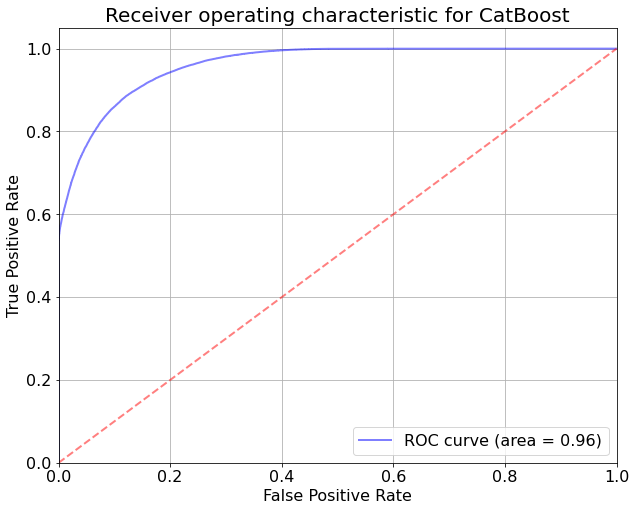

In [80]:
cat_preds = cat_clf.predict_proba(X_test_cat)
cat_class = cat_clf.predict(X_test_cat)
print(classification_report(y_test_cat, cat_class))
cat_score = roc_auc_score(y_test_cat, cat_preds[:,1], average = 'weighted')
print(cat_score)
(fpr, tpr, thresholds) = roc_curve(y_test_cat, cat_preds[:,1])
plot_ROC(fpr, tpr, 'CatBoost')

### Decision Tree Classifier

In [65]:
X_train_dec, X_test_dec, y_train_dec, y_test_dec = train_test_split(X,y,test_size=0.2, random_state=42)

In [66]:
DTC=DecisionTreeClassifier()
dec_params={'criterion':['gini','entropy'],'max_depth':[5,10,20]}
dec_clf = GridSearchCV(DTC, dec_params,cv=5)

In [67]:
dec_clf.fit(X_train_dec,y_train_dec)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 20]})

In [68]:
print(dec_clf.best_params_)

{'criterion': 'gini', 'max_depth': 20}


              precision    recall  f1-score   support

           0       0.89      0.79      0.84     66775
           1       0.81      0.90      0.85     66985

    accuracy                           0.84    133760
   macro avg       0.85      0.84      0.84    133760
weighted avg       0.85      0.84      0.84    133760

0.9143057105242722


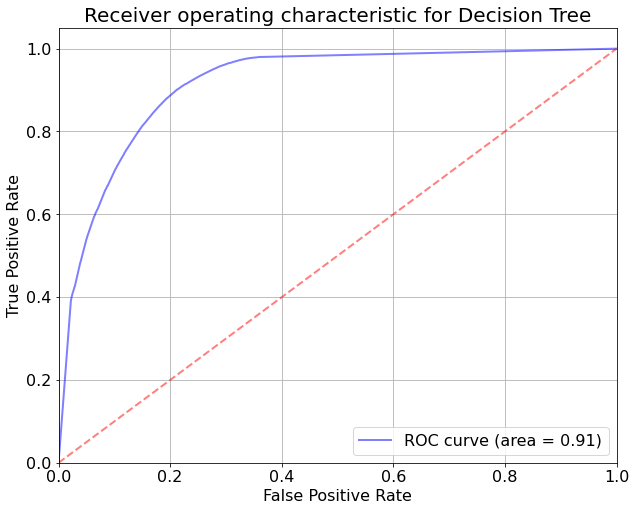

In [79]:
dec_preds = dec_clf.predict_proba(X_test_dec)
dec_class = dec_clf.predict(X_test_dec)
print(classification_report(y_test_dec, dec_class))
dec_score = roc_auc_score(y_test_dec, dec_preds[:,1], average = 'weighted')
print(dec_score)
(fpr, tpr, thresholds) = roc_curve(y_test_dec, dec_preds[:,1])
plot_ROC(fpr, tpr, 'Decision Tree')

### Random Forest Classifier

In [71]:
X_train_rd, X_test_rd, y_train_rd, y_test_rd = train_test_split(X,y,test_size=0.2, random_state=42)

In [73]:
RFC=RandomForestClassifier()
rfc_params={'criterion':['gini','entropy'],'max_depth':[20,50],'n_estimators': [10, 50, 100]}
rf_clf = GridSearchCV(RFC, rfc_params,cv=5)

In [74]:
rf_clf.fit(X_train_rd,y_train_rd)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [20, 50], 'n_estimators': [10, 50, 100]})

In [75]:
print(rf_clf.best_params_)

{'criterion': 'entropy', 'max_depth': 50, 'n_estimators': 100}


              precision    recall  f1-score   support

           0       0.92      0.85      0.88     66775
           1       0.86      0.93      0.89     66985

    accuracy                           0.89    133760
   macro avg       0.89      0.89      0.89    133760
weighted avg       0.89      0.89      0.89    133760

0.9624634591465586


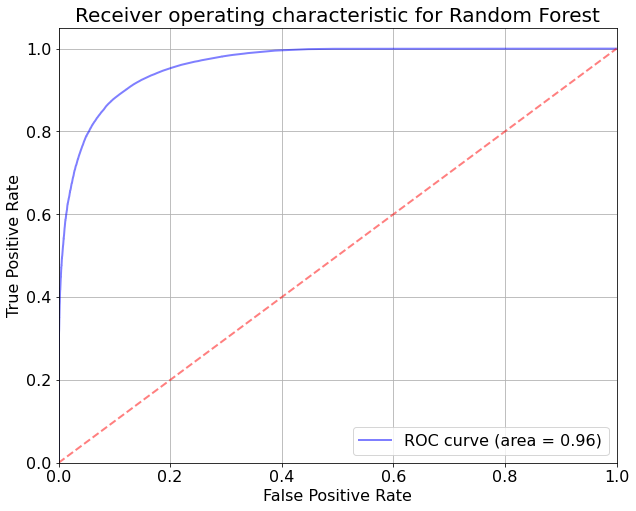

In [78]:
rf_preds = rf_clf.predict_proba(X_test_rd)
rf_class = rf_clf.predict(X_test_rd)
print(classification_report(y_test_rd, rf_class))
rfc_score = roc_auc_score(y_test_rd, rf_preds[:,1], average = 'weighted')
print(rfc_score)
(fpr, tpr, thresholds) = roc_curve(y_test_rd, rf_preds[:,1])
plot_ROC(fpr, tpr, 'Random Forest')

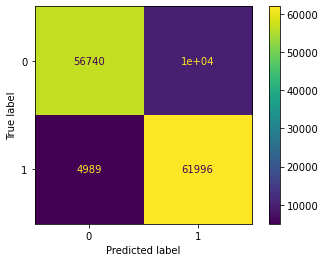

In [77]:
plot_confusion_matrix(rf_clf, X_test_rd, y_test_rd)  
plt.show() 

In [83]:
newtest=test_df.drop(['id'],axis=1)

In [84]:
newtest.Gender = newtest.Gender.map(gender_coder)
newtest.tail()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
127032,0,26,1,37.0,1,< 1 Year,No,30867.0,152.0,56
127033,0,38,1,28.0,0,1-2 Year,Yes,28700.0,122.0,165
127034,1,21,1,46.0,1,< 1 Year,No,29802.0,152.0,74
127035,1,71,1,28.0,1,1-2 Year,No,62875.0,26.0,265
127036,1,41,1,29.0,1,1-2 Year,No,27927.0,124.0,231


In [85]:
newtest = pd.get_dummies(newtest, columns=['Vehicle_Age'])  #Constructing 3 new features from the ordinal vehicle age feature

In [86]:
newtest.Vehicle_Damage = newtest.Vehicle_Damage.map(vehicle_coder)
newtest

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Vehicle_Age_1-2 Year,Vehicle_Age_< 1 Year,Vehicle_Age_> 2 Years
0,1,25,1,11.0,1,0,35786.0,152.0,53,0,1,0
1,1,40,1,28.0,0,1,33762.0,7.0,111,1,0,0
2,1,47,1,28.0,0,1,40050.0,124.0,199,1,0,0
3,1,24,1,27.0,1,1,37356.0,152.0,187,0,1,0
4,1,27,1,28.0,1,0,59097.0,152.0,297,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
127032,0,26,1,37.0,1,0,30867.0,152.0,56,0,1,0
127033,0,38,1,28.0,0,1,28700.0,122.0,165,1,0,0
127034,1,21,1,46.0,1,0,29802.0,152.0,74,0,1,0
127035,1,71,1,28.0,1,0,62875.0,26.0,265,1,0,0


In [87]:
newtest[['Annual_Premium']] = min_max.fit_transform(newtest[['Annual_Premium']])

In [108]:
#Predicting probabilities of Random forest and CatBoost on unseen test data
pred1 = cat_clf.predict_proba(newtest)[:,1]
pred1=pred1/5
pred2 = rf_clf.predict_proba(newtest)[:,1]
pred2=pred2/5

In [113]:
submit = pd.DataFrame(index=test_df.index)
submit["id"] = test_df.id
submit["Response"] = 0.7*pred1+0.3*pred2   #blending probabilities of RF and CatBoost for target prediction
submit.head()

,id,Response
0,381110,0.000043
1,381111,0.129915
2,381112,0.102863
3,381113,0.000619
4,381114,0.000051


In [112]:
submit.to_csv("new_submission.csv")